**The original model OPCNN-FAKE from IEEE Access:**

https://ieeexplore.ieee.org/document/9537782

In [ ]:
# @title Install library
!pip -q uninstall torch torchtext -y
!pip -q install torch==2.0.1 torchtext==0.5.0
!pip -q install numpy==2.0.0
!pip install tensorflowjs

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.6.0+cu124 requires torch==2.6.0, but you have torch 2.0.1 which is incompatible.
torchvision 0.21.0+cu124 requires torch==2.6.0, but you have torch 2.0.1 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 2.9 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
google-cloud-bigquery 3.34.0 requires packaging>

In [ ]:
# @title Import
from google.colab import drive, files
import os, re, nltk, json
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflowjs as tfjs
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords, words
from nltk.stem import PorterStemmer, WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from sklearn.model_selection import train_test_split
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
from torchtext.vocab import GloVe
from tqdm import tqdm

tqdm.pandas()
nltk.download('stopwords')
nltk.download('words')
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
# @title Mount drive and upload Kaggle API key
drive.mount('/content/drive')
files.upload() #Upload Kaggle API key

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"lehuong240823","key":"bef28f5c34daf5c2784ce3675feea0b3"}'}

Setup API key: https://www.kaggle.com/docs/api#authentication

Download json API key after sign in with this url: https://www.kaggle.com/settings

In [ ]:
# @title Save API key
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
# @title Global variable
colab_dataset_path = './fake-news-detection-datasets/News _dataset'
drive_dataset_path = '/content/drive/My Drive/Colab Notebooks/data/public/OPCNN-FAKE'

stop_words = set(stopwords.words('english'))
english_words = set(words.words())
stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

input_dim = 20000
output_dim = 200
input_length = 100

tokenizer = Tokenizer(num_words=input_dim, oov_token="<OOV>", filters='')
glove = GloVe(name='6B', dim=output_dim)


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.0 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>
    ColabKernelApp.launch_instance()
  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance
    app.start()
  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start
    self.io_loop.start()
  File "/usr/local/lib/python3.11/dist-package

# **Data collection**
**ISOT Fake News Dataset**

The dataset consists of two CSV files. The first file named “True.csv” contains more than 12,600 articles from reuter.com. The second file named “Fake.csv” contains more than 12,600 articles from different fake news outlet resources. Each article contains the following information: article title, text, type and the date the article was published on.

Dataset source: https://www.kaggle.com/datasets/emineyetm/fake-news-detection-datasets

<img src="https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F6380913%2F3637b4f75c0c0169b36e2c62be008dcf%2FEkran%20Resmi%202022-12-07%2014.51.23.png?generation=1670413908576107&alt=media" width="400" >

In [ ]:
# @title Download dataset and extract
!kaggle datasets download -d emineyetm/fake-news-detection-datasets
!unzip fake-news-detection-datasets.zip -d ./fake-news-detection-datasets

Dataset URL: https://www.kaggle.com/datasets/emineyetm/fake-news-detection-datasets
License(s): unknown
fake-news-detection-datasets.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  fake-news-detection-datasets.zip
replace ./fake-news-detection-datasets/News _dataset/Fake.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: ./fake-news-detection-datasets/News _dataset/Fake.csv  
  inflating: ./fake-news-detection-datasets/News _dataset/True.csv  


In [ ]:
# @title Merge dataset
def merge_fake_true_datasets(fake_df, true_df):
  fake_df['label'] = 0
  true_df['label'] = 1
  merged_df = pd.concat([fake_df, true_df], ignore_index=True)
  #merged_df.to_csv('Merged_News.csv', index=False)
  return merged_df

In [ ]:
# @title Save df as csv
def save_df_as_csv_to_folder(df, folder_path, file_name):
  if not os.path.exists(folder_path):
    os.makedirs(folder_path)
    print(f"Folder created: {folder_path}")
  file_path = os.path.join(folder_path, file_name)
  df.to_csv(file_path, index=False)
  print(f"File saved at: {file_path}")

  return file_path

In [ ]:
# @title Read df as csv
def read_df_from_csv_in_folder(folder_path, file_name):
  file_path = os.path.join(folder_path, file_name)
  print(f'Loading {file_path}...')
  df = pd.read_csv(file_path)
  print('Done')
  return df

#Preprocessing

In [ ]:
# @title Cleaning data for single instance
def clean_text(text):
  print("[RAW]", text[:60])
  # 1. Lowercase
  text = str(text).lower()

  # 2. Remove URLs (e.g., percentfedup.com/served-...)
  text = re.sub(r'https?://\S+|www\.\S+|\S+\.\S+/\S*', '', text)

  # 3. Remove mentions, hashtags
  text = re.sub(r'@\w+', '', text)
  text = re.sub(r'#\w+', '', text)

  # 4. Remove masked/obfuscated words like f*ck
  text = re.sub(r'\b\w*\*+\w*\b', '', text)

  # 5. Remove alphanumeric like 700k, 20years, 4th, etc.
  text = re.sub(r'\b\d+[a-zA-Z]*\b', '', text)
  text = re.sub(r'(\d+)([a-zA-Z]+)', r'\1 \2', text)

  # 6. Remove non-letter characters (keep space)
  text = re.sub(r'[^a-z\s]', ' ', text)

  # 7. Remove extra whitespace
  text = re.sub(r'\s+', ' ', text).strip()

  # 8. Remove short tokens (< 3 chars)
  text = ' '.join(word for word in text.split() if 10 >= len(word) >= 3)
  print("[CLEANED]", text[:60])
  return text

def preprocess_text(text):
  text = clean_text(text)
  if not text:  # Nếu sau clean thì text rỗng
    return ''
  tokens = nltk.word_tokenize(text) # 4. Tokenization
  tokens = [word for word in tokens if word in english_words] # 5. Remove non-english words
  filtered_tokens = [word for word in tokens if word not in stop_words] # 5. Remove stopwords
  stemmed_tokens = [lemmatizer.lemmatize(word) for word in filtered_tokens] # 6. Lemmatization
  #stemmed_tokens = [stemmer.stem(word) for word in filtered_tokens] # 6. Stemming

  return ' '.join(stemmed_tokens) # Return the cleaned text

In [ ]:
# @title Cleaning data for whole dataset
def preprocess_merged_data(df, max_length=input_length):
  df.drop_duplicates(inplace=True)
  df.loc[:, 'title'] = df['title'].fillna('')
  df.loc[:, 'text'] = df['text'].fillna('')
  df.loc[:, 'combined_text'] = df['title'] + ' ' + df['text']
  df.loc[:, 'cleaned_text'] = df['combined_text'].progress_apply(lambda x: preprocess_text(text=x))

  tokenizer.fit_on_texts(df['cleaned_text'])
  sequences = tokenizer.texts_to_sequences(df['cleaned_text'])

  df = df.reset_index(drop=True)

  filtered_data = [(seq, df.loc[i, 'label']) for i, seq in enumerate(sequences) if seq]
  sequences, labels = zip(*filtered_data)

  labels = np.array(labels, dtype=int).reshape(-1, 1)

  padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post', dtype='float32')

  processed_df = pd.DataFrame(padded_sequences)
  processed_df['label'] = labels

  return processed_df

# Feature extraction

In [ ]:
# @title Create embedding matrix with GloVe
def create_embedding_matrix(word_index, embedding_dim=output_dim):
  embedding_matrix = np.zeros((len(word_index), embedding_dim))
  print(embedding_matrix.shape)
  for word, i in word_index.items():
    embedding_matrix[i-1] = glove[word].numpy() if word in glove.stoi else np.zeros(embedding_dim)

  if embedding_matrix.shape[0] < input_dim:
    missing_rows = np.zeros((input_dim - embedding_matrix.shape[0], embedding_dim), dtype=np.float32)
    embedding_matrix = np.vstack([embedding_matrix, missing_rows])
  return embedding_matrix

def create_word_index(df):
  all_words = df.iloc[:, :-1].values.flatten()
  unique_words = list(set(all_words) - {np.nan})
  if len(unique_words) < input_dim:
    print(f"Warning: Only {len(unique_words)} unique words found!")
  while len(unique_words) < input_dim:
    unique_words.append(f"placeholder_{len(unique_words)}")

  word_index = {word: i + 1 for i, word in enumerate(unique_words[:input_dim])}
  return word_index

def text_to_embedding(text, word_index, embedding_matrix):
  if not isinstance(text, str):
    text = str(text)
  words = text.split()
  embeddings = np.array([embedding_matrix[word_index[word]] if word in word_index else np.zeros(embedding_matrix.shape[1]) for word in words])
  return embeddings.mean(axis=0)

def process_dataframe(df):
  word_index = create_word_index(df)
  embedding_matrix = create_embedding_matrix(word_index)

  df['cleaned_text_embeddings'] = df.iloc[:, :-1].apply(lambda row: text_to_embedding(' '.join(map(str, row)), word_index, embedding_matrix), axis=1)

  return df[['cleaned_text_embeddings', df.columns[-2]]].copy()

def generate_global_embedding_matrix(df, embedding_dim=output_dim):
  word_index = create_word_index(df)
  embedding_matrix = create_embedding_matrix(word_index, embedding_dim)

  return word_index, embedding_matrix


# Splitting and balancing the dataset

In [ ]:
# @title Train Test Split
def train_test_splitting(X, y, max_index, test_size=0.2, random_state=42):
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=y, random_state=random_state)

  X_train = np.asarray(X_train, dtype=np.int32)
  X_test = np.asarray(X_test, dtype=np.int32)
  y_train = np.asarray(y_train, dtype=np.int32)
  y_test = np.asarray(y_test, dtype=np.int32)

  X_train = np.clip(X_train, 0, max_index - 1)

  X_test = np.clip(X_test, 0, max_index - 1)

  print(f"Train Shape: {X_train.shape}, {y_train.shape}")
  print(f"Test Shape: {X_test.shape}, {y_test.shape}")

  return X_train, X_test, y_train, y_test

# Building and training the model

In [ ]:
# @title Build model
def build_opcnn_fake_model(
    vocab_size,
    embedding_matrix,
    input_length=input_length,
    embedding_dim=output_dim,
    dropout_rate=0.4,
    filter_sizes=22,
    kernel_sizes=4,
    pool_sizes=3,
    name='opcnn_fake',
  ):
  input_layer = tf.keras.layers.Input(shape=(input_length,), dtype=np.int32)

  embedding_layer = tf.keras.layers.Embedding(
    input_dim=vocab_size,
    output_dim=embedding_dim,
    #weights=[np.array(embedding_matrix, dtype = np.float32)],
    input_length=input_length,
    trainable=True
  )(input_layer)

  dropout_emb = tf.keras.layers.Dropout(dropout_rate)(embedding_layer)

  conv1 = tf.keras.layers.Conv1D(filters=filter_sizes, kernel_size=kernel_sizes, activation='relu')(dropout_emb)
  conv2 = tf.keras.layers.Conv1D(filters=filter_sizes, kernel_size=kernel_sizes, activation='relu')(dropout_emb)
  conv3 = tf.keras.layers.Conv1D(filters=filter_sizes, kernel_size=kernel_sizes, activation='relu')(dropout_emb)

  pool1 = tf.keras.layers.MaxPooling1D(pool_size=pool_sizes, strides=1, padding="same")(conv1)
  pool2 = tf.keras.layers.MaxPooling1D(pool_size=pool_sizes,  strides=1, padding="same")(conv2)
  pool3 = tf.keras.layers.MaxPooling1D(pool_size=pool_sizes, strides=1, padding="same")(conv3)

  merged = tf.keras.layers.concatenate([pool1, pool2, pool3])

  flatten = tf.keras.layers.Flatten()(merged)

  dense = tf.keras.layers.Dense(64, activation='relu')(flatten)

  output = tf.keras.layers.Dense(1, activation='sigmoid')(dense)

  model = tf.keras.Model(inputs=input_layer, outputs=output)

  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'precision', 'recall']) #, 'f1-score'
  model.summary()

  return model

In [ ]:
# @title Optimize hyperparameters
def optimize_hyperparameters(X_train, y_train, vocab_size, embedding_matrix, input_length=input_length):
  def objective(params):
    model = build_opcnn_fake_model(
          name='opcnn_fake_hyperopt',
          input_length=input_length,
          vocab_size=vocab_size,
          embedding_matrix=embedding_matrix,
          dropout_rate=params['dropout_rate'],
          filter_sizes=params['filter_sizes'],
          kernel_sizes=params['kernel_sizes'],
          pool_sizes=params['pool_sizes']
        )

    history = model.fit(
        X_train, y_train,
        epochs=int(params['epochs']),
        batch_size=int(params['batch_size']),
        verbose=1
      )

    _, accuracy, precision, recall = model.evaluate(X_train, y_train, verbose=1)
    return {'loss': -accuracy, 'status': STATUS_OK}

  space = {
    'dropout_rate': hp.uniform('dropout_rate', 0.1, 0.9),
    'epochs': hp.choice('epochs', [4]), #hp.quniform('epochs', 1, 200, 1),
    'batch_size': hp.choice('batch_size', [73, 100, 146, 219, 500, 1000]),
    'filter_sizes': hp.choice('filter_sizes', [32, 64, 128]),
    'kernel_sizes': hp.choice('kernel_sizes', [2, 3, 4]),
    'pool_sizes': hp.choice('pool_sizes', [2, 3, 6])
  }

  trials = Trials()
  best_params = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=10, trials=trials)
  return best_params

In [ ]:
# @title Train model
def train_opcnn_fake(X_train, y_train, vocab_size, embedding_matrix, input_length=input_length):
  best_params = optimize_hyperparameters(X_train, y_train, vocab_size, embedding_matrix, input_length)
  model = build_opcnn_fake_model(
      vocab_size=vocab_size,
      embedding_matrix=embedding_matrix,
      input_length=input_length,
      embedding_dim=input_dim,
      dropout_rate=best_params['dropout_rate'],
      filter_sizes=best_params['filter_sizes'],
      kernel_sizes=best_params['kernel_sizes'],
      pool_sizes=best_params['pool_sizes']
  )
  history = model.fit(X_train, y_train,
            epochs=int(best_params['epochs']),
            batch_size=int(best_params['batch_size']),
            verbose=1)


  return history, model

# Evaluating performance

In [ ]:
def evaluate_model(model, X_test, y_test):
  results = model.evaluate(X_test, y_test)
  print(f"Test Accuracy: {results[1]:.4f}, Precision: {results[2]:.4f}, Recall: {results[3]:.4f}")
  return results

# Visualization

In [ ]:
def plot_model_evaluation_result(result):
  plt.figure(figsize=(6, 5))

  plt.title('Model Evaluation Results')
  plt.ylabel('Value')
  plt.ylim(0, 1.1)

  for i, value in enumerate(result):
    if value != 0:
      results_labels = ['Loss', 'Accuracy', 'Precision', 'Recall']
      plt.text(i, value + 0.01, f'{value:.4f}', ha='center', va='bottom')
      sns.barplot(x=results_labels, y=result)
    else:
      results_labels = ['Loss', 'Accuracy']
      sns.barplot(x=results_labels, y=result[:2])

  plt.show()

In [ ]:
# @title Model Evaluation Metrics Over Epochs
def evaluate_metrics_over_epochs(history):
  df = pd.DataFrame(history.history)
  df.plot(figsize=(6,4))
  plt.xlabel('Epochs')
  plt.ylabel('Evaluation Metrics Value')
  plt.title('Model Evaluation Metrics Over Epochs')
  plt.show()

# Run

In [ ]:
# @title Load data
processed_file_name = 'processed_news_inp100.csv'

if os.path.exists(f'{drive_dataset_path}/{processed_file_name}'):
  processed_df = read_df_from_csv_in_folder(drive_dataset_path, processed_file_name)
else:
  print(f"The file '{processed_file_name}' does not exist in Google Drive.")
  csv_files = [f for f in os.listdir(colab_dataset_path) if f.endswith('.csv')]
  dfs = {f: pd.read_csv(os.path.join(colab_dataset_path, f)) for f in csv_files}

  merged_df = merge_fake_true_datasets(dfs['Fake.csv'], dfs['True.csv'])
  processed_df = preprocess_merged_data(merged_df)
  save_df_as_csv_to_folder(processed_df, drive_dataset_path, processed_file_name)

Loading /content/drive/My Drive/Colab Notebooks/data/public/OPCNN-FAKE/processed_news_inp100.csv...
Done


In [ ]:
#@title Save vocabulary for deploy
csv_files = [f for f in os.listdir(colab_dataset_path) if f.endswith('.csv')]
dfs = {f: pd.read_csv(os.path.join(colab_dataset_path, f)) for f in csv_files}

merged_df = merge_fake_true_datasets(dfs['Fake.csv'], dfs['True.csv'])
processed_df = preprocess_merged_data(merged_df)
with open(f"{drive_dataset_path}/vocabulary.json", "w", encoding="utf-8") as f:
    json.dump(tokenizer.word_index, f)

  0%|          | 0/44689 [00:00<?, ?it/s]

[RAW]  Donald Trump Sends Out Embarrassing New Year’s Eve Message;
[CLEANED] donald trump sends out new year eve message this disturbing 


  0%|          | 79/44689 [00:04<27:21, 27.18it/s]

[RAW]  Drunk Bragging Trump Staffer Started Russian Collusion Inve
[CLEANED] drunk bragging trump staffer started russian collusion house
[RAW]  Sheriff David Clarke Becomes An Internet Joke For Threateni
[CLEANED] sheriff david clarke becomes internet joke for poke people t
[RAW]  Trump Is So Obsessed He Even Has Obama’s Name Coded Into Hi
[CLEANED] trump obsessed even has obama name coded into his website im
[RAW]  Pope Francis Just Called Out Donald Trump During His Christ
[CLEANED] pope francis just called out donald trump during his christm
[RAW]  Racist Alabama Cops Brutalize Black Boy While He Is In Hand
[CLEANED] racist alabama cops brutalize black boy while handcuffs grap
[RAW]  Fresh Off The Golf Course, Trump Lashes Out At FBI Deputy D
[CLEANED] fresh off the golf course trump lashes out fbi deputy direct
[RAW]  Trump Said Some INSANELY Racist Stuff Inside The Oval Offic
[CLEANED] trump said some insanely racist stuff inside the oval office
[RAW]  Former CIA Director Slams T

  0%|          | 155/44689 [00:04<10:20, 71.78it/s]

[RAW]  Trump Just Got His P*ssy Handed To Him By New Zealand’s Fem
[CLEANED] trump just got his handed him new zealand female prime minis
[RAW]  Chaos Ensues After Man Accidentally Shoots Himself And Wife
[CLEANED] chaos ensues after man shoots himself and wife church during
[RAW]  New Accuser Confirms She Got Roy Moore Banned From The Mall
[CLEANED] new accuser confirms she got roy moore banned from the mall 
[RAW]  Roy Moore Is Asking People To Snitch On The Media And He’s 
[CLEANED] roy moore asking people snitch the media and getting trolled
[RAW]  Trump Admin. Tosses Out Another Obama Rule – His Sons Can B
[CLEANED] trump admin tosses out another obama rule his sons can even 
[RAW]  The Internet Lights Up After The Pentagon Accidentally Retw
[CLEANED] the internet lights after the pentagon retweets call for tru
[RAW]  Anti-Gay GOP Rep Gets BUSTED For Having Inappropriate Relat
[CLEANED] anti gay gop rep gets busted for having relations with man h
[RAW]  That Time Trump Mocked Marc

  1%|          | 231/44689 [00:05<05:32, 133.72it/s]

[RAW]  Hillary Clinton TOTALLY Just Rubbed ‘Indictment’ Rumors In 
[CLEANED] hillary clinton totally just rubbed indictment rumors trump 
[RAW]  Twitter Just Banned A Major Trump Ally For Threatening Jour
[CLEANED] twitter just banned major trump ally for trump advisor roger
[RAW]  If You’re Looking For Ways To Irritate Trump, Here Are Some
[CLEANED] you looking for ways irritate trump here are some tips image
[RAW]  BREAKING: The First Charges Have Been Filed In Mueller’s Ru
[CLEANED] breaking the first charges have been filed mueller russia sp
[RAW]  Trump’s Puerto Rico Contract With Two-Man Energy Company Is
[CLEANED] trump puerto rico contract with two man energy company corru
[RAW]  WATCH: Former White House Official Suggests On Hannity That
[CLEANED] watch former white house official suggests hannity that hill
[RAW]  Trump Just Closed The Office That Coordinates Russia Sancti
[CLEANED] trump just closed the office that russia sanctions with dona
[RAW]  Yet Another Asshole Just Ra

  1%|          | 303/44689 [00:05<03:46, 195.71it/s]

[RAW]  WH Staffer Explains Trump’s ‘Calm Before The Storm’ Comment
[CLEANED] staffer explains trump calm before the storm comment proves 
[RAW]  Thanks To Trump The U.S. Economy Lost Jobs For The First Ti
[CLEANED] thanks trump the economy lost jobs for the first time years 
[RAW]  SLC Cops Murder Crying Suspect, Shoot Him In The Back AND T
[CLEANED] slc cops murder crying suspect shoot him the back and taser 
[RAW]  Anti-Abortion Republican Just Aborted Himself From Office U
[CLEANED] anti abortion republican just aborted himself from office re
[RAW]  The Justice Department Just Said It’s Legal To Discriminate
[CLEANED] the justice department just said legal against people the tr
[RAW]  The Senate Banking Committee Held An Equifax Hearing, And T
[CLEANED] the senate banking committee held equifax hearing and the mo
[RAW]  In The Wake Of Las Vegas, The GOP Are Finally Beginning To 
[CLEANED] the wake las vegas the gop are finally beginning support gun
[RAW]  Hilarious Video Shows The M

  1%|          | 372/44689 [00:05<03:00, 244.90it/s]

[RAW]  Trump Whines That The Media Wouldn’t Film His Crowd In Alab
[CLEANED] trump whines that the media wouldn film his crowd alabama cn
[RAW]  Republican Senator STUNS In Town Hall, Admits GOP’s ObamaCa
[CLEANED] republican senator stuns town hall admits gop obamacare repe
[RAW]  Scaramucci TV Appearance Goes Off The Rails As Show Brings 
[CLEANED] scaramucci appearance goes off the rails show brings special
[RAW]  Michelle Obama Opens A Can Of Whoop A** On Trump Without Ev
[CLEANED] michelle obama opens can whoop trump without ever mentioning
[RAW]  BREAKING: John McCain Breaks With His Best Senate Friend, W
[CLEANED] breaking john mccain breaks with his best senate friend will
[RAW]  Medicaid Directors Of All 50 States Issue Joint Statement S
[CLEANED] medicaid directors all states issue joint statement slamming
[RAW]  Trump’s HHS Sec. Latest To Be Caught Spending HUNDREDS OF T
[CLEANED] trump hhs sec latest caught spending hundreds thousands tax 
[RAW]  Trump Regrets, Move Over: ‘

  1%|          | 448/44689 [00:05<02:26, 301.64it/s]

[RAW]  New Study Proves That Trump Supporters Are Racist, Infuriat
[CLEANED] new study proves that trump supporters are racist infuriated
[RAW]  Red Cross Raises Tens Of Millions And You Won’t Believe Wha
[CLEANED] red cross raises tens millions and you won believe what they
[RAW]  ‘Pharma Bro’ Faces Prison Time For Offering To Pay People T
[CLEANED] pharma bro faces prison time for offering pay people assault
[RAW]  Another Pervert Out At Fox News Over Allegations Of Sexual 
[CLEANED] another pervert out fox news over sexual harassment fox news
[RAW]  Trump Official Gets Asked A Simple Question About Global Wa
[CLEANED] trump official gets asked simple question about global warmi
[RAW]  Equifax Is Tricking Consumers Into Waiving Their Right To S
[CLEANED] equifax tricking consumers into waiving their right sue over
[RAW]  With Irma About To Strike Florida, Trump Begs For Donations
[CLEANED] with irma about strike florida trump begs for donations his 
[RAW]  Five ‘All American’ Footbal

  1%|          | 523/44689 [00:06<02:14, 328.40it/s]

[RAW]  The UNBELIEVABLE Reason Trump Pardoned Arpaio As Hurricane 
[CLEANED] the reason trump pardoned arpaio hurricane harvey was bearin
[RAW]  Advisers Are Now Warning Donald Trump About Impeachment Don
[CLEANED] advisers are now warning donald trump about donald trump cal
[RAW]  Trump Tried To Distance Himself From His ‘Senior Advisor’ W
[CLEANED] trump tried distance himself from his senior advisor who pro
[RAW]  Donald Trump Was Looking To Build A Trump Tower In Moscow W
[CLEANED] donald trump was looking build trump tower moscow while was 
[RAW]  Eric Holder Just Hilariously Called Trump Out On Arpaio: Ob
[CLEANED] eric holder just called trump out arpaio obama never asked d
[RAW]  Phoenix Newspaper Breaks The Internet In Brutal Tweetstorm 
[CLEANED] phoenix newspaper breaks the internet brutal tweetstorm form
[RAW]  WaPo: Trump Tried To Get Sessions To Let Racist Sheriff Joe
[CLEANED] wapo trump tried get sessions let racist sheriff joe arpaio 
[RAW]  Trump Calls Out Anti-Fascis

  1%|▏         | 596/44689 [00:06<02:08, 342.24it/s]

[RAW]  KKK Grand Wizard David Duke THANKS Trump For Championing Wh
[CLEANED] kkk grand wizard david duke thanks trump for white supremacy
[RAW]  He Finally Came Out And Said It: Trump Calls Protesters As 
[CLEANED] finally came out and said trump calls protesters bad nazis s
[RAW]  Trump Lashes Out At CEOs, Suggests He’ll Replace Them With 
[CLEANED] trump lashes out ceos suggests replace them with ones who su
[RAW]  Trump Goes ‘Home’ To Trump Tower After Racism Condemnation,
[CLEANED] trump goes home trump tower after racism retweets alt right 
[RAW]  Protesters Welcome Trump Home To His Golden Tower With The 
[CLEANED] protesters welcome trump home his golden tower with the best
[RAW]  Fox Host Goes Rogue, Shreds Trump’s ‘Cowardly And Dangerous
[CLEANED] fox host goes rogue shreds trump cowardly and dangerous rema
[RAW]  Trump Crushed As Ex-KKK Leader Bashes Him For Finally Calli
[CLEANED] trump crushed kkk leader bashes him for finally calling out 
[RAW]  CNN Reporter Just Asked Tru

  1%|▏         | 668/44689 [00:06<02:06, 346.67it/s]

[RAW]  Victims Of Terrorist Attack Question Lack Of Presidential S
[CLEANED] victims terrorist attack question lack support minnesota gov
[RAW]  Elderly California Man Just Savaged A GOP Congressman To Hi
[CLEANED] elderly california man just savaged gop his face republican 
[RAW]  The Leaker-In-Chief Just Tweeted Classified Info To His 35 
[CLEANED] the leaker chief just tweeted classified info his million fo
[RAW]  Senator Who Has Accomplished Nothing Is Very Upset People T
[CLEANED] senator who has nothing very upset people think nothing mitc
[RAW]  Breaking: MAJOR Action Taking Place At Trump Tower As Activ
[CLEANED] breaking major action taking place trump tower activists pro
[RAW]  Three Days Before Trump Calls For More Police Brutality, Yo
[CLEANED] three days before trump calls for more police brutality youn
[RAW]  Official GOP Twitter Account Went Fully Delusional And Amer
[CLEANED] official gop twitter account went fully delusional and ameri
[RAW]  Hey Trump Fans: Trump Hasn’

  2%|▏         | 738/44689 [00:06<02:11, 333.40it/s]

[RAW]  Rick Perry Is Mocked Over Nukes By Secretary Whose Job He T
[CLEANED] rick perry mocked over nukes secretary whose job thought was
[RAW]  White House In Chaos As Trump Fires Scaramucci After Only 1
[CLEANED] white house chaos trump fires scaramucci after only days the
[RAW]  Craziest Person In Congress Wants To Investigate Everyone B
[CLEANED] craziest person congress wants everyone but trump maybe you 
[RAW]  WATCH: Trump Really Does Think He’s On A West Wing Edition 
[CLEANED] watch trump really does think west wing edition the apprenti
[RAW]  Trump Whines About Obamacare And Takes Credit For Obama’s E
[CLEANED] trump whines about obamacare and takes credit for obama econ
[RAW]  Tomi Lahren Blasts ObamaCare, Admits She’s Still On Parents
[CLEANED] tomi lahren blasts obamacare admits she still parents health
[RAW]  Joe Biden Proves He’s A MUCH Better Negotiator Than Trump; 
[CLEANED] joe biden proves much better negotiator than trump helped sa
[RAW]  McCain F*cked Over Senate R

  2%|▏         | 808/44689 [00:06<02:09, 338.50it/s]

[RAW]  Republicans Are Trying To Destroy The Senate As We Know It,
[CLEANED] are trying destroy the senate know taking away your vote her
[RAW]  Republican Official Caught Exposing Himself Attacks Police 
[CLEANED] republican official caught exposing himself attacks police o
[RAW]  WATCH: Scaramucci Cried About How Hard It Is For Wall St. E
[CLEANED] watch scaramucci cried about how hard for wall elites presid
[RAW]  Member Of Congress Educates Trump: ‘Our Job Is To Check You
[CLEANED] member congress educates trump our job check you not protect
[RAW]  Carrier Employee Speaks Out On Trump: ‘He Blew Smoke Up Our
[CLEANED] carrier employee speaks out trump blew smoke our rally last 
[RAW]  Retired Colonel BLASTS Trump’s ‘Amateur’ Demand That Navy S
[CLEANED] retired colonel blasts trump amateur demand that navy sailor
[RAW]  Trump Whines Incoherently About ‘Russian Witch Hunt’ And Th
[CLEANED] trump whines about russian witch hunt and the internet laugh
[RAW]  Kellyanne Conway’s Meltdown

  2%|▏         | 877/44689 [00:07<02:13, 328.78it/s]

[CLEANED] trump gets trashed for justifying don collusion with russia 
[RAW]  Jared Kushner’s Excuse For The Russian Meeting Would Get Mo
[CLEANED] jared kushner excuse for the russian meeting would get most 
[RAW]  Fox News Just Shared A Poll That Trump Is Going To HATE, Me
[CLEANED] fox news just shared poll that trump going hate meltdown ine
[RAW]  James Comey Is Doing Something That Will Have Trump Sh*ttin
[CLEANED] james comey doing something that will have trump his pants t
[RAW]  Trump Goes Into Full Denial Mode During Temper Tantrum Over
[CLEANED] trump goes into full denial mode during temper tantrum over 
[RAW]  In One Chart, This Company Schooled Donald Trump On How To 
[CLEANED] one chart this company schooled donald trump how treat women
[RAW]  Fox Host Goes After ‘Soulless’ Hillary Clinton, Chelsea’s R
[CLEANED] fox host goes after soulless hillary clinton chelsea respons
[RAW]  The Trump Campaign Paid Don Jr’s Lawyer A Vast Amount Of Mo
[CLEANED] the trump campaign paid 

  2%|▏         | 944/44689 [00:07<02:14, 325.50it/s]

[CLEANED] mike pence saw not touch critical nasa tech touched tweets a
[RAW]  Sarah Palin Uses White Supremacist Slogan To Praise Trump’s
[CLEANED] sarah palin uses white slogan praise trump warsaw speech and
[RAW]  Hannity Throws A Complete Hissy Fit After Conservative Colu
[CLEANED] hannity throws complete hissy fit after columnist calls him 
[RAW]  Desperate Staff Sent Melania To Stop 2-Hour Trump/Putin Mee
[CLEANED] desperate staff sent melania stop hour trump putin meeting s
[RAW]  Trump Humiliates Himself And Wastes Time At G-20 Summit By 
[CLEANED] trump humiliates himself and wastes time summit throwing twi
[RAW]  Leaked G20 Video Appears To Show Trump Rubbing Putin’s Back
[CLEANED] leaked video appears show trump rubbing putin back first mee
[RAW]  The World To Trump: F*ck Off, You Did Not ‘Inherit A Mess’ 
[CLEANED] the world trump off you did not inherit mess from obama vide
[RAW]  Women Reporters Are Being Turned Away From Covering Congres
[CLEANED] women reporters are bein

  2%|▏         | 1010/44689 [00:07<02:14, 325.94it/s]

[RAW]  Melania Pauses Anti-Bullying Initiative To Say Her Husband 
[CLEANED] melania pauses anti bullying initiative say her husband allo
[RAW]  Sarah Huckabee Sanders F*cking UNBELIEVABLY Awful Defense O
[CLEANED] sarah huckabee sanders awful defense trump mika tweets video
[RAW]  Trump’s Social Media Man Joins Boss’s Insane, Juvenile Atta
[CLEANED] trump social media man joins boss insane juvenile attacks mo
[RAW]  Fox News Says ‘Health Insurance Doesn’t Matter Cause We’re 
[CLEANED] fox news says health insurance doesn matter cause all going 
[RAW]  Trump Goes On Insane Rant About Female News Anchor Bleeding
[CLEANED] trump goes insane rant about female news anchor bleeding her
[RAW]  Nikki Haley Gets Crucified On Twitter After Bragging About 
[CLEANED] nikki haley gets crucified twitter after bragging about sham
[RAW]  Trump Hesitant To Negotiate With Schumer On Health Care Bec
[CLEANED] trump hesitant negotiate with schumer health care because no
[RAW]  Time Magazine Tells Trump T

  2%|▏         | 1075/44689 [00:07<02:22, 305.43it/s]

[RAW]  Kellyanne Conway Admits Comey Tapes Probably Exist But Says
[CLEANED] kellyanne conway admits comey tapes probably exist but says 
[RAW]  Police Say Fire At DC Memorial For Muslim Teen Was ‘Not A H
[CLEANED] police say fire memorial for muslim teen was not hate crime 
[RAW]  Watch Kellyanne Conway Accuse Democrats Of ‘Interfering Wit
[CLEANED] watch kellyanne conway accuse democrats with our democracy o
[RAW]  Trump Suffers HUMILIATING Reality Check After Bragging Abou
[CLEANED] trump suffers reality check after bragging about the number 
[RAW]  WATCH: Justin Trudeau Has The PERFECT Response To Trump’s I
[CLEANED] watch justin trudeau has the perfect response trump idiotic 
[RAW]  Obama Just Delivered His Most Scathing Rebuke Of Trumpcare 
[CLEANED] obama just delivered his most scathing rebuke trumpcare yet 
[RAW]  Trump Tweets Lie About America’s Third Biggest Trading Part
[CLEANED] trump tweets lie about america third biggest trading partner
[RAW]  Trump’s Carrier Deal Falls 

  3%|▎         | 1144/44689 [00:07<02:15, 322.39it/s]

[CLEANED] christians can now against lgbt parents hoping adopt texas d
[RAW]  Trump RUNS SCARED From Russia Investigation, Hires ANOTHER 
[CLEANED] trump runs scared from russia hires another high profile law
[RAW]  Trump’s Personal Lawyer Just Made A Major Legal Move Prepar
[CLEANED] trump personal lawyer just made major legal move preparing f
[RAW]  White House Officials Caught Openly Mocking Trump, Administ
[CLEANED] white house officials caught openly mocking trump free fall 
[RAW]  Hillary’s Campaign Account Hasn’t Tweeted Since Nov. 7, And
[CLEANED] hillary campaign account hasn tweeted since nov and now trol
[RAW]  Ann Coulter Just Had A Total Meltdown Over ‘This Jackass’ I
[CLEANED] ann coulter just had total meltdown over this jackass the wh
[RAW]  Dem Senator ‘Increasingly Concerned’ Trump Will Fire Muelle
[CLEANED] dem senator concerned trump will fire mueller and rosenstein
[RAW]  The Army Field Manual Proves That Trump Is Too Mentally Uns
[CLEANED] the army field manual pr

  3%|▎         | 1256/44689 [00:08<02:03, 352.94it/s]

[RAW]  Former GOP Congressman TRASHES Paul Ryan: If Trump Were A D
[CLEANED] former gop trashes paul ryan trump were dem you impeach him 
[RAW]  WATCH: Elizabeth Warren Sets The Internet On FIRE By Dancin
[CLEANED] watch elizabeth warren sets the internet fire dancing throug
[RAW]  The Very Scary Reason Trump’s Evangelicals Don’t Care About
[CLEANED] the very scary reason trump don care about cuts programs for
[RAW]  Senior GOP Senator Says Trump Is Too Stupid To Collude With
[CLEANED] senior gop senator says trump too stupid collude with russia
[RAW]  Trump Biographer: The Donald Has A Long History Of Lying Ab
[CLEANED] trump biographer the donald has long history lying about tap
[RAW]  WATCH: Fox Host Chris Wallace Scolds Fox & Friends For Sayi
[CLEANED] watch fox host chris wallace scolds fox friends for saying r
[RAW]  Trump Plays Golf Again In Wake Of Damning Comey Testimony R
[CLEANED] trump plays golf again wake damning comey testimony rather t
[RAW]  Sessions PANICS, Cancels Pu

  3%|▎         | 1327/44689 [00:08<02:06, 343.77it/s]

[RAW]  London Mayor Demands UK Cancel Trump’s State Visit After Hi
[CLEANED] london mayor demands cancel trump state visit after his dera
[RAW]  Trump Taking Another Major Step Toward U.S. No Longer Being
[CLEANED] trump taking another major step toward longer being superpow
[RAW]  BREAKING: It Looks Like Russia Hacked Our Voting Machines S
[CLEANED] breaking looks like russia hacked our voting machines since 
[RAW]  CNN Found The Perfect Way To Troll Trump’s Live Announcemen
[CLEANED] cnn found the perfect way troll trump live today image donal
[RAW]  Fired Racist Breitbart Writer Says She Needs You To Pay Her
[CLEANED] fired racist breitbart writer says she needs you pay her med
[RAW]  Trump Held A Signing. The Only Problem Is, He Had Nothing T
[CLEANED] trump held signing the only problem had nothing sign back fe
[RAW]  White Supremacist GOPer’s Democratic Opponent Receives So M
[CLEANED] white goper democratic opponent receives many death threats 
[RAW]  Kellyanne Conway’s Husband 

  3%|▎         | 1398/44689 [00:08<02:07, 339.44it/s]

[RAW]  College Graduates Keep Rejecting Trump’s Evil Minions (VIDE
[CLEANED] college graduates keep rejecting trump evil minions videos g
[RAW]  ‘Portal To Hell’: The Internet Loses It Over Mysterious Red
[CLEANED] portal hell the internet loses over mysterious red lights fl
[RAW]  John McCain Says There’s A Much Bigger Threat To Us Than IS
[CLEANED] john mccain says there much bigger threat than isis and trum
[RAW]  Confused Old Man Forgets He’s At Arlington Cemetery, Thinks
[CLEANED] confused old man forgets arlington cemetery thinks baseball 
[RAW]  Twitter EXPLODES As Tortured Snowflake Trump Starts Blockin
[CLEANED] twitter explodes tortured snowflake trump starts blocking pe
[RAW]  State Department Official Says Trump Acted like a “Drunk To
[CLEANED] state department official says trump acted like drunk touris
[RAW]  Trump BUSTED Giving The Middle Finger To Italy’s Prime Mini
[CLEANED] trump busted giving the middle finger italy prime minister v
[RAW]  Rick Santorum Advises Presi

  3%|▎         | 1470/44689 [00:08<02:05, 343.64it/s]

[RAW]  Hilarious Rare Video Shows How Hillary Prepared To Avoid A 
[CLEANED] hilarious rare video shows how hillary prepared avoid trump 
[RAW]  Russian Investigation Landing Very Close To Trump; Jared Ku
[CLEANED] russian landing very close trump jared kushner now person in
[RAW]  Saudi Arabia Will Do Something Truly Disgusting In An Attem
[CLEANED] saudi arabia will something truly disgusting attempt trump d
[RAW]  BOMBSHELL REPORT: White House Counsel Preparing For Impeach
[CLEANED] bombshell report white house counsel preparing for details t
[RAW]  Paul Ryan Is FREAKING OUT After Leaked Tapes Surface, TERRI
[CLEANED] paul ryan freaking out after leaked tapes surface terrified 
[RAW]  Trump’s Version Of Firing James Comey Was Just Blown Out Of
[CLEANED] trump version firing james comey was just blown out the wate
[RAW]  During Russia Meeting Trump Explicitly Bragged He Fired Com
[CLEANED] during russia meeting trump explicitly bragged fired comey k
[RAW]  Comey Hates Trump So Much H

  3%|▎         | 1546/44689 [00:09<02:00, 357.67it/s]

[RAW]  Trump Tweeted Nine Times To Deleted Russian Twitter Account
[CLEANED] trump tweeted nine times deleted russian twitter accounts an
[RAW]  Comey’s 9-Year Old Neighbor Just SHAMED Trump And His Tempe
[CLEANED] comey year old neighbor just shamed trump and his with this 
[RAW]  Lindsey Graham: Trump Should Be Treated With The Same Respe
[CLEANED] lindsey graham trump should treated with the same respect ga
[RAW]  Desperate Trump Considers Dumping Spicer For Fox News Host 
[CLEANED] desperate trump considers dumping spicer for fox news host d
[RAW]  Dan Rather Brilliantly Rips Trump’s Lawless Week In SCATHIN
[CLEANED] dan rather rips trump lawless week scathing facebook post do
[RAW]  Warren Drags Trump Sideways In Brutal Commencement Speech —
[CLEANED] warren drags trump sideways brutal speech beautiful video th
[RAW]  BUSTED: Trump’s Pick For Top USDA Scientist Is NOT A Scient
[CLEANED] busted trump pick for top usda scientist not scientist all t
[RAW]  It’s ON: Comey Refuses To T

  4%|▎         | 1618/44689 [00:09<02:03, 349.09it/s]

[RAW]  Twitter Mocks Trump’s Face Off After Poorly-Spelled Insane 
[CLEANED] twitter mocks trump face off after poorly spelled insane ran
[RAW]  Trump Just FAILED Hundreds Of Manufacturing Workers And Bla
[CLEANED] trump just failed hundreds workers and blamed obama for last
[RAW]  Here’s The Disgusting Propaganda The White House Plans To U
[CLEANED] here the disgusting propaganda the white house plans use sme
[RAW]  Dem. Senator BLASTS Mitch McConnell For Excluding Women Fro
[CLEANED] dem senator blasts mitch mcconnell for excluding women from 
[RAW]  France REJECTS Far-Right Fascist In LANDSLIDE Victory For D
[CLEANED] france rejects far right fascist landslide victory for democ
[RAW]  WATCH: Kellyanne Conway BASHES Americans Who Oppose Trumpca
[CLEANED] watch kellyanne conway bashes americans who oppose trumpcare
[RAW]  ICYMI: SNL Skewers “Morning Joe” And It Is Hilarious This w
[CLEANED] icymi snl skewers morning joe and hilarious this week cold o
[RAW]  Paul Ryan Takes A Monumenta

  4%|▍         | 1690/44689 [00:09<02:03, 349.16it/s]

[CLEANED] trump rally already off the rails nazis show protester slamm
[RAW]  Elizabeth Warren Was Asked Why She Went To Trump’s Inaugura
[CLEANED] elizabeth warren was asked why she went trump her response w
[RAW]  Trump Whines That FAKE Media Won’t Report His Nonexistent A
[CLEANED] trump whines that fake media won report his gets stomped twe
[RAW]  WATCH: Rob Reiner Destroys Team Trump Claims that Obama Sho
[CLEANED] watch rob reiner destroys team trump claims that obama shoul
[RAW]  Team Trump Knew Flynn Broke The Law And Hired Him Anyway (D
[CLEANED] team trump knew flynn broke the law and hired him anyway det
[RAW]  Golf Addicted 70-Year-Old Man Says He ‘Couldn’t Care Less A
[CLEANED] golf addicted year old man says couldn care less about golf 
[RAW]  Bill Maher Just Dropped A Truth Bomb About Trump Voters Tha
[CLEANED] bill maher just dropped truth bomb about trump voters that e
[RAW]  Desperate For Guests, Fox News’ O’Reilly Replacement Invite
[CLEANED] desperate for guests fox

  4%|▍         | 1759/44689 [00:09<02:11, 325.33it/s]

[CLEANED] trump state campaign chair hot water for kid for sex details
[RAW]  Trump Makes Total Ass Of Himself While Trying To Exploit Wo
[CLEANED] trump makes total ass himself while trying exploit wounded v
[RAW]  Trump Plans To Celebrate 100th Day On Office With Another Y
[CLEANED] trump plans celebrate day office with another yuuge rally on
[RAW]  KARMA: Wikileaks Turns On Donald Trump After Administration
[CLEANED] karma wikileaks turns donald trump after threatens arrest ju
[RAW]  Trump Demotes Career State Department Official After Breitb
[CLEANED] trump demotes career state department official after breitba
[RAW]  Sarah Palin Faced Sexual Harassment At Fox News, But She Wo
[CLEANED] sarah palin faced sexual harassment fox news but she would r
[RAW]  Chaffetz’s Decision To Quit Means Big Trouble For Trump, An
[CLEANED] chaffetz decision quit means big trouble for trump and here 
[RAW]  American Airlines Crew Hits Woman With Stroller, Challenges
[CLEANED] american airlines crew h

  4%|▍         | 1831/44689 [00:09<02:05, 341.21it/s]

[RAW]  Trump HUMILIATED As China Roasts Him For Being An ‘Ignorant
[CLEANED] trump humiliated china roasts him for being ignorant child d
[RAW]  Agency Targets Trump In First Ever Protest From Space: ‘LOO
[CLEANED] agency targets trump first ever protest from space look that
[RAW]  Anti-Defamation League LITERALLY Schools Sean Spicer; Offer
[CLEANED] anti defamation league literally schools sean spicer offers 
[RAW]  Amazon Facing Mounting Pressure To Stop Funding Hate By Adv
[CLEANED] amazon facing mounting pressure stop funding hate breitbart 
[RAW]  Here’s How Trump Is Going To F*CK Us Into WWIII, And It Doe
[CLEANED] here how trump going into wwiii and doesn actually start the
[RAW]  Democrats Demand Jared Kushner Be Stripped Of Security Clea
[CLEANED] democrats demand jared kushner stripped security clearance d
[RAW]  This Guy Predicted Trump’s Win, And What He Has To Say Now 
[CLEANED] this guy predicted trump win and what has say now should ter
[RAW]  Australia’s Ex-Foreign Mini

  4%|▍         | 1901/44689 [00:10<02:07, 336.62it/s]

[RAW]  Ivanka Trump Tweets About Dead Syrian Children, And Twitter
[CLEANED] ivanka trump tweets about dead syrian children and twitter h
[RAW]  WATCH: Colbert’s Takedown Of ‘Cuck’ Steve Bannon Is Nothing
[CLEANED] watch colbert takedown cuck steve bannon nothing short brill
[RAW]  BREAKING: C.I.A. Knew Russia Wanted Trump WAY Before Electi
[CLEANED] breaking knew russia wanted trump way before election nothin
[RAW]  Former SNL Cast Member Breaks Silence On Trump’s EMBARRASSI
[CLEANED] former snl cast member breaks silence trump behavior rehears
[RAW]  Russia Probe’s New Leader Disqualified Himself MONTHS Ago W
[CLEANED] russia probe new leader himself months ago with one idiotic 
[RAW]  JUST IN: Man-Child Boasts He’s The Best President EVER; Doe
[CLEANED] just man child boasts the best president ever doesn know how
[RAW]  REPORT: Bannon Routinely Using Anti-Semitic Slur Towards Ja
[CLEANED] report bannon routinely using anti semitic slur towards jare
[RAW]  Nunes’ Replacement In Trump

  4%|▍         | 2004/44689 [00:10<02:06, 337.27it/s]

[RAW]  Reliable Rumors Abound That Trump Is Ready To Resign It s b
[CLEANED] reliable rumors abound that trump ready resign becoming appa
[RAW]  The Senate Intelligence Committee Has Bad News For Flynn Af
[CLEANED] the senate committee has bad news for flynn after requested 
[RAW]  Republican’s Excuse For Cutting Food Stamps: The Bible Says
[CLEANED] republican excuse for cutting food stamps the bible says une
[RAW]  Ex-Intel Official Weighs In On Flynn Immunity With Some Rea
[CLEANED] intel official weighs flynn immunity with some really really
[RAW]  Trump Gets Smacked Down After His Immensely Stupid Flynn Im
[CLEANED] trump gets smacked down after his immensely stupid flynn imm
[RAW]  Trump Scandal EXPLODES As Flynn’s Own Words On Immunity Com
[CLEANED] trump scandal explodes flynn own words immunity come back bi
[RAW]  Intel Committee Member: ‘Innocent People Don’t Ask For Immu
[CLEANED] intel committee member innocent people don ask for immunity 
[RAW]  Noam Chomsky Warns Of ‘Stag

  5%|▍         | 2038/44689 [00:10<02:14, 315.98it/s]

[RAW]  Trump Staff Hangs Absurdly Offensive Abraham Lincoln Banner
[CLEANED] trump staff hangs absurdly offensive abraham lincoln banner 
[RAW]  After His Latest Major F*ck Up, Trump Heads Back To His Gol
[CLEANED] after his latest major trump heads back his golf club again 
[RAW]  Fox News FIRES Longtime Executive For Making Racist Remarks
[CLEANED] fox news fires longtime executive for making racist remarks 
[RAW]  ‘Pizzagate’ Conspiracy Rally Melts Down When Crowd Can’t Ag
[CLEANED] pizzagate conspiracy rally melts down when crowd can agree w
[RAW]  The Wall Street Journal HUMILIATES Trump And GOP For Chokin
[CLEANED] the wall street journal humiliates trump and gop for choking
[RAW]  Republican Has Epiphany: ‘Wracking My Brain To Think Of One
[CLEANED] republican has epiphany wracking brain think one positive th
[RAW]  Petty Trump Responds To Trumpcare Failure By Hoping America
[CLEANED] petty trump responds trumpcare failure hoping american healt
[RAW]  WATCH: Conservative Group B

  5%|▍         | 2104/44689 [00:10<02:20, 303.78it/s]

[RAW]  WATCH: Morning Joe Hosts Urge Republicans To Abandon Trump 
[CLEANED] watch morning joe hosts urge abandon trump after fbi directo
[RAW]  Trump’s Terrible Monday Has A Major Historian Suggesting Th
[CLEANED] trump terrible monday has major historian suggesting that tr
[RAW]  WATCH: Alec Baldwin Teaching A Young Fan How To Impersonate
[CLEANED] watch alec baldwin teaching young fan how trump the best thi
[RAW]  Karma Finds Hypocrite Kellyanne Conway And Humiliates Her A
[CLEANED] karma finds hypocrite kellyanne conway and humiliates her af
[RAW]  Trump Has Planted Spies To Ensure His Cabinet’s Loyalty – W
[CLEANED] trump has planted spies ensure his cabinet loyalty what call
[RAW]  Fox News Finally Fired An Analyst For Going TOO FAR With Li
[CLEANED] fox news finally fired analyst for going too far with lies d
[RAW]  FBI Investigating Russian Connections To Far-Right Websites
[CLEANED] fbi russian far right websites including breitbart infowars 
[RAW]  Spicer Says Trump Can Golf 

  5%|▍         | 2172/44689 [00:10<02:13, 319.45it/s]

[RAW]  Darren Wilson Just Admitted He LIED About Michael Brown Try
[CLEANED] darren wilson just admitted lied about michael brown trying 
[RAW]  Florida Is About To Make Murder Legal – Yes, Really Soon, i
[CLEANED] florida about make murder legal yes really soon you live flo
[RAW]  VINDICATION: Sally Yates Nominated For JFK Courage Award Fo
[CLEANED] sally yates nominated for jfk courage award for standing tru
[RAW]  Conservatives Are Now Threatening The Family Of The Journal
[CLEANED] are now the family the journalist who released trump taxes t
[RAW]  Meet The Woman Who Took Down Evangelical Pedophile Josh Dug
[CLEANED] meet the woman who took down pedophile josh duggar now every
[RAW]  Joe Scarborough Just EVISCERATED Trump’s Attorney On Twitte
[CLEANED] joe just trump attorney twitter over tax returns tweets the 
[RAW]  CNN Host STUNS Sean Spicer With An ONSLAUGHT Of Facts About
[CLEANED] cnn host stuns sean spicer with onslaught facts about obamac
[RAW]  Ruby Rose And Chrissy Teiga

  5%|▌         | 2280/44689 [00:11<02:03, 342.76it/s]

[RAW]  WATCH: 2 GOP Reps. Are COMPLETELY Stumped Over How Many Con
[CLEANED] watch gop reps are completely stumped over how many they hur
[RAW]  Spicer Wears National Symbol Of ‘Distress’ On His Lapel Dur
[CLEANED] spicer wears national symbol distress his lapel during brief
[RAW]  WATCH: MSNBC Host HILARIOUSLY Informs Republican Men Why Th
[CLEANED] watch msnbc host informs republican men why they should pay 
[RAW]  Sean Spicer Just Gave Trump Credit For Something Obama Did,
[CLEANED] sean spicer just gave trump credit for something obama did w
[RAW]  Chris Cuomo SHREDS Republican For Ignoring This One Really 
[CLEANED] chris cuomo shreds republican for ignoring this one really h
[RAW]  WATCH: Rabid Trump Supporters Call For ‘Liberal Genocide’ A
[CLEANED] watch rabid trump supporters call for liberal genocide arizo
[RAW]  Chelsea Clinton HUMILIATES Republican For Whining About Pre
[CLEANED] chelsea clinton humiliates republican for whining about pren
[RAW]  REPORT: Clueless Trump ‘Una

  5%|▌         | 2350/44689 [00:11<02:04, 339.84it/s]

[RAW]  Trump Lost His Damn Mind Over The Sessions Recusal For Exac
[CLEANED] trump lost his damn mind over the sessions recusal for exact
[RAW]  Man Behind Trump’s Insane Claim That Obama Tapped His ‘Wire
[CLEANED] man behind trump insane claim that obama tapped his wires ju
[RAW]  Trump Is DELUSIONAL: What He Just Said About His ‘Support’ 
[CLEANED] trump delusional what just said about his support rallies be
[RAW]  WATCH: Former Director Of National Intelligence SHREDS Trum
[CLEANED] watch former director national shreds trump claim that obama
[RAW]  Morning Joe TRASHES Trump For Smearing President Obama With
[CLEANED] morning joe trashes trump for smearing president obama with 
[RAW]  Former Defense Secretary: Trump’s Paranoid Claims ‘Make Us 
[CLEANED] former defense secretary trump paranoid claims make vulnerab
[RAW]  Trump CHILDISHLY Demands Congress Investigate Obama And Wil
[CLEANED] trump childishly demands congress obama and will hold his br
[RAW]  Conservative Columnist Asks

  5%|▌         | 2422/44689 [00:11<02:03, 340.96it/s]

[RAW]  Betsy DeVos Gets WRECKED After Praising Segregated Schools 
[CLEANED] betsy devos gets wrecked after praising segregated schools p
[RAW]  ‘Hundreds’ Donated To Planned Parenthood In Right-Wing Past
[CLEANED] hundreds donated planned parenthood right wing pastor name a
[RAW]  Military Officials: Trump LIED, Botched Yemen Raid Yielded 
[CLEANED] military officials trump lied botched yemen raid yielded all
[RAW]  The Washington Post Just Asked A MAJOR Question Of Trump’s 
[CLEANED] the washington post just asked major question trump and livi
[RAW]  Paul Ryan Just Dropped The PERFECT Bombshell On Trump, HUMI
[CLEANED] paul ryan just dropped the perfect bombshell trump humiliate
[RAW]  Trump’s EPA Admin GUILTY Of Lying To Congress During His Co
[CLEANED] trump epa admin guilty lying congress during his silent one 
[RAW]  Trump’s Moronic ‘FAKE NEWS’ Attacks Accidentally Send New Y
[CLEANED] trump moronic fake news attacks send new york times though t
[RAW]  Reince Priebus Facing Misco

  6%|▌         | 2493/44689 [00:11<02:09, 325.83it/s]

[CLEANED] trump just totally screwed our military and their children o
[RAW]  This Chart Reveals How Trump Is Spending His Time In Office
[CLEANED] this chart reveals how trump spending his time office and ou
[RAW]  Milo Goes Down In Flames As His Career At Breitbart Comes T
[CLEANED] milo goes down flames his career breitbart comes end details
[RAW]  Sean Spicer EXPLODES At Anne Frank Center, Viciously Attack
[CLEANED] sean spicer explodes anne frank center viciously attacks tru
[RAW]  North Carolina Tea Partiers Just ADMITTED They Are The True
[CLEANED] north carolina tea partiers just admitted they are the true 
[RAW]  Chuck Schumer: Republicans Have ‘Real Problems’ With Trump 
[CLEANED] chuck schumer have real problems with trump behind closed do
[RAW]  Kellyanne Conway Agrees With Comparison Of Obama Appointees
[CLEANED] kellyanne conway agrees with comparison obama appointees ter
[RAW]  Trump Finally Visited A Black History Museum And He Complai
[CLEANED] trump finally visited bl

  6%|▌         | 2561/44689 [00:12<02:10, 322.16it/s]

[RAW]  Tapper SLAMS Trump For BIZARRE Behavior At ‘Wild’ And ‘Unhi
[CLEANED] tapper slams trump for bizarre behavior wild and unhinged pr
[RAW]  LOL: Putin Is Angry Now Because Trump Gets More Media Cover
[CLEANED] lol putin angry now because trump gets more media coverage r
[RAW]  WATCH: CNN Host Fareed Zakaria ROASTS Trump For Embarrassin
[CLEANED] watch cnn host fareed zakaria roasts trump for press confere
[RAW]  Prominent Psychiatrist Gives One DAMNING Reason Why We Shou
[CLEANED] prominent gives one damning reason why shouldn call trump me
[RAW]  Steve Bannon Insulted Reporters To Their Faces As They Wait
[CLEANED] steve bannon insulted reporters their faces they waited outs
[RAW]  Twitter Beautifully Fact Checks Trump In Real Time After He
[CLEANED] twitter fact checks trump real time after calls russia scand
[RAW]  Trump Just Demanded The New York Times APOLOGIZE For Exposi
[CLEANED] trump just demanded the new york times apologize for exposin
[RAW]  Reporter’s Question About R

  6%|▌         | 2594/44689 [00:12<02:12, 318.37it/s]

[RAW]  BREAKING: Lithuania Warns That Russia Is Preparing For War 
[CLEANED] breaking lithuania warns that russia preparing for war again
[RAW]  WATCH: Colbert HILARIOUSLY Portrays Trump As A Little Girl 
[CLEANED] watch colbert portrays trump little girl and the internet la
[RAW]  Trump Outrageously Refers To Elizabeth Warren As ‘Pocahonta
[CLEANED] trump refers elizabeth warren pocahontas during meeting with
[RAW]  White House DELETES Key Parts Of McClatchy Story On Trump’s
[CLEANED] white house deletes key parts mcclatchy story trump muslim b
[RAW]  Two More Stores Drop Trump’s Merchandise; They Know He’s To
[CLEANED] two more stores drop trump they know toxic there good chance
[RAW]  Instead Of The Middle East, Trump Sent His Terrorism Taskfo
[CLEANED] instead the middle east trump sent his terrorism taskforce t
[RAW]  The Federal Election Commission Just Told Trump They’re DON
[CLEANED] the federal election commission just told trump they done wi
[RAW]  Even Indiana’s Republicans 

  6%|▌         | 2655/44689 [00:12<03:07, 224.42it/s]

[RAW]  WH Official: We Will Keep Saying ‘Fake News’ Until The Medi
[CLEANED] official will keep saying fake news until the media nicer tr
[RAW]  Trump Whines About Waiting For ‘EASY D’ And The Jokes Just 
[CLEANED] trump whines about waiting for easy and the jokes just write
[RAW]  Trump Loses His Sh*t After Nordstrom Stops Peddling Ivanka’
[CLEANED] trump loses his after nordstrom stops peddling ivanka produc
[RAW]  Trump Gets TORCHED After Hypocritically Whining About Democ
[CLEANED] trump gets torched after whining about democratic donald tru
[RAW]  Trump’s Disastrously-Misspelled Terrorist Attack List Earns
[CLEANED] trump misspelled terrorist attack list earns him smackdown f
[RAW]  McConnell’s Senate Floor Sexism Just Gave Us The Best Prote
[CLEANED] mcconnell senate floor sexism just gave the best protest cry
[RAW]  WATCH: Jake Tapper BURIES Kellanne Conway For Lies And Hypo
[CLEANED] watch jake tapper buries kellanne conway for lies and hypocr
[RAW]  Yemen Just Told Trump to St

  6%|▌         | 2680/44689 [00:12<03:13, 216.97it/s]

[RAW]  Kellyanne Lied When She Said She Said She ‘Misspoke’ About 
[CLEANED] kellyanne lied when she said she said she misspoke about bow
[RAW]  CNN HAMMERS Kellyanne Conway For Lying About Them As Networ
[CLEANED] cnn hammers kellyanne conway for lying about them network co
[RAW]  Sean Spicer Whines That SNL Was ‘Mean’ To Him And Demands T
[CLEANED] sean spicer whines that snl was mean him and demands they mo
[RAW]  WHOA: Steve Bannon Tricked Trump Into Handing Him An INSANE
[CLEANED] whoa steve bannon tricked trump into handing him insane amou
[RAW]  WATCH: Joe Scarborough Fears Trump Will Murder Journalists 
[CLEANED] watch joe fears trump will murder and political rivals like 
[RAW]  Trump Claims ‘Any Negative Polls’ Are ‘FAKE NEWS’ And Gets 
[CLEANED] trump claims any negative polls are fake news and gets savag
[RAW]  Jordanian Airline Tells Trump To F*ck Himself With Discount
[CLEANED] jordanian airline tells trump himself with discount airfare 
[RAW]  Trump Insists His Muslim Ba

  6%|▌         | 2725/44689 [00:13<03:39, 190.79it/s]

[CLEANED] taxpayers were the hook for trump corruption before was even
[RAW]  Trump Tweets ‘We Must Keep Evil Out Of Our Country’ So Amer
[CLEANED] trump tweets must keep evil out our country americans tell h
[RAW]  Sweden OPENLY Makes Fun Of Trump On Twitter With All-Female
[CLEANED] sweden openly makes fun trump twitter with all female signin
[RAW]  Kellyanne Conway Says Trump Should Be Treated With The Resp
[CLEANED] kellyanne conway says trump should treated with the respect 
[RAW]  Over 40 Percent Of America Supports Impeaching Donald Trump
[CLEANED] over percent america supports impeaching donald trump presid
[RAW]  WATCH: Fox News Literally Praises Last Jobs Report Under Pr
[CLEANED] watch fox news literally praises last jobs report under pres
[RAW]  Trump Gets Laughed Off Twitter For Claiming That All Protes
[CLEANED] trump gets laughed off twitter for claiming that all protest
[RAW]  Arkansas Republicans Pass Bill Giving Rapists The Power To 
[CLEANED] arkansas pass bill givin

  6%|▌         | 2764/44689 [00:13<03:51, 181.41it/s]

[CLEANED] trump muslim ban protects america separating badly burned ba
[RAW]  Steve Bannon Promised That There Is ‘No Doubt’ We Will Be A
[CLEANED] steve bannon promised that there doubt will war with china s
[RAW]  Staffers INSIDE The White House Are Showing Us Just How MAS
[CLEANED] staffers inside the white house are showing just how massive
[RAW]  WATCH: Senator Al Franken Just Ripped Ted Cruz A New One Fo
[CLEANED] watch senator franken just ripped ted cruz new one for insul
[RAW]  Study Shows Democrats Are Better Drivers For This SHOCKING 
[CLEANED] study shows democrats are better drivers for this shocking r
[RAW]  BREAKING: Republicans Susan Collins And Lisa Murkowski Will
[CLEANED] breaking susan collins and lisa murkowski will vote betsy de
[RAW]  Congresswoman BLASTS GOP For Confirming Lifelong Racist Jef
[CLEANED] blasts gop for confirming lifelong racist jeff sessions firs
[RAW]  WATCH: Trump ‘Honors’ Black History Month By Praising Himse
[CLEANED] watch trump honors black

  6%|▋         | 2802/44689 [00:13<03:58, 175.48it/s]

[RAW]  Trump’s Muslim Ban Has One MAJOR Cheerleader That Is Very, 
[CLEANED] trump muslim ban has one major that very very dangerous deta
[RAW]  Darrell Issa: Trump’s Muslim Ban Is OK Because ‘This Happen
[CLEANED] darrell issa trump muslim ban because this happens people th
[RAW]  Spicer: It Would Be ‘Misguided And Wrong’ To NOT Handcuff 5
[CLEANED] spicer would misguided and wrong not handcuff year old musli
[RAW]  Trump Executive Order Mandates Two Regulation Cuts For Ever
[CLEANED] trump executive order mandates two regulation cuts for every
[RAW]  WATCH: Kellyanne Conway Loses Her Sh*t On Fox News, Demands
[CLEANED] watch kellyanne conway loses her fox news demands media fire
[RAW]  WATCH: George Stephanopoulos SHREDS Kellyanne Conway With F
[CLEANED] watch george shreds kellyanne conway with facts about trump 
[RAW]  Trump Blames Computer Failure For Worldwide Chaos He Caused
[CLEANED] trump blames computer failure for worldwide chaos caused wit
[RAW]  WATCH: Actors At SAG Awards

  6%|▋         | 2842/44689 [00:13<03:46, 184.50it/s]

[CLEANED] malala yousafzai message trump something everyone needs list
[RAW]  Ex-KGB Chief Who Leaked Incriminating Trump Info Found Dead
[CLEANED] kgb chief who leaked trump info found dead the back car russ
[RAW]  WATCH: Conservative Activist Openly Declares That Contracep
[CLEANED] watch activist openly declares that should illegal msnbc hos
[RAW]  Google CEO SHREDS Trump’s Immigration Ban For Being Bad For
[CLEANED] google ceo shreds trump ban for being bad for business and f
[RAW]  Trump Just SLAMMED U.S. Shut To Far More Than Refugees – Wo
[CLEANED] trump just slammed shut far more than refugees worldwide cha
[RAW]  WATCH: Bill Nye Predicts ‘Big Trouble’ After Trump Silences
[CLEANED] watch bill nye predicts big trouble after trump silences gov
[RAW]  WATCH: Bill Maher’s Hilarious Opening Monologue Will Make T
[CLEANED] watch bill maher hilarious opening monologue will make trump
[RAW]  Trump Begins Day Of Diplomacy By Escalating Hot War With Th
[CLEANED] trump begins day diploma

  6%|▋         | 2880/44689 [00:13<03:53, 179.19it/s]

[RAW]  Spineless Speaker: Paul Ryan Caves To Trump’s Most INSANE C
[CLEANED] spineless speaker paul ryan caves trump most insane campaign
[RAW]  Joy Behar Delivers BRUTALLY Honest Message To Trump That He
[CLEANED] joy behar delivers brutally honest message trump that have a
[RAW]  Trump Is Charging Journalists With Felonies For Covering Hi
[CLEANED] trump charging with felonies for covering his protests play 
[RAW]  BUSTED: Trump’s Senior WH Staff Have Email Accounts On A Pr
[CLEANED] busted trump senior staff have email accounts private server
[RAW]  Washington Post Issues PRICELESS ‘Apology’ To Trump, Puts O
[CLEANED] washington post issues priceless apology trump puts out true
[RAW]  Trump’s Stupid ‘Voter Fraud’ Witch Hunt Just ‘Busted’ One O
[CLEANED] trump stupid voter fraud witch hunt just busted one his own 
[RAW]  REPORT: Trump Will Likely Force US Taxpayers To Pay Mexican
[CLEANED] report trump will likely force taxpayers pay mexican compani
[RAW]  CNN Smacks Trump With Inaug

  6%|▋         | 2899/44689 [00:14<04:02, 172.28it/s]

[RAW]  Obama And THREE Other Presidents Dwarf Trump’s Inaugural Au
[CLEANED] obama and three other presidents dwarf trump inaugural audie
[RAW]  Trump Escalates Confrontation With China In Move That Could
[CLEANED] trump escalates with china move that could spark massive war
[RAW]  Sean Spicer Just Gave ‘Alternative Facts’ About Women’s Mar
[CLEANED] sean spicer just gave facts about women march and got tweets
[RAW]  GOP Lawmaker Deactivates Twitter Account After Highly Offen
[CLEANED] gop lawmaker twitter account after highly offensive retweet 
[RAW]  Trump Gets Revenge On Women’s March By Signing Executive Or
[CLEANED] trump gets revenge women march signing executive order that 
[RAW]  Inaugural Cake Baker Brilliantly Schools Anti-Gay Bakers In
[CLEANED] inaugural cake baker schools anti gay bakers how protest don
[RAW]  Trump Bans The Public From Calling The White House To Comme
[CLEANED] trump bans the public from calling the white house comment p
[RAW]  Press Asks Sean Spicer To P

  7%|▋         | 2936/44689 [00:14<04:03, 171.69it/s]

[CLEANED] trump whines about the size his crowd threatens media for re
[RAW]  White House Officials Admit That Trump LIED About Writing H
[CLEANED] white house officials admit that trump lied about writing hi
[RAW]  Trump Delivers First Embarrassing Spelling Error Of His Pre
[CLEANED] trump delivers first spelling error his presidency and gets 
[RAW]  Donald Trump Will Throw A Hissy Fit After Reading George Wi
[CLEANED] donald trump will throw hissy fit after reading george will 
[RAW]  WATCH: Ashley Judd Takes Trump Down At Women’s March With E
[CLEANED] watch ashley judd takes trump down women march with epic poe
[RAW]  WATCH: Bill Maher Returns And Hilariously Mocks Drug Addict
[CLEANED] watch bill maher returns and mocks drug addicted red states 
[RAW]  It’s Official: Women’s March Overtakes Inauguration Attenda
[CLEANED] official women march overtakes attendance what happens when 
[RAW]  Trump Thanks Fox News For Kissing His A** And Gets Appropri
[CLEANED] trump thanks fox news fo

  7%|▋         | 2973/44689 [00:14<03:58, 174.55it/s]

[RAW]  Donald Trump’s New Campaign Slogan Is LITERALLY From Horror
[CLEANED] donald trump new campaign slogan literally from horror film 
[RAW]  Trump TERRIFIES Businesses So Badly They’re Doing THIS To A
[CLEANED] trump terrifies businesses badly they doing this avoid his d
[RAW]  BOMBSHELL: Trump Is Being Investigated By SIX Intelligence 
[CLEANED] bombshell trump being six agencies for illegal cash payments
[RAW]  Trump Just Offered The Most BIZARRE Excuse For Russian Pros
[CLEANED] trump just offered the most bizarre excuse for russian prost
[RAW]  Insane Trump Ally Claims He’s Victim Of Russian-Style Assas
[CLEANED] insane trump ally claims victim russian style attempt video 
[RAW]  Trump Will HATE What Stephen Colbert Just Did To Him – It’s
[CLEANED] trump will hate what stephen colbert just did him pure comed
[RAW]  Texas Diner Owner ANNIHILATED Over Horribly Racist MLK Day 
[CLEANED] texas diner owner over horribly racist mlk day lunch special
[RAW]  Trump Stages Photo Of Himse

  7%|▋         | 3012/44689 [00:14<03:57, 175.42it/s]

[RAW]  ‘Not Funny!’: Sean Spicer Whines About SNL After Baldwin Re
[CLEANED] not funny sean spicer whines about snl after baldwin returns
[RAW]  Republicans Are Working To Make It LEGAL To Injure, Kill Pr
[CLEANED] are working make legal injure kill protesters north dakota n
[RAW]  Trump’s Team Just Slapped A TERRIFYING Label On The White H
[CLEANED] trump team just slapped terrifying label the white house pre
[RAW]  GOP Congressman Hosts Repeal Obamacare Town Hall; It Didn’t
[CLEANED] gop hosts repeal obamacare town hall didn the way wanted vid
[RAW]  Anonymous Just Took An Interest In Donald Trump’s Russian L
[CLEANED] anonymous just took interest donald trump russian lady pee s
[RAW]  Trump Finally Watched Alec Baldwin Mock His Russia Pee Part
[CLEANED] trump finally watched alec baldwin mock his russia pee party
[RAW]  Trump Demands Apology From The Media And Gets Told To Go F*
[CLEANED] trump demands apology from the media and gets told himself d
[RAW]  Atlanta Mayor And Newspaper

  7%|▋         | 3048/44689 [00:14<03:59, 173.88it/s]

[RAW]  Trump Just Got Ripped To F*cking Shreds After Telling Ameri
[CLEANED] trump just got ripped shreds after telling americans believe
[RAW]  FEC Finds NUMEROUS Election Law Violations In Trump Camp Fi
[CLEANED] fec finds numerous election law violations trump camp filing
[RAW]  Missouri State Rep. Has DUMBEST Idea EVER For ‘Helping’ Una
[CLEANED] missouri state rep has dumbest idea ever for helping unarmed
[RAW]  Tomi Lahren RUSHES To Delete Hypocritical, Sexually-Charged
[CLEANED] tomi lahren rushes delete sexually charged tweets details wh
[RAW]  Texas GOP’er SHREDDED For INSANE Comparison Between Latino 
[CLEANED] texas gop shredded for insane comparison between latino band
[RAW]  Comedian Takes Subway Riding With Fake Books To HILARIOUS N
[CLEANED] comedian takes subway riding with fake books hilarious new l
[RAW]  Ben Carson’s Prepared HUD Testimony Contained Word-For-Word
[CLEANED] ben carson prepared hud testimony contained word for word pl
[RAW]  Trump Bragged That He Likes

  7%|▋         | 3084/44689 [00:15<04:10, 165.99it/s]

[CLEANED] trump throws epic brain melting tantrum after putin responds
[RAW]  Trump Just Lost His SH*T After Report Claims He Paid Russia
[CLEANED] trump just lost his after report claims paid russian ladies 
[RAW]  Comey Refuses To Say If FBI Is Investigating Trump/Putin An
[CLEANED] comey refuses say fbi trump putin and gets democratic senato
[RAW]  WATCH: Gabrielle Union Strongly CALLS OUT Trump And Kellyan
[CLEANED] watch gabrielle union strongly calls out trump and kellyanne
[RAW]  Seth Meyers Hilariously Tells The News Media How They Shoul
[CLEANED] seth meyers tells the news media how they should their jobs 
[RAW]  Trump Is Going To Make Measles Great Again, Will Meet With 
[CLEANED] trump going make measles great again will meet with top anti
[RAW]  Coretta Scott King Wrote A Letter Opposing Jeff Sessions An
[CLEANED] coretta scott king wrote letter opposing jeff sessions and h
[RAW]  Breaking: Fox News Quietly Settled And Hid Bill O’Reilly’s 
[CLEANED] breaking fox news quietl

  7%|▋         | 3121/44689 [00:15<04:03, 170.88it/s]

[RAW]  Trump Just Got RAZED After His Painfully Stupid Attack On T
[CLEANED] trump just got razed after his painfully stupid attack the f
[RAW]  Conservatives Are CRYING After Meryl Streep DESTROYS Trump 
[CLEANED] are crying after meryl streep destroys trump golden globes s
[RAW]  Viola Davis Gives PROFOUND Insight Into Racial Tensions In 
[CLEANED] viola davis gives profound insight into racial tensions trum
[RAW]  Meryl Streep DESTROYS Trump In EPIC And Powerful Golden Glo
[CLEANED] meryl streep destroys trump epic and powerful golden globes 
[RAW]  Kerry Washington Just Delivered A PERFECT One Liner To Geor
[CLEANED] kerry washington just delivered perfect one liner george bus
[RAW]  Sean Hannity Too Stupid To Know He Retweeted Anti-Trump Pos
[CLEANED] sean hannity too stupid know retweeted anti trump post twitt
[RAW]  WATCH: Jimmy Fallon Takes HILARIOUS Dig At Trump During Ope
[CLEANED] watch jimmy fallon takes hilarious dig trump during opening 
[RAW]  Lindsey Graham Calls Out Hi

  7%|▋         | 3156/44689 [00:15<04:15, 162.26it/s]

[RAW]  WATCH: Whoopi Goldberg SMACKS DOWN Conservative Co-Host For
[CLEANED] watch whoopi goldberg smacks down host for attacking planned
[RAW]  Trump Gets Stomped By Twitter After DEMANDING Obama Be Inve
[CLEANED] trump gets stomped twitter after demanding obama for sharing
[RAW]  White Grievance Queen Tomi Lahren Compares Beating Of White
[CLEANED] white grievance queen tomi lahren compares beating white tee
[RAW]  Loser Trump Rants About Hillary And The Election Again, Twi
[CLEANED] loser trump rants about hillary and the election again twitt
[RAW]  Twitter Blasts Trump’s Ego To BITS After He Attacks His Own
[CLEANED] twitter blasts trump ego bits after attacks his own show for
[RAW]  Secret Report: Top Russians Celebrated Trump Win A secret r
[CLEANED] secret report top russians celebrated trump win secret repor
[RAW]  Hypocrite Trump To Ask Congress, Not Mexico, To Pay For His
[CLEANED] hypocrite trump ask congress not mexico pay for his dumb wal
[RAW]  He Has Had It: Former CIA D

  7%|▋         | 3192/44689 [00:15<04:03, 170.39it/s]

[RAW]  Trump Gets Ripped APART For Yet Another Hilariously Misspel
[CLEANED] trump gets ripped apart for yet another misspelled pro russi
[RAW]  NAACP Members Arrested For Protesting Trump’s Racist Attorn
[CLEANED] naacp members arrested for protesting trump racist attorney 
[RAW]  Twitter HAMMERS Trump After He Says The Dumbest Thing Yet A
[CLEANED] twitter hammers trump after says the dumbest thing yet about
[RAW]  Hot Mic Catches Joe Biden Revealing His After VP Plans; Jus
[CLEANED] hot mic catches joe biden revealing his after plans just ama
[RAW]  HEROIC Muslim Student Helps Track Down Man Who VIOLENTLY As
[CLEANED] heroic muslim student helps track down man who violently ass
[RAW]  Ivanka Drops SHOCKING Bombshell On The Obamas Right Before 
[CLEANED] ivanka drops shocking bombshell the obamas right before they
[RAW]  WATCH: Chuck Schumer CRUSHES Trump’s Tweeting In Fiery Spee
[CLEANED] watch chuck schumer crushes trump tweeting fiery speech that
[RAW]  Jewish Family’s Hanukkah De

  7%|▋         | 3229/44689 [00:15<04:04, 169.42it/s]

[RAW]  Kansas Governor Wants To Steal Money From State Investment 
[CLEANED] kansas governor wants steal money from state investment fund
[RAW]  WATCH: Nicolle Wallace CALLS OUT Dangerous Trump For Bullyi
[CLEANED] watch nicolle wallace calls out dangerous trump for bullying
[RAW]  Trump Laughably Claims He Knows More About Cyber Attacks Th
[CLEANED] trump laughably claims knows more about cyber attacks than t
[RAW]  Trump Attempts New Year’s Eve Do-Over Tweet And Gets CRUSHE
[CLEANED] trump attempts new year eve over tweet and gets crushed amer
[RAW]  Why Trump Kicked This Writer Off His Golf Course Donald Tru
[CLEANED] why trump kicked this writer off his golf course donald trum
[RAW]  This Compilation Of Alec Baldwin HUMILIATING Trump On SNL W
[CLEANED] this alec baldwin trump snl will wreck trump new year eve do
[RAW]  Trump’s Russia Connection Says US Troops Lives Are In Dange
[CLEANED] trump russia connection says troops lives are danger former 
[RAW]  Here’s The List Of Items Tr

  7%|▋         | 3266/44689 [00:16<03:58, 173.93it/s]

[RAW]  Trump’s Labor Secretary Pick Wants To Eliminate Break Time,
[CLEANED] trump labor secretary pick wants eliminate break time overti
[RAW]  WATCH: Deranged Trump Fan Interrupts Church Service To Accu
[CLEANED] watch deranged trump fan interrupts church service accuse hi
[RAW]  Ted Cruz About To Reintroduce Failed Pro-Hate Bill; Trump L
[CLEANED] ted cruz about failed pro hate bill trump likely sign video 
[RAW]  Evan McMullin GOES THERE, Says What No Republican Has The B
[CLEANED] evan mcmullin goes there says what republican has the balls 
[RAW]  Trump Can Be Arrested By The NYPD And This Military Veteran
[CLEANED] trump can arrested the nypd and this military veteran explai
[RAW]  WATCH: Conservative Radio Host NAILS Just How Dumb Trump Is
[CLEANED] watch radio host nails just how dumb trump for relying twitt
[RAW]  LOSER Donald Trump Will Be FURIOUS About Who America Just P
[CLEANED] loser donald trump will furious about who america just picke
[RAW]  Trump Gets HUMILIATED After

  7%|▋         | 3312/44689 [00:16<03:30, 196.26it/s]

[CLEANED] cancels kkk after revealed producers paid racists decided ju
[RAW]  Trump Falsely Accuses NBC Of Misquoting Him And Gets Blown 
[CLEANED] trump falsely accuses nbc misquoting him and gets blown twit
[RAW]  George H. W. Bush Writes Letter Showing Trump How To NOT Be
[CLEANED] george bush writes letter showing trump how not corrupt pres
[RAW]  Analyst Visits Moscow And Finds Russians Are Laughing At Us
[CLEANED] analyst visits moscow and finds russians are laughing putin 
[RAW]  WATCH: Sexist Tucker Carlson Gets His A** Handed To Him By 
[CLEANED] watch sexist tucker carlson gets his handed him teen vogue w
[RAW]  How Hate Groups Raised MILLIONS Disguised As Charities Seve
[CLEANED] how hate groups raised millions disguised charities several 
[RAW]  Racist Trump Supporters Lose Their Sh*t Over State Farm Ad 
[CLEANED] racist trump supporters lose their over state farm featuring
[RAW]  Is Trump Purging The Government? Team Asking For List Of Na
[CLEANED] trump purging the govern

  8%|▊         | 3375/44689 [00:16<02:42, 254.78it/s]

[RAW]  Trump COMPLETELY Destroys His Promise To End Corruption On 
[CLEANED] trump completely destroys his promise end corruption wall st
[RAW]  Trump STRANDED As Longtime Pal BAILS On Performing At His I
[CLEANED] trump stranded longtime pal bails performing his details pre
[RAW]  Transition Official Stuns MSNBC Anchor When He Says Not To 
[CLEANED] transition official stuns msnbc anchor when says not take tr
[RAW]  China Drone Drama Was Over Before Trump’s First Tweet – If 
[CLEANED] china drone drama was over before trump first tweet got inte
[RAW]  Former CIA Covert Agent DETAILS Why Trump’s Dismissal Of Fa
[CLEANED] former cia covert agent details why trump dismissal facts th
[RAW]  Trump’s Treasury Secretary Pick Made Money Betting On When 
[CLEANED] trump treasury secretary pick made money betting when elderl
[RAW]  Trump Responds To Berlin Truck Attack With DANGEROUSLY Reck
[CLEANED] trump responds berlin truck attack with reckless anti muslim
[RAW]  Trump Throws PETTY Hissy Fi

  8%|▊         | 3436/44689 [00:16<02:28, 278.14it/s]

[CLEANED] keith olbermann drops truth bomb about trump and electoral c
[RAW]  Former Trump Adviser ANNHILIHATES His Own ‘Fake News’ Argum
[CLEANED] former trump adviser his own fake news argument with single 
[RAW]  Trump DESPERATE For Celebrities To Perform At His Inaugurat
[CLEANED] trump desperate for perform his doing this while his major p
[RAW]  BREAKING: Putin Directly Orchestrated Hacks To Get Trump El
[CLEANED] breaking putin directly hacks get trump elected video secret
[RAW]  Ann Coulter Thinks We Need To Get Rid Of The ‘Utterly Usele
[CLEANED] ann coulter thinks need get rid the utterly useless cia audi
[RAW]  WATCH: Celebrities Unite To Send POWERFUL Message To Electo
[CLEANED] watch unite send powerful message electoral college asking t
[RAW]  Judge Orders Trump To Court In Early January; Trump Claims 
[CLEANED] judge orders trump court early january trump claims can make
[RAW]  A Former CIA Chief Just Said Trump Will Be Held Responsible
[CLEANED] former cia chief just sa

  8%|▊         | 3535/44689 [00:17<02:13, 309.04it/s]

[RAW]  Numbers Prove Trump A Liar: RECORD Job Growth Will Be The L
[CLEANED] numbers prove trump liar record job growth will the legacy o
[RAW]  Former CIA Operative: The U.S. May Have To Vote Again (VIDE
[CLEANED] former cia operative the may have vote again video former ci
[RAW]  Trump LITERALLY Picks A Friend Of Vladimir Putin To Be Secr
[CLEANED] trump literally picks friend vladimir putin secretary state 
[RAW]  McConnell SUPPRESSED Info That Russia Worked To Elect Trump
[CLEANED] mcconnell suppressed info that russia worked elect trump thr
[RAW]  Teen Vogue Just Just SCHOOLED Major News Networks; Showed T
[CLEANED] teen vogue just just schooled major news networks showed the
[RAW]  Donald Trump Is An Illegitimate President-Elect Because Rus
[CLEANED] donald trump president elect because russia helped him steal
[RAW]  Republicans To Give MASSIVE Tax Cuts To The Wealthy While T
[CLEANED] give massive tax cuts the wealthy while taking healthcare fr
[RAW]  GOP Senator Has Shockingly 

  8%|▊         | 3596/44689 [00:17<02:18, 297.05it/s]

[RAW]  Carrier Makes APPALLING Announcement Less Than A Week After
[CLEANED] carrier makes appalling less than week after trump deal dona
[RAW]  Obama Just Threw MAJOR Shade At Trump During Last National 
[CLEANED] obama just threw major shade trump during last national secu
[RAW]  The Weather Channel Just SLAMMED Breitbart For Climate Chan
[CLEANED] the weather channel just slammed breitbart for climate chang
[RAW]  Trump’s Lapdog Chris Christie Breaks ALL TIME RECORD As His
[CLEANED] trump lapdog chris christie breaks all time record his caree
[RAW]  This BRILLIANT Tweetstorm Shows How Senate Democrats Can Sa
[CLEANED] this brilliant tweetstorm shows how senate democrats can sav
[RAW]  Trump’s Potential Pick For Labor Secretary PROVES He Hates 
[CLEANED] trump potential pick for labor secretary proves hates worker
[RAW]  ‘Has She Had A Brain Aneurysm?’: Glenn Beck Concerned Over 
[CLEANED] has she had brain aneurysm glenn beck concerned over sarah p
[RAW]  Boeing Reponds To Trump’s A

  8%|▊         | 3665/44689 [00:17<02:08, 318.43it/s]

[RAW]  Woman Regrets Voting For Trump After He Picks Man Who Took 
[CLEANED] woman regrets voting for trump after picks man who took her 
[RAW]  Top Trump Minion Calls For Imprisoning The Editor Of The Ne
[CLEANED] top trump minion calls for the editor the new york times dir
[RAW]  WATCH: George Stephanopoulos GRILLS Kellyanne Conway For De
[CLEANED] watch george grills kellyanne conway for defending trump lie
[RAW]  Trump MOCKS Americans Upset Over Election In DELUSIONAL Vic
[CLEANED] trump mocks americans upset over election delusional victory
[RAW]  WATCH: CNN Analyst Calls Trump A ‘Son Of A Bitch’ On The Ai
[CLEANED] watch cnn analyst calls trump son bitch the air donald trump
[RAW]  Colbert PERFECTLY Explains The Horror Of A World Where You 
[CLEANED] colbert perfectly explains the horror world where you can bl
[RAW]  Trump Threw Himself A Victory Party And Barely Anyone Showe
[CLEANED] trump threw himself victory party and barely anyone showed t
[RAW]  Battleground State Recounts

  8%|▊         | 3731/44689 [00:17<02:08, 318.02it/s]

[CLEANED] hateful letter food bank proves need food stamps image few d
[RAW]  Battleground State To Move Forward With UNPRECEDENTED State
[CLEANED] state move forward with statewide general election recount p
[RAW]  Democratic Leadership BLASTS Trump And Republicans For Targ
[CLEANED] democratic leadership blasts trump and for targeting medicar
[RAW]  What Cards Against Humanity Did With Your Black Friday Mone
[CLEANED] what cards against humanity did with your black friday money
[RAW]  CAUGHT ON CAMERA: Trump Supporter Goes RABID Against Hillar
[CLEANED] caught camera trump supporter goes rabid against hillary sup
[RAW]  Harvard Law Professor Calls For Electoral College To Dump T
[CLEANED] harvard law professor calls for electoral college dump trump
[RAW]  Alabama Trump Supporter Gets Fired For Incredibly Racist Ra
[CLEANED] alabama trump supporter gets fired for incredibly racist ran
[RAW]  WATCH: Donald Trump Is Considering Gutting Medicare And Giv
[CLEANED] watch donald trump gutti

  9%|▊         | 3799/44689 [00:17<02:05, 325.67it/s]

[RAW]  Donald Trump Openly ADMITS To America He Has No Principles;
[CLEANED] donald trump openly admits america has principles raging lia
[RAW]  Van Jones Just Gave The Most Hilariously PERFECT Descriptio
[CLEANED] van jones just gave the most perfect his trump supporting fr
[RAW]  Trump’s Chief Strategist Steve Bannon Compares Himself To D
[CLEANED] trump chief strategist steve bannon compares himself darth v
[RAW]  Trump’s Pick To Head CIA Is A Tea Party Loon Who Supports T
[CLEANED] trump pick head cia tea party loon who supports torture want
[RAW]  WATCH: Morning Joe Tells Trump To Stop Appointing Crazy Peo
[CLEANED] watch morning joe tells trump stop appointing crazy people d
[RAW]  Trump Chooses Racist Anti-Gay Alabama Senator Jeff Sessions
[CLEANED] trump chooses racist anti gay alabama senator jeff sessions 
[RAW]  Trump Admits He Lied About Ford Moving Auto Jobs To Mexico 
[CLEANED] trump admits lied about ford moving auto jobs mexico remembe
[RAW]  ‘Good Guy With A Gun’ Accid

  9%|▊         | 3904/44689 [00:18<02:03, 331.45it/s]

[RAW]  Michelle Obama Poses In A Pretty Dress, So Racist Conservat
[CLEANED] michelle obama poses pretty dress racist call her monkey tru
[RAW]  Trump Is Already Creating A STRIKING Double Standard With R
[CLEANED] trump already creating striking double standard with for his
[RAW]  Trump Reverses Himself On Obamacare And Conservatives Throw
[CLEANED] trump reverses himself obamacare and throw temper tantrum we
[RAW]  Top First Amendment Lawyer Makes MIND-BLOWING Suggestion To
[CLEANED] top first amendment lawyer makes mind blowing suggestion med
[RAW]  Lindsey Graham Wants Trump To Put Ted Cruz On The Supreme C
[CLEANED] lindsey graham wants trump put ted cruz the supreme court be
[RAW]  WATCH: This Irish Senator BLASTS His Government For Playing
[CLEANED] watch this irish senator blasts his government for playing n
[RAW]  Megyn Kelly Unveils DAMNING Truth Bomb About Trump’s Amazin
[CLEANED] megyn kelly unveils damning truth bomb about trump amazingly
[RAW]  Trump Gets His A** Handed T

  9%|▉         | 3971/44689 [00:18<02:04, 327.76it/s]

[RAW]  On His Way Out The Door, Harry Reid Gives Big ‘F*ck You’ To
[CLEANED] his way out the door harry reid gives big you and hands neva
[RAW]  Ted Nugent Appears At Trump Rally, Gropes Himself While Spe
[CLEANED] ted nugent appears trump rally gropes himself while spewing 
[RAW]  Racist, Road Raging Trump Fan Calls Black Driver A ‘N*****’
[CLEANED] racist road raging trump fan calls black driver because blac
[RAW]  Barack Obama EVISCERATES Trump After Trump Gets Blocked Fro
[CLEANED] barack obama trump after trump gets blocked from twitter vid
[RAW]  Trump Fans Start Screaming ‘WIKILEAKS’ In PATHETIC Attempt 
[CLEANED] trump fans start screaming wikileaks pathetic attempt link t
[RAW]  REPORT: Aides Take Away Donald Trump’s Twitter Account Dona
[CLEANED] report aides take away donald trump twitter account donald t
[RAW]  BREAKING: Dir. Comey Just CRUSHED The GOP’s Fantasies Of En
[CLEANED] breaking dir comey just crushed the gop fantasies endless cl
[RAW]  The Toronto Star Published 

  9%|▉         | 4037/44689 [00:18<02:04, 325.46it/s]

[RAW]  SNL’s Head Writer Knows What Would Have To Be In Hillary’s 
[CLEANED] snl head writer knows what would have hillary emails for her
[RAW]  Even Trump-Supporting GOPers Are Railing Against Comey For 
[CLEANED] even trump supporting gopers are railing against comey for t
[RAW]  Was Trump’s Tax Evasion Perfectly Legal, As He Claims? His 
[CLEANED] was trump tax evasion perfectly legal claims his own tax law
[RAW]  Veteran Spy: Trump Trading Secret Info With Russians The co
[CLEANED] veteran spy trump trading secret info with russians the conn
[RAW]  The Cast Of ‘Will & Grace’ Just SHREDDED Trump In HILARIOUS
[CLEANED] the cast will grace just shredded trump hilarious musical sp
[RAW]  After Telling 37 Lies In One Day, Trump Calls Fact Checkers
[CLEANED] after telling lies one day trump calls fact checkers scum vi
[RAW]  Democrats In Four States Are Now SUING Trump For Voter Inti
[CLEANED] democrats four states are now suing trump for voter democrat
[RAW]  Kellyanne Conway Laughs Off

  9%|▉         | 4110/44689 [00:18<01:58, 341.63it/s]

[RAW]  WATCH: Texas Judge Leaves Republican Party In EPIC Video Ri
[CLEANED] watch texas judge leaves republican party epic video ripping
[RAW]  Hillary Just Secured The Most Important GOP #NeverTrump End
[CLEANED] hillary just secured the most important gop yet colin powell
[RAW]  BUSTED: Wisconsin Clerk Gets Caught Trying To Rig The Elect
[CLEANED] busted wisconsin clerk gets caught trying rig the election f
[RAW]  WATCH: Racist Fox Host Celebrates The ‘Good News’ That Blac
[CLEANED] watch racist fox host celebrates the good news that black vo
[RAW]  WATCH: President Obama ZINGS The Hell Out Of Trump On Jimmy
[CLEANED] watch president obama zings the hell out trump jimmy kimmel 
[RAW]  Obama Says Blame The Donald: Trump Is Such An A**hole That 
[CLEANED] obama says blame the donald trump such that michelle had hit
[RAW]  Trump In For TREMENDOUS Shock If He Thinks He Can Just Refu
[CLEANED] trump for tremendous shock thinks can just refuse accept ele
[RAW]  This Writer HILARIOUSLY Pra

  9%|▉         | 4180/44689 [00:19<02:04, 324.15it/s]

[CLEANED] breaking trump newest proves racist piece crap video donald 
[RAW]  SICK: Official GOP Twitter Handle Just PROMOTED Horrificly 
[CLEANED] sick official gop twitter handle just promoted horrificly vu
[RAW]  CNN Host STUNNED As Trump Supporter Says Voter Fraud Got Ob
[CLEANED] cnn host stunned trump supporter says voter fraud got obama 
[RAW]  SIX Witnesses Corroborate Sexual Assault Claim Made By ‘Peo
[CLEANED] six witnesses sexual assault claim made people writer agains
[RAW]  Instead Of Tip, ‘Christian’ Trump Supporter Leaves Waitress
[CLEANED] instead tip christian trump supporter leaves waitress sexist
[RAW]  Ivanka Trump FINALLY Has Something To Say About ‘Pu**ygate’
[CLEANED] ivanka trump finally has something say about everybody under
[RAW]  WATCH: President Obama Tells Whiny Trump To Shut The F*ck U
[CLEANED] watch president obama tells whiny trump shut the about elect
[RAW]  WATCH: Trump Supporter Accuses Hillary Of Sexual Assault An
[CLEANED] watch trump supporter ac

 10%|▉         | 4246/44689 [00:19<02:09, 313.47it/s]

[RAW]  Trump’s Deplorables Just Got Flat-Out MONSTROUS With Sexual
[CLEANED] trump just got flat out monstrous with sexual assault victim
[RAW]  REPORT: The Vast Majority Of Trump’s Employees Hope He Lose
[CLEANED] report the vast majority trump employees hope loses november
[RAW]  Trump FRANTICALLY Spins Illuminati-Like Global Conspiracy T
[CLEANED] trump spins illuminati like global conspiracy theory explain
[RAW]  Conservatives VICIOUSLY Attack Michelle Obama For Condemnin
[CLEANED] viciously attack michelle obama for condemning trump predato
[RAW]  REPORT: Trump Blocked HIS OWN CAMPAIGN From Vetting His Pas
[CLEANED] report trump blocked his own campaign from vetting his past 
[RAW]  Top Trump Surrogate BRUTALLY Stabs Him In The Back: ‘He’s P
[CLEANED] top trump surrogate brutally stabs him the back pathetic vid
[RAW]  On Their Anniversary, Bill Writes Hillary A Love Note; The 
[CLEANED] their bill writes hillary love note the right flips out bill
[RAW]  BREAKING: Michelle Obama HA

 10%|▉         | 4315/44689 [00:19<02:02, 328.59it/s]

[RAW]  Trump BUSTED Checking Out Clinton’s Ass During Debate (VIDE
[CLEANED] trump busted checking out clinton ass during debate video wh
[RAW]  Mike Pence Cancels ANOTHER Trump Event, Campaign Imploding 
[CLEANED] mike pence cancels another trump event campaign imploding im
[RAW]  Elizabeth Warren Slapped The Hell Out Of Trump While He Was
[CLEANED] elizabeth warren slapped the hell out trump while was busy l
[RAW]  Melania Quite Possibly Tried To Troll The Press With Her St
[CLEANED] melania quite possibly tried troll the press with her style 
[RAW]  BREAKING: Trump’s Campaign Manager Says She Might Leave The
[CLEANED] breaking trump campaign manager says she might leave the cam
[RAW]  Trump Just Said He’s A ‘Gentleman’ At The Debate And Everyo
[CLEANED] trump just said gentleman the debate and everyone laughed hi
[RAW]  Trump Just Threatened To Jail Hillary If He’s Elected – The
[CLEANED] trump just threatened jail hillary elected then she blasted 
[RAW]  HOLY F*CK: Trump Had to Be 

 10%|▉         | 4381/44689 [00:19<02:05, 321.19it/s]

[RAW]  Atlantic’s Endorsement SLAMS Trump, Indicts Him As One Of T
[CLEANED] atlantic slams trump indicts him one the most dangerous cand
[RAW]  Donald Trump’s ‘Charity’ Foundation Is About To Be Shut The
[CLEANED] donald trump charity foundation about shut the down nationwi
[RAW]  BUSTED: Steel Unions FURIOUS At Trump For Destroying Americ
[CLEANED] busted steel unions furious trump for destroying american jo
[RAW]  FACT: Donald Trump’s Education Plan Would Mass-Fire Teacher
[CLEANED] fact donald trump education plan would mass fire teachers an
[RAW]  Bernie Sanders And Elizabeth Warren Drop BOMBSHELL On Wall 
[CLEANED] bernie sanders and elizabeth warren drop bombshell wall stre
[RAW]  WATCH: This May Be The Video That Ends Donald Trump’s Chanc
[CLEANED] watch this may the video that ends donald trump chance the w
[RAW]  BUSTED: Trump Took Millions Of Dollars From Saudi Arabia De
[CLEANED] busted trump took millions dollars from saudi arabia despite
[RAW]  Trump Literally Turned This

 10%|▉         | 4449/44689 [00:19<02:02, 328.37it/s]

[RAW]  Watch As Trump Admits He Thought Paris Hilton Was Hot – Whe
[CLEANED] watch trump admits thought paris hilton was hot when she was
[RAW]  Elizabeth Warren HUMILIATES Trump For His Sexist Late Night
[CLEANED] elizabeth warren humiliates trump for his sexist late night 
[RAW]  Virginia School Has Black Kid Arrested For Drinking Milk Se
[CLEANED] virginia school has black kid arrested for drinking milk ser
[RAW]  The GOP Just Revealed What They REALLY Think About ‘Nationa
[CLEANED] the gop just revealed what they really think about national 
[RAW]  Fox News Poll Shows Who Their Viewers Think Won The Debate,
[CLEANED] fox news poll shows who their viewers think won the debate a
[RAW]  CREEPY: Trump Promised Teenage Ivanka He’d Never Date Anyon
[CLEANED] creepy trump promised teenage ivanka never date anyone young
[RAW]  Hillary’s Response To Trump’s Late Night, Fat-Shaming Tantr
[CLEANED] hillary response trump late night fat shaming tantrum absolu
[RAW]  WATCH: Joe Biden Gives DEVA

 10%|█         | 4515/44689 [00:20<02:06, 316.86it/s]

[RAW]  Here’s The Entire Debate Wrapped Up In One PERFECT GIF Ther
[CLEANED] here the entire debate wrapped one perfect gif there not muc
[RAW]  Donald Trump Attacked Clinton’s ‘Stamina’ And Her Response 
[CLEANED] donald trump attacked clinton stamina and her response was a
[RAW]  Trump Literally Just Said He’d Take Guns Away From Anyone W
[CLEANED] trump literally just said take guns away from anyone without
[RAW]  Trump Won’t Tell America Where His Products Are Made, So He
[CLEANED] trump won tell america where his products are made here hand
[RAW]  New Study Proves America Keeps Getting Better And Better Un
[CLEANED] new study proves america keeps getting better and better und
[RAW]  Biographer Says Trump Might Not Actually Be A Billionaire: 
[CLEANED] biographer says trump might not actually just makes video do
[RAW]  Republican Gov Wrecked Economy So Bad He’s Started Censorin
[CLEANED] republican gov wrecked economy bad started censoring reports
[RAW]  Jewish Elders Warn Their Gr

 10%|█         | 4587/44689 [00:20<02:12, 301.78it/s]

[RAW]  Paul Ryan’s New Economic Plan Is Just Gawd Awful (VIDEO) Wh
[CLEANED] paul ryan new economic plan just gawd awful video while the 
[RAW]  Inmate Dead From Alleged Mistreatment In Jail Run By Infamo
[CLEANED] inmate dead from alleged jail run infamous pro trump sheriff
[RAW]  Trump’s Latest Campaign Promise May Be His Most Horrible On
[CLEANED] trump latest campaign promise may his most horrible one yet 
[RAW]  Trump Is Crushing An Int’l Tradition That Even Worldwide Ha
[CLEANED] trump crushing int tradition that even worldwide hatred geor
[RAW]  Robert Reich Just Ruined A Trump Supporter’s Week With Fact
[CLEANED] robert reich just ruined trump supporter week with facts you
[RAW]  Trump Gets ANNIHILATED On Twitter After He Pretends He Didn
[CLEANED] trump gets twitter after pretends didn just trash police off
[RAW]  NRA’s Ted Nugent Unleashes Disgusting Attack On ‘Pathetic’ 
[CLEANED] nra ted nugent unleashes disgusting attack pathetic unarmed 
[RAW]  Trump Just Blamed Bombings 

 10%|█         | 4655/44689 [00:20<02:05, 318.09it/s]

[RAW]  Trump Sticks To Racist Birther Conspiracy Theory, Won’t Adm
[CLEANED] trump sticks racist birther conspiracy theory won admit obam
[RAW]  Columnist Wins The Internet With Priceless Answer To Hillar
[CLEANED] columnist wins the internet with priceless answer hillary ha
[RAW]  Libertarians Want Security Briefings – Maybe Then Gary John
[CLEANED] want security briefings maybe then gary johnson would know w
[RAW]  This Tidbit Buried Inside Trump’s ‘Medical Report’ Proves H
[CLEANED] this tidbit buried inside trump medical report proves parano
[RAW]  Elizabeth Warren Has Found BREATHTAKING Hypocrisy In FBI’s 
[CLEANED] elizabeth warren has found hypocrisy fbi treatment hillary e
[RAW]  Harry Reid UNLEASHES Anti-Trump Rant On Senate Floor, Calls
[CLEANED] harry reid unleashes anti trump rant senate floor calls him 
[RAW]  Respected Forensic Pathologist Suggests Trump And Putin Mig
[CLEANED] respected forensic suggests trump and putin might actually p
[RAW]  Heckler Screams ‘F*ck Hilla

 11%|█         | 4725/44689 [00:20<02:03, 322.87it/s]

[RAW]  Trump Just Took To Twitter To Proudly Defend Open Bigotry (
[CLEANED] trump just took twitter proudly defend open bigotry tweet mo
[RAW]  Trump Adviser Just Proved Hillary’s ‘Basket Of Deplorables’
[CLEANED] trump adviser just proved hillary basket comment correct wit
[RAW]  Watch This Mattress Company’s Impossibly Vile 9/11 Sale Com
[CLEANED] watch this mattress company impossibly vile sale commercial 
[RAW]  New Unfiltered Video Shows That Trump Supporters Are, In Fa
[CLEANED] new unfiltered video shows that trump supporters are fact de
[RAW]  Eric Trump Just Humiliated Himself With Fake Photo Of ‘Flor
[CLEANED] eric trump just humiliated himself with fake photo florida r
[RAW]  WATCH: Trump Just Made A Weird Shooting Comment About Clint
[CLEANED] watch trump just made weird shooting comment about clinton d
[RAW]  Senate Republicans Diss Trump BADLY–They LOVE Tim Kaine And
[CLEANED] senate diss trump badly they love tim kaine and aren afraid 
[RAW]  WATCH: Chris Mathews DESTRO

 11%|█         | 4792/44689 [00:21<02:03, 322.43it/s]

[CLEANED] watch hillary just gave the best comeback ever all the that 
[RAW]  Sanders Slams Trump On Campaign Trail: ‘The Essence Of His 
[CLEANED] sanders slams trump campaign trail the essence his campaign 
[RAW]  Trump Continues Racist Birtherism, Won’t Say President Obam
[CLEANED] trump continues racist birtherism won say president obama am
[RAW]  Trump-Supporting Republican Candidate Wishes Rape Upon Fema
[CLEANED] trump supporting republican candidate wishes rape upon femal
[RAW]  President Obama Defends Kaepernick’s Protest And Racist Con
[CLEANED] president obama defends kaepernick protest and racist lose t
[RAW]  Bin Laden’s Brother Lived In Trump Tower, Gave Millions To 
[CLEANED] bin laden brother lived trump tower gave millions the donald
[RAW]  U.S. Women’s Soccer Star Megan Rapinoe Kneels During Nation
[CLEANED] women soccer star megan rapinoe kneels during national anthe
[RAW]  Obama Shows Why Trump Is Too Much Of A Hothead To Be Presid
[CLEANED] obama shows why trump to

 11%|█         | 4860/44689 [00:21<02:01, 326.48it/s]

[RAW]  Amid Accusations Of Hillary Selling Access For Cash, Trump 
[CLEANED] amid hillary selling access for cash trump selling access fo
[RAW]  Trump Campaign Manager And CEO Outed As Members Of A Secret
[CLEANED] trump campaign manager and ceo outed members secret far righ
[RAW]  WATCH: Trump’s Infantile Reference To His D*ck Size REALLY 
[CLEANED] watch trump infantile reference his size really shows great 
[RAW]  Mexico’s President Confirms Trump LIED: He Told Him To Go F
[CLEANED] mexico president confirms trump lied told him himself and hi
[RAW]  SCOTUS Won’t Uphold NC’s Voter Suppression Law And McCrory’
[CLEANED] scotus won uphold voter law and mccrory whining like spoiled
[RAW]  Maine Gov. LePage Says He’s ‘Tired Of Being Caught,’ So He’
[CLEANED] maine gov lepage says tired being caught never speaking pres
[RAW]  Shocking Ad Shows How Trump’s Racist Campaign Is RUINING Ch
[CLEANED] shocking shows how trump racist campaign ruining children li
[RAW]  Republicans Say Everything’

 11%|█         | 4925/44689 [00:21<02:10, 304.64it/s]

[RAW]  Hey Conservatives, You Might Want To STFU About ‘Klansman’ 
[CLEANED] hey you might want stfu about klansman robert byrd and clint
[RAW]  SEARING WaPo Op-Ed CRUSHES Rudy Giuliani’s Claims That Hill
[CLEANED] searing wapo crushes rudy giuliani claims that hillary sick 
[RAW]  UH-OH: Sarah Palin Sounds Ready To Declare WAR On Trump Sar
[CLEANED] sarah palin sounds ready declare war trump sarah palin has s
[RAW]  Alabama GOP Mayor Calls Opponent ‘N*****’ After Losing Elec
[CLEANED] alabama gop mayor calls opponent after losing election you k
[RAW]  Trump Supporting KKK Leader Defends Trump And Alt-Right In 
[CLEANED] trump supporting kkk leader defends trump and alt right resp
[RAW]  Donald Trump Has A Much Bigger Problem With Speaking Fees T
[CLEANED] donald trump has much bigger problem with speaking fees than
[RAW]  Clinton’s Devastating New Ad Puts Trump’s White Supremacist
[CLEANED] clinton new puts trump white ties full display video the sam
[RAW]  ‘Simpsons’ Creator Matt Gro

 11%|█         | 4989/44689 [00:21<02:08, 310.15it/s]

[RAW]  Donald Trump Colorado Campaign Office Is Literally Run By A
[CLEANED] donald trump colorado campaign office literally run kid vide
[RAW]  Washed-Up Actress Kirstie Alley Whines About Obama’s Flood 
[CLEANED] washed actress kirstie alley whines about obama flood respon
[RAW]  WATCH: White Lives Matter Group Carries Assault Rifles Outs
[CLEANED] watch white lives matter group carries assault rifles outsid
[RAW]  WATCH: Rudy Giuliani Begs People To Search For Clinton Cons
[CLEANED] watch rudy giuliani begs people search for clinton conspirac
[RAW]  Trump’s Newest Foreign Policy Advisor Is One Of The Dumbest
[CLEANED] trump newest foreign policy advisor one the dumbest people e
[RAW]  WATCH: Reliable Sources Explains ‘Trumpbart’ And How It Wil
[CLEANED] watch reliable sources explains trumpbart and how will shape
[RAW]  WATCH: Louisiana Governor Slams Giuliani For Criticizing Hi
[CLEANED] watch louisiana governor slams giuliani for his response tru
[RAW]  GOP Senator Compares Obama 

 11%|█▏        | 5054/44689 [00:21<02:06, 314.52it/s]

[CLEANED] watch nazi apologist has created group for young trump fans 
[RAW]  WATCH: 5 Straight Minutes Of Donald Trump Lying And Contrad
[CLEANED] watch straight minutes donald trump lying and himself there 
[RAW]  Hillary Clinton Slams Trump Over His Insane Litmus Test Don
[CLEANED] hillary clinton slams trump over his insane litmus test dona
[RAW]  Michael Moore Drops MAJOR Truth Bomb About Why Trump Is Sel
[CLEANED] michael moore drops major truth bomb about why trump self ju
[RAW]  Tim Kaine: Trump ‘Unfit’ For Presidency Due To Blatant Disr
[CLEANED] tim kaine trump unfit for presidency due blatant disrespect 
[RAW]  NBC Chairman SHREDS ‘Demented’ Trump, Rips Ratings For The 
[CLEANED] nbc chairman shreds demented trump rips ratings for the appr
[RAW]  Giuliani’s Excuse For Forgetting 9/11 Is Just As Bad As For
[CLEANED] giuliani excuse for forgetting just bad forgetting video aft
[RAW]  OOPS: Trump Supporter Argues Hillary Could Rig Election Bec
[CLEANED] oops trump supporter arg

 12%|█▏        | 5155/44689 [00:22<02:01, 325.13it/s]

[RAW]  Republicans Panic Over Trump, Write Letter To RNC In Fear O
[CLEANED] panic over trump write letter rnc fear extinction event are 
[RAW]  Trumps Uses KIDS As Human Shields In Latest Campaign Lie Do
[CLEANED] trumps uses kids human shields latest campaign lie donald tr
[RAW]  Federal Court Strikes Down North Carolina’s Racist Gerryman
[CLEANED] federal court strikes down north carolina racist law another
[RAW]  Gingrich Pushes BIZARRE Murder Conspiracy To Help Failing T
[CLEANED] gingrich pushes bizarre murder conspiracy help failing trump
[RAW]  Former Trump Staffer Suing After Campaign Director Pulled G
[CLEANED] former trump staffer suing after campaign director pulled gu
[RAW]  Trump Doubles Down, Says Obama LITERALLY Created ISIS After
[CLEANED] trump doubles down says obama literally created isis after c
[RAW]  Republican Steve King Gives Hillary SHOCKING Praise: She’s 
[CLEANED] republican steve king gives hillary shocking praise she some
[RAW]  The Washington Post NAILS H

 12%|█▏        | 5188/44689 [00:22<02:04, 316.05it/s]

[RAW]  WATCH: Penn Jillette’s Newest Card Trick PERFECTLY Illustra
[CLEANED] watch penn jillette newest card trick perfectly how trump ru
[RAW]  Rio Olympics Opening Ceremonies Had A Big Message That Made
[CLEANED] rio olympics opening ceremonies had big message that made fo
[RAW]  Veteran Trolls Trump, Launches Fundraiser To Send Him To Co
[CLEANED] veteran trolls trump launches fundraiser send him combat zon
[RAW]  WATCH: Activist Destroys N.C. Republican’s Defense Of Racis
[CLEANED] watch activist destroys republican defense racist voter laws
[RAW]  Board-Certified Psychiatrist BRUTALLY Diagnoses Donald Trum
[CLEANED] board certified brutally diagnoses donald trump fox news cha
[RAW]  WATCH: Rob Reiner Rips Rick Santorum A New One For Defendin
[CLEANED] watch rob reiner rips rick santorum new one for defending me
[RAW]  70% Of Republican High Rollers Want Trump Out Of Their Part
[CLEANED] republican high rollers want trump out their party and the r
[RAW]  #AfterTrumpImplodes Hashtag

 12%|█▏        | 5256/44689 [00:22<02:05, 314.74it/s]

[RAW]  WATCH: Hateful Trump Mob Boos Military Mom At Official Rall
[CLEANED] watch hateful trump mob boos military mom official rally fol
[RAW]  Have You Fallen For The Nude Melania Trump Distraction Phot
[CLEANED] have you fallen for the nude melania trump photos images aft
[RAW]  Trump Would Give Ivanka SICK And DISGUSTING Advice If She W
[CLEANED] trump would give ivanka sick and disgusting advice she were 
[RAW]  Trump Supporter Has A FULL MELTDOWN Because No One Else On 
[CLEANED] trump supporter has full meltdown because one else cnn panel
[RAW]  Ken Burns Destroys Trump For Lying ‘200 Or 300 Times A Day’
[CLEANED] ken burns destroys trump for lying times day video filmmaker
[RAW]  Trump Trolls Caught In The Act Of Spewing IDENTICAL Propaga
[CLEANED] trump trolls caught the act spewing identical propaganda ove
[RAW]  WATCH Fareed Zakaria Flat-Out Call Trump A ‘Bullsh*t Artist
[CLEANED] watch fareed zakaria flat out call trump artist live televis
[RAW]  Top Bush Advisor Jumps From

 12%|█▏        | 5323/44689 [00:22<02:01, 323.20it/s]

[RAW]  Some Conservatives Hate Trump So Much They Are Praising Pre
[CLEANED] some hate trump much they are praising president obama dnc c
[RAW]  Ashley Judd Knows From Experience That Donald Trump Is A Pe
[CLEANED] ashley judd knows from experience that donald trump perverte
[RAW]  Loan Officer Fired From Her Job After Posting A HORRIBLY Ra
[CLEANED] loan officer fired from her job after posting horribly racis
[RAW]  Harry Reid Wants The Government To Lie To Trump – For Very 
[CLEANED] harry reid wants the government lie trump for very good reas
[RAW]  Republicans Hilariously Go Ballistic Because ‘American Snip
[CLEANED] ballistic because american sniper star bradley cooper was dn
[RAW]  Elizabeth Warren Puts News Anchor In His Place For Defendin
[CLEANED] elizabeth warren puts news anchor his place for defending ra
[RAW]  Stephen Colbert Goes Completely Off Script To Ask Trump One
[CLEANED] stephen colbert goes completely off script ask trump one que
[RAW]  Prof. At Trump’s Fmr. Colle

 12%|█▏        | 5393/44689 [00:22<02:01, 324.66it/s]

[RAW]  Watch Rudy Giuliani Forget He Was The Mayor Of NYC During 9
[CLEANED] watch rudy giuliani forget was the mayor nyc during video ap
[RAW]  Third Woman Accuses Donald Trump Of Sexual Assault On Wedne
[CLEANED] third woman accuses donald trump sexual assault wednesday ri
[RAW]  WATCH: This Video Of The GOP’S Convention Horror Show Shoul
[CLEANED] watch this video the gop convention horror show should terri
[RAW]  CNN Hosts SHOCKED As Republican Says ‘White Males’ Have Bee
[CLEANED] cnn hosts shocked republican says white males have been left
[RAW]  WATCH: The Infamous Dictator Who ALSO Said ‘Make America Gr
[CLEANED] watch the infamous dictator who also said make america great
[RAW]  Cory Booker EVISCERATES RNC’s Hateful Tone, ‘Lock Her Up’ C
[CLEANED] cory booker rnc hateful tone lock her chants senator cory bo
[RAW]  Ana Navarro Points Out Hispanic Outreach Differences Betwee
[CLEANED] ana navarro points out hispanic outreach between candidates 
[RAW]  Hillary’s Running Mate Tim 

 12%|█▏        | 5460/44689 [00:23<01:59, 328.24it/s]

[RAW]  Paul Ryan TRASHES Trump On RNC’s First Day: He Is ‘Not My K
[CLEANED] paul ryan trashes trump rnc first day not kind donald trump 
[RAW]  RNC Chaos Continues As Top Fundraiser Resigns After Convent
[CLEANED] rnc chaos continues top fundraiser resigns after convention 
[RAW]  Trump Supporters Force RNC To Close Convention’s Online Cha
[CLEANED] trump supporters force rnc close convention online chat over
[RAW]  Trump: Obama Just Looks Anti-Cop (VIDEO) After the horrific
[CLEANED] trump obama just looks anti cop video after the horrific mur
[RAW]  Clinton Promises Plan To Overturn Citizens United In First 
[CLEANED] clinton promises plan overturn citizens united first days ga
[RAW]  Trump’s VP Pick Attacked Animated Disney Movie For Being Pr
[CLEANED] trump pick attacked animated disney movie for being pro woma
[RAW]  Slain Officer Had Just Written These Emotional Words On Bei
[CLEANED] slain officer had just written these emotional words being b
[RAW]  Stephen Colbert Just Got Hi

 12%|█▏        | 5561/44689 [00:23<02:01, 323.21it/s]

[RAW]  Court Smacks Down Utah’s Attempt To Defund Planned Parentho
[CLEANED] court smacks down utah attempt defund planned parenthood att
[RAW]  Donald Trump Throws Temper Tantrum After Justice Ginsburg H
[CLEANED] donald trump throws temper tantrum after justice ginsburg hu
[RAW]  Obama Gives Profound Statement On Guns, Right-Wingers Respo
[CLEANED] obama gives profound statement guns right wingers respond wi
[RAW]  Trump Has A SICKENING, Hypocritical Message For Black Lives
[CLEANED] trump has sickening message for black lives matter stop bein
[RAW]  Trump U. EXPLICITLY Taught Students To Exploit Our Most Vul
[CLEANED] trump explicitly taught students exploit our most vulnerable
[RAW]  Watch Laura Bush Remind Her Husband It’s Not Okay To Dance 
[CLEANED] watch laura bush remind her husband not okay dance funerals 
[RAW]  Trump Just Lost His Damn Mind On Twitter After Bernie Endor
[CLEANED] trump just lost his damn mind twitter after bernie endorsed 
[RAW]  Store Owner Where Alton Ste

 13%|█▎        | 5594/44689 [00:23<02:09, 300.86it/s]

[RAW]  Family Values: Eric Trump Says His Sister Is Hot Enough To 
[CLEANED] family values eric trump says his sister hot enough his dad 
[RAW]  FBI Director Just Smacked The Smug Look Off Trey Gowdy’s Fa
[CLEANED] fbi director just smacked the smug look off trey gowdy face 
[RAW]  Hillary Clinton Never Put National Security In Danger, But 
[CLEANED] hillary clinton never put national security danger but guess
[RAW]  Everyone Needs To Read Obama’s Remarks After Two More Black
[CLEANED] everyone needs read obama remarks after two more black men f
[RAW]  Donald Trump Hints That He Might Decide Not To Serve If Ele
[CLEANED] donald trump hints that might decide not serve elected donal
[RAW]  House GOP Holds Zika Bill Hostage, Proposes Plan To Slash B
[CLEANED] house gop holds zika bill hostage proposes plan slash birth 
[RAW]  WATCH: Black Police Officer Lays Waste To Racist, Murdering
[CLEANED] watch black police officer lays waste racist murdering cops 
[RAW]  Trump Gets DESTROYED By Chu

 13%|█▎        | 5659/44689 [00:23<02:06, 308.32it/s]

[RAW]  WATCH: Chuck Todd DEMOLISHES GOP Sen. Who Supports Trump Bu
[CLEANED] watch chuck todd demolishes gop sen who supports trump but c
[RAW]  Neo-Nazis Created The ‘Star Of David’ Anti-Hillary Meme Tru
[CLEANED] neo nazis created the star david anti hillary meme trump twe
[RAW]  WATCH: Iowa Woman’s Vicious, Racist Assault On Black Report
[CLEANED] watch iowa woman vicious racist assault black reporter caugh
[RAW]  Donald Trump Throws Temper Tantrum After FBI Doesn’t Charge
[CLEANED] donald trump throws temper tantrum after fbi doesn charge hi
[RAW]  Karma In All Its Glory: Republican Chairwoman Forced To Res
[CLEANED] karma all its glory republican chairwoman forced resign over
[RAW]  TSA Agents Beat Deaf, Partially Blind Teen, Returning From 
[CLEANED] tsa agents beat deaf partially blind teen returning from bra
[RAW]  Racist LA Sheriff Threatens To Shoot DOJ Attorney Right Bet
[CLEANED] racist sheriff threatens shoot doj attorney right between th
[RAW]  Florida GOP’s Anti-Abortion

 13%|█▎        | 5722/44689 [00:23<02:12, 294.60it/s]

[CLEANED] ted cruz holds hearing why obama won use the words likes ted
[RAW]  Trump’s Broke, So He’s Breaking The Law To Raise Money It s
[CLEANED] trump broke breaking the law raise money sort that the wealt
[RAW]  Obama Literally LAUGHS At Claims That Brexit Means Trump Wi
[CLEANED] obama literally laughs claims that brexit means trump will w
[RAW]  Elizabeth Warren Goes On ‘The View’ And Lets Us Know Her Pl
[CLEANED] elizabeth warren goes the view and lets know her plans for t
[RAW]  Sarah Palin And Other Conservatives Fly Into A Panic After 
[CLEANED] sarah palin and other fly into panic after seeing vehicles t
[RAW]  Report: After Millions Promised, Trump Gave Barely More Tha
[CLEANED] report after millions promised trump gave barely more than y
[RAW]  Republicans Despondent After Final Benghazi Report Finds NO
[CLEANED] despondent after final benghazi report finds evidence hillar
[RAW]  Morning Joe SHREDS Trump’s Racist Elizabeth Warren Attacks:
[CLEANED] morning joe shreds trump

 13%|█▎        | 5787/44689 [00:24<02:06, 306.84it/s]

[RAW]  Trump In Scotland: Collapse Of The United Kingdom Will Be G
[CLEANED] trump scotland collapse the united kingdom will great for go
[RAW]  Trump Fan Running For Congress Says He Will ‘Make America W
[CLEANED] trump fan running for congress says will make america white 
[RAW]  Colorado Police Officer Convicted Of Murder In Jack Jacquez
[CLEANED] colorado police officer convicted murder jack jacquez shooti
[RAW]  Louie Gohmert Gets Completely Unhinged And Screams At Reps 
[CLEANED] louie gohmert gets completely unhinged and screams reps duri
[RAW]  This NRA Radio Host Just Likened Dems Fighting For Gun Safe
[CLEANED] this nra radio host just likened dems fighting for gun safet
[RAW]  VICTORY: Supreme Court Saves Affirmative Action Another day
[CLEANED] victory supreme court saves action another day another time 
[RAW]  If You Liked This Kid’s Trump Impression, You’re Going To L
[CLEANED] you liked this kid trump impression you going love his berni
[RAW]  WATCH: CNN Host Calls Out H

 13%|█▎        | 5849/44689 [00:24<02:08, 302.62it/s]

[RAW]  Paul Ryan: The Republican Party Is More Important Than The 
[CLEANED] paul ryan the republican party more important than the unite
[RAW]  Reports Confirmed: Major Corporate Sponsor Just Ditched The
[CLEANED] reports confirmed major corporate sponsor just ditched the r
[RAW]  How Democrats Are Making History With Ads CRUSHING Trump Fo
[CLEANED] how democrats are making history with ads crushing trump for
[RAW]  NH Car Dealer Gives Away Free AR-15s With Car Purchases – G
[CLEANED] car dealer gives away free with car purchases gun nuts rejoi
[RAW]  ‘Responsible Gun Owner’ Shoots Shop Owner During Concealed 
[CLEANED] gun owner shoots shop owner during concealed carry class cou
[RAW]  John McCain’s Opponent Sees Donations Pour In After McCain 
[CLEANED] john mccain opponent sees donations pour after mccain blamed
[RAW]  ‘Self-Funding’ Trump Gets Desperate, Shamelessly Begs Donor
[CLEANED] self funding trump gets desperate begs donors for day ever s
[RAW]  WATCH: Republican Army Colo

 13%|█▎        | 5910/44689 [00:24<02:16, 284.79it/s]

[RAW]  WATCH: CNN Smacks Down Rudy Giuliani So Hard He Starts Blam
[CLEANED] watch cnn smacks down rudy giuliani hard starts blaming pres
[RAW]  Fmr. Bush 41 Adviser DESTROYS ‘Massively Ignorant’ Donald T
[CLEANED] fmr bush adviser destroys massively ignorant donald trump vi
[RAW]  JetBlue Is Giving Orlando Victims And Their Families Free F
[CLEANED] jetblue giving orlando victims and their families free fligh
[RAW]  House Dems Erupt On House Floor, Publicly Shame Speaker Rya
[CLEANED] house dems erupt house floor publicly shame speaker ryan ove
[RAW]  Regulars At Pulse Nightclub Say Shooter Was There Often And
[CLEANED] regulars pulse nightclub say shooter was there often and use
[RAW]  Seth MacFarlane Responds To Orlando Shooting, Smacks Down G
[CLEANED] seth macfarlane responds orlando shooting smacks down gun nu
[RAW]  Pope Francis Slams The United States For Its “Brazen” Gun O
[CLEANED] pope francis slams the united states for its brazen gun obse
[RAW]  Microsoft Just Gamed Our Ta

 13%|█▎        | 5979/44689 [00:24<02:04, 310.20it/s]

[CLEANED] three national polls show hillary now leading trump one the 
[RAW]  D.L. Hughley Slams Trump’s Racism, Reminds The World Why He
[CLEANED] hughley slams trump racism reminds the world why comedy lege
[RAW]  Republican Senator Prays For God To Kill Obama As Soon As P
[CLEANED] republican senator prays for god kill obama soon possible le
[RAW]  Obama Shamelessly Mocks Trump: ‘Orange Is NOT The New Black
[CLEANED] obama mocks trump orange not the new black video secret that
[RAW]  ‘Racist’ And ‘Reprehensible’: How Joe Biden Just Took Trump
[CLEANED] racist and how joe biden just took trump down video vice pre
[RAW]  Elizabeth Warren Just Proved Why She’s Trump’s Absolute WOR
[CLEANED] elizabeth warren just proved why she trump absolute worst ni
[RAW]  Trump’s Spokeswoman Just Said Half Of Bernie’s Supporters W
[CLEANED] trump just said half bernie supporters will vote for trump v
[RAW]  Republican Senator Open To Voting For Hillary Clinton The R
[CLEANED] republican senator open 

 14%|█▎        | 6044/44689 [00:25<02:08, 301.52it/s]

[RAW]  WATCH: Trump Gets GRILLED Over This Weird Claim He Keeps Ma
[CLEANED] watch trump gets grilled over this weird claim keeps making 
[RAW]  Muhammad Ali Sent Trump A Powerful Message That The World N
[CLEANED] muhammad ali sent trump powerful message that the world need
[RAW]  Trump Adds Muslims To List Of Minorities He Thinks Shouldn’
[CLEANED] trump adds muslims list minorities thinks shouldn allowed ju
[RAW]  WATCH: GOP Leader Won’t Call Trump’s Attack On Latino Judge
[CLEANED] watch gop leader won call trump attack latino judge racist r
[RAW]  Black And Brown People Accounted For 86.5 Percent Of NY Mis
[CLEANED] black and brown people accounted for percent arrests black a
[RAW]  NC Students Pull Racist Prank On Their Classmates That’s St
[CLEANED] students pull racist prank their classmates that straight ou
[RAW]  Teens Post Video On What They Would Do To Black People As P
[CLEANED] teens post video what they would black people president vide
[RAW]  Arkansas Mayor To Use The 4

 14%|█▎        | 6109/44689 [00:25<02:09, 297.31it/s]

[RAW]  EPIC: Obama RIPS Trump And The GOP To SHREDS In First Big S
[CLEANED] epic obama rips trump and the gop shreds first big speech el
[RAW]  Thanks To Dem Governor, Louisiana Starts Enrolling Over 375
[CLEANED] thanks dem governor louisiana starts enrolling over people o
[RAW]  Trump Owes A Foreign Bank At Least $100 Million – And It’s 
[CLEANED] trump owes foreign bank least million and fighting regulator
[RAW]  Melania Trump And Heidi Cruz Finally Get Together On ‘Maya 
[CLEANED] melania trump and heidi cruz finally get together maya marty
[RAW]  Hillary Calls In Live To CNN To Pummel Trump On Veteran Don
[CLEANED] hillary calls live cnn pummel trump veteran donations video 
[RAW]  Top Gun Lobbyist Threatens To Use The ‘Bullet Box’ If Trump
[CLEANED] top gun lobbyist threatens use the bullet box trump doesn wi
[RAW]  S.E. Cupp SLAMS Trump For His Attacks On The Media (VIDEO) 
[CLEANED] cupp slams trump for his attacks the media video throughout 
[RAW]  Creationist Freak Ken Ham L

 14%|█▍        | 6171/44689 [00:25<02:07, 301.52it/s]

[CLEANED] trump there drought california offers this conspiracy theory
[RAW]  Bernie Sanders Explains The Exact Reason Trump Won’t Debate
[CLEANED] bernie sanders explains the exact reason trump won debate hi
[RAW]  Trump Finally Admitted Something He Really Hasn’t Done His 
[CLEANED] trump finally admitted something really hasn done his whole 
[RAW]  Trump Goes Birther On Federal Judge Presiding Over Trump U 
[CLEANED] trump goes birther federal judge presiding over trump fraud 
[RAW]  Check Out The ‘Infuriating’ Thing Malia Obama Did That Has 
[CLEANED] check out the thing malia obama did that has calling her ima
[RAW]  What Sarah Palin Just Asked Us To Do With Trump’s Nominatio
[CLEANED] what sarah palin just asked with trump nomination will make 
[RAW]  Republican Budget Cuts Could Shut Down Every Public School 
[CLEANED] republican budget cuts could shut down every public school k
[RAW]  Insurance Agent Calls Robert Reich To Bully Him For Money, 
[CLEANED] insurance agent calls ro

 14%|█▍        | 6236/44689 [00:25<02:11, 292.12it/s]

[CLEANED] president obama approval rating hits three year high here wh
[RAW]  How John Oliver And A Cat Created An International Incident
[CLEANED] how john oliver and cat created incident video since john ol
[RAW]  Republicans Sabotage Obamacare So They Can Claim It Doesn’t
[CLEANED] sabotage obamacare they can claim doesn work did your obamac
[RAW]  The Donald Trump Campaign Is Getting Out The Vote – For Dem
[CLEANED] the donald trump campaign getting out the vote for democrats
[RAW]  BREAKING: DOJ To Seek Death Penalty For Charleston Church S
[CLEANED] breaking doj seek death penalty for charleston church shoote
[RAW]  Young Republicans Chairwoman Resigns Over Trump – Here’s Th
[CLEANED] young chairwoman resigns over trump here the amazing reason 
[RAW]  Bigot Christians Make A HILARIOUSLY AWFUL Anti-Trans Music 
[CLEANED] bigot christians make awful anti trans music video boycott t
[RAW]  Crowd On ‘The View’ Goes Wild When Bernie Calls Trump Exact
[CLEANED] crowd the view goes wild

 14%|█▍        | 6302/44689 [00:25<02:04, 307.40it/s]

[RAW]  CA Senate Passes Ambitious Gun Control Package That’s Going
[CLEANED] senate passes ambitious gun control package that going serio
[RAW]  Reports Show Trump Paid Absolutely Nothing In Taxes For Two
[CLEANED] reports show trump paid absolutely nothing taxes for two yea
[RAW]  REPORT: Trump Lied About How Much Was Raised For Veterans, 
[CLEANED] report trump lied about how much was raised for veterans per
[RAW]  The NRA Endorsed Trump, But They’d Have Ended Him In 2012 F
[CLEANED] the nra endorsed trump but they have ended him for his comme
[RAW]  Sanders Personally Calling Dem Senators, Promising Them Par
[CLEANED] sanders personally calling dem senators promising them party
[RAW]  Two Stunning New Polls Show These Staunch Red States Could 
[CLEANED] two stunning new polls show these staunch red states could t
[RAW]  The HORRIFYING Reality Of Executions In This State Has Been
[CLEANED] the horrifying reality executions this state has been uncove
[RAW]  REPORT: Trump And Companies

 14%|█▍        | 6364/44689 [00:26<02:06, 303.24it/s]

[RAW]  Noam Chomsky Warns Americans: The GOP Is ‘The Most Dangerou
[CLEANED] noam chomsky warns americans the gop the most dangerous huma
[RAW]  Conservative Christian Running For Congress Shares Screensh
[CLEANED] christian running for congress shares screenshot with porn t
[RAW]  Trump Abruptly Cancels Interview For An EXTREMELY Racist Re
[CLEANED] trump abruptly cancels interview for extremely racist reason
[RAW]  Democrats Are Spending MILLIONS To Destroy Trump With These
[CLEANED] democrats are spending millions destroy trump with these ads
[RAW]  WATCH: Angelina Jolie BLASTS Donald Trump’s Hate Speech Sup
[CLEANED] watch angelina jolie blasts donald trump hate speech superst
[RAW]  Non-Transgender Woman Harassed In Bathroom After Donating H
[CLEANED] non woman harassed bathroom after donating hair cancer patie
[RAW]  Elizabeth Warren Delivers A MAJOR ‘F*ck You’ To Trump In Gr
[CLEANED] elizabeth warren delivers major you trump grad speech video 
[RAW]  Texas Republicans Adopt Ast

 14%|█▍        | 6430/44689 [00:26<02:03, 308.65it/s]

[RAW]  Internet Trolls Zimmerman, Top Bid Of $65 Million From ‘Rac
[CLEANED] internet trolls zimmerman top bid million from racist derail
[RAW]  Here’s Why Conservatives Are Silent About 2016 Cop Killer D
[CLEANED] here why are silent about cop killer data police this countr
[RAW]  Desperate Republicans Are Begging Documented Liars From Fak
[CLEANED] desperate are begging documented liars from fake news networ
[RAW]  HILARIOUS: Seth Myers Exposes Trump’s Racist White Power Pa
[CLEANED] hilarious seth myers exposes trump racist white power pals v
[RAW]  President Obama Wants You To Vote So Badly He’s Ready To Ma
[CLEANED] president obama wants you vote badly ready make history pres
[RAW]  Watch A GOP Senate Candidate Threaten To Harm A Reporter (V
[CLEANED] watch gop senate candidate threaten harm reporter video repu
[RAW]  MSNBC Host DESTROYS Marsha Blackburn For Pretending To Play
[CLEANED] msnbc host destroys marsha blackburn for pretending play dum
[RAW]  Eric Trump: Hispanics ‘Can’

 15%|█▍        | 6489/44689 [00:26<02:40, 238.29it/s]

[RAW]  WATCH: Gay Cyclist Shuts Down Hate Preacher With One Epic C
[CLEANED] watch gay cyclist shuts down hate preacher with one epic com
[RAW]  Samantha Bee: N.C.’s ‘Numbnut’ Anti-Gay Law Is Due To Dems 
[CLEANED] samantha bee numbnut anti gay law due dems not voting video 
[RAW]  Trevor Noah And The Daily Show Correspondents Collapse With
[CLEANED] trevor noah and the daily show collapse with the giggles ove
[RAW]  Watch Rachel Maddow Troll Trump With A List Of Things That 
[CLEANED] watch rachel maddow troll trump with list things that poll h
[RAW]  Here’s The Democratic Plan To Destroy Trump, And It’s Start
[CLEANED] here the democratic plan destroy trump and starting soon vid
[RAW]  WATCH: Jon Stewart Comes Out Of Retirement To Warn America 
[CLEANED] watch jon stewart comes out retirement warn america about tr
[RAW]  Sorry, Trump! Hillary Says ‘A Lot’ Of Republicans Are Pract
[CLEANED] sorry trump hillary says lot are begging help her win video 
[RAW]  Hillary’s Latest Challenge 

 15%|█▍        | 6514/44689 [00:26<02:56, 216.67it/s]

[CLEANED] mexico president trolls trump for his bring our jobs back ma
[RAW]  Former GOP Senator BLASTS Trump: ‘I Think He’s A Sociopath’
[CLEANED] former gop senator blasts trump think sociopath the list who
[RAW]  Starbucks And Barnes & Noble Joining Target In Saying FU To
[CLEANED] starbucks and barnes noble joining target saying haters whil
[RAW]  Bill Maher Shows America Why Donald Trump Must NOT Be Presi
[CLEANED] bill maher shows america why donald trump must not president
[RAW]  Thousands Of Doctors Agree: Single-Payer Is The Way To Go D
[CLEANED] thousands doctors agree single payer the way despite recent 
[RAW]  You Need To Hear What President Obama Just Said About The I
[CLEANED] you need hear what president obama just said about the impor
[RAW]  Watch Dan Savage Destroy Ann Coulter For Her ‘Bullsh*t’ Obs
[CLEANED] watch dan savage destroy ann coulter for her obsession with 
[RAW]  Judge Lets Trump Postpone His Fraud Case Until Three Weeks 
[CLEANED] judge lets trump postpon

 15%|█▍        | 6559/44689 [00:27<03:07, 202.93it/s]

[RAW]  Trump’s First Stab At Hispanic Outreach Is Tweeting This Aw
[CLEANED] trump first stab hispanic outreach tweeting this awful pictu
[RAW]  Seth Meyers Breaks Down The Scary Reality Of Trump’s Inevit
[CLEANED] seth meyers breaks down the scary reality trump inevitable n
[RAW]  Duggar-Linked Ministry Building A ‘Retreat’ Where Christian
[CLEANED] duggar linked ministry building retreat where christian dads
[RAW]  Colbert Asks God Why He Let Trump Be The GOP Nominee And Th
[CLEANED] colbert asks god why let trump the gop nominee and the respo
[RAW]  Right-Wing Mom Beats Her Kids To A Bloody Pulp To ‘Lead’ Th
[CLEANED] right wing mom beats her kids bloody pulp lead them god vide
[RAW]  Trump Promises To Destroy The USA During Interview With Les
[CLEANED] trump promises destroy the usa during interview with lester 
[RAW]  President Obama Restores Consumer’s Rights To Sue The Big B
[CLEANED] president obama restores consumer rights sue the big banks f
[RAW]  WATCH: Rob Reiner Accuratel

 15%|█▍        | 6601/44689 [00:27<03:07, 202.67it/s]

[CLEANED] john mccain top campaign adviser abandons gop over trump wit
[RAW]  Watch Ted Cruz Suffer An INSANE Meltdown After Someone Asks
[CLEANED] watch ted cruz suffer insane meltdown after someone asks sup
[RAW]  Look Out, Big Oil: ‘Job Creation’ No Longer An Argument As 
[CLEANED] look out big oil job creation longer argument solar outpaces
[RAW]  Obama Continues To PUMMEL Trump With Some Pretty Harsh Trut
[CLEANED] obama continues pummel trump with some pretty harsh truths w
[RAW]  Sorry, Donald Trump, Ted Cruz’s Dad Probably Didn’t Kill Jo
[CLEANED] sorry donald trump ted cruz dad probably didn kill john kenn
[RAW]  Heidi Cruz Is Not Doing Her Husband Any Favors By What She 
[CLEANED] heidi cruz not doing her husband any favors what she just sa
[RAW]  Uncle Tom CNN Guest Attacks Larry Wilmore: ‘What If Someone
[CLEANED] uncle tom cnn guest attacks larry wilmore what someone calle
[RAW]  Jimmy Kimmel SHATTERS Sarah Palin’s Climate Change Denial U
[CLEANED] jimmy kimmel shatters sa

 15%|█▍        | 6642/44689 [00:27<03:14, 195.33it/s]

[RAW]  Fox News, Huffington Post Reporters Brawl Outside WHCD (IMA
[CLEANED] fox news huffington post reporters brawl outside whcd images
[RAW]  President Obama Makes Fun Of Donald Trump And It’s HILARIOU
[CLEANED] president obama makes fun donald trump and hilarious video h
[RAW]  Bush’s Secretary Of Defense Says Trump Has No F*cking Idea 
[CLEANED] bush secretary defense says trump has idea what talking abou
[RAW]  Don Lemon Flipped Larry Wilmore The Bird After Being Utterl
[CLEANED] don lemon flipped larry wilmore the bird after being utterly
[RAW]  Obama Invades Iran With A Moderate Reformist Government–Def
[CLEANED] obama invades iran with moderate reformist government defies
[RAW]  Long Beach Police Have Discriminatory Policy Targeting Gay 
[CLEANED] long beach police have policy targeting gay men judge says v
[RAW]  WATCH: President Obama’s ‘Couch Commander’ Comedy Video Is 
[CLEANED] watch president obama couch commander comedy video the funni
[RAW]  Obama Lets Us In On Who He 

 15%|█▍        | 6683/44689 [00:27<03:15, 194.15it/s]

[RAW]  Carly Fiorina: Ted Cruz’s Chances Of Winning Are As Real As
[CLEANED] carly fiorina ted cruz chances winning are real those planne
[RAW]  Hatred For The Republican Party Reaches 25 Year High It s n
[CLEANED] hatred for the republican party reaches year high now surpri
[RAW]  The WORLD Is Terrified Of Trump’s Foreign Policy Speech, He
[CLEANED] the world terrified trump foreign policy speech here what th
[RAW]  Bernie Sanders ‘Appears’ On Seinfeld And It’s Hilarious (VI
[CLEANED] bernie sanders appears seinfeld and hilarious video bernie s
[RAW]  Bitter Cruz Claims He ‘Doesn’t Know’ John Boehner, Forgets 
[CLEANED] bitter cruz claims doesn know john boehner forgets boehner o
[RAW]  WATCH: Florida Landscaper SWEARS He Accidentally Mowed Over
[CLEANED] watch florida landscaper swears mowed over trump sign repeat
[RAW]  Obama’s Response To 8-Year-Old Girl In Flint Should Give Us
[CLEANED] obama response year old girl flint should give all hope vide
[RAW]  Paul Ryan Wants To Make Thi

 15%|█▌        | 6722/44689 [00:27<03:28, 182.34it/s]

[RAW]  Donald Trump Terrorizes His Fans: ‘Lock Your Doors!’ Muslim
[CLEANED] donald trump terrorizes his fans lock your doors muslims are
[RAW]  Obama Finally Weighs In On His Vote For President With Expl
[CLEANED] obama finally weighs his vote for president with explicit me
[RAW]  Hillary Clinton Says Half Her Cabinet Will Be Women If Elec
[CLEANED] hillary clinton says half her cabinet will women elected pre
[RAW]  Watch Chris Christie Awkwardly Dance At Springsteen Show, I
[CLEANED] watch chris christie awkwardly dance show ignoring that the 
[RAW]  Ted Cruz Doesn’t Want Transgender People To Pee Unless They
[CLEANED] ted cruz doesn want people pee unless they home video ted cr
[RAW]  Clinton Supporter Claims Credit For Multiple Bernie Faceboo
[CLEANED] clinton supporter claims credit for multiple bernie facebook
[RAW]  Watch Hillary Clinton And Rachel Maddow Brilliantly Handle 
[CLEANED] watch hillary clinton and rachel maddow handle protester who
[RAW]  Crazed Cop Caught On Camera

 15%|█▌        | 6762/44689 [00:28<03:21, 188.19it/s]

[CLEANED] trump doesn think men should have change diapers play with t
[RAW]  Michelle Obama Just BLASTED Conservatives For Their Racist 
[CLEANED] michelle obama just blasted for their racist lies about our 
[RAW]  Republicans Begin Requiring Doctors Lie To Patients About E
[CLEANED] begin requiring doctors lie patients about existence abortio
[RAW]  WATCH: River Set On Fire Thanks To Fracking Thanks to the q
[CLEANED] watch river set fire thanks fracking thanks the quest for na
[RAW]  Joe Biden: I’m Not Part Of The Party That Says ‘Well We Can
[CLEANED] joe biden not part the party that says well can april vice p
[RAW]  Fox Host Shatters Conservative Claim That Bathroom Bills Ar
[CLEANED] fox host shatters claim that bathroom bills are needed stop 
[RAW]  Henry Rollins DESTROYS North Carolina’s GOP Governor For Si
[CLEANED] henry rollins destroys north carolina gop governor for signi
[RAW]  The Republican Clerk Who Wiped Thousands From The NY Rolls 
[CLEANED] the republican clerk who

 15%|█▌        | 6803/44689 [00:28<03:14, 194.35it/s]

[RAW]  Casts Of Broadway’s ‘Hamilton’ And ‘Color Purple’ Give Stun
[CLEANED] casts broadway hamilton and color purple give stunning music
[RAW]  The NRA Just Got Caught In A Lie That Shatters EVERYTHING T
[CLEANED] the nra just got caught lie that shatters everything they st
[RAW]  Sheriff Joe Arpaio Sinks To A New Low With His Classless Re
[CLEANED] sheriff joe arpaio sinks new low with his classless response
[RAW]  The Plans For The Republican Convention Just Suffered An Em
[CLEANED] the plans for the republican convention just suffered blow v
[RAW]  Fox News Says Non-Whites Should Only Be Depicted On Separat
[CLEANED] fox news says non whites should only depicted separate but e
[RAW]  Hillary Clinton Calls For Federal Effort To Restoring Votin
[CLEANED] hillary clinton calls for federal effort restoring voting ri
[RAW]  Patton Oswalt To Bernie Fans: ‘You’re A F*cking Child’ If Y
[CLEANED] patton oswalt bernie fans you child you skip voting out hatr
[RAW]  New Analysis Shows Black Ne

 15%|█▌        | 6844/44689 [00:28<03:16, 192.89it/s]

[CLEANED] maury show official facebook posts caption guest that looks 
[RAW]  Clinton Wins Big In New York Democratic Primary (IMAGE/VIDE
[CLEANED] clinton wins big new york democratic primary image video new
[RAW]  Guatemalan President Can’t Keep A Straight Face As He Mocks
[CLEANED] guatemalan president can keep straight face mocks donald tru
[RAW]  Elizabeth Warren Just DECIMATED Ted Cruz For Whining About 
[CLEANED] elizabeth warren just decimated ted cruz for whining about h
[RAW]  Bernie Sanders Comforts Frustrated Voters, SHREDS New York’
[CLEANED] bernie sanders comforts frustrated voters shreds new york cl
[RAW]  Actress Salma Hayek Perfectly BURNS Trump For Confusing 9/1
[CLEANED] actress salma hayek perfectly burns trump for confusing with
[RAW]  Tennessee Republican Leader Vows Punishing Tax Hike On Comp
[CLEANED] tennessee republican leader vows punishing tax hike companie
[RAW]  Ben & Jerry’s Ice Cream Founders Get Arrested At U.S. Capit
[CLEANED] ben jerry ice cream foun

 15%|█▌        | 6883/44689 [00:28<03:24, 184.92it/s]

[RAW]  Polls Show The World Overwhelmingly Loves President Obama (
[CLEANED] polls show the world loves president obama image pew researc
[RAW]  ‘God Is Gay’: SNL Destroys ‘Religious Freedom’ Laws In HILA
[CLEANED] god gay snl destroys religious freedom laws hilarious mock f
[RAW]  TV Host Rips Anti-Gay Christian Leader To Shreds For Using 
[CLEANED] host rips anti gay christian leader shreds for using religio
[RAW]  What Bill O’Reilly Just Said About Women Proves He’s A Cert
[CLEANED] what bill reilly just said about women proves certified vide
[RAW]  Trump Is Now Officially Increasing The Chance Of A Nuclear 
[CLEANED] trump now officially increasing the chance nuclear incident 
[RAW]  George Clooney Has A VERY Specific Reason Why He’s Supporti
[CLEANED] george clooney has very specific reason why supporting hilla
[RAW]  Republicans Punish Georgia Governor For Refusing To Legaliz
[CLEANED] punish georgia governor for refusing legalize anti lgbt bigo
[RAW]  Bernie Sanders Introduces K

 15%|█▌        | 6921/44689 [00:28<03:31, 178.36it/s]

[RAW]  ‘Nobody Cares’: Watch Ted Cruz’s Humiliating Shun At Swanky
[CLEANED] nobody cares watch ted cruz shun swanky gop fundraiser tweet
[RAW]  Five Women Donald Trump Allegedly Slept With And How They U
[CLEANED] five women donald trump allegedly slept with and how they ut
[RAW]  Cliven Bundy’s Cows Are Starving To Death Because He’s A Gr
[CLEANED] cliven bundy cows are starving death because greedy jackass 
[RAW]  Watch Bill O’Reilly Lose It After A Fox News Poll Delivers 
[CLEANED] watch bill reilly lose after fox news poll delivers terrible
[RAW]  81-Year-Old Cuban Run Over By Racist A$$hole Florida contin
[CLEANED] year old cuban run over racist hole florida continues lead t
[RAW]  Maddow DESTROYS Trump’s ‘Dangerous’ Move In His Most Hatefu
[CLEANED] maddow destroys trump dangerous move his most hateful campai
[RAW]  Watch ‘Donald Trump’ Hilariously Push Cruz To Booze On The 
[CLEANED] watch donald trump push cruz booze the tonight show video wi
[RAW]  North Carolina ‘Christian’ 

 16%|█▌        | 6962/44689 [00:29<03:19, 189.50it/s]

[RAW]  Louisiana’s Dem. Governor Steps Up, Signs Executive Action 
[CLEANED] louisiana dem governor steps signs executive action barring 
[RAW]  Trump Uses Eric Garner’s Dying Words To Mock Mitt Romney; H
[CLEANED] trump uses eric garner dying words mock mitt romney his supp
[RAW]  Trump’s Policy Adviser? A Former Lobbyist With Ties To An A
[CLEANED] trump policy adviser former lobbyist with ties african warlo
[RAW]  Sanders Campaign Begins To Raise Money For Down-Ticket Demo
[CLEANED] sanders campaign begins raise money for down ticket democrat
[RAW]  Student Haz A Sad After Everyone Mocks Him For His Trump Ha
[CLEANED] student haz sad after everyone mocks him for his trump hat v
[RAW]  NASA Publicly Humiliates Right-Wing Climate Change Deniers 
[CLEANED] nasa publicly humiliates right wing climate change deniers f
[RAW]  Anderson Cooper SMACKS DOWN Trump For Whining About Colorad
[CLEANED] anderson cooper smacks down trump for whining about colorado
[RAW]  Ted Cruz Is Against Adult T

 16%|█▌        | 7002/44689 [00:29<03:14, 193.45it/s]

[RAW]  With Zero Liability, A Gun Was Just Made To Look Like This 
[CLEANED] with zero liability gun was just made look like this toy ima
[RAW]  ‘Christian’ Author Rants That Women Who Masturbate Are Goin
[CLEANED] christian author rants that women who masturbate are going h
[RAW]  Donald Trump Shames Kids For Not Registering To Vote For Hi
[CLEANED] donald trump shames kids for not vote for him they feel very
[RAW]  God Gave Me Illegal Stock Shares At Dairy Queen Fair and Sq
[CLEANED] god gave illegal stock shares dairy queen fair and square cl
[RAW]  Meet Zari, The First Feminist Muppet From Afghanistan This 
[CLEANED] meet zari the first feminist muppet from this awesome many l
[RAW]  Fuming Trump Calls His Colorado Loss ‘The Biggest Story In 
[CLEANED] fuming trump calls his colorado loss the biggest story polit
[RAW]  Joel McHale Performs In Bigoted North Carolina, But Then Di
[CLEANED] joel mchale performs bigoted north carolina but then did som
[RAW]  Rock Legend Bryan Adams Tel

 16%|█▌        | 7041/44689 [00:29<03:24, 183.67it/s]

[CLEANED] bernie sanders wins wyoming primary the winning streak conti
[RAW]  Republican Insiders Predict The Party Will Implode At GOP C
[CLEANED] republican insiders predict the party will implode gop conve
[RAW]  Bill O’Reilly’s Goon Gets Schooled By College Students (VID
[CLEANED] bill reilly goon gets schooled college students video bill r
[RAW]  Video Proves Texas Cop Lied About Man Pulling A Gun On Him 
[CLEANED] video proves texas cop lied about man pulling gun him twice 
[RAW]  House Republican Busted For Illegally Using Campaign Funds 
[CLEANED] house republican busted for illegally using campaign funds f
[RAW]  Republicans Alarmed As Wisconsin’s Racist Voter ID Law Come
[CLEANED] alarmed wisconsin racist voter law comes under assault ever 
[RAW]  North Carolina Republican Throws Temper Tantrum Over Bruce 
[CLEANED] north carolina republican throws temper tantrum over bruce c
[RAW]  White Texas Teacher Caught On Camera Beating Black Student 
[CLEANED] white texas teacher caug

 16%|█▌        | 7060/44689 [00:29<03:26, 182.28it/s]

[RAW]  WATCH: Ben Carson’s Excuse For Violence Of Trump Campaign S
[CLEANED] watch ben carson excuse for violence trump campaign stuns cn
[RAW]  Hillary Responds To Bernie Calling Her Unqualified, And It’
[CLEANED] hillary responds bernie calling her and kinda perfect seems 
[RAW]  Mississippi Republicans Get Their Asses Handed To Them By C
[CLEANED] get their asses handed them christian cake baker over anti l
[RAW]  Mainstream Media Gets Called Out For Manipulating Bernie Sa
[CLEANED] mainstream media gets called out for bernie sanders daily ne
[RAW]  Seth Meyers Takes Aim At GOP Voter Suppression Tactics (VID
[CLEANED] seth meyers takes aim gop voter tactics video millions ameri
[RAW]  Rick Scott Issues Bizarre Response To The Woman Who Humilia
[CLEANED] rick scott issues bizarre response the woman who humiliated 
[RAW]  Bernie Sanders’ Campaign Is What New York Is All About Mill
[CLEANED] bernie sanders campaign what new york all about millions imm
[RAW]  Ivanka Trump-Branded Cheapo

 16%|█▌        | 7102/44689 [00:29<03:17, 190.29it/s]

[CLEANED] donald trump just lost his temper live and hilarious video d
[RAW]  ‘Verbal Diarrhea’: Trump Gives Most Astonishingly Dumb Answ
[CLEANED] verbal diarrhea trump gives most dumb answer when asked who 
[RAW]  Tennessee Republicans Pass Bill To Make The Bible The State
[CLEANED] tennessee pass bill make the bible the state official book t
[RAW]  Ted Cruz Tells Megyn Kelly He Would Force Rape Victims To C
[CLEANED] ted cruz tells megyn kelly would force rape victims carry ra
[RAW]  No, Barney Frank Did NOT Call Bernie Supporters ‘Low Inform
[CLEANED] barney frank did not call bernie supporters low voters while
[RAW]  Trevor Noah Asks Debbie Wasserman-Schultz If She’s ‘C**kblo
[CLEANED] trevor noah asks debbie wasserman schultz she bernie sanders
[RAW]  Teacher Unbelievably DEFENDS Punching Autistic 11-Yr-Old Ha
[CLEANED] teacher defends punching autistic old hard enough give him c
[RAW]  WATCH: Samantha Bee Shows Just How CRAZY Ted Cruz Supporter
[CLEANED] watch samantha bee shows

 16%|█▌        | 7141/44689 [00:30<03:28, 180.51it/s]

[RAW]  Megyn Kelly Makes STARTLING Revelation About Her Spat With 
[CLEANED] megyn kelly makes startling revelation about her spat with d
[RAW]  Doctor Warns America About ‘Marijuana Addiction,’ Compares 
[CLEANED] doctor warns america about marijuana addiction compares hero
[RAW]  WATCH: Bernie Sanders Invokes Holocaust To Denounce Donald 
[CLEANED] watch bernie sanders invokes holocaust denounce donald trump
[RAW]  NY Times Columnist David Brooks: Trump Will Be Remembered ‘
[CLEANED] times columnist david brooks trump will remembered the bigge
[RAW]  Trump Makes Startling Admission About His Wife And Run For 
[CLEANED] trump makes startling admission about his wife and run for t
[RAW]  Megyn Kelly Laughably Claims Fox News Does Not Have A Right
[CLEANED] megyn kelly laughably claims fox news does not have right wi
[RAW]  It Only Takes Chris Hayes One Tweet To Completely Shatter G
[CLEANED] only takes chris hayes one tweet completely shatter gop majo
[RAW]  Women Are Punished Every Da

 16%|█▌        | 7178/44689 [00:30<03:43, 167.49it/s]

[CLEANED] donald trump has lowest rating any candidate documented hist
[RAW]  Michigan’s Republican Governor Just Won A Major Leadership 
[CLEANED] michigan republican governor just won major leadership award
[RAW]  Esurance Wins April Fools Day With HILARIOUS Dig At This Ye
[CLEANED] esurance wins april fools day with hilarious dig this year c
[RAW]  Donald Trump Just Posted A BRUTAL Video That Shows How Much
[CLEANED] donald trump just posted brutal video that shows how much ev
[RAW]  ‘Earthquake Election’ Destroying GOP Predicted After THESE 
[CLEANED] earthquake election destroying gop predicted after these pol
[RAW]  A Federal Judge Just Slapped Down One Of Mississippi’s Most
[CLEANED] federal judge just slapped down one most bigoted laws has be
[RAW]  So Much For Outreach: Black Staffers Are Jumping Ship From 
[CLEANED] much for outreach black staffers are jumping ship from the r
[RAW]  Threading A Fine Needle, The National African-American Muse
[CLEANED] threading fine needle th

 16%|█▌        | 7218/44689 [00:30<03:27, 180.85it/s]

[RAW]  Bernie Sanders Just Received Some Excellent News About His 
[CLEANED] bernie sanders just received some excellent news about his c
[RAW]  Bernie Sanders Sums Up The Disastrous GOP Presidential Race
[CLEANED] bernie sanders sums the disastrous gop race one brutal sente
[RAW]  This Would Cause The Death Of Millions But Trump Says He Mi
[CLEANED] this would cause the death millions but trump says might pre
[RAW]  Hillary EVISCERATES Trump’s Abortion Comments In Absolutely
[CLEANED] hillary trump abortion comments absolutely perfect tweet sto
[RAW]  Israeli Minister Calls For ‘Civil Targeted Killing’ Of Huma
[CLEANED] israeli minister calls for civil targeted killing human righ
[RAW]  Joe Biden Unleashes On Donald Trump: He ‘Just Makes Me Sad’
[CLEANED] joe biden unleashes donald trump just makes sad republican f
[RAW]  Missouri Republican Laughed At For Saying He’s A Reproducti
[CLEANED] missouri republican laughed for saying expert because was em
[RAW]  Republican Governor Refuses

 16%|█▌        | 7255/44689 [00:30<03:31, 176.93it/s]

[RAW]  Trust Fund Frat Bro Explodes At Uber Driver In Foul-Mouthed
[CLEANED] trust fund frat bro explodes uber driver foul mouthed fit vi
[RAW]  Sarah Silverman’s Hysterical Video For Bernie Sanders Is Br
[CLEANED] sarah silverman hysterical video for bernie sanders breaking
[RAW]  Grey’s Anatomy Star Makes Hilarious Observation Of Trump’s 
[CLEANED] grey anatomy star makes hilarious trump life choices and per
[RAW]  Fox News Guest Calls For Surveillance On Muslim Neighborhoo
[CLEANED] fox news guest calls for muslim response capitol shooting ea
[RAW]  Ted Cruz Has ‘Religious Liberty’ Exactly Wrong, His Respons
[CLEANED] ted cruz has religious liberty exactly wrong his response ge
[RAW]  REPORT: Here’s Why Donald Trump Has No Friends And Has To A
[CLEANED] report here why donald trump has friends and has ask workers
[RAW]  Paul Ryan Gets Tea Party Primary Challenger As Punishment F
[CLEANED] paul ryan gets tea party primary challenger punishment for d
[RAW]  Secret Service Just Killed 

 16%|█▋        | 7291/44689 [00:31<03:34, 174.75it/s]

[RAW]  Here’s Why A Homeless Man Refused To Come Down From A Giant
[CLEANED] here why homeless man refused come down from giant tree vide
[RAW]  Corinthian Colleges Must Pay Students More Than $1 Billion 
[CLEANED] corinthian colleges must pay students more than billion doll
[RAW]  Rick Scott Just Amped Up His War On Women In Florida On Fri
[CLEANED] rick scott just amped his war women florida friday florida g
[RAW]  Donald Trump’s Claims About Muslims Protecting Terrorists A
[CLEANED] donald trump claims about muslims protecting terrorists are 
[RAW]  Ted Nugent Insults Women Everywhere By Disgustingly Listing
[CLEANED] ted nugent insults women everywhere listing why men prefer g
[RAW]  Conservative Terrorist Given INSANELY Light Sentence For Th
[CLEANED] terrorist given insanely light sentence for threat kill usur
[RAW]  The Right’s Stupidity Forces Snopes To Debunk An Article By
[CLEANED] the right stupidity forces snopes debunk article the onion l
[RAW]  This Touching New Bernie Sa

 16%|█▋        | 7340/44689 [00:31<03:05, 201.19it/s]

[RAW]  This Trump Supporter Is Going To Jail, And He Could Take Do
[CLEANED] this trump supporter going jail and could take donald campai
[RAW]  Cruz’s Attempt To Act Tough Hilariously Backfires When Repo
[CLEANED] cruz attempt act tough backfires when reporter asks him brut
[RAW]  Exclusive: Interview With Progressive Superstar Running For
[CLEANED] exclusive interview with superstar running for congress zeph
[RAW]  Global Forecasting Service Rates Trump As High Threat To Wo
[CLEANED] global service rates trump high threat world security and ec
[RAW]  White House Petition Calling For Ariz. Primary Investigatio
[CLEANED] white house petition calling for ariz primary receives signa
[RAW]  Here’s How The Bundy Terrorists Left The Malheur Refuge (VI
[CLEANED] here how the bundy terrorists left the malheur refuge video 
[RAW]  All-Out War Just Occurred On ‘The View’ Between Whoopi, Car
[CLEANED] all out war just occurred the view between whoopi carson and
[RAW]  North Carolina GOP Makes St

 17%|█▋        | 7399/44689 [00:31<02:30, 247.49it/s]

[CLEANED] looks like sarah palin about become the next judge judy real
[RAW]  Fox News Despicably Blames THIS For The Belgium Attacks Ins
[CLEANED] fox news despicably blames this for the belgium attacks inst
[RAW]  Patton Oswalt Dedicates ‘National Poetry Day’ To Donald Tru
[CLEANED] patton oswalt dedicates national poetry day donald trump and
[RAW]  Ted Cruz Has A Sickening New Plan For America’s Muslims And
[CLEANED] ted cruz has sickening new plan for america muslims and even
[RAW]  This 19 Second Video Of Trump Shows Why Democrats Should No
[CLEANED] this second video trump shows why democrats should not suppo
[RAW]  Why Conservatives Need To Stop Whining About Obama Being In
[CLEANED] why need stop whining about obama being cuba during brussels
[RAW]  Donald Trump Insults Obama: ‘I Wonder If They’re Setting Up
[CLEANED] donald trump insults obama wonder they setting little area c
[RAW]  Seth Meyers Destroys The Central Economic Myth Of The GOP I
[CLEANED] seth meyers destroys the

 17%|█▋        | 7460/44689 [00:31<02:16, 273.34it/s]

[CLEANED] this republican just gave the most honest response ever lett
[RAW]  This Is The First Sign Republicans Are Already Crumbling On
[CLEANED] this the first sign are already crumbling the supreme court 
[RAW]  This 19-Year-Old From Flint DESTROYS Trump, Calls For Him T
[CLEANED] this year old from flint destroys trump calls for him end ca
[RAW]  Conservatives LOSE IT, Call For Obama’s Death After ‘Northe
[CLEANED] lose call for obama death after northern scum pulled from st
[RAW]  ‘Newtown’ Documentary Sheds New Light On Gun Violence In Am
[CLEANED] newtown sheds new light gun violence america video newtown w
[RAW]  Bernie Sanders Has a Message For Native Americans And All O
[CLEANED] bernie sanders has message for native americans and all amer
[RAW]  Watch Desperate Americans Literally BEG Justin Trudeau To R
[CLEANED] watch desperate americans literally beg justin trudeau run f
[RAW]  Republican Lawmakers Helped Orchestrate The Bundy Standoff,
[CLEANED] republican lawmakers hel

 17%|█▋        | 7523/44689 [00:31<02:21, 262.82it/s]

[RAW]  Humans Of New York Photographer PUMMELS Donald Trump In Sca
[CLEANED] humans new york pummels donald trump scathing open letter im
[RAW]  CA Gov.: We’d ‘Have To Build A Wall’ Around Our State If Tr
[CLEANED] gov have build wall around our state trump president video d
[RAW]  Trevor Noah Dropkicks Donald Trump With A Truly Brutal One-
[CLEANED] trevor noah dropkicks donald trump with truly brutal one lin
[RAW]  Samantha Bee Invited Trump Fans To A Party, And All Hell Br
[CLEANED] samantha bee invited trump fans party and all hell broke loo
[RAW]  Anonymous Just Declared ‘TOTAL WAR’ On Trump, Threatens To 
[CLEANED] anonymous just declared total war trump threatens expose vid
[RAW]  HOT MIC: Hillary Clinton Caught Ridiculing Trump And His La
[CLEANED] hot mic hillary clinton caught ridiculing trump and his lack
[RAW]  A Study On How Often Donald Trump Lies–Complete With Proof 
[CLEANED] study how often donald trump lies complete with proof video 
[RAW]  Chicago Cops Busted Yelling

 17%|█▋        | 7585/44689 [00:32<02:10, 285.36it/s]

[RAW]  Chicago Police Say They Did Not Tell Trump To Cancel UIC Ra
[CLEANED] chicago police say they did not tell trump cancel uic rally 
[RAW]  WATCH: Muslim Journalist Absolutely DESTROYS Trump Spokeswo
[CLEANED] watch muslim journalist absolutely destroys trump donald tru
[RAW]  Democratic Candidates SLAM Trump After Bloody Rallies (VIDE
[CLEANED] democratic candidates slam trump after bloody rallies video 
[RAW]  WATCH: Rachel Maddow Just Skillfully Exposed Trump’s ‘Delib
[CLEANED] watch rachel maddow just skillfully exposed trump deliberate
[RAW]  Bill Maher Hits Dems Who Say They’ll Stay Home If Their Can
[CLEANED] bill maher hits dems who say they stay home their candidate 
[RAW]  Rocked By Scandal, Wounded Warrior Project Fires Top Execs 
[CLEANED] rocked scandal wounded warrior project fires top execs video
[RAW]  Sarah Palin Crushes Ted Cruz After He Correctly Identifies 
[CLEANED] sarah palin crushes ted cruz after correctly identifies her 
[RAW]  Obama Shows How He’s Going 

 17%|█▋        | 7646/44689 [00:32<02:10, 283.60it/s]

[CLEANED] west virginia legalize raw milk get sick after drinking vide
[RAW]  Cop Awarded $230,000 After Kicking An Unarmed Black Man In 
[CLEANED] cop awarded after kicking unarmed black man the head video t
[RAW]  Donald Trump Throws Hissy Fit On Air After Being Asked Abou
[CLEANED] donald trump throws hissy fit air after being asked about hi
[RAW]  Bernie Sanders Admits To Smoking Weed And Stephen Colbert L
[CLEANED] bernie sanders admits smoking weed and stephen colbert loves
[RAW]  The Children Of Christian Fundamentalists Are Dying Because
[CLEANED] the children christian are dying because their parents think
[RAW]  Meet The ‘Responsible Gun Owner’ Who Was Shot In The Back B
[CLEANED] meet the gun owner who was shot the back her year old while 
[RAW]  Why Conservatives Should Stop Whining About President Obama
[CLEANED] why should stop whining about president obama skipping nancy
[RAW]  Trump Campaign Manager Accused Of Assaulting Female Reporte
[CLEANED] trump campaign manager a

 17%|█▋        | 7707/44689 [00:32<02:06, 292.03it/s]

[RAW]  Fox News’ Attack On Bernie Sanders Hilariously Blows Up In 
[CLEANED] fox news attack bernie sanders blows their faces video febru
[RAW]  SNL Perfectly SLAMS Trump Supporters With ‘Racists For Trum
[CLEANED] snl perfectly slams trump supporters with racists for trump 
[RAW]  WATCH: These Fifth Graders Know More About Being Grown Up T
[CLEANED] watch these fifth graders know more about being grown than a
[RAW]  Is Trump EMBRACING HITLER? Has Thousands Of Followers Raise
[CLEANED] trump embracing hitler has thousands followers raise right h
[RAW]  Trump Was So Desperate During Last Debate He Broke The Rule
[CLEANED] trump was desperate during last debate broke the rules ask f
[RAW]  Louis C.K. Tears ‘Insane Bigot’ Donald Trump Apart In Devas
[CLEANED] louis tears insane bigot donald trump apart rant the guy hit
[RAW]  Head Of The KKK Loves Trump For Stirring Up Racial Anger Sw
[CLEANED] head the kkk loves trump for stirring racial anger sweet che
[RAW]  Trump Goes Wild, Makes Raci

 17%|█▋        | 7767/44689 [00:32<02:17, 268.20it/s]

[CLEANED] cell phone footage cop brutally assaulting student will make
[RAW]  Republicans Hold CPAC Event In A Gun Free Zone, Reach New L
[CLEANED] hold cpac event gun free zone reach new level hypocrisy imag
[RAW]  DOZENS Of GOP Foreign Policy Experts Pledge To Stop Trump F
[CLEANED] dozens gop foreign policy experts pledge stop trump from win
[RAW]  8-Year-Old Dies Because Her ‘Extremely Religious’ Mother Th
[CLEANED] year old dies because her extremely religious mother thinks 
[RAW]  David Duke Screams From The Rooftops That Trump Is In The L
[CLEANED] david duke screams from the rooftops that trump the lead bec
[RAW]  This Anti-Gay, Anti-Science Creationist Could Soon Be Allow
[CLEANED] this anti gay anti science could soon allowed rewrite school
[RAW]  Trump Releases His Health Care Plan – Here’s The One Thing 
[CLEANED] trump releases his health care plan here the one thing you h
[RAW]  WATCH: Hilariously Stupid Trump Fans Fooled By Hitler Quote
[CLEANED] watch stupid trump fans 

 18%|█▊        | 7832/44689 [00:32<02:05, 293.86it/s]

[CLEANED] chris rock perfectly roasts lily white oscars you damn right
[RAW]  Just FOUR Home Loans Were Given To African-Americans In Thi
[CLEANED] just four home loans were given african americans this major
[RAW]  Pastor Shot And Killed In The Middle Of Church Service In O
[CLEANED] pastor shot and killed the middle church service ohio routin
[RAW]  Iran Stuns World In First Election Since Nuclear Agreement,
[CLEANED] iran stuns world first election since nuclear agreement pro 
[RAW]  Ted Cruz BLASTS Trump For Alleged Mob Ties (VIDEO) It s ver
[CLEANED] ted cruz blasts trump for alleged mob ties video very hard p
[RAW]  Hillary Clinton Retweets Bernie Sanders, And For A Good Rea
[CLEANED] hillary clinton retweets bernie sanders and for good reason 
[RAW]  MSNBC Reacts To Melissa Harris-Perry’s Letter, And Their Re
[CLEANED] msnbc reacts melissa harris perry letter and their response 
[RAW]  President Vicente ‘I’m Not Building That F*cking Wall’ Fox 
[CLEANED] president vicente not bu

 18%|█▊        | 7895/44689 [00:33<02:05, 294.23it/s]

[RAW]  Here’s The GOP Debate In A Nutshell, And It’s An Absolute C
[CLEANED] here the gop debate nutshell and absolute video time get abs
[RAW]  WTF: Ted Cruz Tried To Block Aid To Flint Before Backlash F
[CLEANED] wtf ted cruz tried block aid flint before backlash forced hi
[RAW]  Trump’s Klan Endorsement Generates Epic Newspaper Front Pag
[CLEANED] trump klan generates epic newspaper front page image the dai
[RAW]  SC Woman Dies Of Thirst In Jail After Cops Yank Her Out Of 
[CLEANED] woman dies thirst jail after cops yank her out hospital over
[RAW]  Trump Gets ANNIHILATED On Immigration At GOP Debate In Must
[CLEANED] trump gets gop debate must see video video for months debate
[RAW]  Remember When Bernie Sanders Was Literally Slapped In The F
[CLEANED] remember when bernie sanders was literally slapped the face 
[RAW]  Big Banks Fleeced The Working Poor Out Of $11.16 Billion In
[CLEANED] big banks fleeced the working poor out billion you are ever 
[RAW]  Former Mexican President Cr

 18%|█▊        | 7957/44689 [00:33<02:07, 288.81it/s]

[CLEANED] president obama announces the major promise will deliver bef
[RAW]  New Hampshire Republican Calls Pope Francis The Anti-Christ
[CLEANED] new hampshire republican calls pope francis the anti christ 
[RAW]  ‘Well-Regulated’ Militia Member Shoots 12-Year-Old Girl In 
[CLEANED] well regulated militia member shoots year old girl stomach d
[RAW]  Trump Explodes At Smiling Protester: ‘I’d Like To Punch Him
[CLEANED] trump explodes smiling protester like punch him the face vid
[RAW]  Bill Gates Has Sent A Letter To High Schoolers That Could C
[CLEANED] bill gates has sent letter high schoolers that could change 
[RAW]  WATCH: Fake Fox News Girls Question Conservatives With Hila
[CLEANED] watch fake fox news girls question with hilarious results vi
[RAW]  TN Lawmakers Got Big Money To Approve 279 Percent Interest 
[CLEANED] lawmakers got big money approve percent interest rate loans 
[RAW]  Low-Income Renters Lose Their Homes To Rich People Because 
[CLEANED] low income renters lose 

 18%|█▊        | 8018/44689 [00:33<02:05, 292.61it/s]

[RAW]  Trump BASHES Obama With Hostile Fiction For Not Attending S
[CLEANED] trump bashes obama with hostile fiction for not attending sc
[RAW]  John Oliver Exposes The GOP’s Dirty Plan To Win The White H
[CLEANED] john oliver exposes the gop dirty plan win the white house v
[RAW]  It Begins: Supreme Court Rejects Racially Gerrymandered N.C
[CLEANED] begins supreme court rejects racially districts this the wor
[RAW]  Trump Ratchets Up Islamophobic Lie, Gleefully Says Muslims 
[CLEANED] trump ratchets lie gleefully says muslims were murdered with
[RAW]  Sixty-Five Percent Of Young Hispanics See The GOP As ‘Hosti
[CLEANED] sixty five percent young hispanics see the gop hostile accor
[RAW]  Wingnut Pastor: The Pope Is ‘Confused,’ Should Ask ‘Forgive
[CLEANED] wingnut pastor the pope confused should ask from trump video
[RAW]  Trump Supporter Has Dumbest Comeback Ever After Getting Tro
[CLEANED] trump supporter has dumbest comeback ever after getting trol
[RAW]  Big Time Racists Are Backin

 18%|█▊        | 8082/44689 [00:33<02:03, 296.97it/s]

[RAW]  Idaho Republicans Push Bill To Let Teachers Use Bible In Sc
[CLEANED] idaho push bill let teachers use bible science class student
[RAW]  John Kasich Will Create A Government Agency To Promote Chri
[CLEANED] john kasich will create government agency promote video repu
[RAW]  Trump Supporters Attack Latina Protester, Get Invited On St
[CLEANED] trump supporters attack latina protester get invited stage t
[RAW]  Bette Midler’s Brilliant Tweet Perfectly Exposes The Sad Ir
[CLEANED] bette midler brilliant tweet perfectly exposes the sad irony
[RAW]  ‘Safe’ Nuclear Power Plant Continues To Leak Radioactive Wa
[CLEANED] safe nuclear power plant continues leak waste corporate gree
[RAW]  Bundy Terrorists Dug Feces-Filled Trench On Sacred Land, Le
[CLEANED] bundy terrorists dug feces filled trench sacred land left al
[RAW]  History Professor Shuts Down Ted Cruz’s Lies About Supreme 
[CLEANED] history professor shuts down ted cruz lies about supreme cou
[RAW]  I Let A Pit Bull Near My Ba

 18%|█▊        | 8142/44689 [00:34<02:17, 265.67it/s]

[RAW]  WATCH: Fox Attacks Sanders, Says Rich Kids Deserve Free Col
[CLEANED] watch fox attacks sanders says rich kids deserve free colleg
[RAW]  The Top Ten Reasons We NEED A Liberal Supreme Court One way
[CLEANED] the top ten reasons need liberal supreme court one way anoth
[RAW]  A Mole In The White House Just Revealed Obama’s SCOTUS Pick
[CLEANED] mole the white house just revealed obama scotus pick even th
[RAW]  Watch Out, Clarence Thomas: Petition Asks President Obama T
[CLEANED] watch out clarence thomas petition asks president obama nomi
[RAW]  INSANE Bundy Supporter: Conservatives Ready To ‘Lynch Obama
[CLEANED] insane bundy supporter ready lynch obama publicly video ever
[RAW]  Republicans May Force Democrats To Use THIS Extreme Tactic 
[CLEANED] may force democrats use this extreme tactic appoint obama no
[RAW]  Chuck Schumer DESTROYS Ted Cruz Over Vow To Block Obama SCO
[CLEANED] chuck schumer destroys ted cruz over vow block obama scotus 
[RAW]  Ted Cruz Repeats Lie About 

 18%|█▊        | 8200/44689 [00:34<02:16, 268.16it/s]

[RAW]  MSNBC Sources Say Everyone At Network Is Disturbed By Joe S
[CLEANED] msnbc sources say everyone network disturbed joe love donald
[RAW]  Conservative Indiana Governor’s Stupid Response To LGBT Que
[CLEANED] indiana governor stupid response lgbt question gets him big 
[RAW]  Caught On Camera: Devastating Moment 2100 People Find Out J
[CLEANED] caught camera moment people find out job outsourced video so
[RAW]  Ohio Cop Suspended After Disgusting Facebook Post Celebrati
[CLEANED] ohio cop suspended after disgusting facebook post suicide ac
[RAW]  Twitter Wishes Lincoln Happy Birthday With Hilarious #Thing
[CLEANED] twitter wishes lincoln happy birthday with hilarious hashtag
[RAW]  The Koch Brothers Now Bankrolling The Bundy Anti-Government
[CLEANED] the koch brothers now the bundy anti government agenda sell 
[RAW]  President Obama Recites A Love Poem To The First Lady On Na
[CLEANED] president obama recites love poem the first lady national te
[RAW]  Latino Celebrities Release 

 18%|█▊        | 8261/44689 [00:34<02:09, 280.85it/s]

[RAW]  Watch These Young Conservatives Try To Explain Why Trump Is
[CLEANED] watch these young try explain why trump their man but fail m
[RAW]  Looks Like The Matrix May Actually Happen – Check Out This 
[CLEANED] looks like the matrix may actually happen check out this ama
[RAW]  Black College Professor: I Was Handcuffed By White Cops For
[CLEANED] black college professor was handcuffed white cops for parkin
[RAW]  Conservative Supreme Court Ruling Just Gave The Oil Compani
[CLEANED] supreme court ruling just gave the oil companies big win wha
[RAW]  Ted Nugent Attacks Jews Who Support Gun Control By Calling 
[CLEANED] ted nugent attacks jews who support gun control calling them
[RAW]  Texas Man Shoots Puppy That Pooped In His Yard, Finds Himse
[CLEANED] texas man shoots puppy that pooped his yard finds himself th
[RAW]  White School Board Member ‘Honors’ Black History Month In T
[CLEANED] white school board member honors black history month the mos
[RAW]  Fox News Just Declared Trum

 19%|█▊        | 8322/44689 [00:34<02:08, 282.96it/s]

[RAW]  Ted Cruz’s College Roommate Just Won The Internet With His 
[CLEANED] ted cruz college roommate just won the internet with his bri
[RAW]  As Poverty Soars In Michigan, Governor And Wife Eat Cake On
[CLEANED] poverty soars michigan governor and wife eat cake february m
[RAW]  Donald Trump Just Promised Torture Worse Than Waterboarding
[CLEANED] donald trump just promised torture worse than elected video 
[RAW]  Man With History Of Mental Illness Was Able To Buy A Gun An
[CLEANED] man with history mental illness was able buy gun and kill th
[RAW]  Ten Lessons We Should Learn From The Flint Water Crisis (VI
[CLEANED] ten lessons should learn from the flint water crisis video j
[RAW]  Jeb Bush Receives Worst Endorsement Ever, Definitely Does N
[CLEANED] jeb bush receives worst ever definitely does not want anyone
[RAW]  Michigan Republicans Pass Bill That Would Put Gay AND Strai
[CLEANED] michigan pass bill that would put gay and straight couples p
[RAW]  Here’s The One Thing That S

 19%|█▉        | 8383/44689 [00:34<02:04, 290.80it/s]

[RAW]  CNN Host SLAMS Cruz Campaign For Making Up Absolute Bullsh*
[CLEANED] cnn host slams cruz campaign for making absolute and bashing
[RAW]  #TrumperTantrum: Twitter’s Brilliant Response To Trump’s Em
[CLEANED] twitter brilliant response trump meltdown tweets you have al
[RAW]  Creepy: Christie Is The Latest Republican To Fantasize Abou
[CLEANED] creepy christie the latest republican fantasize about spanki
[RAW]  Bernie Sanders Says You Can’t Be A Moderate And A Progressi
[CLEANED] bernie sanders says you can moderate and tweets bernie sande
[RAW]  Watch Pres Jimmy Carter Go Beast Mode On Republican Candida
[CLEANED] watch pres jimmy carter beast mode republican candidates vid
[RAW]  What Obama Said At His First Mosque Visit Will Drive The Ri
[CLEANED] what obama said his first mosque visit will drive the right 
[RAW]  Ted Cruz Very Sorry He Cheated His Way To Iowa Win (VIDEO) 
[CLEANED] ted cruz very sorry cheated his way iowa win video tuesday t
[RAW]  Lewis Black SLAMS Cruz: He’

 19%|█▉        | 8445/44689 [00:35<02:03, 292.89it/s]

[RAW]  Is Donald Trump Actually A Fascist? Here Is What Experts Ar
[CLEANED] donald trump actually fascist here what experts are saying v
[RAW]  Ted Cruz Is Finding It Hard To Even Get Love From His Own D
[CLEANED] ted cruz finding hard even get love from his own daughter vi
[RAW]  Rapist Cop Daniel Holtzclaw Disappears From Prison Database
[CLEANED] rapist cop daniel holtzclaw disappears from prison database 
[RAW]  Tennessee House Speaker Warns Interns To Stay Far Away From
[CLEANED] tennessee house speaker warns interns stay far away from sle
[RAW]  Koch Brothers Hold Dark Money Conference To Plot Election 2
[CLEANED] koch brothers hold dark money conference plot election dirty
[RAW]  Artists Took Over Trump’s Campaign Bus And Made A Few MUST 
[CLEANED] artists took over trump campaign bus and made few must see c
[RAW]  Trump: If I’m Elected, I’ll Appoint Justices Who Will Destr
[CLEANED] trump elected appoint justices who will destroy marriage equ
[RAW]  Donald Trump Unveils GENIUS

 19%|█▉        | 8508/44689 [00:35<02:13, 271.69it/s]

[CLEANED] republican committee passes bill that would prohibit almost 
[RAW]  Whoopi Goldberg Opens Up A Can Of Whoop-A** On Trump (VIDEO
[CLEANED] whoopi goldberg opens can whoop trump video this point ameri
[RAW]  Michigan Silently Gave Clean Water To State Employees For M
[CLEANED] michigan silently gave clean water state employees for month
[RAW]  This Chart Captures Every Sexist Slur Trump Supporters Twee
[CLEANED] this chart captures every sexist slur trump supporters tweet
[RAW]  Desperate A**hole Jeb Bush Exploits Image Of Terri Schiavo 
[CLEANED] desperate jeb bush exploits image terri schiavo score points
[RAW]  Veterans Send ‘Loser’ Trump A Brutal Message: Keep Your Don
[CLEANED] veterans send loser trump brutal message keep your donations
[RAW]  Sarah Palin Defends Trump Skipping ‘Ballyhooed Media Debate
[CLEANED] sarah palin defends trump skipping ballyhooed media debate w
[RAW]  Cenk Uygur Lays The Smackdown On White Right-Wing Privilege
[CLEANED] cenk uygur lays the smac

 19%|█▉        | 8536/44689 [00:35<02:52, 210.07it/s]

[CLEANED] carly fiorina loses after the baby parts people are indicted
[RAW]  The End Of The Republican Party In One Simple Graph After g
[CLEANED] the end the republican party one simple graph after getting 
[RAW]  Oregon Cop Convicted Of Shattering Biker’s Collarbone With 
[CLEANED] oregon cop convicted shattering biker collarbone with kick f
[RAW]  Stephen Colbert Gets Donald Rumsfeld To Admit The Iraq War 
[CLEANED] stephen colbert gets donald rumsfeld admit the iraq war was 
[RAW]  Maine’s Governor Refuses To Answer One Simple Question – Th
[CLEANED] maine governor refuses answer one simple question then thing
[RAW]  Snyder Gets Served Some Very Bad News From Court: It’s Time
[CLEANED] snyder gets served some very bad news from court time answer
[RAW]  Neil DeGrasse Tyson SCHOOLS Rapper B.O.B Over Flat Earth Co
[CLEANED] neil degrasse tyson schools rapper over flat earth conspirac
[RAW]  Watch Michelle Obama And Conan O’Brien Entertain U.S. Troop
[CLEANED] watch michelle obama and

 19%|█▉        | 8592/44689 [00:35<02:31, 237.73it/s]

[RAW]  WATCH: This Is What Happens When Media Asks Bernie Sanders 
[CLEANED] watch this what happens when media asks bernie sanders idiot
[RAW]  Man Wearing Turban Kicked Out Of Trump Rally, Then Things G
[CLEANED] man wearing turban kicked out trump rally then things get ev
[RAW]  Civil Rights Hero Nearly Killed By KKK Has A Warning About 
[CLEANED] civil rights hero nearly killed kkk has warning about donald
[RAW]  SNL Parodies All-White Oscars In Brutal Smackdown (VIDEO) L
[CLEANED] snl parodies all white oscars brutal smackdown video last ni
[RAW]  Florida Governor Rick Scott Tax Cut His Way Into Massive HI
[CLEANED] florida governor rick scott tax cut his way into massive hiv
[RAW]  Superhero Cop Shows Us All What A Good Police Officer Looks
[CLEANED] superhero cop shows all what good police officer looks like 
[RAW]  Trump’s Billionaire Neighbor Could Enter Race, And Split Th
[CLEANED] trump neighbor could enter race and split the vote for trump
[RAW]  Elizabeth Warren Blasts The

 19%|█▉        | 8649/44689 [00:35<02:22, 252.71it/s]

[RAW]  Donald Trump Goes Full Racist On Oscars Boycott: ‘The White
[CLEANED] donald trump goes full racist oscars boycott the whites don 
[RAW]  A Picture Is Emerging: Everyone Who Has Ever Known Ted Cruz
[CLEANED] picture emerging everyone who has ever known ted cruz grew h
[RAW]  Responsible Gun Owner Shoots Himself After ‘Accidentally’ K
[CLEANED] gun owner shoots himself after killing friend video the nigh
[RAW]  One Of The Bundy Idiots Is A Very Dangerous Man Who Could C
[CLEANED] one the bundy idiots very dangerous man who could cause them
[RAW]  Watch Stephen Colbert’s Hilarious Response To Sarah Palin’s
[CLEANED] watch stephen colbert hilarious response sarah palin crazy s
[RAW]  Donna Brazile DESTROYS Palin For Blaming Her Woman-Beating 
[CLEANED] donna brazile destroys palin for blaming her woman beating s
[RAW]  Conservative Convicted Of Trying To Assassinate Obama With 
[CLEANED] convicted trying obama with slingshot yes slingshot wisconsi
[RAW]  Obama Visits Michigan, Blas

 19%|█▉        | 8707/44689 [00:36<02:21, 254.33it/s]

[RAW]  How Wounded Warrior Project Treated A Triple-Amputee Marine
[CLEANED] how wounded warrior project treated triple amputee marine an
[RAW]  Ted Cruz Repeated His Truly Horrible JFK Impression And Got
[CLEANED] ted cruz repeated his truly horrible jfk impression and got 
[RAW]  Scholastic Yanks Children’s Book For Its Portrayal Of Happy
[CLEANED] scholastic yanks children book for its portrayal happy slave
[RAW]  Spike Lee Celebrates MLK Day By Announcing Boycott Of ‘Lily
[CLEANED] spike lee celebrates mlk day announcing boycott lily white o
[RAW]  Desperate MI Governor Tries Claiming Flint Poisoning Was ‘N
[CLEANED] desperate governor tries claiming flint poisoning was natura
[RAW]  Amy Schumer Rightfully Blasts Young Critic Who Snagged Phot
[CLEANED] amy schumer rightfully blasts young critic who snagged photo
[RAW]  Republican Greg Abbott Picks Supporting Israel Over Obama –
[CLEANED] republican greg abbott picks supporting israel over obama pl
[RAW]  Trump Messes Up BIG TIME At

 20%|█▉        | 8763/44689 [00:36<02:25, 247.76it/s]

[CLEANED] karma latest victim birthers drag ted cruz court challenge h
[RAW]  Released Emails Show Carly Fiorina Illegally Working With H
[CLEANED] released emails show carly fiorina illegally working with he
[RAW]  ‘Shoot Hillary In The F*ckin Head’: Conservatives Freak Out
[CLEANED] shoot hillary the head freak out over benghazi movie the new
[RAW]  Did Hillary Clinton Seriously Criticize Bernie Sanders’ Gra
[CLEANED] did hillary clinton seriously criticize bernie sanders video
[RAW]  Watch Carly Fiorina Lose Her Damn Mind As She Keeps Shoutin
[CLEANED] watch carly fiorina lose her damn mind she keeps shouting an
[RAW]  MI Gov. Dick Sends SEVEN National Guardsman To Help 100,000
[CLEANED] gov dick sends seven national guardsman help flint residents
[RAW]  President Obama Just Sent The Climate Change Industry Some 
[CLEANED] president obama just sent the climate change industry some v
[RAW]  Rhode Island Official Dresses Middle Aged Man As Little Old
[CLEANED] rhode island official dr

 20%|█▉        | 8818/44689 [00:36<02:18, 258.82it/s]

[RAW]  Christian Extremists In Oregon Launch Campaign Of Terror Ag
[CLEANED] christian extremists oregon launch campaign terror against f
[RAW]  Man Without Shirt Was Shivering On Train, What Happens Next
[CLEANED] man without shirt was shivering train what happens next rest
[RAW]  Behold, Donald Trump’s 4th-Grader Response To Obama’s ‘Zero
[CLEANED] behold donald trump grader response obama zero left state th
[RAW]  Watch Paul Ryan Try – And Fail – To Hold In A Laugh During 
[CLEANED] watch paul ryan try and fail hold laugh during one obama jok
[RAW]  Ammosexual Anti-Obama Organizer Shoots Fellow ‘Patriot’ In 
[CLEANED] ammosexual anti obama organizer shoots fellow patriot drunke
[RAW]  These Memes Of Republicans During State Of The Union Will T
[CLEANED] these memes during state the union will totally make your da
[RAW]  The Bundy Militia Now Has An ISIS Supporter Handling Their 
[CLEANED] the bundy militia now has isis supporter handling their comp
[RAW]  Colbert’s Merciless Mockery

 20%|█▉        | 8908/44689 [00:36<02:09, 276.63it/s]

[RAW]  New Group Of Armed Idiots Show Up To Provide ‘Security’ For
[CLEANED] new group armed idiots show provide security for bundy milit
[RAW]  This Homeless Veteran Receives A Gift From A Child He’ll Ne
[CLEANED] this homeless veteran receives gift from child never forget 
[RAW]  Police Investigating Possible Attempt To Murder Bernie Sand
[CLEANED] police possible attempt murder bernie sanders video since le
[RAW]  Barbaric Bullies Set Disabled 13-Year-Old Boy On Fire (VIDE
[CLEANED] barbaric bullies set disabled year old boy fire video deandr
[RAW]  Experts: ‘Militiamen’ Live Hand To Mouth On Gov’t Disabilit
[CLEANED] experts militiamen live hand mouth gov disability and their 
[RAW]  21 Hilarious Memes Of The Bundy/Oregon Standoff (IMAGES) Wi
[CLEANED] hilarious memes the bundy oregon standoff images with the st
[RAW]  People Are Posting Photos Of Their Food To Mock Starving Pe
[CLEANED] people are posting photos their food mock starving people sy
[RAW]  WATCH: Ted Cruz Tells Socia

 20%|██        | 8963/44689 [00:37<02:14, 264.71it/s]

[CLEANED] jeb bush blames bad parenting for black crime says his own k
[RAW]  Stolen Valor: Men In Oregon ‘Militia’ Caught Red-Handed Fal
[CLEANED] stolen valor men oregon militia caught red handed falsely po
[RAW]  The Most Conservative States Depend Far More On Federal Aid
[CLEANED] the most states depend far more federal aid this proves imag
[RAW]  WATCH: Fox News Just Sided With President Obama On Gun Cont
[CLEANED] watch fox news just sided with president obama gun control w
[RAW]  John McCain Goes Full-On Birther — Tries To Get Ted Cruz Di
[CLEANED] john mccain goes full birther tries get ted cruz from race s
[RAW]  Huge Progressive Group Demands Debbie Wasserman-Schultz Imm
[CLEANED] huge group demands debbie wasserman schultz resign dnc chair
[RAW]  The White House Had WAY Too Much Fun Trolling Birthers Over
[CLEANED] the white house had way too much fun trolling birthers over 
[RAW]  Brokeback Bundy: Hilarious Hashtag Mocks What The Militia I
[CLEANED] brokeback bundy hilariou

 20%|██        | 9016/44689 [00:37<02:19, 255.40it/s]

[RAW]  Guns In Schools Advocate Slammed By BBC Host (AUDIO) During
[CLEANED] guns schools advocate slammed bbc host audio during intervie
[RAW]  Watch These Students SHUT DOWN Fox Host For Mocking ‘Rape H
[CLEANED] watch these students shut down fox host for mocking rape hys
[RAW]  The Three Things The Oregon ‘Patriots’ REALLY Want That Nob
[CLEANED] the three things the oregon patriots really want that nobody
[RAW]  Tennessee GOP Lawmaker Offers To Fund Bundy Terrorists’ Arm
[CLEANED] tennessee gop lawmaker offers fund bundy terrorists armed in
[RAW]  Celebrity Gun Nut Threatens To Shoot His Girlfriend, Gets A
[CLEANED] celebrity gun nut threatens shoot his girlfriend gets arrest
[RAW]  Mark Zuckerberg’s PERFECT Facebook Comment To Grandmother P
[CLEANED] mark zuckerberg perfect facebook comment proves badass femin
[RAW]  Patriot Can’t Wait To Go Fight Gubmint With Oregon Militia,
[CLEANED] patriot can wait fight gubmint with oregon militia just need
[RAW]  Megyn Kelly Reveals The Cre

 20%|██        | 9074/44689 [00:37<02:17, 259.91it/s]

[RAW]  You Won’t Believe Who Paid For the Anti-Trump Sky Ads at th
[CLEANED] you won believe who paid for the anti trump sky ads the rose
[RAW]  Carly Fiorina’s Poor Attempt To Pander To Iowa Football Fan
[CLEANED] carly fiorina poor attempt pander iowa football fans goes ho
[RAW]  Jeb! Makes Awkward ‘Hurricane Katrina’ Joke, Reminds Voters
[CLEANED] jeb makes awkward hurricane katrina joke reminds voters brot
[RAW]  R.I.P. GOP White House Dreams? U.S. Jobs Haven’t Grown This
[CLEANED] gop white house dreams jobs haven grown this much since the 
[RAW]  Guess Who Donald Trump Blames For His Ridiculous Orange Clo
[CLEANED] guess who donald trump blames for his ridiculous orange clow
[RAW]  Christian Fundamentalist A**hole Leaves Waiter A Dirty Tric
[CLEANED] christian leaves waiter dirty trick for tip images garret wa
[RAW]  Ted Cruz Tells His Fanatics To Put On Their ‘Armor Of God’ 
[CLEANED] ted cruz tells his fanatics put their armor god prepare figh
[RAW]  Road Raging Texas ‘Good Guy

 20%|██        | 9128/44689 [00:37<02:20, 253.15it/s]

[RAW] “CONSERVATIVE GAY GUY” BLASTS Pence’s Aspen Neighbors For Ha
[CLEANED] gay guy blasts pence aspen neighbors for hanging make americ
[RAW] U2’s LIMOUSINE LIBERAL BONO Proves He’s Clueless On Trump: “
[CLEANED] limousine liberal bono proves clueless trump bleakest era th
[RAW] BILL NYE The FAKE Science Guy THREATENS Conservatives…Blue S
[CLEANED] bill nye the fake science guy threatens blue states will imp
[RAW] JUST IN: TRUMP ENDS FREE MONEY TRAIN After Pakistan Refuses 
[CLEANED] just trump ends free money train after pakistan refuses stop
[RAW] EMBARRASSING: Anti-Trump “THE HILL” Gets SLAMMED For Publish
[CLEANED] anti trump the hill gets slammed for publishing article clai
[RAW] CELEBRATE! TRUMP HIGHLIGHT Video From “Year One”…The List of
[CLEANED] celebrate trump highlight video from year one the list the o
[RAW] IT ONLY TOOK ONE TWEET FROM PRESIDENT TRUMP For Billionaires
[CLEANED] only took one tweet from president trump for open their wall
[RAW] WATCH HERO Singlehandedly Sh

 21%|██        | 9184/44689 [00:38<02:13, 266.95it/s]

[RAW] BOOM! #AT&T and #Boeing Step Up to Invest Billions and Give 
[CLEANED] boom and step invest billions and give employee bonuses afte
[RAW] CHER AND ROSIE In Desperation Mode Over Tax Cuts…Illegal Bri
[CLEANED] cher and rosie mode over tax cuts illegal bribes and hate yo
[RAW] “PROGRESSIVE” DE BLASIO VISITS IOWA: Denies He’s Running For
[CLEANED] blasio visits iowa denies running for president just wanted 
[RAW] FORMER ASST FBI DIRECTOR WARNS ANTI-TRUMP KABAL: “Something 
[CLEANED] former asst fbi director warns anti trump kabal something ab
[RAW] MCCONNELL PUSHES BACK ON MEDIA: I Understand ‘Your Job Is to
[CLEANED] mcconnell pushes back media understand your job use the demo
[RAW] WISCONSIN PRIEST COMES OUT AS “GAY” During Sunday Mass…Gets 
[CLEANED] wisconsin priest comes out gay during sunday mass gets stand
[RAW] LEBRON JAMES Brags About Being “Well-Spoken”…Proceeds To Use
[CLEANED] lebron james brags about being well spoken proceeds use voca
[RAW] FORMER DNC AIDES In Hot Wate

 21%|██        | 9238/44689 [00:38<02:26, 241.26it/s]

[RAW] KARMA? DEM REP Knocked off Stage By Falling Sign…After Repub
[CLEANED] karma dem rep knocked off stage falling sign after had recei
[RAW] GOP’s Jim Jordan to Lou Dobbs: It’s jail time! Evidence show
[CLEANED] gop jim jordan lou dobbs jail time evidence shows fbi went a
[RAW] LOL! SARAH SANDERS MOCKS CNN’s April Ryan…Sends Hilarious Tw
[CLEANED] lol sarah sanders mocks cnn april ryan sends hilarious tweet
[RAW] UPDATE: BUSTED By The Secret Service…CNN’s April Ryan Called
[CLEANED] update busted the secret service cnn april ryan called out f
[RAW] DOCTOR MENTIONED In Hillary Email Released By Wikileaks Foun
[CLEANED] doctor mentioned hillary email released wikileaks found dead
[RAW] JIM JORDAN BLASTS DEPUTY AG ROSENSTEIN On Key Anti-Trump Tex
[CLEANED] jim jordan blasts deputy rosenstein key anti trump text sayi
[RAW] WATCH: INTERNATIONAL SHOPLIFTING PUNK LiAngelo Ball Makes Di
[CLEANED] watch punk liangelo ball makes disgusting admission about hi
[RAW] UPDATE: TRUMP AIDE VICTIM OF

 21%|██        | 9287/44689 [00:38<02:30, 234.70it/s]

[CLEANED] bombshell rep jim jordan fbi paid for fake trump dossier use
[RAW] JUST IN: OBAMA APPOINTED JUDGE Presiding Over Michael Flynn’
[CLEANED] just obama appointed judge presiding over michael flynn case
[RAW] WHY THE MUELLER ‘WITCH HUNT’ On President Trump Is Dead Spec
[CLEANED] why the mueller witch hunt president trump dead special coun
[RAW] 33-Yr Old Skier LINDSEY VONN Says She Won’t Represent Presid
[CLEANED] old skier lindsey vonn says she won represent president trum
[RAW] ARE SENATOR AL FRANKEN and REP JOHN CONYERS Being Sacrificed
[CLEANED] are senator franken and rep john conyers being sacrificed th
[RAW] TRUMP-HATING, Anti-Gun “COMEDIAN” And Author Of “A Child’s F
[CLEANED] trump hating anti gun comedian and author child first book t
[RAW] WATCH: 3 PRESIDENTS Before Trump Promised To Move U.S. Embas
[CLEANED] watch presidents before trump promised move embassy jerusale
[RAW] HANDPICKED SUCCESSOR And Son Of DISGRACED Lawmaker John Cony
[CLEANED] handpicked successor and

 21%|██        | 9340/44689 [00:38<02:23, 245.64it/s]

[RAW] JUST IN: Trump Gives Slap Down to Press Over Flynn Guilty Pl
[CLEANED] just trump gives slap down press over flynn guilty plea leav
[RAW] LOU DOBBS and Steve Forbes Rip Obama for Criticizing Trump O
[CLEANED] lou dobbs and steve forbes rip obama for trump overseas does
[RAW] ABC NEWS Gets DESTROYED On Twitter For Waiting Several Hours
[CLEANED] abc news gets destroyed twitter for waiting several hours ad
[RAW] JOHN CONYERS’ LAWYER Threatens ‘If This Nonsense Continues, 
[CLEANED] john conyers lawyer threatens this nonsense continues this j
[RAW] WHY IS AL SHARPTON’S “Half-Brother” Registering Thousands Of
[CLEANED] why sharpton half brother thousands felons vote alabama sena
[RAW] LAWMAKER REVEALED: Settled $84K Sexual Harassment Case Using
[CLEANED] lawmaker revealed settled sexual harassment case using your 
[RAW] WILL OBAMA REGIME Be Held Accountable For Dirty Tactics They
[CLEANED] will obama regime held for dirty tactics they used take down
[RAW] ATTORNEY FOR STEINLE KILLER 

 21%|██        | 9390/44689 [00:38<02:27, 238.82it/s]

[CLEANED] teacher uses shooting trump option multiple choice quiz for 
[RAW] GOP EVIDENCE: Comey FBI Busted Giving Clinton ‘Special Statu
[CLEANED] gop evidence comey fbi busted giving clinton special status 
[RAW] “I SERVED WITH ROY MOORE IN VIETNAM”…Letter From Veteran Set
[CLEANED] served with roy moore vietnam letter from veteran sets recor
[RAW] https://100percentfedup.com/served-roy-moore-vietnamletter-v
[CLEANED] 
[RAW] LOL! #FakeNews CNN’s April Ryan EMBARRASSES Herself On Thank
[CLEANED] lol cnn april ryan herself day over her obsession with legit
[RAW] WHAT A FOURSOME! Trump Plays With Golf Greats [Video] Presid
[CLEANED] what foursome trump plays with golf greats video president t
[RAW] MELANIA Visits Coast Guard With POTUS…One Part Of Her Outfit
[CLEANED] melania visits coast guard with potus one part her outfit ca
[RAW] WATCH: ABUSIVE, TRUMP-HATING Student May Be Facing Jail Time
[CLEANED] watch abusive trump hating student may facing jail time afte
[RAW] ARMY VETERAN’S In

 21%|██        | 9440/44689 [00:39<02:32, 230.60it/s]

[RAW] ‘ENABLING HILLARY’ Creates Insane Reason to Praise Serial Gr
[CLEANED] enabling hillary creates insane reason praise serial groper 
[RAW] MUST READ: I’m Still Trying To Figure Out How Hillary Lost T
[CLEANED] must read still trying figure out how hillary lost the elect
[RAW] ZING! Sarah Sanders Slices and Dices Hack Reporter With Awes
[CLEANED] zing sarah sanders slices and dices hack reporter with aweso
[RAW] WOW! IS MEGHAN MCCAIN FINISHED With The Hateful Hags of “The
[CLEANED] wow meghan mccain finished with the hateful hags the view af
[RAW] THIS TOPS IT ALL! HILLARY CLINTON Makes Shocking Statement E
[CLEANED] this tops all hillary clinton makes shocking statement expos
[RAW] YEA! GOP SENATOR GOES OFF On Liberal Dem Spouting Lies About
[CLEANED] yea gop senator goes off liberal dem spouting lies about tru
[RAW] WATCH: UNCOVERED VIDEO REVEALS Dan Rather Saying Americans A
[CLEANED] watch uncovered video reveals dan rather saying americans ar
[RAW] ‘BRIEFCASES FULL OF MONEY’…U

 21%|██        | 9489/44689 [00:39<02:29, 235.93it/s]

[RAW] OPRAH DROPS MIC When Asked How She Keeps On-Set Harassment A
[CLEANED] oprah drops mic when asked how she keeps set harassment away
[RAW] TRUMP REPORTEDLY Thinking About Replacing Jeff Sessions With
[CLEANED] trump reportedly thinking about replacing jeff sessions with
[RAW] PRESIDENT TRUMP Makes Room Erupt in Laughter with Hilarious 
[CLEANED] president trump makes room erupt laughter with hilarious sto
[RAW] WATCH: MITT ROMNEY DOESN’T Think Roy Moore Deserves Fair Tre
[CLEANED] watch mitt romney doesn think roy moore deserves fair treatm
[RAW] OOPS! NEW EVIDENCE SHOWS WOMAN Who Accused Roy Moore of Sexu
[CLEANED] oops new evidence shows woman who accused roy moore sexual m
[RAW] WOW! LIBERAL Fox News Host Geraldo Rivera SLAMS Hypocrisy of
[CLEANED] wow liberal fox news host geraldo rivera slams hypocrisy lef
[RAW] PRICELESS! What Nancy Pelosi Just Said About Trump Just Back
[CLEANED] priceless what nancy pelosi just said about trump just backf
[RAW] HOLLYWOOD DARLING SANDRA BUL

 21%|██▏       | 9545/44689 [00:39<02:28, 236.72it/s]

[RAW] LOL! IVANKA TRUMP Has All-Female Security Detail In Japan…Le
[CLEANED] lol ivanka trump has all female security detail japan leftis
[RAW] WATCH: NAVY VET Declines Award At New Orleans Saints Game Be
[CLEANED] watch navy vet declines award new orleans saints game becaus
[RAW] THE STUNNING LIST Of Barack Obama’s “Firsts” Our first black
[CLEANED] the stunning list barack obama firsts our first black presid
[RAW] McCain ‘Associate’ Who Handled Trump Dossier Is Accused Of D
[CLEANED] mccain associate who handled trump dossier accused dodging s
[RAW] APOLOGY ISSUED After LA TIMES and NY TIMES Columnists Go Aft
[CLEANED] apology issued after times and times columnists after mock h
[RAW] LEFTY COMMUNIST Calls Trump-Supporting High School Students 
[CLEANED] lefty communist calls trump supporting high school students 
[RAW] BOMBSHELL: Obama Ensured Uranium Exportation…Ignored Nationa
[CLEANED] bombshell obama ensured uranium ignored national security fe
[RAW] PBS FORCED TO Shut Down LIVE

 21%|██▏       | 9593/44689 [00:39<02:28, 236.80it/s]

[RAW] HOUSE OF LIES: Pedophilia Allegations Levied Against Anti-Tr
[CLEANED] house lies pedophilia levied against anti trump actor kevin 
[RAW] TOLD TO SURRENDER: Former Trump Campaign Manager Charged in 
[CLEANED] told surrender former trump campaign manager charged mueller
[RAW] ONE OF The WORST TEAMS In The NFL Will Donate $500,000 To Pu
[CLEANED] one the worst teams the nfl will donate push for gun control
[RAW] DONALD TRUMP JR. Had The Best Reply Ever When He Discovered 
[CLEANED] donald trump had the best reply ever when discovered certain
[RAW] LOL! ANTI-TRUMP ACTORS George Clooney and Matt Damon’s “Subu
[CLEANED] lol anti trump actors george clooney and matt damon suburbic
[RAW] REPUBLICANS CALL FOR ANSWERS: Did Wasserman-Schultz and Pode
[CLEANED] call for answers did wasserman schultz and podesta just get 
[RAW] JUST IN: DALLAS COWBOYS OWNER Jerry Jones Is Leading Effort 
[CLEANED] just dallas cowboys owner jerry jones leading effort oust nf
[RAW] DIRTY COP WHO LEAKED Charges

 22%|██▏       | 9648/44689 [00:40<02:28, 235.79it/s]

[RAW] ILLEGAL ALIENS Jump Over Border Fence as MSNBC Reports On Bo
[CLEANED] illegal aliens jump over border fence msnbc reports border w
[RAW] WATCH: SANCTIMONIOUS ANTI-TRUMP Hollywood IMPLODES…Best Frie
[CLEANED] watch anti trump hollywood implodes best friends turn each o
[RAW] ESPN’S JEMELE HILL Makes Shocking Admission About Her Suspen
[CLEANED] espn jemele hill makes shocking admission about her suspensi
[RAW] YOU CAN’T MAKE THIS UP: Special Counsel Leading Trump-Russia
[CLEANED] you can make this special counsel leading trump russia collu
[RAW] LOL! PHOTOS Show EMPTY or Nearly EMPTY #NFL Stadiums In Week
[CLEANED] lol photos show empty nearly empty stadiums week national an
[RAW] CLASS ACT SARAH SANDERS Reveals What She Does Before Every W
[CLEANED] class act sarah sanders reveals what she does before every b
[RAW] NANCY PELOSI’S Face Falls After Joy Reid Questions Her About
[CLEANED] nancy pelosi face falls after joy reid questions her about s
[RAW] ‘That was some weird sh*t’…A

 22%|██▏       | 9701/44689 [00:40<02:25, 239.72it/s]

[CLEANED] maxine waters glittery cowboy hat goes war with trump over w
[RAW] WATCH: CNN Reporter Gets SKEWERED For MOCKING Polio Survivor
[CLEANED] watch cnn reporter gets skewered for mocking polio survivor 
[RAW] MESSAGE TO HOLLYWOOD GOES VIRAL This is the best yet! A mess
[CLEANED] message hollywood goes viral this the best yet message holly
[RAW] JOHN MCCAIN EXPLODES ON YOUNG FOX REPORTER: Calls Him ‘Dumb’
[CLEANED] john mccain explodes young fox reporter calls him dumb and s
[RAW] YIKES! ACADEMY AWARD WINNING Actor Starring In Harvey Weinst
[CLEANED] yikes academy award winning actor starring harvey weinstein 
[RAW] ACADEMY AWARD WINNING ACTOR In Harvey Weinstein’s New Batman
[CLEANED] academy award winning actor harvey weinstein new batman movi
[RAW] PRESIDENT TRUMP Issues Warning To John McCain After Senator’
[CLEANED] president trump issues warning john mccain after senator tou
[RAW] BREAKING BOMBSHELL: Hillary, Obama, Holder, Comey, Mueller a
[CLEANED] breaking bombshell hilla

 22%|██▏       | 9759/44689 [00:40<02:24, 241.40it/s]

[RAW] BREAKING…VP PENCE and Wife Karen Abruptly Leave Colts Game…D
[CLEANED] breaking pence and wife karen abruptly leave colts game dest
[RAW] MAYORAL CANDIDATE In DIE-HARD DEMOCRAT City May Prove That 2
[CLEANED] mayoral candidate die hard democrat city may prove that trum
[RAW] ANTI-AMERICAN GEORGE SOROS Locks Arms With NFL Against Trump
[CLEANED] anti american george soros locks arms with nfl against trump
[RAW] #WINNING UPDATE: Arizona’s Other Anti-Trump, RINO Senator Ju
[CLEANED] update arizona other anti trump rino senator just got some v
[RAW] DRAMA QUEEN CHRIS MATTHEWS Claims Republican ‘Fanatics’ Beli
[CLEANED] drama queen chris matthews claims republican fanatics believ
[RAW] WATCH STEVE SCALISE Throw A Strike At The Nationals Baseball
[CLEANED] watch steve scalise throw strike the nationals baseball game
[RAW] ANGRY LIBERAL STORE OWNER Gets Slammed For Using Billboard T
[CLEANED] angry liberal store owner gets slammed for using billboard d
[RAW] MUSLIM REFUGEES BUSTED Going

 22%|██▏       | 9809/44689 [00:40<02:26, 238.81it/s]

[RAW] HYSTERICAL! TUCKER AND STEYN On Leftist Teacher Calling Dr. 
[CLEANED] hysterical tucker and steyn leftist teacher calling seuss ra
[RAW] WATCH: LA’s WNBA Team Thought It Would Be A Good Idea To Sta
[CLEANED] watch wnba team thought would good idea stay locker room for
[RAW] WHOA! DID OPRAH JUST THROW Her Hat In The Ring To Challenge 
[CLEANED] whoa did oprah just throw her hat the ring challenge donald 
[RAW] MELANIA FIRES BACK At Disgusting Liberal Librarian Who Calle
[CLEANED] melania fires back disgusting liberal librarian who called h
[RAW] WATCH: OFFICER WHO CRASHED Motorcycle While Escorting Trump 
[CLEANED] watch officer who crashed motorcycle while escorting trump m
[RAW] NEW VIDEO…ANTIFA Terror Group INFILTRATED…Transgender Leader
[CLEANED] new video antifa terror group leader use knives stab opponen
[RAW] Jared Kushner NEVER Registered To Vote As A “Female”…Media L
[CLEANED] jared kushner never registered vote female media lie backfir
[RAW] NEW NRA AD Features Former N

 22%|██▏       | 9876/44689 [00:40<02:11, 265.26it/s]

[RAW] Breaking: Stanley Cup Champions Make Announcement on White H
[CLEANED] breaking stanley cup champions make white house visit any ag
[RAW] Breaking: Disrespectful NFL Teams Visiting London Kneel Duri
[CLEANED] breaking nfl teams visiting london kneel during national ant
[RAW] WATCH: JUDGE JEANINE Defends President Trump…DESTROYS NFL Co
[CLEANED] watch judge jeanine defends president trump destroys nfl rog
[RAW] #Austin: Fights Break Out Between Police and Soros Commies [
[CLEANED] fights break out between police and soros commies video comm
[RAW] Burn! George Clooney Turns On Hillary After Saying ‘There Wi
[CLEANED] burn george clooney turns hillary after saying there will ne
[RAW] PRESIDENT TRUMP SLAM DUNKS Golden State NBA Punk Stephen Cur
[CLEANED] president trump slam dunks golden state nba punk stephen cur
[RAW] Great Answer! Sean Spicer Asked To Name CNN Reporter Who ‘Di
[CLEANED] great answer sean spicer asked name cnn reporter who did goo
[RAW] LAST MAN STANDING’S TIM ALLE

 22%|██▏       | 9943/44689 [00:41<01:56, 297.72it/s]

[RAW] Michigan Teacher Accused of Assault for Trying to Make Stude
[CLEANED] michigan teacher accused assault for trying make student sta
[RAW] BREAKING: TERROR ATTACK On London Subway During Rush Hour [V
[CLEANED] breaking terror attack london subway during rush hour video 
[RAW] WATCH: LEFTIST DEM SENATOR Chuck Schumer Caught On Hot Mic B
[CLEANED] watch leftist dem senator chuck schumer caught hot mic bragg
[RAW] Trump Visits Hurricane Irma Survivors…One Survivor Has A Hys
[CLEANED] trump visits hurricane irma survivors one survivor has hyste
[RAW] LOL! New York Times Publishes Lengthy Article On Dem Senator
[CLEANED] lol new york times publishes lengthy article dem senator cor
[RAW] Haha! Hot Mic Catches Schumer Saying Trump ‘Likes Us’ [Video
[CLEANED] haha hot mic catches schumer saying trump likes video senate
[RAW] Trump Sets The Record Straight On Border Wall And Amnesty Fo
[CLEANED] trump sets the record straight border wall and amnesty for i
[RAW] NATIONAL PET CHAIN Linked To

 22%|██▏       | 10003/44689 [00:41<02:11, 262.87it/s]

[CLEANED] rino senator from red state tells illegal aliens you have do
[RAW] WOW! CHICAGO REPORTEDLY FINDS At Least 14,000 More Votes Tha
[CLEANED] wow chicago reportedly finds least more votes than voters el
[RAW] ‘I Learned That In 8th Grade!’ – Sarah Sanders Schools Liber
[CLEANED] learned that grade sarah sanders schools liberal reporter vi
[RAW] Treasury Secretary’s Actress Wife Answers Critics on the Lef
[CLEANED] treasury secretary actress wife answers critics the left for
[RAW] BOMBSHELL REPORT: NSA OFFERED TO GIVE HILLARY’S EMAILS To FB
[CLEANED] bombshell report nsa offered give hillary emails fbi james c
[RAW] LEFTIST ACTRESS ALYSSA MILANO Gets BLASTED On Twitter For Ca
[CLEANED] leftist actress alyssa milano gets blasted twitter for calli
[RAW] Obama Lashes Out at President Trump for Following the Consti
[CLEANED] obama lashes out president trump for following the calls him
[RAW] BIG MISTAKE? MASKED ANTIFA COWARDS Target KID ROCK’S DETROIT
[CLEANED] big mistake masked antif

 23%|██▎       | 10056/44689 [00:41<02:28, 233.42it/s]

[RAW] Melania Gets Last Laugh After Media Mocks Her “Inappropriate
[CLEANED] melania gets last laugh after media mocks her attire trip su
[RAW] LOL! WATCH DEMOCRAT DINGBAT Sheila Jackson Lee Repeatedly Co
[CLEANED] lol watch democrat dingbat sheila jackson lee repeatedly con
[RAW] WOW! Rebel Media Finds Shocking Evidence Implicating Son of 
[CLEANED] wow rebel media finds shocking evidence son dem appointed ju
[RAW] President Trump’s Extreme Vetting Takes the Next Step…But Is
[CLEANED] president trump extreme vetting takes the next step but enou
[RAW] ONE BEER COMPANY Praised For Shutting Down Business To Help 
[CLEANED] one beer company praised for shutting down business help tex
[RAW] Wow! Sheriff Joe Arpaio Considering Running Against This Unp
[CLEANED] wow sheriff joe arpaio running against this unpopular arizon
[RAW] LOL! CROOKED and IRRELEVANT HILLARY CLINTON GOES ON TOUR…Wai
[CLEANED] lol crooked and irrelevant hillary clinton goes tour wait ti
[RAW] 5-YR OLD CHRISTIAN GIRL Forc

 23%|██▎       | 10080/44689 [00:41<02:51, 202.29it/s]

[CLEANED] american made flag factory sees huge change sales after you 
[RAW] LT COL TONY SHAFFER Slams Jim Clapper on Trump Criticism: “H
[CLEANED] col tony shaffer slams jim clapper trump criticism idiot vid
[RAW] “DIRTY JOBS” HOST MIKE ROWE Absolutely Destroys Guy Who Call
[CLEANED] dirty jobs host mike rowe absolutely destroys guy who called
[RAW] MEDIA GOES CRAZY Over Hillary Wishing She Would Have Told Tr
[CLEANED] media goes crazy over hillary wishing she would have told tr
[RAW] WATCH OUT RINOS AND DEMOCRATS! The 7 Senate Seats Most Likel
[CLEANED] watch out rinos and democrats the senate seats most likely f
[RAW] WATCH KARMA IN ACTION: CNN GETS HIT With Tear Gas While Defe
[CLEANED] watch karma action cnn gets hit with tear gas while defendin
[RAW] ALT-LEFT ATTACKS PHOENIX POLICE…Karma Hits Back Where it Hur
[CLEANED] alt left attacks phoenix police karma hits back where hurts 
[RAW] CLASSIC! TRUMP Hints At Sheriff Joe Pardon: “I’ll make a pre
[CLEANED] classic trump hints sher

 23%|██▎       | 10125/44689 [00:41<02:45, 208.94it/s]

[RAW] BREAKING: DNC STAFFERS May Have Sold Sensitive Info To “Host
[CLEANED] breaking dnc staffers may have sold sensitive info hostile f
[RAW] LISTEN TO JEH JOHNSON’S BIZARRE REASON We Must Remove Confed
[CLEANED] listen jeh johnson bizarre reason must remove statues homela
[RAW] HUD OFFICIAL Spends $366,000 in Fed Funds on Booze, Makeup, 
[CLEANED] hud official spends fed funds booze makeup clothes and homes
[RAW] REMEMBER WHEN DONALD TRUMP FOUGHT Palm Beach Officials To Ma
[CLEANED] remember when donald trump fought palm beach officials make 
[RAW] ANTIFA MANUAL FOUND On Evergreen College Campus: Shut Down T
[CLEANED] antifa manual found evergreen college campus shut down their
[RAW] HEARTBROKEN WOMAN IN TEARS After Boston Antifa Assaults Her:
[CLEANED] woman tears after boston antifa assaults her watching americ
[RAW] Alt-Left Vandalizes Catholic Saint Statue: “The statue shoul
[CLEANED] alt left vandalizes catholic saint statue the statue should 
[RAW] LEFTIST ANTIFA Attacks Bosto

 23%|██▎       | 10168/44689 [00:42<02:52, 199.99it/s]

[RAW] BALTIMORE PURGES CONFEDERATE STATUES In Dark Of Night…MAYOR 
[CLEANED] baltimore purges statues dark night mayor explains did not w
[RAW] THE PURGE: NYC Mayor De Blasio to Review ‘All Symbols of Hat
[CLEANED] the purge nyc mayor blasio review all symbols hate city prop
[RAW] “I DID THE RIGHT THING” Pro-North Korea Communist Helped Pul
[CLEANED] did the right thing pro north korea communist helped pull do
[RAW] CNN’S VAN JONES FAKE CRYING Over Trump Blaming ‘Both Sides’ 
[CLEANED] cnn van jones fake crying over trump blaming both sides for 
[RAW] “ALT-LEFT” PROFESSOR Makes Outrageous Claim: Flag-Burning An
[CLEANED] alt left professor makes outrageous claim flag burning antif
[RAW] COLLEGE HOLDS EARLY SEGREGATED ORIENTATION To Help ONLY Mino
[CLEANED] college holds early segregated help only minority students w
[RAW] FOX NEWS LEGAL ANALYST: Comey’s Big Lie Exposed After Recent
[CLEANED] fox news legal analyst comey big lie exposed after recent di
[RAW] #CHARLOTTESVILLE’S Vice-Mayo

 23%|██▎       | 10211/44689 [00:42<03:01, 189.97it/s]

[RAW] ANGRY COMMENTATOR THREATENS TRUMP: “Government’s gonna kill 
[CLEANED] angry threatens trump government gonna kill this guy video w
[RAW] WATCH: CONSERVATIVE SOCIAL MEDIA GIANT Announces, “I’M DONE!
[CLEANED] watch social media giant announces done after facebook banne
[RAW] Conservative CNN Guest Commentator Mocks Liberal on Twitter…
[CLEANED] cnn guest mocks liberal twitter cnn twists what said make lo
[RAW] YOUTUBE Gives Disgusting Reason For Pulling 95% Of Ad Revenu
[CLEANED] youtube gives disgusting reason for pulling revenue from out
[RAW] WOW! FORMER NSA EXPERTS REPORT: Russians DID NOT Hack DNC Se
[CLEANED] wow former nsa experts report russians did not hack dnc serv
[RAW] PRICELESS! TRUMP’S ANSWER About Putin Firing U.S. Embassy Em
[CLEANED] priceless trump answer about putin firing embassy employees 
[RAW] OKLAHOMA Supreme Court Rules Punishing Smokers With Cigarett
[CLEANED] oklahoma supreme court rules punishing smokers with cigarett
[RAW] HA! WHAT MAXINE WATERS Says 

 23%|██▎       | 10231/44689 [00:42<03:01, 189.98it/s]

statue liberty muslim sparks protest after hanging painting 
[RAW] MUSLIM MISS UNIVERSE Contestant Ignores Competition Rules Ot
[CLEANED] muslim miss universe contestant ignores rules other candidat
[RAW] ERIC BOLLING Accuser Is Serial Sexual Harassment Accuser, P*
[CLEANED] eric bolling accuser serial sexual harassment accuser hat we
[RAW] MAXINE WATERS Gleefully Reveals Plan to Destroy Trump in Dis
[CLEANED] maxine waters gleefully reveals plan destroy trump disturbin
[RAW] WATCH: KELLYANNE CONWAY Gives Dreaded Answer To Liberal Hack
[CLEANED] watch kellyanne conway gives dreaded answer liberal hack thi
[RAW] WATCH TRUMP SUPPORTERS CRASH Pro-Sanctuary City Press Confer
[CLEANED] watch trump supporters crash pro sanctuary city press confer
[RAW] LIFE IN THE MILITARY ACADEMY: Where Donald J. Trump Played B
[CLEANED] life the military academy where donald trump played the rule
[RAW] ALAN DERSHOWITZ RIPS MAXINE WATERS On Constant Racism Rhetor
[CLEANED] alan dershowitz rips maxine waters

 23%|██▎       | 10271/44689 [00:42<03:07, 183.27it/s]

[RAW] BROTHER OF SETH RICH Works For Cyber Security Firm…Reportedl
[CLEANED] brother seth rich works for cyber security firm reportedly b
[RAW] COLLEGES MAY BE FORCED To Stop Pushing Qualified White Stude
[CLEANED] colleges may forced stop pushing qualified white students ba
[RAW] REPORT: PRESIDENT TRUMP Is “Odds-On Favorite To Win Re-elect
[CLEANED] report president trump odds favorite win election liberal he
[RAW] SARAH HUCKABEE SANDERS MOCKS WH PRESS: Lists All Clinton Rus
[CLEANED] sarah huckabee sanders mocks press lists all clinton russia 
[RAW] PRESIDENT TRUMP Looking at Executive Action on Obamacare Rem
[CLEANED] president trump looking executive action obamacare remember 
[RAW] HOW MUSLIM IT WORKERS FOR Democrats Sold US Intel to Foreign
[CLEANED] how muslim workers for democrats sold intel foreign agents v
[RAW] BILLIONAIRE, Leftist Author Of Harry Potter Books Apologizes
[CLEANED] leftist author harry potter books apologizes for making spre
[RAW] WATCH: Jill Stein Believes N

 23%|██▎       | 10308/44689 [00:43<03:16, 174.84it/s]

[RAW] SHOCKING TESTIMONY Confirms Comey Used Fake Russian “Golden 
[CLEANED] shocking testimony confirms comey used fake russian golden s
[RAW] OOPS! VIDEO Shows Senator McCain Saying He’ll Fight To REPEA
[CLEANED] oops video shows senator mccain saying fight repeal and repl
[RAW] WATCH: SARAH HUCKABEE-SANDERS Mocks Media For Ignoring Publi
[CLEANED] watch sarah huckabee sanders mocks media for ignoring public
[RAW] UNREAL! THREE REPUBLICAN SENATORS Kill Republican Healthcare
[CLEANED] unreal three republican senators kill republican healthcare 
[RAW] LT COL TONY SHAFFER: Muslim DNC IT Staffers Sent Sensitive I
[CLEANED] col tony shaffer muslim dnc staffers sent sensitive info mus
[RAW] MEDALS OF VALOR: President Trump Honored Agents and Officers
[CLEANED] medals valor president trump honored agents and officers who
[RAW] BUILD THE WALL! House Voted on Funding Trump’s Wall in Parti
[CLEANED] build the wall house voted funding trump wall partisan vote 
[RAW] TRAITOR: GOP Senator Lindsey

 23%|██▎       | 10345/44689 [00:43<03:16, 174.50it/s]

[RAW] BREAKING: JARED KUSHNER SPEAKS…”I did not collude with Russi
[CLEANED] breaking jared kushner speaks did not collude with russia vi
[RAW] MN: SOMALI MUSLIM IMMIGRANTS Explain Why It’s Acceptable To 
[CLEANED] somali muslim immigrants explain why acceptable kill anyone 
[RAW] THE DEEP STATE SPEAKS: Clapper and Brennan Threaten Trump Du
[CLEANED] the deep state speaks clapper and brennan threaten trump dur
[RAW] ART CONTEST WINNER Disqualified for Being a Trump Supporter…
[CLEANED] art contest winner for being trump supporter what happened t
[RAW] SCARAMUCCI ON WH LEAKS: “If you’re going to keep leaking, I’
[CLEANED] scaramucci leaks you going keep leaking going fire everybody
[RAW] WOW! VIDEO EMERGES Of Hillary Clinton Admitting Foreign Lead
[CLEANED] wow video emerges hillary clinton admitting foreign leaders 
[RAW] WATCH: 94-Yr Old PEARL HARBOR SURVIVOR Donald Stratton Fight
[CLEANED] watch old pearl harbor survivor donald stratton fights back 
[RAW] NEW WH COMMUNICATIONS DIRECT

 23%|██▎       | 10386/44689 [00:43<03:03, 187.31it/s]

[RAW] PRESIDENT TRUMP BLASTS OBAMA: “Obamacare Was a Big, Big Lie!
[CLEANED] president trump blasts obama obamacare was big big lie lie w
[RAW] TRUMP CHALLENGES SENATORS ON OBAMACARE: “Frankly, we shouldn
[CLEANED] trump challenges senators obamacare frankly shouldn leave to
[RAW] WOMAN HOSPITALIZED, UNABLE TO FEEL HER LEGS After FEMALE SOM
[CLEANED] woman unable feel her legs after female somali immigrant att
[RAW] GONE TOO FAR! Rosie O’Donnell Sparks Outrage with Online Tru
[CLEANED] gone too far rosie donnell sparks outrage with online trump 
[RAW] NEWT GINGRICH: Boost the Economy with This or There’s a ‘Rea
[CLEANED] newt gingrich boost the economy with this there real danger 
[RAW] THE GEORGE COSTANZA OF CNN Destroyed On His Own Show: “We ha
[CLEANED] the george costanza cnn destroyed his own show have one part
[RAW] CHEVY CHASE ADMITS To Using Position At SNL To Push Democrat
[CLEANED] chevy chase admits using position snl push democrats over mi
[RAW] GOP Rep Dave Brat HUMILIATES

 23%|██▎       | 10424/44689 [00:43<03:19, 171.53it/s]

[RAW] WATCH: JESSE JACKSON Mumbles HILARIOUS Reason Hillary Lost E
[CLEANED] watch jesse jackson mumbles hilarious reason hillary lost el
[RAW] BIZARRE! NANCY PELOSI Can’t Stop Giggling About Aggression f
[CLEANED] bizarre nancy pelosi can stop giggling about aggression from
[RAW] LOU DOBBS WARNS: “Coup d’etat against Trump in full swing”…W
[CLEANED] lou dobbs warns coup etat against trump full swing who behin
[RAW] BREAKING NEWS: OBAMA’S AG Loretta Lynch Ordered Manafort’s P
[CLEANED] breaking news obama loretta lynch ordered manafort phone tap
[RAW] AWESOME! PRESIDENT TRUMP Draws Red Line On Saying “Merry Chr
[CLEANED] awesome president trump draws red line saying merry christma
[RAW] JPMORGAN CEO Blows Up at the DC Dysfunction: Tired of Listen
[CLEANED] jpmorgan ceo blows the tired listening the stupid video jpmo
[RAW] U.S. NEWS and WORLD REPORT Publishes List Of TOP 10 MOST POP
[CLEANED] news and world report publishes list top most popular nation
[RAW] BREAKING: PETER W. SMITH, GO

 23%|██▎       | 10462/44689 [00:43<03:26, 165.88it/s]

[CLEANED] trump hater comedian actor george lopez says president trump
[RAW] PERFECT! President Trump Is Laughing Hysterically In HILARIO
[CLEANED] perfect president trump laughing hilarious new video featuri
[RAW] NEW YORK TIMES Publishes FAKE Story About Donald Trump Jr…Ma
[CLEANED] new york times publishes fake story about donald trump makes
[RAW] NEW BOMBSHELL REPORT Shows DNC Emails Were Copied On East Co
[CLEANED] new bombshell report shows dnc emails were copied east coast
[RAW] FOX News MOCKS MSNBC’s Chris Matthews, Who Actually Said “Bi
[CLEANED] fox news mocks msnbc chris matthews who actually said big st
[RAW] VIDEO SHOWS Stunning Damage To Streets Of Historic Hamburg A
[CLEANED] video shows stunning damage streets historic hamburg after s
[RAW] CHILLING PHOTO Captures FEMALE SUICIDE BOMBER Carrying Baby 
[CLEANED] chilling photo captures female suicide bomber carrying baby 
[RAW] OOPS! DINESH D’SOUZA Points Out Something That’s Missing In 
[CLEANED] oops dinesh souza points

 23%|██▎       | 10499/44689 [00:44<03:27, 164.42it/s]

[CLEANED] new report obamaphone program stashed billion private bank a
[RAW] #CNNBlackmails Private Citizen! Threatens to Expose Reddit U
[CLEANED] private citizen threatens expose reddit user who made hyster
[RAW] OH WHAT A DAY! First Family Fourth of July Fireworks, Concer
[CLEANED] what day first family fourth july fireworks concerts and mil
[RAW] PRESIDENT AND FIRST LADY Attend Military Families Picnic…Wit
[CLEANED] president and first lady attend military families picnic wit
[RAW] Former Navy SEAL and Harvard Grad “Body-Slams” #FakeNews CNN
[CLEANED] former navy seal and harvard grad body slams cnn host video 
[RAW] WATCH: MIKE HUCKABEE DEFENDS Daughter Sarah…Makes Hilarious 
[CLEANED] watch mike huckabee defends daughter sarah makes hilarious c
[RAW] ‘COVER THE REAL NEWS!’ Heated Debate on CNN’s Obsession With
[CLEANED] cover the real news heated debate cnn obsession with trump t
[RAW] Guess how leftists, millennials and ‘Black Lives Matter’ mor
[CLEANED] guess how leftists and b

 24%|██▎       | 10543/44689 [00:44<02:58, 190.84it/s]

[CLEANED] hot mic press goes bonkers trump presser this nuts that guy 
[RAW] UNHINGED MIKA Called President Trump “Not Well, Ignorant, St
[CLEANED] unhinged mika called president trump not well ignorant stupi
[RAW] BROKE City of Chicago Spends Taxpayer Money Sticking It To T
[CLEANED] broke city chicago spends taxpayer money sticking trump with
[RAW] THE DEATH OF P.C. POLICE? Trump’s DOJ Makes Major Announceme
[CLEANED] the death police trump doj makes major over redskins name th
[RAW] BREAKING: CNN PRODUCER Caught On Undercover Video Trashing T
[CLEANED] breaking cnn producer caught undercover video trashing trump
[RAW] PLAYBOY “REPORTER” WHINES About Getting No Respect From Trum
[CLEANED] playboy reporter whines about getting respect from trump fem
[RAW] CNBC EDITOR: Media Must Remember Readers Are Not ‘as Ignoran
[CLEANED] cnbc editor media must remember readers are not ignorant stu
[RAW] HEATED! MARIA BARTIROMO Goes At It With John Podesta On Russ
[CLEANED] heated maria bartiromo g

 24%|██▎       | 10585/44689 [00:44<02:55, 194.65it/s]

[RAW] LORETTA LYNCH’S “Behavior” in 2016 Election To Be Investigat
[CLEANED] loretta lynch behavior election judiciary committee video ab
[RAW] “TRIGGERED!” Black Woman Goes Berserk After Spotting Confede
[CLEANED] triggered black woman goes berserk after spotting flag gener
[RAW] SHOULD SECRET SERVICE ARREST JOHNNY DEPP For Trump Assassina
[CLEANED] should secret service arrest johnny depp for trump comment a
[RAW] “I’LL BE DAMNED”: Trey Gowdy Outraged That Someone Leaked In
[CLEANED] damned trey gowdy outraged that someone leaked intel chief t
[RAW] WOW! TEXAS MAN Pays For AWESOME Billboard Slamming ABC Over 
[CLEANED] wow texas man pays for awesome billboard slamming abc over f
[RAW] WATCH: DID JOHNNY DEPP Just Make A Career-Ending Joke About 
[CLEANED] watch did johnny depp just make career ending joke about pre
[RAW] NERVOUS NANCY: Pelosi Gives Incoherent Response To Trump’s S
[CLEANED] nervous nancy pelosi gives incoherent response trump saying 
[RAW] TUCKER CARLSON: How The Left

 24%|██▍       | 10625/44689 [00:44<02:55, 194.34it/s]

[RAW] HUH? NYT EDITOR Blames “Republican Rage Machine” for Current
[CLEANED] huh nyt editor blames republican rage machine for current po
[RAW] JUDGE JEANINE IS FURIOUS! RINO’s Are Plotting To Take Down P
[CLEANED] judge jeanine furious rino are plotting take down president 
[RAW] FIRST FAMILY FATHER’S DAY: “Rustic” Camp David with the In-L
[CLEANED] first family father day rustic camp david with the laws vide
[RAW] GERMANY: 10,000 Muslims Allegedly Registered To “March Again
[CLEANED] germany muslims allegedly registered march against terror ac
[RAW] NO SHAME! MSNBC ANCHOR Attacks Critically Injured Steve Scal
[CLEANED] shame msnbc anchor attacks critically injured steve scalise 
[RAW] AWESOME! PRO-TRUMP CROWD Protests Fake News at CNN Headquart
[CLEANED] awesome pro trump crowd protests fake news cnn video debbie 
[RAW] OOPS! MN: JUROR In Case Against Cop Who Killed Philando Cast
[CLEANED] oops juror case against cop who killed philando castile reve
[RAW] SOCIAL MEDIA EXPLODES After 

 24%|██▍       | 10664/44689 [00:44<03:13, 175.80it/s]

[RAW] WHY DEMOCRATS KEEP LOSING: Rep. Hakeem Jeffries Calls Trump 
[CLEANED] why democrats keep losing rep hakeem jeffries calls trump vo
[RAW] FULL TRANSCRIPT AND VIDEO From A Passionate AG Sessions: “Pl
[CLEANED] full transcript and video from passionate sessions please he
[RAW] LIVE FEED: Boom! Sessions Comes Out Swinging [Video] Live fe
[CLEANED] live feed boom sessions comes out swinging video live feed s
[RAW] CNN CUTS LIVE FEED After Senator Brings Up Clinton Attorney 
[CLEANED] cnn cuts live feed after senator brings clinton attorney joi
[RAW] BREAKING NEWS: “At The Direction Of The President” 22-Yr Old
[CLEANED] breaking news the direction the president old american relea
[RAW] FORMER ATTORNEY GENERAL: Why Obama is Guilty of REAL Hillary
[CLEANED] former attorney general why obama guilty real hillary video 
[RAW] WOW! EVEN CNN’s REPORTING On Mueller’s New Russian Investiga
[CLEANED] wow even cnn reporting mueller new russian hires who made ma
[RAW] NEWT GINGRICH NAILS IT: “It’

 24%|██▍       | 10682/44689 [00:45<03:20, 169.48it/s]

[RAW] BUSTED! TRUMP LAWYER Nails Comey on a BIG LIE While Under Oa
[CLEANED] busted trump lawyer nails comey big lie while under oath vid
[RAW] BOMBSHELL: Comey Reveals AG Lynch Asked Him To Refer To Clin
[CLEANED] bombshell comey reveals lynch asked him refer clinton email 
[RAW] PROOF That Obama Interfered TWICE In Foreign Elections, Incl
[CLEANED] proof that obama interfered twice foreign elections includin
[RAW] CNN BLASTED FOR FAKE NEWS ON TRUMP…Finally Issues Retraction
[CLEANED] cnn blasted for fake news trump finally issues retraction wo
[RAW] DELUSIONAL DEMOCRAT AL GREEN: “I Will Draw Up Documents of I
[CLEANED] delusional democrat green will draw documents video texas de
[RAW] BOOM! BRILLIANT ANDREW MCCARTHY Totally Destroys Any Case Ag
[CLEANED] boom brilliant andrew mccarthy totally destroys any case aga
[RAW] CHELSEA CLINTON Confronted by Woman at Book Signing: “Can yo
[CLEANED] chelsea clinton confronted woman book signing can you sign t
[RAW] WINNING! TRUMP STOPS Obama-E

 24%|██▍       | 10734/44689 [00:45<02:41, 210.70it/s]

[RAW] PRESIDENT TRUMP Tweets Awesome Message to People of London…N
[CLEANED] president trump tweets awesome message people london nbc ref
[RAW] #LondonBridge MUSLIM Men CAUGHT Laughing, Celebrating, Yelli
[CLEANED] muslim men caught laughing yelling allah akbar while watchin
[RAW] “Peaceful” Muslims Scream: “THIS IS FOR ALLAH” After Driving
[CLEANED] peaceful muslims scream this for allah after driving van mph
[RAW] ALARMING: NSA Refuses to Release Clinton-Lynch Tarmac Transc
[CLEANED] alarming nsa refuses release clinton lynch tarmac transcript
[RAW] AMERICANS FURIOUS, Lash Out After Liberals Use Sacred WTC Si
[CLEANED] americans furious lash out after liberals use sacred wtc sit
[RAW] SEWER WORKER DIES After Muslim Doctors REFUSE To Help Him Su
[CLEANED] sewer worker dies after muslim doctors refuse help him such 
[RAW] PRO-TRUMP ROCKER #TedNugent Fires Back at Comparison to #Kat
[CLEANED] pro trump rocker fires back comparison talking apples and gr
[RAW] Liberal #BillMaher Uses The 

 24%|██▍       | 10782/44689 [00:45<02:32, 222.88it/s]

[RAW] “I’LL PUT A BULLET IN YOUR HEAD!” Scuffle Breaks Out Between
[CLEANED] put bullet your head scuffle breaks out between after gop re
[RAW] MSNBC “ANALYST” Shocks Host When He Makes Outrageous Claim A
[CLEANED] msnbc analyst shocks host when makes outrageous claim about 
[RAW] BOOM! HARRIS FAULKNER Blows Up The Russia Collusion Theory W
[CLEANED] boom harris faulkner blows the russia collusion theory with 
[RAW] FOX NEWS’ JAMES ROSEN: “Sheer Scale” of Obama Spying Against
[CLEANED] fox news james rosen sheer scale obama spying against americ
[RAW] NEWT GINGRICH Gives Best Ever Solution to Stop WH Leaks! [Vi
[CLEANED] newt gingrich gives best ever solution stop leaks video newt
[RAW] LIVE STREAM: PRESIDENT TRUMP’S Remarks at a Wreath Laying Ce
[CLEANED] live stream president trump remarks wreath laying ceremony a
[RAW] AWESOME! SECRETARY OF STATE Rex Tillerson at Rolling Thunder
[CLEANED] awesome secretary state rex tillerson rolling thunder video 
[RAW] SICK! DEMOCRAT ORGANIZER, Ma

 24%|██▍       | 10840/44689 [00:45<02:29, 226.77it/s]

[RAW] CNN REPORTER EMBARRASSES Himself With Idiotic Response After
[CLEANED] cnn reporter himself with idiotic response after former face
[RAW] ISRAELI FIRST LADY’S Advice About Media Bias To Melania Trum
[CLEANED] israeli first lady advice about media bias melania trump cau
[RAW] GREAT PHOTOS: Melania Trump Gets Rave Reviews For Stunning S
[CLEANED] great photos melania trump gets rave reviews for stunning st
[RAW] D.C. BAR OWNER Where Seth Rich Was Last Seen Drops Bombshell
[CLEANED] bar owner where seth rich was last seen drops bombshell empl
[RAW] THE PROBLEM WITH ILLEGAL IMMIGRATION…Explained As If You Wer
[CLEANED] the problem with illegal explained you were years old among 
[RAW] AWESOME! Watch President Trump and Leaders Inaugurate Center
[CLEANED] awesome watch president trump and leaders inaugurate center 
[RAW] BREAKING NEWS: Reince Priebus Makes Early Return Home From T
[CLEANED] breaking news reince priebus makes early return home from tr
[RAW] DEMOCRAT CHAIRMAN YELLS “All

 24%|██▍       | 10887/44689 [00:46<02:41, 209.17it/s]

[RAW] HANNITY AND TUCKER CARLSON: THE 5 MAJOR FORCES Aligned To Ta
[CLEANED] hannity and tucker carlson the major forces aligned take dow
[RAW] BRILLIANT! LT COL TONY SHAFFER: How Trump Should Fight Back 
[CLEANED] brilliant col tony shaffer how trump should fight back again
[RAW] DETECTIVE ON SETH RICH Murder Mystery Drops Shocking News [V
[CLEANED] detective seth rich murder mystery drops shocking news video
[RAW] PRICELESS! HOME DEPOT FOUNDER Zings Liberal Press In Epic Re
[CLEANED] priceless home depot founder zings liberal press epic respon
[RAW] SETH RICH MURDER Has CHILLING SIMILARITIES To Clinton Body C
[CLEANED] seth rich murder has chilling clinton body count victims jus
[RAW] UPDATE: UNDER PRESSURE? MISS USA Just Flip Flopped On Health
[CLEANED] update under pressure miss usa just flip flopped healthcare 
[RAW] HIGH SCHOOL PRINCIPAL Confiscates Yearbooks From Students Af
[CLEANED] high school principal yearbooks from students after senior u
[RAW] WATCH THIS DEMOCRAT Call For

 24%|██▍       | 10930/44689 [00:46<02:55, 191.94it/s]

[CLEANED] beautiful first lady melania trump hosts military moms mothe
[RAW] KELLYANNE CONWAY Calls Out Classless CNN Anchor For “Sexist”
[CLEANED] kellyanne conway calls out classless cnn anchor for sexist m
[RAW] BOOM! DONALD TRUMP, JR Destroys Heckler At Rally…Crowd Erupt
[CLEANED] boom donald trump destroys heckler rally crowd erupts applau
[RAW] “DEAL WITH FACTS!”: Tom Brokaw Calls Out Political Hack Andr
[CLEANED] deal with facts tom brokaw calls out political hack andrea m
[RAW] ABC Shuts Down Conservative Tim Allen’s “Last Man Standing”…
[CLEANED] abc shuts down tim allen last man standing viewers furious w
[RAW] FOUR CANDIDATES FOR FBI DIRECTOR Interviewed Today…One Is A 
[CLEANED] four candidates for fbi director today one clinton crony fou
[RAW] POST-OBAMA AMERICA: Liberal Thug Gets Physical With N. Dakot
[CLEANED] post obama america liberal thug gets physical with dakota go
[RAW] AWESOME! President Trump To The Crazed Media: “We do it with
[CLEANED] awesome president trump 

 25%|██▍       | 10950/44689 [00:46<02:56, 191.26it/s]

[RAW] FORMER FBI ASST DIRECTOR: “Jim Comey ‘Danced With The Devil’
[CLEANED] former fbi asst director jim comey danced with the devil gla
[RAW] THE MOMENT FBI Director James Comey Lost All Credibility [VI
[CLEANED] the moment fbi director james comey lost all video hillary c
[RAW] LIST OF COMEY’S 10 BIGGEST SCREW UPS As FBI Director…Why His
[CLEANED] list comey biggest screw ups fbi director why his firing was
[RAW] BREAKING: YOU’RE FIRED! FBI DIRECTOR JAMES COMEY OUT! Wow! T
[CLEANED] breaking you fired fbi director james comey out wow this cle
[RAW] TIFFANY & CO. TAKES BIG RISK…Sides AGAINST Trump On Very Con
[CLEANED] tiffany takes big risk sides against trump very issue who kn
[RAW] WATCH MSNBC Anchor Make Outrageous Claim About Her Pre-exist
[CLEANED] watch msnbc anchor make outrageous claim about her pre exist
[RAW] DEAR MR. PRESIDENT…When We Said “Lock Her Up” We Weren’t Ask
[CLEANED] dear president when said lock her weren asking video when wa
[RAW] TEACHER QUITS JOB After 5th,

 25%|██▍       | 10990/44689 [00:46<03:09, 177.39it/s]

[RAW] PRO-HILLARY New York Daily News Writer DESTROYS Hillary, Tel
[CLEANED] pro hillary new york daily news writer destroys hillary tell
[RAW] FOUL-MOUTHED MODEL Chrissy Teigen Blames President Trump For
[CLEANED] foul mouthed model chrissy teigen blames president trump for
[RAW] STEPHEN COLBERT’S RESPONSE To His Vulgar Remarks About Trump
[CLEANED] stephen colbert response his vulgar remarks about trump made
[RAW] BOMBSHELL COMEY ADMISSION: FBI Found Email Indicating Obama’
[CLEANED] bombshell comey admission fbi found email indicating obama l
[RAW] OBAMA Interferes In French Election: ‘Folksy’ Video Endorses
[CLEANED] obama interferes french election folksy video endorses globa
[RAW] BREAKING NEWS: GOP Controlled House Votes To REPEAL Obamacar
[CLEANED] breaking news gop controlled house votes repeal obamacare af
[RAW] WATCH What Happens When Random People Are Asked To Sign Peti
[CLEANED] watch what happens when random people are asked sign petitio
[RAW] RADICAL “TOLERANT” FEMALE An

 25%|██▍       | 11039/44689 [00:46<02:40, 210.08it/s]

[RAW] PRICELESS! BILL MAHER CALLS Senator Elizabeth Warren “Pocaho
[CLEANED] priceless bill maher calls senator elizabeth warren pocahont
[RAW] PRESIDENT TRUMP To CBS This Morning: “I have no relationship
[CLEANED] president trump cbs this morning have with barack obama vide
[RAW] THE GUY WHO Punched “Moldylocks” Speaks Out About Violent An
[CLEANED] the guy who punched moldylocks speaks out about violent anti
[RAW] BRUCE SPRINGSTEEN Reveals The Shocking Truth About His Rock 
[CLEANED] bruce reveals the shocking truth about his rock anthem born 
[RAW] ARROGANT DEMOCRATS STILL IN DENIAL ON TRUMP: “We cannot allo
[CLEANED] arrogant democrats still denial trump cannot allow him stay 
[RAW] “NUTTY” NANCY PELOSI Refers To President Trump As “President
[CLEANED] nutty nancy pelosi refers president trump president bush for
[RAW] “WHOSE STREETS?” NOT YOURS! NC Passes Law Shielding Drivers 
[CLEANED] whose streets not yours passes law shielding drivers who hit
[RAW] TRANSGENDER ANTIFA THUG Star

 25%|██▍       | 11089/44689 [00:47<02:43, 205.36it/s]

[RAW] BILL O’REILLY IS BACK! Tell Fans He’s Not Going Away: “I’m v
[CLEANED] bill reilly back tell fans not going away very confident the
[RAW] SHOCKER! CNN PANEL Rips On DNC Chair For His Disgusting Prof
[CLEANED] shocker cnn panel rips dnc chair for his disgusting profanit
[RAW] BOOM! WATCH SEAN HANNITY Hit Back At Bogus Sexual Harassment
[CLEANED] boom watch sean hannity hit back bogus sexual harassment can
[RAW] IS IVANKA TRYING TO CONVINCE Her Father To Break One Of His 
[CLEANED] ivanka trying convince her father break one his key campaign
[RAW] BLOGGER Comes Clean About Hannity Sexual Harassment Claim…Ha
[CLEANED] blogger comes clean about hannity sexual harassment claim ha
[RAW] DICK DURBIN Clashes With Pelosi: You can only be a Dem if yo
[CLEANED] dick durbin clashes with pelosi you can only dem you support
[RAW] PRESIDENT TRUMP GIVES HYSTERICAL Response When Told Astronau
[CLEANED] president trump gives hysterical response when told astronau
[RAW] THESE LIVES MATTERED: Americ

 25%|██▍       | 11137/44689 [00:47<02:31, 221.39it/s]

[RAW] WOW! Dem Rep Keith Ellison BLAMES Obama For Huge Democrat Lo
[CLEANED] wow dem rep keith ellison blames obama for huge democrat los
[RAW] GAME ON! UC Berkeley BANS Ann Coulter From Immigration Speec
[CLEANED] game berkeley bans ann coulter from speech she going anyway 
[RAW] PRESIDENT TRUMP Receives Patriots Jersey From Close Friend I
[CLEANED] president trump receives patriots jersey from close friend w
[RAW] BILL O’REILLY IS OUT At Fox News Over Alleged Sexual Remarks
[CLEANED] bill reilly out fox news over alleged sexual remarks advance
[RAW] ANTI-TRUMP TEACHER Wears “Tuck Frump” Jacket During Classes…
[CLEANED] anti trump teacher wears tuck frump jacket during classes st
[RAW] SUPER BOWL CHAMP PLAYER Busts Into WH Press Briefing: “Need 
[CLEANED] super bowl champ player busts into press briefing need any h
[RAW] MILLIONS IN OUTSIDE MONEY, Hollywood Influence Couldn’t Put 
[CLEANED] millions outside money hollywood influence couldn put georgi
[RAW] USA TODAY Caught Fabricating

 25%|██▌       | 11240/44689 [00:47<01:49, 305.21it/s]

[RAW] OOPS! GOP Governor Who Called For Trump To “Step Aside” Afte
[CLEANED] oops gop governor who called for trump step aside after tape
[RAW] DISGUSTING! SEATTLE MAYOR WHO Announced He’s Suing Trump Ove
[CLEANED] disgusting seattle mayor who announced suing trump over sanc
[RAW] HAPPY DAY! WATCH NEIL GORSUCH Take Oath Of Office…Gives Spee
[CLEANED] happy day watch neil gorsuch take oath office gives speech r
[RAW] SYRIAN REFUGEE Who Shocked CNN Anchor Is Back! Slams Obama’s
[CLEANED] syrian refugee who shocked cnn anchor back slams obama polic
[RAW] SORE LOSER, WAR-HAWK John McCain Blames President Trump For 
[CLEANED] sore loser war hawk john mccain blames president trump for s
[RAW] MSNBC PINHEAD HOST Threatens FOX’S Bill O’Reilly: “Come and 
[CLEANED] msnbc pinhead host threatens fox bill reilly come and sue da
[RAW] HOW GORSUCH Will Have Immediate Effect On Historic 2nd Amend
[CLEANED] how gorsuch will have immediate effect historic amendment de
[RAW] NEW YORK BASED MUSLIM ACTIVI

 25%|██▌       | 11342/44689 [00:47<01:19, 420.48it/s]

[CLEANED] two new jersey moms attacked community for exposing islamic 
[RAW] BOMBSHELL: COMEY Wanted To Expose Russian Meddling Months Be
[CLEANED] bombshell comey wanted expose russian meddling months before
[RAW] PUTIN Steals Famous President Bush Quote In Forceful Denial 
[CLEANED] putin steals famous president bush quote forceful denial rus
[RAW] HOW DIPLOMATIC! SENATOR MCCAIN Responds To Criticism He Call
[CLEANED] how diplomatic senator mccain responds criticism called nort
[RAW] REPORT: FBI DIRECTOR COMEY Blocked By Obama Administration L
[CLEANED] report fbi director comey blocked obama last summer supposed
[RAW] DIRTY POLITICS: HOW OBAMA’S INTEL RULES CHANGES Opened The D
[CLEANED] dirty politics how obama intel rules changes opened the door
[RAW] JUDICIAL WATCH Email Release Shows Huma Was Asked To Plan “H
[CLEANED] judicial watch email release shows huma was asked plan healt
[RAW] HE’S BAAACK! JUDGE NAPOLITANO On FOX News Not Backing Down F
[CLEANED] baaack judge napolitano 

 26%|██▌       | 11455/44689 [00:47<01:06, 499.67it/s]

[RAW] TREY GOWDY Reminds Comey It’s 10 years in jail for Obama Off
[CLEANED] trey gowdy reminds comey years jail for obama officials who 
[RAW] PROPAGANDA MEDIA WILL TWIST IT…But It’s What FBI Director Co
[CLEANED] propaganda media will twist but what fbi director comey didn
[RAW] BOOM! INTEL CHAIR Asks FBI/NSA Directors if Russians Hacked 
[CLEANED] boom intel chair asks fbi nsa directors russians hacked vote
[RAW] ERIC TRUMP REMOVES ANY DOUBT About International Business De
[CLEANED] eric trump removes any doubt about business deals with huge 
[RAW] MEET THE NASTY WOMEN Responsible For Promoting Hate And Into
[CLEANED] meet the nasty women for promoting hate and nazi themed trum
[RAW] DEMOCRAT ALAN DERSHOWITZ Calls Out Court’s Ruling on Travel 
[CLEANED] democrat alan dershowitz calls out court ruling travel order
[RAW] TRAGIC! JOBLESS AMERICANS Forced to Train Their Foreign Repl
[CLEANED] tragic jobless americans forced train their foreign speak ou
[RAW] BREAKING: STARBUCKS CEO To S

 26%|██▌       | 11506/44689 [00:48<01:08, 481.14it/s]

[RAW] CNN CUTS FEED Of CONGRESSMAN As Soon As He Speaks About Refu
[CLEANED] cnn cuts feed soon speaks about refugee crime anchor claims 
[RAW] ELEMENTARY SCHOOL STUDENTS Just Got A Big SURPRISE While Tou
[CLEANED] elementary school students just got big surprise while touri
[RAW] HOW #BasedStickMan Became A Super-Hero To The Right After Fi
[CLEANED] how became super hero the right after fighting back against 
[RAW] SHE’S GOT THE SCOOP! CATHERINE HERRIDGE: “Obama Put His Hand
[CLEANED] she got the scoop catherine herridge obama put his hands the
[RAW] REPUBLICAN SENATOR Sends Letter to FBI Director Questioning 
[CLEANED] republican senator sends letter fbi director fbi british spy
[RAW] AN ANGRY MARK LEVIN Writes a Letter to CNN Anchor Brian Stel
[CLEANED] angry mark levin writes letter cnn anchor brian stelter you 
[RAW] CHILLING! FOX REPORTER JAMES ROSEN Recounts Being Spied on b
[CLEANED] chilling fox reporter james rosen recounts being spied the o
[RAW] MIKE HUCKABEE: “Somebody Nee

 26%|██▌       | 11599/44689 [00:48<01:19, 415.51it/s]

[CLEANED] libs twitter nuts over kellyanne conway shoes couch oval off
[RAW] SABO…The Most BADASS CONSERVATIVE ARTIST In America Will Be 
[CLEANED] sabo the most badass artist america will tucker carlson toni
[RAW] MESSAGE TO THE LEFT ON IMMIGRATION: If You Disagree With “AM
[CLEANED] message the left you disagree with america first who are you
[RAW] SHERIFFS SAY They Won’t Allow Officers To Help Feds Enforce 
[CLEANED] sheriffs say they won allow officers help feds enforce laws 
[RAW] BERNIE SANDERS Flips Off The Dems After Anti-Bernie DNC Chai
[CLEANED] bernie sanders flips off the dems after anti bernie dnc chai
[RAW] SERIOUSLY? PRO-ILLEGAL ALIEN Supporters Demand Cops Explain 
[CLEANED] seriously pro illegal alien supporters demand cops explain w
[RAW] THE LAW OF UNINTENDED CONSEQUENCES: How Strong Arm Tactics B
[CLEANED] the law unintended how strong arm tactics anti capitalist le
[RAW] SENATOR PUSHES To Remove Clinton’s Name From Airport [Video]
[CLEANED] senator pushes remove cl

 26%|██▌       | 11692/44689 [00:48<01:18, 418.93it/s]

[RAW] Trump Ends A Recent Tradition Established By Obama President
[CLEANED] trump ends recent tradition obama president trump once again
[RAW] YOUNG MAN DELIVERS POWERFUL Message To Liberals: “Put down y
[CLEANED] young man delivers powerful message liberals put down your f
[RAW] THE TEA PARTY IS MAKING A COMEBACK! Conservatives Reorganize
[CLEANED] the tea party making comeback reorganize mobilize fight back
[RAW] FOX NEWS’ SHEPARD SMITH Has Liberal Meltdown Over Trump Pres
[CLEANED] fox news shepard smith has liberal meltdown over trump press
[RAW] THE PEOPLE’S PRESIDENT: Trump Meets With Coal Workers To Ful
[CLEANED] the people president trump meets with coal workers fulfill c
[RAW] OOPS! Media Forgot Ted Kennedy Asked Russia To Intervene In 
[CLEANED] oops media forgot ted kennedy asked russia intervene electio
[RAW] OUCH! Leftist Hollywood Just Got Schooled By One Of Their Ow
[CLEANED] ouch leftist hollywood just got schooled one their own actor
[RAW] HOLY MOLY! TRUMP GIVES EPIC 

 26%|██▋       | 11793/44689 [00:48<01:16, 429.21it/s]

 “F*ck Trump! F*ck White People!” LEFTY GOES NUTS On Judge Je
[CLEANED] trump white people lefty goes nuts judge jeanine proves she 
[RAW] HEY CHUCK, WE WON! CRYBABY SCHUMER Leads Chant “Dump Trump!”
[CLEANED] hey chuck won crybaby schumer leads chant dump trump during 
[RAW] WOW! Kellyanne Conway’s “MISTAKE” Forced Leftist Media To Ex
[CLEANED] wow kellyanne conway mistake forced leftist media expose wha
[RAW] INSIDE TRUMP’S CHARITY BALL Tonight At Beautiful Mar-A-Lago…
[CLEANED] inside trump charity ball tonight beautiful mar lago protest
[RAW] TRUMP IS REPORTEDLY Preparing Executive Order To Deport Ille
[CLEANED] trump reportedly preparing executive order deport illegals l
[RAW] HOW LOS ANGELES COUNTY Helps Illegal Aliens Get FREE Benefit
[CLEANED] how los angeles county helps illegal aliens get free benefit
[RAW] RADICAL DIRECTOR OF SIERRA CLUB: Abortion is the key to “sus
[CLEANED] radical director sierra club abortion the key population vid
[RAW] MAXINE WATERS TELLS THE “GREATEST

 27%|██▋       | 11918/44689 [00:48<01:03, 513.91it/s]

[CLEANED] breaking violence erupts outside streets against trump suppo
[RAW] WATCH HILARIOUSLY AWKWARD Moment Between Rick Perry And Al F
[CLEANED] watch awkward moment between rick perry and franken lord vid
[RAW] SHOCKER! BRATTY KID WHO SAID “Screw Our President!” Is Drew 
[CLEANED] shocker bratty kid who said screw our president drew carey s
[RAW] TRUMP BRINGS LOVE FOR AMERICA BACK TO DC! President-Elect Tr
[CLEANED] trump brings love for america back president elect trump wow
[RAW] Conservative Author DESTROYS Hypocrisy, Misplaced Outrage Of
[CLEANED] author destroys hypocrisy misplaced outrage gay activists da
[RAW] OUTSTANDING! WATCH Lee Greenwood Sing ‘God Bless The USA’ An
[CLEANED] watch lee greenwood sing god bless the usa and trump reactio
[RAW] FLASHBACK: Valerie Jarrett’s Daughter Hired By CNN To Report
[CLEANED] flashback valerie jarrett daughter hired cnn report the just
[RAW] WATCH MICHELLE OBAMA Take One Last Walk Through The House Sh
[CLEANED] watch michelle obama tak

 27%|██▋       | 12039/44689 [00:49<01:03, 513.07it/s]

[RAW] PAUL JOSEPH WATSON EXPOSES Lunacy Of Leftists Who Try To Sep
[CLEANED] paul joseph watson exposes lunacy leftists who try separate 
[RAW] TRUMP PRESS SECRETARY Calls Out CNN’S CAMEROTA For ‘Unbeliev
[CLEANED] trump press secretary calls out cnn camerota for questions k
[RAW] DEM STRATEGIST Says Torture OF White Special Needs Teen By B
[CLEANED] dem strategist says torture white special needs teen black t
[RAW] SECOND MAJOR MAKEUP MANUFACTURER Chooses Man With Razor Stub
[CLEANED] second major makeup chooses man with razor stubble face for 
[RAW] WHINING MICHELLE OBAMA: “People Don’t Understand How Hard Th
[CLEANED] whining michelle obama people don understand how hard this v
[RAW] BREAKING: Paul Ryan Makes A HUGE Announcement About Planned 
[CLEANED] breaking paul ryan makes huge about planned parenthood video
[RAW] WIKILEAKS HITS BACK At Lying Political Hack James Clapper…Te
[CLEANED] wikileaks hits back lying political hack james clapper testi
[RAW] HE WAS SO CLOSE: We Were “Ob

 27%|██▋       | 12142/44689 [00:49<01:07, 482.73it/s]

[CLEANED] breaking liberal media worst nightmare comes true kellyanne 
[RAW] JESSE WATTERS PANEL Goes Off Rails While Debating If Clinton
[CLEANED] jesse watters panel goes off rails while debating clinton sh
[RAW] LEFTIST BULLY ARTISTS Tell Ivanka Trump: “Get My Artwork Off
[CLEANED] leftist bully artists tell ivanka trump get artwork off your
[RAW] DIAMOND AND SILK Go Off On Michelle Obama For Saying We Lost
[CLEANED] diamond and silk off michelle obama for saying lost hope vid
[RAW] OHIO ELECTOR TORCHES Anti-Trump Letters He Received From Cry
[CLEANED] ohio elector torches anti trump letters received from crybab
[RAW] FACEBOOK HIRES PORN STAR And Husband Accused Of Defrauding “
[CLEANED] facebook hires porn star and husband accused defrauding snop
[RAW] PRESIDENT-ELECT TRUMP’S INAUGURAL COMMITTEE Announces Schedu
[CLEANED] president elect trump inaugural committee announces schedule
[RAW] A MUST WATCH! “It’s Time To Show America Is Bigger And Bette
[CLEANED] must watch time show ame

 27%|██▋       | 12260/44689 [00:49<01:02, 520.73it/s]

[RAW] SHERIFF CLARKE BLASTS Liberal Crybaby Lawyer: “There Are Dea
[CLEANED] sheriff clarke blasts liberal crybaby lawyer there are dead 
[RAW] TUCKER CARLSON DESTROYS Smug Elector Who Refuses To Vote For
[CLEANED] tucker carlson destroys smug elector who refuses vote for tr
[RAW] OOPS! OBAMA Tells Troops No Foreign Terror Attacks Happened 
[CLEANED] oops obama tells troops foreign terror attacks happened his 
[RAW] BLACK LAWYER, Editor Of Legal Website Writes: Black Jurors S
[CLEANED] black lawyer editor legal website writes black jurors should
[RAW] NOT KIDDING! Serial Liar Brian Williams Blames “FAKE NEWS” F
[CLEANED] not kidding serial liar brian williams blames fake news for 
[RAW] WOW! GEORGIA Refused Election Cyber-Support From Obama’s DHS
[CLEANED] wow georgia refused election cyber support from obama dhs no
[RAW] OUTRAGE! HOW REFUGEE RESETTLEMENT Is Using United States As 
[CLEANED] outrage how refugee using united states dumping ground settl
[RAW] MI Election Recount Nightmar

 28%|██▊       | 12377/44689 [00:49<00:59, 541.46it/s]

[RAW] MARCO RUBIO Weighs In On Castro’s Death: “He did some horrif
[CLEANED] marco rubio weighs castro death did some horrifying things d
[RAW] GOOGLE Apologizes After Changing Name Of Trump Tower And Tru
[CLEANED] google apologizes after changing name trump tower and trump 
[RAW] BREAKING: DEMOCRATS Get Bad News…Why PA Recount Case Won’t B
[CLEANED] breaking democrats get bad news why recount case won easy pu
[RAW] WOW! HILLARY PRETENDED To Be Relaxing…But She’s Been Schemin
[CLEANED] wow hillary pretended relaxing but she been scheming steal p
[RAW] “PARTISAN DEMOCRAT” Will Oversee WI Presidential Recount: Wa
[CLEANED] partisan democrat will oversee recount was part corrupt john
[RAW] LEFTISTS CALL FOR Ivanka Trump Brand Boycott…This Huge Retai
[CLEANED] leftists call for ivanka trump brand boycott this huge retai
[RAW] CUBA’S FIDEL CASTRO DIES…Hundreds Dance In The Streets…What 
[CLEANED] cuba fidel castro dies hundreds dance the streets what will 
[RAW] WHOA! IS GEORGE SOROS Secret

 28%|██▊       | 12498/44689 [00:50<01:00, 535.03it/s]

[RAW] RIOTERS CHASE DOWN Trump Supporter’s Truck…Attack Him While 
[CLEANED] rioters chase down trump supporter truck attack him while sc
[RAW] BREAKING: OFF-DUTY POLICE OFFICER Suspended For Driving By B
[CLEANED] breaking off duty police officer suspended for driving butt 
[RAW] EPIC LIBERAL SMACKDOWN: “Burning Up The Streets, Blocking Ro
[CLEANED] epic liberal smackdown burning the streets blocking roads ma
[RAW] DWAYNE ‘THE ROCK’ JOHNSON’S Awesome Message To Americans Aft
[CLEANED] dwayne the rock johnson awesome message americans after the 
[RAW] FLASHBACK 2015: ANTI-GUN OBSESSED White House Gives Tips On 
[CLEANED] flashback anti gun obsessed white house gives tips how talk 
[RAW] HILLARY JUST CAN’T STOP LYING…Even after she lost the electi
[CLEANED] hillary just can stop lying even after she lost the election
[RAW] JUDGE JEANINE PIRRO: “This wasn’t an election…it was a REVOL
[CLEANED] judge jeanine pirro this wasn election was revolution video
[RAW] WOW! Why Florida Jews Deserte

 28%|██▊       | 12603/44689 [00:50<01:08, 471.60it/s]

[CLEANED] bill clinton loses with heckler finger pointing rant defende
[RAW] CAMPAIGNING WHILE DRUNK? Video Showing Hillary Dancing Reope
[CLEANED] while drunk video showing hillary dancing reopens booze swil
[RAW] YIKES! Is Something Big About To Happen? Michelle Obama Eras
[CLEANED] yikes something big about happen michelle obama erases any t
[RAW] HERE’S HOW THE CLINTONS’ Free Private Jet Scam Works: “It’s 
[CLEANED] here how the clintons free private jet scam works highly ill
[RAW] BREAKING: OBAMA APPOINTED JUDGE Demands RNC Reveal Trump’s P
[CLEANED] breaking obama appointed judge demands rnc reveal trump plan
[RAW] EXPOSED: TOP BILLIONAIRE DONOR Has Shady Side Deal With Clin
[CLEANED] exposed top donor has shady side deal with clinton campaign 
[RAW] FANTASTIC! TRUMP’S 7 POINT PLAN To Reform Healthcare Begins 
[CLEANED] fantastic trump point plan reform healthcare begins with bom
[RAW] BREAKING EMAIL LEAK: “Bernie needs to be ground to a pulp…Cr
[CLEANED] breaking email leak bern

 28%|██▊       | 12699/44689 [00:50<01:10, 456.74it/s]

[RAW] HOW CAN WE TRUST Voting Machine Company Servicing 22 States 
[CLEANED] how can trust voting machine company servicing states who ju
[RAW] BRAINIAC HILLARY SUPPORTER DESTROYS TRUMP’S Hollywood Star W
[CLEANED] brainiac hillary supporter destroys trump hollywood star wit
[RAW] OOPS! NEW EVIDENCE SHOWS HILLARY’S 33,000 EMAILS Aren’t Lost
[CLEANED] oops new evidence shows hillary emails aren lost after all f
[RAW] WOW! NEW VIDEO BLOWS UP CORRUPTION Between Obama, Democratic
[CLEANED] wow new video blows corruption between obama democratic oper
[RAW] WOMAN INTRODUCING HILLARY Refuses To Say “One Nation Under G
[CLEANED] woman hillary refuses say one nation under god hillary laugh
[RAW] OBAMACARE LOAN SHARK: If Gov’t Can Extort More Money From TA
[CLEANED] obamacare loan shark gov can extort more money from taxpayer
[RAW] BREAKING: BLACK AMERICANS JUMPING ON TRUMP TRAIN In Unpreced
[CLEANED] breaking black americans jumping trump train numbers united 
[RAW] CROOKED SOROS: Trump Will Wi

 29%|██▊       | 12799/44689 [00:50<01:10, 450.95it/s]

[CLEANED] hillary clinton sexually assaulted video after years and eve
[RAW] POPULAR CHRISTIAN AUTHOR EXPLAINS Why Christians MUST Vote F
[CLEANED] popular christian author explains why christians must vote f
[RAW] BUSTED! LATEST WOMAN TO ACCUSE Trump Of Sexual Advances Rece
[CLEANED] busted latest woman accuse trump sexual advances recently em
[RAW] VOTE FOR A DEMOCRAT In This State…Get A Prize! Does Anyone C
[CLEANED] vote for democrat this state get prize does anyone care that
[RAW] BILL CLINTON: West Virginia Miners Believe Climate Change Co
[CLEANED] bill clinton west virginia miners believe climate change cos
[RAW] BREAKING: OBAMA POISED To Exact Revenge On PUTIN With Unprec
[CLEANED] breaking obama poised exact revenge putin with cyber attack 
[RAW] HATEFUL OBAMA MOCKS TRUMP: “C’mon Man!”…Make Him Regret This
[CLEANED] hateful obama mocks trump mon man make him regret this vote 
[RAW] OOPS! HILLARY’S HIT WOMAN LIED About Trump Groping Her…Eye-W
[CLEANED] oops hillary hit woman l

 29%|██▉       | 12894/44689 [00:51<01:12, 438.99it/s]

[RAW] HILLARY’S “WORKING CLASS” Upbringing Isn’t So Working Class…
[CLEANED] hillary working class upbringing isn working class another l
[RAW] SEAN HANNITY TAKES OFF THE GLOVES After “Hillary Supporter” 
[CLEANED] sean hannity takes off the gloves after hillary supporter me
[RAW] NO JOKE! THE LYIN’ HILLARY DOLL IS HERE!…18 Lies Included! [
[CLEANED] joke the lyin hillary doll here lies included video here som
[RAW] IRANIAN SCIENTIST HANGED For “Revealing [Nuclear Weapons] Se
[CLEANED] iranian scientist hanged for revealing nuclear weapons secre
[RAW] WILL HILLARY ATTEND? ‘CLOWN LIVES MATTER’ Rally To Be Held O
[CLEANED] will hillary attend clown lives matter rally held oct video 
[RAW] HILLARY CLINTON CRONYISM VIOLATES FEDERAL RULES: Chelsea’s “
[CLEANED] hillary clinton cronyism violates federal rules chelsea best
[RAW] UNREAL! OBAMACARE CREATOR Blames Republicans For Mess He Cre
[CLEANED] unreal obamacare creator blames for mess created video obama
[RAW] SARAH JESSICA PARKER FEARS S

 29%|██▉       | 12983/44689 [00:51<01:14, 427.87it/s]

[CLEANED] shocker liberal takedown hillary clinton not missed video
[RAW] MINORITIES TURN ON OBAMA…BLAST HIS “LEGACY”: “I Voted For Yo
[CLEANED] minorities turn obama blast his legacy voted for your black 
[RAW] REPORTER SHOCKS HILLARY BY SHOWING UP: Watch The Change From
[CLEANED] reporter shocks hillary showing watch the change from unstea
[RAW] ISN’T THIS CHEATING? FIRST PICTURES Of Hillary’s “Custom” Po
[CLEANED] isn this cheating first pictures hillary custom podium for t
[RAW] LIBERTARIAN PRESIDENTIAL Candidate GARY JOHNSON Embraces Eve
[CLEANED] candidate gary johnson embraces every liberal crisis black l
[RAW] TREY GOWDY Rips DOJ For Giving Immunity To Guilty In Clinton
[CLEANED] trey gowdy rips doj for giving immunity guilty clinton mail 
[RAW] OBAMA Made CHRISTIAN Pastor Pay For His Own Ticket Home Afte
[CLEANED] obama made christian pastor pay for his own ticket home afte
[RAW] HILLARY’S CAMPAIGN MANAGER Deflects And Dodges Questions On 
[CLEANED] hillary campaign manager de

 29%|██▉       | 13027/44689 [00:51<01:25, 368.28it/s]

[RAW] MICHELLE OBAMA TO HILLARY: “If You Can’t Run Your Own House…
[CLEANED] michelle obama hillary you can run your own house you certai
[RAW] BREAKING EXCLUSIVE: BLACK REPUBLICAN Fired From Radio Statio
[CLEANED] breaking exclusive black republican fired from radio station
[RAW] DEPLORABLE! HILLARY’S Campaign Is In PANIC Mode…Their Latest
[CLEANED] deplorable hillary campaign panic mode their latest racist f
[RAW] CLINTON LAWLESS PROTOCOL CHIEF “Sold” Seats To Obama White H
[CLEANED] clinton lawless protocol chief sold seats obama white house 
[RAW] DR. WOLF CALLS OUT HILLARY For Lying About Pneumonia Diagnos
[CLEANED] wolf calls out hillary for lying about pneumonia diagnosis v
[RAW] BREAKING: TRUMP Just Made A HUGE Announcement…Proving He’s T
[CLEANED] breaking trump just made huge proving the only candidate who
[RAW] HILLARY THROWS HER WEALTH AND STATUS Into The Faces Of Hard 
[CLEANED] hillary throws her wealth and status into the faces hard wor
[RAW] COLIN POWELL Picked On The W

 29%|██▉       | 13113/44689 [00:51<01:25, 371.01it/s]

[RAW] BREAKING: DEMS TRY TO SCAPEGOAT: Release Colin Powell’s E-ma
[CLEANED] breaking dems try scapegoat release colin powell mail hillar
[RAW] BAD NEWS FOR HILLARY: CNN Says “Millennials Are More Conserv
[CLEANED] bad news for hillary cnn says are more than you may think ma
[RAW] THIS IS HUGE: VETERAN Blasts Lying Hillary At The Presidenti
[CLEANED] this huge veteran blasts lying hillary the forum tonight vid
[RAW] BOYCOTT! GOLDMAN SACHS Uses Union Thug Tactics Against Top E
[CLEANED] boycott goldman sachs uses union thug tactics against top em
[RAW] BOOM! JULIAN ASSANGE OF WIKILEAKS Drops A Truth Bomb On Hill
[CLEANED] boom julian assange wikileaks drops truth bomb hillary distu
[RAW] TOMI LAHREN Takes A HAMMER To Hillary: The “Most Competent W
[CLEANED] tomi lahren takes hammer hillary the most competent woman hi
[RAW] GARY JOHNSON IS A COMPLETE IDIOT….And Here’s Why [VIDEO] 7% 
[CLEANED] gary johnson complete idiot and here why video americans act
[RAW] WOW! MSNBC’s Senior Politica

 30%|██▉       | 13193/44689 [00:51<01:24, 373.99it/s]

[RAW] WHY TRUMP SUPPORTERS ARE LAUGHING After WikiLeaks Founder Ju
[CLEANED] why trump supporters are laughing after wikileaks founder ju
[RAW] MIKE ROWE SENDS A BRUTAL MESSAGE To The Media Trying To Labe
[CLEANED] mike rowe sends brutal message the media trying label trump 
[RAW] ABC NEWS: Emails Show Hillary’s Top Aide Arranged “Special S
[CLEANED] abc news emails show hillary top aide arranged special seati
[RAW] BLACK MEN FOR BERNIE FOUNDER Campaigns In Swing States For T
[CLEANED] black men for bernie founder campaigns swing states for trum
[RAW] WEBSITE AND TWITTER PAGE Of DC Group Leaking Soros Documents
[CLEANED] website and twitter page group leaking soros documents taken
[RAW] OBAMA STONEWALLING ON Why He Sent 13 Payments Of $99,999,999
[CLEANED] obama why sent payments iran where was congress leave the on
[RAW] MN: Why Did Police “Stand Down”? GROTESQUE VIDEO Shows Male 
[CLEANED] why did police stand down grotesque video shows male hillary
[RAW] ACTOR TIM ALLEN: Hillary Isn

 30%|██▉       | 13272/44689 [00:52<01:25, 369.19it/s]

[CLEANED] how people magazine cover proves hillary has always been wil
[RAW] OBAMA RELEASES 15 More Dangerous Terrorists To Go Commit Mor
[CLEANED] obama releases more dangerous terrorists commit more terror 
[RAW] MEDIA IMMEDIATELY REPORTS Alleged Killer Of Imam, Assistant 
[CLEANED] media reports alleged killer imam assistant was catholic tak
[RAW] UNREAL! RAW VIDEO: Looting During Milwaukee Riot Captures Th
[CLEANED] unreal raw video looting during milwaukee riot captures thug
[RAW] OBAMA HOSTS FUNDRAISER: Praises Clinton For Great Job “Makin
[CLEANED] obama hosts fundraiser praises clinton for great job making 
[RAW] REMEMBER 24/7 Media Coverage Of Bush’s “Hurricane Katrina”? 
[CLEANED] remember media coverage bush hurricane katrina louisiana hit
[RAW] UNREAL! WATCH JOE BIDEN Point Out The Guy Who “Follows” Him 
[CLEANED] unreal watch joe biden point out the guy who follows him aro
[RAW] MEDIA HIDES TRUTH ABOUT #UnFitHillary: FALLS OFF PODIUM…Take
[CLEANED] media hides truth about 

 30%|██▉       | 13376/44689 [00:52<01:21, 383.41it/s]

[RAW] TRUMP TO MAKE HUGE ECONOMIC SPEECH In A City Ruined By Decad
[CLEANED] trump make huge economic speech city ruined decades dem corr
[RAW] CHAMPION OF FOREIGN WORKERS: Hillary Gets Standing Ovation I
[CLEANED] champion foreign workers hillary gets standing ovation india
[RAW] TRUMP SPOKESPERSON THREATENS Trump Rally On Martha’s Vineyar
[CLEANED] trump threatens trump rally martha vineyard during obama vac
[RAW] LOL! HILLARY ACCIDENTALLY Calls Trump Her “Husband” [VIDEO] 
[CLEANED] lol hillary calls trump her husband video below the belt wea
[RAW] WATCH: IRAN Made VIDEOTAPE Of Secret $400 Million Ransom Cas
[CLEANED] watch iran made videotape secret million ransom cash drop fr
[RAW] HILLARY STUMBLES AND STUTTERS When Asked About Black Friends
[CLEANED] hillary stumbles and stutters when asked about black friends
[RAW] THIS’LL MAKE YOUR DAY! Two Dems Leave To Jump On The Trump T
[CLEANED] this make your day two dems leave jump the trump train here 
[RAW] WOW! ANOTHER YOUNG MAN Found

 30%|███       | 13478/44689 [00:52<01:10, 444.85it/s]

[RAW] HUMILIATING: Democrats Use RUSSIAN WARSHIPS As Backdrop For 
[CLEANED] democrats use russian warships backdrop for tribute veterans
[RAW] DID BILL CLINTON FALL ASLEEP During Hillary’s Acceptance Spe
[CLEANED] did bill clinton fall asleep during hillary acceptance speec
[RAW] BREAKING: TRUMP WRECKS THE DNC [Video] You will absolutely l
[CLEANED] breaking trump wrecks the dnc video you will absolutely love
[RAW] FIVE FACTS About Benghazi That Hillary Doesn’t Want You To K
[CLEANED] five facts about benghazi that hillary doesn want you know f
[RAW] BREAKING: LEFTIST GROUP PLANS To Arrest Hillary During Tonig
[CLEANED] breaking leftist group plans arrest hillary during tonight a
[RAW] DINESH D’SOUZA BRILLIANTLY Schools Hollywood Reporter On Why
[CLEANED] dinesh souza schools hollywood reporter why racist democrats
[RAW] WHOSE CONVENTION SPEECH HAD MORE VIEWERS?…The Answer May Sur
[CLEANED] whose convention speech had more viewers the answer may surp
[RAW] FLASHBACK: NANCY PELOSI Make

 30%|███       | 13524/44689 [00:52<01:15, 411.35it/s]

[RAW] MILITARY COUP IN TURKEY: Obama Makes It Clear Whose Side He’
[CLEANED] military coup turkey obama makes clear whose side video obam
[RAW] FASCINATING: LIVE FEED OF COUP Unfolding In Turkey…Chaos…Sho
[CLEANED] live feed coup unfolding turkey chaos shots being fired citi
[RAW] “ON DAY OF #NiceAttack Hillary Announces AMNESTY For Anyone 
[CLEANED] day hillary announces amnesty for anyone who stealthily evad
[RAW] NEW VIDEO: NICE TERROR ATTACK…What The Media’s NOT Telling Y
[CLEANED] new video nice terror attack what the media not telling you 
[RAW] BLACK LIVES MATTER TERRORISTS Take To Social Media: ANGRY Ov
[CLEANED] black lives matter terrorists take social media angry over a
[RAW] WOW! WASHED UP LIBERAL CHER Uses Tweet About France Terror A
[CLEANED] wow washed liberal cher uses tweet about france terror attac
[RAW] BRITISH ACTRESS NAILS IT: Do you think ISIS cares about “pat
[CLEANED] british actress nails you think isis cares about pathetic ha
[RAW] WASHINGTON RESTAURANT Tells 

 30%|███       | 13606/44689 [00:52<01:27, 354.80it/s]

[RAW] MATT DAMON Says America Needs IMMEDIATE GUN BAN After Making
[CLEANED] matt damon says america needs immediate gun ban after making
[RAW] BOOM! GOP Makes BLISTERING Video Using FBI Director’s Commen
[CLEANED] boom gop makes blistering video using fbi director comments 
[RAW] Hillary Is Free To Run For President While DECORATED MARINE 
[CLEANED] hillary free run for president while decorated marine hero f
[RAW] CROOKED HILLARY VS FBI’S COMEY [Video] This Supercut of Hill
[CLEANED] crooked hillary fbi comey video this supercut hillary comey 
[RAW] HOW DID HILLARY’S MUSLIM AIDE Get Security Clearance With VE
[CLEANED] how did hillary muslim aide get security clearance with very
[RAW] CLASSY! SNOOP DOGG Scheduled To Pimp For Hillary At The DNC 
[CLEANED] classy snoop dogg scheduled pimp for hillary the dnc convent
[RAW] OBAMA Stammers Like Crazy Trying To Slam Trump: “IF, IF, IF…
[CLEANED] obama stammers like crazy trying slam trump video wow talk a
[RAW] BEST REMIX EVER! Hillary Cli

 31%|███       | 13680/44689 [00:53<01:30, 340.99it/s]

[CLEANED] breaking day historic brexit vote leave globalist elite shoc
[RAW] IS BEN AFFLECK DRUNK? WATCH Hollywood Leftist Who Goes Out O
[CLEANED] ben affleck drunk watch hollywood leftist who goes out his w
[RAW] CRITICAL! HERE’S WHY HILLARY 2016 Comes With Sharia Law And 
[CLEANED] critical here why hillary comes with sharia law and the loss
[RAW] BEAUTIFUL BLACK WOMAN Verbally Attacked For Wearing Trump Ha
[CLEANED] beautiful black woman verbally attacked for wearing trump ha
[RAW] BREAKING: US SUPREME COURT RULES King Obama Overstepped Auth
[CLEANED] breaking supreme court rules king obama authority executive 
[RAW] BOOM! Rep Louie Gohmert (R-TX) Rips Into Obama’s Gun Grabbin
[CLEANED] boom rep louie gohmert rips into obama gun grabbing minions 
[RAW] BREAKING: US SUPREME COURT Upholds U. Of TX-Austin Admission
[CLEANED] breaking supreme court upholds austin admissions ability cho
[RAW] JIMMY FALLON Brings On “Little Donald” To Be His VP [Video] 
[CLEANED] jimmy fallon brings litt

 31%|███       | 13750/44689 [00:53<01:31, 336.52it/s]

[CLEANED] breaking gay bernie sanders supporter with long rifle possib
[RAW] TRUMP IS RIGHT AGAIN! While Pundits and Politicians Dodge Th
[CLEANED] trump right again while pundits and dodge the truth trump ca
[RAW] BREAKING UPDATE: 50 DEAD, 53 Injured After U.S. Citizen, Mus
[CLEANED] breaking update dead injured after citizen muslim extremist 
[RAW] CROOKED HILLARY’S BIGGEST NIGHTMARE: Brilliant Filmmaker Fin
[CLEANED] crooked hillary biggest nightmare brilliant filmmaker finds 
[RAW] New Book Reveals HILLARY’S ANTI-SEMITIC SIDE: Blamed Bill’s 
[CLEANED] new book reveals hillary anti semitic side blamed bill campa
[RAW] CHECK OUT ELIZABETH WARREN’S Rip On New BFF Hillary Clinton 
[CLEANED] check out elizabeth warren rip new bff hillary clinton video
[RAW] HYPOCRITE BILLY CRYSTAL INJECTS JAB At Trump In Eulogy To Al
[CLEANED] hypocrite billy crystal injects jab trump eulogy ali that cu
[RAW] TERROR GROUP PLANS VIOLENCE AGAINST TRUMP SUPPORTERS: Shocki
[CLEANED] terror group plans viole

 31%|███       | 13825/44689 [00:53<01:32, 333.41it/s]

[RAW] CORRUPT STATE DEPARTMENT Deletes Key Info From Press Confere
[CLEANED] corrupt state department deletes key info from press confere
[RAW] ¡VIVA LA REVOLUTION! As Venezuela Collapses Under Socialist 
[CLEANED] viva revolution venezuela collapses under socialist rule dic
[RAW] BOOM! NAVY SEAL VET DESTROYS Whiny Organizer Of ‘Veterans Ag
[CLEANED] boom navy seal vet destroys whiny organizer veterans against
[RAW] LOL! The Woman Who Couldn’t Be Bothered With Protecting Live
[CLEANED] lol the woman who couldn bothered with protecting lives brav
[RAW] MUST WATCH VIDEO: Obama Tries To Trash Trump But Turns Into 
[CLEANED] must watch video obama tries trash trump but turns into babb
[RAW] SYRIAN REFUGEES Spreading Catastrophic Outbreak Of FLESH EAT
[CLEANED] syrian refugees spreading outbreak flesh eating disease host
[RAW] One Person MURDERED Every 14 Hours In Obama’s GUN-FREE Homet
[CLEANED] one person murdered every hours obama gun free hometown blac
[RAW] THICK AS THIEVES: TRUMP UNIV

 31%|███       | 13896/44689 [00:53<01:35, 321.87it/s]

[CLEANED] the most corrupt woman politics calls trumps success pretend
[RAW] PITTSBURGH POLICE OFFICERS Boycotting Race Baiting Diva Beyo
[CLEANED] pittsburgh police officers boycotting race baiting diva beyo
[RAW] OBAMA’S WORLD APOLOGY TOUR To Begin With Vietnam and Japan I
[CLEANED] obama world apology tour begin with vietnam and japan been s
[RAW] FORMER SECRETARY OF DEFENSE GATES RIPS INTO OBAMA For Puttin
[CLEANED] former secretary defense gates rips into obama for putting p
[RAW] BUMBLING BILL CLINTON Manages To Insult Poland And Hungary [
[CLEANED] bumbling bill clinton manages insult poland and hungary vide
[RAW] LOCAL ANCHOR GETS REAL: Clinton Presidency ‘Should Freak Peo
[CLEANED] local anchor gets real clinton presidency should freak peopl
[RAW] LOL! OPEN BORDERS SEAN PENN Responds After New PRO-REFUGEE M
[CLEANED] lol open borders sean penn responds after new pro refugee mo
[RAW] RELIGION OF PROGRESSIVISM: Meet Obama’s NEW Transgender Lead
[CLEANED] religion meet obama new 

 31%|███▏      | 13968/44689 [00:54<01:35, 321.29it/s]

[CLEANED] why obama lawsuit against really about the jack boot governm
[RAW] CLASSLESS HILLARY LAUGHS As Person Announcing Her Leaves Out
[CLEANED] classless hillary laughs person announcing her leaves out ve
[RAW] LONDON’S NEW MUSLIM MAYOR Threatens Trump: Allow Muslims Int
[CLEANED] london new muslim mayor threatens trump allow muslims into t
[RAW] A LEGEND IN HIS OWN MIND? Joe Biden Has Regrets About Not Ru
[CLEANED] legend his own mind joe biden has regrets about not running 
[RAW] UNREAL! HILLARY CLINTON Plays Dumb On The High Cost Of Obama
[CLEANED] unreal hillary clinton plays dumb the high cost obamacare vi
[RAW] COMMANDER IN CHIEF APPROVED RACISM? U.S. Military Makes SHOC
[CLEANED] commander chief approved racism military makes shocking deci
[RAW] STATE DEPARTMENT COVERUP: Reporter Questions Missing Video P
[CLEANED] state department coverup reporter questions missing video sh
[RAW] FANTASTIC! TRUMP RELEASES ANTI-HILLARY VIDEO: “Bad Judgement
[CLEANED] fantastic trump releases

 31%|███▏      | 14051/44689 [00:54<01:27, 350.43it/s]

[RAW] BRILLIANT! Why “Democratic” Socialism Doesn’t Work [Video] T
[CLEANED] brilliant why democratic socialism doesn work video this ste
[RAW] PERFECT TIMING! New Film Delves Into The Dirt On The Clinton
[CLEANED] perfect timing new film delves into the dirt the clinton sca
[RAW] AWESOME! Reporter Ruins Trump Protester’s Day With This Shoc
[CLEANED] awesome reporter ruins trump protester day with this shockin
[RAW] IS HILLARY’S CAMPAIGN In YUGE Trouble? SHOCKING Statistics S
[CLEANED] hillary campaign yuge trouble shocking statistics show numbe
[RAW] DISGUSTING! Hillary Voters Taunt And Abuse Americans In Thei
[CLEANED] disgusting hillary voters taunt and abuse americans their ef
[RAW] OVER 100 COLLEGES WILL HOLD SEPARATE GRADUATION Ceremonies F
[CLEANED] over colleges will hold separate graduation ceremonies for g
[RAW] WHOA! FOX NEWS HOST JUST BLAMED TRUMP For Violence By Domest
[CLEANED] whoa fox news host just blamed trump for violence domestic t
[RAW] TRUMP AND SECRET SERVICE FOR

 32%|███▏      | 14122/44689 [00:54<01:32, 331.03it/s]

[CLEANED] why decision liberal judge about make could huge threat our 
[RAW] WATCH: LITTLE HOUSE ON PRAIRIE ACTRESS Runs For Congress…Thi
[CLEANED] watch little house prairie actress runs for congress thinks 
[RAW] IS AN UGLY REVOLT INEVITABLE? Bernie Sanders Supporters Are 
[CLEANED] ugly revolt inevitable bernie sanders supporters are asked t
[RAW] COL RALPH PETERS: Obama and Politicians ‘Put Happiness of th
[CLEANED] col ralph peters obama and put happiness the saudi royal fam
[RAW] HILLARY PANDERS TO BLACK RADIO HOSTS In Attempt To Tie Herse
[CLEANED] hillary panders black radio hosts attempt tie herself racist
[RAW] AWESOME! JUDGE JEANINE: Why Hillary Is ‘Losing To A 74-Year 
[CLEANED] awesome judge jeanine why hillary losing year old socialist 
[RAW] FEEL THE BERN: This Is What Your Paycheck Will Look Like Wit
[CLEANED] feel the bern this what your paycheck will look like with be
[RAW] FANTASTIC! BILL O’REILLY LETS IT RIP On The Democrats And “S
[CLEANED] fantastic bill reilly le

 32%|███▏      | 14202/44689 [00:54<01:27, 349.22it/s]

[CLEANED] cops killed guns hillary panders black voters have retrain o
[RAW] GAP APOLOGIZES For “Offensive Image” After Blacktivists Use 
[CLEANED] gap apologizes for offensive image after use social media at
[RAW] WITCH HUNT: COMMUNIST CALIFORNIA Raids Home Of Man Behind Pl
[CLEANED] witch hunt communist california raids home man behind planne
[RAW] BREAKING: CRUZ WINS BIG IN WISCONSIN…But Can He Get 1,237 De
[CLEANED] breaking cruz wins big wisconsin but can get delegates the b
[RAW] IS MEGYN KELLY Planning To Leave FOX News? [VIDEO] Did Donal
[CLEANED] megyn kelly planning leave fox news video did donald trump c
[RAW] WOW! VIDEO SURFACES OF BERNIE SANDERS Praising Communism And
[CLEANED] wow video surfaces bernie sanders praising communism and bre
[RAW] WATCH: BLACK LIVES MATTER Bernie Sanders Supporters SPIT On 
[CLEANED] watch black lives matter bernie sanders supporters spit flag
[RAW] WOW! FORMER LIBERAL AND BLACK PANTHER Exposes Phony “Black L
[CLEANED] wow former liberal and b

 32%|███▏      | 14279/44689 [00:54<01:26, 350.36it/s]

[RAW] CRIMINAL HILLARY CLINTON BASHES TRUMP: “He has no business b
[CLEANED] criminal hillary clinton bashes trump has business being our
[RAW] AZ POLICE OFFICER Goes To Trump Rally…Shocked At Anti-Trump 
[CLEANED] police officer goes trump rally shocked anti trump protester
[RAW] OBAMA FAMILY AND 40 CONGRESSIONAL MOOCHERS Arrive In Cuba [V
[CLEANED] obama family and moochers arrive cuba video obama and family
[RAW] WATCH: HOLLYWOOD ACTOR SCOTT BAIO…All In For TRUMP: ‘We Need
[CLEANED] watch hollywood actor scott baio all for trump need somebody
[RAW] GEORGE SOROS BOARD MEMBER Is Chairman Of Firm Running Voting
[CLEANED] george soros board member chairman firm running voting for u
[RAW] GEORGE SOROS BOARD MEMBER  Is Chairman Of Firm Running Votin
[CLEANED] george soros board member chairman firm running voting for u
[RAW] UNFORGIVABLE! PENTAGON WITHHELD $78 MILLION From Wounded Vet
[CLEANED] pentagon withheld million from wounded veteran pay there gre
[RAW] UNHINGED TRUMP PROTESTER Arr

 32%|███▏      | 14357/44689 [00:55<01:23, 362.48it/s]

[RAW] WATCH BLACK TRUMP SUPPORTER At Kansas Rally Attacked By Blac
[CLEANED] watch black trump supporter kansas rally attacked black live
[RAW] BREAKING: PROTESTER JUMPS ON STAGE…Grabs Trump…Secret Servic
[CLEANED] breaking protester jumps stage grabs trump secret service re
[RAW] U.S. ELECTIONS May Already Be In Serious Jeopardy : ACORN Gi
[CLEANED] elections may already serious jeopardy acorn gives man cigar
[RAW] HOW IS IT RACIST To Want Closed Borders And Protect Citizens
[CLEANED] how racist want closed borders and protect citizens from ter
[RAW] The “MAKE AMERICA GREAT AGAIN” Do-It-Yourself” Kit  
[CLEANED] the make america great again yourself kit
[RAW] The BRUTAL Truth About Why Kids Love Bernie Sanders  At some
[CLEANED] the brutal truth about why kids love bernie sanders some poi
[RAW] Anti-Trump Protesters Scream Profanities at FOX News in Segm
[CLEANED] anti trump protesters scream fox news segment peaceful prote
[RAW] CHICAGO TRUMP RALLY CANCELLED: Radicals And BLM Came Ou

 32%|███▏      | 14433/44689 [00:55<01:30, 335.10it/s]

[RAW] OOPS! Did The Media Think Voters Would Forget About HILLARY’
[CLEANED] oops did the media think voters would forget about hillary f
[RAW] SUPER TUESDAY PROJECTION MAP FROM REAL CLEAR POLITICS Here s
[CLEANED] super tuesday projection map from real clear politics here t
[RAW] WATCH: REPORTER GRABS THROAT Of Secret Service Agent At TRUM
[CLEANED] watch reporter grabs throat secret service agent trump rally
[RAW] IT’S COME TO THIS: Leftist Media and Protesters Go For The J
[CLEANED] come this leftist media and protesters for the jugular all o
[RAW] WOMAN ARRESTED For Wearing T-Shirt Naming Muslim Extremist W
[CLEANED] woman arrested for wearing shirt naming muslim extremist who
[RAW] EPIC FAIL! HILLARY CLINTON Takes A Swipe At Republican Front
[CLEANED] epic fail hillary clinton takes swipe republican and misses 
[RAW] LISTEN TO HILLARY LAUGH…As She Recalls Helping Suspected Chi
[CLEANED] listen hillary laugh she recalls helping suspected child rap
[RAW] HOW REPUBLICAN LEADERS Are W

 32%|███▏      | 14500/44689 [00:55<01:40, 299.57it/s]

[CLEANED] black lives matter organizer refuses meet with obama and rac
[RAW] HERE IT IS: List Of Democrat Hypocrites Who Voted To Filibus
[CLEANED] here list democrat hypocrites who voted filibuster bush fina
[RAW] POPE SHAMES AMERICANS From Mexico For Anti-Immigrant Sentime
[CLEANED] pope shames americans from mexico for anti immigrant sentime
[RAW] REPORTER ASKS: Will Obama Golf Instead of Attend Scalia Fune
[CLEANED] reporter asks will obama golf instead attend scalia funeral 
[RAW] OBAMA WILL SKIP SCALIA FUNERAL: Here’s A List Of The Other F
[CLEANED] obama will skip scalia funeral here list the other funerals 
[RAW] NIKE DROPS CONSERVATIVE BOXER Manny Pacquiao After Condemnin
[CLEANED] nike drops boxer manny pacquiao after condemning gay based h
[RAW] HILLARY’S HORRIFYING ANSWER To This Question Might Be The Be
[CLEANED] hillary horrifying answer this question might the best reaso
[RAW] WHY WOULD OBAMA ALLOW GREEN BERET To Be Discharged For Savin
[CLEANED] why would obama allow gr

 33%|███▎      | 14585/44689 [00:55<01:26, 347.07it/s]

[RAW] BOOM! Trump Allows Pro-Illegal Alien Heckler To Ask Question
[CLEANED] boom trump allows pro illegal alien heckler ask question the
[RAW] STOP RAPING OUR WOMEN AND CHILDREN…OR ELSE: Finland’s “Soldi
[CLEANED] stop raping our women and children else finland soldiers odi
[RAW] LIBERAL LUNACY IN ACTION: Watch This Dirty Democrat Pull A B
[CLEANED] liberal lunacy action watch this dirty democrat pull bait an
[RAW] WATCH: MUSLIM WOMAN ADMITS OBAMA CAME TO MOSQUE TO GET VOTES
[CLEANED] watch muslim woman admits obama came mosque get votes human 
[RAW] EUROPE CRASHES AND BURNS, As EU Officials FINALLY Admit Secr
[CLEANED] europe crashes and burns officials finally admit secret abou
[RAW] IS MARCO RUBIO The Republican Obama On Immigration? Is Marco
[CLEANED] marco rubio the republican obama marco rubio the republican 
[RAW] [VIDEO] “Low Energy” Jeb Bush Asks NH Audience To “Please Cl
[CLEANED] video low energy jeb bush asks audience please clap for him 
[RAW] HYSTERICAL! HERE’S HILLARY Y

 33%|███▎      | 14654/44689 [00:56<01:40, 299.20it/s]

[RAW] BENGHAZI VICTIM’S SISTER Shocked By Bill Clinton’s Comments:
[CLEANED] benghazi victim sister shocked bill clinton comments clearly
[RAW] IS LONDON About To Elect Its First MUSLIM Mayor? [VIDEO] Lon
[CLEANED] london about elect its first muslim mayor video london about
[RAW] SHOCKED! FORMER CIA DOUBLE AGENT: Hillary Played ‘Russian Ro
[CLEANED] shocked former cia double agent hillary played russian roule
[RAW] GERMANY CRISIS ESCALATES: Muslim Migrants Masturbating in Po
[CLEANED] germany crisis escalates muslim migrants pools defecating sh
[RAW] WATCH: Only 6 People Show Up To See Hillary At TX Airport…An
[CLEANED] watch only people show see hillary airport and she ignored a
[RAW] MUSLIM Illegal Alien Claims SEX WITH DEAD GIRL Is Not A Crim
[CLEANED] muslim illegal alien claims sex with dead girl not crime law
[RAW] FBI WARNS Of Potential Terror Attack At SUPER BOWL…White Hou
[CLEANED] fbi warns potential terror attack super bowl white house com
[RAW] 16 YR OLD GERMAN GIRL IN VIR

 33%|███▎      | 14685/44689 [00:56<01:47, 279.05it/s]

[CLEANED] top ten lies from obama state the union speech obama promise
[RAW] MAN MAKES VIRAL VIDEO: Demonstrates How Obama Made Himself C
[CLEANED] man makes viral video how obama made himself cry during gun 
[RAW] RUBIO DOUBLES DOWN ON Putting Illegal Aliens Before American
[CLEANED] rubio doubles down putting illegal aliens before americans r
[RAW] While LIBERAL MEDIA Promotes Hillary, Big Endorsements And S
[CLEANED] while liberal media promotes hillary big and surprising poll
[RAW] BREAKING: OBAMA JUST RELEASED GITMO Prisoner Who Said He Wou
[CLEANED] breaking obama just released gitmo prisoner who said would k
[RAW] MUSLIM BROTHERHOOD AFFILIATE INVITED To Obama’s State Of The
[CLEANED] muslim affiliate invited obama state the union will this ter
[RAW] MASS NYE SEXUAL ASSAULTS IN EUROPE EXPLAINED: [Video] Just A
[CLEANED] mass nye sexual assaults europe explained video just innocen
[RAW] Delusional Obama On How Divided America Has Become: At least
[CLEANED] delusional obama how div

 33%|███▎      | 14751/44689 [00:56<01:47, 277.33it/s]

[RAW] #BlackLivesMatter Terrorists Disrupt Chicago Diners In Lame 
[CLEANED] terrorists disrupt chicago diners lame attempt gain sympathy
[RAW] Desperation? The Clinton Grifters Go Back On The Campaign Tr
[CLEANED] the clinton grifters back the campaign trail the world class
[RAW] OBAMA AND DOJ’S RADICAL DIRECTOR To Meet Monday On Gun Contr
[CLEANED] obama and doj radical director meet monday gun control execu
[RAW] DISGRACEFUL: US Air Force Can No Longer Afford 21-Gun Salute
[CLEANED] air force can longer afford gun salute vet funerals plenty f
[RAW] HOUSE DEMOCRATS MAKE STUNNING Move To Implement Sharia Law I
[CLEANED] house democrats make stunning move implement sharia law amer
[RAW] IS A REVOLUTION COMING? Former Congressman Throws Down Gaunt
[CLEANED] revolution coming former throws down gauntlet obama executiv
[RAW] SHAMELESS! Hillary Clinton Throws Benghazi Families Under Th
[CLEANED] shameless hillary clinton throws benghazi families under the
[RAW] No Kidding! Senator John McC

 33%|███▎      | 14811/44689 [00:56<01:56, 256.54it/s]

[RAW] HOW OBAMA Is Putting Terrorist Boots On The Ground Every Ame
[CLEANED] how obama putting terrorist boots the ground every american 
[RAW] WATCH: WILD BILL IS MADDER Than You’ve Ever Seen Him Over Gl
[CLEANED] watch wild bill madder than you ever seen him over glenn bec
[RAW] FOX NEWS REPORTER ASKS MAYOR Why She’s Using Taxpayer Money 
[CLEANED] fox news reporter asks mayor why she using taxpayer money su
[RAW] GRAB THE POPCORN: Bernie Sanders Campaign Manager Hammers th
[CLEANED] grab the popcorn bernie sanders campaign manager hammers the
[RAW] NEW ACCUSATION AGAINST BERNIE SANDERS Exposes Him As “The Ot
[CLEANED] new accusation against bernie sanders exposes him the other 
[RAW] Obama To Release More GITMO Detainees So They Can Rejoin The
[CLEANED] obama release more gitmo detainees they can rejoin their fel
[RAW] Michael Moore Wants America To Know “We Are All Muslim”…Even
[CLEANED] michael moore wants america know are all muslim even though 
[RAW] BUDGET DEAL Quadruples Numbe

 33%|███▎      | 14862/44689 [00:56<02:12, 224.39it/s]

[RAW] HELL FREEZES OVER…Or Does It? [Video] Hundreds Of Muslims In
[CLEANED] hell freezes over does video hundreds muslims dearborn take 
[RAW] BUILD THE WALL! How Terrorists Have Been Coming Across Our B
[CLEANED] build the wall how terrorists have been coming across our bo
[RAW] PRO-GUN University President Calls Hillary Clinton A Deplora
[CLEANED] pro gun university president calls hillary clinton deplorabl
[RAW] Democrat Mayor Proclaims He’s Barring Trump From Entering St
[CLEANED] democrat mayor proclaims barring trump from entering petersb
[RAW] OBAMA REGIME Uses Image Of U.S. Constitution In Spanish Spea
[CLEANED] obama regime uses image spanish speaking illegals become cit
[RAW] WATCH: FOX News Host And Commentator Suspended On Same Day F
[CLEANED] watch fox news host and suspended same day for using colorfu
[RAW] U.S. Air Force Runs Out Of Bombs To Drop On ISIS…Don’t Worry
[CLEANED] air force runs out bombs drop isis don worry though barry go
[RAW] WATCH TRUMP CROWD ERUPT: “We

 33%|███▎      | 14885/44689 [00:57<02:18, 215.21it/s]

[RAW] CLINTON’S CLASSIFIED LIES: Thousands More Clinton E-mails In
[CLEANED] clinton classified lies thousands more clinton mails new doc
[RAW] BREAKING: Putin Goes There! Russia Makes Serious Claim With 
[CLEANED] breaking putin goes there russia makes serious claim with ne
[RAW] JACK-ASS-IN-CHIEF: OBAMA USES SPEECH ON WORLD STAGE To Apolo
[CLEANED] jack ass chief obama uses speech world stage apologize for g
[RAW] Deja Vu: Hillary Wants $275 Billion For Shovel-Ready Union J
[CLEANED] deja hillary wants billion for shovel ready union jobs wait 
[RAW] FAMOUS RHODE ISLAND DANCING COP FIRED For Protesting Cop Hat
[CLEANED] famous rhode island dancing cop fired for protesting cop hat
[RAW] The American Energy Success Story Obama Won’t Tell The World
[CLEANED] the american energy success story obama won tell the world o
[RAW] How We’re Being Tricked: Fiddling With Temperature Data The 
[CLEANED] how being tricked fiddling with data the biggest scam ever a
[RAW] MUSLIM CONGRESSMAN Abruptly 

 33%|███▎      | 14927/44689 [00:57<02:47, 177.88it/s]

[RAW] Three Ways We React To ISIS That Plays Right Into Their Hand
[CLEANED] three ways react isis that plays right into their hands vide
[RAW] Why Would Obama Regime Allow 23 Jihad Training Camps “Capabl
[CLEANED] why would obama regime allow jihad training camps capable mo
[RAW] A Pandering Hillary Clinton Breaks Out Her Phony Southern Ac
[CLEANED] pandering hillary clinton breaks out her phony southern acce
[RAW] YALE Will Tack New Fee Onto Already Outrageous Tuition Costs
[CLEANED] yale will tack new fee onto already outrageous tuition costs
[RAW] THE WORLD SHOULD BE OUTRAGED By Sweden’s Reward System For R
[CLEANED] the world should outraged sweden reward system for returning
[RAW] BIG FAT LIE Being Told By Lefty Media About Trump Wanting To
[CLEANED] big fat lie being told lefty media about trump wanting regis
[RAW] SAY WHAT? Obama Gives Go Ahead For New UN “Regional Hub” In 
[CLEANED] say what obama gives ahead for new regional hub washington w
[RAW] TERROR EXPERT WARNS: If ISIS

 33%|███▎      | 14965/44689 [00:57<02:46, 178.64it/s]

[RAW] FORMER CIA AGENT SAYS OBAMA WORKING WITH MUSLIM BROTHERHOOD:
[CLEANED] former cia agent says obama working with muslim remove ameri
[RAW] GOVERNMENT SANTA CANDIDATE Gets Another Huge Endorsement… Ju
[CLEANED] government santa candidate gets another huge just time for c
[RAW] TEAM CLINTON MEMBER BILL GATES Pushed For Unlimited Guest Wo
[CLEANED] team clinton member bill gates pushed for unlimited guest wo
[RAW] WRONG COLOR: If Left Really Cared About Police Brutality, Th
[CLEANED] wrong color left really cared about police brutality they pr
[RAW] #BlackPrivilegedLives: Truth Behind The (Not So) Poor Oppres
[CLEANED] truth behind the not poor oppressed black mizzou student who
[RAW] REPUBLICAN DEBATE: Trump And Kasich Go At It Over Immigratio
[CLEANED] republican debate trump and kasich over video governor kasic
[RAW] WOW! New Evidence Shows Event That Sparked Mizzou Racism Con
[CLEANED] wow new evidence shows event that sparked mizzou racism like
[RAW] BREAKING BAD NEWS FOR HILLAR

 34%|███▎      | 15010/44689 [00:57<02:29, 199.11it/s]

[RAW] Is Obama’s BIG $72 BILLION DOLLAR BAILOUT of Puerto Rico On 
[CLEANED] obama big billion dollar bailout puerto rico the horizon wil
[RAW] BREAKING: San Francisco Sheriff That Released Kate Steinle M
[CLEANED] breaking san francisco sheriff that released kate steinle mu
[RAW] DEMOCRAT CONGRESSWOMAN: Obama Is “Working Hand-In-Hand With 
[CLEANED] democrat obama working hand hand with islamic extremists sho
[RAW] [VIDEO] Obama Needed A Girl To Take Down Mitt Romney, But Mo
[CLEANED] video obama needed girl take down mitt romney but mocks gop 
[RAW] Not Kidding! Obama’s Dept. Of Education Orders Mixed Sex Sho
[CLEANED] not kidding obama dept education orders mixed sex showers hi
[RAW] BREAKING: GUT WRENCHING…Undercover Video Shows Administrator
[CLEANED] breaking gut wrenching undercover video shows colleges shred
[RAW] BREAKING: Leaked DHS Memo Tells Of Obama’s Plan To Defy Fede
[CLEANED] breaking leaked dhs memo tells obama plan defy federal court
[RAW] Krauthammer: Republican Cand

 34%|███▎      | 15051/44689 [00:57<02:32, 194.06it/s]

[CLEANED] radical catholic bishops push warming scam put end the fossi
[RAW] Michael Savage:”Black Lives Matter Are Obama’s Shock Troops,
[CLEANED] michael savage black lives matter are obama shock troops lik
[RAW] WATCH VIOLENT RIOTS BREAK OUT: German Citizens Panic! Citize
[CLEANED] watch violent riots break out german citizens panic citizens
[RAW] OBAMACARE: Wheels Slowly Falling Off The Socialized Healthca
[CLEANED] obamacare wheels slowly falling off the socialized healthcar
[RAW] WHY RUSH LIMBAUGH Thinks GOP Voters Shouldn’t Count This “Da
[CLEANED] why rush limbaugh thinks gop voters shouldn count this dark 
[RAW] The Nerve! Clinton Claims The VA Scandal Was No Big Deal Hil
[CLEANED] the nerve clinton claims the scandal was big deal hillary cl
[RAW] A-List Fundraiser For Clintons In NYC Brings Out the Rich An
[CLEANED] list fundraiser for clintons nyc brings out the rich and fam
[RAW] SHOCKING REPORT: 99.5% Of Professors From Top 50 Liberal Art
[CLEANED] shocking report professo

 34%|███▍      | 15101/44689 [00:58<02:18, 214.07it/s]

[CLEANED] obama celebrates iran deal senior iranian officials say they
[RAW] TRUMP WAS RIGHT! Audit Reveals State Dept. Cybersecurity Det
[CLEANED] trump was right audit reveals state dept under clinton new d
[RAW] Wow! Must Watch Video Of Grilling Of Congressmen On Benghazi
[CLEANED] wow must watch video grilling benghazi fournier totally hamm
[RAW] BERNIE SANDERS Makes A Promise To All Americans That You Rea
[CLEANED] bernie sanders makes promise all americans that you really w
[RAW] Watters’ World Does The Dem Debate: “Democrats Are Idiots, A
[CLEANED] watters world does the dem debate democrats are idiots and d
[RAW] CHRIS WALLACE Has This One Thing To Say About His Donald Tru
[CLEANED] chris wallace has this one thing say about his donald trump 
[RAW] WE WILL NOT COMPLY! VA Residents Refuse To Obey Leftist Gove
[CLEANED] will not comply residents refuse obey leftist governor ban f
[RAW] BOOM! WATCH Kids Learn Tough Lesson About Redistribution Of 
[CLEANED] boom watch kids learn to

 34%|███▍      | 15156/44689 [00:58<02:03, 239.24it/s]

[RAW] American Workers Finally Fighting Back Against Corporations 
[CLEANED] american workers finally fighting back against replacing the
[RAW] “You’re Not Welcome!” Obama As Welcome At Roseberg Funerals 
[CLEANED] you not welcome obama welcome roseberg funerals westboro bap
[RAW] How Trump Just Answered This One Question Could Sink His Cam
[CLEANED] how trump just answered this one question could sink his cam
[RAW] BOOM! HARVARD BUSINESS STUDENTS Debate NY Inmates On Illegal
[CLEANED] boom harvard business students debate inmates illegal immigr
[RAW] Clinton’s Server Employee On Hillary’s E-mails: ‘It’s coveri
[CLEANED] clinton server employee hillary mails covering some shady hi
[RAW] After 7 Torturous Years Of A Wussified President, Ben Carson
[CLEANED] after torturous years wussified president ben carson makes s
[RAW] GOODBYE HILLARY? Here Comes Dumb And Dumber Can you believe 
[CLEANED] goodbye hillary here comes dumb and dumber can you believe t
[RAW] UNBELIEVABLE: IL City Denies

 34%|███▍      | 15214/44689 [00:58<01:54, 258.46it/s]

[RAW] COULD BEN CARSON BECOME AMERICA’S FIRST BLACK CHRISTIAN PRES
[CLEANED] could ben carson become america first black christian presid
[RAW] Saudi Prince Arrested In LA For Sexual Assault After Woman S
[CLEANED] saudi prince arrested for sexual assault after woman seen sc
[RAW] ON THE MOVE: [Video] Iranians, Russians And Syrians Set Up C
[CLEANED] the move video iranians russians and syrians set cell iraq h
[RAW] BREAKING: RINO RESIGNS…Boehner Announces He’s Leaving In Oct
[CLEANED] breaking rino resigns boehner announces leaving october afte
[RAW] POPE MAKES VISIT TO NUNS OBAMA REGIME IS SUING For Not Confo
[CLEANED] pope makes visit nuns obama regime suing for not conforming 
[RAW] HUCKABEE NAILS IT: Says Obama’s Radical List Of Invited Gues
[CLEANED] huckabee nails says obama radical list invited guests meet p
[RAW] BREAKING: [VIDEO] Controversial Mayor Who Refused To Allow S
[CLEANED] breaking video mayor who refused allow sharia law texas city
[RAW] (VIDEO) Elitist Media Stoops

 34%|███▍      | 15267/44689 [00:58<01:56, 252.46it/s]

[CLEANED] shocking evidence shows why obama heart violent cop killing 
[RAW] DC CHIEF OF POLICE DENIES CONCEALED WEAPONS PERMITS…NO JAIL…
[CLEANED] chief police denies concealed weapons permits jail christian
[RAW] OBAMA USES LABOR DAY TO HARM PRIVATE SECTOR WITH NEW EXECUTI
[CLEANED] obama uses labor day harm private sector with new executive 
[RAW] “I LIVE IN ABSURDISTAN”: A Warning For America About Mass Mi
[CLEANED] live warning for america about mass migration video ladies a
[RAW] SHOCK POLL: TRUMP GETS SUPPORT FROM BLACK VOTERS Like Never 
[CLEANED] shock poll trump gets support from black voters like never s
[RAW] TEFLON DON: TRUMP SOARS AS BUSH CRASHES One thing about Dona
[CLEANED] teflon don trump soars bush crashes one thing about donald t
[RAW] WATCH FEMALE HISPANIC COP’S “ALL LIVES MATTER” VIRAL VIDEO M
[CLEANED] watch female hispanic cop all lives matter viral video messa
[RAW] GREAT VIDEO! THE SILENT MAJORITY SPEAKS UP! Real Americans s
[CLEANED] great video the silent m

 34%|███▍      | 15318/44689 [00:59<02:05, 233.86it/s]

[RAW] DIRECTOR OF COMMUNITY RELATIONS AT UNIV of WI: “Stealing Fro
[CLEANED] director community relations univ stealing from wal mart sho
[RAW] IS ROMNEY SERIOUSLY THINKING ABOUT ENTERING THE PRESIDENTIAL
[CLEANED] romney seriously thinking about entering the race this race 
[RAW] CALIFORNIA PIZZA SHOP GETS REAL LIFE LESSON IN ECONOMICS AFT
[CLEANED] california pizza shop gets real life lesson economics after 
[RAW] SAY WHAT? #BlackLivesMatter TEXTBOOKS TO BE USED AS PART OF 
[CLEANED] say what textbooks used part common core curriculum grades v
[RAW] (VIDEO) THIS IS GREAT! TRUMP’S STORY ON HOW CAROLINE KENNEDY
[CLEANED] video this great trump story how caroline kennedy got her po
[RAW] BOOM! DONALD TRUMP HAMMERS BERNIE SANDERS WITH THIS ONE QUES
[CLEANED] boom donald trump hammers bernie sanders with this one quest
[RAW] BREAKING UPDATE : POLICE OFFICER HAS DIED… [Video] PASSING M
[CLEANED] breaking update police officer has died video passing motori
[RAW] BRILLIANT: [VIDEO] SHERIFF C

 34%|███▍      | 15367/44689 [00:59<02:03, 237.33it/s]

[RAW] [VIDEO] ‘TRUMPS GIRLS’ HAMMER MSNBC AFTER BEING UNINVITED TO
[CLEANED] video trumps girls hammer msnbc after being uninvited appear
[RAW] OBAMA’S OPEN BORDERS: ILLEGAL ALIEN DEPORTED 14 TIMES Arrest
[CLEANED] obama open borders illegal alien deported times arrested met
[RAW] AS HILLARY CRASHES AND BURNS… The Dems Look To A Recycled Ri
[CLEANED] hillary crashes and burns the dems look recycled rich white 
[RAW] (VIDEO) HILLARY CLINTON JOKES ABOUT THE FBI INVESTIGATION IN
[CLEANED] video hillary clinton jokes about the fbi into her mails lov
[RAW] HOW OBAMA USED NWA (Niggaz Wit Attitudes) Famous For “F—k th
[CLEANED] how obama used nwa niggaz wit attitudes famous for the polic
[RAW] GREAT TRUMP VIDEO ON INSTAGRAM: “NOT ON MY WATCH!” You can s
[CLEANED] great trump video instagram not watch you can say what you w
[RAW] N.C. EVENT TO CHANGE ITS NAME BECAUSE THE WORD ‘DIXIE’ IS RA
[CLEANED] event change its name because the word dixie racist and offe
[RAW] WOW! THIS LETTER FROM JULY 3

 34%|███▍      | 15391/44689 [00:59<02:04, 235.77it/s]

[RAW] LOW INFORMATION VOTER ALERT! HILLARY CLINTON SUPPORTERS WANT
[CLEANED] low voter alert hillary clinton supporters want repeal the b
[RAW] WATCH RESPONSES BY NH FOCUS GROUP TO QUESTIONS ABOUT TRUMP S
[CLEANED] watch responses focus group questions about trump shock msnb
[RAW] ROMNEY CRITICIZES TEA PARTY CANDIDATE TED CRUZ ABOUT TOUGH R
[CLEANED] romney criticizes tea party candidate ted cruz about tough r
[RAW] EMBARRASSING: [VIDEO] DNC DINGBAT CAN’T TELL MSNBC HOST The 
[CLEANED] video dnc dingbat can tell msnbc host the difference between
[RAW] THE FIX IS IN: JUDGE QUICKLY BLOCKS ABORTION VIDEOS AND NOW 
[CLEANED] the fix judge quickly blocks abortion videos and now know th
[RAW] BIDEN GEARS UP FOR PRESIDENTIAL BID AS “Somebody Very High I
[CLEANED] biden gears for bid somebody very high the food chain works 
[RAW] (VIDEO) DONALD TRUMP: “NOT BEHOLDEN TO ANYONE” I listened to
[CLEANED] video donald trump not beholden anyone listened this intervi
[RAW] (VIDEO) FRIDAY NIGHT’S HYSTE

 35%|███▍      | 15438/44689 [00:59<02:13, 219.54it/s]

[RAW] (Video) Judge Jeanine: You Can’t Trust Hillary So Why Even T
[CLEANED] video judge jeanine you can trust hillary why even think abo
[RAW] (VIDEO) PACKED HOUSE: DONALD TRUMP’S SPEECH FROM TODAY’S IOW
[CLEANED] video packed house donald trump speech from today iowa rally
[RAW] YOU WON’T BELIEVE WHO DEFEATED A BILL IN JUNE TO ARM OUR SOL
[CLEANED] you won believe who defeated bill june arm our soldiers recr
[RAW] WHILE OBAMA VACATIONS AND HANDS OUT A BILLION DOLLAR GIFT TO
[CLEANED] while obama vacations and hands out billion dollar gift keny
[RAW] OOPS! NEW BREAKING POLLS SHOWS DONALD TRUMP IS MORE POPULAR 
[CLEANED] oops new breaking polls shows donald trump more popular than
[RAW] PENTAGON REQUEST DENIED: [Video] ARMED CITIZENS DEFENDING RE
[CLEANED] pentagon request denied video armed citizens defending cente
[RAW] LOVE HIM OR HATE HIM…HERE ARE 7 WAYS TRUMP HELPS THE SPINELE
[CLEANED] love him hate him here are ways trump helps the spineless go
[RAW] (VIDEO) ANTI-TERROR EXPERT W

 35%|███▍      | 15486/44689 [00:59<02:11, 222.29it/s]

[RAW] WOW! COMPANY THAT BUYS ABORTED BABY PARTS FROM PLANNED PAREN
[CLEANED] wow company that buys aborted baby parts from planned parent
[RAW] KING OBAMA THREATENS CONGRESS TO NOT MESS WITH IRAN DEAL: Wi
[CLEANED] king obama threatens congress not mess with iran deal will c
[RAW] THE LIST OF WHO’S WHO TAKING ADVANTAGE OF FAILED EU AUSTERIT
[CLEANED] the list who who taking advantage failed austerity experimen
[RAW] MACY’S GETS THE BOOT FROM LOYAL CUSTOMERS AFTER FIRING TRUMP
[CLEANED] macy gets the boot from loyal customers after firing trump k
[RAW] “Not a word”…That’s What The Parents Of Beautiful Young Woma
[CLEANED] not word that what the parents beautiful young woman murdere
[RAW] TRUMP EXPOSES TRUTH ABOUT WHY U.S. STATE DEPT CHOOSES MUSLIM
[CLEANED] trump exposes truth about why state dept chooses muslim syri
[RAW] EXPLODING AFRICAN REFUGEE POPULATION STRESSING WELFARE SYSTE
[CLEANED] exploding african refugee population stressing welfare syste
[RAW] THIS BIG ANNOUNCEMENT IS YET

 35%|███▍      | 15531/44689 [01:00<02:29, 194.57it/s]

[RAW] (VIDEO) HILLARY CLINTON’S TWISTED APPROVAL OF SANCTUARY CITI
[CLEANED] video hillary clinton twisted approval sanctuary cities for 
[RAW] https://100percentfedup.com/video-hillary-asked-about-trump-
[CLEANED] 
[RAW] https://100percentfedup.com/12-yr-old-black-conservative-who
[CLEANED] 
[RAW] ILLEGAL ALIEN WHO MURDERED INNOCENT WOMAN WAS DEPORTED 3 TIM
[CLEANED] illegal alien who murdered innocent woman was deported times
[RAW] UPDATE: JUDGE ORDERS CANCELLATION OF REDSKINS TRADEMARK REGI
[CLEANED] update judge orders redskins trademark washington redskin ne
[RAW] NOT HILLARY’S TURN: LIB PUBLICATIONS ARE SAYING HILLARY WILL
[CLEANED] not hillary turn lib are saying hillary will lose old white 
[RAW] AND SO IT BEGINS…INSPIRED BY GAY MARRIAGE RULING…Polygamists
[CLEANED] and begins inspired gay marriage ruling apply for marriage l
[RAW] OOPS…CDC EMPLOYEES SICK OF DEALING WITH INFLUX OF ILLEGAL MI
[CLEANED] oops cdc employees sick dealing with influx illegal minors s
[RAW] A MUST REA

 35%|███▍      | 15571/44689 [01:00<02:40, 181.51it/s]

[RAW] [VIDEO] OUR RACIST PRESIDENT INVITES MUSLIMS To Join Blacks 
[CLEANED] video our racist president invites muslims join blacks victi
[RAW] (VIDEO) PANTSUIT ON FIRE! HILLARY CLINTON CAUGHT IN ANOTHER 
[CLEANED] video pantsuit fire hillary clinton caught another whopper a
[RAW] A PRESIDENT WHO’S UNSERIOUS AND UNDIGNIFIED…DON’T WE DESERVE
[CLEANED] president who unserious and don deserve much better than thi
[RAW] [VIDEO] OUR DIVIDER IN CHIEF, BARACK OBAMA, INVOKES “N” WORD
[CLEANED] video our divider chief barack obama invokes word during int
[RAW] THE DEMOCRAT WHO WROTE A PAPER About How Women Fantasize Abo
[CLEANED] the democrat who wrote paper about how women fantasize about
[RAW] UNBELIEVABLE VIDEO OF NYPD COPS BEING PUNCHED BY MAN IN CROW
[CLEANED] video nypd cops being punched man crowd while woman being ar
[RAW] [VIDEO] RINO STRATEGIST KARL ROVE HAS SOLUTION TO GUN VIOLEN
[CLEANED] video rino strategist karl rove has solution gun violence re
[RAW] BLACK WOMAN IN CHARLESTON WA

 35%|███▍      | 15590/44689 [01:00<03:03, 158.41it/s]

[RAW] OBAMA REGIME AGREES TO CUT DEAL WITH IRAN THAT FURTHER THREA
[CLEANED] obama regime agrees cut deal with iran that further threaten
[RAW] ARMY THREATENS GREEN BERET WAR HERO WITH COURT MARTIAL For W
[CLEANED] army threatens green beret war hero with court martial for f
[RAW] AIR FORCE WILL EASE POLICY ON DISCHARGING TRANSGENDERS As a 
[CLEANED] air force will ease policy side note just curious when did t
[RAW] (VIDEO) NEW AD FROM CARLY FIORINA HAMMERS HILLARY IN A BIG W
[CLEANED] video new from carly fiorina hammers hillary big way however
[RAW] HACK THE VOTE: BALLOT BOXES EASY TARGET Every American shoul
[CLEANED] hack the vote ballot boxes easy target every american should
[RAW] THE STATE THAT GETS MORE REFUGEES THAN ANY OTHER IN AMERICA 
[CLEANED] the state that gets more refugees than any other america may
[RAW] [VIDEO] AMERICAN VET DIES FIGHTING ISIS: Couldn’t Sit Back A
[CLEANED] video american vet dies fighting isis couldn sit back and wa
[RAW] PARENTS JAILED AND KIDS TAKE

 35%|███▌      | 15654/44689 [01:00<02:34, 187.53it/s]

[RAW] JOHN KERRY BREAKS LEG IN BIKE CRASH IN FRENCH ALPS… [Video] 
[CLEANED] john kerry breaks leg bike crash french alps video our usele
[RAW] JOE BIDEN’S SON BEAU DIES AT AGE 46 Beau Biden   son of Vice
[CLEANED] joe biden son beau dies age beau biden son vice president jo
[RAW] ARIZONA STATE UNIV DOUBLES TUITION… CLAIMS IT NEEDS MORE STA
[CLEANED] arizona state univ doubles tuition claims needs more state f
[RAW] [Video] HISPANIC CANDIDATE FOR SENATOR IN CA MAKES OFFENSIVE
[CLEANED] video hispanic candidate for senator makes offensive remark 
[RAW] BALTIMORE’S OVERZEALOUS PROSECUTOR BUSTED “FAVORITING” RACIS
[CLEANED] baltimore prosecutor busted favoriting racist tweets video b
[RAW] BREAKING: 4 AMERICAN HOSTAGES TAKEN BY IRAN-BACKED HOUTHIS I
[CLEANED] breaking american hostages taken iran backed houthis yemen t
[RAW] BREAKING: WATCH LIVE FEED FROM “Freedom Of Speech Rally II” 
[CLEANED] breaking watch live feed from freedom speech rally front pho
[RAW] WHY TAXPAYER FUNDED FOOD TRU

 35%|███▌      | 15683/44689 [01:00<02:14, 215.46it/s]

video key clinton state dept employee blocked release sensit
[RAW] MAJOR DONATIONS TO CLINTON FOUNDATION From Country Who Tortu
[CLEANED] major donations clinton foundation from country who tortures
[RAW] ‘GENTLE GIANT’ MICHAEL BROWN MEMORIAL UNVEILED…Video Capture
[CLEANED] gentle giant michael brown memorial unveiled video captures 
[RAW] MUST WATCH COMEDY: ROOM FULL OF DEMS ARE ASKED TO NAME ONE O
[CLEANED] must watch comedy room full dems are asked name one hillary 
[RAW] STORE OWNER BASHES LIBERAL OBAMAITES AS HE SHUTS HIS DOORS A
[CLEANED] store owner bashes liberal obamaites shuts his doors and mov
[RAW] WHY IS OBAMA DISARMING COPS IN AMERICA At Same Time Terror T
[CLEANED] why obama disarming cops america same time terror threat bei
[RAW] (VIDEO) WHAT THE HECK! MICHELLE OBAMA STARS IN AWKWARD KICKB
[CLEANED] video what the heck michelle obama stars awkward kickboxing 
[RAW] (VIDEO) JUDGE NAPOLITANO FILLS US IN ON ORDER FOR “ROLLING R
[CLEANED] video judge napolitano fills order

 35%|███▌      | 15731/44689 [01:01<02:13, 217.28it/s]

[RAW] [Video] US VETERAN FINDS FLAG HE CARRIRED ON TOUR DESECRATED
[CLEANED] video veteran finds flag carrired tour desecrated front yard
[RAW] [VIDEO] DENZEL WASHINGTON GIVES GOD-CENTERED COMMENCEMENT SP
[CLEANED] video denzel washington gives god centered speech same day m
[RAW] (VIDEO) LIBERAL PUNDIT: OBAMA WORST POTUS EVER  
[CLEANED] video liberal pundit obama worst potus ever
[RAW] (VIDEO) KRAUTHAMMER: FORMER CIA DEPUTY DIRECTOR GIVES TELLIN
[CLEANED] video former cia deputy director gives telling statements th
[RAW] LAWS ARE FOR THE COMMON MAN…NOT FOR BARRY SOETORO: Obama Giv
[CLEANED] laws are for the common man not for barry soetoro obama give
[RAW] U.S. APOLOGIZES FOR HUMAN RIGHTS VIOLATIONS AT U.N. REVIEW T
[CLEANED] apologizes for human rights violations review countries with
[RAW] ISIS THREATENS CYBER- ATTACK AGAINST A NUMBER OF TARGETS TOD
[CLEANED] isis threatens cyber attack against number targets today mes
[RAW] HAPPY MOTHER’S DAY…Your First Grader Just Rated Your Momm

 35%|███▌      | 15782/44689 [01:01<02:04, 231.97it/s]

[RAW] BREAKING VIDEO: “RELAX, RELAX!” AL SHARPTON GETS PHYSICAL WI
[CLEANED] breaking video relax relax sharpton gets physical with repor
[RAW] BREAKING: TEXAS COP STABBED 14 TIMES By Man Who “had a desir
[CLEANED] breaking texas cop stabbed times man who had desire kill pol
[RAW] THIS IS RICH! COMMIE NYC MAYOR UNLEASHES CLASS WAR ON SCOTT 
[CLEANED] this rich commie nyc mayor unleashes class war scott walker 
[RAW] BREAKING: LEFTIST DEMOCRAT MAYOR ORDERED BALTIMORE POLICE TO
[CLEANED] breaking leftist democrat mayor ordered baltimore police sta
[RAW] BREAKING: VIOLENCE ERUPTS (AGAIN) IN FERGUSON…TWO PEOPLE SHO
[CLEANED] breaking violence erupts again ferguson two people shot vide
[RAW] BREAKING: CHARITY FAILED TO REVEAL 1,100 DONORS TO THE CLINT
[CLEANED] breaking charity failed reveal donors the clinton foundation
[RAW] GANGSTA GOV ATTEMPTS SHAKEDOWN OF GIANT MORTGAGE COMPANY, Qu
[CLEANED] gangsta gov attempts shakedown giant mortgage company quicke
[RAW] [VIDEO] LEFTIST CNN ANCHOR T

 35%|███▌      | 15827/44689 [01:01<02:37, 183.55it/s]

[CLEANED] updated video this america and their families experience sho
[RAW] HILLARY TELLS ANOTHER WHOPPER! IT’S 2015, DOES SHE THINK WE 
[CLEANED] hillary tells another whopper does she think can check her l
[RAW] 5-Star Mooch and Free-Loading Granny Drop In For Lunch In Ne
[CLEANED] star mooch and free loading granny drop for lunch new york t
[RAW] DEATH PANELS? PRINCETON PROFESSOR WANTS TO KILL DISABLED BAB
[CLEANED] death panels princeton professor wants kill disabled babies 
[RAW] NO MORE FUN FREEBIES ON BACKS OF HARD WORKING AMERICANS: Kan
[CLEANED] more fun freebies backs hard working americans kansas takes 
[RAW] (VIDEO) LAWYER FOR “Patriot” Gyrocopter Mailman Who Landed O
[CLEANED] video lawyer for patriot gyrocopter mailman who landed white
[RAW] WATCH WHAT HAPPENS WHEN COLLEGE STUDENTS ARE ASKED “Are you 
[CLEANED] watch what happens when college students are asked are you r
[RAW] MUST WATCH VIDEO: LISTEN TO OBAMA AND HIS COMMIE MENTOR AND 
[CLEANED] must watch video listen 

 35%|███▌      | 15852/44689 [01:01<02:24, 199.22it/s]

[RAW] THEIR EVIL KNOWS NO BOUNDS: TALIBAN EXECUTES 5 “SAVE THE CHI
[CLEANED] their evil knows bounds taliban executes save the children w
[RAW] PRO ABORTION PAC, Emily’s List Doing Its Part To Keep Minori
[CLEANED] pro abortion pac emily list doing its part keep minority pop
[RAW] [Video] OBAMA TAKES ADVANTAGE Of Opportunity To Speak In Fro
[CLEANED] video obama takes advantage speak front communists panama ab
[RAW] FEEL GOOD STORY OF THE DAY: [Video] HOW CHRISTIAN OWNERS OF 
[CLEANED] feel good story the day video how christian owners memories 
[RAW] (VIDEO) UNBELIEVABLE! BLACK JUDGE BERATES VICTIMS OF HOME IN
[CLEANED] video black judge berates victims home invasion and you won 
[RAW] THIS IS GREAT! ANTI-HILLARY STREET ART POPS UP EVERYWHERE IN
[CLEANED] this great anti hillary street art pops everywhere clinton s
[RAW] https://fedup.wpengine.com/wp-content/uploads/2015/04/hillar
[CLEANED] 
[RAW] https://fedup.wpengine.com/wp-content/uploads/2015/04/entitl
[CLEANED] 
[RAW] (VIDEO) OB

 36%|███▌      | 15895/44689 [01:01<02:27, 194.90it/s]

[RAW] HYSTERICAL VIDEO: SATURDAY NIGHT LIVE DOES CNN PRETTY FUNNY 
[CLEANED] hysterical video saturday night live does cnn pretty funny s
[RAW] MarkLevin is Freaking Awesome: Obama negotiates with Iran; I
[CLEANED] marklevin freaking awesome obama negotiates with iran irania
[RAW] FLASHBACK: Female Terrorist Who Planned To Blow Up NYC Polic
[CLEANED] flashback female terrorist who planned blow nyc police funer
[RAW] WELCOME TO AMERICA: Most Refugees Are On Food Stamps…And Tha
[CLEANED] welcome america most refugees are food stamps and that not a
[RAW] LISTEN TO THIS FORMER DOJ WHISTLEBLOWER THE CONGRESS IS THER
[CLEANED] listen this former doj the congress there what best for the 
[RAW] POLITICAL HACK RIHANNA SINGS “We are the new America” AT THE
[CLEANED] political hack rihanna sings are the new america the final f
[RAW] FED’S PREVENT ‘Mother of the Year’ From Boarding Plane To Jo
[CLEANED] fed prevent mother the year from boarding plane join isis pl
[RAW] [Video] COLLEGE STUDENT BULL

 36%|███▌      | 15938/44689 [01:02<02:53, 165.96it/s]

[RAW] INVESTIGATION LAUNCHED: SECOND TRESPASSER May Have Been Near
[CLEANED] launched second trespasser may have been near president trum
[RAW] DNC CHAIR PEREZ Says Trump ‘Didn’t Win’…Decides To Rewrite C
[CLEANED] dnc chair perez says trump didn win decides rewrite without 
[RAW] BREAKING NEWS ON CLINTON INFORMANT’S Gag Order Will Have Hil
[CLEANED] breaking news clinton informant gag order will have hillary 
[RAW] BREAKING: Devin Nunes Makes HUGE announcement About Clinton 
[CLEANED] breaking devin nunes makes huge about clinton video thank go
[RAW] LAWYER FOR FBI INFORMANT: My Client Knows What Russians Were
[CLEANED] lawyer for fbi informant client knows what russians were say
[RAW] ILLEGAL ALIENS Jump Over Border Fence as MSNBC Reports On Bo
[CLEANED] illegal aliens jump over border fence msnbc reports border w
[RAW] BEST SUMMARY Yet Of The Shocking Clinton Uranium One Scandal
[CLEANED] best summary yet the shocking clinton uranium one scandal fr
[RAW] JUDICIAL WATCH INVESTIGATOR:

 36%|███▌      | 15974/44689 [01:02<03:03, 156.56it/s]

[RAW] BREAKING: Trump Was Right! Trump Campaign Manager Wiretapped
[CLEANED] breaking trump was right trump campaign manager wiretapped p
[RAW] Finger Wagging Maxine Waters on Illegal Aliens and the Wall:
[CLEANED] finger wagging maxine waters illegal aliens and the wall thi
[RAW] Socialist Utopia of Venezuela Tells People to Eat Their Pets
[CLEANED] socialist utopia venezuela tells people eat their pets gener
[RAW] The Angry Left Attacks Trump for Letting 11-Year Old Mow Whi
[CLEANED] the angry left attacks trump for letting year old mow white 
[RAW] 10-Year Old Writes to Trump Asking to Mow The White House La
[CLEANED] year old writes trump asking mow the white house lawn got th
[RAW] Democrat Corey Booker Backs Single-Payer and Wide Open Borde
[CLEANED] democrat corey booker backs single payer and wide open borde
[RAW] President Trump’s Moving Pentagon Speech and Commemoration o
[CLEANED] president trump moving pentagon speech and attacks with whit
[RAW] DC Park Police Raid and Tear

 36%|███▌      | 15991/44689 [01:02<03:07, 153.28it/s]

[RAW] FEDERAL JUDGE Just Delivered Bad News to Hillary Clinton Abo
[CLEANED] federal judge just delivered bad news hillary clinton about 
[RAW] WOW! ATLANTA GYM OWNER BANS COPS…Makes ‘No Apologies’ For Po
[CLEANED] wow atlanta gym owner bans cops makes apologies for policy s
[RAW] HA-HA! RETIRED MARINE TROLLS LIBERAL NEW YORKERS…Says POTUS 
[CLEANED] retired marine trolls liberal new yorkers says potus tough l
[RAW] FLASHBACK: TRUMP PLANS STRATEGY Against North Korea In ’99 I
[CLEANED] flashback trump plans strategy against north korea interview
[RAW] BURN! SEBASTIAN GORKA HUMILIATES MSNBC On Use of ‘Radical Is
[CLEANED] burn sebastian gorka humiliates msnbc use radical islamic te
[RAW] WHY THE HUGE 1.1 MILLION DROP in Food Stamp Enrollment? [VID
[CLEANED] why the huge million drop food stamp enrollment video over m
[RAW] FACTORY WORKER RIPS INTO Speaker Paul Ryan on the “Do Nothin
[CLEANED] factory worker rips into speaker paul ryan the nothing congr
[RAW] HUD SECRETARY BEN CARSON End

 36%|███▌      | 16051/44689 [01:02<02:37, 181.65it/s]

[RAW] MEDALS OF VALOR: President Trump Honored Agents and Officers
[CLEANED] medals valor president trump honored agents and officers who
[RAW] BUILD THE WALL! House Voted on Funding Trump’s Wall in Parti
[CLEANED] build the wall house voted funding trump wall partisan vote 
[RAW] MUSLIM TEENS ATTACK CROWD for Being White “Non Muslims”: “Wh
[CLEANED] muslim teens attack crowd for being white non muslims why ar
[RAW] NANCY PELOSI Connected to DNC Staffer Charged With Bank Frau
[CLEANED] nancy pelosi connected dnc staffer charged with bank fraud a
[RAW] BREAKING: DNC HACKER FIRED For Bank Fraud…Blames Islamophobi
[CLEANED] breaking dnc hacker fired for bank fraud blames and ultra ri
[RAW] PRIVACY ALERT: YOUR VACUUM CLEANER IS SPYING ON YOU…No Conse
[CLEANED] privacy alert your vacuum cleaner spying you consent require
[RAW] AWESOME! WHAT HAPPENED After City Council Member Said Trump 
[CLEANED] awesome what happened after city council member said trump s
[RAW] AS ANGRY FAR LEFT PROTESTERS

 36%|███▌      | 16099/44689 [01:03<02:17, 208.25it/s]

[RAW] DISGRACEFUL! Senator John McCain Swipes At Trump…Slams His L
[CLEANED] senator john mccain swipes trump slams his leadership abilit
[RAW] WATCH: PRESIDENT TRUMP Calls Out Feds On Overregulation: “It
[CLEANED] watch president trump calls out feds took only four years bu
[RAW] OH THE IRONY! NANCY PELOSI: “Trump’s family should be concer
[CLEANED] the irony nancy pelosi trump family should concerned about h
[RAW] FAST AND FURIOUS Hearing Rips Obama and Holder for Obstructi
[CLEANED] fast and furious hearing rips obama and holder for atf and d
[RAW] UPDATE: COMEY’S LEAKER Goes Into Hiding [Video] A Columbia U
[CLEANED] update comey leaker goes into hiding video columbia universi
[RAW] DELUSIONAL DEMOCRAT AL GREEN: “I Will Draw Up Documents of I
[CLEANED] delusional democrat green will draw documents video texas de
[RAW] GRANDSTANDING DEM SENATOR SCOLDED By Intel Chair for Interru
[CLEANED] dem senator scolded intel chair for deputy rosenstein video 
[RAW] BREAKING: President Trump Ma

 36%|███▌      | 16121/44689 [01:03<02:21, 202.45it/s]

[RAW] STUNNING: OBAMA PREACHES Value Of Communism To Italian Audie
[CLEANED] stunning obama preaches value communism italian audience vid
[RAW] FOUR CANDIDATES FOR FBI DIRECTOR Interviewed Today…One Is A 
[CLEANED] four candidates for fbi director today one clinton crony fou
[RAW] FURIOUS FBI Agents Speak Out On Clinton Email Case: “We didn
[CLEANED] furious fbi agents speak out clinton email case didn search 
[RAW] FORMER JUSTICE DEPARTMENT OFFICIAL On Why Comey Was Fired: “
[CLEANED] former justice department official why comey was fired you n
[RAW] CBS Reporter Asks Putin How Comey’s Firing Will Affect Russi
[CLEANED] cbs reporter asks putin how comey firing will affect russia 
[RAW] SURREAL: Lone Venezuelan Man Plays Violin Amidst Tear Gas an
[CLEANED] surreal lone venezuelan man plays violin amidst tear gas and
[RAW] BOOM! KELLYANNE CONWAY Schools CNN’s Anderson Cooper On The 
[CLEANED] boom kellyanne conway schools cnn anderson cooper the comey 
[RAW] TUCKER ON COMEY’S FIRING: “D

 36%|███▌      | 16169/44689 [01:03<02:25, 196.04it/s]

[CLEANED] korea warns will strike bases korea mike pence travels korea
[RAW] IRS EXEC LOIS LERNER DEMANDS SECRECY In Law Suit…Claims Deat
[CLEANED] irs exec lois lerner demands secrecy law suit claims death t
[RAW] BREAKING: HOUSE REPUBLICANS To File Charges Against The IRS’
[CLEANED] breaking house file charges against the irs lois lerner vide
[RAW] OBAMA SIDEKICK VALERIE JARRETT In Hot Water Over Speaking Fe
[CLEANED] obama sidekick valerie jarrett hot water over speaking fee b
[RAW] TUCKER CARLSON Shocked At Lawyer’s Delusion On Rejection Of 
[CLEANED] tucker carlson shocked lawyer delusion rejection voter law t
[RAW] SHOCKING! HERE’S HOW OFTEN Airlines Bump Passengers From Fli
[CLEANED] shocking here how often airlines bump passengers from flight
[RAW] “SENIOR U.S. OFFICIAL” Releases Damaging Information On Russ
[CLEANED] senior official releases damaging russian syria gas attack t
[RAW] HAPPY DAY! WATCH NEIL GORSUCH Take Oath Of Office…Gives Spee
[CLEANED] happy day watch neil gor

 36%|███▋      | 16250/44689 [01:03<01:49, 260.74it/s]

[CLEANED] outrageous nancy pelosi claims obamacare honors vision our f
[RAW] INTEL WHISTLEBLOWER: Trump was likely spied on for some time
[CLEANED] intel trump was likely spied for some time too easy for amer
[RAW] SHOCKING REPORT: 50% of Babies in 24 States Born via Medicai
[CLEANED] shocking report babies states born via medicaid your state t
[RAW] WATCH FULL RESPONSE FROM TRUMP AFTER OBAMACARE VOTE: “Obamac
[CLEANED] watch full response from trump after obamacare vote obamacar
[RAW] CRYBABY NANCY PELOSI Taunts Trump On Healthcare Bill: “Rooki
[CLEANED] crybaby nancy pelosi taunts trump healthcare bill rookie mis
[RAW] SARA CARTER WAS RIGHT ABOUT SPYING ON TRUMP! “This goes far 
[CLEANED] sara carter was right about spying trump this goes far beyon
[RAW] WATCH PRICELESS EXCHANGE Between Neil Gorsuch and Ben Sasse 
[CLEANED] watch priceless exchange between neil gorsuch and ben sasse 
[RAW] ‘ANGEL’ MOMS of Sons Killed by Illegals Weigh in on Rockvill
[CLEANED] angel moms sons killed i

 37%|███▋      | 16330/44689 [01:03<01:31, 308.30it/s]

[CLEANED] mic drop moment veteran senator asked testy sen schumer wher
[RAW] TRUMP COMES OUT SWINGING: Watch Announcement On Taxes And Re
[CLEANED] trump comes out swinging watch taxes and regulation this lea
[RAW] WATCH! Clueless Anti-Trump “Protesters” Asked Why They’re Pr
[CLEANED] watch clueless anti trump protesters asked why they protesti
[RAW] KARMA! HOLLYWOOD LIBERALS Bashed Trump So Guess What’s Up Fo
[CLEANED] karma hollywood liberals bashed trump guess what for serious
[RAW] BREAKING: PRESIDENT TRUMP Signs Most Important Executive Ord
[CLEANED] breaking president trump signs most important executive orde
[RAW] CLASSIC! UNHINGED LIBERAL Loses It…Screams “Nooo!” As Soon A
[CLEANED] classic unhinged liberal loses screams nooo soon trump sworn
[RAW] WATCH HILARIOUSLY AWKWARD Moment Between Rick Perry And Al F
[CLEANED] watch awkward moment between rick perry and franken lord vid
[RAW] WATCH MAJOR MOMENT President-elect Trump And Entire Family A
[CLEANED] watch major moment presi

 37%|███▋      | 16395/44689 [01:04<01:31, 309.56it/s]

[RAW] HOMELESS WOMAN Beaten By Thugs For Hillary After Protecting 
[CLEANED] homeless woman beaten thugs for hillary after protecting tru
[RAW] BREAKING: DEVICE THAT BUSTED HILLARY CLINTON Discovered To H
[CLEANED] breaking device that busted hillary clinton discovered have 
[RAW] A VOTE FOR HILLARY IS A VOTE FOR WW III: Are You ‘With Her’ 
[CLEANED] vote for hillary vote for iii are you with her nuclear holoc
[RAW] WILL SEXTING By Anthony Weiner Finally Bring Down Hillary Cl
[CLEANED] will sexting anthony weiner finally bring down hillary clint
[RAW] REVEALED: HILLARY’S OVER-THE-TOP Spending During State Depar
[CLEANED] revealed hillary over the top spending during state departme
[RAW] BREAKING! Ammon, Ryan Bundy, 5 Fellow Patriots: NOT Guilty O
[CLEANED] breaking ammon ryan bundy fellow patriots not guilty all cha
[RAW] OBAMACARE LOAN SHARK: If Gov’t Can Extort More Money From TA
[CLEANED] obamacare loan shark gov can extort more money from taxpayer
[RAW] OBAMA LIED To Protect Hillar

 37%|███▋      | 16427/44689 [01:04<01:40, 281.00it/s]

[RAW] TRUMP ROCKS MASSIVE PENSACOLA, FL RALLY: “The citizens of th
[CLEANED] trump rocks massive pensacola rally the citizens this countr
[RAW] IRAN MAY HAVE RECEIVED Over $33 Billion In Cash AND Gold Fro
[CLEANED] iran may have received over billion cash and gold from obama
[RAW] INSULTS FLY During Obama’s Town Hall In Laos…EXCEPT The Insu
[CLEANED] insults fly during obama town hall laos except the insults w
[RAW] HOUSE TAKES Measures To Impeach IRS Chief After Stubborn Ref
[CLEANED] house takes measures impeach irs chief after stubborn refusa
[RAW] BREAKING: DEMS TRY TO SCAPEGOAT: Release Colin Powell’s E-ma
[CLEANED] breaking dems try scapegoat release colin powell mail hillar
[RAW] WAKE UP AMERICA! CATERPILLAR JUST SCREWED OVER AMERICAN WORK
[CLEANED] wake america just screwed over american workers just like di
[RAW] WATCH LIBERAL CNN LAWYER Skewer “Village Idiot” Hillary Clin
[CLEANED] watch liberal cnn lawyer skewer village idiot hillary clinto
[RAW] CHECK OUT THE NAME! FOOD STA

 37%|███▋      | 16502/44689 [01:04<01:30, 310.82it/s]

[RAW] CNN ANCHOR Shockingly Tries To Support Obama’s Iran Ransom P
[CLEANED] cnn anchor shockingly tries support obama iran ransom paymen
[RAW] BREAKING: Julian Assange Reveals MORE Bombshell Information 
[CLEANED] breaking julian assange reveals more bombshell clinton and i
[RAW] JUDGE JEANINE IS FURIOUS! “Hillary Won’t Stop Lying!” [VIDEO
[CLEANED] judge jeanine furious hillary won stop lying video can you b
[RAW] DID OBAMA COMMIT A FELONY When He Sent $400 Million To Iran?
[CLEANED] did obama commit felony when sent million iran video fox new
[RAW] WATCH: IRAN Made VIDEOTAPE Of Secret $400 Million Ransom Cas
[CLEANED] watch iran made videotape secret million ransom cash drop fr
[RAW] FIRE THIS MAN! STATE DEPARTMENT ASSHAT Mocks Reporters And O
[CLEANED] fire this man state department asshat mocks reporters and ob
[RAW] BUSTED! OBAMA AND HILLARY LIED: Former Hostage Reveals Proof
[CLEANED] busted obama and hillary lied former hostage reveals proof t
[RAW] RUDY GIULIANI JUST BLEW Hill

 37%|███▋      | 16578/44689 [01:04<01:30, 312.27it/s]

[RAW] BOOM! Dodgers Baseball Radio Legend Drops A Mid-Game Rant On
[CLEANED] boom dodgers baseball radio legend drops mid game rant socia
[RAW] BREAKING: SOCIALIST BRAZIL Declares FINANCIAL DISASTER Less 
[CLEANED] breaking socialist brazil declares financial disaster less t
[RAW] MUSLIM INVASION OF AMERICA In Full Swing: Obama On Pace To I
[CLEANED] muslim invasion america full swing obama pace issue over mil
[RAW] GUN GRABBING PROGRESSIVES AND DUE PROCESS: Watch Trey Gowdy 
[CLEANED] gun grabbing and due process watch trey gowdy grill gov thug
[RAW] BREAKING: SAUDI DEPUTY CROWN PRINCE Secretly Rushed Into Wes
[CLEANED] breaking saudi deputy crown prince secretly rushed into west
[RAW] PAUL RYAN IGNORES EXECUTIVE ORDERS OBAMA… SAYS He’ll Sue Tru
[CLEANED] paul ryan ignores executive orders obama says sue trump over
[RAW] FLORIDA GOVERNOR GOES OFF ON OBAMA: “The Second Amendment Di
[CLEANED] florida governor goes off obama the second amendment didn ki
[RAW] 5-STAR MOOCH, HER TAXPAYER F

 37%|███▋      | 16642/44689 [01:04<01:34, 296.02it/s]

[RAW] A YOUNG FATHER EXPLAINS SOCIALISM To His 10 Year Old Son…A M
[CLEANED] young father explains socialism his year old son must read f
[RAW] HOW BAD IS IT IN VENEZUELA? Socialism’s Endgame Sucks! How b
[CLEANED] how bad venezuela socialism endgame sucks how bad venezuela 
[RAW] PUTIN Threatens To Release 20,000 “Top Secret” Emails From H
[CLEANED] putin threatens release top secret emails from hillary why j
[RAW] ALARMING: 22% OF REFUGEES In Minnesota Test POSITIVE For TB 
[CLEANED] alarming refugees minnesota test positive for nothing see he
[RAW] SINS OF SOCIALISM…Doctors Pumping Air Into Infants Lungs By 
[CLEANED] sins socialism doctors pumping air into infants lungs hand c
[RAW] SECRET GOVERNMENT SURVEILLANCE Program In Public Spaces EXPO
[CLEANED] secret government program public spaces exposed they put und
[RAW] [Video] DUMB AND DUMBER Star BASHES TRUMP…Use Worst Examples
[CLEANED] video dumb and dumber star bashes trump use worst examples f
[RAW] CONSERVATIVE LEADER Sends St

 37%|███▋      | 16708/44689 [01:05<01:34, 294.85it/s]

[CLEANED] list states with most illegal aliens wow these are some pret
[RAW] AFTER GM’S TAXPAYER BAILOUT AND $10 BILLION IN FORGIVEN DEBT
[CLEANED] after taxpayer bailout and billion forgiven debt cars now ma
[RAW] FLASHBACK VIDEO: Al Sharpton Assaults FOX News Reporter For 
[CLEANED] flashback video sharpton assaults fox news reporter for aski
[RAW] TOP TEN Most “Ethically Challenged” Clinton E-mails The part
[CLEANED] top ten most ethically challenged clinton mails the party ov
[RAW] NATIONAL BORDER PATROL UNION Gives First Time Ever Endorseme
[CLEANED] national border patrol union gives first time ever you can j
[RAW] STARVE YOUR CHILDREN OR ELSE: Punishment From Feds If Michel
[CLEANED] starve your children else punishment from feds michelle obam
[RAW] FINALLY! FBI Uses Mystery Method To Unlock Terrorist’s Phone
[CLEANED] finally fbi uses mystery method unlock terrorist phone final
[RAW] FIDEL CASTRO MOCKS President Obama…Blasts Him For Meddling I
[CLEANED] fidel castro mocks presi

 38%|███▊      | 16768/44689 [01:05<01:55, 240.73it/s]

[RAW] WAKE UP AMERICA! SOMALI CANDIDATES IN MINNESOTA Only Speak I
[CLEANED] wake america somali candidates minnesota only speak somali c
[RAW] DELEGATES FOR DUMMIES: How They’re Awarded…And How Many Your
[CLEANED] delegates for dummies how they awarded and how many your can
[RAW] WHAT’S SO WRONG WITH TRANSGENDER BATHROOMS? This Guy Has The
[CLEANED] what wrong with bathrooms this guy has the awesome answer re
[RAW] MISSISSIPPI Gov Signs “Confederate Heritage Month” Bill…Will
[CLEANED] gov signs heritage month bill will obama send black lives ma
[RAW] ATHEISTS SUE GOVERNOR OF TEXAS Over Display on Capitol Groun
[CLEANED] atheists sue governor texas over display capitol grounds con
[RAW] WHY AMERICANS SHOULD Care That Facebook’s CEO Is Threatening
[CLEANED] why americans should care that facebook ceo users against mu
[RAW] OBAMA STEALING To Keep His Pet Program Afloat Helloooo! Wher
[CLEANED] obama stealing keep his pet program afloat helloooo where th
[RAW] STUNNING! FORMER DISNEY TECH

 38%|███▊      | 16826/44689 [01:05<01:48, 255.77it/s]

[RAW] BREAKING: SUPREME COURT Delivers Major Blow To Obama’s Carbo
[CLEANED] breaking supreme court delivers major blow obama carbon emis
[RAW] NEW EMAILS SHOW HILLARY Asking How Meeting On Libyan War Wou
[CLEANED] new emails show hillary asking how meeting libyan war would 
[RAW] AMERICAN NANNY Helping Muslim Refugees Found Brutally Murder
[CLEANED] american nanny helping muslim refugees found brutally murder
[RAW] EVERY AMERICAN SHOULD BE CONCERNED About What Flew Over The 
[CLEANED] every american should concerned about what flew over the sup
[RAW] BLUNT MEME EXPOSES Difference Between Forced Government And 
[CLEANED] blunt meme exposes difference between forced government and 
[RAW] Did UPS Secretly Fly “Refugees” Into U.S. From The Middle Ea
[CLEANED] did ups secretly fly refugees into from the middle east watc
[RAW] ALL HELL IS BREAKING LOOSE IN GERMANY: Citizens Want “Refuge
[CLEANED] all hell breaking loose germany citizens want refugees gunne
[RAW] LET’S PLAY! CAN YOU ANSWER T

 38%|███▊      | 16853/44689 [01:05<01:54, 242.86it/s]

[RAW] BREAKING UDATE: IRAN CONFIRMS $1.7 BILLION Was RANSOM Paymen
[CLEANED] breaking udate iran confirms billion was ransom payment for 
[RAW] WATCH HILLARY SQUIRM When Mainstream Media Asks If She Plans
[CLEANED] watch hillary squirm when mainstream media asks she plans wa
[RAW] NOT TO BE MISSED! The Brilliant Daniel Hannan On Socialism V
[CLEANED] not missed the brilliant daniel hannan socialism versus libe
[RAW] BOMBSHELL: U.S.DEFENSE SECRETARY ADMITS Obama Regime Led Ira
[CLEANED] bombshell defense secretary admits obama regime led iran nav
[RAW] MARKET CRASH! Obama’s Speech 3 Days Ago: “Anyone claiming th
[CLEANED] market crash obama speech days ago anyone claiming that amer
[RAW] IRAN VIOLATES INTERNATIONAL LAW….Spineless John Kerry Apolog
[CLEANED] iran violates law spineless john kerry apologizes iran you c
[RAW] BOOM! Danish Government Considers Seizing Migrant’s Valuable
[CLEANED] boom danish government considers seizing migrant valuables p
[RAW] THE TRUE STORY OF BENGHAZI: 

 38%|███▊      | 16905/44689 [01:06<02:03, 224.96it/s]

[RAW] SWISS ARMY CHIEF WARNS CITIZENS About Explosive Refugee Situ
[CLEANED] swiss army chief warns citizens about explosive refugee situ
[RAW] PATRIOT CALL TO ACTION: A Major Storm Is Brewing In Oregon O
[CLEANED] patriot call action major storm brewing oregon over fed gov 
[RAW] CONGRESSMAN SOUNDS ALERT TO CYBER SNOOPING LAW SNUCK INTO BU
[CLEANED] sounds alert cyber snooping law snuck into budget bill here 
[RAW] SLIPPERY SLOPE? New TWITTER Rules Ban ‘Hateful Conduct’ Prom
[CLEANED] slippery slope new twitter rules ban hateful conduct promoti
[RAW] U.S. MOSQUE LINKED TO TERRORIST GROUP Received $2.7 MILLION 
[CLEANED] mosque linked terrorist group received million federal fundi
[RAW] OBAMA PROMISED No Vacations If Elected So Check Out Your Tab
[CLEANED] obama promised vacations elected check out your tab for this
[RAW] NOT KIDDING: Call A Transexual “He” If He Wants To Be Called
[CLEANED] not kidding call transexual wants called she communist nyc p
[RAW] BOOM! It’s Payback Time For 

 38%|███▊      | 16953/44689 [01:06<02:10, 211.85it/s]

[RAW] Why Is Obama Incarcerating Christian Refugees In U.S., Then 
[CLEANED] why obama christian refugees then sending them back why shou
[RAW] OBAMA AND VALERIE JARRETT Finalize Executive Action Gun Cont
[CLEANED] obama and valerie jarrett finalize executive action gun cont
[RAW] NEW ORLEANS: Protesters Clash Over Confederate Monuments [VI
[CLEANED] new orleans protesters clash over monuments video the woman 
[RAW] Wounded Vet’s Mom Forced To Sell Rare Handwritten Letter Fro
[CLEANED] wounded vet mom forced sell rare letter from obama promising
[RAW] BRITISH TV PERSONALITY: Don’t Blame Trump For Muslim Ban Com
[CLEANED] british don blame trump for muslim ban comments speaks for t
[RAW] NUMBER OF REFUGEES Welcomed To U.S. Since Paris Terror Attac
[CLEANED] number refugees welcomed since paris terror attack one chris
[RAW] BOMBSHELL: President Carter Banned Iranians From America Dur
[CLEANED] bombshell president carter banned iranians from america duri
[RAW] Is Obama Using The Refugee R

 38%|███▊      | 17003/44689 [01:06<02:11, 210.92it/s]

[CLEANED] breaking house votes yes american security against foreign e
[RAW] “IN YOUR FACE”: OBAMA LAUNCHES NEW #RefugeesWelcome Twitter 
[CLEANED] your face obama launches new twitter campaign twitter never 
[RAW] BREAKING REPORT: Two Al Qaeda Terrorists Able To Enter U.S. 
[CLEANED] breaking report two qaeda terrorists able enter refugees wou
[RAW] ACTIVE DUTY SOLDIER’S Riveting Case Against Bringing Syrian 
[CLEANED] active duty soldier riveting case against bringing syrian re
[RAW] RUDI GIULIANI: ‘ISIS Is An Obama Creation’ [Video] Rudi gets
[CLEANED] rudi giuliani isis obama creation video rudi gets the former
[RAW] MUSLIM REFUGEES GO ON HUNGER STRIKE: Demand $2000 Euros Per 
[CLEANED] muslim refugees hunger strike demand euros per month what th
[RAW] BREAKING: House Republicans Work To Cut Off Federal Funding 
[CLEANED] breaking house work cut off federal funding for syrian refug
[RAW] AMERICA IS CLOSER TO BECOMING SWEDEN Than You Think…Don’t Be
[CLEANED] america closer becoming 

 38%|███▊      | 17049/44689 [01:06<02:05, 219.96it/s]

[RAW] CANADA’S OBAMA? WATCH New Prime Minister Call Himself A “Pro
[CLEANED] canada obama watch new prime minister call himself proud fem
[RAW] THIS Is How Far The Left Will Go To Protect Hillary Clinton…
[CLEANED] this how far the left will protect hillary clinton sick jeff
[RAW] Uncle of Benghazi Victim Sean Smith: “Hillary Clinton Is a S
[CLEANED] uncle benghazi victim sean smith hillary clinton serial liar
[RAW] DEAR MR PRESIDENT: Listen To Your Own FBI Director And Homel
[CLEANED] dear president listen your own fbi director and homeland sec
[RAW] DEAR MR PRESIDENT: Listen To Your Own FBI Director And  Home
[CLEANED] dear president listen your own fbi director and homeland sec
[RAW] LAWLESS: MUSLIM VIOLENCE And Refusal To Assimilate In These 
[CLEANED] lawless muslim violence and refusal assimilate these europea
[RAW] MOTHER OF BENGHAZI VICTIM Rips Into Clueless CNN Anchor [Vid
[CLEANED] mother benghazi victim rips into clueless cnn anchor video c
[RAW] BREAKING: Biden Won’t Run…Is

 38%|███▊      | 17108/44689 [01:06<01:48, 254.28it/s]

[RAW] FBI Warns Philly Colleges Of Threat On Monday: What You Need
[CLEANED] fbi warns philly colleges threat monday what you need know t
[RAW] Obama Suggests Gun Confiscation Is Solution…Citizens In Gun 
[CLEANED] obama suggests gun solution citizens gun free britain disagr
[RAW] Obama’s Legacy Before American Safety: Feds Looking At Diffe
[CLEANED] obama legacy before american safety feds looking different s
[RAW] Why Did CNN Doctor Killer’s Photo To Disguise His Race And W
[CLEANED] why did cnn doctor killer photo disguise his race and why th
[RAW] SAY WHAT? UN Working With Obama Regime To Create Global Poli
[CLEANED] say what working with obama regime create global police forc
[RAW] Putin Declares Syria A “No Fly Zone”…While Obama Is Laser Fo
[CLEANED] putin declares syria fly zone while obama laser focused gun 
[RAW] BRITAIN’S DAVID CAMERON Challenges Obama On Refusal To Admit
[CLEANED] britain david cameron challenges obama refusal admit islamic
[RAW] WOW! New Email (Pictured) Un

 38%|███▊      | 17134/44689 [01:07<01:48, 254.07it/s]

[CLEANED] unreal retiring senator vote clinch obama win iran deal obam
[RAW] WATCH JOHN KERRY’S FEAR MONGERING ON IRAN DEAL SUPPORT: “Pro
[CLEANED] watch john kerry fear mongering iran deal support profound a
[RAW] BREAKING DISCOVERY: CLINTON FOUNDATION SHARED EMAIL SERVER L
[CLEANED] breaking discovery clinton foundation shared email server lo
[RAW] BREAKING: TSA AGENT SEXUALLY MOLESTS STUDENT AT LAGUARDIA AI
[CLEANED] breaking tsa agent sexually molests student laguardia airpor
[RAW] (VIDEO) PRICELESS! DETROIT SINKHOLE TURNED INTO SOMETHING TO
[CLEANED] video priceless detroit sinkhole turned into something total
[RAW] WATTERS’ WORLD VIDEO Asks Bernie Sanders Supporters: What Is
[CLEANED] watters world video asks bernie sanders supporters what demo
[RAW] GAY MAFIA STRIKES AGAIN: Denver City Council Goes After Chic
[CLEANED] gay mafia strikes again denver city council goes after chick
[RAW] FLASHBACK: UNCOVERED VIDEO SHOWS HYPOCRITE HARRY REID TELLIN
[CLEANED] flashback uncovered vide

 38%|███▊      | 17186/44689 [01:07<01:57, 234.59it/s]

[RAW] (VIDEO) FEC CHAIRWOMAN WON’T DROP EFFORT TO REGULATE POLITIC
[CLEANED] video fec chairwoman won drop effort regulate political webs
[RAW] JOHN KERRY GRILLED BY GREAT PATRIOT TOM COTTON! WATCH AND SH
[CLEANED] john kerry grilled great patriot tom cotton watch and share 
[RAW] (VIDEO) UNBELIEVABLE PUNISHMENT FOR SEXUAL PREDATOR AT THE E
[CLEANED] video punishment for sexual predator the epa who was fed ste
[RAW] HOUSE VOTES TO BEEF UP OUR “GUN GRABBER IN CHIEF’S” SECURITY
[CLEANED] house votes beef our gun grabber chief security while obama 
[RAW] THE BRUTAL TRUTH ABOUT BENGHAZI: ’13 HOURS’ In-Home Sales BL
[CLEANED] the brutal truth about benghazi hours home sales blow right 
[RAW] (VIDEO) BAM! OBAMA LECTURES KENYANS ON GAY RIGHTS BUT KENYAN
[CLEANED] video bam obama lectures kenyans gay rights but kenyan presi
[RAW] (VIDEO) BREAKING ENVIRONMENTAL LAWS?! CITY OFFICIAL HARASSES
[CLEANED] video breaking laws city official harasses man for letting b
[RAW] WHILE OBAMA VACATIONS AND HA

 39%|███▊      | 17271/44689 [01:07<01:43, 266.18it/s]

[RAW] [VIDEO] BUMBLING US DEFENSE SEC. CAN’T ANSWER QUESTION ABOUT
[CLEANED] video bumbling defense sec can answer question about whether
[RAW] OBAMA COZIES UP TO ANOTHER COMMUNIST LEADER TO DISCUSS HUMAN
[CLEANED] obama cozies another communist leader discuss human rights a
[RAW] AN INSIDE LOOK AT OBAMA’S 5-STAR SUMMER VACATION RETREAT: Me
[CLEANED] inside look obama star summer vacation retreat meanwhile ame
[RAW] “EVERYDAY AMERICAN”? U.S. TAXPAYERS PICK UP THE HUGE TAB FOR
[CLEANED] everyday american taxpayers pick the huge tab for bill clint
[RAW] BREAKING: SOUTH CAROLINA SENATE CAVES: VOTES TO REMOVE CONFE
[CLEANED] breaking south carolina senate caves votes remove flag from 
[RAW] THINK AMERICA CAN’T END UP LIKE GREECE? THINK AGAIN!  The Un
[CLEANED] think america can end like greece think again the united sta
[RAW] “GREXIT”? GREEKS VOTE NO ON MORE AUSTERITY IN RETURN FOR RES
[CLEANED] grexit greeks vote more austerity return for rescue loans nu
[RAW] NATIONAL TREND? OREGON BEGIN

 39%|███▊      | 17298/44689 [01:07<01:51, 245.44it/s]

[RAW] LEFTIST PROF WHO WANTS “Earth Constitution” Will Speak At Va
[CLEANED] leftist prof who wants earth will speak vatican rollout papa
[RAW] (VIDEO) HACKERS WIN THE “SPY LOTTO” WITH MASSIVE CYBER ATTAC
[CLEANED] video hackers win the spy lotto with massive cyber attack fe
[RAW] HILLARY’S IMMORAL REIGN AS SEC. STATE: U.S. Sold $60 MILLION
[CLEANED] hillary immoral reign sec state sold million chemical arms c
[RAW] ILLEGAL ALIENS WHO LIED TO COURT, USED FAKE SS#’s AND COMMIT
[CLEANED] illegal aliens who lied court used fake and committed feloni
[RAW] OBAMA REGIME AGREES TO CUT DEAL WITH IRAN THAT FURTHER THREA
[CLEANED] obama regime agrees cut deal with iran that further threaten
[RAW] HUD ASKS FOR $4 BILLION MORE AFTER SPENDING MILLIONS ON LOBB
[CLEANED] hud asks for billion more after spending millions lobbying c
[RAW] ARMY THREATENS GREEN BERET WAR HERO WITH COURT MARTIAL For W
[CLEANED] army threatens green beret war hero with court martial for f
[RAW] THE STATE THAT GETS MORE REF

 39%|███▉      | 17350/44689 [01:07<01:53, 241.18it/s]

[RAW] WHY IS OBAMA DISARMING COPS IN AMERICA At Same Time Terror T
[CLEANED] why obama disarming cops america same time terror threat bei
[RAW] SAVE THE SPRINKLES! FDA BAN COMING TO CHANGE HOW YOUR FAV TR
[CLEANED] save the sprinkles fda ban coming change how your fav treat 
[RAW] OBAMA’S ORGANIZED RACE WAR EXPOSED AS PROTESTORS REVEAL PROO
[CLEANED] obama organized race war exposed protestors reveal proof pay
[RAW] (VIDEO)SEC OF STATE KERRY GOES FULL-ON DELUSIONAL IN COMMENT
[CLEANED] video sec state kerry goes full delusional comments the fall
[RAW] NYC MAYOR DEBLASIO SAYS ‘Something is changing in America” A
[CLEANED] nyc mayor deblasio says something changing america announces
[RAW] WATCH JUDGE ORDER PUNK WEARING “POLICE LIE” T-SHIRT TO LEAVE
[CLEANED] watch judge order punk wearing police lie shirt leave courtr
[RAW] IF YOU CROSS OUR BORDERS ILLEGALLY….YOU CAN NOW LAND A JOB T
[CLEANED] you cross our borders illegally you can now land job teachin
[RAW] A MUST READ: THE REAL STORY 

 39%|███▉      | 17417/44689 [01:08<01:55, 235.96it/s]

[RAW] IRANIAN NAVY FIRES WARNING SHOTS ON AND SEIZES CARGO SHIP; U
[CLEANED] iranian navy fires warning shots and seizes cargo ship navy 
[RAW] [VIDEO] FLASHBACK…MARTIN LUTHER KING JR. ON RIOTS: “We Can’t
[CLEANED] video flashback martin luther king riots can win violent rev
[RAW] (VIDEO) RIOTERS TAKE SELFIES WITH TORCHED POLICE CAR  
[CLEANED] video rioters take selfies with torched police car
[RAW] BREAKING VIDEO: BRICKS AND ROCKS HURLED AT POLICE BY TEENS (
[CLEANED] breaking video bricks and rocks hurled police teens injured 
[RAW] ALARMING! THIS STATE’S SCHOOL SYSTEM TO TAKE OVER EVERYDAY P
[CLEANED] alarming this state school system take over everyday parenti
[RAW] BUSTED: [Video] AARP Caught Using SUBLIMINAL MESSAGE To Prom
[CLEANED] busted video aarp caught using subliminal message promote ma
[RAW] GEORGE W. BUSH BREAKS SILENCE: No More “Mr. Nice Guy”…Hammer
[CLEANED] george bush breaks silence more nice guy hammers obama long 
[RAW] CRAZY VIDEO! MAYOR OF BALTIMORE: WE GAVE RIO

 39%|███▉      | 17443/44689 [01:08<02:00, 226.13it/s]

[CLEANED] feel good story the day video how christian owners memories 
[RAW] (VIDEO) UNBELIEVABLE! BLACK JUDGE BERATES VICTIMS OF HOME IN
[CLEANED] video black judge berates victims home invasion and you won 
[RAW] THIS IS GREAT! ANTI-HILLARY STREET ART POPS UP EVERYWHERE IN
[CLEANED] this great anti hillary street art pops everywhere clinton s
[RAW] https://fedup.wpengine.com/wp-content/uploads/2015/04/hillar
[CLEANED] 
[RAW] https://fedup.wpengine.com/wp-content/uploads/2015/04/entitl
[CLEANED] 
[RAW] (VIDEO) OBAMA THROWS AMERICA UNDER THE BUS…AGAIN  I am a stu
[CLEANED] video obama throws america under the bus again student histo
[RAW] FIGHTING BACK: [VIDEO] Ben Carson’s Brilliance Was More Than
[CLEANED] fighting back video ben carson brilliance was more than cnn 
[RAW] EGYPTIAN COURT SENTENCES MUSLIM BROTHERHOOD LEADER AND 13 OT
[CLEANED] egyptian court sentences muslim leader and others death and 
[RAW] BREAKING: WHY DID MASSACHUSETTS OFFICIALS WAIT SO LONG To Re
[CLEANED] breaki

 39%|███▉      | 17489/44689 [01:08<02:14, 202.09it/s]

[RAW] TOP FIVE Food Stamp Fraud Takedowns of 2017…Do You See The C
[CLEANED] top five food stamp fraud takedowns you see the common threa
[RAW] IT ONLY TOOK ONE TWEET FROM PRESIDENT TRUMP For Billionaires
[CLEANED] only took one tweet from president trump for open their wall
[RAW] WATCH HERO Singlehandedly Shut Down Anti-Trump Protest: “Hey
[CLEANED] watch hero shut down anti trump protest hey this library vid
[RAW] FINALLY RELEASED! Email from Huma Abedin Includes Classified
[CLEANED] finally released email from huma abedin includes classified 
[RAW] CNN’S DON LEMON LOSES IT: Screams No! No! No! When Hillary, 
[CLEANED] cnn don lemon loses screams when hillary huma weiner scandal
[RAW] CNN’S FAKE NEWS BACKFIRES! CNN Legal Analyst Agrees With Tru
[CLEANED] cnn fake news backfires cnn legal analyst agrees with trump 
[RAW] WHY THIS Democrat Stronghold County Voted For Trump…And Why 
[CLEANED] why this democrat stronghold county voted for trump and why 
[RAW] REMEMBER “Pam” From “The Off

 39%|███▉      | 17536/44689 [01:08<02:26, 184.82it/s]

[RAW] JUST IN: DISGRACED DEMOCRAT HARRY REID Funneled MASSIVE Taxp
[CLEANED] just disgraced democrat harry reid funneled massive taxpayer
[RAW] IT JUST GOT REAL! GOP Rep. Jim Jordan Tells Judge Jeanine Ke
[CLEANED] just got real gop rep jim jordan tells judge jeanine key pla
[RAW] BIZARRE 2006 FILM Starring Former White House Staffer OMAROS
[CLEANED] bizarre film starring former white house staffer omarosa sur
[RAW] FOX NEWS BOMBSHELL REPORT: Trump Transition Team Lawyer Accu
[CLEANED] fox news bombshell report trump transition team lawyer accus
[RAW] NFL NIGHTMARE CONTINUES…Seahawks Player Caught On Video Taun
[CLEANED] nfl nightmare continues seahawks player caught video tauntin
[RAW] Liberal, Man-Hating Movement DESTROYS Career Of Top TX Lawye
[CLEANED] liberal man hating movement destroys career top lawyer for p
[RAW] JUST IN: TRUMP Will Remove “Climate Change” From List Of Nat
[CLEANED] just trump will remove climate change from list national sec
[RAW] KARMA: Race-Obsessed Detroit

 39%|███▉      | 17577/44689 [01:09<02:22, 190.74it/s]

[RAW] ONE IMAGE PERFECTLY Captures Who’s Really Behind The Trump-R
[CLEANED] one image perfectly captures who really behind the trump rus
[RAW] WI GOV. SCOTT WALKER: If You’re Able-Bodied and Want Welfare
[CLEANED] gov scott walker you able bodied and want welfare you going 
[RAW] JUST IN: ROY MOORE Accuser ADMITS to FORGING Yearbook The cr
[CLEANED] just roy moore accuser admits forging yearbook the beverly y
[RAW] CREEPY BERNIE Calls For Trump To Step Down…What About Disgus
[CLEANED] creepy bernie calls for trump step down what about disgustin
[RAW] PHILADELPHIA Committee Passes Bill Forcing Store Owners to R
[CLEANED] committee passes bill forcing store owners remove bullet pro
[RAW] JUST IN: OBAMA APPOINTED JUDGE Presiding Over Michael Flynn’
[CLEANED] just obama appointed judge presiding over michael flynn case
[RAW] 33-Yr Old Skier LINDSEY VONN Says She Won’t Represent Presid
[CLEANED] old skier lindsey vonn says she won represent president trum
[RAW] ARE SENATOR AL FRANKEN and R

 39%|███▉      | 17617/44689 [01:09<02:24, 187.52it/s]

[RAW] SHOCKING VERDICT: Kate Steinle Murdered By Illegal Alien Who
[CLEANED] shocking verdict kate steinle murdered illegal alien who wal
[RAW] FORMER “BAYWATCH” STAR Tries To Flirt Her Way Past Secret Se
[CLEANED] former baywatch star tries flirt her way past secret service
[RAW] WATCH: MI DEMOCRAT Candidate For AG Makes Ad Promising Not T
[CLEANED] watch democrat candidate for makes promising not show her sh
[RAW] BLACK CAUCUS MEMBER James Clyburn Suggests RACISM Is Motive 
[CLEANED] black caucus member james clyburn suggests racism motive for
[RAW] NBC MANAGEMENT “Protected The Sh*t Out of Him”: Details of M
[CLEANED] nbc management protected the out him details married matt la
[RAW] TRUMP DEMANDS INVESTIGATION Into “Accidental” Death Of 28-Yr
[CLEANED] trump demands into accidental death old joe staffer with all
[RAW] WHY MUSLIM IMMIGRANT Welfare Fraud Has Exploded… Latest Shop
[CLEANED] why muslim immigrant welfare fraud has exploded latest shop 
[RAW] PRESIDENT TRUMP Retweets 3 V

 40%|███▉      | 17655/44689 [01:09<02:40, 168.82it/s]

[RAW] LOL! Marshawn Lynch’s Mommy Comes To Her Son’s Defense After
[CLEANED] lol marshawn lynch mommy comes her son defense after trump c
[RAW] WATCH: JOY BEHAR of “THE VIEW” Calls Bill Clinton Rape and S
[CLEANED] watch joy behar the view calls bill clinton rape and sexual 
[RAW] LAVAR BALL: Here’s Why President Trump Was Under No Legal Ob
[CLEANED] lavar ball here why president trump was under legal obligati
[RAW] JUST IN: CLOSE FRIEND of Hillary Clinton Who Planned To “Ste
[CLEANED] just close friend hillary clinton who planned step away from
[RAW] NFL ON LIFE SUPPORT? Pictures Of Empty Stadiums Paint Scary 
[CLEANED] nfl life support pictures empty stadiums paint scary picture
[RAW] LOL! DESPERATE KATHY GRIFFIN Makes Home Video To Complain Ab
[CLEANED] lol desperate kathy griffin makes home video complain about 
[RAW] LOL! TRUMP TWEETS Hilarious Message To #CrookedHillary…Sugge
[CLEANED] lol trump tweets hilarious message suggests she gives anothe
[RAW] LOL! SARAH PALIN Has EPIC Re

 40%|███▉      | 17700/44689 [01:09<02:18, 195.21it/s]

[RAW] OOPS! NEW EVIDENCE SHOWS WOMAN Who Accused Roy Moore of Sexu
[CLEANED] oops new evidence shows woman who accused roy moore sexual m
[RAW] WOW! LIBERAL Fox News Host Geraldo Rivera SLAMS Hypocrisy of
[CLEANED] wow liberal fox news host geraldo rivera slams hypocrisy lef
[RAW] HOLLYWOOD DARLING SANDRA BULLOCK To Play “Abortion Barbie” I
[CLEANED] hollywood darling sandra bullock play abortion barbie new mo
[RAW] JUST IN: WaPo Reporter Who Broke News On Judge Roy Moore Sto
[CLEANED] just wapo reporter who broke news judge roy moore story has 
[RAW] WATCH: ARROGANT Sexual Predator and Sometimes “Comedian” Lou
[CLEANED] watch arrogant sexual predator and sometimes comedian louis 
[RAW] JUST IN: TRUMP’S LONGTIME Bodyguard Tells Congress What REAL
[CLEANED] just trump longtime bodyguard tells congress what really hap
[RAW] FORMER FBI ASST DIRECTOR LETS IT RIP! Comey’s a ‘Political H
[CLEANED] former fbi asst director lets rip comey political hack sessi
[RAW] WATCH: Hundreds of ILLEGAL A

 40%|███▉      | 17744/44689 [01:09<02:11, 204.38it/s]

[RAW] VIOLENT ENVIRONMENTAL LUNATICS Cost Taxpayers MILLIONS To Pr
[CLEANED] violent lunatics cost taxpayers millions protect trump epa d
[RAW] NAMES REVEALED Of TOP DONOR And Popular ACTRESS Behind Disgu
[CLEANED] names revealed top donor and popular actress behind disgusti
[RAW] JUST IN: Former DNC Chair Donna Brazile Accuses Hillary of C
[CLEANED] just former dnc chair donna brazile accuses hillary cheating
[RAW] JUST IN: 23 People Came To U.S. With NY Terrorist After He W
[CLEANED] just people came with terrorist after won schumer lottery tr
[RAW] TRUMP TAKES ACTION: Send “Animal” To GITMO…Already Starting 
[CLEANED] trump takes action send animal gitmo already starting proces
[RAW] IMAM SLAMS CBS News For Trying To “Make Terrorist White”…”I’
[CLEANED] imam slams cbs news for trying make terrorist white glad the
[RAW] MUSLIM ATHLETE Given “Hero’s Welcome” INDICTED For Sexual Ab
[CLEANED] muslim athlete given hero welcome indicted for sexual abuse 
[RAW] WATCH: How The Crooked Clint

 40%|███▉      | 17788/44689 [01:10<02:09, 206.99it/s]

[CLEANED] nypd man makes anti white remark throws liquid year old girl
[RAW] SICK OF HOLLYWOOD LIBERALS and PERVERTS? Here’s Your Chance 
[CLEANED] sick hollywood liberals and perverts here your chance suppor
[RAW] HILARIOUS! Everyone’s Laughing When They See Why “CREEPY JOE
[CLEANED] hilarious everyone laughing when they see why creepy joe bid
[RAW] LOL! SOCIAL MEDIA Users Respond To Hillary’s Birthday Tweet 
[CLEANED] lol social media users respond hillary birthday tweet hersel
[RAW] AMERICAN SERVICEMEN ‘Sing God Bless America’ At World Series
[CLEANED] american servicemen sing god bless america world series game
[RAW] DISNEY HAS A DISTURBING SURPRISE For Kids Who Watch Their To
[CLEANED] disney has disturbing surprise for kids who watch their top 
[RAW] WHY WAS Mandalay Bay Security Guard Caught By Border Agents 
[CLEANED] why was mandalay bay security guard caught border agents cro
[RAW] WOW! LOCAL OFFICIAL STUNNED When He Sees Name Written By A P
[CLEANED] wow local official stunn

 40%|███▉      | 17835/44689 [01:10<02:04, 215.05it/s]

[RAW] YIKES! ACADEMY AWARD WINNING Actor Starring In Harvey Weinst
[CLEANED] yikes academy award winning actor starring harvey weinstein 
[RAW] ACADEMY AWARD WINNING ACTOR In Harvey Weinstein’s New Batman
[CLEANED] academy award winning actor harvey weinstein new batman movi
[RAW] BREAKING BOMBSHELL: Hillary, Obama, Holder, Comey, Mueller a
[CLEANED] breaking bombshell hillary obama holder comey mueller and ke
[RAW] ONE BRUTAL IMAGE Perfectly Captures The Truth About Hillary’
[CLEANED] one brutal image perfectly captures the truth about hillary 
[RAW] HILARIOUS! President Trump BEGS Hillary To Run In 2020 At Pr
[CLEANED] hilarious president trump begs hillary run press conference 
[RAW] WATCH: THE VIEW’S WHOOPI GOLDBERG and Her Leftist Co-Hosts G
[CLEANED] watch the view whoopi goldberg and her leftist hosts get sch
[RAW] WHY FORD’S DARK SECRET May Come Back To Haunt Them Over Owne
[CLEANED] why ford dark secret may come back haunt them over owner sup
[RAW] REPUBLICANS WILL NEVER WATCH

 40%|███▉      | 17857/44689 [01:10<02:23, 186.94it/s]

[RAW] WATCH: LAST WEEK Giants’ Odell Beckham Jr., “PEED” On The Fi
[CLEANED] watch last week giants odell beckham peed the field raised b
[RAW] BREAKING NEWS: Hollywood Kingpin, and Top Hillary Donor, Har
[CLEANED] breaking news hollywood kingpin and top hillary donor harvey
[RAW] WATCH: INTOLERANT GAY COFFEE SHOP Owner Screams Profanities 
[CLEANED] watch intolerant gay coffee shop owner screams christian pro
[RAW] BREAKING NEWS: NFL Reporter Says Colin Kaepernick Will STAND
[CLEANED] breaking news nfl reporter says colin kaepernick will stand 
[RAW] BREAKING…VP PENCE and Wife Karen Abruptly Leave Colts Game…D
[CLEANED] breaking pence and wife karen abruptly leave colts game dest
[RAW] MAYORAL CANDIDATE In DIE-HARD DEMOCRAT City May Prove That 2
[CLEANED] mayoral candidate die hard democrat city may prove that trum
[RAW] ANTI-AMERICAN GEORGE SOROS Locks Arms With NFL Against Trump
[CLEANED] anti american george soros locks arms with nfl against trump
[RAW] #WINNING UPDATE: Arizona’s O

 40%|████      | 17900/44689 [01:10<02:14, 199.14it/s]

[CLEANED] watch liberal san juan mayor sinks new low attacks melania t
[RAW] THOUSANDS Of Containers ROTTING At San Juan Port After STRIK
[CLEANED] thousands containers rotting san juan port after striking un
[RAW] WATCH: TEACHER MAKES EXAMPLE OF 10-YR Old Boys Because They 
[CLEANED] watch teacher makes example old boys because they stood with
[RAW] SAN JUAN Mayor’s “NASTY” Secret Reveals REAL Reason She Crit
[CLEANED] san juan mayor nasty secret reveals real reason she criticiz
[RAW] WATCH: FOOTBALL GREAT Hershel Walker Gives NFL Kneelers One 
[CLEANED] watch football great hershel walker gives nfl kneelers one p
[RAW] WATCH: LA’s WNBA Team Thought It Would Be A Good Idea To Sta
[CLEANED] watch wnba team thought would good idea stay locker room for
[RAW] WHOA! DID OPRAH JUST THROW Her Hat In The Ring To Challenge 
[CLEANED] whoa did oprah just throw her hat the ring challenge donald 
[RAW] MELANIA FIRES BACK At Disgusting Liberal Librarian Who Calle
[CLEANED] melania fires back disgu

 40%|████      | 17956/44689 [01:10<01:54, 234.04it/s]

[CLEANED] watch patriots fans boo players who disrespect our national 
[RAW] WATCH: JUDGE JEANINE Defends President Trump…DESTROYS NFL Co
[CLEANED] watch judge jeanine defends president trump destroys nfl rog
[RAW] #Austin: Fights Break Out Between Police and Soros Commies [
[CLEANED] fights break out between police and soros commies video comm
[RAW] PRESIDENT TRUMP SLAM DUNKS Golden State NBA Punk Stephen Cur
[CLEANED] president trump slam dunks golden state nba punk stephen cur
[RAW] Great Answer! Sean Spicer Asked To Name CNN Reporter Who ‘Di
[CLEANED] great answer sean spicer asked name cnn reporter who did goo
[RAW] LAST MAN STANDING’S TIM ALLEN On Why He Wasn’t Allowed To Ca
[CLEANED] last man standing tim allen why wasn allowed call obama comm
[RAW] FLASHBACK: Mark Steyn: Why The US Is Becoming A Banana Repub
[CLEANED] flashback mark steyn why the becoming banana republic video 
[RAW] No Class Michelle Obama Takes Several Swipes At Trump During
[CLEANED] class michelle obama tak

 40%|████      | 18013/44689 [01:11<01:48, 245.22it/s]

[RAW] DONALD TRUMP JR., JUST HUMILIATED Michael Moore In Front Of 
[CLEANED] donald trump just humiliated michael moore front millions so
[RAW] WOW! POPE FRANCES Tells Journalists That People Who Don’t Be
[CLEANED] wow pope frances tells that people who don believe man made 
[RAW] BREAKING REPORT: MITT ROMNEY To Make Huge Announcement About
[CLEANED] breaking report mitt romney make huge about running for majo
[RAW] HATE-FILLED LEFTISTS Tell Former Fox News Host Eric Bolling,
[CLEANED] hate filled leftists tell former fox news host eric bolling 
[RAW] Portland Antifa Throw Fireworks at Police During Patriot Pra
[CLEANED] portland antifa throw fireworks police during patriot prayer
[RAW] OUCH! BERNIE SANDERS Responds To Hillary’s Criticism…Slams H
[CLEANED] ouch bernie sanders responds hillary criticism slams her wit
[RAW] LOL! WATCH HILLARY Explain Hilarious Reason She Bought House
[CLEANED] lol watch hillary explain hilarious reason she bought house 
[RAW] HILLARY TWEETS MESSAGE In De

 40%|████      | 18071/44689 [01:11<01:47, 248.31it/s]

[CLEANED] woman just rescued from flood goes off cnn reporter trying i
[RAW] LOL! WATCH DEMOCRAT DINGBAT Sheila Jackson Lee Repeatedly Co
[CLEANED] lol watch democrat dingbat sheila jackson lee repeatedly con
[RAW] WOW! Rebel Media Finds Shocking Evidence Implicating Son of 
[CLEANED] wow rebel media finds shocking evidence son dem appointed ju
[RAW] Is North Korea’s Kim Jong-un Considering Using 70-Year Old B
[CLEANED] north korea kim jong using year old biplanes undetected mode
[RAW] ONE BEER COMPANY Praised For Shutting Down Business To Help 
[CLEANED] one beer company praised for shutting down business help tex
[RAW] LOL! CROOKED and IRRELEVANT HILLARY CLINTON GOES ON TOUR…Wai
[CLEANED] lol crooked and irrelevant hillary clinton goes tour wait ti
[RAW] 5-YR OLD CHRISTIAN GIRL Forced To Live With Non-English Spea
[CLEANED] old christian girl forced live with non english speaking dev
[RAW] WATCH: HISPANIC MAN WHO USED To “Beat up Trump supporters” G
[CLEANED] watch hispanic man who u

 41%|████      | 18124/44689 [01:11<01:52, 236.59it/s]

[RAW] WATCH: ROBIN WILLIAMS Calls Out Hypocrisy Of Audience During
[CLEANED] watch robin williams calls out hypocrisy audience during his
[RAW] WOW! STARBUCKS CEO JUST ACCUSED Whites Of Committing Sensele
[CLEANED] wow starbucks ceo just accused whites committing senseless v
[RAW] LISTEN TO JEH JOHNSON’S BIZARRE REASON We Must Remove Confed
[CLEANED] listen jeh johnson bizarre reason must remove statues homela
[RAW] HUD OFFICIAL Spends $366,000 in Fed Funds on Booze, Makeup, 
[CLEANED] hud official spends fed funds booze makeup clothes and homes
[RAW] REMEMBER WHEN DONALD TRUMP FOUGHT Palm Beach Officials To Ma
[CLEANED] remember when donald trump fought palm beach officials make 
[RAW] ANTIFA MANUAL FOUND On Evergreen College Campus: Shut Down T
[CLEANED] antifa manual found evergreen college campus shut down their
[RAW] Alt-Left Vandalizes Catholic Saint Statue: “The statue shoul
[CLEANED] alt left vandalizes catholic saint statue the statue should 
[RAW] LEFTIST ANTIFA Attacks Bosto

 41%|████      | 18174/44689 [01:11<01:53, 232.89it/s]

[RAW] WHERE WAS MEDIA OUTRAGE After This WOMAN DELIBERATELY Plowed
[CLEANED] where was media outrage after this woman plowed car into las
[RAW] NFL’s NEWEST ATTENTION SEEKER Takes Place of Unemployed Kaep
[CLEANED] nfl newest attention seeker takes place unemployed kaepernic
[RAW] MEDIA IGNORES! Huge List of Attacks on Conservatives is Shoc
[CLEANED] media ignores huge list attacks shocking pro trump supporter
[RAW] UNITE THE RIGHT ORGANIZER Ambushed by Crowd…Rushed to Safety
[CLEANED] unite the right organizer ambushed crowd rushed safety polic
[RAW] YALE DISFIGURES STONE CARVING to Disarm Puritan Pointing Mus
[CLEANED] yale disfigures stone carving disarm puritan pointing musket
[RAW] H.R. McMaster Repeatedly Refuses to Say if He Can Work with 
[CLEANED] mcmaster repeatedly refuses say can work with steve bannon d
[RAW] BLACK MAN CLAIMS He Was KICKED OUT Of Swanky LA Gym Because 
[CLEANED] black man claims was kicked out swanky gym because supports 
[RAW] HUCKABEE BACKS TRUMP’S COMME

 41%|████      | 18226/44689 [01:12<02:00, 218.88it/s]

[RAW] LIFE IN THE MILITARY ACADEMY: Where Donald J. Trump Played B
[CLEANED] life the military academy where donald trump played the rule
[RAW] LIBERAL RAG NEWSWEEK Does Hit Piece Calling Trump “Lazy Boy”
[CLEANED] liberal rag newsweek does hit piece calling trump lazy boy s
[RAW] CLIMATE SCAMMER AL GORE Utterly Embarrassed…Can’t Explain Wh
[CLEANED] climate scammer gore utterly can explain why sea levels aren
[RAW] WATCH: PARTY GIRL MALIA OBAMA Caught On Camera Rolling and P
[CLEANED] watch party girl malia obama caught camera rolling and pound
[RAW] PRESIDENT TRUMP’S NEW CHIEF OF STAFF Wants His Boss To Stop 
[CLEANED] president trump new chief staff wants his boss stop tweeting
[RAW] MAJOR LIBERAL RAG RELUCTANTLY PUBLISHES Article On President
[CLEANED] major liberal rag publishes article president trump how they
[RAW] MEET “LYIN’ LIZZIE”: Why Was Obama’s AG LORETTA LYNCH Using 
[CLEANED] meet lyin lizzie why was obama loretta lynch using her name 
[RAW] WOW! THE WASHINGTON POST Pub

 41%|████      | 18276/44689 [01:12<01:53, 233.05it/s]

[CLEANED] col tony shaffer muslim dnc staffers sent sensitive info mus
[RAW] TRAITOR: GOP Senator Lindsey Graham TRASHES and THREATENS Pr
[CLEANED] traitor gop senator lindsey graham trashes and threatens pre
[RAW] CHELSEA CLINTON CRITICIZES President Trump Over Policy On Tr
[CLEANED] chelsea clinton criticizes president trump over policy milit
[RAW] HOLLYWOOD LIBS HAVE EPIC MELT DOWNS…Threaten President Trump
[CLEANED] hollywood libs have epic melt downs threaten president trump
[RAW] AFTER MONTHS OF TRASHING OUR PRESIDENT, Senator McCain Expla
[CLEANED] after months trashing our president senator mccain explains 
[RAW] LOL! THE BOSTON GLOBE Gets DESTROYED On Social Media After P
[CLEANED] lol the boston globe gets destroyed social media after publi
[RAW] TRUMP’S NEW COMM DIRECTOR Puts CNN’s Chris Cuomo On Notice…D
[CLEANED] trump new comm director puts cnn chris cuomo notice days bei
[RAW] WILLIAM SHATNER Blasts ‘Social Justice Warriors’ Who Critici
[CLEANED] william shatner blasts s

 41%|████      | 18324/44689 [01:12<01:57, 224.01it/s]

[RAW] BOOM! ACTOR JAMES WOODS Has Hilarious Response To Angry Femi
[CLEANED] boom actor james woods has hilarious response angry feminist
[RAW] NEW AUDIO RELEASED Moments After Muslim SOMALI-IMMIGRANT Cop
[CLEANED] new audio released moments after muslim somali immigrant cop
[RAW] WHOA! RAND PAUL, NEWT GINGRICH RIP OBAMA’S National Security
[CLEANED] whoa rand paul newt gingrich rip obama national security adv
[RAW] LEFT-WING AUTHOR Blasts Democrats for “Scandal-Mongering”: “
[CLEANED] left wing author blasts democrats for scandal mongering rach
[RAW] WOW! “N” Word Used On Walmart Website To Describe Color Of W
[CLEANED] wow word used walmart website describe color wig walmart was
[RAW] SYRIAN MUSLIM IMMIGRANT HAIRDRESSER SLITS Female Employer’s 
[CLEANED] syrian muslim immigrant slits female employer throat after m
[RAW] JESSE WATTERS LIKE YOU’VE NEVER SEEN HIM BEFORE! Watch Him R
[CLEANED] jesse watters like you never seen him before watch him rip i
[RAW] WOW! Do Anti-Trump Protester

 41%|████      | 18376/44689 [01:12<01:50, 237.09it/s]

[CLEANED] kellyanne conway slaps down rabid cnn host chris cuomo aren 
[RAW] TRUMP HATER, Comedian-Actor George Lopez Says President Trum
[CLEANED] trump hater comedian actor george lopez says president trump
[RAW] PERFECT! President Trump Is Laughing Hysterically In HILARIO
[CLEANED] perfect president trump laughing hilarious new video featuri
[RAW] NEW YORK TIMES Publishes FAKE Story About Donald Trump Jr…Ma
[CLEANED] new york times publishes fake story about donald trump makes
[RAW] Syrian Refugee Receives RIDICULOUS Sentence For Trafficking 
[CLEANED] syrian refugee receives ridiculous sentence for and old girl
[RAW] NEW BOMBSHELL REPORT Shows DNC Emails Were Copied On East Co
[CLEANED] new bombshell report shows dnc emails were copied east coast
[RAW] 23 YR-OLD “FEMALE” ANTIFA THUG Charged With Stabbing Harrisb
[CLEANED] old female antifa thug charged with stabbing harrisburg poli
[RAW] FOX News MOCKS MSNBC’s Chris Matthews, Who Actually Said “Bi
[CLEANED] fox news mocks msnbc chr

 41%|████      | 18431/44689 [01:12<01:47, 244.43it/s]

[CLEANED] heart lion trump jumps into baby debate would delighted help
[RAW] HIDDEN CAMERA Shows How Illegal Aliens Steal Jobs From Ameri
[CLEANED] hidden camera shows how illegal aliens steal jobs from ameri
[RAW] TRUMP DRIVES CRITICS CRAZY: Eliminates Obama’s Czars…Pays Fe
[CLEANED] trump drives critics crazy eliminates obama czars pays femal
[RAW] MEDIA GOES NUTS After Trump Tweets HILARIOUS VIDEO Showing H
[CLEANED] media goes nuts after trump tweets hilarious video showing h
[RAW] UNREAL! SHEILA JACKSON LEE DEMANDS THAT TRUMP RESIGN: Goes A
[CLEANED] unreal sheila jackson lee demands that trump resign goes wit
[RAW] NUMEROUS PUBLIC Rapes Of Teenage Girls Reported At Swedish M
[CLEANED] numerous public rapes teenage girls reported swedish music f
[RAW] ERIC HOLDER Encourages DOJ To Keep Attacking Trump…STUNNING 
[CLEANED] eric holder encourages doj keep attacking trump stunning lis
[RAW] “We are progressive”: Activist Defends $190K Payout To Illeg
[CLEANED] are activist defends pay

 41%|████▏     | 18487/44689 [01:13<01:46, 246.73it/s]

[RAW] PRICELESS! SEN CHUCK SCHUMER’S Childish Stunt To Bash Senate
[CLEANED] priceless sen chuck schumer childish stunt bash senate healt
[RAW] MSNBC HOST Compares Getting Close to Trump to ‘Hugging a Sui
[CLEANED] msnbc host compares getting close trump hugging suicide bomb
[RAW] TREY GOWDY ON CROOKED DNC: ‘There May Be Something The DNC D
[CLEANED] trey gowdy crooked dnc there may something the dnc didn want
[RAW] CUOMO OUTRAGED That Iowans Cheered When Trump Said He Doesn’
[CLEANED] cuomo outraged that iowans cheered when trump said doesn wan
[RAW] CHRIS MATTHEWS CONFUSED About Georgia Election Loss: “I don’
[CLEANED] chris matthews confused about georgia election loss don know
[RAW] IT’S A WIN! Karen #Handel Beats Democrat…Crowd Chants “Trump
[CLEANED] win karen beats democrat crowd chants trump trump trump vide
[RAW] OBAMA’S GUN-RUNNING, Lying, Race-Baiting AG Is BACK…And You’
[CLEANED] obama gun running lying race baiting back and you never gues
[RAW] WOW! TRUMP UNDERESTIMATED IL

 41%|████▏     | 18545/44689 [01:13<01:39, 261.93it/s]

[RAW] #CongressionalBaseballGame Shooter Identified: #JamesHodgkin
[CLEANED] shooter identified twitter and facebook show loony leftist h
[RAW] BREAKING NEWS: SHOOTER Ambushes GOP Congressmen…ONE Congress
[CLEANED] breaking news shooter ambushes gop one two police officers s
[RAW] LOL! GOLDEN STATE WARRIORS Win NBA Title…Former “Sports Netw
[CLEANED] lol golden state warriors win nba title former sports networ
[RAW] HUNGARY’S BADASS PRIME MINISTER Responds To Threats From EU…
[CLEANED] hungary badass prime minister responds threats from and his 
[RAW] LOL! WHOOPI GOLDBERG Caught Telling HUGE LIE During Intervie
[CLEANED] lol whoopi goldberg caught telling huge lie during interview
[RAW] BREAKING NEWS: “At The Direction Of The President” 22-Yr Old
[CLEANED] breaking news the direction the president old american relea
[RAW] WOW! EVEN CNN’s REPORTING On Mueller’s New Russian Investiga
[CLEANED] wow even cnn reporting mueller new russian hires who made ma
[RAW] CINDY MCCAIN Reportedly Acce

 42%|████▏     | 18605/44689 [01:13<01:35, 272.32it/s]

[CLEANED] rush limbaugh this group trump more than any other with appr
[RAW] WINNING! GEORGE SOROS Group Gets Black Eye When Hannity Adve
[CLEANED] winning george soros group gets black eye when hannity adver
[RAW] WOW! SEAN SPICER Destroys BBC, New York Times Reporter…Calls
[CLEANED] wow sean spicer destroys bbc new york times reporter calls h
[RAW] DONALD TRUMP JR. Blasts “Comedian” KATHY GRIFFIN After She P
[CLEANED] donald trump blasts comedian kathy griffin after she poses g
[RAW] WHY IT’S GOOD NEWS For Conservatives That Bitter Hillary Can
[CLEANED] why good news for that bitter hillary can shut about losing 
[RAW] WATCH MAXINE WATERS Go Ballistic When Confronted By A Consti
[CLEANED] watch maxine waters ballistic when confronted who says love 
[RAW] HILLARY APPEARS Wearing “Anti-Seizure” Sunglasses (Again) In
[CLEANED] hillary appears wearing anti seizure sunglasses again memori
[RAW] POLICE REFUSED To Believe German Man’s Emergency Call Saying
[CLEANED] police refused believe g

 42%|████▏     | 18633/44689 [01:13<01:47, 242.44it/s]

[RAW] CNN Liberal Anchor Freaks Out At Navy SEAL When He Asks For 
[CLEANED] cnn liberal anchor freaks out navy seal when asks for truth 
[RAW] A MUST WATCH VIDEO: STEVE BANNON “If you think they’re going
[CLEANED] must watch video steve bannon you think they going give you 
[RAW] BOOM! PRES TRUMP Rips Media And Critics: “I was not elected 
[CLEANED] boom pres trump rips media and critics was not elected pleas
[RAW] BRILLIANT! LT COL TONY SHAFFER: How Trump Should Fight Back 
[CLEANED] brilliant col tony shaffer how trump should fight back again
[RAW] DETECTIVE ON SETH RICH Murder Mystery Drops Shocking News [V
[CLEANED] detective seth rich murder mystery drops shocking news video
[RAW] SETH RICH MURDER Has CHILLING SIMILARITIES To Clinton Body C
[CLEANED] seth rich murder has chilling clinton body count victims jus
[RAW] UPDATE: UNDER PRESSURE? MISS USA Just Flip Flopped On Health
[CLEANED] update under pressure miss usa just flip flopped healthcare 
[RAW] HIGH SCHOOL PRINCIPAL Confis

 42%|████▏     | 18684/44689 [01:14<01:56, 223.46it/s]

[RAW] FORMER FBI ASST DIRECTOR: “Jim Comey ‘Danced With The Devil’
[CLEANED] former fbi asst director jim comey danced with the devil gla
[RAW] FORMER FBI ASST DIRECTOR: “Jim Comey ‘Danced With The Devil’
[CLEANED] former fbi asst director jim comey danced with the devil gla
[RAW] THE MOMENT FBI Director James Comey Lost All Credibility [VI
[CLEANED] the moment fbi director james comey lost all video hillary c
[RAW] LIST OF COMEY’S 10 BIGGEST SCREW UPS As FBI Director…Why His
[CLEANED] list comey biggest screw ups fbi director why his firing was
[RAW] TIFFANY & CO. TAKES BIG RISK…Sides AGAINST Trump On Very Con
[CLEANED] tiffany takes big risk sides against trump very issue who kn
[RAW] WATCH MSNBC Anchor Make Outrageous Claim About Her Pre-exist
[CLEANED] watch msnbc anchor make outrageous claim about her pre exist
[RAW] DEAR MR. PRESIDENT…When We Said “Lock Her Up” We Weren’t Ask
[CLEANED] dear president when said lock her weren asking video when wa
[RAW] TEACHER QUITS JOB After 5th,

 42%|████▏     | 18730/44689 [01:14<01:59, 217.02it/s]

[RAW] Proposed Budget Deal Is MUCH WORSE On U.S. Border Security T
[CLEANED] proposed budget deal much worse border security than origina
[RAW] LATE NIGHT HOST Goes Low In Anti-Trump Rant With ‘Homophobic
[CLEANED] late night host goes low anti trump rant with homophobic slu
[RAW] TUCKER TRIES TO REASON With A Crazy Feminist Inserting Gende
[CLEANED] tucker tries reason with crazy feminist inserting gender pol
[RAW] BLACK STUDENT With Hot Glue Gun Causes Elite LIBERAL COLLEGE
[CLEANED] black student with hot glue gun causes elite liberal college
[RAW] HILLARY GIVES HILARIOUS Reason For Losing Election: “I Was O
[CLEANED] hillary gives hilarious reason for losing election was the w
[RAW] HOW PAUL RYAN JUST Made A Mockery Of Trump’s Promise To Prot
[CLEANED] how paul ryan just made mockery trump promise protect blue c
[RAW] BREAKING: PAUL RYAN Nervously Giggles During Budget Speech T
[CLEANED] breaking paul ryan nervously giggles during budget speech th
[RAW] CITIZEN JOURNALIST Enters WH

 42%|████▏     | 18752/44689 [01:14<02:01, 213.75it/s]

[RAW] FAR-LEFT AUSTRIAN PRESIDENT: “We must ask all women to wear 
[CLEANED] far left austrian president must ask all women wear headscar
[RAW] WHAT IS BLACK PRIVILEGE? [Video]  Black privilege is being a
[CLEANED] what black privilege video black privilege being able take p
[RAW] Joe Scarborough BERATES Mika Brzezinski Over “Cheap Shot” At
[CLEANED] joe berates mika brzezinski over cheap shot ivanka trump you
[RAW] JUDGE NAPOLITANO: “We Are in Danger of Losing Free Speech” A
[CLEANED] judge napolitano are danger losing free speech after berkele
[RAW] TOWN’S PARADE CANCELED After Violent Antifa Radicals Threate
[CLEANED] town parade canceled after violent antifa radicals threatene
[RAW] RUSH LIMBAUGH FURIOUS Trump Is Allowing “Loser” Democrats To
[CLEANED] rush limbaugh furious trump allowing loser democrats use thr
[RAW] DON’T TAKE YOUR KIDS TO New Orleans To Learn About American 
[CLEANED] don take your kids new orleans learn about american history 
[RAW] 200 SOCIALIST RADICALS Storm

 42%|████▏     | 18793/44689 [01:14<02:29, 173.12it/s]

[RAW] ONE VIDEO Perfectly Illustrates Why Liberals Wanted BILL O’R
[CLEANED] one video perfectly why liberals wanted bill reilly off the 
[RAW] HEY “SIMPLETONS”…We’ve Got Great News! The Left Is Going To 
[CLEANED] hey simpletons got great news the left going help you identi
[RAW] WOW! BERKELEY MAYOR Who Allegedly Told Police To “Stand Down
[CLEANED] wow berkeley mayor who allegedly told police stand down part
[RAW] BREAKING NEWS: SECOND MUSLIM Doctor And Wife ARRESTED In MI 
[CLEANED] breaking news second muslim doctor and wife arrested for gen
[RAW] DIAMOND AND SILK Open Up LARGE Can Of WHOOP A$$ On Maxine Wa
[CLEANED] diamond and silk open large can whoop maxine waters painfull
[RAW] GET OFF OUR CAMPUS! How Universities Plan To “Weed Out” Cons
[CLEANED] get off our campus how plan weed out professors only hire li
[RAW] ARROGANT Former ILLEGAL ALIEN Brags About Using Fake SS Numb
[CLEANED] arrogant former illegal alien brags about using fake number 
[RAW] PRICELESS! BERNIE SANDERS Te

 42%|████▏     | 18834/44689 [01:14<02:24, 179.07it/s]

[RAW] LOL! TRUMP SUPPORTERS Sing “Hey, Hey, Hey Good Bye!” As They
[CLEANED] lol trump supporters sing hey hey hey good bye they send ant
[RAW] HILARIOUS! TRUMP SUPPORTER Uses Berkeley Riot To Brilliantly
[CLEANED] hilarious trump supporter uses berkeley riot mock pepsi prot
[RAW] NO POLICE IN SIGHT: Large Group Of Masked Antifa Cowards Tak
[CLEANED] police sight large group masked antifa cowards take trump su
[RAW] DOUBLE AMPUTEE VET Blasts Obama’s War Strategy…Saw Him As “E
[CLEANED] double amputee vet blasts obama war strategy saw him expenda
[RAW] LIBERAL MEDIA IGNORES MELANIA’S Visit To Home For Abused Gir
[CLEANED] liberal media ignores melania visit home for abused girls pr
[RAW] HOLY MOLY! Rebel Media Uncovers ILLEGAL USA-Canada “Fake Ref
[CLEANED] holy moly rebel media uncovers illegal usa canada fake refug
[RAW] YIKES! JUST WHEN Everyone Thought Things Couldn’t Get Much W
[CLEANED] yikes just when everyone thought things couldn get much wors
[RAW] TUCKER CARLSON: Why Brutal M

 42%|████▏     | 18883/44689 [01:15<02:04, 207.25it/s]

[RAW] WATCH TUCKER CARLSON Scorch Sanctuary City Mayor: “Don’t you
[CLEANED] watch tucker carlson scorch sanctuary city mayor don you bel
[RAW] PARIS NIGHTMARE: MUSLIM MAN Scales Wall Of Apartment…Stabs J
[CLEANED] paris nightmare muslim man scales wall apartment stabs jewis
[RAW] LEAKED DOCUMENTS Show How This American Citizen Works To Aff
[CLEANED] leaked documents show how this american citizen works affect
[RAW] JUST IN TIME FOR RE-ELECTION…Angela Merkel’s Cabinet Agrees 
[CLEANED] just time for election angela merkel cabinet agrees bill des
[RAW] MAID SCREAMS, BEGS FOR HELP As She Holds On To Window Of Hig
[CLEANED] maid screams begs for help she holds window high rise apartm
[RAW] BRITAIN’S THERESA MAY Refuses To Wear Headscarf On Saudi Ara
[CLEANED] britain theresa may refuses wear headscarf saudi arabia visi
[RAW] BLACK WOMAN ATTACKS Man, His Car, Boat With Hammer…Spits In 
[CLEANED] black woman attacks man his car boat with hammer spits wife 
[RAW] MUSLIM TEEN Who Wrote 3 Radi

 42%|████▏     | 18952/44689 [01:15<01:32, 278.01it/s]

[RAW] TWO PICTURES Perfectly Illustrate The Difference Between Oba
[CLEANED] two pictures perfectly illustrate the difference between oba
[RAW] AFGHANISTAN AMBASSADOR Was Delightfully Shocked After Meetin
[CLEANED] ambassador was shocked after meeting with president trump as
[RAW] DONALD TRUMP JR. WRECKS “Fake Indian” Elizabeth Warren On Tw
[CLEANED] donald trump wrecks fake indian elizabeth warren twitter che
[RAW] OBAMACARE AND THE FORGOTTEN FAMILY: A Tale Of How The Middle
[CLEANED] obamacare and the forgotten family tale how the middle class
[RAW] COP LAUNCHES BIKE AT ANTI-TRUMP TERRORIST In Philadelphia, A
[CLEANED] cop launches bike anti trump terrorist masked antifa cowards
[RAW] ANTI-TRUMP ANARCHISTS Attack Pro-Trump Rally Participants…Tr
[CLEANED] anti trump anarchists attack pro trump rally trump supporter
[RAW] LAWYER FOR ILLEGAL ALIEN RAPISTS: “Hysteria” Over Rape of 14
[CLEANED] lawyer for illegal alien rapists hysteria over rape year old
[RAW] OUTRAGEOUS! NANCY PELOSI Cla

 43%|████▎     | 19018/44689 [01:15<01:24, 303.89it/s]

[RAW] RACHEL MADDOW Announces Plan To Reveal Trump’s Tax Returns…H
[CLEANED] rachel maddow announces plan reveal trump tax returns hey ma
[RAW] HILARIOUS! Look Who LIBERAL Middlebury Professor Is Blaming 
[CLEANED] hilarious look who liberal middlebury professor blaming afte
[RAW] JUDGE NAPOLITANO: THREE INTEL SOURCES Have Disclosed How Oba
[CLEANED] judge napolitano three intel sources have disclosed how obam
[RAW] “SIGN OF THE TIMES”…MAN STREAMS His Own Police Chase On Face
[CLEANED] sign the times man streams his own police chase facebook liv
[RAW] WATTERS’ WORLD: “Do you have Obamacare?”…”How does it work?”
[CLEANED] watters world you have obamacare how does work video
[RAW] TRUMP TELLS State Department To Make CUT More Than 50% Of Fu
[CLEANED] trump tells state department make cut more than funding pres
[RAW] No Ex-President In 100 Yrs Has Set Up A Shadow Government…Go
[CLEANED] president yrs has set shadow government gone such lengths un
[RAW] VIRAL VIDEO: UNIV OF WI Students Bus

 43%|████▎     | 19081/44689 [01:15<01:24, 304.10it/s]

[RAW] “Very Fake News” CNN PRESIDENT Like Oz Behind The Curtain…Fe
[CLEANED] very fake news cnn president like behind the curtain feeds a
[RAW] MULTI-MILLIONAIRE Global-Warming Hypocrites LEONARDO DICAPRI
[CLEANED] multi global warming hypocrites leonardo dicaprio gore and b
[RAW] COMPANY FIRES DEMOCRAT After Receiving Letter From Retired N
[CLEANED] company fires democrat after receiving letter from retired n
[RAW] SORRY NANCY! Here’s PROOF Democrats Have NOTHING On Jeff Ses
[CLEANED] sorry nancy here proof democrats have nothing jeff sessions 
[RAW] STUNNING STORY The Media And Democrats Hid From Public: How 
[CLEANED] stunning story the media and democrats hid from public how o
[RAW] WHERE’S THE OVERSIGHT? OBAMA FUNNELED BILLIONS to Liberal Gr
[CLEANED] where the oversight obama funneled billions liberal groups t
[RAW] STUNNING VINTAGE VIDEO Shows BARACK OBAMA Mocking God…The Bi
[CLEANED] stunning vintage video shows barack obama mocking god the bi
[RAW] VALERIE JARRETT JUST MOVED I

 43%|████▎     | 19140/44689 [01:15<01:35, 268.03it/s]

[RAW] POLICE DEPT CANCELS “HIGH-FIVE” A COP At Elementary School O
[CLEANED] police dept cancels high five cop elementary school over con
[RAW] Ignorance Gave GITMO Prisoner FREEDOM…UK Gave Him £1 Million
[CLEANED] ignorance gave gitmo prisoner freedom gave him million repai
[RAW] “Dear Mr. Trump”…NBC Uses Kids To Make STUNNING Anti-Trump P
[CLEANED] dear trump nbc uses kids make stunning anti trump propaganda
[RAW] WHY DID OBAMA APPROVE $418 Million Sale Of U.S. Weapons To K
[CLEANED] why did obama approve million sale weapons kenya his last da
[RAW] OBAMA’S DOJ SUED Michigan City To Allow MEGA-MOSQUE In Major
[CLEANED] obama doj sued michigan city allow mega mosque majority chri
[RAW] 30 WORKERS FIRED For Skipping Work To Protest On Behalf Of I
[CLEANED] workers fired for skipping work protest behalf illegal immig
[RAW] LEFTIST MEDIA DESTROYED Mike Flynn, Cracked Jokes After Horr
[CLEANED] leftist media destroyed mike flynn cracked jokes after horri
[RAW] TUCKER CARLSON Defends Trump

 43%|████▎     | 19201/44689 [01:16<01:33, 273.38it/s]

[RAW] ARROGANT ILLEGAL ALIEN Who Voted 5 Times In 2016 Election Ge
[CLEANED] arrogant illegal alien who voted times election gets years l
[RAW] JESSE WATTERS Takes On Young Anti-Trump Protesters: “He said
[CLEANED] jesse watters takes young anti trump protesters said that bl
[RAW] PRINCIPAL OF WEALTHY NYC SCHOOL Sends Hate-Filled Email To P
[CLEANED] principal wealthy nyc school sends hate filled email parents
[RAW] PRESIDENT TRUMP’S Illegal Immigrant Crackdown Begins…Feds Co
[CLEANED] president trump illegal immigrant crackdown begins feds cond
[RAW] WHOA! Woman Born In NAZI GERMANY Says Trump Doesn’t Remind H
[CLEANED] whoa woman born nazi germany says trump doesn remind her hit
[RAW] EDUCATION SECRETARY BLOCKED And Harrassed Trying To Enter D.
[CLEANED] education secretary blocked and harrassed trying enter schoo
[RAW] WOW! 3 MUSLIM BROTHERS Working For Dems In Congress CAUGHT A
[CLEANED] wow muslim brothers working for dems congress caught accessi
[RAW] LEFTIST LEGAL EXPERT DERSHOW

 43%|████▎     | 19229/44689 [01:16<01:44, 243.02it/s]

[RAW] PRICELESS! MILO DESTROYS Heckling Muslim Woman…Crowd Chants 
[CLEANED] priceless milo destroys heckling muslim woman crowd chants u
[RAW] BOOM! Companies That Openly Criticized Trump For “Making Ame
[CLEANED] boom companies that openly criticized trump for making ameri
[RAW] USA TODAY SPORTS COLUMNIST Calls For Tom Brady’s Head Over O
[CLEANED] usa today sports columnist calls for tom brady head over one
[RAW] WOW! REFUGEES EXPOSED: Here’s the cold hard truth the media 
[CLEANED] wow refugees exposed here the cold hard truth the media won 
[RAW] HEY AMERICA…Where Was The Outrage When Obama CHOSE The 7 Nat
[CLEANED] hey america where was the outrage when obama chose the natio
[RAW] “REVEREND” AL SHARPTON Makes Up Lie About Jesus On Social Me
[CLEANED] reverend sharpton makes lie about jesus social media push re
[RAW] YOU’RE FIRED! PRES TRUMP FIRES Obama’s Partisan Acting Attor
[CLEANED] you fired pres trump fires obama partisan acting attorney ge
[RAW] “We need to start killing pe

 43%|████▎     | 19300/44689 [01:16<01:26, 293.58it/s]

[RAW] WATCH! Clueless Anti-Trump “Protesters” Asked Why They’re Pr
[CLEANED] watch clueless anti trump protesters asked why they protesti
[RAW] BETTY WON’T BITE! Watch What Happens When Katie Couric Despe
[CLEANED] betty won bite watch what happens when katie couric tries go
[RAW] HERE’S WHAT Feminists Left Behind After Their Day-Long Hissy
[CLEANED] here what feminists left behind after their day long hissy f
[RAW] OOPS! Secret Service Opens Investigation After Madonna Tells
[CLEANED] oops secret service opens after madonna tells thousands angr
[RAW] HYSTERICAL LIBERALS CHEER FOR JOHN KERRY…He Came To Protest 
[CLEANED] hysterical liberals cheer for john kerry came protest someth
[RAW] TRUMP BLASTS MEDIA For LYING About Bust Of MLK JR Being Remo
[CLEANED] trump blasts media for lying about bust mlk being removed fr
[RAW] “THANK YOU BABY”…YES, FEMINISTS WILL GO NUTS: President Trum
[CLEANED] thank you baby yes feminists will nuts president trump uses 
[RAW] AWESOME! STREET ARTIST SABO 

 43%|████▎     | 19359/44689 [01:16<01:34, 268.01it/s]

[RAW] LOL! This One Picture Sums Up Trump’s BRUTAL SMACKDOWN Of Ma
[CLEANED] lol this one picture sums trump brutal smackdown mainstream 
[RAW] SAY WHAT? Trump-Hater, RINO John McCain Admits HE Handed Sme
[CLEANED] say what trump hater rino john mccain admits handed smear do
[RAW] BREAKING…AMERICA WAS PUNKED! No Direct Ties Between Trump An
[CLEANED] breaking america was punked direct ties between trump and ru
[RAW] REPORT: WHY HILLARY WONT’ ACCEPT Obama And Valerie Jarrett’s
[CLEANED] report why hillary wont accept obama and valerie jarrett inv
[RAW] BOOM! CLOCK BOY’S DAD LOSES Defamation Case In District Cour
[CLEANED] boom clock boy dad loses defamation case district court the 
[RAW] MERYL STREEP PROBABLY FORGOT The Time Obama Actually DID Moc
[CLEANED] meryl streep probably forgot the time obama actually did moc
[RAW] SICKENING! MTV HOST MOCKS Senator Jeff Sessions’ Asian Grand
[CLEANED] sickening mtv host mocks senator jeff sessions asian
[RAW] OBAMA MAKES STUNNING 11th Hour Gift 

 43%|████▎     | 19413/44689 [01:17<01:43, 243.80it/s]

[RAW] BAD NEWS FOR OBAMA, Black Lives Matter Terror Group: New Gal
[CLEANED] bad news for obama black lives matter terror group new gallo
[RAW] RUSSIA Mocks Sore Loser Obama For Trying To Destroy U.S.-Rus
[CLEANED] russia mocks sore loser obama for trying destroy russian rel
[RAW] HIV POSITIVE, CRACK SMOKING, Liberal Actor Charlie Sheen Wis
[CLEANED] hiv positive crack smoking liberal actor charlie sheen wishe
[RAW] FEEL GOOD STORY OF THE DAY: Globalist Billionaire George Sor
[CLEANED] feel good story the day globalist george soros melt down cal
[RAW] PUBLIX Grocery Chain Directs All Stores To BLOCK National En
[CLEANED] publix grocery chain directs all stores block national enqui
[RAW] VACATIONING LAME-DUCK OBAMA Ready To Announce Sanctions Agai
[CLEANED] lame duck obama ready announce sanctions against russia the 
[RAW] ACTOR WHO BLEW THROUGH $150 Million Fortune Is Worried Playi
[CLEANED] actor who blew through million fortune worried playing ronal
[RAW] OBAMA BRAGS About Hijacking 

 43%|████▎     | 19438/44689 [01:17<01:54, 221.50it/s]

[RAW] LIBERAL LOSER Screams “This is my America!” After Electors V
[CLEANED] liberal loser screams this america after electors vote trump
[RAW] LIVE Electoral Vote Count Tallies…UPDATE: TRUMP 306, HILLARY
[CLEANED] live electoral vote count tallies update trump hillary updat
[RAW] WOW! NATIONAL GEOGRAPHIC Gets Hammered With EXPLOSIVE Reacti
[CLEANED] wow national geographic gets hammered with explosive reactio
[RAW] THE COMMUNITY ORGANIZER Who Won’t Go Away: Obama Reportedly 
[CLEANED] the community organizer who won away obama reportedly settin
[RAW] COLLEGE STUDENTS ASKED TO SIGN A Petition Canceling Christma
[CLEANED] college students asked sign petition canceling christmas did
[RAW] WHY DECISION To Cut Off Gas Deliveries To Trump Supporters B
[CLEANED] why decision cut off gas deliveries trump supporters gas own
[RAW] MAN ROBS TAXPAYERS OF $1.4 Million In Food Stamp Scam…Using 
[CLEANED] man robs taxpayers million food stamp scam using fish feldma
[RAW] MISLEADING MAINSTREAM MEDIA 

 44%|████▎     | 19488/44689 [01:17<01:56, 217.18it/s]

[RAW] REINCE PRIEBUS Embarrasses Snarky NBC Meet The Press Host Fo
[CLEANED] reince priebus snarky nbc meet the press host for promoting 
[RAW] FLASHBACK: Remember When Obama Was Caught Telling Russian Pr
[CLEANED] flashback remember when obama was caught telling russian pre
[RAW] KELLYANNE CONWAY Responds To DEATH THREATS Against Her After
[CLEANED] kellyanne conway responds death threats against her after hi
[RAW] RUSH Limbaugh DESTROYS Hillary With Montage Of LIES In VIRAL
[CLEANED] rush limbaugh destroys hillary with montage lies viral video
[RAW] WAR HAWK, ANTI-TRUMPER RINOS Join Dems To Investigate Russia
[CLEANED] war hawk anti trumper rinos join dems russian influence elec
[RAW] KELLYANNE CONWAY Delivers KNOCK OUT Punch To Smug Jake Tappe
[CLEANED] kellyanne conway delivers knock out punch smug jake tapper c
[RAW] Kellyanne Conway SHUTS DOWN ABC News Hack George Stephanopou
[CLEANED] kellyanne conway shuts down abc news hack george after tries
[RAW] FAKE NEWS UPDATE: Newsweek R

 44%|████▍     | 19554/44689 [01:17<01:43, 243.96it/s]

[RAW] HILARIOUS TRUMP CHRISTMAS VIDEO: “It’s The Most Wonderful Ti
[CLEANED] hilarious trump christmas video the most wonderful time year
[RAW] LIZ WARREN CALLED OUT For Crazy Claim Steve Bannon is a “Whi
[CLEANED] liz warren called out for crazy claim steve bannon white vid
[RAW] FLASHBACK: Obama Mocks Trump’s Promise To Save Factory Jobs:
[CLEANED] flashback obama mocks trump promise save factory jobs your j
[RAW] YIKES! THE CLAWS COME OUT On The View, As Hosts Attack Jill 
[CLEANED] yikes the claws come out the view hosts attack jill stein vi
[RAW] THE VIEW’S Whoopi Goldberg To Co-Host: “This Is Why Black Pe
[CLEANED] the view whoopi goldberg host this why black people don wann
[RAW] BREAKING: CONDI RICE Meets With Mike Pence In Trump’s D.C. T
[CLEANED] breaking condi rice meets with mike pence trump transition o
[RAW] WINE SIPPING City Attorney Caught On Camera Taking Photos Of
[CLEANED] wine sipping city attorney caught camera taking photos accom
[RAW] WATCH TUCKER CARLSON DESTROY

 44%|████▍     | 19621/44689 [01:17<01:37, 257.21it/s]

[CLEANED] trump poised reverse obama global warming policies plans bri
[RAW] STUNNING VIDEO: 80-Yr Old Man FORCED By Police To Provide As
[CLEANED] stunning video old man forced police provide asylum for refu
[RAW] RUSH TO FINISH: OBAMA SLAPS $5 BILLION In Regulations On Ame
[CLEANED] rush finish obama slaps billion america before exit clyde wa
[RAW] BOOM! KELLYANNE CONWAY Shuts Down CNN’s Cuomo: “Why do you c
[CLEANED] boom kellyanne conway shuts down cnn cuomo why you care vide
[RAW] SELF-ADMITTED SEXUAL PREDATOR Who Supported Wife, Enabler Of
[CLEANED] self admitted sexual predator who supported wife enabler sex
[RAW] NBA CRYBABY COACH Worries About President-Elect Trump Insult
[CLEANED] nba crybaby coach worries about president elect trump insult
[RAW] #HAMILTON Star Makes Jokes On Twitter About “Black Dudes” Ta
[CLEANED] star makes jokes twitter about black dudes taking sexual adv
[RAW] WORLD’S MOST FAMOUS VICTIMS Purchase Stunning Number Of Luxu
[CLEANED] world most famous victim

 44%|████▍     | 19694/44689 [01:18<01:23, 299.24it/s]

[RAW] SEVEN BRUTAL REALITIES OF LIFE Crybaby Millennials Need To L
[CLEANED] seven brutal realities life crybaby need learn now the seven
[RAW] SHOCKING ATTACK: High School Girl Brutally Beaten For Suppor
[CLEANED] shocking attack high school girl brutally beaten for support
[RAW] HUNDREDS VOTING FROM THE GRAVE In This California County Sti
[CLEANED] hundreds voting from the grave this california county stirs 
[RAW] WOW! ONE COURAGEOUS MAN Stands Against Rioters Holding Best 
[CLEANED] wow one courageous man stands against rioters holding best s
[RAW] JUDGE JEANINE PIRRO: Rioters Need To Pay The Price With Pros
[CLEANED] judge jeanine pirro rioters need pay the price with video
[RAW] PORTLAND RIOTS: Is Obama Risking A Dangerous Game Of Violenc
[CLEANED] portland riots obama risking dangerous game violence and ana
[RAW] AFTER 8 Years Of Silence From Obama On Cop Killings, Race Ri
[CLEANED] after years silence from obama cop killings race riots burni
[RAW] WHY Ugly HATE And DIVISION In A

 44%|████▍     | 19755/44689 [01:18<01:26, 286.91it/s]

[CLEANED] absolutely stunning video shows how one hacker can totally c
[RAW] YIKES! Former Dem Pollster Makes Bold Prediction: “The Dam I
[CLEANED] yikes former dem pollster makes bold prediction the dam abou
[RAW] BREAKING: WORLDSTAR HIP HOP Site Releases Rap Video…Blames “
[CLEANED] breaking worldstar hip hop site releases rap video blames hy
[RAW] CNN FIRES BLACK DEM Party Chair: New Wikileaks Email Exposes
[CLEANED] cnn fires black dem party chair new wikileaks email exposes 
[RAW] BREAKING: WHY DID OBAMA JUST Break Democrat Ranks, Throw Hil
[CLEANED] breaking why did obama just break democrat ranks throw hilla
[RAW] HALLOWEEN HORROR: Mom Dresses Her Son Up As Hillary Clinton:
[CLEANED] halloween horror mom dresses her son hillary clinton our yea
[RAW] LOL! PHOTO Accompanying Google Search Of “Pathological Liar”
[CLEANED] lol photo google search liar says all the truth hurts the id
[RAW] IF THESE CELEBRITIES ARE “With Her” Then Why Is Hillary Payi
[CLEANED] these are with her then 

 44%|████▍     | 19822/44689 [01:18<01:21, 305.15it/s]

[CLEANED] tough message from serious women who don use genitalia reaso
[RAW] BREAKING: CROOKED SEC OF STATE HILLARY Knew Taking $12 MILLI
[CLEANED] breaking crooked sec state hillary knew taking million from 
[RAW] COULD YOUR Mail Carrier Be Throwing Your Vote Away? [Video] 
[CLEANED] could your mail carrier throwing your vote away video
[RAW] WHY ARE DEMOCRATS Willing To Put Women Working At White Hous
[CLEANED] why are democrats willing put women working white house risk
[RAW] TEACHER’S LECTURE SPARKS OUTRAGE: “To Be White Is To Be Raci
[CLEANED] teacher lecture sparks outrage white racist video there are 
[RAW] IF GOOGLE TRENDS Are Any Indication Of Who Will Win Election
[CLEANED] google trends are any indication who will win election hilla
[RAW] DEMOCRAT OPERATIVES Caught Planning To Bully Women At Trump 
[CLEANED] democrat operatives caught planning bully women trump rally 
[RAW] CATHOLICS SHOULD BE Singing Donald Trump’s Praises After He 
[CLEANED] catholics should singing donald

 44%|████▍     | 19853/44689 [01:18<01:26, 288.35it/s]

[CLEANED] flashback hillary and raunchy actress discuss desire see roc
[RAW] THE VIEW’S LOUDMOUTH LIBERAL Joy Behar Calls Bill Clinton’s 
[CLEANED] the view loudmouth liberal joy behar calls bill clinton rape
[RAW] WOW! GOP ELITISTS Get Hammered: “‘Weak-Kneed, Lily-Livered R
[CLEANED] wow gop elitists get hammered weak kneed lily livered put de
[RAW] BREAKING: REPORTER Says Secret Service Took Debate Attendees
[CLEANED] breaking reporter says secret service took debate attendees 
[RAW] WOW! HILLARY’S RAPIST HUSBAND Has To Hold Her Up As She Make
[CLEANED] wow hillary rapist husband has hold her she makes way vehicl
[RAW] BILL CLINTON’S RAPE ACCUSERS Speak Out: “We Are Terrified Of
[CLEANED] bill clinton rape accusers speak out are terrified hillary v
[RAW] NOT-IMPARTIAL DEBATE MODERATOR Martha Raddatz Sat On Whistle
[CLEANED] not impartial debate moderator martha raddatz sat story that
[RAW] STUNNING: Hillary’s Own Numbers Show Her Tax Hike Proposals 
[CLEANED] stunning hillary own num

 45%|████▍     | 19911/44689 [01:18<01:37, 254.98it/s]

[RAW] WOW! DEM STRATEGIST Bob Beckel Says Wikileaks Founder Should
[CLEANED] wow dem strategist bob beckel says wikileaks founder should 
[RAW] ILLEGAL ALIEN Who Helps Illegals Stay In U.S. ARRESTED For D
[CLEANED] illegal alien who helps illegals stay arrested for drunk dri
[RAW] WIKILEAKS Posts NEW Document…Shows Hillary Reportedly Asked:
[CLEANED] wikileaks posts new document shows hillary reportedly asked 
[RAW] BREAKING BOMBSHELL: 27 YR OLD Son Of Arkansas Prostitute Say
[CLEANED] breaking bombshell old son arkansas prostitute says bill cli
[RAW] SOCIALIST MILLENNIAL MAGNET Bernie Sanders Tells Supporters 
[CLEANED] socialist millennial magnet bernie sanders tells supporters 
[RAW] FLORIDA DOCTOR Under Fire After Running TV Ad Offering Medic
[CLEANED] florida doctor under fire after running offering medical tre
[RAW] HOW THE CLINTON FOUNDATION RIPPED OFF HAITI…Stunning VIDEO T
[CLEANED] how the clinton foundation ripped off haiti stunning video t
[RAW] CALL ME “YOUR MAJESTY”: Cons

 45%|████▍     | 19964/44689 [01:19<01:39, 247.71it/s]

[CLEANED] workers major chain store refuse make racist cake for cop ar
[RAW] AFRICAN-AMERICAN MUSEUM GRAND OPENING IRONY: WATCH Police VI
[CLEANED] african american museum grand opening irony watch police vio
[RAW] GRAB THE POPCORN! Queen Of Corruption DENIED Special Treatme
[CLEANED] grab the popcorn queen corruption denied special treatment f
[RAW] BUSTED! LIBERAL BRAINIACS Steal Trump Sign…In Company Truck!
[CLEANED] busted liberal brainiacs steal trump sign company truck vide
[RAW] DOUBLE STANDARD? WHITE MLB Player Suspended For Criticizing 
[CLEANED] double standard white mlb player suspended for nfl ignores b
[RAW] KEITH SCOTT’S BROTHER Tells Charlotte Reporter: “All White P
[CLEANED] keith scott brother tells charlotte reporter all white peopl
[RAW] NY TIMES RELEASES Dramatic Video of Keith Scott Shooting: “D
[CLEANED] times releases dramatic video keith scott shooting drop the 
[RAW] BREAKING CHARLOTTE: VIDEO Shows Young White Girl In Dress, H
[CLEANED] breaking charlotte video

 45%|████▍     | 19990/44689 [01:19<01:49, 225.94it/s]

[CLEANED] facts the media won tell you about cops killing blacks video
[RAW] WATCH: TRUMP STAYS ABOVE FRAY In Flint After Democrat Operat
[CLEANED] watch trump stays above fray flint after democrat operative 
[RAW] BOOM! WATCH TRUMP IN FLINT: “Now, the Cars are Made in Mexic
[CLEANED] boom watch trump flint now the cars are made mexico and you 
[RAW] WOW! WHAT HAPPENED When Somebody Asked Beyonce’s Racist Sist
[CLEANED] wow what happened when somebody asked beyonce racist sister 
[RAW] NEW EMAIL LEAKS Show How Colin Powell Really Felt About “Fri
[CLEANED] new email leaks show how colin powell really felt about frie
[RAW] LIBERALS ATTACK ROB LOWE After He Offers Perfect Solution Fo
[CLEANED] liberals attack rob lowe after offers perfect solution for a
[RAW] YIKES! NEW BILL CLINTON RAPE Details Emerge: “Her mouth was 
[CLEANED] yikes new bill clinton rape details emerge her mouth was all
[RAW] Flint’s #CrookedMayorWeaver Tells Trump He’s Not Welcome In 
[CLEANED] flint tells trump not we

 45%|████▍     | 20042/44689 [01:19<01:47, 229.39it/s]

[RAW] HE’S BACK! HILLARY’S COUGHING FIT Draws Her Mysterious Handl
[CLEANED] back hillary coughing fit draws her mysterious handler out s
[RAW] CHECK OUT TINY CROWD At Hillary Rally In MUST WIN State Of O
[CLEANED] check out tiny crowd hillary rally must win state ohio kids 
[RAW] INT’L LEADERS CAN’T HIDE DISRESPECT For Obama At Final G20: 
[CLEANED] int leaders can hide disrespect for obama final leader calls
[RAW] WILL JULIAN ASSANGE BE ASSASSINATED Before He Releases “Octo
[CLEANED] will julian assange before releases october surprise threate
[RAW] WHILE #UnFitHillary Rests And Parties With Donors…Key Swing 
[CLEANED] while rests and parties with donors key swing state polls sh
[RAW] HAPPY LABOR DAY! 5 STUNNING FACTS: How Obama Family Has Take
[CLEANED] happy labor day stunning facts how obama family has taken fu
[RAW] OBAMA DEFENDS KAEPERNICK’S Decision to Disrespect American F
[CLEANED] obama defends kaepernick decision disrespect american flag g
[RAW] LEAKED DOCUMENTS: GEORGE SOR

 45%|████▍     | 20089/44689 [01:19<01:49, 225.26it/s]

[RAW] MN: Why Did Police “Stand Down”? GROTESQUE VIDEO Shows Male 
[CLEANED] why did police stand down grotesque video shows male hillary
[RAW] ACTOR TIM ALLEN: Hillary Isn’t Capable Of Being Funny…Bill C
[CLEANED] actor tim allen hillary isn capable being funny bill clinton
[RAW] “HILL”-ARIOUS VIDEO: HILLARY TAKES BREAK From Seizures, Coug
[CLEANED] hill arious video hillary takes break from seizures coughing
[RAW] ERIC TRUMP Says Political Correctness Motivated His Dad To R
[CLEANED] eric trump says political motivated his dad run renaming chr
[RAW] OFFENDING THE GLOBALISTS: Teen Kicked Out Of UN Building For
[CLEANED] offending the globalists teen kicked out building for wearin
[RAW] CNN CANCELS POPULAR DR DREW Show After He Tells Viewers He’s
[CLEANED] cnn cancels popular drew show after tells viewers gravely co
[RAW] #CrookedHillary Uses Twitter To Accuse Trump Of Being A “Rac
[CLEANED] uses twitter accuse trump being racist forgets mention donat
[RAW] When #BlackLivesMatter, Golf

 45%|████▌     | 20135/44689 [01:19<01:51, 219.99it/s]

[RAW] REMEMBER 24/7 Media Coverage Of Bush’s “Hurricane Katrina”? 
[CLEANED] remember media coverage bush hurricane katrina louisiana hit
[RAW] MEDIA HIDES TRUTH ABOUT #UnFitHillary: FALLS OFF PODIUM…Take
[CLEANED] media hides truth about falls off podium takes weekends off 
[RAW] OBAMA’S WAR ON COPS Takes Toll On Black Communities: Young G
[CLEANED] obama war cops takes toll black young girl cries over violen
[RAW] EPIC NEWS CONFERENCE About Milwaukee Riots DEMOCRATS Won’t W
[CLEANED] epic news conference about milwaukee riots democrats won wan
[RAW] HILLARY SUPPORTER BRAGS About Looting “White Businesses” In 
[CLEANED] hillary supporter brags about looting white businesses milwa
[RAW] TRUMP GIRLS Give Shout Out To Crooked Hillary…And Bring Down
[CLEANED] trump girls give shout out crooked hillary and bring down th
[RAW] SYLVILLE SMITH’S SISTER Becomes Latest Spokesperson For Obam
[CLEANED] sylville smith sister becomes latest for obama terror moveme
[RAW] MEET THE GUY Milwaukee Is Ri

 45%|████▌     | 20182/44689 [01:20<01:48, 225.47it/s]

[RAW] 2016 OLYMPIC OPENING CEREMONY Slips Some Politics Into The S
[CLEANED] olympic opening ceremony slips some politics into the show r
[RAW] CHAMPION OF FOREIGN WORKERS: Hillary Gets Standing Ovation I
[CLEANED] champion foreign workers hillary gets standing ovation india
[RAW] TRUMP SPOKESPERSON THREATENS Trump Rally On Martha’s Vineyar
[CLEANED] trump threatens trump rally martha vineyard during obama vac
[RAW] LOL! HILLARY ACCIDENTALLY Calls Trump Her “Husband” [VIDEO] 
[CLEANED] lol hillary calls trump her husband video below the belt wea
[RAW] WATCH: IRAN Made VIDEOTAPE Of Secret $400 Million Ransom Cas
[CLEANED] watch iran made videotape secret million ransom cash drop fr
[RAW] WOW! ANOTHER YOUNG MAN Found DEAD After Serving DNC With Pap
[CLEANED] wow another young man found dead after serving dnc with pape
[RAW] AWESOME LETTER TO OBAMA: Who is unfit to be president? Did a
[CLEANED] awesome letter obama who unfit president did anyone else thi
[RAW] DANA LOESCH RIPS INTO OBAMA 

 45%|████▌     | 20238/44689 [01:20<01:42, 239.04it/s]

[RAW] SHOCKER! WHY BERNIE SUPPORTERS At DNC Overwhelmingly Say The
[CLEANED] shocker why bernie supporters dnc say they vote trump video 
[RAW] 27 Year Old REFUGEE Says He HATES Sweden, Only Reason He’s T
[CLEANED] year old refugee says hates sweden only reason there swedish
[RAW] HUMILIATING: Democrats Use RUSSIAN WARSHIPS As Backdrop For 
[CLEANED] democrats use russian warships backdrop for tribute veterans
[RAW] MUSLIM PREACHER CHARGED AFTER RANTING, SPITTING “Alluha Akba
[CLEANED] muslim preacher charged after ranting spitting alluha akbar 
[RAW] DINESH D’SOUZA BRILLIANTLY Schools Hollywood Reporter On Why
[CLEANED] dinesh souza schools hollywood reporter why racist democrats
[RAW] WHOSE CONVENTION SPEECH HAD MORE VIEWERS?…The Answer May Sur
[CLEANED] whose convention speech had more viewers the answer may surp
[RAW] WATCH Obama Mention Himself 119 Times During Hillary Endorse
[CLEANED] watch obama mention himself times during hillary speech and 
[RAW] HILLARY’S NEW AMERICA: Unifo

 45%|████▌     | 20264/44689 [01:20<01:41, 240.36it/s]

[RAW] LIVE FEED…#BatonRouge UPDATE 3 COPS MURDERED…SEVERAL SHOT…Of
[CLEANED] live feed update cops murdered several shot officers respond
[RAW] NEW BLACK PANTHER LEADER Sends Warning About Republican Conv
[CLEANED] new black panther leader sends warning about republican conv
[RAW] FBI AND CIA Host Job Fair In U.S. City With 40% MUSLIM Popul
[CLEANED] fbi and cia host job fair city with muslim population feelin
[RAW] BRUTALLY HONEST BILLBOARD Turns Heads In State With Explodin
[CLEANED] brutally honest billboard turns heads state with exploding m
[RAW] WHOA! 8 ACTUAL QUOTES FROM HILLARY That Prove She’s Unfit To
[CLEANED] whoa actual quotes from hillary that prove she unfit clean t
[RAW] WAS MURDERED 27 YEAR OLD DEMOCRAT Operative About To Blow Th
[CLEANED] was murdered year old democrat operative about blow the whis
[RAW] “ON DAY OF #NiceAttack Hillary Announces AMNESTY For Anyone 
[CLEANED] day hillary announces amnesty for anyone who stealthily evad
[RAW] NEW VIDEO: NICE TERROR ATTAC

 45%|████▌     | 20311/44689 [01:20<02:09, 187.85it/s]

[RAW] WATCH: GEORGE W. BUSH Offers Somber Memorial Honoring Lives 
[CLEANED] watch george bush offers somber memorial honoring lives murd
[RAW] YIKES! SHOCKING FOOTAGE Of Black Lives Matter Protesters Bei
[CLEANED] yikes shocking footage black lives matter protesters being h
[RAW] WOW! FACEBOOK HQ’s JOINS OBAMA’S WAR ON COPS…A CLOSER LOOK A
[CLEANED] wow facebook joins obama war cops closer look this huge sign
[RAW] SHOCK POLL In MUST WIN State Of FLORIDA: Hispanics Turn Back
[CLEANED] shock poll must win state florida hispanics turn backs crook
[RAW] NFL PLAYER POSTS Picture Of Cop’s Throat Being Slit On Socia
[CLEANED] nfl player posts picture cop throat being slit social media 
[RAW] BOOM! OBAMA REQUIRED To Respond, After Petition To “Formally
[CLEANED] boom obama required respond after petition formally recogniz
[RAW] OBAMA’S RACE WAR Spreads Like Cancer To London: Famous Blind
[CLEANED] obama race war spreads like cancer london famous blind music
[RAW] DETROIT COP UNDER FIRE FOR F

 46%|████▌     | 20352/44689 [01:20<02:11, 184.74it/s]

[CLEANED] bill reilly releases never before seen pictures obama muslim
[RAW] MINNESOTA: MOB OF SOMALIS RAGE Through Upscale Neighborhood 
[CLEANED] minnesota mob somalis rage through upscale kidnap and rape h
[RAW] “Trumpocalypse”: HACKED EMAIL EXPOSES DEMOCRAT PARTY PLAN To
[CLEANED] hacked email exposes democrat party plan spend whopping riot
[RAW] Black Racists Tried To Shut Her Up By Threatening And Intimi
[CLEANED] black racists tried shut her and her big mistake video badas
[RAW] AMERICA IN CRISIS: “Hillary Clinton Is A CRIMINAL Involved I
[CLEANED] america crisis hillary clinton criminal involved criminal en
[RAW] MATT DAMON Says America Needs IMMEDIATE GUN BAN After Making
[CLEANED] matt damon says america needs immediate gun ban after making
[RAW] BOOM! GOP Makes BLISTERING Video Using FBI Director’s Commen
[CLEANED] boom gop makes blistering video using fbi director comments 
[RAW] BLOODY 4TH OF JULY WEEKEND UPDATE: Obama’s Hometown Of Chica
[CLEANED] bloody july weekend upda

 46%|████▌     | 20394/44689 [01:21<02:07, 189.99it/s]

[RAW] UN OFFICIAL TIED TO CLINTONS Set To Face Trial, Found With T
[CLEANED] official tied clintons set face trial found with throat crus
[RAW] WATCH: BEST DESCRIPTION OF UK BREXIT YET…Conservatives Will 
[CLEANED] watch best brexit yet will stand and cheer take note america
[RAW] OBAMA’S MUSLIM DHS Advisor REFUSED To Videotape Fellow Musli
[CLEANED] obama muslim dhs advisor refused videotape fellow muslim dur
[RAW] TREY GOWDY Embarrasses Gun-Grabbing Obama Official In Brilli
[CLEANED] trey gowdy gun grabbing obama official brilliant gotcha mome
[RAW] NC TAXPAYERS UNKNOWINGLY Fund Stunning COMMUNIST Guide At UN
[CLEANED] taxpayers fund stunning communist guide unc why students are
[RAW] OBAMA’S NEW AND “IMPROVED” FBI Offers HUGE Reward For Anyone
[CLEANED] obama new and improved fbi offers huge reward for anyone who
[RAW] HILLARY SHARES PRO-ILLEGAL MANIFESTO: Plans To Open Borders,
[CLEANED] hillary shares pro illegal manifesto plans open borders crea
[RAW] THE “OBAMA BOUNCE”: UKIP Lea

 46%|████▌     | 20435/44689 [01:21<02:18, 175.14it/s]

[CLEANED] whoa paul ryan just lied reilly about bill house passed paus
[RAW] 5-STAR MOOCH, HER TAXPAYER FUNDED MOM And Meryl Streep Trave
[CLEANED] star mooch her taxpayer funded mom and meryl streep travel a
[RAW] RACIST OPRAH MAKES SAME MISTAKE…TWICE Just remember, the wom
[CLEANED] racist oprah makes same mistake twice just remember the woma
[RAW] EMBARRASSING: Pro-Gun Control Reporter Attempts Hit Job On A
[CLEANED] pro gun control reporter attempts hit job claims got tempora
[RAW] #BoycottDisney: DISNEY PUSHES GAY AGENDA On Toddlers, Young 
[CLEANED] disney pushes gay agenda toddlers young kids makes stingray 
[RAW] “MODERATE” MUSLIM SILENCE? Neighbors: “They Kept To Themselv
[CLEANED] moderate muslim silence neighbors they kept themselves they 
[RAW] LOL! PRINCE of Country Who Gave Hillary $50 Million BEGS Ame
[CLEANED] lol prince country who gave hillary million begs americans n
[RAW] WHY ARE WE IMPORTING HATE AND INTOLERANCE? U.S.Has Imported 
[CLEANED] why are importing hate a

 46%|████▌     | 20479/44689 [01:21<02:04, 194.99it/s]

[RAW] SURPRISE! HISPANIC REPORTER Tries To Call Injured White Guy 
[CLEANED] surprise hispanic reporter tries call injured white guy raci
[RAW] TERROR GROUP PLANS VIOLENCE AGAINST TRUMP SUPPORTERS: Shocki
[CLEANED] terror group plans violence against trump supporters shockin
[RAW] THIS ONE IS SPOT ON! The Democrat Party In a Nutshell THERE 
[CLEANED] this one spot the democrat party nutshell there may some tha
[RAW] BEAUTIFUL YOUNG REPORTER Spit On By Muslim Thugs During Live
[CLEANED] beautiful young reporter spit muslim thugs during live repor
[RAW] SCREAMING LEFTISTS Interrupt Trump Speech…Crowd Goes Wild! [
[CLEANED] screaming leftists interrupt trump speech crowd goes wild vi
[RAW] The “Brown” The Media Wont’ Cover Because He Wasn’t Killed B
[CLEANED] the brown the media wont cover because wasn killed white cop
[RAW] WATCH: JUAN HERNANDEZ Tells How He Was CHASED And BEATEN By 
[CLEANED] watch juan hernandez tells how was chased and beaten anti tr
[RAW] WATCH THIS: DID GOOGLE MANIP

 46%|████▌     | 20522/44689 [01:21<02:02, 197.65it/s]

[CLEANED] busted hillary and bill clinton massive money laundering sch
[RAW] OBAMA BLAMES “Right Wing” Talk Radio, FOX News For Angering 
[CLEANED] obama blames right wing talk radio fox news for angering whi
[RAW] ¡VIVA LA REVOLUTION! As Venezuela Collapses Under Socialist 
[CLEANED] viva revolution venezuela collapses under socialist rule dic
[RAW] BOOM! NAVY SEAL VET DESTROYS Whiny Organizer Of ‘Veterans Ag
[CLEANED] boom navy seal vet destroys whiny organizer veterans against
[RAW] LOL! The Woman Who Couldn’t Be Bothered With Protecting Live
[CLEANED] lol the woman who couldn bothered with protecting lives brav
[RAW] Race Obsessed Democrat Congressman CAUGHT Allowing Daughter 
[CLEANED] race obsessed democrat caught allowing daughter use vehicle 
[RAW] SYRIAN REFUGEES Spreading Catastrophic Outbreak Of FLESH EAT
[CLEANED] syrian refugees spreading outbreak flesh eating disease host
[RAW] One Person MURDERED Every 14 Hours In Obama’s GUN-FREE Homet
[CLEANED] one person murdered ever

 46%|████▌     | 20570/44689 [01:22<01:56, 206.45it/s]

[RAW] DESPERATION OR STUPIDITY? GERMAN State Recruits REFUGEES Wit
[CLEANED] stupidity german state recruits refugees with passports for 
[RAW] WATCH: Black Lives Matter Terrorists CRASH Stage At Conserva
[CLEANED] watch black lives matter terrorists crash stage college even
[RAW] HYSTERICAL! MSNBC Host Gets Rapists confused…Calls Bill Cosb
[CLEANED] hysterical msnbc host gets rapists confused calls bill cosby
[RAW] WATCH: THE 2006 CHILD MOLESTER AD Bernie Sanders Doesn’t Wan
[CLEANED] watch the child molester bernie sanders doesn want voters se
[RAW] WATCH: How TRUMP Is Brilliantly CRUSHING HILLARY’S Phony Wom
[CLEANED] watch how trump crushing hillary phony woman card exposing b
[RAW] AL SHARPTON CALLS For Less Legal Protection For Cops, More F
[CLEANED] sharpton calls for less legal protection for cops more feder
[RAW] SELFIE OF MUSLIM WOMAN MAKING PEACE SIGN Goes Viral…Twitter 
[CLEANED] selfie muslim woman making peace sign goes viral twitter acc
[RAW] TRUMP COMES OUT SWINGING: Ne

 46%|████▌     | 20591/44689 [01:22<02:03, 195.06it/s]

[RAW] WHOA! Why Is Our Classless President Following Porn Sites On
[CLEANED] whoa why our classless president following porn sites twitte
[RAW] HAS EUROPE GONE MAD? CONVICTED Terrorist Recruiters Free To 
[CLEANED] has europe gone mad convicted terrorist recruiters free roam
[RAW] DARTMOUTH #BlackLivesMatter Terrorists TEAR DOWN Memorial To
[CLEANED] dartmouth terrorists tear down memorial slain police officer
[RAW] WOLF IN SHEEP’S CLOTHING: Katie Couric Would Like Americans 
[CLEANED] wolf sheep clothing katie couric would like americans know t
[RAW] MOM HEARS 8 Yr Old Daugher SCREAM In Girl’s Bathroom…Finds M
[CLEANED] mom hears old daugher scream girl bathroom finds man strangl
[RAW] UPDATE: 12 STATES NOW Giving Obama Middle Finger On UNLAWFUL
[CLEANED] update states now giving obama middle finger unlawful bathro
[RAW] HILLARY APPROVED? BILL CLINTON Ditched Secret Service On Sev
[CLEANED] hillary approved bill clinton ditched secret service several
[RAW] BREAKING BOMBSHELL: Blonde C

 46%|████▌     | 20636/44689 [01:22<01:57, 204.51it/s]

[RAW] “I Think My Dog’s A Democrat” [VIDEO] A MUST watch video!htt
[CLEANED] think dog democrat video must watch
[RAW] PRO-HILLARY SAUDI PRINCE JUST Gave Americans A Great Reason 
[CLEANED] pro hillary saudi prince just gave americans great reason vo
[RAW] OOPS! HECKLERS FORCE HILLARY OFF Stage In LA After Only One 
[CLEANED] oops hecklers force hillary off stage after only one minute 
[RAW] KRISPY KREME Worker REFUSES To Serve Cop: ” I don’t do the P
[CLEANED] krispy kreme worker refuses serve cop don the police she doe
[RAW] WATCH 8TH Grader DESTROY Disgraced Detroit City Council Memb
[CLEANED] watch grader destroy disgraced detroit city council member a
[RAW] LOL! OBAMA WARNS VOTERS Donald Trump Is Unvetted, Unserious…
[CLEANED] lol obama warns voters donald trump unvetted unserious this 
[RAW] NOT KIDDING: ARIZONA NEWSPAPER Concerned Border Fence Too Hi
[CLEANED] not kidding arizona newspaper concerned border fence too hig
[RAW] BREAKING BOMBSHELL: Obama’s Foreign Policy Guru Admit

 46%|████▋     | 20691/44689 [01:22<01:42, 234.16it/s]

[RAW] BOOM! SMALL ALABAMA TOWN TAKES ON TARGET: Any Man Using Wome
[CLEANED] boom small alabama town takes target any man using women res
[RAW] SWEET SMELL OF REVENGE: Farmer Sprays Manure On Oscar Winnin
[CLEANED] sweet smell revenge farmer sprays manure oscar winning actre
[RAW] DEMOCRATS FREAK OUT As Shocking Number Of Union Members Plan
[CLEANED] democrats freak out shocking number union members plan vote 
[RAW] DAUGHTER OF SUNNI MUSLIM, George Clooney Wife, Open Borders 
[CLEANED] daughter sunni muslim george clooney wife open borders activ
[RAW] IRS CHIEF: Okay For Illegal Aliens To Use Stolen Social Secu
[CLEANED] irs chief okay for illegal aliens use stolen social security
[RAW] HOW VOTING FOR TRUMP Will Help America To Export Our Trash [
[CLEANED] how voting for trump will help america export our trash vide
[RAW] VIOLENT LEFT EXPOSED: Anti-Trump Latino Sprays Pepper Spray 
[CLEANED] violent left exposed anti trump latino sprays pepper spray f
[RAW] THE TRUTH ABOUT WHY HILLARY 

 46%|████▋     | 20741/44689 [01:22<01:45, 227.59it/s]

[RAW] TRUMP HATER GEORGE RAMOS Promotes Movie Showing Illegal Alie
[CLEANED] trump hater george ramos promotes movie showing illegal alie
[RAW] WATCH:BLACK CUSTOMER THREATENS Store Manager Because He Does
[CLEANED] watch black customer threatens store manager because doesn e
[RAW] OBAMA’S ECONOMIC LEGACY IN 9 Easy To Read Charts Anyone who 
[CLEANED] obama economic legacy easy read charts anyone who would look
[RAW] BRILLIANT! LIBERAL SENATOR TRIES TO EMBARRASS Priest…Gets Sc
[CLEANED] brilliant liberal senator tries embarrass priest gets school
[RAW] WHY DECISION LIBERAL JUDGE IN CONNECTICUT Is About To Make C
[CLEANED] why decision liberal judge about make could huge threat our 
[RAW] WATCH: LITTLE HOUSE ON PRAIRIE ACTRESS Runs For Congress…Thi
[CLEANED] watch little house prairie actress runs for congress thinks 
[RAW] IS AN UGLY REVOLT INEVITABLE? Bernie Sanders Supporters Are 
[CLEANED] ugly revolt inevitable bernie sanders supporters are asked t
[RAW] HILLARY PANDERS TO BLACK RAD

 47%|████▋     | 20796/44689 [01:23<01:42, 232.28it/s]

[CLEANED] pope just invited radical pro abortion socialist named berni
[RAW] HOLY MUSLIM INDOCTRINATION! Sesame Street Introduces Hijab W
[CLEANED] holy muslim sesame street introduces hijab wearing muppet wh
[RAW] CHARLES BARKLEY Says Anyone Who Criticizes Obama Is A Racist
[CLEANED] charles barkley says anyone who criticizes obama racist gay 
[RAW] WATTERS’ WORLD: What Word Offends Princeton ‘Snowflakes’ [Vi
[CLEANED] watters world what word offends princeton snowflakes video j
[RAW] NEW YORK GOV CUOMO Thinks He’s The Boss of You: Bans Travel 
[CLEANED] new york gov cuomo thinks the boss you bans travel gov andre
[RAW] BLACK LIVES MATTER TERRORIST: Asks ‘Allah’ To Help Her Not ‘
[CLEANED] black lives matter terrorist asks allah help her not kill me
[RAW] WOW! PRINCETON PROFESSOR DEMONSTRATES How Easily Voter Fraud
[CLEANED] wow princeton professor how easily voter fraud committed ele
[RAW] WHY IS THE MEDIA SILENT As Hillary Cackles About Her Key Rol
[CLEANED] why the media silent hil

 47%|████▋     | 20843/44689 [01:23<01:47, 221.31it/s]

[RAW] UNREAL! GROUP OF SIX-YEAR OLD THUG KIDS Curse And Attack Sub
[CLEANED] unreal group six year old thug kids curse and attack subway 
[RAW] WATCH: FEMALE UNIVERSITY Employee Assaults White Male Studen
[CLEANED] watch female university employee assaults white male student
[RAW] NEW HANDGUN DESIGN Folds Up Like Smartphone…But Is This Real
[CLEANED] new handgun design folds like smartphone but this really goo
[RAW] BIKERS FOR TRUMP Will Travel To Future Rallies To “Provide O
[CLEANED] bikers for trump will travel future rallies provide outside 
[RAW] WHY Did Two Major Companies, Who Cash In On EASTER Candy Sal
[CLEANED] why did two major companies who cash easter candy sales hidi
[RAW] FORD CEO Tells Trump They’ll Move Forward With Plans To Open
[CLEANED] ford ceo tells trump they move forward with plans open billi
[RAW] FIDEL CASTRO MOCKS President Obama…Blasts Him For Meddling I
[CLEANED] fidel castro mocks president obama blasts him for meddling c
[RAW] OBAMA’S BACKDOOR GUN CONFISC

 47%|████▋     | 20888/44689 [01:23<01:51, 212.93it/s]

[RAW] KING OBAMA ASKS TAXPAYERS To Increase His Post-Presidency Pa
[CLEANED] king obama asks taxpayers increase his post presidency pay a
[RAW] WOW! WATCH OBAMA’S 5 MOST Threatening Comments Against Ameri
[CLEANED] wow watch obama most comments against americans young patrio
[RAW] IS HILLARY ABOUT TO BE “BERNED?”…Obama Tells Donors To Back 
[CLEANED] hillary about berned obama tells donors back hillary but can
[RAW] SHOCKING VIDEO: Chicago Reporters Infiltrate Violent Leftist
[CLEANED] shocking video chicago reporters infiltrate violent leftist 
[RAW] OBAMA CRITICIZES TRUMP For Comments About Illegals And Musli
[CLEANED] obama criticizes trump for comments about illegals and musli
[RAW] ANOTHER CLINTON CASUALTY? Activist MURDERED After Openly Bla
[CLEANED] another clinton casualty activist murdered after openly blam
[RAW] NC TEACHER SIGNS UP FIRST GRADERS For Black Lives Matter Pro
[CLEANED] teacher signs first graders for black lives matter protest w
[RAW] WATCH VETERAN Embarrass Trum

 47%|████▋     | 20938/44689 [01:23<01:46, 222.60it/s]

[RAW] WATCH: HILLARY CALLS PARENT Of Benghazi Victim a Liar On Nat
[CLEANED] watch hillary calls parent benghazi victim liar national app
[RAW] OBAMA’S DOJ TO BLAME IRAN FOR CYBER-ATTACK On NY Dam In 2013
[CLEANED] obama doj blame iran for cyber attack dam wait what about th
[RAW] DO YOU WANT TO SAVE AMERICA FROM HILLARY? Share This VIDEO W
[CLEANED] you want save america from hillary share this video with eve
[RAW] DO YOU KNOW SOMEONE Who Is Afflicted With “The Bern”?…Great 
[CLEANED] you know someone who afflicted with the bern great news ther
[RAW] BADASS ISRAELI Stabbed By Palestinian…Pulls Knife From Neck…
[CLEANED] badass israeli stabbed pulls knife from neck what did next s
[RAW] GENERAL BOYKIN On Gender Neutral Bathrooms: “…the first man 
[CLEANED] general boykin gender neutral bathrooms the first man that w
[RAW] SOCIALIST BERNIE SANDERS Praises Castro [Video] A video from
[CLEANED] socialist bernie sanders praises castro video video from was
[RAW] BERNIE SUES To Allow 17 Year

 47%|████▋     | 20961/44689 [01:23<01:49, 217.63it/s]

[RAW] BEST 10 SECONDS OF YOUR DAY: Watch Al Sharpton Say He’ll Lea
[CLEANED] best seconds your day watch sharpton say leave the trump ele
[RAW] HILLARY USES Fake Accent In “Victory” Speech To ATTACK POLIC
[CLEANED] hillary uses fake accent victory speech attack police wants 
[RAW] Man Who Vandalized Mosque, Placed Bacon On Door Looking At P
[CLEANED] man who vandalized mosque placed bacon door looking possible
[RAW] POPULAR ACTOR TRAVELS TO Calais Jungle To Garner Sympathy Fo
[CLEANED] popular actor travels calais jungle garner sympathy for migr
[RAW] WHY AMERICANS SHOULD Care That Facebook’s CEO Is Threatening
[CLEANED] why americans should care that facebook ceo users against mu
[RAW] INFLUENTIAL HOLLYWOOD LEFTIST Looks Forward To Racist Comedi
[CLEANED] hollywood leftist looks forward racist comedian chris rock s
[RAW] CONGRESS JUST DEALT A BIG BLOW To Obama And His Favorite Ter
[CLEANED] congress just dealt big blow obama and his favorite terror g
[RAW] #FeelTheBern: GUY WHO WANTS 

 47%|████▋     | 21008/44689 [01:24<01:54, 206.89it/s]

[RAW] HERE IT IS: List Of Democrat Hypocrites Who Voted To Filibus
[CLEANED] here list democrat hypocrites who voted filibuster bush fina
[RAW] RACIST RAPPER WHO REFERS To Himself As “Yeezus” Compares His
[CLEANED] racist rapper who refers himself yeezus compares his dangero
[RAW] HOLY CONTRACEPTION! Pope Francis Tells Latin Americans To Us
[CLEANED] holy pope francis tells latin americans use condoms lesser t
[RAW] POPE SHAMES AMERICANS From Mexico For Anti-Immigrant Sentime
[CLEANED] pope shames americans from mexico for anti immigrant sentime
[RAW] NIKE DROPS CONSERVATIVE BOXER Manny Pacquiao After Condemnin
[CLEANED] nike drops boxer manny pacquiao after condemning gay based h
[RAW] HILLARY’S HORRIFYING ANSWER To This Question Might Be The Be
[CLEANED] hillary horrifying answer this question might the best reaso
[RAW] WHY WOULD OBAMA ALLOW GREEN BERET To Be Discharged For Savin
[CLEANED] why would obama allow green beret discharged for saving life
[RAW] How Loudmouth “Musician” Who

 47%|████▋     | 21055/44689 [01:24<01:51, 212.09it/s]

[CLEANED] did ups secretly fly refugees into from the middle east watc
[RAW] ALL HELL IS BREAKING LOOSE IN GERMANY: Citizens Want “Refuge
[CLEANED] all hell breaking loose germany citizens want refugees gunne
[RAW] WATCH: BEYONCE Performed This Sickening, Cop-Hating, Anti-Wh
[CLEANED] watch beyonce performed this sickening cop hating anti white
[RAW] YOU’RE NOT IN EUROPE ANYMORE: Group Of “Rapefugees” Expelled
[CLEANED] you not europe anymore group rapefugees expelled from norway
[RAW] HILLARY TRIES TO INJECT Social Class And Race Into Flint Wat
[CLEANED] hillary tries inject social class and race into flint water 
[RAW] AUSTRIAN JUSTICE SYSTEM Gives Teen With Homemade Nazi Tattoo
[CLEANED] austrian justice system gives teen with homemade nazi tattoo
[RAW] WATCH TV NEWS CREW GO UNDERCOVER: “Homeless” Taking Credit C
[CLEANED] watch news crew undercover homeless taking credit cards livi
[RAW] OPEN-BORDER LIBERALS Put Entire Nation On High Alert: German
[CLEANED] open border liberals put

 47%|████▋     | 21105/44689 [01:24<01:56, 202.40it/s]

[RAW] VIRAL VIDEO: German Youth Deliver Powerful Anti-Refugee Mess
[CLEANED] viral video german youth deliver powerful anti refugee messa
[RAW] DANISH CITY OVERRUN WITH MUSLIM MIGRANTS Makes Pork Mandator
[CLEANED] danish city overrun with muslim migrants makes pork mandator
[RAW] FLASHBACK: BERNIE SANDERS’ Socialist Democrat Party Asks, “W
[CLEANED] flashback bernie sanders socialist democrat party asks why n
[RAW] COMEDY GOLD ON DETROIT NEWS: “Willy” Dumps His Tires In The 
[CLEANED] comedy gold detroit news willy dumps his tires the wrong spo
[RAW] HOLLYWOOD ‘HAS BEEN’ HYPOCRITE Danny DeVito Tells America: “
[CLEANED] hollywood has been hypocrite danny devito tells america are 
[RAW] WHEN DIVERSITY TRUMPS ALL: Bishop Of London Suggests Vicars 
[CLEANED] when diversity trumps all bishop london suggests vicars shou
[RAW] IS LONDON About To Elect Its First MUSLIM Mayor? [VIDEO] Lon
[CLEANED] london about elect its first muslim mayor video london about
[RAW] GRAB THE POPCORN: “Best Actr

 47%|████▋     | 21126/44689 [01:24<02:05, 188.19it/s]

[RAW] WATCH HILLARY SQUIRM When Mainstream Media Asks If She Plans
[CLEANED] watch hillary squirm when mainstream media asks she plans wa
[RAW] AUSTRIAN PARENTS AND TEACHERS Sacrifice Young Girls At Liber
[CLEANED] austrian parents and teachers sacrifice young girls liberal 
[RAW] MUSLIM ASSIMILATION UPDATE: Migrants Arrested For STONING Tr
[CLEANED] muslim update migrants arrested for stoning women germany th
[RAW] NOT TO BE MISSED! The Brilliant Daniel Hannan On Socialism V
[CLEANED] not missed the brilliant daniel hannan socialism versus libe
[RAW] UFC Fighter And Former U.S. Special Forces Sniper Offered FB
[CLEANED] ufc fighter and former special forces sniper offered fbi pro
[RAW] NEW YORK CITY VALUES? “Masturbation Stations” Sets Up For Me
[CLEANED] new york city values stations sets for men relieve stress mi
[RAW] CHILLING Democrat Sponsored GUN “SEIZURE” Bill Is Introduced
[CLEANED] chilling democrat sponsored gun seizure bill introduced resi
[RAW] MEET CLASSY “F*ck the police

 47%|████▋     | 21169/44689 [01:24<02:07, 184.88it/s]

[RAW] OBAMA RAMPS UP Militarization Of EPA, FDA, VA While Obsessin
[CLEANED] obama ramps epa fda while obsessing over taking guns from ci
[RAW] Hollywood Lefty Leo DiCaprio Goes Off The Rails On Climate C
[CLEANED] hollywood lefty leo dicaprio goes off the rails climate chan
[RAW] MUSLIM TEENS Stage Fake Terrorist Attack In MN Movie Theater
[CLEANED] muslim teens stage fake terrorist attack movie theater guess
[RAW] “HILLARY WILL BE INDICTED” The question is who Obama will pr
[CLEANED] hillary will indicted the question who obama will protect wi
[RAW] MUST WATCH Trump Ad Highlights Hillary’s War On Women: Bill,
[CLEANED] must watch trump highlights hillary war women bill monica an
[RAW] HILLARY LANDS COVETED Taxpayer Funded, Planned Parenthood En
[CLEANED] hillary lands coveted taxpayer funded planned parenthood sad
[RAW] [VIDEO] DINESH D’SOUZA Warned Us About What The World Would 
[CLEANED] video dinesh souza warned about what the world would look li
[RAW] BOMBSHELL: More Women Threat

 47%|████▋     | 21206/44689 [01:25<02:26, 160.32it/s]

[RAW] SOMALI PIRATE POSING AS A “REFUGEE” Found Covered In Blood A
[CLEANED] somali pirate posing refugee found covered blood after stabb
[RAW] SMASHED WINDOWS AND DEATH THREATS: Liberal Couple Reveals Ho
[CLEANED] smashed windows and death threats liberal couple reveals hor
[RAW] PRIORITIES: #BlackLivesMatter Terrorists Protest Cops In Gun
[CLEANED] priorities terrorists protest cops gun free chicago while ig
[RAW] OOPS! Here’s Proof The Left Used “Schlonged” When Referring 
[CLEANED] oops here proof the left used schlonged when referring one t
[RAW] UNIV Of WI Chancellor Contacts Police After Noticing Confede
[CLEANED] univ chancellor contacts police after noticing flag displaye
[RAW] COLLEGE STUDENT SUSPENDED For Saying He Thinks Black Women A
[CLEANED] college student suspended for saying thinks black women are 
[RAW] NYT’s Gifts America With Christmas Eve Letter From Black Pro
[CLEANED] nyt gifts america with christmas eve letter from black profe
[RAW] SYRIAN MUSLIM MAN WHOSE Fami

 48%|████▊     | 21241/44689 [01:25<02:29, 156.40it/s]

[RAW] BARACK OBAMA Finds Friend In “Fundamental Transformation Of 
[CLEANED] barack obama finds friend america shocking way ryan betrayed
[RAW] Baltimore Braces For Chaos: Mistrial Declared In Freddie Gra
[CLEANED] baltimore braces for chaos mistrial declared freddie gray ca
[RAW] GERMAN COURT RULES “Sharia Police” Patrolling City Streets D
[CLEANED] german court rules sharia police patrolling city streets did
[RAW] CHURCH REPLACES JESUS In Nativity Scene With Drowned Muslim 
[CLEANED] church replaces jesus nativity scene with drowned muslim syr
[RAW] [VIDEO] Mooch Will Give Barack Work Out Gear…You Know, So He
[CLEANED] video mooch will give barack work out gear you know can work
[RAW] 86 YR OLD BARBARA WALTERS Tells 40 Yr Old ‘American Sniper’ 
[CLEANED] old barbara walters tells old american sniper star bradley c
[RAW] DNC Chair Asks Democrat Members Of Congress To “Bring A Musl
[CLEANED] dnc chair asks democrat members congress bring muslim state 
[RAW] HOLLYWOOD PORN DIRECTOR Make

 48%|████▊     | 21280/44689 [01:25<02:19, 168.05it/s]

[RAW] Dinesh D’Souza DESTROYS Leftist College Student’s “White Pri
[CLEANED] dinesh souza destroys leftist college student white privileg
[RAW] TRUMP SPOKESPERSON Delivers A Knockout Punch To Arrogant CNN
[CLEANED] trump delivers knockout punch arrogant cnn host video trump 
[RAW] TRUCK DRIVER Attaches Hysterical Deterrents To His Truck Des
[CLEANED] truck driver attaches hysterical deterrents his truck design
[RAW] ARMY OF ISIS Scientists Ready To Wage War Against EU: Have A
[CLEANED] army isis scientists ready wage war against have already smu
[RAW] REPORTER INTERVIEWING TRUMP Refers To CA Terrorists As “Regu
[CLEANED] reporter trump refers terrorists regular people trump respon
[RAW] Obama’s Party With #BlackLivesMatter Organizer In White Hous
[CLEANED] obama party with organizer white house eve fbi terror attack
[RAW] NOT KIDDING: CNN Asks Widow Of Jewish Terror Victim If He Ha
[CLEANED] not kidding cnn asks widow jewish terror victim had coming v
[RAW] SHE SHOULD NEVER HAVE BEEN A

 48%|████▊     | 21297/44689 [01:25<02:23, 163.20it/s]

[RAW] OUTRAGEOUS: Top15 Examples Of How Radical We’ve Allowed Our 
[CLEANED] outrageous top examples how radical allowed our colleges and
[RAW] HOW THE FBI Cracked A Terror Plot On Black Friday That May H
[CLEANED] how the fbi cracked terror plot black friday that may have b
[RAW] CHICAGO THUGS Watched 9 Yr Old Play On Swings Before Carryin
[CLEANED] chicago thugs watched old play swings before carrying out hi
[RAW] Catholic University Replaces Bathroom Signage To Be More “Ge
[CLEANED] catholic university replaces bathroom signage more gender in
[RAW] Murdered Chicago Teen Was Ward Of The State…So Why Did His M
[CLEANED] murdered chicago teen was ward the state why did his mom and
[RAW] NATION OF ISLAM Joins #BlackLivesMatter Terrorists To Shut D
[CLEANED] nation islam joins terrorists shut down chicago popular mira
[RAW] 13 YR OLD BLACK CONSERVATIVE Hammers #BlackLivesMatter Colle
[CLEANED] old black hammers college activists grow video the spoiled b
[RAW] MATTEL Features Boy In Girly

 48%|████▊     | 21333/44689 [01:25<02:30, 155.31it/s]

[CLEANED] say what obama gives ahead for new regional hub washington w
[RAW] Why Obama Calls Islamic Terror Group “ISIL” While Terror Exp
[CLEANED] why obama calls islamic terror group isil while terror exper
[RAW] DRUNK REFUGEES Spit On And Bite German Nurses: Force Hospita
[CLEANED] drunk refugees spit and bite german nurses force hospital hi
[RAW] Hillary Scolds Major Contributors To Terrorist Groups…Doesn’
[CLEANED] hillary scolds major terrorist groups doesn mention they gav
[RAW] EYE-OPENING VIDEO: Rape Epidemic In Sweden…”The rape problem
[CLEANED] eye opening video rape epidemic sweden the rape problem prim
[RAW] SWEDISH RESIDENT SPEAKS OUT ABOUT DECADES OF MUSLIM IMMIGRAT
[CLEANED] swedish resident speaks out about decades muslim all live th
[RAW] Why Do Hillary And Barack Choose Islam Over Christianity Eve
[CLEANED] why hillary and barack choose islam over every time the alwa
[RAW] NOT KIDDING: PA College Cancels Play After Author Objects To
[CLEANED] not kidding college canc

 48%|████▊     | 21367/44689 [01:26<02:33, 152.15it/s]

[RAW] DISTURBING VIDEO: White Journalism Professor Orders Students
[CLEANED] disturbing video white journalism professor orders students 
[RAW] TERROR-TIED GROUP Plans In-Your-Face Parade Float At Tomorro
[CLEANED] terror tied group plans your face parade float tomorrow vete
[RAW] BREAKING: US Appeals Court Deals Obama’s Executive Amnesty H
[CLEANED] breaking appeals court deals obama executive amnesty huge bl
[RAW] BREAKING: Dartmouth Tells College Republicans Auditorium “no
[CLEANED] breaking dartmouth tells college auditorium not open candida
[RAW] #WarOnChristmas: Starbucks Attempts To Capitalize On Christm
[CLEANED] starbucks attempts capitalize christmas erasing any sign chr
[RAW] You Wouldn’t Allow Someone To Abuse Your Child…So Why Do We 
[CLEANED] you wouldn allow someone abuse your child why allow climate 
[RAW] COMMUNISM 101: CA School District Bans All Drawings Of Relig
[CLEANED] communism school district bans all drawings religious figure
[RAW] RADICAL NY Attorney General 

 48%|████▊     | 21404/44689 [01:26<02:20, 165.98it/s]

[CLEANED] the face the democrat party has message for the tea party an
[RAW] UNBELIEVABLE! Students Succeed In Removing US Border Patrol 
[CLEANED] students succeed removing border patrol agents from career f
[RAW] CHILLING TESTIMONY Of Brave 7th Grader At TX School Board Me
[CLEANED] chilling testimony brave grader school board meeting today w
[RAW] Guess Who’s Offended Now? This Walmart Costume Set Off A Fir
[CLEANED] guess who offended now this walmart costume set off firestor
[RAW] SHOCKING REPORT: 99.5% Of Professors From Top 50 Liberal Art
[CLEANED] shocking report professors from top liberal arts colleges do
[RAW] WOW! BENGHAZI VICTIM’S SISTER SPEAKS OUT: Hillary Talked To 
[CLEANED] wow benghazi victim sister speaks out hillary talked familie
[RAW] 90% Of Hollywood Political Contributions Have Gone To This O
[CLEANED] hollywood political have gone this one candidate nothing say
[RAW] BOX OFFICE BOMB: Seth Rogan Tweeted F*ck You To Ben Carson…A
[CLEANED] box office bomb seth rog

 48%|████▊     | 21443/44689 [01:26<02:10, 178.43it/s]

[CLEANED] law and order svu pandering cop hating and black lives matte
[RAW] GUN CONTROL FOR KIDS: [Video] 13 Yr Old Told To Remove “Batt
[CLEANED] gun control for kids video old told remove cross for fallen 
[RAW] BURIED BY MEDIA: Aide To Leftist US Congressman Sander Levin
[CLEANED] buried media aide leftist sander levin arrested for brutally
[RAW] TOP 10 TWEETS From Democrat Debate Here s the fake black guy
[CLEANED] top tweets from democrat debate here the fake black guy shau
[RAW] Katy Perry, Christina Aguilera, Kim and Kanye, Justin Bieber
[CLEANED] katy perry christina aguilera kim and kanye justin bieber an
[RAW] MAINSTREAM MEDIA IGNORES MASSIVE PROTEST Against Obama’s Swe
[CLEANED] mainstream media ignores massive protest against obama sweet
[RAW] Obama Tells 60 Minutes He Could Win A Third Term, But Says H
[CLEANED] obama tells minutes could win third term but says won run wa
[RAW] College Punishes Success By Not Allowing Yacht Club At Prest
[CLEANED] college punishes success

 48%|████▊     | 21488/44689 [01:26<02:05, 185.53it/s]

[CLEANED] law high alert following threats against cops and whites and
[RAW] FEMALE ROCK LEGEND Calls Today’s Trashy Pop Stars “Sex worke
[CLEANED] female rock legend calls today trashy pop stars sex workers 
[RAW] RADICAL “OCCUPY” MOM WHO LEFT 4 KIDS AND HUSBAND To Block NY
[CLEANED] radical occupy mom who left kids and husband block nyc traff
[RAW] FOX NEWS ANCHOR SHEPARD SMITH GOES ON A HUGE ANTI-CHRISTIAN 
[CLEANED] fox news anchor shepard smith goes huge anti christian rant 
[RAW] BREAKING: [Video] BLACK SUPREMACY TERROR GROUP PLANNING SOME
[CLEANED] breaking video black supremacy terror group planning somethi
[RAW] BREAKING: [AUDIO] CHILLING 911 CALL THREATENS LIVES OF POLIC
[CLEANED] breaking audio chilling call threatens lives police officers
[RAW] SHOCKING! EVIDENCE SHOWS WHY OBAMA IS HEART OF VIOLENT #Blac
[CLEANED] shocking evidence shows why obama heart violent cop killing 
[RAW] DC CHIEF OF POLICE DENIES CONCEALED WEAPONS PERMITS…NO JAIL…
[CLEANED] chief police denies conc

 48%|████▊     | 21526/44689 [01:27<02:07, 181.90it/s]

[RAW] (VIDEO) DEMOCRATS FRUSTRATED BY CLINTON JOKING ABOUT E-MAIL 
[CLEANED] video democrats frustrated clinton joking about mail scandal
[RAW] (VIDEO) TED CRUZ PROTESTERS GET ALL WET WHEN RESTAURANT OWNE
[CLEANED] video ted cruz protesters get all wet when restaurant owner 
[RAW] AS HILLARY CRASHES AND BURNS… The Dems Look To A Recycled Ri
[CLEANED] hillary crashes and burns the dems look recycled rich white 
[RAW] HOW OBAMA USED NWA (Niggaz Wit Attitudes) Famous For “F—k th
[CLEANED] how obama used nwa niggaz wit attitudes famous for the polic
[RAW] OH BOY! TARGET CUSTOMERS RESPOND TO THE NEW GENDER NEUTRAL T
[CLEANED] boy target customers respond the new gender neutral toy labe
[RAW] [VIDEO] FED UP DRIVER IN SUV PLOWS THROUGH FERGUSON PROTESTE
[CLEANED] video fed driver suv plows through ferguson protesters block
[RAW] WOW! BRAVE VETERAN CONFRONTS FERGUSON THUGS STOMPING ON U.S.
[CLEANED] wow brave veteran confronts ferguson thugs stomping flag bro
[RAW] [VIDEO] WHY THE RACE WAR IS 

 48%|████▊     | 21574/44689 [01:27<01:53, 203.58it/s]

[RAW] HEAD OF NATION’S TOP IMMIGRATION LAW ENFORCEMENT AGENCY THRE
[CLEANED] head nation top law agency threatens sanctuary cities unless
[RAW] OBAMA’S DREAM TEAM: ILLEGAL ALIEN DRUG DEALERS SUSPECTED Of 
[CLEANED] obama dream team illegal alien drug dealers suspected killin
[RAW] BEST TWEET OF THE DAY Why should armed civilians have to pro
[CLEANED] best tweet the day why should armed civilians have protect a
[RAW] HILLARY ANNOUNCES DEFENSE OF KILLING BABIES AFTER 20 WEEKS…O
[CLEANED] hillary announces defense killing babies after weeks okay wi
[RAW] TAXPAYERS PAID SAME WOMEN WHO CRUSHED BABIES’ SKULLS FOR LIV
[CLEANED] taxpayers paid same women who crushed babies skulls for livi
[RAW] [Video] DEM PREZ CANDIDATE BOOED OFF STAGE, FORCED TO APOLOG
[CLEANED] video dem prez candidate booed off stage forced apologize fo
[RAW] REMEMBER WHEN THE LEFT THOUGHT IT WAS ‘FUNNY’ TO SAY ABOUT M
[CLEANED] remember when the left thought was funny say about mccain do
[RAW] OBAMA LIGHTS UP WHITE HOUSE 

 48%|████▊     | 21622/44689 [01:27<01:49, 210.16it/s]

[RAW] GAY VOTERS AND #BlackLivesMatter TO OBAMA, But Kids With Can
[CLEANED] gay voters and obama but kids with cancer not much there nee
[RAW] (VIDEO) YOU’LL BE PROUD! ONE VETERAN REMAINED AFTER FLAG BUR
[CLEANED] video you proud one veteran remained after flag burning even
[RAW] OUTRAGE OVER BARE CHESTED GAYS COMPARING GAY MARRIAGE VICTOR
[CLEANED] outrage over bare chested gays comparing gay marriage victor
[RAW] MACY’S CELEBRATES AMERICA’S INDEPENDENCE BY PUTTING ILLEGAL 
[CLEANED] macy celebrates america putting illegal aliens first america
[RAW] DOJ CONTINUES OBSESSION WITH DISCREDITING FERGUSON POLICE Wi
[CLEANED] doj continues obsession with ferguson police with this ridic
[RAW] COINCIDENCE? CHOBANI SCORES MAJOR CONTRACT WITH MOOCH’S GOVE
[CLEANED] chobani scores major contract with mooch government controll
[RAW] [VIDEO] TWO STREET PREACHERS SEVERELY BEATEN BY TOLERANT GAY
[CLEANED] video two street preachers severely beaten tolerant gays sea
[RAW] BREAKING: OBAMA’S RACE WAR P

 48%|████▊     | 21673/44689 [01:27<01:45, 218.71it/s]

[RAW] HILLARY’S IMMORAL REIGN AS SEC. STATE: U.S. Sold $60 MILLION
[CLEANED] hillary immoral reign sec state sold million chemical arms c
[RAW] ILLEGAL ALIENS WHO LIED TO COURT, USED FAKE SS#’s AND COMMIT
[CLEANED] illegal aliens who lied court used fake and committed feloni
[RAW] OBAMA REGIME AGREES TO CUT DEAL WITH IRAN THAT FURTHER THREA
[CLEANED] obama regime agrees cut deal with iran that further threaten
[RAW] ARMY THREATENS GREEN BERET WAR HERO WITH COURT MARTIAL For W
[CLEANED] army threatens green beret war hero with court martial for f
[RAW] AIR FORCE WILL EASE POLICY ON DISCHARGING TRANSGENDERS As a 
[CLEANED] air force will ease policy side note just curious when did t
[RAW] THE STATE THAT GETS MORE REFUGEES THAN ANY OTHER IN AMERICA 
[CLEANED] the state that gets more refugees than any other america may
[RAW] [VIDEO] FAIRFAX, VA BOARD VOTES TO TEACH STUDENTS GRADES K- 
[CLEANED] video fairfax board votes teach students grades about gender
[RAW] PARENTS JAILED AND KIDS TAKE

 49%|████▊     | 21723/44689 [01:27<01:48, 211.93it/s]

[RAW] PRO-LIFE LICENSE PLATE DEEMED ‘Patently Offensive’ BY FEDERA
[CLEANED] pro life license plate deemed patently offensive federal app
[RAW] PREVIEW OF WHAT’S TO COME IN AMERICA: UK Immigration Officer
[CLEANED] preview what come america officers threatened and bullied in
[RAW] BELGIAN MAYOR IS THREATENED BY ISLAMISTS: Convert To Islam O
[CLEANED] belgian mayor threatened islamists convert islam die coming 
[RAW] FLORIDA CROWD ATTACKS POLICE OFFICER ATTEMPTING TO MAKE ARRE
[CLEANED] florida crowd attacks police officer attempting make arrest 
[RAW] CLASSLESS HOLLYWOOD LIB ADDRESSES THOUSANDS AT COMMENCEMENT 
[CLEANED] classless hollywood lib addresses thousands speech drops bom
[RAW] BREAKING: [VIDEO] Baltimore Thug Arrested After Shooting 5 P
[CLEANED] breaking video baltimore thug arrested after shooting people
[RAW] VATICAN ADVISOR: Says Pope Will Call On World At UN To Join 
[CLEANED] vatican advisor says pope will call world join crusade for n
[RAW] [VIDEO] SHOCKING ‘SILENCE OF

 49%|████▊     | 21771/44689 [01:28<01:42, 222.74it/s]

[CLEANED] mooch for president surprising new poll shows how michelle s
[RAW] BUSTED: The Oh So Objective ABC News Chief Anchor, George St
[CLEANED] busted the objective abc news chief anchor george made huge 
[RAW] 7 DEAD, OVER 200 INJURED IN AMTRAK CRASH And This Passenger 
[CLEANED] dead over injured amtrak crash and this passenger has the au
[RAW] STATE FUNDED PROGRESSIVE INDOCTRINATION: COLLEGE PROF DEMAND
[CLEANED] state funded college prof demands students adopt his atheist
[RAW] THIS IS RICH! ACLU WANTS INVESTIGATION INTO HOLLYWOOD SEXISM
[CLEANED] this rich aclu wants into hollywood sexism nothing like ridi
[RAW] NO JOKE! THE EPA STICKS ITS NOSE INTO THE NAIL SALON BUSINES
[CLEANED] joke the epa sticks its nose into the nail salon business th
[RAW] WHY WAS THIS YOUNG MAN SPONSORED BY CAIR INVITED TO THE WHIT
[CLEANED] why was this young man sponsored cair invited the white hous
[RAW] [Video] US VETERAN FINDS FLAG HE CARRIRED ON TOUR DESECRATED
[CLEANED] video veteran finds flag

 49%|████▉     | 21830/44689 [01:28<01:32, 246.98it/s]

[RAW] BREAKING: VIOLENCE ERUPTS (AGAIN) IN FERGUSON…TWO PEOPLE SHO
[CLEANED] breaking violence erupts again ferguson two people shot vide
[RAW] (VIDEO)BALTIMORE IN A NUTSHELL: GERALDO RIVERA AND RIOTERS S
[CLEANED] video baltimore nutshell geraldo rivera and rioters scuffle 
[RAW] BREAKING: CHARITY FAILED TO REVEAL 1,100 DONORS TO THE CLINT
[CLEANED] breaking charity failed reveal donors the clinton foundation
[RAW] [VIDEO] LEFTIST CNN ANCHOR TELLS RACIST US REP THE #Baltimor
[CLEANED] video leftist cnn anchor tells racist rep the are vets fault
[RAW] BREAKING ENERGY DEPARTMENT AUDIT REVEALS SHOCKING PRICE TAG 
[CLEANED] breaking energy department audit reveals shocking price tag 
[RAW] BRILLIANT AND TRUE: THIS IS ALL YOU NEED TO KNOW ABOUT THE F
[CLEANED] brilliant and true this all you need know about the failure 
[RAW] URBAN TERRORISTS: HORRIFIC NEW VIDEO EMERGES OF HUGE MOB DRA
[CLEANED] urban terrorists horrific new video emerges huge mob draggin
[RAW] (VIDEO) MOM OF THE YEAR! WHE

 49%|████▉     | 21884/44689 [01:28<01:39, 228.98it/s]

[RAW] ELEMENTARY SCHOOL PLANS ‘BLACKS ONLY’ FIELD TRIP TO COLLEGE 
[CLEANED] elementary school plans blacks only field trip college for t
[RAW] MIDDLE SCHOOL TEACHER BEATEN UNCONSCIOUS BY PARENT AND STUDE
[CLEANED] middle school teacher beaten parent and student warned fear 
[RAW] ELEMENTARY SCHOOL PLANS ‘BLACKS ONLY’ FIELD TRIP TO COLLEGE 
[CLEANED] elementary school plans blacks only field trip college for t
[RAW] 23 YR OLD SOMALI REFUGEE TURNED NATURALIZED CITIZEN ARRESTED
[CLEANED] old somali refugee turned citizen arrested for terror plot a
[RAW] FLASHBACK: HILLARY COURTS ILLEGAL ALIEN VOTE BY LYING About 
[CLEANED] flashback hillary courts illegal alien vote lying about her 
[RAW] STEVE JOBS’ WIDOW ANNOUNCES SUPPORT FOR “Revolutionary” HILL
[CLEANED] steve jobs widow announces support for hillary same day hill
[RAW] HIGH SCHOOL TEACHER ASKS STUDENTS TO “Pretend you are a musl
[CLEANED] high school teacher asks students pretend you are muslim umm
[RAW] HILLARY CLINTON: We All Know

 49%|████▉     | 21909/44689 [01:28<01:45, 216.52it/s]

[CLEANED] obama open border policy comes with serious national securit
[RAW] [Video] BURGER KING MANAGER CURSES OUT AND THREATENS CUSTOME
[CLEANED] video burger king manager curses out and threatens customer 
[RAW] SHOCKING: UNIV OF HAWAII RECRUITS GIRLS AS YOUNG AS 14 YEARS
[CLEANED] shocking univ hawaii recruits girls young years old for trim
[RAW] [VIDEO] HUNDREDS OF MORMON FUNDAMENTALISTS SURROUND Mother W
[CLEANED] video hundreds mormon surround mother who escaped cult commu
[RAW] WATCH WHAT HAPPENS WHEN CHRISTIAN MAN ASKS 13 GAY BAKERIES T
[CLEANED] watch what happens when christian man asks gay bakeries make
[RAW] SHOCKING: Why Our Fed Government Will Grant “Disabled” Statu
[CLEANED] shocking why our fed government will grant disabled status w
[RAW] BREAKING: [Video] COLORADO BAKER WHO REFUSED TO MAKE CAKES W
[CLEANED] breaking video colorado baker who refused make cakes with an
[RAW] A MUST READ: OBAMA’S TREASON GOES INTO OVERDRIVE Our culture
[CLEANED] must read obama treason 

 49%|████▉     | 21952/44689 [01:29<02:11, 172.84it/s]

[CLEANED] cloaked conspiracy overview jfk files reopens door coup tat 
[RAW] COLLUSION FUSION: DOJ Official’s CIA Wife Was Hired to ‘Rese
[CLEANED] collusion fusion doj official cia wife was hired research tr
[RAW] Mueller Team Uniform? ‘Democratic Donkey Jerseys’ and ‘I’m W
[CLEANED] mueller team uniform democratic donkey jerseys and with hill
[RAW] Palestinian Protesters Attack US Embassy in Lebanon The US E
[CLEANED] protesters attack embassy lebanon the embassy lebanon went l
[RAW] Charlie Manson, Serial Killers, LSD, Hippie Culture, Cults a
[CLEANED] charlie manson serial killers lsd hippie culture cults and b
[RAW] Trump Team Didn’t Just Collude with Israel, Kushner was Acti
[CLEANED] trump team didn just collude with israel kushner was acting 
[RAW] CIA’s Pompeo: ‘Assange Shouldn’t Be Confident of Protecting 
[CLEANED] cia pompeo assange shouldn confident protecting wikileaks so
[RAW] ABC News Suspend Anchor Brian Ross Over Fake News Report on 
[CLEANED] abc news suspend anchor 

 49%|████▉     | 21971/44689 [01:29<02:28, 153.40it/s]

[CLEANED] more questions than answers was sandy hook shooter known fbi
[RAW] Iraqi PM Rebuffs U.S. Decree That ‘Foreign Shia Militias’ Sh
[CLEANED] iraqi rebuffs decree that foreign shia militias should leave
[RAW] New Survey Shows No.1 Fear of US Citizens is Government NOT 
[CLEANED] new survey shows fear citizens government not terrorism amer
[RAW] WHITE WASHED? Trump Claims Classified JFK Files Will Be Rele
[CLEANED] white washed trump claims classified jfk files will released
[RAW] ‘Man Bites Dog’: New York Times Does Some Actual Journalism 
[CLEANED] man bites dog new york times does some actual journalism wha
[RAW] The Las Vegas and Weinstein Cover-ups: Boiler Room EP #132 T
[CLEANED] the las vegas and weinstein cover ups boiler room tune the a
[RAW] STRANGER THAN FICTION: Why Is Foundation of Vegas Shooting S
[CLEANED] stranger than fiction why foundation vegas shooting survivor
[RAW] ANTIFA: Self-Appointed Radical Revolutionaries or Neoliberal
[CLEANED] antifa self appointed ra

 49%|████▉     | 22003/44689 [01:29<02:48, 134.80it/s]

[RAW] US Gov’t War on RT: Imperial Media ‘Truth’ Monopoly Threaten
[CLEANED] gov war imperial media truth monopoly threatens press divers
[RAW] “Russia Did It” is Smokescreen for Big Business Ownership of
[CLEANED] russia did for big business ownership government and congres
[RAW] Agent Angelina: Are CIA Using Hollywood’s Jolie as Soft Powe
[CLEANED] agent angelina are cia using hollywood jolie soft power oper
[RAW] Iran ‘Will Respond’ if US Moves to Designate Revolutionary G
[CLEANED] iran will respond moves designate guard terrorist group fres
[RAW] Episode #205 – SUNDAY WIRE: ‘Dirty Vegas’ with Jay Dyer, Hes
[CLEANED] episode sunday wire dirty vegas with jay dyer hesher shawn h
[RAW] ‘Vaccine Choice’ Mom Gets Jail Time for Not Jabbing Her Kid 
[CLEANED] vaccine choice mom gets jail time for not jabbing her kid ce
[RAW] Boiler Room EP #130 – Mandalay Cover-Up Tune in to the Alter
[CLEANED] boiler room mandalay cover tune the alternate current radio 
[RAW] REVEALED: FBI Aided, Abetted

 49%|████▉     | 22034/44689 [01:29<02:44, 137.45it/s]

[RAW] SUNDAY SCREENING: The Deep State: Hiding in Plain Sight (201
[CLEANED] sunday screening the deep state hiding plain sight our weekl
[RAW] What is The Deep State? One of the ancillary benefits of Don
[CLEANED] what the deep state one the ancillary benefits donald trump 
[RAW] Watch as Assad Destroys US Reporter Michael Isikoff in Inter
[CLEANED] watch assad destroys reporter michael isikoff interview cent
[RAW] (VIDEO) For the Love of Winston Smith, “Let The Truth Be Tol
[CLEANED] video for the love winston smith let the truth told are livi
[RAW] Boiler Room EP #124 – Weather Warfare & CNN Goblin Pits Tune
[CLEANED] boiler room weather warfare cnn goblin pits tune the alterna
[RAW] McCain’s Mad World and The Cancer of Conflict 21st Century W
[CLEANED] mccain mad world and the cancer conflict century wire says s
[RAW] Boiler Room EP #123 – Right vs. Left, Jerry Springer Style T
[CLEANED] boiler room right left jerry springer style tune the alterna
[RAW] Liberal Imperium: Quigley’s 

 49%|████▉     | 22052/44689 [01:29<02:39, 142.30it/s]

[CLEANED] trump thanks putin for slashing embassy staff cut our payrol
[RAW] Boiler Room EP #121 – Google vs The Red Pill & The Great Wit
[CLEANED] boiler room google the red pill the great witch hunt tune th
[RAW] Revealed: Loretta Lynch Given Talking Points for Secret Clin
[CLEANED] revealed loretta lynch given talking points for secret clint
[RAW] Confirmed: FBI Raids Home of Former Trump Manager Paul Manaf
[CLEANED] confirmed fbi raids home former trump manager paul manafort 
[RAW] Buchanan on Trump: After the Coup, What Then?  By Patrick J.
[CLEANED] buchanan trump after the coup what then patrick the trump pr
[RAW] Fiore: Bundy Ranch Case Drags on Because ‘FBI Has No Evidenc
[CLEANED] fiore bundy ranch case drags because fbi has evidence prosec
[RAW] As Predicted, Google Fires Man Who Complained About Firm’s R
[CLEANED] predicted google fires man who complained about firm repress
[RAW] Mid Summer Anger: Oliver Stone Waxes US Establishment’s Russ
[CLEANED] mid summer anger oliver 

 49%|████▉     | 22081/44689 [01:30<03:08, 119.75it/s]

[RAW] STAR WARS 2.0: Washington’s Battle to Fund Space Warfare 21s
[CLEANED] star wars washington battle fund space warfare century wire 
[RAW] Boiler Room EP #117 – Straight Outta Tavistock & The Woke AF
[CLEANED] boiler room straight outta tavistock the woke zombie apocaly
[RAW] NOTHING BIG MAC: Donald Trump Jr Caught in Latest Russiamani
[CLEANED] nothing big mac donald trump caught latest ragbag patrick he
[RAW] Armed US immigration Officers to Be Stationed in UK Airports
[CLEANED] armed officers stationed airports century wire says this lat
[RAW] Boiler Room EP #116 – Trigger GIFs, Send in the Clowns Tune 
[CLEANED] boiler room trigger gifs send the clowns tune the alternate 
[RAW] #CNNBlackmail Trending as Network Blackmails Trump Meme Redd
[CLEANED] trending network blackmails trump meme reddit user century m
[RAW] In the Age of Amazon, Are Traditional Shopping Malls Dead? U
[CLEANED] the age amazon are shopping malls dead usa meg mall seattle 
[RAW] AFGHANISTAN: Forgotten, But 

 49%|████▉     | 22110/44689 [01:30<03:03, 122.73it/s]

[RAW] RUSSIA’S RED LINE: Moscow Announces End to US ‘Deconfliction
[CLEANED] russia red line moscow announces end over syria image air de
[RAW] SYRIA: Washington’s Boots and Missile Systems on the Ground 
[CLEANED] syria washington boots and missile systems the ground defend
[RAW] NUDGING TO WAR: U.S. Shoots Down Syrian Army Fighter Jet 21s
[CLEANED] nudging war shoots down syrian army fighter jet century wire
[RAW] Boiler Room EP #113 – ‘CNN is ISIS’ Tune in to the Alternate
[CLEANED] boiler room cnn isis tune the alternate current radio networ
[RAW] SYRIA: British and American Presence Directly Escalating Con
[CLEANED] syria british and american presence directly escalating conf
[RAW] Virginia Shooter Hodgkinson Was ‘Never Trump’ Fanatic and De
[CLEANED] virginia shooter hodgkinson was never trump fanatic and devo
[RAW] Boiler Room EP #112 – UK Election, Omran & Technocratic Tech
[CLEANED] boiler room election omran tech tune the alternate current r
[RAW] Is the United States of Amer

 50%|████▉     | 22138/44689 [01:30<03:00, 125.22it/s]

[RAW] The Existential Question Of Whom To Trust 21st Century Wire 
[CLEANED] the question whom trust century wire says reporter robert pa
[RAW] Boiler Room #106 – Did Israel Attack Damascus? + Bill Nye Th
[CLEANED] boiler room did israel attack damascus bill nye the psyop gu
[RAW] The CIA Doesn’t Need To Spy On Free Thinkers, The Private Se
[CLEANED] the cia doesn need spy free thinkers the private sector does
[RAW] Why Not A Probe of ‘Israel-Gate’ 21st Century Wire says Inve
[CLEANED] why not probe israel gate century wire says reporter robert 
[RAW] Tax March: Where Were You as Obama Wrecked Libya? 21st Centu
[CLEANED] tax march where were you obama wrecked libya century wire sa
[RAW] MASS INTEGRATION:  The Race to Capitalize on a Virtual Futur
[CLEANED] mass the race capitalize virtual future randy johnson centur
[RAW] Russia-Gate Was All the Rage Across US Media – Where Did it 
[CLEANED] russia gate was all the rage across media where did and why 
[RAW] Boiler Room #105 – Quantum S

 50%|████▉     | 22172/44689 [01:30<02:37, 142.79it/s]

[RAW] NEVER BEFORE SEEN: FBI Trove of 9/11 Pentagon Photos Refuels
[CLEANED] never before seen fbi trove pentagon photos refuels conspira
[RAW] Boiler Room #103 – Smoking Gunz Tune in to the Alternate Cur
[CLEANED] boiler room smoking gunz tune the alternate current radio ne
[RAW] EP #19: Patrick Henningsen LIVE – SEASON FINALE – Open Phone
[CLEANED] patrick henningsen live season finale open phones this the f
[RAW] Episode #4 – DRIVE BY WIRE: ‘DC Rabbit Holes’ with Patrick &
[CLEANED] episode drive wire rabbit holes with patrick shawn members c
[RAW] Al Gore: Climate Change is “PRINCIPAL” Cause of Syrian War 2
[CLEANED] gore climate change principal cause syrian war century wire 
[RAW] Fake News: The Unravelling of US Empire From Within Setting 
[CLEANED] fake news the empire from within setting the stage the press
[RAW] SUNDAY SCREENING: ‘Air America: The CIA’s Secret Airline’ (2
[CLEANED] sunday screening air america the cia secret airline our week
[RAW] Collapsing: Why the ‘Russia 

 50%|████▉     | 22187/44689 [01:30<02:46, 134.77it/s]

[RAW] Boiler Room #100.2 – Part Duh! Wire Tapped, Reality For Sale
[CLEANED] boiler room part duh wire tapped reality for sale conspiracy
[RAW] ‘A DELIRIUM IS SPREADING’ – The Left’s Great Russian Conspir
[CLEANED] delirium spreading the left great russian conspiracy theory 
[RAW] Preparing to Invade: US Deploys Additional 2,500 Soldiers fo
[CLEANED] preparing invade deploys additional soldiers for syria and i
[RAW] CrossTalk: WikiLeaks Vault 7 with Guests Patrick Henningsen,
[CLEANED] crosstalk wikileaks vault with guests patrick henningsen lar
[RAW] Boiler Room #100 – An Unlikely Alchemy Tune in to the Altern
[CLEANED] boiler room unlikely alchemy tune the alternate current radi
[RAW] EP #16: Patrick Henningsen LIVE – ‘Official Washington Madne
[CLEANED] patrick henningsen live official washington madness with gue
[RAW] TRUMPDOM: The Curious World of Trump’s Foreign Policy Explai
[CLEANED] trumpdom the curious world trump foreign policy explained ni
[RAW] BREAKING: Wikileaks To Give 

 50%|████▉     | 22221/44689 [01:31<02:49, 132.46it/s]

[RAW] Episode #174 – SUNDAY WIRE: ‘Fake News’ Week In Review   Epi
[CLEANED] episode sunday wire fake news week review episode sunday wir
[RAW] 21WIRE.TV Members Newsletter – Feb 18, 2017 In this newslett
[CLEANED] members newsletter feb this newsletter include key updates p
[RAW] Boiler Room #97 – Mermaids and Swamp Life Tune in to the Alt
[CLEANED] boiler room mermaids and swamp life tune the alternate curre
[RAW] The Changing Face of Mainstream Media? 21st Century Wire say
[CLEANED] the changing face mainstream media century wire says one the
[RAW] If You Answer ‘Yes’ to These FBI Questions, Then You Might B
[CLEANED] you answer yes these fbi questions then you might terrorist 
[RAW] Flynn’s Out: Is ‘The New Détente’ Really Dead – Or Can Russi
[CLEANED] flynn out the new tente really dead can russia still benefit
[RAW] Bundy Ranch ‘Standoff’ Defendants Prepare for Trial in Nevad
[CLEANED] bundy ranch standoff defendants prepare for trial nevada cen
[RAW] COINTEL PRO: Are ‘Anti-Fasci

 50%|████▉     | 22252/44689 [01:31<02:52, 129.94it/s]

[RAW] Trump Asks O’Reilly, ‘Do you think our country is so innocen
[CLEANED] trump asks reilly you think our country innocent after pundi
[RAW] The Court Case Against the ‘Travel Ban’ Executive Order 21st
[CLEANED] the court case against the travel ban executive order centur
[RAW] Uber, Google, Twitter, Netflix and Other Tech Giants File ‘U
[CLEANED] uber google twitter netflix and other tech giants file unlaw
[RAW] Episode #172 – SUNDAY WIRE: ‘Trumpe Le Monde’ with guests Tr
[CLEANED] episode sunday wire trumpe monde with guests trog lodyte sar
[RAW] Washington State Judge Issues Temporarily Block on Trump’s I
[CLEANED] washington state judge issues block trump ban nationwide cen
[RAW] Trump Administration Faces Flood of Lawsuits Over Executive 
[CLEANED] trump faces flood lawsuits over executive ban century wire s
[RAW] Boiler Room #95 – Weapons of Mass Penetration Tune in to the
[CLEANED] boiler room weapons mass tune the alternate current radio ne
[RAW] Potential Shift: Trump Warns

 50%|████▉     | 22271/44689 [01:31<02:38, 141.59it/s]

[RAW] Boiler Room #93 – The Outgoing Head of Hydra Tune in to the 
[CLEANED] boiler room the outgoing head hydra tune the alternate curre
[RAW] Ep #10: Patrick Henningsen LIVE – ‘Inside Esoteric Hollywood
[CLEANED] patrick henningsen live inside esoteric hollywood with guest
[RAW] Trump Swings Back at Author of Fake Dossier: ‘Failed Spy’ Mi
[CLEANED] trump swings back author fake dossier failed spy might face 
[RAW] Dubious Reports of Advertisements Seeking Trump Protesters: 
[CLEANED] dubious reports seeking trump protesters get paid fighting a
[RAW] Rosie O’Donnell Thinks Martial Law is in Order to Prevent a 
[CLEANED] rosie donnell thinks martial law order prevent trump preside
[RAW] Julian Assange – “Everything that he has said, he’s standing
[CLEANED] julian assange everything that has said standing century wir
[RAW] Obama Commuted Manning’s Sentence 21st Century Wire says In 
[CLEANED] obama commuted manning sentence century wire says yet anothe
[RAW] Henningsen: ‘Trump Challengi

 50%|████▉     | 22302/44689 [01:31<03:17, 113.36it/s]

[RAW] CONVENIENT? ‘Active Shooter’ Kills 5 in Fort Lauderdale, CNN
[CLEANED] convenient active shooter kills fort lauderdale cnn claims v
[RAW] CIA Report Released: Trump maintains DNC Leaks had “Absolute
[CLEANED] cia report released trump maintains dnc leaks had absolutely
[RAW] CNN’s Don Lemon Tries to Downplay Horrific ‘Anti-Trump’ Tort
[CLEANED] cnn don lemon tries downplay horrific anti trump torture men
[RAW] Boiler Room #91 – The Swear Jar Overfloweth Tune in to the A
[CLEANED] boiler room the swear jar tune the alternate current radio n
[RAW] EP #8: Patrick Henningsen LIVE with guest Shawn Helton – ‘20
[CLEANED] patrick henningsen live with guest shawn helton trends join 
[RAW] PROVOCATION? Republican Senators Introduce New Bill to Move 
[CLEANED] republican senators introduce new bill move embassy israel j
[RAW] SOUR GRAPES? Whatever happened to the ‘smooth transition of 
[CLEANED] sour grapes whatever happened the smooth transition power th
[RAW] HACKING DEMOCRACY? CIA Accus

 50%|████▉     | 22330/44689 [01:32<03:06, 119.81it/s]

[RAW] Obama Signs Star Wars II Defense Bill: Hypocrisy of Blaming 
[CLEANED] obama signs star wars defense bill hypocrisy blaming trump f
[RAW] THIS YEAR: Let’s Make Christmas Great Again… This year, let 
[CLEANED] this year let make christmas great again this year let try s
[RAW] Boiler Room #89 – Island of Misfit Toys Tune in to the Alter
[CLEANED] boiler room island misfit toys tune the alternate current ra
[RAW] EP 6: Patrick Henningsen LIVE with guest Robert Parry – ‘Ame
[CLEANED] patrick henningsen live with guest robert parry america main
[RAW] Episode #9 – ON THE QT: ‘Cozy Bears & Eggnog’ – Sober Analys
[CLEANED] episode the cozy bears eggnog sober analysis russian hack hy
[RAW] SUNDAY SCREENING: ‘A Noble Lie’ (2011) 21st Century Wire say
[CLEANED] sunday screening noble lie century wire says our weekly film
[RAW] FLASHBACK: ‘The Syrian War: What You’re Not Being Told’ (Abo
[CLEANED] flashback the syrian war what you not being told about chemi
[RAW] Hannity Interview with Julia

 50%|████▉     | 22343/44689 [01:32<03:24, 109.17it/s]

[RAW] WAR ON WORDS: Facebook Censorship Widens, Website to Curate 
[CLEANED] war words facebook censorship widens website curate favored 
[RAW] Boiler Room EP #86 – Kek Comes To Pizzatown Tune in to the A
[CLEANED] boiler room kek comes pizzatown tune the alternate current r
[RAW] ON THE INSIDE: Ex-Goldman Sachs Partner Tapped for US Treasu
[CLEANED] the inside goldman sachs partner tapped for treasury joined 
[RAW] Patrick Henningsen LIVE with guest Ray McGovern – Podesta Em
[CLEANED] patrick henningsen live with guest ray mcgovern podesta emai
[RAW] Boiler Room EP #85.5 – Who’s Watching The Watchers? Tune in 
[CLEANED] boiler room who watching the watchers tune the alternate cur
[RAW] Washington Post attempts to smear Ron Paul Institute and oth
[CLEANED] washington post attempts smear ron paul institute and others
[RAW] Episode #162 – SUNDAY WIRE: ‘The Revolution Will Not Be Tele
[CLEANED] episode sunday wire the revolution will not televised with g
[RAW] CrossTalk: Who are the real 

 50%|█████     | 22355/44689 [01:32<04:21, 85.47it/s] 

[RAW] Hell Comes to Frogtown: Alt Right and Triumph of Transhumani
[CLEANED] hell comes frogtown alt right and triumph deep inside the ar
[RAW] The Entire Mainstream Warmongering Media is Fake Jay Dyer 21
[CLEANED] the entire mainstream media fake jay dyer century wireif the
[RAW] Boiler Room EP #85 – The Return of the Social Rejects Club T
[CLEANED] boiler room the return the social rejects club tune the alte
[RAW] Hillary Clinton Supporters Now Calling for a Recount of Vote
[CLEANED] hillary clinton supporters now calling for recount votes sta
[RAW] Trump Transition: As Secretary of State, Tulsi Gabbard offer
[CLEANED] trump transition secretary state tulsi gabbard offers potent
[RAW] Mainstream Liars Now Want to be Self-Appointed Monarchs of ‘
[CLEANED] mainstream liars now want self appointed monarchs truth this
[RAW] Ron Paul Highlights Real List of Mainstream ‘Fake News’ Jour
[CLEANED] ron paul highlights real list mainstream fake news rtformer 
[RAW] New York Times is Advocating

 50%|█████     | 22378/44689 [01:32<03:59, 93.31it/s]

[RAW] ‘Trumping’ America’s Liberal Elite: The Failure of Political
[CLEANED] trumping america liberal elite the failure political kirsten
[RAW] Philosopher Slavoj Žižek: ‘The American Left Lacks Authentic
[CLEANED] slavoj the american left lacks century wire says while ameri
[RAW] REALIST PERSPECTIVE: President Trump, How & Why… 21st Centur
[CLEANED] realist president trump how why century wire says yes true t
[RAW] Boiler Room EP #84 – The Discredited Media Strikes Back Tune
[CLEANED] boiler room the media strikes back tune the alternate curren
[RAW] Five Things To Look Out For With Trump’s Pentagon 21st Centu
[CLEANED] five things look out for with trump pentagon century wire sa
[RAW] Soros and Democrat Mega-Donors Meet to Plot Their War Agains
[CLEANED] soros and democrat mega donors meet plot their war against d
[RAW] CBS 60 Minutes Withheld Trump’s Appeal to ‘Stop Attacking Mi
[CLEANED] cbs minutes withheld trump appeal stop attacking minorities 
[RAW] Amerika: ‘Tolerant’ Universi

 50%|█████     | 22406/44689 [01:32<03:41, 100.74it/s]

[RAW] Hillary Clinton Survives Another FBI Pantomime, 650,000 Emai
[CLEANED] hillary clinton survives another fbi pantomime emails second
[RAW] WARNING: Don’t Worry If the Stock Market Goes Crazy After El
[CLEANED] warning don worry the stock market goes crazy after election
[RAW] Hacking Electronic Voting Machines is Easy  21st Century Wir
[CLEANED] hacking electronic voting machines easy century wire says th
[RAW] SUNDAY SCREENING: ‘The Clinton Chronicles’ (1994) 21st Centu
[CLEANED] sunday screening the clinton chronicles century wire says ou
[RAW] Episode #159 – SUNDAY WIRE: ‘Tick-Tock USA’ with guests Dr M
[CLEANED] episode sunday wire tick tock usa with guests marcus basil v
[RAW] Prof Michel Chossudovsky discusses Hillary Clinton’s foreign
[CLEANED] prof michel discusses hillary clinton foreign policy emergin
[RAW] It’s More Likely That a US Insider, Not Russia, Can Rig a US
[CLEANED] more likely that insider not russia can rig election vin cli
[RAW] Pilger Interview: Julian Ass

 50%|█████     | 22427/44689 [01:33<03:50, 96.67it/s]

[RAW] ‘The Process Has Begun’: FBI examine 650k emails on Clinton 
[CLEANED] the process has begun fbi examine emails clinton aide abedin
[RAW] Moore: Why Millions of Americans Are Voting Trump Brasscheck
[CLEANED] moore why millions americans are voting trump brasscheck tva
[RAW] SHOUT! POLL: Which US Oligarch Family is More Corrupt? 21st 
[CLEANED] shout poll which oligarch family more corrupt century wire a
[RAW] Ammon and Ryan Bundy Found ‘Not Guilty’ in Oregon Federal Ca
[CLEANED] ammon and ryan bundy found not guilty oregon federal case go
[RAW] FBI Director Comey’s ‘Leaked’ Memo Explains Why He’s Reopeni
[CLEANED] fbi director comey leaked memo explains why reopening the cl
[RAW] FBI REDUX: What’s Behind New Probe into Hillary Clinton Emai
[CLEANED] fbi redux what behind new probe into hillary clinton emails 
[RAW] Assange: ‘Crazed Clinton Campaign Tried to Hack WikiLeaks’ S
[CLEANED] assange crazed clinton campaign tried hack wikileaks see als
[RAW] New Bill Gates AI-powered ‘E

 50%|█████     | 22454/44689 [01:33<03:33, 104.19it/s]

[CLEANED] prophecy propaganda zionist refuted jay dyer century where b
[RAW] FALSE PROFITS: The U.S. Military’s War Over Russia 21st Cent
[CLEANED] false profits the military war over russia century wire says
[RAW] SUNDAY WIRE REPLAY: LIVE Show Off-Air for Maintenance ATTENT
[CLEANED] sunday wire replay live show off air for attention episode s
[RAW] How the FBI Creates ‘Domestic Terror’ in the United States 2
[CLEANED] how the fbi creates domestic terror the united states centur
[RAW] RECKLESS: Democratic Party Creating a ‘Russian Scarecrow’ in
[CLEANED] reckless democratic party creating russian scarecrow media p
[RAW] US-Saudi Plan: Let 9,000 ISIS Fighters Walk Free from Mosul 
[CLEANED] saudi plan let isis fighters walk free from mosul fight syri
[RAW] Boiler Room EP #78 Tune in to the Alternate Current Radio Ne
[CLEANED] boiler room tune the alternate current radio network acr for
[RAW] Stuck on Stupid: Why is America Starting WW3? SARTRE 21st Ce
[CLEANED] stuck stupid why america

 50%|█████     | 22475/44689 [01:33<03:51, 95.89it/s]

[RAW] Liberty Report talks to Vanessa Beeley: ‘Everything the US m
[CLEANED] liberty report talks vanessa beeley everything the media say
[RAW] Ron Paul: Syria Has Been in Chaos Ever Since Obama said ‘Ass
[CLEANED] ron paul syria has been chaos ever since obama said assad mu
[RAW] ‘Feel Good Hoax’: How US Propaganda Works in the Syrian War 
[CLEANED] feel good hoax how propaganda works the syrian war century w
[RAW] Boiler Room EP #76 – Resign, Surrender, Confess! Tune in to 
[CLEANED] boiler room resign surrender confess tune the alternate curr
[RAW] What’s Really Behind the Senate’s Override of Obama Veto of 
[CLEANED] what really behind the senate override obama veto saudi laws
[RAW] Hillary Clinton’s ‘Presidency’ has Already Begun as Lame Duc
[CLEANED] hillary clinton presidency has already begun lame ducks prom
[RAW] BOILER ROOM – Presidential Debate Simulcast Special Tune in 
[CLEANED] boiler room debate simulcast special tune the alternate curr
[RAW] Syria: US Peace Council Addr

 50%|█████     | 22498/44689 [01:33<03:43, 99.31it/s]

[RAW] Boiler Room EP #74 – Dustification & The Crooked Witch of th
[CLEANED] boiler room the crooked witch the left tune the alternate cu
[RAW] Is Hillary’s Meltdown Real, or a Staged Exit? 21st Century W
[CLEANED] hillary meltdown real staged exit century wire says shocking
[RAW] No Longer a Fantasy: Could Hillary Clinton Actually Drop Out
[CLEANED] longer fantasy could hillary clinton actually drop out the r
[RAW] ‘Is Donald Trump Really the Answer?’ 21st Century Wire says 
[CLEANED] donald trump really the answer century wire says donald trum
[RAW] Tyranny Of 9/11: The Building Blocks Of The American Police 
[CLEANED] tyranny the building blocks the american police state from o
[RAW] SUNDAY SCREENING: National Security Alert: The Pentagon Atta
[CLEANED] sunday screening national security alert the pentagon attack
[RAW] Episode #152 – SUNDAY WIRE: ‘From Ground Zero to Syria’ with
[CLEANED] episode sunday wire from ground zero syria with guests tom d
[RAW] OUT IN THE OPEN: ‘9/11’ 15 Y

 50%|█████     | 22508/44689 [01:34<04:41, 78.90it/s]

[RAW] Boiler Room EP #70 – Sticks, Stones & The Media Hammer Tune 
[CLEANED] boiler room sticks stones the media hammer tune the alternat
[RAW] TOXIC CULTURE: ‘Suicide (Skank) Squad’ Film Jay Dyer 21st Ce
[CLEANED] toxic culture suicide skank squad film jay dyer century squa
[RAW] Episode #149 – SUNDAY WIRE: ‘Part II: Another Road to Damasc
[CLEANED] episode sunday wire part another road damascus with guests v
[RAW] Boiler Room EP #69 – CULTure Club Tune in to the Alternate C
[CLEANED] boiler room culture club tune the alternate current radio ne
[RAW] Falling Apart: West’s Media-Driven Deception in Syria 21st C
[CLEANED] falling apart west media driven deception syria century wire
[RAW] CULT CRIMES, MASS SHOOTINGS & MEDIA MIND CONTROL: Natural Bo
[CLEANED] cult crimes mass shootings media mind control natural born k
[RAW] Boiler Room EP #68 – 4 Non-Binary Blondes & Social Justice T
[CLEANED] boiler room non binary blondes social justice triggly tune t
[RAW] Daily Shooter Academy: Flori

 50%|█████     | 22521/44689 [01:34<04:29, 82.30it/s]

[RAW] Michelle Obama DNC speech: ‘I wake up every morning in a hou
[CLEANED] michelle obama dnc speech wake every morning house built sla
[RAW] Oliver Stone: Pokémon Go is ‘Surveillance Capitalism’ for a 
[CLEANED] oliver stone pok mon capitalism for robotic society press th
[RAW] Jay Dyer on Tragedy & Hope – Part 4: Rothschilds, Central Ba
[CLEANED] jay dyer tragedy hope part central banks fdr the imperium ja
[RAW] Boiler Room #66 – Globo-Terror & The PokeGo-pocalypse Tune i
[CLEANED] boiler room globo terror the pokego pocalypse tune the alter
[RAW] US Police Dept Uses ‘Pokémon Go’ to Lure Fugitives to Police
[CLEANED] police dept uses pok mon lure fugitives police station centu
[RAW] US-UK DIRTY WAR: ‘Latin American-style’ Death Squads in Iraq
[CLEANED] dirty war latin american style death squads iraq revealed th
[RAW] Boiler Room #65 – Bernie Says Vote Neocon – Pokemon No! Tune
[CLEANED] boiler room bernie says vote neocon pokemon tune the alterna
[RAW] VIDEO: The Dallas Shooting A

 50%|█████     | 22532/44689 [01:34<04:15, 86.57it/s]

[RAW] Clinton and Associates’ Education Ponzi Scheme  Dady Chery N
[CLEANED] clinton and associates education ponzi scheme dady chery new
[RAW] The Genealogy of Trump’s U-Turn on Palestine Patrick Henning
[CLEANED] the genealogy trump turn palestine patrick henningsen centur
[RAW] MISSING DETAILS: Orlando Shooting 911 Transcripts Questioned
[CLEANED] missing details orlando shooting questioned survivor story c
[RAW] Trump Attacks Hillary: “She is a world class liar!” 21st Cen
[CLEANED] trump attacks hillary she world class liar century wire says
[RAW] Black Student ‘Activist’ Jailed for Tweeting FAKE Racist Thr
[CLEANED] black student activist jailed for tweeting fake racist threa
[RAW] CASTING CRISIS: Orlando’s Actors, Agents and Casualty Role P
[CLEANED] casting crisis orlando actors agents and casualty role playe
[RAW] Chicago Daycare Opens for ADULTS to Wear Diapers, Act Like B
[CLEANED] chicago daycare opens for adults wear diapers act like babie
[RAW] ORLANDO ‘KNOWN WOLF’ Watched

 50%|█████     | 22559/44689 [01:34<04:04, 90.61it/s]

[RAW] Boiler Room #61 – Hello From the Gutter Tune in to the Alter
[CLEANED] boiler room hello from the gutter tune the alternate current
[RAW] Father of Orlando Shooter is Long-time CIA Asset SEE ALSO: O
[CLEANED] father orlando shooter long time cia asset see also orlando 
[RAW] Orlando Mass Shooting & The Accelerated Police State – UK Co
[CLEANED] orlando mass shooting the police state column june century w
[RAW] The Libertarian Parody of Star Wars 21st Century Wire says W
[CLEANED] the parody star wars century wire says worth watching the sn
[RAW] Who’s Better: “Dangerous Donald” or “Crooked Hillary”? 21st 
[CLEANED] who better dangerous donald crooked hillary century wire say
[RAW] Who’s The Fascist? Barack Obama, Donald Trump or Hillary Cli
[CLEANED] who the fascist barack obama donald trump hillary clinton ma
[RAW] Expect more ‘terror busts’ as FBI steps up its use of “ISIS 
[CLEANED] expect more terror busts fbi steps its use isis stings centu
[RAW] ‘Journalistic Malpractice’: 

 51%|█████     | 22618/44689 [01:35<02:39, 138.78it/s]

[RAW] Exposed: The US is an Oligarchy Ruled by Billionaires and Di
[CLEANED] exposed the oligarchy ruled and dictators eric zuesse off fo
[RAW] Kerry’s Lunacy: ‘US Would Be Justified Shooting Down Unarmed
[CLEANED] kerry lunacy would justified shooting down unarmed russian j
[RAW] BOILER ROOM – EP #52 – Never Ending Chaos Tune in to the Alt
[CLEANED] boiler room never ending chaos tune the alternate current ra
[RAW] CRIMINAL: Details Emerge of Washington’s ‘Fast & Furious’ Ar
[CLEANED] criminal details emerge washington fast furious arms syria c
[RAW] Finger in Every Pie: How CIA Produces Our ‘News’ and Enterta
[CLEANED] finger every pie how cia produces our news and century wire 
[RAW] FBI Director James Comey: ‘Trust, but protect’ (and cover yo
[CLEANED] fbi director james comey trust but protect and cover your la
[RAW] Would a Hillary Clinton Presidency Mean More Wars? Special R
[CLEANED] would hillary clinton presidency mean more wars special repo
[RAW] Obama Finally Admits: ‘We Ha

 51%|█████     | 22633/44689 [01:35<02:58, 123.81it/s]

[RAW] ART OF WAR: What’s Behind Russia’s ‘Ides of March’ Military 
[CLEANED] art war what behind russia ides march military drawdown syri
[RAW] U.S. Senate Passes Bipartisan Bill Claims to Facilitate ‘Bet
[CLEANED] senate passes bipartisan bill claims facilitate better publi
[RAW] OREGON: Feds Cover-up Foul Play in Finicum Death, Feds’ Shel
[CLEANED] oregon feds cover foul play finicum death feds shell casings
[RAW] BOILER ROOM – EP #48 – Agenda 2030 and Beyond with Branko Ma
[CLEANED] boiler room agenda and beyond with branko mali patrick henni
[RAW] Coke Zero: What Went Wrong With The Marco Rubio Brand? Patri
[CLEANED] coke zero what went wrong with the marco rubio brand patrick
[RAW] ELECTION FRAUD: If It Happened in Michigan, Will It Happen i
[CLEANED] election fraud happened michigan will happen ohio century wi
[RAW] Henningsen on Trump Rally Fervor: ‘Political Relativism Has 
[CLEANED] henningsen trump rally fervor political relativism has desce
[RAW] HAWKISH DOVE: The Enigma of 

 51%|█████     | 22662/44689 [01:35<02:53, 126.78it/s]

[RAW] HOLLYWOOD WITCHCRAFT: The Dark Side Revealed in The Witch (2
[CLEANED] hollywood witchcraft the dark side revealed the witch jay dy
[RAW] Neocon Nightmare: Trump Wants to ‘Get Along With Foreign Cou
[CLEANED] neocon nightmare trump wants get along with foreign countrie
[RAW] BATTLE OVER PRIVACY: Why the FBI’s Case Against Apple is Fal
[CLEANED] battle over privacy why the fbi case against apple falling a
[RAW] US Delta Force Begins Targeting ISIS in Iraq, Threatens ‘Uni
[CLEANED] delta force begins targeting isis iraq threatens unilateral 
[RAW] BOILER ROOM – EP #46 – Murder, Witchery, Politricks & A Mana
[CLEANED] boiler room murder witchery politricks manatee tune the alte
[RAW] Survey: Top Ten Fears of 2015  Truthstream MediaOut of 88 po
[CLEANED] survey top ten fears mediaout potential horrors this batch a
[RAW] SHOUT POLL: Should Apple Give FBI Backdoor Access to iPhones
[CLEANED] shout poll should apple give fbi backdoor access iphones cen
[RAW] The Final Control: TPP, TTIP

 51%|█████     | 22694/44689 [01:35<02:53, 126.46it/s]

[RAW] Trial By YouTube: Mainstream Media Use Second-hand Oregon Ac
[CLEANED] trial youtube mainstream media use second hand oregon accoun
[RAW] REPORT: ‘Federal Government Escalated the Violence in Oregon
[CLEANED] report federal government escalated the violence oregon kill
[RAW] BOILER ROOM – Oregon Standoff, Cuddle Parties, Guns n’ Poser
[CLEANED] boiler room oregon standoff cuddle parties guns posers tune 
[RAW] Eyewitness Says Feds Ambushed Bundys, 100 Shots Fired at Pas
[CLEANED] eyewitness says feds ambushed bundys shots fired passengers 
[RAW] Episode #119 – SUNDAY WIRE: ‘You Know the Drill’ with guests
[CLEANED] episode sunday wire you know the drill with guests robert si
[RAW] ‘There’ll be boots on the ground’: US making noises about ‘d
[CLEANED] there boots the ground making noises about doing more syria 
[RAW] Boston Brakes? How to Hack a New Car With Your iPhone or And
[CLEANED] boston brakes how hack new car with your iphone android cent
[RAW] Oregon Governor Says Feds ‘M

 51%|█████     | 22718/44689 [01:36<04:16, 85.66it/s]

[CLEANED] advising soldiers less masculine military tries curb flood s
[RAW] Dopey Santas, McAfee Hacked, Silicon Valley vs. ACR – Boiler
[CLEANED] dopey santas mcafee hacked silicon valley acr boiler room tu
[RAW] The Jerusalem Decision: From Creative Chaos to Effective Tur
[CLEANED] the jerusalem decision from creative chaos effective turmoil
[RAW] A POEM: ‘Twas The Night Before CNN’s Christmas…’ ACR s BOILE
[CLEANED] poem twas the night before cnn christmas acr boiler room pre
[RAW] Bundy Case Ruled a Mistrial – Will Federal Case Soon Crumble
[CLEANED] bundy case ruled mistrial will federal case soon crumble mar
[RAW] Mainstream Media Fake News: 21st Century Wire Debates Americ
[CLEANED] mainstream media fake news century wire debates american lib
[RAW] CLOAKED IN CONSPIRACY: Overview of JFK Files Reopens Door to
[CLEANED] cloaked conspiracy overview jfk files reopens door coup tat 
[RAW] COLLUSION FUSION: DOJ Official’s CIA Wife Was Hired to ‘Rese
[CLEANED] collusion fusion doj off

 51%|█████     | 22744/44689 [01:36<03:32, 103.42it/s]

[RAW] Facebook’s New ‘Proactive’ AI to Scan Posts for Suicidal Tho
[CLEANED] facebook new proactive scan posts for suicidal thoughts cent
[RAW] Repeat Deceit: How US Tries to Link Iran to Al Qaeda When it
[CLEANED] repeat deceit how tries link iran qaeda when comes current e
[RAW] Meredith Corp. and Koch Money Buys Time Inc., ‘Left’ Goes Bo
[CLEANED] meredith corp and koch money buys time inc left goes bonkers
[RAW] Thanksgiving Day Fake News Turkey Shoot: Boiler Room – Speci
[CLEANED] day fake news turkey shoot boiler room special holiday event
[RAW] DIGITAL TYRANNY: Google Will Make ‘Those Kinds of Sites’ Har
[CLEANED] digital tyranny google will make those kinds sites harder fi
[RAW] Exposing the Shakespearean tragedy of the “Russia Hacking” h
[CLEANED] exposing the tragedy the russia hacking hoax sunday wire hos
[RAW] History Lesson: America’s Renegade Warfare Nicolas J S Davie
[CLEANED] history lesson america renegade warfare nicolas davies conso
[RAW] Digital Tabloids, Narco-meme

 51%|█████     | 22756/44689 [01:36<03:44, 97.49it/s] 

[RAW] The Las Vegas and Weinstein Cover-ups: Boiler Room EP #132 T
[CLEANED] the las vegas and weinstein cover ups boiler room tune the a
[RAW] STRANGER THAN FICTION: Why Is Foundation of Vegas Shooting S
[CLEANED] stranger than fiction why foundation vegas shooting survivor
[RAW] ANTIFA: Self-Appointed Radical Revolutionaries or Neoliberal
[CLEANED] antifa self appointed radical neoliberal thought police anti
[RAW] VANISHED: ‘Hero Security Guard’ and Star Witness of Las Vega
[CLEANED] vanished hero security guard and star witness las vegas shoo
[RAW] TSA: US Residents from 9 States Will Need Passports for Dome
[CLEANED] tsa residents from states will need passports for domestic f
[RAW] SUNDAY SCREENING: Operation Hollywood (2004) Our weekly docu
[CLEANED] sunday screening operation hollywood our weekly film curated
[RAW] Reflections on a World Gone Mad and Pushing Back against Neo
[CLEANED] world gone mad and pushing back against thuggery andre vltch
[RAW] John McAfee on Hacking Smart

 51%|█████     | 22777/44689 [01:36<04:27, 81.84it/s]

[RAW] US Gov’t War on RT: Imperial Media ‘Truth’ Monopoly Threaten
[CLEANED] gov war imperial media truth monopoly threatens press divers
[RAW] “Russia Did It” is Smokescreen for Big Business Ownership of
[CLEANED] russia did for big business ownership government and congres
[RAW] Agent Angelina: Are CIA Using Hollywood’s Jolie as Soft Powe
[CLEANED] agent angelina are cia using hollywood jolie soft power oper
[RAW] Iran ‘Will Respond’ if US Moves to Designate Revolutionary G
[CLEANED] iran will respond moves designate guard terrorist group fres
[RAW] Episode #205 – SUNDAY WIRE: ‘Dirty Vegas’ with Jay Dyer, Hes
[CLEANED] episode sunday wire dirty vegas with jay dyer hesher shawn h
[RAW] ‘Vaccine Choice’ Mom Gets Jail Time for Not Jabbing Her Kid 
[CLEANED] vaccine choice mom gets jail time for not jabbing her kid ce
[RAW] Boiler Room EP #130 – Mandalay Cover-Up Tune in to the Alter
[CLEANED] boiler room mandalay cover tune the alternate current radio 
[RAW] REVEALED: FBI Aided, Abetted

 51%|█████     | 22793/44689 [01:36<03:51, 94.60it/s]

[CLEANED] the nation state chicago group suggests global cities should
[RAW] CIA Operative Admits Deep State Globalist Control – The Game
[CLEANED] cia operative admits deep state globalist control the game n
[RAW] Boiler Room EP #127 – The Oppression Commiseration (And Simi
[CLEANED] boiler room the oppression and similar topics tune the alter
[RAW] The Secret Society That Ruined the World: Rhodes, Rothschild
[CLEANED] the secret society that ruined the world rhodes rothschild m
[RAW] Trump Bares Himself at UNGA, “In a Kind of Neocon Full Monte
[CLEANED] trump bares himself unga kind neocon full monte president tr
[RAW] American McCarthyism: Neocon Warhawks’ Plan to Kill Antiwar 
[CLEANED] american neocon warhawks plan kill antiwar dissent media cen
[RAW] Ron Paul Liberty Report: US-Saudi Arms Trafficking to Terror
[CLEANED] ron paul liberty report saudi arms terrorists syria back jul
[RAW] What a Wonderful World – US Saviour Complex Bruno Guigue 21s
[CLEANED] what wonderful world sav

 51%|█████     | 22819/44689 [01:37<03:29, 104.18it/s]

[RAW] SYRIA, NORTH KOREA: Trump’s “Axis of Evil” is Bigger and Bet
[CLEANED] syria north korea trump axis evil bigger and better than the
[RAW] AFGHANISTAN: Trump Surges Into the Graveyard of Empires  By 
[CLEANED] trump surges into the graveyard empires ramping troop levels
[RAW] Black Politicians Increase Attacks on Ben Carson, Accuse Him
[CLEANED] black increase attacks ben carson accuse him supporting whit
[RAW] Zakharova Slams CIA Chief Pompeo: Stop Making Up Anti-Russia
[CLEANED] zakharova slams cia chief pompeo stop making anti russian fi
[RAW] Episode #199 – SUNDAY WIRE: ‘Trigger Warning: ID Politics’ w
[CLEANED] episode sunday wire trigger warning politics with gilad atzm
[RAW] Five Things You Need to Know About CrowdStrike . The Daily C
[CLEANED] five things you need know about the daily callerthe democrat
[RAW] Atzmon: Who Keeps Americans in the Dark? . By Gilad AtzmonEa
[CLEANED] atzmon who keeps americans the dark gilad this week senior t
[RAW] Ben Carson Home Vandalized w

 51%|█████     | 22848/44689 [01:37<03:14, 112.06it/s]

[CLEANED] does cnn really have bias century wire says the war between 
[RAW] Boiler Room EP #120 – Scorched Earth Media: From RussiaGate 
[CLEANED] boiler room scorched earth media from russiagate tune the al
[RAW] Pay Off: The Establishment Rewards Comey with $2 million Boo
[CLEANED] pay off the rewards comey with million book deal century wir
[RAW] Tillerson to North Korea: ‘We Are Not Your Enemy’ – US Seeks
[CLEANED] tillerson north korea are not your enemy seeks dialogue not 
[RAW] The U.S. Establishment vs The Rest of World Thierry Meyssan 
[CLEANED] the the rest world thierry meyssan voltaire netit scandal wi
[RAW] SHOCKER: Washington Post Publishes OpEd Critical of Pro-Isra
[CLEANED] shocker washington post publishes oped critical pro israel l
[RAW] Boiler Room EP #119 – Zombie Disneyland & The Decline of Wes
[CLEANED] boiler room zombie disneyland the decline western society tu
[RAW] New 9/11 Trailer – Featuring Charlie Sheen and Whoopi Goldbe
[CLEANED] new trailer featuring ch

 51%|█████     | 22860/44689 [01:37<03:55, 92.69it/s] 

[CLEANED] nothing big mac donald trump caught latest ragbag patrick he
[RAW] Armed US immigration Officers to Be Stationed in UK Airports
[CLEANED] armed officers stationed airports century wire says this lat
[RAW] Boiler Room EP #116 – Trigger GIFs, Send in the Clowns Tune 
[CLEANED] boiler room trigger gifs send the clowns tune the alternate 
[RAW] #CNNBlackmail Trending as Network Blackmails Trump Meme Redd
[CLEANED] trending network blackmails trump meme reddit user century m
[RAW] In the Age of Amazon, Are Traditional Shopping Malls Dead? U
[CLEANED] the age amazon are shopping malls dead usa meg mall seattle 
[RAW] AFGHANISTAN: Forgotten, But Not Gone  US Army paratrooper in
[CLEANED] forgotten but not gone army konar province photo spc lorenzo
[RAW] 4th of July: Why the Shadow Government Hates Independence Da
[CLEANED] july why the shadow government hates day sartre century wire
[RAW] HAWK OR NOT? Is Trump Expanding the Wars? So once again, her
[CLEANED] hawk not trump expanding

 51%|█████     | 22882/44689 [01:37<04:01, 90.25it/s]

[RAW] Hersh: Trump Knew ‘Assad Sarin Attack’ Story Was Fairy Tale 
[CLEANED] hersh trump knew assad sarin attack story was fairy tale but
[RAW] Boiler Room EP #114 – Psychos In The Compromised Media Tune 
[CLEANED] boiler room psychos the media tune the alternate current rad
[RAW] The New Cold War: A Chilling Prospect for the World 21st Cen
[CLEANED] the new cold war chilling prospect for the world century wir
[RAW] NORTH KOREA: Trump’s Recklessness Could Trigger All-Out Conf
[CLEANED] north korea trump could trigger all out conflict korean peni
[RAW] ‘Stop Arming Terrorists Bill’ Fails in US Congress After Get
[CLEANED] stop arming terrorists bill fails congress after getting onl
[RAW] RUSSIA’S RED LINE: Moscow Announces End to US ‘Deconfliction
[CLEANED] russia red line moscow announces end over syria image air de
[RAW] SYRIA: Washington’s Boots and Missile Systems on the Ground 
[CLEANED] syria washington boots and missile systems the ground defend
[RAW] NUDGING TO WAR: U.S. Shoots 

 51%|█████     | 22893/44689 [01:37<03:53, 93.24it/s]

[RAW] PHILIPPINES: 2016 Washington’s Fury as Philippine’s Election
[CLEANED] washington fury philippine elections threaten anti china pol
[RAW] Zbigniew Brzezinski, Globalist Scion, Dies at Age 89 21st Ce
[CLEANED] zbigniew brzezinski globalist scion dies age century brzezin
[RAW] Boiler Room EP #110 – A Deeper Game: Masters of Chaos Strike
[CLEANED] boiler room deeper game masters chaos strike again tune the 
[RAW] Bilderberg to Meet Next Week in Chantilly, Virginia Mark And
[CLEANED] bilderberg meet next week chantilly virginia mark anderson a
[RAW] THE JACK BLOOD SHOW: ‘From May Day Riots to Globalism’ with 
[CLEANED] the jack blood show from may day riots globalism with guest 
[RAW] Boiler Room EP #109 – It’s a Wonderfull Life Tune in to the 
[CLEANED] boiler room wonderfull life tune the alternate current radio
[RAW] FORSAKEN SULTAN: Erdogan Isolated Ahead Trump Meeting in Was
[CLEANED] forsaken sultan erdogan isolated ahead trump meeting washing
[RAW] Boiler Room #108 – Who’d Win

 51%|█████▏    | 22917/44689 [01:38<03:43, 97.23it/s]

[RAW] Russia-Gate Was All the Rage Across US Media – Where Did it 
[CLEANED] russia gate was all the rage across media where did and why 
[RAW] Boiler Room #105 – Quantum Swamp Chess Tune in to the Altern
[CLEANED] boiler room quantum swamp chess tune the alternate current r
[RAW] Easily Duped: Trump Surpasses Bush, Falling for ‘Chemical We
[CLEANED] easily duped trump surpasses bush falling for chemical weapo
[RAW] Professor: Political Ignorance is “Going To Have Consequence
[CLEANED] professor political ignorance going have century wire says a
[RAW] Is Spicer Flap a Cover for Media to Tie Up White House in Gl
[CLEANED] spicer flap cover for media tie white house global affairs a
[RAW] Trump’s ‘Wag the Dog’ Moment 21st Century Wire says Robert P
[CLEANED] trump wag the dog moment century wire says robert parry best
[RAW] Tulsi Gabbard Triggers The War Hawks With Her Based Skeptici
[CLEANED] tulsi gabbard triggers the war hawks with her based skeptici
[RAW] SAN BERNARDINO: Two Adults D

 51%|█████▏    | 22948/44689 [01:38<03:08, 115.63it/s]

[CLEANED] collapsing why the russia hack witch hunt will not end well 
[RAW] Boiler Room #102 – Tales From The Black Pill Tune in to the 
[CLEANED] boiler room tales from the black pill tune the alternate cur
[RAW] Elite Nazi-allied Order From Hungary Claims Trump Adviser Se
[CLEANED] elite nazi allied order from hungary claims trump adviser se
[RAW] Russian Street Preacher vs. American Students 21st Century W
[CLEANED] russian street preacher american students century wire says 
[RAW] Trump Was Right: Latest Arrests Prove Threats to Jewish Cent
[CLEANED] trump was right latest arrests prove threats jewish centers 
[RAW] Media Links Domestic Drone Surveillance to Trump with ZERO E
[CLEANED] media links domestic drone trump with zero evidence century 
[RAW] Shaquille O’Neal: “The Earth is flat. Yes, it is.” 21st Cent
[CLEANED] shaquille neal the earth flat yes century wire says not reti
[RAW] Billionaire ‘Bilderberger’ David Rockefeller dead at 101  Th
[CLEANED] david dead the trilatera

 51%|█████▏    | 22972/44689 [01:38<03:31, 102.91it/s]

[RAW] Boiler Room #100.2 – Part Duh! Wire Tapped, Reality For Sale
[CLEANED] boiler room part duh wire tapped reality for sale conspiracy
[RAW] ‘A DELIRIUM IS SPREADING’ – The Left’s Great Russian Conspir
[CLEANED] delirium spreading the left great russian conspiracy theory 
[RAW] Preparing to Invade: US Deploys Additional 2,500 Soldiers fo
[CLEANED] preparing invade deploys additional soldiers for syria and i
[RAW] CrossTalk: WikiLeaks Vault 7 with Guests Patrick Henningsen,
[CLEANED] crosstalk wikileaks vault with guests patrick henningsen lar
[RAW] Boiler Room #100 – An Unlikely Alchemy Tune in to the Altern
[CLEANED] boiler room unlikely alchemy tune the alternate current radi
[RAW] EP #16: Patrick Henningsen LIVE – ‘Official Washington Madne
[CLEANED] patrick henningsen live official washington madness with gue
[RAW] TRUMPDOM: The Curious World of Trump’s Foreign Policy Explai
[CLEANED] trumpdom the curious world trump foreign policy explained ni
[RAW] BREAKING: Wikileaks To Give 

 51%|█████▏    | 22995/44689 [01:38<03:42, 97.69it/s] 

[RAW] Trump’s First Congressional Speech Stuns Media Detractors – 
[CLEANED] trump first speech stuns media detractors stock markets rall
[RAW] Hollywood Hip to Al Qaeda: ‘And the Oscar for Best Documenta
[CLEANED] hollywood hip qaeda and the oscar for best short goes alex t
[RAW] NOTHING NEW: ‘Fake’ & Weaponized News Has Long Haunted Our W
[CLEANED] nothing new fake weaponized news has long haunted our war we
[RAW] STOCKHOLM STUDY: US & Europe Top Arms Trade Globally – Saudi
[CLEANED] stockholm study europe top arms trade globally saudi arabia 
[RAW] Episode #174 – SUNDAY WIRE: ‘Fake News’ Week In Review   Epi
[CLEANED] episode sunday wire fake news week review episode sunday wir
[RAW] 21WIRE.TV Members Newsletter – Feb 18, 2017 In this newslett
[CLEANED] members newsletter feb this newsletter include key updates p
[RAW] Boiler Room #97 – Mermaids and Swamp Life Tune in to the Alt
[CLEANED] boiler room mermaids and swamp life tune the alternate curre
[RAW] The Changing Face of Mainstr

 51%|█████▏    | 23006/44689 [01:38<03:41, 97.98it/s]

[RAW] FAKE NEWS WEEK: Mainstream Media – All the Fake News That’s 
[CLEANED] fake news week mainstream media all the fake news that fit p
[RAW] Putin and Trump to Potentially Meet in Slovenia 21st Century
[CLEANED] putin and trump meet slovenia century wire says the russian 
[RAW] Message to President Trump from Syria’s Assad: ‘You Also Nee
[CLEANED] message president trump from syria assad you also need our h
[RAW] FAKE NEWS WEEK: How Mainstream Media ‘Fake News’ Led to the 
[CLEANED] fake news week how mainstream media fake news led the invasi
[RAW] Boiler Room #96 – The Great Lobster Degeneracy & The Art of 
[CLEANED] boiler room the great lobster degeneracy the art debate tune
[RAW] BREAKING: Trump’s Travel Ban Halt Upheld by 9th Circuit Cour
[CLEANED] breaking trump travel ban halt upheld circuit court century 
[RAW] EP #13: Patrick Henningsen LIVE – ‘Fake News, Fake Crisis’ w
[CLEANED] patrick henningsen live fake news fake crisis with guest mar
[RAW] Patrick Henningsen and Don D

 52%|█████▏    | 23040/44689 [01:39<03:33, 101.54it/s]

[RAW] Boiler Room #95 – Weapons of Mass Penetration Tune in to the
[CLEANED] boiler room weapons mass tune the alternate current radio ne
[RAW] Potential Shift: Trump Warns Israel, ‘New Settlements May No
[CLEANED] potential shift trump warns israel new may not help peace mi
[RAW] Dear America: Stop Supporting Terrorists in Syria, and Aroun
[CLEANED] dear america stop supporting terrorists syria and around the
[RAW] OPEN SOCIETY: Soros-backed, Anti-Trump Immigration Protests 
[CLEANED] open society soros backed anti trump protests sprung from no
[RAW] President Trump Fires Acting Attorney General, Sally Yates 2
[CLEANED] president trump fires acting attorney general sally yates ce
[RAW] Trump Executive Order on Ethics Commitments Bans Lobbying fo
[CLEANED] trump executive order ethics bans lobbying for executive bra
[RAW] Trump Supporters Attacked By Liberal Protesters: Taking Poli
[CLEANED] trump supporters attacked liberal protesters taking politica
[RAW] SUNDAY SCREENING: Counter In

 52%|█████▏    | 23056/44689 [01:39<03:09, 114.25it/s]

[RAW] Dubious Reports of Advertisements Seeking Trump Protesters: 
[CLEANED] dubious reports seeking trump protesters get paid fighting a
[RAW] Rosie O’Donnell Thinks Martial Law is in Order to Prevent a 
[CLEANED] rosie donnell thinks martial law order prevent trump preside
[RAW] Julian Assange – “Everything that he has said, he’s standing
[CLEANED] julian assange everything that has said standing century wir
[RAW] Obama Commuted Manning’s Sentence 21st Century Wire says In 
[CLEANED] obama commuted manning sentence century wire says yet anothe
[RAW] Henningsen: ‘Trump Challenging Sacred Cows of US Foreign Pol
[CLEANED] henningsen trump sacred cows foreign policy but for how long
[RAW] Extreme Left #DISRUPTJ20 Plot to ‘Acid Bomb’ Inauguration De
[CLEANED] extreme left plot acid bomb century wire says the team proje
[RAW] PROBLEM: Trump vs. The US Intelligence Machine 21st Century 
[CLEANED] problem trump the machine century wire says the agencies the
[RAW] Trump Conducts Sting Operati

 52%|█████▏    | 23068/44689 [01:39<03:42, 97.24it/s] 

[CLEANED] another american known wolf fort lauderdale shooter known fb
[RAW] Washington Post Deceives Public & Profits From Fake News 21s
[CLEANED] washington post deceives public profits from fake news centu
[RAW] CONVENIENT? ‘Active Shooter’ Kills 5 in Fort Lauderdale, CNN
[CLEANED] convenient active shooter kills fort lauderdale cnn claims v
[RAW] CIA Report Released: Trump maintains DNC Leaks had “Absolute
[CLEANED] cia report released trump maintains dnc leaks had absolutely
[RAW] CNN’s Don Lemon Tries to Downplay Horrific ‘Anti-Trump’ Tort
[CLEANED] cnn don lemon tries downplay horrific anti trump torture men
[RAW] Boiler Room #91 – The Swear Jar Overfloweth Tune in to the A
[CLEANED] boiler room the swear jar tune the alternate current radio n
[RAW] EP #8: Patrick Henningsen LIVE with guest Shawn Helton – ‘20
[CLEANED] patrick henningsen live with guest shawn helton trends join 
[RAW] PROVOCATION? Republican Senators Introduce New Bill to Move 
[CLEANED] republican senators intr

 52%|█████▏    | 23102/44689 [01:39<03:11, 112.97it/s]

[RAW] 2017 NDAA: Obama Signs “Countering Disinformation and Propag
[CLEANED] ndaa obama signs countering and propaganda act century wire 
[RAW] Obama Signs Star Wars II Defense Bill: Hypocrisy of Blaming 
[CLEANED] obama signs star wars defense bill hypocrisy blaming trump f
[RAW] THIS YEAR: Let’s Make Christmas Great Again… This year, let 
[CLEANED] this year let make christmas great again this year let try s
[RAW] Boiler Room #89 – Island of Misfit Toys Tune in to the Alter
[CLEANED] boiler room island misfit toys tune the alternate current ra
[RAW] EP 6: Patrick Henningsen LIVE with guest Robert Parry – ‘Ame
[CLEANED] patrick henningsen live with guest robert parry america main
[RAW] Episode #9 – ON THE QT: ‘Cozy Bears & Eggnog’ – Sober Analys
[CLEANED] episode the cozy bears eggnog sober analysis russian hack hy
[RAW] SUNDAY SCREENING: ‘A Noble Lie’ (2011) 21st Century Wire say
[CLEANED] sunday screening noble lie century wire says our weekly film
[RAW] FLASHBACK: ‘The Syrian War: 

 52%|█████▏    | 23117/44689 [01:39<02:59, 119.94it/s]

[RAW] WAR ON WORDS: Facebook Censorship Widens, Website to Curate 
[CLEANED] war words facebook censorship widens website curate favored 
[RAW] Boiler Room EP #86 – Kek Comes To Pizzatown Tune in to the A
[CLEANED] boiler room kek comes pizzatown tune the alternate current r
[RAW] ON THE INSIDE: Ex-Goldman Sachs Partner Tapped for US Treasu
[CLEANED] the inside goldman sachs partner tapped for treasury joined 
[RAW] Patrick Henningsen LIVE with guest Ray McGovern – Podesta Em
[CLEANED] patrick henningsen live with guest ray mcgovern podesta emai
[RAW] Boiler Room EP #85.5 – Who’s Watching The Watchers? Tune in 
[CLEANED] boiler room who watching the watchers tune the alternate cur
[RAW] Washington Post attempts to smear Ron Paul Institute and oth
[CLEANED] washington post attempts smear ron paul institute and others
[RAW] Episode #162 – SUNDAY WIRE: ‘The Revolution Will Not Be Tele
[CLEANED] episode sunday wire the revolution will not televised with g
[RAW] CrossTalk: Who are the real 

 52%|█████▏    | 23141/44689 [01:40<03:43, 96.32it/s]

[RAW] The Entire Mainstream Warmongering Media is Fake Jay Dyer 21
[CLEANED] the entire mainstream media fake jay dyer century wireif the
[RAW] Boiler Room EP #85 – The Return of the Social Rejects Club T
[CLEANED] boiler room the return the social rejects club tune the alte
[RAW] Hillary Clinton Supporters Now Calling for a Recount of Vote
[CLEANED] hillary clinton supporters now calling for recount votes sta
[RAW] Trump Transition: As Secretary of State, Tulsi Gabbard offer
[CLEANED] trump transition secretary state tulsi gabbard offers potent
[RAW] Mainstream Liars Now Want to be Self-Appointed Monarchs of ‘
[CLEANED] mainstream liars now want self appointed monarchs truth this
[RAW] Ron Paul Highlights Real List of Mainstream ‘Fake News’ Jour
[CLEANED] ron paul highlights real list mainstream fake news rtformer 
[RAW] New York Times is Advocating for Internet Censorship (contro
[CLEANED] new york times advocating for internet censorship controlled
[RAW] Hillary Clinton’s ‘KKK’ Smea

 52%|█████▏    | 23165/44689 [01:40<03:26, 104.05it/s]

[RAW] Philosopher Slavoj Žižek: ‘The American Left Lacks Authentic
[CLEANED] slavoj the american left lacks century wire says while ameri
[RAW] REALIST PERSPECTIVE: President Trump, How & Why… 21st Centur
[CLEANED] realist president trump how why century wire says yes true t
[RAW] Boiler Room EP #84 – The Discredited Media Strikes Back Tune
[CLEANED] boiler room the media strikes back tune the alternate curren
[RAW] Five Things To Look Out For With Trump’s Pentagon 21st Centu
[CLEANED] five things look out for with trump pentagon century wire sa
[RAW] Soros and Democrat Mega-Donors Meet to Plot Their War Agains
[CLEANED] soros and democrat mega donors meet plot their war against d
[RAW] CBS 60 Minutes Withheld Trump’s Appeal to ‘Stop Attacking Mi
[CLEANED] cbs minutes withheld trump appeal stop attacking minorities 
[RAW] Amerika: ‘Tolerant’ University Educators Exile Trump Voters 
[CLEANED] amerika tolerant university educators exile trump voters fro
[RAW] Keiser Report: The ‘Gaddafi-

 52%|█████▏    | 23191/44689 [01:40<03:07, 114.51it/s]

[RAW] WARNING: Don’t Worry If the Stock Market Goes Crazy After El
[CLEANED] warning don worry the stock market goes crazy after election
[RAW] Hacking Electronic Voting Machines is Easy  21st Century Wir
[CLEANED] hacking electronic voting machines easy century wire says th
[RAW] SUNDAY SCREENING: ‘The Clinton Chronicles’ (1994) 21st Centu
[CLEANED] sunday screening the clinton chronicles century wire says ou
[RAW] Episode #159 – SUNDAY WIRE: ‘Tick-Tock USA’ with guests Dr M
[CLEANED] episode sunday wire tick tock usa with guests marcus basil v
[RAW] Prof Michel Chossudovsky discusses Hillary Clinton’s foreign
[CLEANED] prof michel discusses hillary clinton foreign policy emergin
[RAW] It’s More Likely That a US Insider, Not Russia, Can Rig a US
[CLEANED] more likely that insider not russia can rig election vin cli
[RAW] Pilger Interview: Julian Assange Lifts the Veil on Hillary C
[CLEANED] pilger interview julian assange lifts the veil hillary clint
[RAW] Why Hillary Clinton is Respo

 52%|█████▏    | 23216/44689 [01:40<03:15, 109.71it/s]

[RAW] SHOUT! POLL: Which US Oligarch Family is More Corrupt? 21st 
[CLEANED] shout poll which oligarch family more corrupt century wire a
[RAW] Ammon and Ryan Bundy Found ‘Not Guilty’ in Oregon Federal Ca
[CLEANED] ammon and ryan bundy found not guilty oregon federal case go
[RAW] FBI Director Comey’s ‘Leaked’ Memo Explains Why He’s Reopeni
[CLEANED] fbi director comey leaked memo explains why reopening the cl
[RAW] FBI REDUX: What’s Behind New Probe into Hillary Clinton Emai
[CLEANED] fbi redux what behind new probe into hillary clinton emails 
[RAW] Assange: ‘Crazed Clinton Campaign Tried to Hack WikiLeaks’ S
[CLEANED] assange crazed clinton campaign tried hack wikileaks see als
[RAW] New Bill Gates AI-powered ‘Evolv’ Body Scanners will ‘inspec
[CLEANED] new bill gates powered evolv body scanners will inspect amer
[RAW] After The 2016 Election: A Gullible and Shattered America  D
[CLEANED] after the election gullible and shattered america david kera
[RAW] REVEALED: The Dark Agenda Be

 52%|█████▏    | 23229/44689 [01:41<03:14, 110.20it/s]

[RAW] FALSE PROFITS: The U.S. Military’s War Over Russia 21st Cent
[CLEANED] false profits the military war over russia century wire says
[RAW] SUNDAY WIRE REPLAY: LIVE Show Off-Air for Maintenance ATTENT
[CLEANED] sunday wire replay live show off air for attention episode s
[RAW] How the FBI Creates ‘Domestic Terror’ in the United States 2
[CLEANED] how the fbi creates domestic terror the united states centur
[RAW] RECKLESS: Democratic Party Creating a ‘Russian Scarecrow’ in
[CLEANED] reckless democratic party creating russian scarecrow media p
[RAW] US-Saudi Plan: Let 9,000 ISIS Fighters Walk Free from Mosul 
[CLEANED] saudi plan let isis fighters walk free from mosul fight syri
[RAW] Boiler Room EP #78 Tune in to the Alternate Current Radio Ne
[CLEANED] boiler room tune the alternate current radio network acr for
[RAW] Stuck on Stupid: Why is America Starting WW3? SARTRE 21st Ce
[CLEANED] stuck stupid why america starting sartre century wireevery d
[RAW] SPECTRE OF BENGHAZI: DOJ Dro

 52%|█████▏    | 23254/44689 [01:41<03:30, 101.99it/s]

[RAW] Liberty Report talks to Vanessa Beeley: ‘Everything the US m
[CLEANED] liberty report talks vanessa beeley everything the media say
[RAW] Ron Paul: Syria Has Been in Chaos Ever Since Obama said ‘Ass
[CLEANED] ron paul syria has been chaos ever since obama said assad mu
[RAW] ‘Feel Good Hoax’: How US Propaganda Works in the Syrian War 
[CLEANED] feel good hoax how propaganda works the syrian war century w
[RAW] Boiler Room EP #76 – Resign, Surrender, Confess! Tune in to 
[CLEANED] boiler room resign surrender confess tune the alternate curr
[RAW] What’s Really Behind the Senate’s Override of Obama Veto of 
[CLEANED] what really behind the senate override obama veto saudi laws
[RAW] Hillary Clinton’s ‘Presidency’ has Already Begun as Lame Duc
[CLEANED] hillary clinton presidency has already begun lame ducks prom
[RAW] BOILER ROOM – Presidential Debate Simulcast Special Tune in 
[CLEANED] boiler room debate simulcast special tune the alternate curr
[RAW] Syria: US Peace Council Addr

 52%|█████▏    | 23275/44689 [01:41<04:04, 87.43it/s]

[RAW] Boiler Room EP #74 – Dustification & The Crooked Witch of th
[CLEANED] boiler room the crooked witch the left tune the alternate cu
[RAW] Is Hillary’s Meltdown Real, or a Staged Exit? 21st Century W
[CLEANED] hillary meltdown real staged exit century wire says shocking
[RAW] No Longer a Fantasy: Could Hillary Clinton Actually Drop Out
[CLEANED] longer fantasy could hillary clinton actually drop out the r
[RAW] ‘Is Donald Trump Really the Answer?’ 21st Century Wire says 
[CLEANED] donald trump really the answer century wire says donald trum
[RAW] Tyranny Of 9/11: The Building Blocks Of The American Police 
[CLEANED] tyranny the building blocks the american police state from o
[RAW] SUNDAY SCREENING: National Security Alert: The Pentagon Atta
[CLEANED] sunday screening national security alert the pentagon attack
[RAW] Episode #152 – SUNDAY WIRE: ‘From Ground Zero to Syria’ with
[CLEANED] episode sunday wire from ground zero syria with guests tom d
[RAW] OUT IN THE OPEN: ‘9/11’ 15 Y

 52%|█████▏    | 23288/44689 [01:41<04:17, 83.16it/s]

[CLEANED] unholy alliance hillary clinton saudi sponsors support terro
[RAW] Boiler Room EP #70 – Sticks, Stones & The Media Hammer Tune 
[CLEANED] boiler room sticks stones the media hammer tune the alternat
[RAW] TOXIC CULTURE: ‘Suicide (Skank) Squad’ Film Jay Dyer 21st Ce
[CLEANED] toxic culture suicide skank squad film jay dyer century squa
[RAW] Episode #149 – SUNDAY WIRE: ‘Part II: Another Road to Damasc
[CLEANED] episode sunday wire part another road damascus with guests v
[RAW] Boiler Room EP #69 – CULTure Club Tune in to the Alternate C
[CLEANED] boiler room culture club tune the alternate current radio ne
[RAW] Falling Apart: West’s Media-Driven Deception in Syria 21st C
[CLEANED] falling apart west media driven deception syria century wire
[RAW] CULT CRIMES, MASS SHOOTINGS & MEDIA MIND CONTROL: Natural Bo
[CLEANED] cult crimes mass shootings media mind control natural born k
[RAW] Boiler Room EP #68 – 4 Non-Binary Blondes & Social Justice T
[CLEANED] boiler room non binary b

 52%|█████▏    | 23316/44689 [01:42<03:45, 94.77it/s]

[RAW] Boiler Room #65 – Bernie Says Vote Neocon – Pokemon No! Tune
[CLEANED] boiler room bernie says vote neocon pokemon tune the alterna
[RAW] VIDEO: The Dallas Shooting Agenda Daily Shooter 21st Century
[CLEANED] video the dallas shooting agenda daily shooter century wiret
[RAW] SCARS & STRIFE: ‘The Purge Election Year’ Agitprop, Change A
[CLEANED] scars strife the purge election year agitprop change agents 
[RAW] DALLAS “ATTACK” DIALECTICS: Summer of Uncle Sam Jay Dyer 21s
[CLEANED] dallas attack dialectics summer uncle sam jay dyer century w
[RAW] Boiler Room #64 – GLADIO! Come Out and Play! Tune in to the 
[CLEANED] boiler room gladio come out and play tune the alternate curr
[RAW] DALLAS MAIDAN: Staged Snipers Designed to Inflict 7/7 ‘Strat
[CLEANED] dallas maidan staged snipers designed inflict strategy tensi
[RAW] Boiler Room #63 – Us and THEM! Tune in to the Alternate Curr
[CLEANED] boiler room and them tune the alternate current radio networ
[RAW] July 4th Schoolhouse Rock: ‘

 52%|█████▏    | 23326/44689 [01:42<04:19, 82.43it/s]

[RAW] Trump Attacks Hillary: “She is a world class liar!” 21st Cen
[CLEANED] trump attacks hillary she world class liar century wire says
[RAW] Black Student ‘Activist’ Jailed for Tweeting FAKE Racist Thr
[CLEANED] black student activist jailed for tweeting fake racist threa
[RAW] CASTING CRISIS: Orlando’s Actors, Agents and Casualty Role P
[CLEANED] casting crisis orlando actors agents and casualty role playe
[RAW] Chicago Daycare Opens for ADULTS to Wear Diapers, Act Like B
[CLEANED] chicago daycare opens for adults wear diapers act like babie
[RAW] ORLANDO ‘KNOWN WOLF’ Watched by FBI, Worked with DHS, Amid C
[CLEANED] orlando known wolf watched fbi worked with dhs amid crisis a
[RAW] Boiler Room #61 – Hello From the Gutter Tune in to the Alter
[CLEANED] boiler room hello from the gutter tune the alternate current
[RAW] Father of Orlando Shooter is Long-time CIA Asset SEE ALSO: O
[CLEANED] father orlando shooter long time cia asset see also orlando 
[RAW] Orlando Mass Shooting & The 

 52%|█████▏    | 23369/44689 [01:42<02:39, 133.54it/s]

[RAW] Peace Prize President Obama Approved $200 Billion in Arms De
[CLEANED] peace prize president obama approved billion arms deals sinc
[RAW] SUNDAY SCREENING: CIA Secret Experiments (2008) 21st Century
[CLEANED] sunday screening cia secret century wire says every sunday o
[RAW] Snowden Laughs-off CIA Excuse of ‘Mistakenly Destroying’ Sec
[CLEANED] snowden laughs off cia excuse mistakenly destroying secret t
[RAW] Latest Poll: Bernie Sanders is The ONLY Candidate Who Beats 
[CLEANED] latest poll bernie sanders the only candidate who beats trum
[RAW] BOILER ROOM – EP #57 – Revenge of the Social Rejects Tune in
[CLEANED] boiler room revenge the social rejects tune the alternate cu
[RAW] Hillary Clinton is ‘Most Corrupt, Militaristic Candidate We 
[CLEANED] hillary clinton most corrupt candidate have seen decades cen
[RAW] 2016 Election: The Political Elite Establishment vs. Social 
[CLEANED] election the political elite social justice century wire say
[RAW] BOILER ROOM – EP #56 – Pharm

 52%|█████▏    | 23408/44689 [01:42<02:25, 146.00it/s]

[CLEANED] utah ranchers vow stand government abuse despite oregon arre
[RAW] FLASHBACK: Florida Couple Nearly ‘Forecloses’ on Bank of Ame
[CLEANED] flashback florida couple nearly forecloses bank america cent
[RAW] EXPOSED: How US-Backed War on Syria Helped ISIS to Expand Th
[CLEANED] exposed how backed war syria helped isis expand their operat
[RAW] IRAQ 1991: US Carpet Bombs ‘Highway of Death’ ROAR MagI want
[CLEANED] iraq carpet bombs highway death roar magi want give testimon
[RAW] David Icke on The Hillary, Donald & Bernie Show 21st Century
[CLEANED] david icke the hillary donald bernie show century wire says 
[RAW] WHEN IN ROME: Erdogan Thugs Rough-up Press, Protesters in Wa
[CLEANED] when rome erdogan thugs rough press protesters washington ou
[RAW] BOILER ROOM – EP #50 – 1 Year Anniversary Extravaganza!!! Tu
[CLEANED] boiler room year tune the alternate current radio network ac
[RAW] False Flag Attack Against Cuba: A Plan Hatched by the Pentag
[CLEANED] false flag attack agains

 52%|█████▏    | 23438/44689 [01:42<02:31, 140.28it/s]

[RAW] Trump Faces Off With CNN’s Jake Tapper Over Event Fistacuffs
[CLEANED] trump faces off with cnn jake tapper over event fistacuffs c
[RAW] Episode #126 – SUNDAY WIRE: ‘Déjà vu 1968!’ with guests Matt
[CLEANED] episode sunday wire with guests matthew richer and basil val
[RAW] GOD SQUAD: Jury Finds Polygamous Mormon Towns Guilty of Disc
[CLEANED] god squad jury finds polygamous mormon towns guilty against 
[RAW] SHOUT! POLL: Should Protesters Be Allowed to Shut Down Polit
[CLEANED] shout poll should protesters allowed shut down political ral
[RAW] Chicago Community Organizers Mobilize Flash Mobs to Shut Dow
[CLEANED] chicago community organizers mobilize flash mobs shut down t
[RAW] BOILER ROOM – EP #47 – Establishment Hitmen & Media Hacks Tu
[CLEANED] boiler room hitmen media hacks tune the alternate current ra
[RAW] DARPA Spending $62 Million to Create Military Cyborgs 21st C
[CLEANED] darpa spending million create military cyborgs century wire 
[RAW] ‘Vote All You Want, The Secr

 52%|█████▏    | 23458/44689 [01:43<02:16, 155.20it/s]

[RAW] GLOSSED OVER: Key Questions Emerge After Death of Supreme Co
[CLEANED] glossed over key questions emerge after death supreme court 
[RAW] Reopen the Kurt Cobain Case? [POLL] 21st Century Wire asks T
[CLEANED] reopen the kurt cobain case poll century wire asks the tragi
[RAW] ‘Zero Knowledge’ Systems Not Hostile to Data Privacy, says S
[CLEANED] zero knowledge systems not hostile data privacy says snowden
[RAW] FBI Arrest Cliven Bundy at Portland Airport – Charged with F
[CLEANED] fbi arrest cliven bundy portland airport charged with federa
[RAW] BOILER ROOM – EP #43 – Cloppers, OR Osmosis, MK Ultra & Volt
[CLEANED] boiler room cloppers osmosis ultra voltron tune the alternat
[RAW] Will American Law Enforcement Lie, Cheat and Forge Police Re
[CLEANED] will american law lie cheat and forge police reports answer 
[RAW] 3.57 Degrees: Kevin Bacon’s Cultural Mantle Shattered By Zuc
[CLEANED] degrees kevin bacon cultural mantle shattered zuckerberg cen
[RAW] Bernie Sanders Could End Up 

 53%|█████▎    | 23489/44689 [01:43<02:38, 133.53it/s]

[RAW] McPain: John McCain Furious That Iran Treated US Sailors Wel
[CLEANED] mcpain john mccain furious that iran treated sailors well ce
[RAW] JUSTICE? Yahoo Settles E-mail Privacy Class-action: $4M for 
[CLEANED] justice yahoo settles mail privacy class action for lawyers 
[RAW] Sunnistan: US and Allied ‘Safe Zone’ Plan to Take Territoria
[CLEANED] sunnistan and allied safe zone plan take booty northern syri
[RAW] How to Blow $700 Million: Al Jazeera America Finally Calls i
[CLEANED] how blow million jazeera america finally calls quits century
[RAW] 10 U.S. Navy Sailors Held by Iranian Military – Signs of a N
[CLEANED] navy sailors held iranian military signs neocon political st
[RAW] As U.S. budget fight looms, Republicans flip their fiscal sc
[CLEANED] budget fight looms flip their fiscal script washington reute
[RAW] U.S. military to accept transgender recruits on Monday: Pent
[CLEANED] military accept recruits monday pentagon washington reuters 
[RAW] Senior U.S. Republican senat

 53%|█████▎    | 23529/44689 [01:43<02:09, 163.23it/s]

[CLEANED] trump travel ban should not apply people with strong ties co
[RAW] Second court rejects Trump bid to stop transgender military 
[CLEANED] second court rejects trump bid stop military recruits washin
[RAW] Failed vote to oust president shakes up Peru's politics LIMA
[CLEANED] failed vote oust president shakes peru politics lima reuters
[RAW] Trump signs tax, government spending bills into law WASHINGT
[CLEANED] trump signs tax government spending bills into law washingto
[RAW] Companies have up to a year for new U.S. tax bill reporting:
[CLEANED] companies have year for new tax bill reporting sec washingto
[RAW] Trump on Twitter (Dec 22) - Tax cut, Missile defense bill Th
[CLEANED] trump twitter dec tax cut missile defense bill the following
[RAW] Mexico to review need for tax changes after U.S. reform-docu
[CLEANED] mexico review need for tax changes after reform document mex
[RAW] Senate leader McConnell sees a more collegial 2018 WASHINGTO
[CLEANED] senate leader mcconnell 

 53%|█████▎    | 23565/44689 [01:43<02:10, 161.91it/s]

[RAW] After ruling, Virginia legislature's majority to be chosen b
[CLEANED] after ruling virginia majority chosen lot reuters could hold
[RAW] Fight over Alaska Arctic drilling has just begun, opponents 
[CLEANED] fight over alaska arctic drilling has just begun opponents v
[RAW] Senator Cornyn trying to get Big Corn behind U.S. biofuels r
[CLEANED] senator cornyn trying get big corn behind biofuels reform re
[RAW] In Georgia, battle of the 'Staceys' tests Democrats' future 
[CLEANED] georgia battle the staceys tests democrats future atlanta re
[RAW] Democrat wins by one vote in Virginia legislative election r
[CLEANED] democrat wins one vote virginia election recount corrects sp
[RAW] FBI deputy director to sit for closed interview with House p
[CLEANED] fbi deputy director sit for closed interview with house pane
[RAW] White House expects Congress to waive spending cuts triggere
[CLEANED] white house expects congress waive spending cuts triggered t
[RAW] Trump on Twitter (Dec 20) - 

 53%|█████▎    | 23615/44689 [01:43<01:43, 203.83it/s]

[CLEANED] trump strategy document says russia meddles domestic affairs
[RAW] Republican Senator Collins says she will vote for tax bill W
[CLEANED] republican senator collins says she will vote for tax bill w
[RAW] Democratic U.S. senator seeks audit of EPA chief's trip to M
[CLEANED] democratic senator seeks audit epa chief trip morocco washin
[RAW] Republican Senator Lee says he will vote for tax bill WASHIN
[CLEANED] republican senator lee says will vote for tax bill washingto
[RAW] Trump: U.S. has 'no choice' but to deal with North Korea arm
[CLEANED] trump has choice but deal with north korea arms challenge wa
[RAW] Trump judicial nominee withdraws from consideration WASHINGT
[CLEANED] trump judicial nominee withdraws from washington reuters law
[RAW] Trump calls for U.S. infrastructure plan after train derailm
[CLEANED] trump calls for plan after train derailment washington reute
[RAW] Final Republican tax bill slashes U.S. corporate rate, votin
[CLEANED] final republican tax bil

 53%|█████▎    | 23660/44689 [01:44<01:41, 206.67it/s]

[RAW] Factbox: Republicans to keep an eye on as Senate nears vote 
[CLEANED] factbox keep eye senate nears vote tax bill washington reute
[RAW] Republican House Speaker Ryan told Trump retirement report w
[CLEANED] republican house speaker ryan told trump retirement report w
[RAW] White House says will work with Rubio on child tax credit WA
[CLEANED] white house says will work with rubio child tax credit washi
[RAW] Republican Senator Lee undecided on tax bill, seeks child cr
[CLEANED] republican senator lee undecided tax bill seeks child credit
[RAW] U.S. tax bill to preserve key renewable energy credits, sour
[CLEANED] tax bill preserve key renewable energy credits sources say w
[RAW] U.S. bill to allow property and income or sales tax deductio
[CLEANED] bill allow property and income sales tax deductions key lawm
[RAW] Senator McCain will vote on tax bill -No. 2 Republican WASHI
[CLEANED] senator mccain will vote tax bill republican washington reut
[RAW] Nominee for U.S. EPA chemica

 53%|█████▎    | 23706/44689 [01:44<01:49, 191.61it/s]

[CLEANED] propose delay pause obamacare taxes washington reuters house
[RAW] Trump signs into law U.S. government ban on Kaspersky Lab so
[CLEANED] trump signs into law government ban kaspersky lab software w
[RAW] Senator Grassley expresses reservations on two Trump judge n
[CLEANED] senator grassley expresses two trump judge nominees washingt
[RAW] U.S. judge orders special counsel to turn over evidence on M
[CLEANED] judge orders special counsel turn over evidence michael flyn
[RAW] U.S. Congress to let Iran deadline pass, leave decision to T
[CLEANED] congress let iran deadline pass leave decision trump washing
[RAW] Senators say effort to protect 'Dreamers' making progress WA
[CLEANED] senators say effort protect dreamers making progress washing
[RAW] Trump's attack on Senator Gillibrand 'nasty': Senator Schume
[CLEANED] trump attack senator gillibrand nasty senator schumer washin
[RAW] House Speaker Ryan says he believes upbeat Treasury tax stud
[CLEANED] house speaker ryan says 

 53%|█████▎    | 23746/44689 [01:44<01:53, 184.16it/s]

[RAW] Special Counsel Mueller filing shows Manafort drafted Ukrain
[CLEANED] special counsel mueller filing shows manafort drafted ukrain
[RAW] Trump lifts refugee ban, but admissions still plummet, data 
[CLEANED] trump lifts refugee ban but admissions still plummet data sh
[RAW] Trump on Twitter (Dec 8) - Hanukkah, Roy Moore, Wells Fargo 
[CLEANED] trump twitter dec hanukkah roy moore wells fargo the followi
[RAW] U.S. lawyer defending travel ban grilled in court over Trump
[CLEANED] lawyer defending travel ban grilled court over trump tweets 
[RAW] U.S. House committee 'may reconsider' WHO cancer agency fund
[CLEANED] house committee may reconsider who cancer agency funds londo
[RAW] Trump senior aide Dina Powell to resign early next year: Whi
[CLEANED] trump senior aide dina powell resign early next year white h
[RAW] Special Counsel Mueller produces evidence that Manafort draf
[CLEANED] special counsel mueller produces evidence that manafort draf
[RAW] U.S. top court takes up Repu

 53%|█████▎    | 23794/44689 [01:44<01:41, 205.83it/s]

[CLEANED] fbi director wray defends bureau wake republican criticism w
[RAW] President's son had legitimate reasons to not answer House p
[CLEANED] president son had legitimate reasons not answer house panel 
[RAW] Senate confirms top EPA enforcement official WASHINGTON (Reu
[CLEANED] senate confirms top epa official washington reuters the sena
[RAW] Funding bill clears hurdle in House WASHINGTON (Reuters) - L
[CLEANED] funding bill clears hurdle house washington reuters extend f
[RAW] Exclusive: U.S. regulators offer Congress olive branch on lo
[CLEANED] exclusive regulators offer congress olive branch loans new y
[RAW] White House says focused on getting lowest possible corporat
[CLEANED] white house says focused getting lowest possible corporate t
[RAW] U.S. lawmakers propose ban on arbitration of sexual miscondu
[CLEANED] lawmakers propose ban sexual misconduct claims reuters bipar
[RAW] Ryan feels good about spending bill, wants budget cap talks 
[CLEANED] ryan feels good about sp

 53%|█████▎    | 23840/44689 [01:45<01:38, 211.34it/s]

[RAW] Mueller's Russia probe cost his office $3.2 million in first
[CLEANED] mueller russia probe cost his office million first four mont
[RAW] Credit union sues to block Mulvaney from leading CFPB WASHIN
[CLEANED] credit union sues block mulvaney from leading cfpb washingto
[RAW] Senior lawmaker Conyers leaves U.S. Congress after harassmen
[CLEANED] senior lawmaker conyers leaves congress after harassment was
[RAW] House Republican tax chief says lawmakers want AMT repeal WA
[CLEANED] house republican tax chief says lawmakers want amt repeal wa
[RAW] White House says government shutdown always a possibility WA
[CLEANED] white house says government shutdown always washington reute
[RAW] Exclusive: Trump names career diplomat to head Cuban embassy
[CLEANED] exclusive trump names career diplomat head cuban embassy sou
[RAW] Trump lawyer: Deutsche Bank has not received subpoena for Tr
[CLEANED] trump lawyer deutsche bank has not received subpoena for tru
[RAW] Trump says tax conference wi

 53%|█████▎    | 23883/44689 [01:45<01:40, 207.56it/s]

[RAW] Kremlin says Putin not influenced by ex-Trump official Flynn
[CLEANED] kremlin says putin not influenced trump official flynn mosco
[RAW] Billy Bush: It was Trump's voice on "Access Hollywood" tape 
[CLEANED] billy bush was trump voice access hollywood tape washington 
[RAW] Embattled Alabama Republican Senate candidate ahead in CBS p
[CLEANED] embattled alabama republican senate candidate ahead cbs poll
[RAW] U.S. allies fret as 'guillotine' hangs over Tillerson BRUSSE
[CLEANED] allies fret guillotine hangs over tillerson brussels berlin 
[RAW] McConnell says U.S. government shutdown over DACA 'ridiculou
[CLEANED] mcconnell says government shutdown over daca ridiculous wash
[RAW] Trump says never asked Comey to stop investigating Flynn (Re
[CLEANED] trump says never asked comey stop flynn reuters president do
[RAW] Trump lawyer Dowd says he drafted tweet on Flynn firing: Axi
[CLEANED] trump lawyer dowd says drafted tweet flynn firing axios wash
[RAW] White House open to small ch

 53%|█████▎    | 23904/44689 [01:45<01:44, 199.48it/s]

[RAW] U.S. remains committed to Libyan political agreement: State 
[CLEANED] remains committed libyan political agreement state departmen
[RAW] Former Trump adviser Flynn pleads guilty to lying to FBI WAS
[CLEANED] former trump adviser flynn pleads guilty lying fbi washingto
[RAW] Factbox: Five facts about ex-Trump security aide Michael Fly
[CLEANED] factbox five facts about trump security aide michael flynn r
[RAW] White House says Flynn's Russia plea implicates Flynn alone 
[CLEANED] white house says flynn russia plea implicates flynn alone wa
[RAW] Flynn says cooperating with Russia probe, in best interest o
[CLEANED] flynn says with russia probe best interest reuters former na
[RAW] Flynn prepared to testify Trump directed him to contact Russ
[CLEANED] flynn prepared testify trump directed him contact russians a
[RAW] How parents of adopted children foiled a U.S. Republican tax
[CLEANED] how parents adopted children foiled republican tax proposal 
[RAW] White House staff exits like

 54%|█████▎    | 23950/44689 [01:45<01:39, 208.97it/s]

[RAW] Senator Collins says not committed to tax bill, concerned ab
[CLEANED] senator collins says not committed tax bill concerned about 
[RAW] UK PM May says Donald Trump was wrong to retweet far-right v
[CLEANED] may says donald trump was wrong retweet far right videos amm
[RAW] Britain's U.S. ambassador discussed Trump retweets with seni
[CLEANED] britain ambassador discussed trump retweets with senior whit
[RAW] Factbox: Trump on Twitter (Nov 30) - NYTimes The following s
[CLEANED] factbox trump twitter nov nytimes the following statements w
[RAW] Trump criticized in Britain and U.S. for sharing anti-Muslim
[CLEANED] trump criticized britain and for sharing anti muslim videos 
[RAW] UK PM May is focused on tackling extremism, spokesman says i
[CLEANED] may focused tackling extremism spokesman says response trump
[RAW] British minister hopes condemnation of Trump tweet has impac
[CLEANED] british minister hopes trump tweet has impact london reuters
[RAW] U.S. intel committee subpoen

 54%|█████▎    | 24007/44689 [01:45<01:24, 245.00it/s]

[RAW] Senate panel votes to advance tax bill WASHINGTON (Reuters) 
[CLEANED] senate panel votes advance tax bill washington reuters the s
[RAW] Tillerson 'offended' by claims of State Department's hollowi
[CLEANED] tillerson offended claims state department hollowing out was
[RAW] Trump to make remarks at White House at 3 p.m. EST WASHINGTO
[CLEANED] trump make remarks white house est washington reuters presid
[RAW] U.S. budget chief Mulvaney says CFPB staff should 'disregard
[CLEANED] budget chief mulvaney says cfpb staff should disregard deput
[RAW] Russian envoy to U.S. to inspect San Francisco consulate: RI
[CLEANED] russian envoy inspect san francisco consulate ria moscow reu
[RAW] White House to Democratic leaders: 'stop the political grand
[CLEANED] white house democratic leaders stop the political washington
[RAW] Top Democrats in Congress say won't meet with Trump as plann
[CLEANED] top democrats congress say won meet with trump planned washi
[RAW] U.S. Senate liberals propose

 54%|█████▍    | 24056/44689 [01:46<01:35, 216.14it/s]

[RAW] In Trump strongholds, Democrats walk tightrope ahead of 2018
[CLEANED] trump democrats walk tightrope ahead elections katy texas re
[RAW] Trump: Father of UCLA player in shoplifting case is 'ungrate
[CLEANED] trump father ucla player case ungrateful fool reuters presid
[RAW] Democrats, advocacy groups launch blitz of ads attacking tax
[CLEANED] democrats advocacy groups launch blitz ads attacking tax pla
[RAW] Haitians in U.S. malign Trump decision to send them back hom
[CLEANED] haitians malign trump decision send them back home new york 
[RAW] FCC chief plans to ditch U.S. 'net neutrality' rules WASHING
[CLEANED] fcc chief plans ditch net neutrality rules washington reuter
[RAW] House ethics panel investigating allegations against U.S. Re
[CLEANED] house ethics panel against rep conyers washington reuters th
[RAW] U.S. diplomats accuse Tillerson of breaking child soldiers l
[CLEANED] diplomats accuse tillerson breaking child soldiers law washi
[RAW] Trump says AT&T plan to buy 

 54%|█████▍    | 24099/44689 [01:46<01:42, 200.90it/s]

[CLEANED] pro trade get nervous that nafta talks could fail mexico cit
[RAW] Alabama Senate election winner due to be certified in late D
[CLEANED] alabama senate election winner due certified late december w
[RAW] Trump starts paying his own legal bills on Russia probe: att
[CLEANED] trump starts paying his own legal bills russia probe attorne
[RAW] U.S. Senate candidate Moore's wife says 'he will not step do
[CLEANED] senate candidate moore wife says will not step down washingt
[RAW] U.S. lawmakers seek more information from Trump son-in-law K
[CLEANED] lawmakers seek more from trump son law kushner russia probe 
[RAW] Pass-through businesses to see cuts under tax plan: Steven M
[CLEANED] pass through businesses see cuts under tax plan steven mnuch
[RAW] U.S. towns, cities fear taxpayer revolt if Republicans kill 
[CLEANED] towns cities fear taxpayer revolt kill deduction washington 
[RAW] Tax overhaul drama moves to Senate as House approves its bil
[CLEANED] tax overhaul drama moves

 54%|█████▍    | 24140/44689 [01:46<01:44, 196.39it/s]

[CLEANED] senate tie tax plan repeal key obamacare mandate washington 
[RAW] Senate leaders look to work with White House to block Moore 
[CLEANED] senate leaders look work with white house block moore washin
[RAW] U.S. small business community pushes Congress on bank lendin
[CLEANED] small business community pushes congress bank lending relief
[RAW] Jane Goodall urges U.S. Senate to halt quest for Arctic refu
[CLEANED] jane goodall urges senate halt quest for arctic refuge oil w
[RAW] U.S. tax bill should include repeal of health insurance mand
[CLEANED] tax bill should include repeal health insurance mandate sena
[RAW] Sessions changes statement about Trump campaign and Russia W
[CLEANED] sessions changes statement about trump campaign and russia w
[RAW] U.S. women lawmakers on sex harassment: Congress, heal thyse
[CLEANED] women lawmakers sex harassment congress heal thyself washing
[RAW] Senate approves Trump administration job for author of 'tort
[CLEANED] senate approves trump jo

 54%|█████▍    | 24183/44689 [01:46<01:41, 202.87it/s]

[CLEANED] trump distances himself from remarks putin over election med
[RAW] Former intelligence officials say Trump is being manipulated
[CLEANED] former officials say trump being putin washington reuters tw
[RAW] Investigators probe Trump knowledge of campaign's Russia dea
[CLEANED] probe trump knowledge campaign russia dealings sources washi
[RAW] Vietnam, China avoid quarrel over South China Sea during vis
[CLEANED] vietnam china avoid quarrel over south china sea during visi
[RAW] Trump says North Korea's Kim insulted him by calling him 'ol
[CLEANED] trump says north korea kim insulted him calling him old hano
[RAW] 'Can I get it to go?' Canada's Trudeau charms  Manila while 
[CLEANED] can get canada trudeau charms manila while ordering fried ch
[RAW] Trump and Vietnam's president underscore free and open acces
[CLEANED] trump and vietnam president underscore free and open access 
[RAW] Kremlin: U.S. to blame for no Putin-Trump bilateral meeting 
[CLEANED] kremlin blame for putin 

 54%|█████▍    | 24231/44689 [01:46<01:34, 216.87it/s]

[CLEANED] acting dhs chief pressured white house wants resign report w
[RAW] U.S. Senate confirms top EPA air quality official despite co
[CLEANED] senate confirms top epa air quality official despite concern
[RAW] House panel to finish work on tax legislation Thursday: chai
[CLEANED] house panel finish work tax thursday chairman washington reu
[RAW] Senate Republicans may repeal Obamacare's mandate in tax bil
[CLEANED] senate may repeal obamacare mandate tax bill cornyn washingt
[RAW] Senate plan delays corporate tax cut, won't repeal Obamacare
[CLEANED] senate plan delays corporate tax cut won repeal obamacare ma
[RAW] Virginia Republican Goodlatte will not seek re-election WASH
[CLEANED] virginia republican goodlatte will not seek election washing
[RAW] Trump's stop in Vietnam a poignant one for U.S. veterans DAN
[CLEANED] trump stop vietnam poignant one for veterans danang vietnam 
[RAW] Trump's $250 billion China 'miracle' adds gloss to 'off-kilt
[CLEANED] trump billion china mira

 54%|█████▍    | 24275/44689 [01:47<01:37, 210.35it/s]

[RAW] Ryan opens door to later corporate tax rate cut: Fox News WA
[CLEANED] ryan opens door later corporate tax rate cut fox news washin
[RAW] Trump warns 'rogue regime' North Korea of grave danger BEIJI
[CLEANED] trump warns rogue regime north korea grave danger beijing re
[RAW] Commerce Secretary says Trump-Xi talks will address trade im
[CLEANED] commerce secretary says trump talks will address trade imbal
[RAW] Business group pushes for U.S. flood insurance reform as Dec
[CLEANED] business group pushes for flood insurance reform december de
[RAW] White House condemns missile attacks on Saudi by Yemen's Hou
[CLEANED] white house condemns missile attacks saudi yemen houthis bei
[RAW] Iran calls Houthi missile attack targeting Riyadh 'reaction'
[CLEANED] iran calls houthi missile attack targeting riyadh reaction s
[RAW] New York Mayor de Blasio wins re-election in widely expected
[CLEANED] new york mayor blasio wins election widely expected result n
[RAW] Moscow has never supported c

 54%|█████▍    | 24319/44689 [01:47<01:43, 197.57it/s]

[RAW] U.S. commerce chief Ross says nothing improper about investm
[CLEANED] commerce chief ross says nothing improper about bbc reporter
[RAW] Russia's Sibur says had no direct dealings with Wilbur Ross 
[CLEANED] russia sibur says had direct dealings with wilbur ross mosco
[RAW] India orders investigation after Paradise Papers leak NEW DE
[CLEANED] india orders after paradise papers leak new delhi reuters in
[RAW] Insurers step up pitch for Obamacare as government slashes i
[CLEANED] insurers step pitch for obamacare government slashes its eff
[RAW] Senator Paul suffers five broken ribs after assault: reports
[CLEANED] senator paul suffers five broken ribs after assault reports 
[RAW] Trump, Japan's Abe toast 'bromance' as two-day summit wraps 
[CLEANED] trump japan abe toast bromance two day summit wraps tokyo re
[RAW] Families of Japanese abducted by North Korea meet Trump, but
[CLEANED] families japanese abducted north korea meet trump but want a
[RAW] Trump, Abe didn't discuss bi

 55%|█████▍    | 24362/44689 [01:47<01:43, 197.14it/s]

[RAW] Trump says to spend extra day in Philippines during Asia tri
[CLEANED] trump says spend extra day during asia trip washington reute
[RAW] Green groups sue for access to U.S. monument documents: laws
[CLEANED] green groups sue for access monument documents lawsuit new y
[RAW] World 'running out of time' on North Korea, Trump to tell As
[CLEANED] world running out time north korea trump tell asia white hou
[RAW] Ivanka Trump says world should boost women in cutting-edge i
[CLEANED] ivanka trump says world should boost women cutting edge indu
[RAW] Republicans unveil tax cut bill, but the hard work awaits WA
[CLEANED] unveil tax cut bill but the hard work awaits washington reut
[RAW] At long last, ground broken for Eisenhower memorial in Washi
[CLEANED] long last ground broken for eisenhower memorial washington t
[RAW] New Trump immigration efforts aim to stop child border cross
[CLEANED] new trump efforts aim stop child border crossers new york re
[RAW] China says has made best eff

 55%|█████▍    | 24382/44689 [01:47<01:50, 183.54it/s]

[RAW] Trump forces high-wire act for Republican in Virginia govern
[CLEANED] trump forces high wire act for republican virginia governor 
[RAW] Goldman's Blankfein: If Trump taps Powell as Fed chair would
[CLEANED] goldman blankfein trump taps powell fed chair wouldn one bit
[RAW] Goldman's Blankfein is only major financial firm CEO to join
[CLEANED] goldman blankfein only major financial firm ceo join trump c
[RAW] Trump's tax cut won't be the biggest in U.S. history WASHING
[CLEANED] trump tax cut won the biggest history washington reuters pre
[RAW] Trump campaign adviser Clovis withdraws from consideration f
[CLEANED] trump campaign adviser clovis withdraws from for post washin
[RAW] Manafort not a flight risk, lawyers say in court filing WASH
[CLEANED] manafort not flight risk lawyers say court filing washington
[RAW] U.S. lawmakers seek 'well-rounded biofuels policies' WASHING
[CLEANED] lawmakers seek well rounded biofuels policies washington reu
[RAW] Truck attack suspect's New J

 55%|█████▍    | 24425/44689 [01:47<01:43, 196.54it/s]

[RAW] U.S. senators hammer Facebook for power over elections WASHI
[CLEANED] senators hammer facebook for power over elections washington
[RAW] Return Manafort's money, Democrats demand of California Repu
[CLEANED] return manafort money democrats demand california republican
[RAW] Manafort spent millions on homes, rugs, clothes: court filin
[CLEANED] manafort spent millions homes rugs clothes court filing wash
[RAW] Russian lawyer who met Trump Jr. seeks return to U.S. to def
[CLEANED] russian lawyer who met trump seeks return defend money laund
[RAW] Former Trump campaign adviser denies encouraging aide on Rus
[CLEANED] former trump campaign adviser denies aide russia dealings wa
[RAW] In Russia probe, Mueller's first charges a show of force WAS
[CLEANED] russia probe mueller first charges show force washington new
[RAW] House tax bill release delayed until Thursday: sources WASHI
[CLEANED] house tax bill release delayed until thursday sources washin
[RAW] Vocal, powerful critic of Wa

 55%|█████▍    | 24472/44689 [01:48<01:37, 207.22it/s]

[CLEANED] special counsel russia probe entering new phase with first c
[RAW] Trump tax overhaul under intensifying fire as Congress readi
[CLEANED] trump tax overhaul under fire congress readies bill washingt
[RAW] First charges filed in U.S. special counsel's Russia investi
[CLEANED] first charges filed special counsel russia source washington
[RAW] Republican senator wants Democrats to testify on Trump dossi
[CLEANED] republican senator wants democrats testify trump dossier was
[RAW] Trump says will release nearly all JFK assassination files W
[CLEANED] trump says will release nearly all jfk files washington reut
[RAW] U.S. House panel says agreement reached over Fusion GPS bank
[CLEANED] house panel says agreement reached over fusion gps bank reco
[RAW] FCC media rule rollback could usher in TV station buying spr
[CLEANED] fcc media rule rollback could usher station buying spree was
[RAW] First charges filed in Russia probe led by U.S. Special Coun
[CLEANED] first charges filed russ

 55%|█████▍    | 24520/44689 [01:48<01:34, 213.14it/s]

[RAW] EPA to review how clean air, water laws affect energy sector
[CLEANED] epa review how clean air water laws affect energy sector job
[RAW] Trump to issue emergency declaration next week on opioids WA
[CLEANED] trump issue emergency next week opioids washington reuters p
[RAW] Republican tax fight complicates plan to pass budget in Hous
[CLEANED] republican tax fight plan pass budget house washington reute
[RAW] Trump congratulates China's Xi on 'extraordinary elevation' 
[CLEANED] trump china elevation washington reuters president donald tr
[RAW] Ryan says Republican tax plan must speed through choppy wate
[CLEANED] ryan says republican tax plan must speed through choppy wate
[RAW] U.S. House Speaker: Justice Department must hand over docume
[CLEANED] house speaker justice department must hand over documents tr
[RAW] U.S. has lost trust in South Sudan, Trump envoy tells presid
[CLEANED] has lost trust south sudan trump envoy tells president juba 
[RAW] Democratic champion of 1986 

 55%|█████▍    | 24564/44689 [01:48<01:34, 211.95it/s]

[RAW] U.S. condemns Russia veto of probe into Syria chemical weapo
[CLEANED] condemns russia veto probe into syria chemical weapons use w
[RAW] Fewer than a third of Americans back Trump tax plan: Reuters
[CLEANED] fewer than third americans back trump tax plan reuters ipsos
[RAW] Schumer cites 'untruths' by Trump, Republicans on tax plan W
[CLEANED] schumer cites untruths trump tax plan washington reuters sen
[RAW] Republicans in House launch probe of Russia deal involving U
[CLEANED] house launch probe russia deal involving uranium washington 
[RAW] Uncorked: senior Republican senator's ire at Trump bubbles o
[CLEANED] uncorked senior republican senator ire trump bubbles over wa
[RAW] Factbox: Retiring Republican Corker embroiled in public figh
[CLEANED] factbox retiring republican corker embroiled public fight wi
[RAW] U.S. weighs calling Myanmar's Rohingya crisis 'ethnic cleans
[CLEANED] weighs calling myanmar rohingya crisis ethnic cleansing wash
[RAW] Trump in tax meeting amid fi

 55%|█████▌    | 24608/44689 [01:48<01:44, 192.64it/s]

[RAW] Trump says considering having both Powell and Taylor serve a
[CLEANED] trump says having both powell and taylor serve fed washingto
[RAW] White House: Trump considering Powell, Taylor for either Fed
[CLEANED] white house trump powell taylor for either fed chair vice ch
[RAW] Trump's Obamacare shift complicates ability to work with Dem
[CLEANED] trump obamacare shift ability work with democrats washington
[RAW] Factbox: Trump on Twitter (Oct 20) - Tax cut, United Kingdom
[CLEANED] factbox trump twitter oct tax cut united kingdom the followi
[RAW] U.S. House to vote on non-nuclear Iran sanctions next week W
[CLEANED] house vote non nuclear iran sanctions next week washington r
[RAW] Senate passes budget blueprint, key to Trump tax effort WASH
[CLEANED] senate passes budget blueprint key trump tax effort washingt
[RAW] Senate panel postpones hearing with Trump lawyer Cohen in Ru
[CLEANED] senate panel postpones hearing with trump lawyer cohen russi
[RAW] Searching for Trump card, De

 55%|█████▌    | 24656/44689 [01:48<01:33, 213.89it/s]

[RAW] White House says Trump's check to military family has been s
[CLEANED] white house says trump check military family has been sent w
[RAW] Settlement proposed in North Carolina transgender bathroom l
[CLEANED] settlement proposed north carolina bathroom lawsuit winston 
[RAW] U.S. says holds Myanmar military leaders accountable in Rohi
[CLEANED] says holds myanmar military leaders rohingya crisis washingt
[RAW] White House says Trump opposes Senate's bipartisan Obamacare
[CLEANED] white house says trump opposes senate bipartisan obamacare d
[RAW] Exclusive: Trump selects Washington lawyer Joe Simons to hea
[CLEANED] exclusive trump selects washington lawyer joe simons head ft
[RAW] Lawmakers urge U.S. to craft targeted sanctions on Myanmar m
[CLEANED] lawmakers urge craft targeted sanctions myanmar military was
[RAW] U.S. judge will likely rule next week on healthcare payments
[CLEANED] judge will likely rule next week healthcare payments san fra
[RAW] Senate Republicans appear to

 55%|█████▌    | 24708/44689 [01:49<01:26, 231.48it/s]

[RAW] Republican Cochran back in Senate, says ready for tax debate
[CLEANED] republican cochran back senate says ready for tax debate was
[RAW] Trump likely to name Fed chair by early November: source WAS
[CLEANED] trump likely name fed chair early november source washington
[RAW] Trump says he believes block-grant healthcare bill will pass
[CLEANED] trump says believes block grant healthcare bill will pass wa
[RAW] Republican Senator Paul threatens 'no' vote on budget plan W
[CLEANED] republican senator paul threatens vote budget plan washingto
[RAW] FCC chairman rejects Trump suggestion on broadcast licenses 
[CLEANED] fcc chairman rejects trump suggestion broadcast licenses was
[RAW] Obama aides slam Trump over claim about past presidents, fal
[CLEANED] obama aides slam trump over claim about past presidents fall
[RAW] Trump keeping options open as Republican feud rages WASHINGT
[CLEANED] trump keeping options open republican feud rages washington 
[RAW] Trump says he could jettison

 55%|█████▌    | 24758/44689 [01:49<01:23, 237.58it/s]

[RAW] Republican Collins will stay in U.S. Senate, focused on heal
[CLEANED] republican collins will stay senate focused healthcare reute
[RAW] U.S.'s Mattis says eyeing provocative Iran actions after Tru
[CLEANED] mattis says eyeing iran actions after trump speech washingto
[RAW] UAE says fully supports new U.S. policy against Iran DUBAI (
[CLEANED] uae says fully supports new policy against iran dubai reuter
[RAW] U.N. nuclear watchdog reiterates Iran subject to world's tou
[CLEANED] nuclear watchdog reiterates iran subject world toughest cont
[RAW] Macron assures Iran's Rouhani of France's commitment to nucl
[CLEANED] macron assures iran rouhani france commitment nuclear deal p
[RAW] Russia says Trump's 'aggressive' stance on Iran doomed to fa
[CLEANED] russia says trump aggressive stance iran doomed fail moscow 
[RAW] Trump says Democratic leaders should come to White House to 
[CLEANED] trump says democratic leaders should come white house negoti
[RAW] Russia says Trump stance on 

 56%|█████▌    | 24804/44689 [01:49<01:42, 194.58it/s]

[RAW] U.S. Attorney General Sessions urges crackdown on asylum pol
[CLEANED] attorney general sessions urges crackdown asylum policies fa
[RAW] Trump's not-so-quick fix to undo Obamacare NEW YORK (Reuters
[CLEANED] trump not quick fix undo obamacare new york reuters presiden
[RAW] Trump points to Congress on Puerto Rico assistance WASHINGTO
[CLEANED] trump points congress puerto rico assistance washington reut
[RAW] U.S. to stand with Puerto Rico until "job is done": White Ho
[CLEANED] stand with puerto rico until job done white house washington
[RAW] White House committed to helping Puerto Rico recover from hu
[CLEANED] white house committed helping puerto rico recover from hurri
[RAW] Trump says open to bilateral Canada, Mexico pacts if NAFTA t
[CLEANED] trump says open bilateral canada mexico pacts nafta talks fa
[RAW] Business leaders say no NAFTA better than bad deal MEXICO CI
[CLEANED] business leaders say nafta better than bad deal mexico city 
[RAW] Democrats rising? Early stat

 56%|█████▌    | 24825/44689 [01:49<01:47, 185.35it/s]

[RAW] Factbox: Can Trump kill NFL stadium tax breaks? Five facts t
[CLEANED] factbox can trump kill nfl stadium tax breaks five facts con
[RAW] NAFTA negotiation round extended by two days: Mexico sources
[CLEANED] nafta round extended two days mexico sources mexico city reu
[RAW] Mexico will only remain in NAFTA if good for national intere
[CLEANED] mexico will only remain nafta good for national interest for
[RAW] Pentagon says diplomatic tension with Turkey not affecting m
[CLEANED] pentagon says diplomatic tension with turkey not affecting m
[RAW] Trump says sets measure to punish companies that outsource W
[CLEANED] trump says sets measure punish companies that outsource wash
[RAW] Turkey's Erdogan targets U.S. ambassador over visa dispute B
[CLEANED] turkey erdogan targets ambassador over visa dispute belgrade
[RAW] U.S. small-cap firms look to spend tax savings on tech, not 
[CLEANED] small cap firms look spend tax savings tech not jobs new yor
[RAW] Trump-Corker spat complicate

 56%|█████▌    | 24863/44689 [01:50<01:51, 177.54it/s]

[RAW] Weinstein on indefinite leave as company investigates allega
[CLEANED] weinstein indefinite leave company los angeles reuters chair
[RAW] U.S. Treasury outlines sweeping reform of capital markets WA
[CLEANED] treasury outlines sweeping reform capital markets washington
[RAW] Treasury pushes U.S. regulatory interests, setting scene for
[CLEANED] treasury pushes regulatory interests setting scene for clash
[RAW] EPA watchdog expands audit of administrator's travel: memo W
[CLEANED] epa watchdog expands audit travel memo washington reuters th
[RAW] Trump declines to explain 'calm before the storm' remark WAS
[CLEANED] trump declines explain calm before the storm remark washingt
[RAW] ACLU sues Trump administration over birth control policy (Re
[CLEANED] aclu sues trump over birth control policy reuters the americ
[RAW] U.S. House committee calls new hearing on Kaspersky software
[CLEANED] house committee calls new hearing kaspersky software washing
[RAW] U.S. voting commission vice 

 56%|█████▌    | 24902/44689 [01:50<01:51, 177.70it/s]

[RAW] U.S. interior secretary raised political funds on government
[CLEANED] interior secretary raised political funds government trip re
[RAW] Tracking the U.S. economy under Trump in seven charts  WASHI
[CLEANED] tracking the economy under trump seven charts washington reu
[RAW] Energy secretary took charter flight day before Price resign
[CLEANED] energy secretary took charter flight day before price resign
[RAW] Group of U.S. lawmakers launch new drive on sentencing refor
[CLEANED] group lawmakers launch new drive sentencing reform washingto
[RAW] U.S. Senate panel puts self-driving cars in fast lane WASHIN
[CLEANED] senate panel puts self driving cars fast lane washington reu
[RAW] Tillerson says never considered resigning WASHINGTON (Reuter
[CLEANED] tillerson says never considered resigning washington reuters
[RAW] U.S. lawmakers want to restrict internet surveillance on Ame
[CLEANED] lawmakers want restrict internet americans reuters bipartisa
[RAW] U.S. House committee examini

 56%|█████▌    | 24940/44689 [01:50<01:51, 177.88it/s]

[CLEANED] kremlin hope new envoy can help repair russia ties moscow re
[RAW] U.S. to expel nearly two-thirds of Cuban embassy staff: U.S.
[CLEANED] expel nearly two thirds cuban embassy staff sources washingt
[RAW] Trump discusses immigration ideas in dinner with Republican 
[CLEANED] trump discusses ideas dinner with republican lawmakers washi
[RAW] Oracle Co-CEO questions policies on student visas SAN FRANCI
[CLEANED] oracle ceo questions policies student visas san francisco re
[RAW] After Las Vegas massacre, Democrats urge gun laws; Republica
[CLEANED] after las vegas massacre democrats urge gun laws silent wash
[RAW] Senate confirms FCC chairman to new five-year term WASHINGTO
[CLEANED] senate confirms fcc chairman new five year term washington r
[RAW] Republican senator criticizes Trump tax plan WASHINGTON (Reu
[CLEANED] republican senator criticizes trump tax plan washington reut
[RAW] U.S. Interior Dept. watchdog launches probe into Zinke's tra
[CLEANED] interior dept watchdog l

 56%|█████▌    | 24989/44689 [01:50<01:34, 207.63it/s]

[RAW] Trump to host Thai prime minister on October 2: White House 
[CLEANED] trump host thai prime minister october white house washingto
[RAW] Education Secretary DeVos faces largely silent protest at Ha
[CLEANED] education secretary devos faces largely silent protest harva
[RAW] Ex-Illinois congressman convicted of failing to file income 
[CLEANED] illinois convicted failing file income taxes chicago reuters
[RAW] Trump congratulates Merkel on election win, discusses Iran: 
[CLEANED] trump merkel election win discusses iran white house washing
[RAW] Senate confirms Huntsman as ambassador to Russia WASHINGTON 
[CLEANED] senate confirms huntsman ambassador russia washington reuter
[RAW] Senate panel sets hearing for agriculture trade negotiator n
[CLEANED] senate panel sets hearing for trade negotiator nominee reute
[RAW] Hillary Clinton's 'What Happened' fends off O'Reilly in best
[CLEANED] hillary clinton what happened fends off reilly reuters what 
[RAW] Supreme Court's Gorsuch crit

 56%|█████▌    | 25030/44689 [01:50<01:42, 191.19it/s]

[RAW] Trump scrambles to convince Americans he can handle Puerto R
[CLEANED] trump scrambles convince americans can handle puerto rico cr
[RAW] U.S. Commerce Secretary says market access, protectionism to
[CLEANED] commerce secretary says market access top china issues hong 
[RAW] Conservative firebrand defeats Trump pick in Alabama primary
[CLEANED] firebrand defeats trump pick alabama primary for senate reut
[RAW] Republicans fail again to kill off Obamacare in Senate WASHI
[CLEANED] fail again kill off obamacare senate washington reuters tues
[RAW] U.S. healthcare bill's collapse escalates Republican infight
[CLEANED] healthcare bill collapse escalates republican infighting was
[RAW] Trump urges NFL to ban players kneeling during anthem (Reute
[CLEANED] trump urges nfl ban players kneeling during anthem reuters p
[RAW] A majority of adults disagree with Trump on firing athletes 
[CLEANED] majority adults disagree with trump firing athletes who knee
[RAW] Factbox: Trump on Twitter (S

 56%|█████▌    | 25052/44689 [01:51<01:38, 198.51it/s]

[CLEANED] factbox trump twitter sept nascar nfl john kelly puerto rico
[RAW] Proposed healthcare bill may hurt U.S. economy: S&P (Reuters
[CLEANED] proposed healthcare bill may hurt economy reuters report fro
[RAW] Health plan would cut U.S. deficit, but leave millions witho
[CLEANED] health plan would cut deficit but leave millions without ins
[RAW] U.S. House fails to pass FAA extension, hurricane tax relief
[CLEANED] house fails pass faa extension hurricane tax relief washingt
[RAW] U.S. Senate tips labor board to Republican majority (Reuters
[CLEANED] senate tips labor board republican majority reuters the sena
[RAW] Facebook, Google bound to change handling of politics ads -m
[CLEANED] facebook google bound change handling politics ads marketing
[RAW] Trump travel ban on more solid ground as top court cancels h
[CLEANED] trump travel ban more solid ground top court cancels hearing
[RAW] Venezuela slams U.S. travel restrictions as 'political terro
[CLEANED] venezuela slams travel p

 56%|█████▌    | 25099/44689 [01:51<01:44, 186.74it/s]

[RAW] Democratic senator lifts hold on Trump antitrust nominee -ai
[CLEANED] democratic senator lifts hold trump antitrust nominee aide w
[RAW] Mediation to end Minnesota budget dispute fizzles CHICAGO (R
[CLEANED] mediation end minnesota budget dispute fizzles chicago reute
[RAW] Trump mulls new order to replace travel ban, no decision yet
[CLEANED] trump mulls new order replace travel ban decision yet washin
[RAW] Russia tells North Korea, U.S. 'hot heads' to calm down UNIT
[CLEANED] russia tells north korea hot heads calm down united nations 
[RAW] House Republican unveils tax bill to aid hurricane victims W
[CLEANED] house republican unveils tax bill aid hurricane victims wash
[RAW] Facebook to overhaul political ads after threat of U.S. regu
[CLEANED] facebook overhaul political ads after threat regulation san 
[RAW] Trump yet to decide on new travel restrictions: officials WA
[CLEANED] trump yet decide new travel officials washington reuters the
[RAW] Senator McCain to vote again

 56%|█████▋    | 25142/44689 [01:51<01:43, 188.30it/s]

[RAW] Democrats seek disclosure after Russia-backed political ads 
[CLEANED] democrats seek disclosure after russia backed political ads 
[RAW] California sues Trump administration over border wall SAN FR
[CLEANED] california sues trump over border wall san francisco reuters
[RAW] Republican leader plans Senate vote on healthcare next week:
[CLEANED] republican leader plans senate vote healthcare next week med
[RAW] Graham says U.S. Senate to consider healthcare bill next wee
[CLEANED] graham says senate consider healthcare bill next week nbc wa
[RAW] Walmart, Target join call for 'Dreamer' legislation (Reuters
[CLEANED] walmart target join call for dreamer reuters wal mart stores
[RAW] Pelosi calls DACA deal a first step toward comprehensive imm
[CLEANED] pelosi calls daca deal first step toward reform washington r
[RAW] White House weighs abandoning estate tax repeal in Republica
[CLEANED] white house weighs abandoning estate tax repeal republican t
[RAW] Senate Republicans weigh tax

 56%|█████▋    | 25182/44689 [01:51<01:44, 186.12it/s]

[RAW] U.S. Senate to hold hearing on Republican healthcare proposa
[CLEANED] senate hold hearing republican healthcare proposal washingto
[RAW] Trump campaign adviser was wiretapped under secret court ord
[CLEANED] trump campaign adviser was wiretapped under secret court ord
[RAW] Senate backs massive increase in military spending WASHINGTO
[CLEANED] senate backs massive increase military spending washington r
[RAW] Mattis to review if military accidents linked to budget caps
[CLEANED] mattis review military accidents linked budget caps washingt
[RAW] Lawmakers want watchdog to probe Russian radio's 'propaganda
[CLEANED] lawmakers want watchdog probe russian radio propaganda washi
[RAW] U.S. to appeal ruling blocking Trump funding cuts on sanctua
[CLEANED] appeal ruling blocking trump funding cuts sanctuary cities s
[RAW] Democrats to study every option to halt Obamacare repeal bil
[CLEANED] democrats study every option halt obamacare repeal bill wash
[RAW] U.S. to send over 3,000 troo

 56%|█████▋    | 25222/44689 [01:51<01:43, 188.06it/s]

[RAW] Factbox: Trump on Twitter (September 14) - DACA, Florida, Me
[CLEANED] factbox trump twitter september daca florida mexico earthqua
[RAW] Republican unity on U.S. tax overhaul shows sign of fraying 
[CLEANED] republican unity tax overhaul shows sign fraying washington 
[RAW] Treasury's Mnuchin says no tax cut for wealthy WASHINGTON (R
[CLEANED] treasury mnuchin says tax cut for wealthy washington reuters
[RAW] Trump says violence by anti-fascists proves him right on Cha
[CLEANED] trump says violence anti fascists proves him right washingto
[RAW] Factbox: Trump on Twitter (Sept 14) - DACA, U.S.-Mexico bord
[CLEANED] factbox trump twitter sept daca mexico border wall the follo
[RAW] U.S. judge presses Trump administration on Dreamer deadlines
[CLEANED] judge presses trump dreamer deadlines new york reuters judge
[RAW] Trump says confident Congress will solve Dreamers issue: Mex
[CLEANED] trump says confident congress will solve dreamers issue mexi
[RAW] U.S. extends some Iran sanct

 57%|█████▋    | 25264/44689 [01:52<01:38, 197.52it/s]

[RAW] Republican Senator Cruz pushes 15-20 percent corporate tax r
[CLEANED] republican senator cruz pushes percent corporate tax rate wa
[RAW] Ryan urges DACA fix with broader immigration reform: AP WASH
[CLEANED] ryan urges daca fix with broader reform washington reuters h
[RAW] House Speaker Ryan leaves door open on taxes, deficit WASHIN
[CLEANED] house speaker ryan leaves door open taxes deficit washington
[RAW] Factbox: Trump on Twitter (Sept 13) - Tax reform, Florida Th
[CLEANED] factbox trump twitter sept tax reform florida the following 
[RAW] Democratic leaders Schumer, Pelosi to dine with Trump Wednes
[CLEANED] democratic leaders schumer pelosi dine with trump wednesday 
[RAW] Tax reform framework will appear end-Sept.: Congress source 
[CLEANED] tax reform framework will appear end sept congress source wa
[RAW] Ryan says tax reform outline reflects consensus of lawmakers
[CLEANED] ryan says tax reform outline reflects consensus lawmakers wa
[RAW] Supreme Court allows broad T

 57%|█████▋    | 25303/44689 [01:52<01:44, 185.06it/s]

[RAW] Trump calls for a tax reform 'speed-up' in light of Hurrican
[CLEANED] trump calls for tax reform speed light hurricane irma washin
[RAW] Trump says churches should get FEMA funds for hurricane reli
[CLEANED] trump says churches should get fema funds for hurricane reli
[RAW] California university system sues Trump over roll back of 'd
[CLEANED] california university system sues trump over roll back dream
[RAW] 'Dreamers' left confused about fine points of immigration pr
[CLEANED] dreamers left confused about fine points program end new yor
[RAW] Congress approves Trump's aid and debt deal with Democrats W
[CLEANED] congress approves trump aid and debt deal with democrats was
[RAW] Senate panel rejects Trump's 'doctrine of retreat' on foreig
[CLEANED] senate panel rejects trump doctrine retreat foreign policy w
[RAW] Republicans see tax reform complicated by Trump deal with De
[CLEANED] see tax reform trump deal with democrats washington reuters 
[RAW] Trump urges Republicans to s

 57%|█████▋    | 25350/44689 [01:52<01:35, 203.22it/s]

[RAW] Mnuchin says tax overhaul still in sight for 2017 WASHINGTON
[CLEANED] mnuchin says tax overhaul still sight for washington reuters
[RAW] Trump, his party: an American odd couple WASHINGTON (Reuters
[CLEANED] trump his party american odd couple washington reuters when 
[RAW] Trump says he will get into 'great detail' on tax reform in 
[CLEANED] trump says will get into great detail tax reform next two we
[RAW] Mnuchin expects US tax bill to be in congressional committee
[CLEANED] mnuchin expects tax bill committees later this month aboard 
[RAW] Trump sides with Democrats on debt limit in rare bipartisan 
[CLEANED] trump sides with democrats debt limit rare bipartisan deal w
[RAW] Facebook says likely Russian-based operation funded U.S. ads
[CLEANED] facebook says likely russian based operation funded ads with
[RAW] Facebook gives election ad data to U.S. special counsel: sou
[CLEANED] facebook gives election data special counsel source san fran
[RAW] Trump's antitrust pick meets

 57%|█████▋    | 25399/44689 [01:52<01:28, 218.36it/s]

[RAW] Microsoft president urges Congress: put Dreamers before tax 
[CLEANED] microsoft president urges congress put dreamers before tax r
[RAW] Trump administration outlines how it will wind down 'Dreamer
[CLEANED] trump outlines how will wind down dreamer program washington
[RAW] House panel to consider measure seeking Comey firing documen
[CLEANED] house panel consider measure seeking comey firing documents 
[RAW] Trump tells Congress: 'Get ready to do your job - DACA!' WAS
[CLEANED] trump tells congress get ready your job daca washington reut
[RAW] Texas moves toward post-Harvey recovery; gas prices slip HOU
[CLEANED] texas moves toward post harvey recovery gas prices slip hous
[RAW] New York vows to sue Trump over immigrant children protectio
[CLEANED] new york vows sue trump over immigrant children reuters new 
[RAW] U.S. consumer watchdog chief Cordray tests Ohio's election w
[CLEANED] consumer watchdog chief cordray tests ohio election waters c
[RAW] Ship traffic could resume Tu

 57%|█████▋    | 25449/44689 [01:52<01:24, 227.90it/s]

[RAW] Treasury watchdog reviewing Mnuchin's solar eclipse trip WAS
[CLEANED] treasury watchdog reviewing mnuchin solar eclipse trip washi
[RAW] Kremlin says U.S. closure of consulate fuels U.S.-Russia ten
[CLEANED] kremlin says closure consulate fuels russia tensions moscow 
[RAW] Trump's expected repeal of Dreamer program draws fire from b
[CLEANED] trump expected repeal dreamer program draws fire from busine
[RAW] Trump to nominate Robert Jackson for seat on SEC: source WAS
[CLEANED] trump nominate robert jackson for seat sec source washington
[RAW] Factbox: Trump on Twitter (Aug 31) -  Texas The following st
[CLEANED] factbox trump twitter aug texas the following statements wer
[RAW] White House vows quick action as Harvey aid estimates soar W
[CLEANED] white house vows quick action harvey aid estimates soar wash
[RAW] Factbox: Trump's conflicting views on Obama Dreamer policy (
[CLEANED] factbox trump views obama dreamer policy reuters president d
[RAW] Ex-military officials urge U

 57%|█████▋    | 25495/44689 [01:53<01:29, 215.06it/s]

[RAW] Lawmakers should OK relief for Harvey victims: Nancy Pelosi 
[CLEANED] lawmakers should relief for harvey victims nancy pelosi wash
[RAW] Energy Secretary Perry cancels Kazakhstan visit due to hurri
[CLEANED] energy secretary perry cancels kazakhstan visit due hurrican
[RAW] Trump's firm sought Moscow real estate deal during president
[CLEANED] trump firm sought moscow real estate deal during run washing
[RAW] Trump renews threat to scrap NAFTA going into next round of 
[CLEANED] trump renews threat scrap nafta going into next round talks 
[RAW] Tillerson says U.S. will keep up 'peaceful pressure' on Nort
[CLEANED] tillerson says will keep peaceful pressure north korea washi
[RAW] Trump was wrong to pardon controversial sheriff, Ryan says W
[CLEANED] trump was wrong pardon sheriff ryan says washington reuters 
[RAW] Gorka, a Trump adviser and Bannon ally, is out: White House 
[CLEANED] gorka trump adviser and bannon ally out white house washingt
[RAW] Trump likely to rescind Obam

 57%|█████▋    | 25540/44689 [01:53<01:31, 209.91it/s]

[RAW] U.S. may sanction four countries for refusing deportees: DHS
[CLEANED] may sanction four countries for refusing deportees dhs washi
[RAW] White House to send memo to Pentagon soon on transgender ban
[CLEANED] white house send memo pentagon soon ban washington reuters t
[RAW] U.S. judge throws out Texas voter ID law supported by Trump 
[CLEANED] judge throws out texas voter law supported trump reuters fed
[RAW] U.S. Air Force picks Raytheon, Lockheed for next-gen cruise 
[CLEANED] air force picks raytheon lockheed for next gen cruise missil
[RAW] Trump, McConnell say they remain united on shared goals WASH
[CLEANED] trump mcconnell say they remain united shared goals washingt
[RAW] Trump, McConnell 'united on many shared priorities': White H
[CLEANED] trump mcconnell united many shared priorities white house wa
[RAW] Factbox: Trump's government shutdown threat, looming debt ce
[CLEANED] factbox trump government shutdown threat looming debt ceilin
[RAW] Trump warns may terminate NA

 57%|█████▋    | 25586/44689 [01:53<01:33, 203.30it/s]

[RAW] Factbox: Trump's evolving views of the Afghan conflict (Reut
[CLEANED] factbox trump evolving views the afghan conflict reuters pre
[RAW] Pakistani army says it has acted against militants including
[CLEANED] pakistani army says has acted against militants including ha
[RAW] Factbox: Trump on Twitter (August 21) - Jerry Falwell, fake 
[CLEANED] factbox trump twitter august jerry falwell fake news the fol
[RAW] Russia names replacement for Sergei Kislyak as envoy in Wash
[CLEANED] russia names for sergei kislyak envoy washington moscow reut
[RAW] Prominent U.S. religious conservatives defend Trump after Ch
[CLEANED] prominent religious defend trump after washington reuters tw
[RAW] Leading Democrat: Critics can't conclude Trump is impaired W
[CLEANED] leading democrat critics can conclude trump impaired washing
[RAW] U.S. national monument review to test key land protection la
[CLEANED] national monument review test key land protection law washin
[RAW] Unwavering Trump voters say 

 57%|█████▋    | 25636/44689 [01:53<01:26, 221.15it/s]

[RAW] Aurelius hedge fund seeks to toss Puerto Rico's bankruptcy f
[CLEANED] aurelius hedge fund seeks toss puerto rico bankruptcy filing
[RAW] U.S. House Democrats launch probe into MS drug pricing NEW Y
[CLEANED] house democrats launch probe into drug pricing new york reut
[RAW] Republican senator says Trump yet to demonstrate needed stab
[CLEANED] republican senator says trump yet needed stability washingto
[RAW] Trump adviser Cohn to remain as talk swirls of White House d
[CLEANED] trump adviser cohn remain talk swirls white house departures
[RAW] U.S. House Democratic leader Pelosi calls for Confederate st
[CLEANED] house democratic leader pelosi calls for statue removal wash
[RAW] Trump mulling lifting status of Cyber Command: sources WASHI
[CLEANED] trump mulling lifting status cyber command sources washingto
[RAW] Apple's Cook says he disagrees with Trump, vows donations to
[CLEANED] apple cook says disagrees with trump vows donations rights g
[RAW] Trump disbands business coun

 57%|█████▋    | 25659/44689 [01:54<01:30, 210.22it/s]

[RAW] Trump infrastructure push rolls back environmental rules WAS
[CLEANED] trump push rolls back rules washington new york reuters pres
[RAW] Factbox: Trump on Twitter (August 15) - Luther Strange, Manu
[CLEANED] factbox trump twitter august luther strange council the foll
[RAW] U.S. court strikes down two Republican-drawn Texas congressi
[CLEANED] court strikes down two republican drawn texas districts aust
[RAW] Banish Bannon? Trump weighs his options as top aides feud WA
[CLEANED] banish bannon trump weighs his options top aides feud washin
[RAW] Charlottesville schools, parents address children's fears af
[CLEANED] schools parents address children fears after violence reuter
[RAW] Factbox: Trump's manufacturing panel CEOs, companies comment
[CLEANED] factbox trump panel ceos companies comment reuters four busi
[RAW] U.N. chief Guterres condemns racism, xenophobia: Twitter pos
[CLEANED] chief guterres condemns racism xenophobia twitter post unite
[RAW] House tax chairman confident

 58%|█████▊    | 25702/44689 [01:54<01:32, 204.59it/s]

[CLEANED] north korea says nearly million volunteer for people army te
[RAW] Trump, China's Xi committed to denuclearization of Korean pe
[CLEANED] trump china committed korean peninsula white house reuters p
[RAW] Russia says bellicose rhetoric on North Korea is 'over the t
[CLEANED] russia says bellicose rhetoric north korea over the top mosc
[RAW] U.S. judge orders Illinois to boost disabled care CHICAGO (R
[CLEANED] judge orders illinois boost disabled care chicago reuters ju
[RAW] Take cover, avoid bomb flash. Guam issues nuclear guidelines
[CLEANED] take cover avoid bomb flash guam issues nuclear guidelines w
[RAW] Trump says will speak with China's Xi on North Korea on Frid
[CLEANED] trump says will speak with china north korea friday washingt
[RAW] Perfectionist Mayer leads at halfway in decathlon LONDON (Re
[CLEANED] mayer leads halfway decathlon london reuters frenchman kevin
[RAW] Pentagon's empty posts cause uncertainty for defense contrac
[CLEANED] pentagon empty posts cau

 58%|█████▊    | 25744/44689 [01:54<01:34, 200.42it/s]

[RAW] Chicago touts new debt structure aimed at saving money CHICA
[CLEANED] chicago touts new debt structure aimed saving money chicago 
[RAW] Judge delays NJ Senator Menendez's dismissal bid, trial set 
[CLEANED] judge delays senator menendez dismissal bid trial set for se
[RAW] Bush-era FTC official is Trump favorite for chief: source WA
[CLEANED] bush era ftc official trump favorite for chief source washin
[RAW] Republican, Democratic senators seek answers in Wells auto s
[CLEANED] republican democratic senators seek answers wells auto scand
[RAW] Texas bill restricting insurance coverage for abortions near
[CLEANED] texas bill insurance coverage for abortions nears approval a
[RAW] Transgender military personnel sue Trump over service ban (R
[CLEANED] military personnel sue trump over service ban reuters five m
[RAW] U.S. lawmakers seek missing information in review of Monsant
[CLEANED] lawmakers seek missing review monsanto weedkiller london reu
[RAW] Senior U.S. envoy tries to c

 58%|█████▊    | 25785/44689 [01:54<01:39, 190.54it/s]

[RAW] U.N. vote Saturday on U.S. bid to slash North Korea exports 
[CLEANED] vote saturday bid slash north korea exports over missile tes
[RAW] House Republicans push for contempt charges against CFPB dir
[CLEANED] house push for contempt charges against cfpb director washin
[RAW] U.S. submits formal notice of withdrawal from Paris climate 
[CLEANED] submits formal notice withdrawal from paris climate pact was
[RAW] With military discipline imposed, Trump getting more time fo
[CLEANED] with military discipline imposed trump getting more time for
[RAW] Illinois fights potential hike in disabled care funding CHIC
[CLEANED] illinois fights potential hike disabled care funding chicago
[RAW] Trump administration goes on attack against leakers, journal
[CLEANED] trump goes attack against leakers washington reuters attorne
[RAW] Factbox: Long history of U.S. leakers to media facing charge
[CLEANED] factbox long history leakers media facing charges reuters wh
[RAW] White House considers lower 

 58%|█████▊    | 25835/44689 [01:54<01:25, 219.23it/s]

[RAW] Russian pipeline monopoly says will weather well U.S. sancti
[CLEANED] russian pipeline monopoly says will weather well sanctions r
[RAW] Rosneft CEO: U.S. sanctions will backfire, hurt U.S. energy 
[CLEANED] rosneft ceo sanctions will backfire hurt energy majors russi
[RAW] In rare bipartisan display, Democrats back Trump on China tr
[CLEANED] rare bipartisan display democrats back trump china trade pro
[RAW] New White House chief of staff assures attorney general his 
[CLEANED] new white house chief staff assures attorney general his job
[RAW] Factbox: Canada's immigration system and targets for 2017 OT
[CLEANED] factbox canada system and targets for ottawa reuters the put
[RAW] House conservative: Tax overhaul must happen by Thanksgiving
[CLEANED] house tax overhaul must happen washington reuters republican
[RAW] U.S. bans travel to North Korea from September 1, says Ameri
[CLEANED] bans travel north korea from september says americans should
[RAW] Trump admin willing to work 

 58%|█████▊    | 25880/44689 [01:55<01:31, 206.01it/s]

[RAW] VP Pence says Russia's stance must change before ties improv
[CLEANED] pence says russia stance must change before ties improve tbi
[RAW] Trump dictated misleading statement on son's meeting with Ru
[CLEANED] trump dictated misleading statement son meeting with russian
[RAW] U.S. senators to introduce bill to secure 'internet of thing
[CLEANED] senators introduce bill secure internet things san francisco
[RAW] U.S. embassy in Moscow says locked out of diplomatic propert
[CLEANED] embassy moscow says locked out diplomatic property moscow re
[RAW] Trump bump: Court fights draw big money into attorney genera
[CLEANED] trump bump court fights draw big money into attorney general
[RAW] Connecticut lawmakers approve labor pact with pension conces
[CLEANED] lawmakers approve labor pact with pension new york reuters l
[RAW] Trump aims at insurers in battle over healthcare subsidies W
[CLEANED] trump aims insurers battle over healthcare subsidies washing
[RAW] Factbox: Trump on Twitter (J

 58%|█████▊    | 25921/44689 [01:55<01:43, 182.07it/s]

[CLEANED] russia holds rates amid risks sees cuts year end moscow reut
[RAW] Russia ready to cooperate with U.S., Russia's Lavrov told Ti
[CLEANED] russia ready cooperate with russia lavrov told tillerson min
[RAW] For Trump, the honeymoon with Putin may be finally over WASH
[CLEANED] for trump the honeymoon with putin may finally over washingt
[RAW] Trump to sign Russia sanctions bill: White House WASHINGTON 
[CLEANED] trump sign russia sanctions bill white house washington reut
[RAW] Republicans try to pick up the pieces after healthcare defea
[CLEANED] try pick the pieces after healthcare defeat washington reute
[RAW] Factbox: Priebus the latest official to leave Trump administ
[CLEANED] factbox priebus the latest official leave trump washington r
[RAW] Union cheers as trucks kept out of U.S. self-driving legisla
[CLEANED] union cheers trucks kept out self driving washington reuters
[RAW] Alien Donald Trump appears on Mexico City billboard MEXICO C
[CLEANED] alien donald trump appea

 58%|█████▊    | 25941/44689 [01:55<01:42, 183.75it/s]

[CLEANED] factbox scaramucci financial potpourri baseball movies diet 
[RAW] White House divisions on display with Scaramucci's comments 
[CLEANED] white house divisions display with scaramucci comments washi
[RAW] Lawmakers say Ross defers to Trump on U.S. steel tariff timi
[CLEANED] lawmakers say ross defers trump steel tariff timing washingt
[RAW] Three Republicans threaten to vote no on healthcare WASHINGT
[CLEANED] three threaten vote healthcare washington reuters three repu
[RAW] House leader says willing to do conference committee on heal
[CLEANED] house leader says willing conference committee healthcare wa
[RAW] Trump ban on transgender service members alarms some militar
[CLEANED] trump ban service members alarms some military officers wash
[RAW] U.S. lawmaker requests investigation into threat to Alaska s
[CLEANED] lawmaker requests into threat alaska senators over healthcar
[RAW] Senators concerned Icahn is influencing regulators on AIG WA
[CLEANED] senators concerned icahn

 58%|█████▊    | 25978/44689 [01:55<01:55, 162.51it/s]

[RAW] Trump to nominate Kansas Governor Brownback as religious fre
[CLEANED] trump nominate kansas governor brownback religious freedom a
[RAW] U.S. lawmakers reach deal for Senate vote on Russia sanction
[CLEANED] lawmakers reach deal for senate vote russia sanctions washin
[RAW] Washington refocuses on tax; anti-tax activist sees bill in 
[CLEANED] washington refocuses tax anti tax activist sees bill septemb
[RAW] Secretary of State Tillerson says he is 'not going anywhere'
[CLEANED] secretary state tillerson says not going anywhere washington
[RAW] U.S. officials discussing withholding some aid to Egypt over
[CLEANED] officials discussing some aid egypt over ngo law washington 
[RAW] Any U.S. military transgender ban could face major legal cha
[CLEANED] any military ban could face major legal challenge new york r
[RAW] Transgender soldiers, veterans shaken by Trump's ban on thei
[CLEANED] soldiers veterans shaken trump ban their service tampa fla r
[RAW] Massachusetts immigrant ruli

 58%|█████▊    | 26022/44689 [01:55<01:37, 190.89it/s]

[CLEANED] energy secretary duped into fake interview with russian come
[RAW] U.S. judge refuses to halt New York nuclear power plant subs
[CLEANED] judge refuses halt new york nuclear power plant subsidies ne
[RAW] EU's Juncker says ready to act over new U.S. sanctions on Ru
[CLEANED] juncker says ready act over new sanctions russia brussels re
[RAW] German official warns U.S. not to use sanctions for industri
[CLEANED] german official warns not use sanctions for industrial polic
[RAW] House approves new Russia sanctions, defying Trump WASHINGTO
[CLEANED] house approves new russia sanctions defying trump washington
[RAW] Russia warns it is close to retaliating after new U.S. sanct
[CLEANED] russia warns close after new sanctions bill ifax moscow reut
[RAW] Russian lawmaker says U.S. sanctions hits joint fight agains
[CLEANED] russian lawmaker says sanctions hits joint fight against ter
[RAW] Russia's response to new U.S. sanctions must be 'painful': l
[CLEANED] russia response new sanc

 58%|█████▊    | 26065/44689 [01:56<01:44, 178.39it/s]

[CLEANED] russian banker who met trump son law not acting our orders k
[RAW] Kremlin: U.S. arms supplies to Ukraine would set back peace 
[CLEANED] kremlin arms supplies ukraine would set back peace efforts m
[RAW] Unrest bubbles among Trump's key foreign policy aides: sourc
[CLEANED] unrest bubbles among trump key foreign policy aides sources 
[RAW] Democrats take aim at big companies in economic blueprint WA
[CLEANED] democrats take aim big companies economic blueprint washingt
[RAW] U.S. judge halts deportation of more than 1,400 Iraqi nation
[CLEANED] judge halts more than iraqi nationals detroit reuters federa
[RAW] As U.S. weighs Afghan strategy, hopes set on fledgling Air F
[CLEANED] weighs afghan strategy hopes set fledgling air force kabul r
[RAW] Trump pleads with Republicans to roll back Obamacare WASHING
[CLEANED] trump pleads with roll back obamacare washington reuters pre
[RAW] Republican Senator McCain will return Tuesday for healthcare
[CLEANED] republican senator mccai

 58%|█████▊    | 26103/44689 [01:56<01:43, 180.09it/s]

[RAW] Russia to blame for 'hot war' in Ukraine: U.S. special envoy
[CLEANED] russia blame for hot war ukraine special envoy kiev reuters 
[RAW] Russian envoy, at heart of U.S. investigations, ends tenure 
[CLEANED] russian envoy heart ends tenure washington washington reuter
[RAW] NSA chief on Russia-U.S. cyber unit: Now is 'not the best ti
[CLEANED] nsa chief russia cyber unit now not the best time aspen colo
[RAW] U.S. lawmakers reach deal on Russia sanctions bill, creating
[CLEANED] lawmakers reach deal russia sanctions bill creating limits f
[RAW] EU sounds alarm, urges U.S. to coordinate on Russia sanction
[CLEANED] sounds alarm urges coordinate russia sanctions brussels reut
[RAW] Trump talks pardons amid probes of Russia role in U.S. elect
[CLEANED] trump talks pardons amid probes russia role election norfolk
[RAW] U.S. investigators seek to turn Manafort in Russia probe: so
[CLEANED] seek turn manafort russia probe sources washington reuters e
[RAW] Trump's new hire Scaramucci 

 58%|█████▊    | 26141/44689 [01:56<01:49, 169.31it/s]

[CLEANED] ryan says tax reform consensus nears does not mention border
[RAW] Senate Republicans complain of chaos in healthcare effort WA
[CLEANED] senate complain chaos healthcare effort washington reuters s
[RAW] White House deregulation push clears out hundreds of propose
[CLEANED] white house push clears out hundreds proposed rules washingt
[RAW] Despite recusal, Trump has confidence in Sessions: White Hou
[CLEANED] despite recusal trump has confidence sessions white house wa
[RAW] Moscow in talks with U.S. to create cyber working group: RIA
[CLEANED] moscow talks with create cyber working group ria report mosc
[RAW] Trump administration's NAFTA demands make sense: Union Pacif
[CLEANED] trump nafta demands make sense union pacific ceo detroit reu
[RAW] White House developing comprehensive biosecurity strategy: o
[CLEANED] white house developing strategy official aspen colorado reut
[RAW] U.S. Senate panel approves Trump pick for top Treasury tax j
[CLEANED] senate panel approves tr

 59%|█████▊    | 26188/44689 [01:56<01:34, 196.72it/s]

[CLEANED] senior republican questions trump south korea asia trade mov
[RAW] Trump to Republican senators: Don't leave town until pass he
[CLEANED] trump republican senators don leave town until pass healthca
[RAW] N.J. Senator Menendez seeks dismissal of corruption case NEW
[CLEANED] senator menendez seeks dismissal corruption case new york re
[RAW] Russian lawyer who met Trump Jr. says ready to testify to Co
[CLEANED] russian lawyer who met trump says ready testify congress mos
[RAW] House to write tax reform bill this fall: House speaker WASH
[CLEANED] house write tax reform bill this fall house speaker washingt
[RAW] Republican senator hopes to kill class-action rule within we
[CLEANED] republican senator hopes kill class action rule within weeks
[RAW] Campaign urges U.S. public pension funds to divest from owne
[CLEANED] campaign urges public pension funds divest from owner trump 
[RAW] Trump to nominate Huntsman as Russia ambassador: White House
[CLEANED] trump nominate huntsman 

 59%|█████▊    | 26228/44689 [01:57<01:39, 185.60it/s]

[RAW] Ex-U.S. diplomats seek to save State Department refugee offi
[CLEANED] diplomats seek save state department refugee office washingt
[RAW] Caitlyn Jenner joins celebs mulling run for U.S. political o
[CLEANED] caitlyn jenner joins celebs mulling run for political office
[RAW] U.S. Secret Service rejects suggestion it vetted Trump son's
[CLEANED] secret service rejects suggestion vetted trump son meeting w
[RAW] Eight to 10 Republicans have concerns on healthcare bill: Co
[CLEANED] eight have concerns healthcare bill collins washington reute
[RAW] Trump campaign paid lawyer now representing son $50,000 in J
[CLEANED] trump campaign paid lawyer now son june washington reuters d
[RAW] Exclusive: Australia-U.S. refugee swap again in doubt as off
[CLEANED] exclusive australia refugee swap again doubt officials exit 
[RAW] Jimmy Carter recovers from dehydration scare in Canada WINNI
[CLEANED] jimmy carter recovers from scare canada winnipeg manitoba re
[RAW] Trump picks lawyer Ty Cobb t

 59%|█████▉    | 26268/44689 [01:57<01:37, 188.77it/s]

[RAW] Trump to get a range of options to curb steel imports: senat
[CLEANED] trump get range options curb steel imports senators washingt
[RAW] Trump to nominate attorney Kevin McIntyre to chair FERC: Whi
[CLEANED] trump nominate attorney kevin mcintyre chair ferc white hous
[RAW] Former President Carter hospitalized over dehydration in Can
[CLEANED] former president carter over canada winnipeg manitoba reuter
[RAW] For women at the U.S. Congress: the right to bare arms? WASH
[CLEANED] for women the congress the right bare arms washington reuter
[RAW] House Speaker Ryan urges Trump son to testify in Congress WA
[CLEANED] house speaker ryan urges trump son testify congress washingt
[RAW] Trump says wall may not need to cover entire U.S.-Mexico bor
[CLEANED] trump says wall may not need cover entire mexico border pari
[RAW] House panel to interview former Trump adviser WASHINGTON (Re
[CLEANED] house panel interview former trump adviser washington reuter
[RAW] Sessions releases heavily re

 59%|█████▉    | 26287/44689 [01:57<01:48, 169.44it/s]

[RAW] Trump Jr. emails suggest he welcomed Russian help against Cl
[CLEANED] trump emails suggest welcomed russian help against clinton w
[RAW] Trump calls son 'high-quality person,' applauds his transpar
[CLEANED] trump calls son high quality person applauds his washington 
[RAW] Senate Judiciary committee wants Donald Trump Jr.'s testimon
[CLEANED] senate judiciary committee wants donald trump testimony wash
[RAW] Senate Judiciary chairman asks how Russian lawyer who met Tr
[CLEANED] senate judiciary chairman asks how russian lawyer who met tr
[RAW] Factbox: Trump on Twitter (July 11) - Mississippi crash, Oly
[CLEANED] factbox trump twitter july crash olympics mosul the followin
[RAW] MSNBC host leaving the Republican party, becoming an indepen
[CLEANED] msnbc host leaving the republican party becoming reuters hos
[RAW] Among Trump associates, concern and frustration over Donald 
[CLEANED] among trump associates concern and over donald crisis washin
[RAW] Senate may vote on revised h

 59%|█████▉    | 26336/44689 [01:57<01:29, 204.56it/s]

[RAW] Pennsylvania governor to let state budget become law (Reuter
[CLEANED] governor let state budget become law reuters governor tom wo
[RAW] Fresh from budget deal, Illinois awaits fate of credit ratin
[CLEANED] fresh from budget deal illinois awaits fate credit ratings c
[RAW] Trump's election panel puts hold on voter data request (Reut
[CLEANED] trump election panel puts hold voter data request reuters pr
[RAW] State Dept. OKs possible sale of $1 billion in military vehi
[CLEANED] state dept oks possible sale billion military vehicles brita
[RAW] U.S. Senate intelligence panel wants to speak to Donald Trum
[CLEANED] senate panel wants speak donald trump nbc washington reuters
[RAW] Senate's Schumer urges stabilizing health insurance market W
[CLEANED] senate schumer urges health insurance market washington reut
[RAW] Exclusive: Donald Trump Jr. hires N.Y. lawyer for Russia pro
[CLEANED] exclusive donald trump hires lawyer for russia probes new yo
[RAW] Trump's son says 'happy' to 

 59%|█████▉    | 26385/44689 [01:57<01:27, 208.30it/s]

[RAW] Seven U.S. states still without budgets a week into new fisc
[CLEANED] seven states still without budgets week into new fiscal year
[RAW] U.S., China to meet in Washington on July 19 for economic ta
[CLEANED] china meet washington july for economic talks washington reu
[RAW] Before Putin talks, Trump plays down interference in U.S. el
[CLEANED] before putin talks trump plays down election warsaw reuters 
[RAW] Trump to visit Slovenia, country of wife Melania's birth LJU
[CLEANED] trump visit slovenia country wife melania birth ljubljana re
[RAW] U.S. proposes cutting total biofuels requirements in 2018 NE
[CLEANED] proposes cutting total biofuels new york reuters the governm
[RAW] Illinois risks rating cut to junk even with budget: Moody's 
[CLEANED] illinois risks rating cut junk even with budget moody chicag
[RAW] Possible Illinois budget fix poses big financial questions C
[CLEANED] possible illinois budget fix poses big financial questions c
[RAW] Mexico says Trump-Pena Nieto

 59%|█████▉    | 26429/44689 [01:58<01:26, 210.13it/s]

[CLEANED] trump says sending federal help fight chicago crime chicago 
[RAW] Maine governor rejects latest budget deal, ready for shutdow
[CLEANED] maine governor rejects latest budget deal ready for shutdown
[RAW] MSNBC hosts accuse White House of trying to pressure them ov
[CLEANED] msnbc hosts accuse white house trying pressure them over cov
[RAW] Trump says strategic patience with North Korea over WASHINGT
[CLEANED] trump says strategic patience with north korea over washingt
[RAW] Trump discusses Gulf-Qatar dispute with Erdogan: White House
[CLEANED] trump discusses gulf qatar dispute with erdogan white house 
[RAW] China sanguine as Trump-Xi 'bromance' sours over North Korea
[CLEANED] china sanguine trump bromance sours over north korea taiwan 
[RAW] Kissinger calls Putin-Trump meeting a chance to mend ties MO
[CLEANED] kissinger calls putin trump meeting chance mend ties moscow 
[RAW] Illinois faces fiscal meltdown as budget deadline looms CHIC
[CLEANED] illinois faces fiscal me

 59%|█████▉    | 26475/44689 [01:58<01:24, 215.39it/s]

[RAW] Trump growing frustrated with China, weighs trade steps: off
[CLEANED] trump growing frustrated with china weighs trade steps offic
[RAW] Facing revolt on healthcare bill, U.S. Senate Republicans de
[CLEANED] facing revolt healthcare bill senate delay vote washington r
[RAW] Trump and Irish PM talk migration, Brexit in phone call (Reu
[CLEANED] trump and irish talk migration brexit phone call reuters iri
[RAW] U.S. hopes to see Chinese activist Liu treated for cancer 'e
[CLEANED] hopes see chinese activist liu treated for cancer elsewhere 
[RAW] Trump to nominate Textron executive for Pentagon acquisition
[CLEANED] trump nominate textron executive for pentagon post washingto
[RAW] Trump pushes U.S. labor board toward Republican control (Reu
[CLEANED] trump pushes labor board toward republican control reuters p
[RAW] House overwhelmingly backs NATO mutual defense WASHINGTON (R
[CLEANED] house backs nato mutual defense washington reuters the house
[RAW] Clinton campaign chairman te

 59%|█████▉    | 26524/44689 [01:58<01:21, 223.79it/s]

[RAW] Twenty-two million Americans would lose health coverage unde
[CLEANED] twenty two million americans would lose health coverage unde
[RAW] Leading U.S. senator urges changes in foreign investment rul
[CLEANED] leading senator urges changes foreign investment rules washi
[RAW] Republican senator to block arms sales over Qatar crisis WAS
[CLEANED] republican senator block arms sales over qatar crisis washin
[RAW] Possible sale of Boeing C-17 aircraft to India approved: Pen
[CLEANED] possible sale boeing aircraft india approved pentagon washin
[RAW] Mexico announces more help for migrants after tough Texas la
[CLEANED] mexico announces more help for migrants after tough texas la
[RAW] Trump says Obama 'colluded' on Russia, without giving eviden
[CLEANED] trump says obama colluded russia without giving evidence was
[RAW] No definite arrangements in place for Putin-Trump meeting: K
[CLEANED] definite place for putin trump meeting kremlin moscow reuter
[RAW] New York Pride marchers targ

 59%|█████▉    | 26569/44689 [01:58<01:27, 206.12it/s]

[CLEANED] high level talks asks china more rein north korea washington
[RAW] Senate healthcare bill expected to cut back Medicaid expansi
[CLEANED] senate healthcare bill expected cut back medicaid expansion 
[RAW] Trump's son-in-law launches Middle East peace effort JERUSAL
[CLEANED] trump son law launches middle east peace effort jerusalem re
[RAW] Democrats look to future after dispiriting loss in Georgia e
[CLEANED] democrats look future after loss georgia election washington
[RAW] White House aims to speed U.S. drone, wireless technologies 
[CLEANED] white house aims speed drone wireless washington reuters the
[RAW] White House pressures State Department over refugee costs: s
[CLEANED] white house pressures state department over refugee costs so
[RAW] Trump says 'we have a great relationship with China' after c
[CLEANED] trump says have great with china after critical tweet cedar 
[RAW] Most Americans say Republican healthcare plan will be harmfu
[CLEANED] most americans say repub

 60%|█████▉    | 26613/44689 [01:58<01:31, 197.63it/s]

[RAW] Russia, Iran sanctions bill hits roadblock in U.S. House WAS
[CLEANED] russia iran sanctions bill hits roadblock house washington r
[RAW] Trump to make announcement on any Comey tapes this week: Whi
[CLEANED] trump make any comey tapes this week white house washington 
[RAW] Democrats link U.S. debt limit vote to Republican tax cut mo
[CLEANED] democrats link debt limit vote republican tax cut moves wash
[RAW] Senate's McConnell: Draft healthcare bill expected Thursday 
[CLEANED] senate mcconnell draft healthcare bill expected thursday was
[RAW] Factbox: Time slipping by for Trump, Republicans on domestic
[CLEANED] factbox time slipping for trump domestic goals reuters after
[RAW] CFTC poised to lose sole Democratic commissioner Bowen in co
[CLEANED] cftc poised lose sole democratic bowen coming months washing
[RAW] White House, Republicans aim for tax bill in first half of S
[CLEANED] white house aim for tax bill first half september washington
[RAW] Travel ban challengers urge 

 60%|█████▉    | 26655/44689 [01:59<01:31, 196.86it/s]

[CLEANED] white house demands cuba take concrete reform steps before i
[RAW] Democratic Party says special counsel needs full control of 
[CLEANED] democratic party says special counsel needs full control rus
[RAW] Annual U.S. Congress baseball game brings unity after shooti
[CLEANED] annual congress baseball game brings unity after shooting wa
[RAW] 'Unremarkable' Virginia attacker shows difficulty of fightin
[CLEANED] virginia attacker shows difficulty fighting political violen
[RAW] Rosenstein may need to recuse himself from Russia probe: ABC
[CLEANED] rosenstein may need recuse himself from russia probe abc new
[RAW] Trump says in tweet no proof of his 'collusion with the Russ
[CLEANED] trump says tweet proof his collusion with the russians washi
[RAW] Trump to limit Cuba travel, restrict business deals with mil
[CLEANED] trump limit cuba travel restrict business deals with militar
[RAW] Pence hires his own lawyer for Russia probes WASHINGTON (Reu
[CLEANED] pence hires his own lawy

 60%|█████▉    | 26706/44689 [01:59<01:21, 220.78it/s]

[CLEANED] staunchly lawmaker scalise among wounded shooting washington
[RAW] No hint of new gun control push in U.S. Congress after shoot
[CLEANED] hint new gun control push congress after shootings washingto
[RAW] Trump nominates Democrat Rosenworcel to serve again as FCC c
[CLEANED] trump nominates democrat serve again fcc washington reuters 
[RAW] Senate backs legislation to slap new sanctions on Russia WAS
[CLEANED] senate backs slap new sanctions russia washington reuters th
[RAW] Trump says suspected gunman who shot at lawmakers is now dea
[CLEANED] trump says suspected gunman who shot lawmakers now dead wash
[RAW] Baseball field shooting shakes American symbol of fair play 
[CLEANED] baseball field shooting shakes american symbol fair play was
[RAW] White House cancels Trump event at Labor Dept after gunman s
[CLEANED] white house cancels trump event labor dept after gunman shoo
[RAW] Trump to deliver statement on shooting of lawmaker on Wednes
[CLEANED] trump deliver statement 

 60%|█████▉    | 26754/44689 [01:59<01:21, 219.87it/s]

[CLEANED] targets iraqis for wake travel ban deal reuters are arrestin
[RAW] U.S. Interior chief recommends shrinking Utah's Bears Ears m
[CLEANED] interior chief recommends shrinking utah bears ears monument
[RAW] Factbox: Review of U.S. national monuments could unlock new 
[CLEANED] factbox review national monuments could unlock new energy re
[RAW] Interior Secretary to make proposal on Bears Ears monument i
[CLEANED] interior secretary make proposal bears ears monument test fo
[RAW] Charter schools see opportunity with Republicans in power: l
[CLEANED] charter schools see with power lobbying group washington reu
[RAW] Puerto Rico governor vows statehood push after referendum wi
[CLEANED] puerto rico governor vows statehood push after referendum wi
[RAW] Maryland, District of Columbia sue over payments to Trump ho
[CLEANED] maryland district columbia sue over payments trump hotels re
[RAW] Supreme Court invalidates gender inequality in citizenship l
[CLEANED] supreme court gender ine

 60%|█████▉    | 26777/44689 [01:59<01:35, 186.82it/s]

[RAW] Trump legal team to file complaint over Comey memos, source 
[CLEANED] trump legal team file complaint over comey memos source says
[RAW] Lordy! Ex-FBI chief sets Twitter abuzz but @realDonaldTrump 
[CLEANED] lordy fbi chief sets twitter abuzz but silent new york reute
[RAW] Russia may seize U.S. property if its own compounds not retu
[CLEANED] russia may seize property its own compounds not returned kom
[RAW] Montana congressman-elect to be sentenced for altercation wi
[CLEANED] montana elect sentenced for with reporter reuters montana re
[RAW] Comey says Trump fired him to undermine FBI Russia investiga
[CLEANED] comey says trump fired him undermine fbi russia washington r
[RAW] Trump lawyer criticizes Comey's leak to news media (Reuters)
[CLEANED] trump lawyer criticizes comey leak news media reuters former
[RAW] Trump still standing, but damaged by Comey's testimony WASHI
[CLEANED] trump still standing but damaged comey testimony washington 
[RAW] Trump attorney disputes Come

 60%|██████    | 26820/44689 [01:59<01:35, 187.91it/s]

[RAW] Trump aides tell him to keep Sessions as U.S. attorney gener
[CLEANED] trump aides tell him keep sessions attorney general sources 
[RAW] Illinois gets June 20 deadline to boost Medicaid funding CHI
[CLEANED] illinois gets june deadline boost medicaid funding chicago r
[RAW] Michigan state House approves carrying concealed guns withou
[CLEANED] michigan state house approves carrying concealed guns withou
[RAW] U.S. bars throwing 'covfefe' parties for televised Comey tes
[CLEANED] bars throwing covfefe parties for televised comey testimony 
[RAW] Trump picks white-collar crime lawyer to replace Comey at FB
[CLEANED] trump picks white collar crime lawyer replace comey fbi wash
[RAW] Trump FBI nominee's corporate legal work could exclude him f
[CLEANED] trump fbi nominee corporate legal work could exclude him fro
[RAW] Debt limit showdown looms sooner as wealthy bet on Trump tax
[CLEANED] debt limit showdown looms sooner wealthy bet trump tax cut w
[RAW] Factbox: Former FBI Director

 60%|██████    | 26862/44689 [02:00<01:31, 194.77it/s]

[CLEANED] senators grill education secretary proposal slash budget was
[RAW] Trump says ahead of former FBI Director Comey's testimony: '
[CLEANED] trump says ahead former fbi director comey testimony wish hi
[RAW] Former Corinthian college students await loan relief: U.S. s
[CLEANED] former corinthian college students await loan relief states 
[RAW] U.S. Patent and Trademark Office head Michelle Lee resigns (
[CLEANED] patent and trademark office head michelle lee resigns reuter
[RAW] U.S. Congress plans self-driving car legislation to speed ro
[CLEANED] congress plans self driving car speed rollout washington reu
[RAW] Trump's blocking of Twitter users violates U.S. Constitution
[CLEANED] trump blocking twitter users violates rights institute washi
[RAW] Texas governor calls legislative session; could include bath
[CLEANED] texas governor calls session could include bathroom bill aus
[RAW] Trump's UK visit on despite criticism, says foreign secretar
[CLEANED] trump visit despite crit

 60%|██████    | 26901/44689 [02:00<01:35, 185.56it/s]

[RAW] Deutsche Bank ignores U.S. Trump/Russia query: Democratic st
[CLEANED] deutsche bank ignores trump russia query democratic staffer 
[RAW] Putin's dinner with Michael Flynn: 'I didn't even really tal
[CLEANED] putin dinner with michael flynn didn even really talk him mo
[RAW] Trump responds to UK attack with apparent criticism of Londo
[CLEANED] trump responds attack with apparent criticism london mayor s
[RAW] Trump not planning to invoke executive privilege for Comey t
[CLEANED] trump not planning invoke executive privilege for comey test
[RAW] Vice President Pence urges Congress to complete Obamacare re
[CLEANED] vice president pence urges congress complete obamacare repea
[RAW] Mattis praises China's efforts on North Korea, dials up pres
[CLEANED] mattis praises china efforts north korea dials pressure sout
[RAW] Facing hometown anger, some Republican lawmakers split from 
[CLEANED] facing hometown anger some republican lawmakers split from t
[RAW] Trump administration moves t

 60%|██████    | 26954/44689 [02:00<01:20, 221.61it/s]

[RAW] France says will lead renewed effort to 'make the planet gre
[CLEANED] france says will lead renewed effort make the planet great a
[RAW] China says it will stick to commitment to fight climate chan
[CLEANED] china says will stick commitment fight climate change beijin
[RAW] China's media calls Trump's withdrawal from Paris accord 'gl
[CLEANED] china media calls trump withdrawal from paris accord global 
[RAW] Trump withdrawal from climate deal gets mixed response from 
[CLEANED] trump withdrawal from climate deal gets mixed response from 
[RAW] Japan says U.S. withdrawal from global climate pact 'regrett
[CLEANED] japan says withdrawal from global climate pact tokyo reuters
[RAW] U.S. environmental agency to offer buyouts to cut staff: mem
[CLEANED] agency offer buyouts cut staff memo washington reuters the p
[RAW] Three lawmakers question Kushner Cos on concerns over White 
[CLEANED] three lawmakers question kushner cos concerns over white hou
[RAW] Trump's Paris decision follo

 60%|██████    | 27000/44689 [02:00<01:23, 212.81it/s]

[RAW] Trump blasts Russia probe, touts ex-adviser Page over FBI, C
[CLEANED] trump blasts russia probe touts adviser page over fbi cia wa
[RAW] Trump expected to delay U.S. embassy move to Jerusalem: sour
[CLEANED] trump expected delay embassy move jerusalem sources washingt
[RAW] Texas Governor signs Dallas, Houston pension bills (Reuters)
[CLEANED] texas governor signs dallas houston pension bills reuters te
[RAW] World risks four-year legal grey zone if Trump quits climate
[CLEANED] world risks four year legal grey zone trump quits climate pa
[RAW] Ex-NAACP chief Ben Jealous to run for Maryland governor WASH
[CLEANED] naacp chief ben jealous run for maryland governor washington
[RAW] Trump says will announce decision on Paris climate deal soon
[CLEANED] trump says will announce decision paris climate deal soon wa
[RAW] White House says will refer questions about Russia probes to
[CLEANED] white house says will refer questions about russia probes tr
[RAW] White House declines to say 

 60%|██████    | 27022/44689 [02:00<01:29, 196.43it/s]

[CLEANED] trump travel ban fight heads toward supreme court showdown w
[RAW] McMaster says 'of course' Trump supports NATO Article 5 TAOR
[CLEANED] mcmaster says course trump supports nato article taormina it
[RAW] Texas governor draws criticism for joke about shooting journ
[CLEANED] texas governor draws criticism for joke about shooting austi
[RAW] Russian with ties to former Trump aide wants immunity for te
[CLEANED] russian with ties former trump aide wants immunity for testi
[RAW] White House agrees to detail ethics waivers WASHINGTON (Reut
[CLEANED] white house agrees detail ethics waivers washington reuters 
[RAW] Senate intelligence panel requests Trump campaign documents:
[CLEANED] senate panel requests trump campaign documents washington po
[RAW] Trump's bid to open U.S. monuments to development draws call
[CLEANED] trump bid open monuments draws calls for protection washingt
[RAW] In shakeup, Trump to set up 'war room' to repel attacks over
[CLEANED] shakeup trump set war ro

 61%|██████    | 27072/44689 [02:01<01:26, 202.51it/s]

[RAW] Under U.S. Republican bill, 23 million would lose health cov
[CLEANED] under republican bill million would lose health coverage wat
[RAW] Exclusive - Hate the tweets, love the agenda: McConnell on T
[CLEANED] exclusive hate the tweets love the agenda mcconnell trump wa
[RAW] Treasury chief says reviewing Iran's aircraft licenses WASHI
[CLEANED] treasury chief says reviewing iran aircraft licenses washing
[RAW] Russians talked about influencing Trump through advisers: NY
[CLEANED] russians talked about trump through advisers times washingto
[RAW] On trip abroad, Trump stays on script, but will it last? BRU
[CLEANED] trip abroad trump stays script but will last brussels reuter
[RAW] Exclusive: McConnell frets about healthcare, hopeful on tax 
[CLEANED] exclusive mcconnell frets about healthcare hopeful tax overh
[RAW] Trump budget cut bid would make it 'impossible' for U.N.: sp
[CLEANED] trump budget cut bid would make impossible for spokesman uni
[RAW] Exclusive: McConnell expects

 61%|██████    | 27114/44689 [02:01<01:26, 204.03it/s]

[CLEANED] white house budget envisions massive savings from dodd frank
[RAW] CEOs of Target, ADM offer differing views on U.S. border tax
[CLEANED] ceos target adm offer differing views border tax hearing was
[RAW] Amid opposition, Trump makes low budget request for Mexico b
[CLEANED] amid opposition trump makes low budget request for mexico bo
[RAW] Trump budget to increase growth by boosting investment, labo
[CLEANED] trump budget increase growth boosting investment labor force
[RAW] White House budget slashes 'countering violent extremism' gr
[CLEANED] white house budget slashes countering violent extremism gran
[RAW] Mueller cleared by U.S. ethics experts to head Russia probe 
[CLEANED] mueller cleared ethics experts head russia probe washington 
[RAW] U.S. not started assessment on any Trump intel disclosure to
[CLEANED] not started assessment any trump intel disclosure russia coa
[RAW] U.S. intel chief declines comment on any Trump request about
[CLEANED] intel chief declines com

 61%|██████    | 27157/44689 [02:01<01:25, 205.77it/s]

[RAW] Pentagon assesses readiness for transgender hires: memo WASH
[CLEANED] pentagon assesses readiness for hires memo washington reuter
[RAW] Medicaid cuts coming in Trump budget: Washington Post WASHIN
[CLEANED] medicaid cuts coming trump budget washington post washington
[RAW] Trump's FBI comments to Russians were aimed at cooperation: 
[CLEANED] trump fbi comments russians were aimed aides washington reut
[RAW] Rallying: Ogier wins in Portugal for the fifth time (Reuters
[CLEANED] rallying ogier wins portugal for the fifth time reuters worl
[RAW] Trump's FBI comments to Russians were aimed at cooperation: 
[CLEANED] trump fbi comments russians were aimed mcmaster washington r
[RAW] Comey to testify to Senate panel in public session WASHINGTO
[CLEANED] comey testify senate panel public session washington reuters
[RAW] Traveling abroad, Trump struggles to escape crisis RIYADH (R
[CLEANED] traveling abroad trump struggles escape crisis riyadh reuter
[RAW] At a White House in crisis, 

 61%|██████    | 27199/44689 [02:01<01:26, 201.72it/s]

[RAW] U.S. senators seek lifetime ban on ex-Congress members lobby
[CLEANED] senators seek lifetime ban congress members lobbying washing
[RAW] U.S. lawmaker unveils sweeping Pentagon acquisition reform b
[CLEANED] lawmaker unveils sweeping pentagon reform bill reuters the h
[RAW] Probe by U.S. special counsel is a criminal investigation: B
[CLEANED] probe special counsel criminal blumenthal washington reuters
[RAW] Trump says, speaking for himself, there was no collusion wit
[CLEANED] trump says speaking for himself there was collusion with rus
[RAW] U.S. executives tell Congress they want permanent tax reform
[CLEANED] executives tell congress they want permanent tax reform wash
[RAW] House oversight panel chairman Chaffetz to depart Congress J
[CLEANED] house oversight panel chairman chaffetz depart congress june
[RAW] Trump: special counsel appointment 'hurts our country terrib
[CLEANED] trump special counsel hurts our country terribly reports was
[RAW] Trump says he is close to pi

 61%|██████    | 27242/44689 [02:02<01:23, 208.24it/s]

[CLEANED] trump asked comey end michael flynn source washington reuter
[RAW] U.S. Senate Intelligence committee wants more information fr
[CLEANED] senate committee wants more from comey washington reuters th
[RAW] Ryan tries to tamp down Comey memo furor, says has confidenc
[CLEANED] ryan tries tamp down comey memo furor says has confidence tr
[RAW] After Trump disclosures, UK's May says will continue to shar
[CLEANED] after trump may says will continue share intel with london r
[RAW] Israeli intel experts alarmed by Trump leak but play down an
[CLEANED] israeli intel experts alarmed trump leak but play down any d
[RAW] State of Washington law paves way for organic marijuana mark
[CLEANED] state washington law paves way for organic marijuana market 
[RAW] UK punters back an early exit for Trump: bookmakers LONDON (
[CLEANED] punters back early exit for trump bookmakers london reuters 
[RAW] Factbox: Lawmakers want to see Comey memo on Trump meeting W
[CLEANED] factbox lawmakers want s

 61%|██████    | 27297/44689 [02:02<01:15, 230.35it/s]

[RAW] Trump did not ask former FBI Director Comey to pledge loyalt
[CLEANED] trump did not ask former fbi director comey pledge loyalty w
[RAW] Interviews for new FBI director to start as early as Friday:
[CLEANED] interviews for new fbi director start early friday white hou
[RAW] U.S., EU set meeting on airline security, electronic devices
[CLEANED] set meeting airline security electronic devices washington b
[RAW] Trump's lawyers say tax returns show little income from Russ
[CLEANED] trump lawyers say tax returns show little income from russia
[RAW] EU, U.S. high-level meeting on laptop ban to be held next we
[CLEANED] high level meeting laptop ban held next week brussels reuter
[RAW] U.S. airlines meet with Homeland Security on expanding lapto
[CLEANED] airlines meet with homeland security expanding laptop ban wa
[RAW] Kushner Cos says to skip China marketing push this weekend S
[CLEANED] kushner cos says skip china marketing push this weekend shan
[RAW] Trump attacks on fired FBI c

 61%|██████    | 27351/44689 [02:02<01:15, 229.58it/s]

[CLEANED] trump fires fbi director comey setting off political storm w
[RAW] Kremlin says hopes Comey firing will not hurt Russia-U.S. ti
[CLEANED] kremlin says hopes comey firing will not hurt russia ties mo
[RAW] Timeline: FBI Director Comey's year of controversy ends in f
[CLEANED] timeline fbi director comey year ends firing washington reut
[RAW] The firing line: Ouster of FBI's Comey tests new Justice app
[CLEANED] the firing line ouster fbi comey tests new justice appointee
[RAW] FBI in turmoil over Comey firing, scramble on for new chief 
[CLEANED] fbi turmoil over comey firing scramble for new chief washing
[RAW] Flynn associates subpoenaed in Russia probe: CNN WASHINGTON 
[CLEANED] flynn associates subpoenaed russia probe cnn washington reut
[RAW] Trump firing of FBI Director Comey evokes criticism, praise 
[CLEANED] trump firing fbi director comey evokes criticism praise wash
[RAW] Senate Democrat Feinstein calls for independent FBI director
[CLEANED] senate democrat feinstei

 61%|██████▏   | 27375/44689 [02:02<01:26, 200.66it/s]

[CLEANED] exclusive trump strategy urges allies more washington reuter
[RAW] White House expects Senate to change healthcare bill, but re
[CLEANED] white house expects senate change healthcare bill but retain
[RAW] Trump travel ban back in U.S. courts next week as battles st
[CLEANED] trump travel ban back courts next week battles stretch new y
[RAW] Trump's pick for Army secretary drops out: official WASHINGT
[CLEANED] trump pick for army secretary drops out official washington 
[RAW] Pentagon to lease privately owned Trump Tower apartment for 
[CLEANED] pentagon lease privately owned trump tower apartment for nuc
[RAW] Trump does not think U.S. should copy Australia's health sys
[CLEANED] trump does not think should copy australia health system whi
[RAW] Planned Parenthood protests aimed at House Republicans' offi
[CLEANED] planned parenthood protests aimed house offices reuters plan
[RAW] Trump signs spending bill, averting government shutdown WASH
[CLEANED] trump signs spending bil

 61%|██████▏   | 27416/44689 [02:02<01:30, 191.26it/s]

[RAW] Trump gains traction on healthcare bill, vote set for Thursd
[CLEANED] trump gains traction healthcare bill vote set for thursday w
[RAW] Trump on Twitter (May 3): Betsy Devos, Mahmoud Abbas The fol
[CLEANED] trump twitter may betsy devos mahmoud abbas the following st
[RAW] Key U.S. House committee approves healthcare bill, vote set 
[CLEANED] key house committee approves healthcare bill vote set for th
[RAW] Trump, Australian PM to hit reset in New York after fractiou
[CLEANED] trump australian hit reset new york after fractious phone ca
[RAW] Senate votes to repeal Labor Department rule on state-run re
[CLEANED] senate votes repeal labor department rule state run retireme
[RAW] Obama details plans for Chicago presidential center CHICAGO 
[CLEANED] obama details plans for chicago center chicago reuters forme
[RAW] Factbox: Republicans' Obamacare plan would dump Medicaid exp
[CLEANED] factbox obamacare plan would dump medicaid expansion taxes r
[RAW] U.S. House passes bill to fu

 61%|██████▏   | 27460/44689 [02:03<01:24, 203.61it/s]

[RAW] White House seeks quick vote on healthcare overhaul but hurd
[CLEANED] white house seeks quick vote healthcare overhaul but hurdles
[RAW] Few surprises for banks, financials in U.S. budget deal WASH
[CLEANED] few surprises for banks financials budget deal washington re
[RAW] White House says Trump to sign spending bill Thursday or Fri
[CLEANED] white house says trump sign spending bill thursday friday wa
[RAW] Rep. Joaquin Castro won't seek Cruz's Senate seat in 2018: r
[CLEANED] rep joaquin castro won seek cruz senate seat report reuters 
[RAW] New Jersey's Christie vetoes bill seeking Trump's tax return
[CLEANED] new jersey christie vetoes bill seeking trump tax returns re
[RAW] Mnuchin sees U.S. growth reaching 3 percent in time, tax cut
[CLEANED] mnuchin sees growth reaching percent time tax cuts help beve
[RAW] Republicans begin final push on killing Obama-era regulation
[CLEANED] begin final push killing obama era april story corrects name
[RAW] Congress to fund more detent

 62%|██████▏   | 27503/44689 [02:03<01:31, 187.99it/s]

[RAW] Exclusive: 'If there's a shutdown, there's a shutdown,' Trum
[CLEANED] exclusive there shutdown there shutdown trump says washingto
[RAW] 'Get off of Twitter': As Trump nears Day 100, some stirrings
[CLEANED] get off twitter trump nears day some stirrings discontent cl
[RAW] Exclusive: Trump vows to fix or scrap South Korea trade deal
[CLEANED] exclusive trump vows fix scrap south korea trade deal wants 
[RAW] Exclusive: Trump spurns Taiwan president's suggestion of ano
[CLEANED] exclusive trump spurns taiwan president suggestion another p
[RAW] U.N. chief says no communication with North Korea is dangero
[CLEANED] chief says with north korea dangerous united nations reuters
[RAW] China foreign minister : peaceful agreement 'only' right cho
[CLEANED] china foreign minister peaceful agreement only right choice 
[RAW] No vote on healthcare bill this week in U.S. House WASHINGTO
[CLEANED] vote healthcare bill this week house washington reuters hous
[RAW] Highlights of Reuters interv

 62%|██████▏   | 27545/44689 [02:03<01:27, 195.23it/s]

[CLEANED] says strategy north korea centers sanctions open talks washi
[RAW] The Reuters Graphic: North Korea's show of force (Reuters) -
[CLEANED] the reuters graphic north korea show force reuters north kor
[RAW] Trump gives Pentagon power to reset Iraq, Syria troop limits
[CLEANED] trump gives pentagon power reset iraq syria troop limits was
[RAW] U.S. chief justice alarmed at Trump administration immigrati
[CLEANED] chief justice alarmed trump case stance washington reuters c
[RAW] U.S. lawmakers say Trump administration still lacks clear No
[CLEANED] lawmakers say trump still lacks clear north korea plan washi
[RAW] Trump seeks to shrink federal role in education with new ord
[CLEANED] trump seeks shrink federal role education with new order was
[RAW] Republicans take next step in U.S. deregulation with Senate 
[CLEANED] take next step with senate bill washington reuters republica
[RAW] Conservatives back latest U.S. healthcare bill, obstacles re
[CLEANED] back latest healthcare b

 62%|██████▏   | 27588/44689 [02:03<01:25, 199.18it/s]

[CLEANED] trump push fund wall may delayed government shutdown looms w
[RAW] Lawyer urges Trump to press Iran on jailed U.S. father and s
[CLEANED] lawyer urges trump press iran jailed father and son nuclear 
[RAW] Government costs could rise $2.3 billion without Obamacare p
[CLEANED] government costs could rise billion without obamacare paymen
[RAW] Obama makes no mention of Trump in first major post-presiden
[CLEANED] obama makes mention trump first major post appearance chicag
[RAW] FCC chairman expected to unveil strategy to reverse net neut
[CLEANED] fcc chairman expected unveil strategy reverse net neutrality
[RAW] State Department website posts article on Trump's Florida re
[CLEANED] state department website posts article trump florida resort 
[RAW] Democratic state attorneys general decry student loan rework
[CLEANED] democratic state attorneys general decry student loan rework
[RAW] Trump-backed Navy expansion would boost costs some $400 bill
[CLEANED] trump backed navy expans

 62%|██████▏   | 27632/44689 [02:03<01:28, 193.31it/s]

[CLEANED] trump says rush get healthcare done next week washington reu
[RAW] Trump greets Egyptian-American freed from Egyptian detention
[CLEANED] trump greets egyptian american freed from egyptian detention
[RAW] Ex-Illinois Governor Blagojevich loses bid to cut prison ter
[CLEANED] illinois governor loses bid cut prison term reuters former i
[RAW] Trump to order U.S. Treasury to delve into taxes, post-crisi
[CLEANED] trump order treasury delve into taxes post crisis reforms wa
[RAW] Putin-linked think tank drew up plan to sway 2016 US electio
[CLEANED] putin linked think tank drew plan sway election documents wa
[RAW] Russia denies Reuters report think tank drew up plan to sway
[CLEANED] russia denies reuters report think tank drew plan sway elect
[RAW] Indian techies, IT firms fret as Trump orders U.S. visa revi
[CLEANED] indian techies firms fret trump orders visa review mumbai re
[RAW] Trump administration may change rules that allow terror vict
[CLEANED] trump may change rules t

 62%|██████▏   | 27674/44689 [02:04<01:27, 194.17it/s]

[CLEANED] democrats urge fcc drop plan revise ownership rules washingt
[RAW] White House defends portrayal of 'armada' push toward Korean
[CLEANED] white house defends portrayal armada push toward korean peni
[RAW] Defense, finance, telecoms donated heavily to Trump inaugura
[CLEANED] defense finance telecoms donated heavily trump filing washin
[RAW] Trump asks for probe into imports of foreign-made steel: off
[CLEANED] trump asks for probe into imports foreign made steel officia
[RAW] U.S. must keep military options open on North Korea: House s
[CLEANED] must keep military options open north korea house speaker ry
[RAW] House Speaker Ryan sees long battle over tax reform LONDON (
[CLEANED] house speaker ryan sees long battle over tax reform london r
[RAW] Trump extends program allowing some veterans to use local do
[CLEANED] trump extends program allowing some veterans use local docto
[RAW] Possible Trump trip to Saudi Arabia being discussed: U.S. of
[CLEANED] possible trump trip saud

 62%|██████▏   | 27700/44689 [02:04<01:20, 211.27it/s]

[RAW] Japan, U.S. did not discuss currencies in economic talks: go
[CLEANED] japan did not discuss currencies economic talks government o
[RAW] Japan's Aso: Japan, U.S. agree to combat unfair trade practi
[CLEANED] japan aso japan agree combat unfair trade practices tokyo re
[RAW] Japan, U.S. agree economic talks should produce 'concrete re
[CLEANED] japan agree economic talks should produce concrete results n
[RAW] U.S., Japan agree China should play larger role on North Kor
[CLEANED] japan agree china should play larger role north korea tokyo 
[RAW] Japan sees new era of cooperation with U.S.: minister TOKYO 
[CLEANED] japan sees new era with minister tokyo reuters vice presiden
[RAW] Pence says U.S. will work with Japan, allies to find peacefu
[CLEANED] pence says will work with japan allies find peaceful north k
[RAW] China's foreign minister says only diplomacy can resolve Nor
[CLEANED] china foreign minister says only diplomacy can resolve north
[RAW] U.S. Commerce Secretary: Eag

 62%|██████▏   | 27749/44689 [02:04<01:19, 213.38it/s]

[RAW] Russia blocks U.N. Security Council condemnation of Syria at
[CLEANED] russia blocks security council syria attack united nations r
[RAW] Tensions lurk behind Pence's 'partnership' visit to Indonesi
[CLEANED] tensions lurk behind pence visit indonesia jakarta reuters w
[RAW] Bond between Trump, Xi in meetings played role in China abst
[CLEANED] bond between trump meetings played role china abstention off
[RAW] Senator Warren aide said to be in running for SEC job: sourc
[CLEANED] senator warren aide said running for sec job sources washing
[RAW] Trump says NATO not obsolete, reversing campaign stance WASH
[CLEANED] trump says nato not obsolete reversing campaign stance washi
[RAW] Trump ally Manafort will register as foreign agent, spokesma
[CLEANED] trump ally manafort will register foreign agent spokesman sa
[RAW] Trump may halt insurer payments to force Democrats to table 
[CLEANED] trump may halt insurer payments force democrats table health
[RAW] Democratic U.S. senator ques

 62%|██████▏   | 27795/44689 [02:04<01:27, 192.55it/s]

[RAW] Trump's pick Gorsuch sworn in, restoring top court's conserv
[CLEANED] trump pick gorsuch sworn restoring top court tilt washington
[RAW] U.S. anti-border tax coalition to target lawmakers during Co
[CLEANED] anti border tax coalition target lawmakers during recess was
[RAW] Belarus crackdown throws U.S. sanctions relief in doubt WASH
[CLEANED] belarus crackdown throws sanctions relief doubt washington r
[RAW] Trump to meet U.S. business leaders on infrastructure, tax r
[CLEANED] trump meet business leaders tax reform washington reuters pr
[RAW] U.S. says strike hits 20 percent of Syria's operational airc
[CLEANED] says strike hits percent syria aircraft washington reuters t
[RAW] Kremlin, angry at Syria missile strike, says Putin won't mee
[CLEANED] kremlin angry syria missile strike says putin won meet tille
[RAW] In Georgia, a Democrat's 'Make Trump Furious' campaign rattl
[CLEANED] georgia democrat make trump furious campaign rattles sandy s
[RAW] U.S. to confront those who c

 62%|██████▏   | 27852/44689 [02:04<01:10, 239.88it/s]

[RAW] Trump to nominate Hassett to chair Council of Economic Advis
[CLEANED] trump nominate hassett chair council economic advisers washi
[RAW] Trump to nominate ex-Army doctor Mark Green as secretary of 
[CLEANED] trump nominate army doctor mark green secretary the army was
[RAW] U.S. plans new sanctions for Syria in near future: Treasury'
[CLEANED] plans new sanctions for syria near future treasury mnuchin p
[RAW] Trump, Xi agree to 100-day plan to discuss trade issues PALM
[CLEANED] trump agree day plan discuss trade issues palm beach fla reu
[RAW] U.S. lawmakers back Syria strikes, demand a plan from Trump 
[CLEANED] lawmakers back syria strikes demand plan from trump washingt
[RAW] Concerned about White House infighting, Trump eyes shake-up:
[CLEANED] concerned about white house infighting trump eyes shake wsj 
[RAW] Syrian jets take off from air base U.S. missiles struck: Syr
[CLEANED] syrian jets take off from air base missiles struck syrian be
[RAW] In abrupt shift on Syria, Tr

 62%|██████▏   | 27877/44689 [02:05<01:15, 222.75it/s]

[RAW] Factbox: Issues at stake in Trump-China summit in Florida (R
[CLEANED] factbox issues stake trump china summit florida reuters pres
[RAW] Trump says ready to act alone on North Korea ABOARD AIR FORC
[CLEANED] trump says ready act alone north korea aboard air force one 
[RAW] Is the sky blue? Depends on what Donald Trump says  NEW YORK
[CLEANED] the sky blue depends what donald trump says new york washing
[RAW] Trump taps Lyft executive for transportation post WASHINGTON
[CLEANED] trump taps lyft executive for post washington reuters the wh
[RAW] Trump, declining to provide evidence, says thinks Obama advi
[CLEANED] trump declining provide evidence says thinks obama adviser r
[RAW] Senate goes 'nuclear,' ends Democrats' blockade of Trump cou
[CLEANED] senate goes nuclear ends democrats blockade trump court pick
[RAW] Illinois House opts for another stopgap budget amid impasse 
[CLEANED] illinois house opts for another stopgap budget amid impasse 
[RAW] Trump adviser from Wall Stre

 62%|██████▏   | 27923/44689 [02:05<01:24, 199.38it/s]

[RAW] U.S. consumer financial protection chief defends agency befo
[CLEANED] consumer financial protection chief defends agency before co
[RAW] Ryan says tax reform could take longer than healthcare overh
[CLEANED] ryan says tax reform could take longer than healthcare overh
[RAW] House won't vote on healthcare law before break: lawmaker WA
[CLEANED] house won vote healthcare law before break lawmaker washingt
[RAW] Abdullah welcomes Trump engagement in Israel-Palestinian pea
[CLEANED] abdullah welcomes trump engagement israel peace washington r
[RAW] White House: more Obama regulation rollbacks coming WASHINGT
[CLEANED] white house more obama regulation rollbacks coming washingto
[RAW] Trump declares end to 'war on coal,' but utilities aren't li
[CLEANED] trump declares end war coal but utilities aren listening was
[RAW] House Democrats press Trump to release tax returns WASHINGTO
[CLEANED] house democrats press trump release tax returns washington r
[RAW] Russia says Lavrov-Tillerson

 63%|██████▎   | 27971/44689 [02:05<01:18, 212.15it/s]

[CLEANED] trump hold town hall meeting with about business leaders was
[RAW] Prior to his SEC nomination, Clayton communicated with SEC c
[CLEANED] prior his sec nomination clayton with sec contractor washing
[RAW] Trump aides, lawmakers hold talks to revive healthcare bill 
[CLEANED] trump aides lawmakers hold talks revive healthcare bill wash
[RAW] 'Not natural friends': Trump, Xi will be 'odd couple' at fir
[CLEANED] not natural friends trump will odd couple first summit washi
[RAW] Trump tells Sisi U.S., Egypt will fight Islamist militants t
[CLEANED] trump tells sisi egypt will fight islamist militants togethe
[RAW] Key House Republican expects to see revised healthcare plan 
[CLEANED] key house republican expects see revised healthcare plan wit
[RAW] U.S. withdraws funding for U.N. Population Fund UNITED NATIO
[CLEANED] withdraws funding for population fund united nations reuters
[RAW] Homeland Security announces steps against H1B visa fraud WAS
[CLEANED] homeland security announ

 63%|██████▎   | 28014/44689 [02:05<01:23, 200.64it/s]

[RAW] EPA scientific integrity office reviewing Pruitt's comments 
[CLEANED] epa scientific integrity office reviewing pruitt comments ca
[RAW] Giuliani sought to end prosecution of Turk in Iran sanctions
[CLEANED] giuliani sought end turk iran sanctions case new york reuter
[RAW] Ex-punk rocker challenges Ted Cruz for Senate  AUSTIN, Texas
[CLEANED] punk rocker challenges ted cruz for senate austin texas reut
[RAW] Trump's orders target trade abuses, import duty evasion WASH
[CLEANED] trump orders target trade abuses import duty evasion washing
[RAW] China downplays tensions with U.S. as Xi prepares to meet Tr
[CLEANED] china downplays tensions with prepares meet trump beijing wa
[RAW] Factbox: Most Democrats oppose Trump Supreme Court pick, but
[CLEANED] factbox most democrats oppose trump supreme court pick but n
[RAW] Trump says new trade orders set stage for manufacturing revi
[CLEANED] trump says new trade orders set stage for revival washington
[RAW] Lockheed Martin wins $582 mi

 63%|██████▎   | 28059/44689 [02:06<01:18, 212.44it/s]

[RAW] Senate kills rule meant to protect family planning funds WAS
[CLEANED] senate kills rule meant protect family planning funds washin
[RAW] Senate repeals Labor Dept. municipal retirement plan rule WA
[CLEANED] senate repeals labor dept municipal retirement plan rule was
[RAW] Two White House officials helped give Nunes intelligence rep
[CLEANED] two white house officials helped give nunes reports nyt wash
[RAW] Trump tax proposal would mostly benefit New York's wealthy: 
[CLEANED] trump tax proposal would mostly benefit new york wealthy rep
[RAW] High court pick could help decide fate of Trump's climate po
[CLEANED] high court pick could help decide fate trump climate policy 
[RAW] Senate banking chair wants financial rules reform by early 2
[CLEANED] senate banking chair wants financial rules reform early reut
[RAW] Kansas governor vetoes Medicaid expansion bill (Reuters) - T
[CLEANED] kansas governor vetoes medicaid expansion bill reuters the g
[RAW] Senator Rubio: Hackers targe

 63%|██████▎   | 28107/44689 [02:06<01:17, 213.97it/s]

[RAW] U.S. Senate backs Montenegro's membership in NATO WASHINGTON
[CLEANED] senate backs montenegro membership nato washington reuters t
[RAW] Trump's funding request for U.S. border wall hits snag among
[CLEANED] trump funding request for border wall hits snag among some w
[RAW] Obama's defense chief doesn't see big changes in Iraq campai
[CLEANED] obama defense chief doesn see big changes iraq campaign wash
[RAW] Lockheed nears $27 billion helicopter deal with Pentagon (Re
[CLEANED] lockheed nears billion helicopter deal with pentagon reuters
[RAW] U.S. senator launches probe into five top opioid drugmakers 
[CLEANED] senator launches probe into five top opioid drugmakers reute
[RAW] Trump to offer federal coal to industry awash in reserves  W
[CLEANED] trump offer federal coal industry awash reserves washington 
[RAW] U.S. charges Turkish banker in Iran sanctions probe NEW YORK
[CLEANED] charges turkish banker iran sanctions probe new york reuters
[RAW] House intel panel chief Nune

 63%|██████▎   | 28150/44689 [02:06<01:25, 192.80it/s]

[CLEANED] after healthcare flop white house seeks help from congress t
[RAW] How Republicans can hobble Obamacare even without repeal CHI
[CLEANED] how can hobble obamacare even without repeal chicago reuters
[RAW] Trump ally Stone offers to testify in Russian meddling probe
[CLEANED] trump ally stone offers testify russian meddling probe washi
[RAW] Republican lawmaker quits conservative House group over heal
[CLEANED] republican lawmaker quits house group over healthcare confli
[RAW] Pence revives talk of U.S. moving Tel Aviv embassy to Jerusa
[CLEANED] pence revives talk moving tel aviv embassy jerusalem washing
[RAW] Trump to sign order on Tuesday easing energy regulations: of
[CLEANED] trump sign order tuesday easing energy officials washington 
[RAW] Fights erupt at pro-Trump rally on California beach HUNTINGT
[CLEANED] fights erupt pro trump rally california beach huntington bea
[RAW] Angry over U.S. healthcare fail, Trump voters spare him blam
[CLEANED] angry over healthcare fa

 63%|██████▎   | 28201/44689 [02:06<01:13, 223.33it/s]

[CLEANED] house speaker visits white house ahead healthcare vote washi
[RAW] Top Senate Democrat promises fight to block Trump high court
[CLEANED] top senate democrat promises fight block trump high court pi
[RAW] Mnuchin says U.S. growth prospects not fully reflected in ma
[CLEANED] mnuchin says growth prospects not fully reflected markets wa
[RAW] Still short on healthcare votes: Republican whip team member
[CLEANED] still short healthcare votes republican whip team member was
[RAW] House clears way for debate on Trump-backed healthcare bill 
[CLEANED] house clears way for debate trump backed healthcare bill was
[RAW] Pence cancels trip to work on healthcare as House vote looms
[CLEANED] pence cancels trip work healthcare house vote looms washingt
[RAW] TransCanada Keystone XL rejection lawsuit dropped: arbitrato
[CLEANED] keystone rejection lawsuit dropped arbitrator calgary albert
[RAW] Trump gives U.S. green light to Keystone XL pipeline WASHING
[CLEANED] trump gives green light 

 63%|██████▎   | 28224/44689 [02:06<01:14, 219.72it/s]

[CLEANED] state department misses deadline manage email records washin
[RAW] Top Senate Democrat says repealing essential benefits would 
[CLEANED] top senate democrat says repealing essential benefits would 
[RAW] Senate takes up broadband privacy repeal WASHINGTON (Reuters
[CLEANED] senate takes broadband privacy repeal washington reuters the
[RAW] Tillerson pledges safe areas for refugees, more pressure on 
[CLEANED] tillerson pledges safe areas for refugees more pressure isla
[RAW] Highlights: The Trump presidency on March 22 at 6:30 P.M. ED
[CLEANED] highlights the trump presidency march edt reuters highlights
[RAW] Democrats grill U.S. high court nominee over Trump concerns 
[CLEANED] democrats grill high court nominee over trump concerns washi
[RAW] U.S. conservative leader optimistic of common ground on heal
[CLEANED] leader optimistic common ground healthcare washington reuter
[RAW] Trump sends holiday greetings to Iranians, does not mention 
[CLEANED] trump sends holiday gree

 63%|██████▎   | 28268/44689 [02:07<01:21, 201.40it/s]

[RAW] Trump administration not considering a carbon tax: White Hou
[CLEANED] trump not carbon tax white house official washington reuters
[RAW] U.S. pulls out of human rights panel on Trump executive orde
[CLEANED] pulls out human rights panel trump executive orders washingt
[RAW] Immigration provision cut from Obamacare rollback, angering 
[CLEANED] provision cut from obamacare rollback angering washington re
[RAW] U.S. offers new dates when Tillerson could attend NATO meeti
[CLEANED] offers new dates when tillerson could attend nato meeting wa
[RAW] Exclusive: Tillerson plans to skip NATO meeting, visit Russi
[CLEANED] exclusive tillerson plans skip nato meeting visit russia apr
[RAW] U.S. Congressman asks DoD to investigate TransDigm's practic
[CLEANED] asks dod transdigm practices reuters khanna asked the depart
[RAW] U.S. Chamber of Commerce backs Republican healthcare bill WA
[CLEANED] chamber commerce backs republican healthcare bill washington
[RAW] Trump administration to revi

 63%|██████▎   | 28308/44689 [02:07<01:31, 179.90it/s]

[CLEANED] revamp health bill boost benefits older americans washington
[RAW] Comey confirms FBI probing alleged Russian interference in U
[CLEANED] comey confirms fbi probing alleged russian vote washington r
[RAW] House intelligence panel chairman says there was no wiretap 
[CLEANED] house panel chairman says there was wiretap trump tower wash
[RAW] Top Democrat says not clear if Americans helped Russians in 
[CLEANED] top democrat says not clear americans helped russians electi
[RAW] House sets rules committee hearing for healthcare bill WASHI
[CLEANED] house sets rules committee hearing for healthcare bill washi
[RAW] Supreme Court rejects U.S. senator's bid to escape corruptio
[CLEANED] supreme court rejects senator bid escape corruption case was
[RAW] G20 ministers give Mnuchin space to define Trump trade agend
[CLEANED] ministers give mnuchin space define trump trade agenda baden
[RAW] U.S. officials meet asylum seekers at Australian-run camp, p
[CLEANED] officials meet asylum se

 63%|██████▎   | 28345/44689 [02:07<01:39, 163.66it/s]

[CLEANED] lobbyist settles ethics probe tied convicted state senator r
[RAW] Republican healthcare bill would harm state finances: Moody'
[CLEANED] republican healthcare bill would harm state finances moody s
[RAW] Trump says 'very seldom' regrets tweets despite criticism of
[CLEANED] trump says very seldom regrets tweets despite criticism wire
[RAW] Timeline: From TVs to microwaves, White House tries to expla
[CLEANED] timeline from tvs microwaves white house tries explain charg
[RAW] Trump to name New York lawyer to lead Justice Dept. civil un
[CLEANED] trump name new york lawyer lead justice dept civil unit sour
[RAW] Kansas lawmakers to hash out fiscal 2017 budget fix (Reuters
[CLEANED] kansas lawmakers hash out fiscal budget fix reuters committe
[RAW] Trump's budget cuts to domestic, aid programs draw Republica
[CLEANED] trump budget cuts domestic aid programs draw republican scor
[RAW] Trump budget would slash cleanup of hazardous waste sites by
[CLEANED] trump budget would slash

 64%|██████▎   | 28381/44689 [02:07<01:38, 165.39it/s]

[CLEANED] treasury mnuchin says trump does not want trade wars berlin 
[RAW] Trump eyes 'flexible' Islamic State war fund, Guantanamo upg
[CLEANED] trump eyes flexible islamic state war fund guantanamo upgrad
[RAW] U.S. Secretary of State to visit Turkey on March 30, says Tu
[CLEANED] secretary state visit turkey march says turkish minister ist
[RAW] Trump stands by wiretapping allegation: White House WASHINGT
[CLEANED] trump stands allegation white house washington reuters presi
[RAW] Merkel says looking forward to meeting Trump in Washington: 
[CLEANED] merkel says looking forward meeting trump washington paper b
[RAW] White House proposes reviving Yucca Mountain nuclear waste s
[CLEANED] white house proposes reviving yucca mountain nuclear waste s
[RAW] Trump budget preserves aid for Israel, other countries being
[CLEANED] trump budget preserves aid for israel other countries being 
[RAW] Proposed cuts to State Dept. budget worry House Foreign Affa
[CLEANED] proposed cuts state dept

 64%|██████▎   | 28420/44689 [02:07<01:34, 171.58it/s]

[RAW] Tillerson's Asia trip not seen producing concrete action on 
[CLEANED] tillerson asia trip not seen producing concrete action north
[RAW] Trump trade adviser strikes conciliatory tone on Mexico; pes
[CLEANED] trump trade adviser strikes tone mexico peso firms washingto
[RAW] FBI, NSA chiefs to testify on Trump wiretap claims, Russia: 
[CLEANED] fbi nsa chiefs testify trump wiretap claims russia lawmakers
[RAW] EPA confirms it will reopen review of 2025 fuel rules WASHIN
[CLEANED] epa confirms will reopen review fuel rules washington reuter
[RAW] Conservatives expect changes in Medicaid in healthcare bill 
[CLEANED] expect changes medicaid healthcare bill washington reuters l
[RAW] Democrats preview line of attack on 'pro-corporate' high cou
[CLEANED] democrats preview line attack pro corporate high court nomin
[RAW] Trump's pick to lead U.S. CFTC unveils major new policy agen
[CLEANED] trump pick lead cftc unveils major new policy agenda washing
[RAW] Exclusive: U.S. group Sierra

 64%|██████▎   | 28455/44689 [02:08<01:39, 163.56it/s]

[RAW] Trump gives CIA authority to conduct drone strikes: WSJ (Reu
[CLEANED] trump gives cia authority conduct drone strikes wsj reuters 
[RAW] Trump Middle East envoy meets Netanyahu in Jerusalem JERUSAL
[CLEANED] trump middle east envoy meets netanyahu jerusalem jerusalem 
[RAW] Republican Obamacare repeal would benefit wealthiest: study 
[CLEANED] republican obamacare repeal would benefit wealthiest study w
[RAW] Senate confirms Trump's pick to run Medicare, Medicaid WASHI
[CLEANED] senate confirms trump pick run medicare medicaid washington 
[RAW] Puerto Rico oversight board approves revised government turn
[CLEANED] puerto rico oversight board approves revised government turn
[RAW] Treasury's Mnuchin to 'push hard' for U.S. interests at G20:
[CLEANED] treasury mnuchin push hard for interests official washington
[RAW] Puerto Rico governor says he wants to improve, not 'destroy,
[CLEANED] puerto rico governor says wants improve not destroy prepa ne
[RAW] Kansas senator stands by com

 64%|██████▎   | 28472/44689 [02:08<01:46, 152.27it/s]

[RAW] Trump chooses Gottlieb to run FDA; Pharma breathes sigh of r
[CLEANED] trump chooses gottlieb run fda pharma breathes sigh relief w
[RAW] Canada says most border-crossing asylum seekers were in U.S.
[CLEANED] canada says most border crossing asylum seekers were legally
[RAW] White House welcomes strong jobs data in potentially rule-vi
[CLEANED] white house welcomes strong jobs data rule violating tweets 
[RAW] White House says Trump did not know Flynn was representing T
[CLEANED] white house says trump did not know flynn was turkey washing
[RAW] U.S. senators seek relaxed screening of border patrol applic
[CLEANED] senators seek relaxed screening border patrol applicants was
[RAW] Republican U.S. health plan clears first hurdles, fate uncer
[CLEANED] republican health plan clears first hurdles fate uncertain w
[RAW] Trump invites Palestinian leader Abbas to White House: Abbas
[CLEANED] trump invites leader abbas white house abbas spokesman jerus
[RAW] Trump's disputes with local 

 64%|██████▍   | 28510/44689 [02:08<01:37, 166.25it/s]

[RAW] Medical providers oppose Trump-backed health plan, Democrats
[CLEANED] medical providers oppose trump backed health plan democrats 
[RAW] CIA 'mission' on cars shows concern about next-generation ve
[CLEANED] cia mission cars shows concern about next generation vehicle
[RAW] Ex-Utah Governor Huntsman accepts Trump offer to be ambassad
[CLEANED] utah governor huntsman accepts trump offer ambassador russia
[RAW] Watchdog presses U.S. lawmakers to probe Icahn's role with T
[CLEANED] watchdog presses lawmakers probe icahn role with trump reute
[RAW] Senators ask if U.S. paying to secure Trump property oversea
[CLEANED] senators ask paying secure trump property overseas washingto
[RAW] State of Hawaii to challenge new Trump order in court: court
[CLEANED] state hawaii challenge new trump order court court document 
[RAW] Highlights: The Trump presidency on March 8 at 6:33 p.m. EST
[CLEANED] highlights the trump presidency march est reuters highlights
[RAW] Congress may overturn Obama 

 64%|██████▍   | 28564/44689 [02:08<01:15, 213.67it/s]

[RAW] Trump says he is working on plan to bring down drug prices W
[CLEANED] trump says working plan bring down drug prices washington re
[RAW] Drugmaker shares slip as Trump tweets about pricing system (
[CLEANED] drugmaker shares slip trump tweets about pricing system reut
[RAW] Senate panel backs Trump National Security Adviser pick WASH
[CLEANED] senate panel backs trump national security adviser pick wash
[RAW] Trump administration pledges 'great strictness' on Iran nucl
[CLEANED] trump pledges great strictness iran nuclear deal vienna reut
[RAW] No. 2 Senate Republican says Senate to probe Trump's wiretap
[CLEANED] senate republican says senate probe trump wiretap claims was
[RAW] Trump signs revised travel ban in bid to overcome legal chal
[CLEANED] trump signs revised travel ban bid overcome legal challenges
[RAW] Revised U.S. travel ban will still curtail tourism, U.N. tou
[CLEANED] revised travel ban will still curtail tourism tourism body s
[RAW] Democratic lawmaker Cummings

 64%|██████▍   | 28606/44689 [02:09<01:24, 190.09it/s]

[RAW] U.S. State Department criticized over quiet release of human
[CLEANED] state department criticized over quiet release human rights 
[RAW] Immigration judges exempt from Trump's federal hiring freeze
[CLEANED] judges exempt from trump federal hiring freeze reuters presi
[RAW] Keystone XL builders can use non-U.S. steel, White House say
[CLEANED] keystone builders can use non steel white house says now reu
[RAW] Massachusetts to plug gap if Congress blocks Planned Parenth
[CLEANED] plug gap congress blocks planned parenthood funds boston reu
[RAW] U.S. suspends Obama airline transparency review WASHINGTON (
[CLEANED] suspends obama airline review washington reuters the trump s
[RAW] Trump torture remarks 'lay down gauntlet' for other states: 
[CLEANED] trump torture remarks lay down gauntlet for other states exp
[RAW] The Trump presidency on March 3 at 2:50 p.m. ET (Reuters) - 
[CLEANED] the trump presidency march reuters highlights the day for pr
[RAW] 'Green' funds flush with new

 64%|██████▍   | 28632/44689 [02:09<01:17, 206.71it/s]

[CLEANED] house panel probe possible russia trump campaign collusion d
[RAW] Trump's immigration opening falls flat with key audience: De
[CLEANED] trump opening falls flat with key audience democrats washing
[RAW] Cabinet members lobby Trump to remove Iraq from new travel b
[CLEANED] cabinet members lobby trump remove iraq from new travel ban 
[RAW] Trump gives nod to Republican tax-credit proposal on Obamaca
[CLEANED] trump gives nod republican tax credit proposal obamacare was
[RAW] Highlights: The Trump presidency on March 1 at 8:16 p.m. EST
[CLEANED] highlights the trump presidency march est reuters highlights
[RAW] Behind scenes, Ivanka encouraged Trump’s change of tone: sou
[CLEANED] behind scenes ivanka encouraged trump change tone sources wa
[RAW] Trump softens immigration stance, takes measured tone in spe
[CLEANED] trump softens stance takes measured tone speech washington r
[RAW] New Trump travel order expected in coming days, Pence says W
[CLEANED] new trump travel order e

 64%|██████▍   | 28673/44689 [02:09<01:33, 170.55it/s]

[RAW] Senate confirms Trump's pick Zinke as Interior Secretary WAS
[CLEANED] senate confirms trump pick zinke interior secretary washingt
[RAW] New Trump travel order will aim to short circuit legal chall
[CLEANED] new trump travel order will aim short circuit legal challeng
[RAW] New Trump immigration order will remove Iraq from list of ba
[CLEANED] new trump order will remove iraq from list banned countries 
[RAW] Trump recommits to U.S. allies but says they must pay 'fair 
[CLEANED] trump recommits allies but says they must pay fair share was
[RAW] Trump administration would ignore WTO rulings it sees as ant
[CLEANED] trump would ignore wto rulings sees anti washington reuters 
[RAW] Republicans lack agreement on Obamacare ahead of Trump speec
[CLEANED] lack agreement obamacare ahead trump speech washington reute
[RAW] U.S. Commerce secretary says Trump did not endorse border ta
[CLEANED] commerce secretary says trump did not endorse border tax pla
[RAW] Trump intelligence nominee s

 64%|██████▍   | 28710/44689 [02:09<01:33, 171.04it/s]

[RAW] U.S. State Department tweets, then deletes congratulations f
[CLEANED] state department tweets then deletes for iran oscar win wash
[RAW] U.S. attorney general calls threats against Jewish groups 'u
[CLEANED] attorney general calls threats against jewish groups washing
[RAW] U.S. drops some claims against Texas voter ID law WASHINGTON
[CLEANED] drops some claims against texas voter law washington reuters
[RAW] Kuwait could pay up to $60,000 for party at Trump Hotel in W
[CLEANED] kuwait could pay for party trump hotel washington corrects f
[RAW] Republicans will fail in Obamacare repeal bid: top Senate De
[CLEANED] will fail obamacare repeal bid top senate democrat washingto
[RAW] Retired U.S. military officers urge Congress to fully fund d
[CLEANED] retired military officers urge congress fully fund diplomacy
[RAW] Trump's pick for Navy secretary withdraws WASHINGTON (Reuter
[CLEANED] trump pick for navy secretary withdraws washington reuters p
[RAW] Trump meets insurers, promis

 64%|██████▍   | 28746/44689 [02:09<01:44, 152.76it/s]

[CLEANED] former border patrol officials question trump plan add agent
[RAW] Federal prosecutors question NYC mayor over fundraising: rep
[CLEANED] federal question nyc mayor over reports new york reuters new
[RAW] Puerto Rico governor hopes for 'open dialogue' with Mnuchin 
[CLEANED] puerto rico governor hopes for open dialogue with mnuchin re
[RAW] State Department to resume briefings in March after six-week
[CLEANED] state department resume briefings march after six week hiatu
[RAW] EU relieved but wary after Trump endorses it as 'wonderful' 
[CLEANED] relieved but wary after trump endorses wonderful brussels re
[RAW] U.S. governors prepare wish lists for Trump infrastructure p
[CLEANED] governors prepare wish lists for trump promise washington re
[RAW] Acting SEC chair signals support for penalties in foreign br
[CLEANED] acting sec chair signals support for penalties foreign bribe
[RAW] Trump on Twitter (Feb 24) - FBI leaks The following statemen
[CLEANED] trump twitter feb fbi le

 64%|██████▍   | 28778/44689 [02:10<01:46, 149.55it/s]

[CLEANED] spat trump envoys talks with angry mexico mexico city reuter
[RAW] White House delays revamped immigration order to next week: 
[CLEANED] white house delays revamped order next week official washing
[RAW] U.S. senators say Cuba's Castro keen to continue detente HAV
[CLEANED] senators say cuba castro keen continue detente havana reuter
[RAW] U.S. Homeland Secretary Kelly warns Guatemalans to stay home
[CLEANED] homeland secretary kelly warns stay home guatemala city reut
[RAW] Republicans battle over taxes in Kansas, other states (Reute
[CLEANED] battle over taxes kansas other states reuters raise taxes re
[RAW] Trump's new security advisor differs from him on Russia, oth
[CLEANED] trump new security advisor differs from him russia other key
[RAW] Trump baffles Sweden with crime comment, says it was based o
[CLEANED] trump baffles sweden with crime comment says was based repor
[RAW] Emails show ties between new EPA head, energy firms: watchdo
[CLEANED] emails show ties between

 64%|██████▍   | 28816/44689 [02:10<01:35, 166.07it/s]

[RAW] Trump mulls national security adviser pick, White House prom
[CLEANED] trump mulls national security adviser pick white house promi
[RAW] Senators look to new sanctions against Iran for missile deve
[CLEANED] senators look new sanctions against iran for missile munich 
[RAW] Democrat member of FEC to make early exit: NYT WASHINGTON (R
[CLEANED] democrat member fec make early exit nyt washington reuters d
[RAW] Trump administration drafts plan to raise asylum bar, speed 
[CLEANED] trump drafts plan raise asylum bar speed washington reuters 
[RAW] Trump's defense chief says has no problems with media ABU DH
[CLEANED] trump defense chief says has problems with media abu dhabi r
[RAW] U.S. defense secretary scraps Afghan trip due to weather ABU
[CLEANED] defense secretary scraps afghan trip due weather abu dhabi r
[RAW] U.S. embassy in Kiev critical of Moscow order on Ukrainian d
[CLEANED] embassy kiev critical moscow order ukrainian moscow reuters 
[RAW] Former U.S. general Jones: n

 65%|██████▍   | 28857/44689 [02:10<01:27, 181.30it/s]

[CLEANED] kremlin says not how russia ties are developing moscow reute
[RAW] Immigrants across the U.S. skip work, school in anti-Trump p
[CLEANED] immigrants across the skip work school anti trump protest de
[RAW] Pence heads to Europe on reassurance tour WASHINGTON (Reuter
[CLEANED] pence heads europe tour washington reuters vice president mi
[RAW] Appeals court suspends proceedings over Trump travel ban SAN
[CLEANED] appeals court suspends over trump travel ban san francisco r
[RAW] Flynn told FBI he had not discussed sanctions with Russian e
[CLEANED] flynn told fbi had not discussed sanctions with russian envo
[RAW] U.S. lawmakers push for answers on Trump team's Russia ties 
[CLEANED] lawmakers push for answers trump team russia ties washington
[RAW] The Trump presidency on Feb 16 at 8:08 p.m. EST (Reuters) - 
[CLEANED] the trump presidency feb est reuters highlights the day for 
[RAW] Trump says sought Flynn's resignation over statements to Pen
[CLEANED] trump says sought flynn 

 65%|██████▍   | 28897/44689 [02:10<01:23, 188.13it/s]

[RAW] Trump greets Netanyahu with smiles, handshakes and a jolt or
[CLEANED] trump greets netanyahu with smiles handshakes and jolt two w
[RAW] Trump blasts 'criminal' leaks by intelligence agencies, call
[CLEANED] trump blasts criminal leaks agencies calls flynn wonderful w
[RAW] Palestinians tell Trump they are still committed to two-stat
[CLEANED] tell trump they are still committed two state solution ramal
[RAW] Netanyahu asks Trump to recognize Israeli sovereignty over G
[CLEANED] netanyahu asks trump recognize israeli over golan heights wa
[RAW] Tillerson arrives in Bonn amid questions over U.S. foreign p
[CLEANED] tillerson arrives bonn amid questions over foreign policy wa
[RAW] Illinois governor raises prospect of tax hike in budget spee
[CLEANED] illinois governor raises prospect tax hike budget speech chi
[RAW] Trump's White House budget chief pick gains key Senate backe
[CLEANED] trump white house budget chief pick gains key senate backer 
[RAW] Illinois proposes state poli

 65%|██████▍   | 28943/44689 [02:10<01:18, 200.10it/s]

[RAW] Russian MP says Flynn was forced to resign to damage Russia-
[CLEANED] russian says flynn was forced resign damage russia ties mosc
[RAW] Fed has limited view on Trump economic policies as Yellen he
[CLEANED] fed has limited view trump economic policies yellen heads co
[RAW] Russian MP says Flynn resignation may show White House turni
[CLEANED] russian says flynn may show white house turning anti russian
[RAW] Robo-advisers shrug off U.S. fiduciary rule hubbub NEW YORK 
[CLEANED] robo advisers shrug off fiduciary rule hubbub new york reute
[RAW] U.S. House tax panel will not seek Trump tax returns: lawmak
[CLEANED] house tax panel will not seek trump tax returns lawmaker was
[RAW] Trump national security adviser Flynn resigns in controversy
[CLEANED] trump national security adviser flynn resigns over russian c
[RAW] U.S. Representatives vote against D.C. assisted suicide law 
[CLEANED] vote against assisted suicide law washington reuters the hou
[RAW] Labor nominee Puzder faces u

 65%|██████▍   | 28985/44689 [02:11<01:20, 196.14it/s]

[CLEANED] trump travel ban fight justice kennedy opinion looms large w
[RAW] Senators question Goldman Sachs on its role in Trump banking
[CLEANED] senators question goldman sachs its role trump banking polic
[RAW] Japan's love of tiny cars sore spot as Trump, Abe meet  TOKY
[CLEANED] japan love tiny cars sore spot trump abe meet tokyo detroit 
[RAW] EU's Mogherini: U.S. says will fully implement Iran nuclear 
[CLEANED] mogherini says will fully implement iran nuclear deal washin
[RAW] With eye on Obamacare, Price takes helm as U.S. health secre
[CLEANED] with eye obamacare price takes helm health secretary washing
[RAW] Trump says his administration committed to Japan's security 
[CLEANED] trump says his committed japan security washington reuters p
[RAW] Trump nixes Abrams for No. 2 State Department job: sources W
[CLEANED] trump nixes abrams for state department job sources washingt
[RAW] LeBeouf's anti-Trump New York exhibit shuttered over safety 
[CLEANED] lebeouf anti trump new y

 65%|██████▍   | 29025/44689 [02:11<01:23, 187.63it/s]

[CLEANED] sessions confirmed attorney general after battle with democr
[RAW] Trump says Supreme Court nominee's comments 'misrepresented'
[CLEANED] trump says supreme court nominee comments washington reuters
[RAW] Japan's Abe to propose new cabinet level talks with United S
[CLEANED] japan abe propose new cabinet level talks with united states
[RAW] Trump opposes undermining Japan's control of disputed island
[CLEANED] trump opposes japan control disputed islands official washin
[RAW] Nine Republican senators urge Trump to pursue tough Russia p
[CLEANED] nine republican senators urge trump pursue tough russia poli
[RAW] Labor nominee Puzder's company wins discrimination trial del
[CLEANED] labor nominee puzder company wins trial delay looms washingt
[RAW] Alabama attorney general named to Jeff Sessions' Senate seat
[CLEANED] alabama attorney general named jeff sessions senate seat reu
[RAW] U.S. senators want say on any Trump Russia sanctions action 
[CLEANED] senators want say any tr

 65%|██████▌   | 29071/44689 [02:11<01:14, 209.48it/s]

[RAW] Controversial Dakota pipeline to go ahead after Army approva
[CLEANED] dakota pipeline ahead after army approval washington houston
[RAW] Trump banking review raises fears for global standards talks
[CLEANED] trump banking review raises fears for global standards talks
[RAW] Trump on Twitter (Feb 7) - Putin, Iran, Betsy Devos The foll
[CLEANED] trump twitter feb putin iran betsy devos the following state
[RAW] U.S., Mexican security officials speak despite diplomatic ri
[CLEANED] mexican security officials speak despite diplomatic rift was
[RAW] The Trump presidency on Feb. 7 at 9:47 EST (Reuters) - Highl
[CLEANED] the trump presidency feb est reuters highlights the day for 
[RAW] Two Republican senators seek to slash legal U.S. immigration
[CLEANED] two republican senators seek slash legal washington reuters 
[RAW] Trump travel restrictions hit demand for visits to U.S.: stu
[CLEANED] trump travel hit demand for visits study berlin reuters the 
[RAW] U.S. appeals judges grill la

 65%|██████▌   | 29093/44689 [02:11<01:24, 185.17it/s]

[CLEANED] called judge derided trump known for fairness work with yout
[RAW] Trump says Pence will lead voter fraud panel WEST PALM BEACH
[CLEANED] trump says pence will lead voter fraud panel west palm beach
[RAW] Iraq says ruling against Trump travel ban is move in right d
[CLEANED] iraq says ruling against trump travel ban move right directi
[RAW] In Cuba visit, Colorado governor sees government desire to w
[CLEANED] cuba visit colorado governor sees government desire work wit
[RAW] Trump's whirlwind start draws admiration on French far-right
[CLEANED] trump whirlwind start draws admiration french far right lyon
[RAW] Tale of Two Donalds: Trump gives Europe splitting headache V
[CLEANED] tale two donalds trump gives europe splitting headache valle
[RAW] Trump: U.S. will win appeal of judge's travel ban order WASH
[CLEANED] trump will win appeal judge travel ban order washington palm
[RAW] Kuwait denies it imposed travel ban praised by Trump DUBAI (
[CLEANED] kuwait denies imposed tr

 65%|██████▌   | 29139/44689 [02:11<01:16, 204.08it/s]

[RAW] Labor Dept. looks into delaying fiduciary rule after Trump's
[CLEANED] labor dept looks into delaying fiduciary rule after trump or
[RAW] U.S. National Security Agency's deputy director is retiring 
[CLEANED] national security agency deputy director retiring washington
[RAW] From Wall Street to Wisconsin, brokers cheer Trump's order N
[CLEANED] from wall street wisconsin brokers cheer trump order new yor
[RAW] U.S. House Republicans exploring border tax design changes: 
[CLEANED] house exploring border tax design changes lawmaker washingto
[RAW] Divided on Trump, EU insists on European unity VALLETTA (Reu
[CLEANED] divided trump insists european unity valletta reuters europe
[RAW] Trump may look to strengthen, not shred, Iran nuclear deal W
[CLEANED] trump may look strengthen not shred iran nuclear deal washin
[RAW] Factbox: Sweeping U.S. Dodd-Frank financial law created new 
[CLEANED] factbox sweeping dodd frank financial law created new agenci
[RAW] Trump aide cites 'massacre' 

 65%|██████▌   | 29186/44689 [02:12<01:11, 216.26it/s]

[RAW] U.S. Ambassador to U.N. blames Russia for new violence in ea
[CLEANED] ambassador blames russia for new violence eastern ukraine un
[RAW] Iowa moves to cut Medicaid funding for Planned Parenthood (R
[CLEANED] iowa moves cut medicaid funding for planned parenthood reute
[RAW] Trump says his travel ban needed to ensure U.S. religious fr
[CLEANED] trump says his travel ban needed ensure religious freedom wa
[RAW] Exclusive: U.S. expected to impose fresh sanctions on Irania
[CLEANED] exclusive expected impose fresh sanctions iranian entities s
[RAW] U.S.'s Pence, German Foreign Minister agree on NATO's centra
[CLEANED] pence german foreign minister agree nato central security ro
[RAW] Highlights: The Trump presidency on February 2 at 6:15 p.m. 
[CLEANED] highlights the trump presidency february est gmt reuters hig
[RAW] U.S. high court pick Gorsuch seen as genial, firmly conserva
[CLEANED] high court pick gorsuch seen genial firmly reuters when gay 
[RAW] Yemeni-Americans shut hundre

 65%|██████▌   | 29230/44689 [02:12<01:25, 180.41it/s]

[RAW] U.S. military posture unchanged after Iran missile test: Pen
[CLEANED] military posture unchanged after iran missile test pentagon 
[RAW] Medical group urges protection for doctors, patients after U
[CLEANED] medical group urges protection for doctors patients after tr
[RAW] As private lawyer, Trump high court pick was friend to busin
[CLEANED] private lawyer trump high court pick was friend business was
[RAW] Senate panel advances Trump's nominee for attorney general W
[CLEANED] senate panel advances trump nominee for attorney general was
[RAW] U.S. Senate panel suspends rules, backs Price, Mnuchin for C
[CLEANED] senate panel suspends rules backs price mnuchin for cabinet 
[RAW] Highlights: The Trump presidency on February 1 at 7:44 P.M. 
[CLEANED] highlights the trump presidency february est gmt reuters hig
[RAW] Trump golf club must pay $5.77 million to former members: ju
[CLEANED] trump golf club must pay million former members judge reuter
[RAW] Trump blasts media at Black 

 65%|██████▌   | 29249/44689 [02:12<01:33, 164.54it/s]

[RAW] Trump picks conservative judge Gorsuch for Supreme Court WAS
[CLEANED] trump picks judge gorsuch for supreme court washington reute
[RAW] Factbox: Trump on Twitter (Jan 31) - Pelosi, Democrats, Gors
[CLEANED] factbox trump twitter jan pelosi democrats gorsuch the follo
[RAW] The Art of the Deal: Why Putin needs one more than Trump  MO
[CLEANED] the art the deal why putin needs one more than trump moscow 
[RAW] Trump's defense chief heads to Asia, eying China, North Kore
[CLEANED] trump defense chief heads asia eying china north korea threa
[RAW] Pentagon to seek budget change to boost Islamic State fight 
[CLEANED] pentagon seek budget change boost islamic state fight washin
[RAW] Trump's early moves spark alarm, resistance within the gover
[CLEANED] trump early moves spark alarm resistance within the governme
[RAW] Nearly half of Britons back Trump state visit: YouGov poll L
[CLEANED] nearly half britons back trump state visit yougov poll londo
[RAW] Bridgewater's Dalio says Tru

 66%|██████▌   | 29289/44689 [02:12<01:28, 174.62it/s]

[RAW] Trump's go-to man Bannon takes hardline view on immigration 
[CLEANED] trump man bannon takes hardline view washington reuters when
[RAW] U.S. Senate panel postpones hearing for Labor nominee Puzder
[CLEANED] senate panel postpones hearing for labor nominee puzder yet 
[RAW] Gorsuch told he is likely Trump's Supreme Court pick: CNN WA
[CLEANED] gorsuch told likely trump supreme court pick cnn washington 
[RAW] Senate committee approves Trump picks for Energy, Interior W
[CLEANED] senate committee approves trump picks for energy interior wa
[RAW] Exclusive: Trump administration to allow 872 refugees into U
[CLEANED] exclusive trump allow refugees into this week document washi
[RAW] Ryan defends Trump immigration order but regrets confusion W
[CLEANED] ryan defends trump order but regrets confusion washington re
[RAW] Trump pushes drugmakers for lower prices, more U.S. producti
[CLEANED] trump pushes drugmakers for lower prices more production was
[RAW] Trump order targeting busine

 66%|██████▌   | 29326/44689 [02:13<01:31, 168.56it/s]

[CLEANED] iranian students feel robbed their american dreams dubai reu
[RAW] Trump's heartland voters shrug off global uproar over immigr
[CLEANED] trump heartland voters shrug off global uproar over ban this
[RAW] U.N. rights chief says Trump's travel ban is illegal GENEVA 
[CLEANED] rights chief says trump travel ban illegal geneva reuters ag
[RAW] Merkel says U.S. travel ban not justified by terror fight BE
[CLEANED] merkel says travel ban not justified terror fight berlin reu
[RAW] Emboldened by Trump, some police unions seek to overhaul Oba
[CLEANED] emboldened trump some police unions seek overhaul obama refo
[RAW] MSF says Trump's refugee ban puts Syrian lives at risk GENEV
[CLEANED] msf says trump refugee ban puts syrian lives risk geneva reu
[RAW] U.S. ban could boost Middle East tourism to Thailand, offici
[CLEANED] ban could boost middle east tourism thailand official says b
[RAW] U.S. travel ban heralds 'turbulent times' for Africa: AU chi
[CLEANED] travel ban heralds turbu

 66%|██████▌   | 29371/44689 [02:13<01:20, 191.22it/s]

[CLEANED] iraq oppose travel curbs keen work together against islamic 
[RAW] Sudan summons U.S. charge d'affaires over Trump immigration 
[CLEANED] sudan summons charge affaires over trump order cairo reuters
[RAW] Under Trump travel ban, Syrian Christians still see no light
[CLEANED] under trump travel ban syrian christians still see light bei
[RAW] Syrian Christians denied entry to U.S. in Philadelphia: Leba
[CLEANED] syrian christians denied entry lebanese airport sources beir
[RAW] Philippine activists to protest U.S. immigration policy, mil
[CLEANED] philippine activists protest policy military manila reuters 
[RAW] Dozens barred from flying out of Istanbul airport after Trum
[CLEANED] dozens barred from flying out istanbul airport after trump b
[RAW] White House says 'couple of dozen' people still detained WAS
[CLEANED] white house says couple dozen people still detained washingt
[RAW] US Senate Majority Leader: 'Be careful' implementing immigra
[CLEANED] senate majority leader c

 66%|██████▌   | 29414/44689 [02:13<01:21, 187.05it/s]

[RAW] Trump Cabinet's First World problem: omitting a few million 
[CLEANED] trump cabinet first world problem omitting few million here 
[RAW] Trump says he is only in early stages of considering lifting
[CLEANED] trump says only early stages lifting russia sanctions washin
[RAW] Highlights: The Trump presidency on January 27 at 6:11 P.M. 
[CLEANED] highlights the trump presidency january est gmt reuters high
[RAW] EPA confirms White House freeze on grants, contracts ends Fr
[CLEANED] epa confirms white house freeze grants contracts ends friday
[RAW] Mexico's Slim calls Trump negotiator 'not Terminator' (Reute
[CLEANED] mexico slim calls trump negotiator not terminator reuters me
[RAW] Trump says Mexican imports tax one option but others possibl
[CLEANED] trump says mexican imports tax one option but others possibl
[RAW] Two Florida ports cancel plans to ink pacts with Cuba MIAMI 
[CLEANED] two florida ports cancel plans ink pacts with cuba miami reu
[RAW] Trump's unpredictability alr

 66%|██████▌   | 29434/44689 [02:13<01:28, 172.95it/s]

[RAW] Japan PM says it's not so easy to change Trump's mind on TPP
[CLEANED] japan says not easy change trump mind tpp tokyo reuters japa
[RAW] Mattis stresses commitment to NATO to German defense chief: 
[CLEANED] mattis stresses commitment nato german defense chief pentago
[RAW] Republican ideas for healthcare reforms could spell trouble 
[CLEANED] republican ideas for healthcare reforms could spell trouble 
[RAW] Trump tells Republican lawmakers: Enough talk. Time to deliv
[CLEANED] trump tells republican lawmakers enough talk time deliver re
[RAW] Trump would favor Senate rule change if Supreme Court choice
[CLEANED] trump would favor senate rule change supreme court choice bl
[RAW] British lawmakers urge May to tackle Trump on climate change
[CLEANED] british lawmakers urge may tackle trump climate change londo
[RAW] U.S. consumer financial agency's backers seek to fight for i
[CLEANED] consumer financial agency backers seek fight for court washi
[RAW] Trump to nominate 'strict co

 66%|██████▌   | 29476/44689 [02:13<01:30, 168.25it/s]

[RAW] Senate Republicans signal strong support for SEC nominee Cla
[CLEANED] senate signal strong support for sec nominee clayton washing
[RAW] Mexican president 'regrets and disapproves' Trump push for w
[CLEANED] mexican president regrets and trump push for wall mexico cit
[RAW] Trump says he will order 'safe zones' for Syria WASHINGTON (
[CLEANED] trump says will order safe zones for syria washington reuter
[RAW] Trump says he will 'absolutely do safe zones' in Syria WASHI
[CLEANED] trump says will absolutely safe zones syria washington reute
[RAW] Trump nominates businessman with Asia background as Navy sec
[CLEANED] trump nominates with asia background navy secretary washingt
[RAW] Trump says illegal migrants brought as children 'shouldn't b
[CLEANED] trump says illegal migrants brought children shouldn worried
[RAW] Mexican official widens tax-dodge complaint against Trump ME
[CLEANED] mexican official widens tax dodge complaint against trump me
[RAW] Rights advocates slam Trump 

 66%|██████▌   | 29513/44689 [02:14<01:32, 164.42it/s]

[RAW] China foreign minister says wants to manage disputes with U.
[CLEANED] china foreign minister says wants manage disputes with beiji
[RAW] Trump's defense chief eyes debut trip to Japan, South Korea 
[CLEANED] trump defense chief eyes debut trip japan south korea next w
[RAW] Trump says to host India's Modi for U.S. visit later this ye
[CLEANED] trump says host india modi for visit later this year white h
[RAW] Trump clears way for controversial oil pipelines WASHINGTON 
[CLEANED] trump clears way for oil pipelines washington reuters presid
[RAW] Protesters vow to battle Trump's 'poor decision' to revive p
[CLEANED] protesters vow battle trump poor decision revive pipeline ca
[RAW] Highlight: The Trump presidency on January 24 (Reuters) - U.
[CLEANED] highlight the trump presidency january reuters president don
[RAW] Trump administration seeks to muzzle U.S. agency employees W
[CLEANED] trump seeks muzzle agency employees washington chicago reute
[RAW] Despite no evidence, White H

 66%|██████▌   | 29556/44689 [02:14<01:19, 190.33it/s]

[CLEANED] senate panel advances ross chao voice vote washington reuter
[RAW] Microsoft victory in overseas email seizure case is upheld N
[CLEANED] microsoft victory overseas email seizure case upheld new yor
[RAW] Trump plans to keep Comey as FBI director: source WASHINGTON
[CLEANED] trump plans keep comey fbi director source washington reuter
[RAW] More Californians dreaming of a country without Trump: poll 
[CLEANED] more dreaming country without trump poll sacramento calif re
[RAW] After U.S. exit, Asian nations try to save TPP trade deal WE
[CLEANED] after exit asian nations try save tpp trade deal wellington 
[RAW] Trump pulls U.S. out of Pacific trade deal, loosening Asia t
[CLEANED] trump pulls out pacific trade deal loosening asia ties washi
[RAW] Trump's exit from Pacific trade deal opens door for Germany:
[CLEANED] trump exit from pacific trade deal opens door for germany ga
[RAW] Trump makes early move on restricting abortions around the w
[CLEANED] trump makes early move a

 66%|██████▌   | 29604/44689 [02:14<01:15, 201.10it/s]

[CLEANED] china urges trump grasp importance one china beijing reuters
[RAW] Drug lobby, under criticism, starts media campaign WASHINGTO
[CLEANED] drug lobby under criticism starts media campaign washington 
[RAW] Senate Republican Rubio backs Tillerson for secretary of sta
[CLEANED] senate republican rubio backs tillerson for secretary state 
[RAW] Trump to nominate Heather Wilson as Air Force secretary WASH
[CLEANED] trump nominate heather wilson air force secretary washington
[RAW] White House: Trump speaks with Egypt's Sisi by phone on Mond
[CLEANED] white house trump speaks with egypt sisi phone monday washin
[RAW] Investors gird for impact of Trump healthcare measures (Reut
[CLEANED] investors gird for impact trump healthcare measures reuters 
[RAW] Top Trump aide plans talks in Canada with Trudeau team: sour
[CLEANED] top trump aide plans talks canada with trudeau team source c
[RAW] Trump to sign orders to renegotiate NAFTA, pull out of TPP: 
[CLEANED] trump sign orders nafta 

 66%|██████▋   | 29646/44689 [02:14<01:19, 189.44it/s]

[RAW] Chapo extradition seen boosting U.S.-Mexico security relatio
[CLEANED] chapo seen boosting mexico security relations under trump me
[RAW] Washington police chief says violent protest an isolated inc
[CLEANED] washington police chief says violent protest isolated incide
[RAW] More than 90 arrested in protests in Washington: CNN WASHING
[CLEANED] more than arrested protests washington cnn washington reuter
[RAW] Former President George H.W. Bush watched inaugural from hos
[CLEANED] former president george bush watched inaugural from hospital
[RAW] Republicans in London celebrate Trump's inauguration LONDON 
[CLEANED] london celebrate trump london reuters under the gaze life si
[RAW] 'Numerous' arrests made during Trump inauguration protests: 
[CLEANED] numerous arrests made during trump protests police washingto
[RAW] Germany says U.S. under Trump must abide by trade deals BERL
[CLEANED] germany says under trump must abide trade deals berlin reute
[RAW] Small protests against Trump

 66%|██████▋   | 29666/44689 [02:14<01:26, 174.04it/s]

[CLEANED] factbox trump finishes filling top jobs for his reuters pres
[RAW] Trump spokesman says of possibility of U.S. Embassy in Jerus
[CLEANED] trump spokesman says embassy jerusalem stay tuned washington
[RAW] Trump spokesman accuses Democratic Senate leader of 'stallin
[CLEANED] trump spokesman accuses democratic senate leader stalling ta
[RAW] Tax policy expert eyed for senior White House economic post:
[CLEANED] tax policy expert eyed for senior white house economic post 
[RAW] Obama hopes for quiet after White House but will defend 'cor
[CLEANED] obama hopes for quiet after white house but will defend core
[RAW] Exclusive: Pentagon, Lockheed near deal on $9 billion F-35 c
[CLEANED] exclusive pentagon lockheed near deal billion contract sourc
[RAW] U.S. Commerce nominee Ross calls China 'most protectionist' 
[CLEANED] commerce nominee ross calls china most country washington re
[RAW] Trump to name ex-Georgia Governor Perdue as agriculture secr
[CLEANED] trump name georgia gover

 66%|██████▋   | 29706/44689 [02:15<01:22, 181.66it/s]

[CLEANED] obama says new ties with cuba made wet foot dry foot policy 
[RAW] Senate panel overwhelmingly approves Trump Pentagon pick WAS
[CLEANED] senate panel approves trump pentagon pick washington reuters
[RAW] Ex-president George H.W. Bush moved to intensive care; wife 
[CLEANED] president george bush moved intensive care wife reuters form
[RAW] Ex-president George H.W. Bush moved to intensive care; wife 
[CLEANED] president george bush moved intensive care wife reuters form
[RAW] Trump EPA pick says backs biofuels program, but open to twea
[CLEANED] trump epa pick says backs biofuels program but open tweaks w
[RAW] Better to review Iran deal than withdraw from it: Trump U.N.
[CLEANED] better review iran deal than withdraw from trump pick haley 
[RAW] Trump spokesman to brief press on Thursday (Reuters) - Donal
[CLEANED] trump spokesman brief press thursday reuters donald trump sp
[RAW] United States and Cuba complete deals as Trump era set to be
[CLEANED] united states and cuba c

 67%|██████▋   | 29749/44689 [02:15<01:16, 194.31it/s]

[RAW] Bare-breasted FEMEN activist grabs Trump statue by crotch MA
[CLEANED] bare breasted femen activist grabs trump statue crotch madri
[RAW] Trump threatens German carmakers with 35 percent U.S. import
[CLEANED] trump threatens german carmakers with percent import tariff 
[RAW] Germany must not bow to Trump threats, Merkel ally says BERL
[CLEANED] germany must not bow trump threats merkel ally says berlin r
[RAW] Unlike Trump, Americans want strong environmental regulator 
[CLEANED] unlike trump americans want strong regulator reuters ipsos n
[RAW] Trump's criticism only draws Europeans closer, says French m
[CLEANED] trump criticism only draws europeans closer says french mini
[RAW] Trump pick for NSC post Crowley to step down: transition off
[CLEANED] trump pick for nsc post crowley step down transition officia
[RAW] Trump's Commerce pick Wilbur Ross is no stranger to protecti
[CLEANED] trump commerce pick wilbur ross stranger washington reuters 
[RAW] Merkel, responding to Trump,

 67%|██████▋   | 29793/44689 [02:15<01:14, 201.26it/s]

[CLEANED] big security risks trump feud with spy agencies officials sa
[RAW] Obama to hold final news conference on Wednesday: White Hous
[CLEANED] obama hold final news conference wednesday white house washi
[RAW] Cuba’s Raul Castro meets with U.S. Chamber of Commerce presi
[CLEANED] cuba raul castro meets with chamber commerce president havan
[RAW] U.S. State Department nominee Tillerson fights climate depos
[CLEANED] state department nominee tillerson fights climate deposition
[RAW] Trump picks Maryland U.S. attorney for No. two job at Justic
[CLEANED] trump picks maryland attorney for two job justice source was
[RAW] Senate intelligence panel to probe Russia hacking WASHINGTON
[CLEANED] senate panel probe russia hacking washington reuters the lea
[RAW] Trump adviser Flynn spoke to Russian envoy December 29: Trum
[CLEANED] trump adviser flynn spoke russian envoy december trump offic
[RAW] U.S. Republicans start framework for Obamacare replacement W
[CLEANED] start framework for obam

 67%|██████▋   | 29835/44689 [02:15<01:17, 191.09it/s]

[CLEANED] cia nominee seeks repair damage from trump feud with spy age
[RAW] Biden knocks Trump for Nazi reference, criticism of intellig
[CLEANED] biden knocks trump for nazi reference criticism agencies was
[RAW] AT&T chief executive, Trump meet amid planned Time Warner me
[CLEANED] chief executive trump meet amid planned time warner merger n
[RAW] Trump wades in on flap over L.L. Bean boycott threats BOSTON
[CLEANED] trump wades flap over bean boycott threats boston reuters do
[RAW] Judge to weigh citizen's 'Bridgegate' complaint against New 
[CLEANED] judge weigh citizen bridgegate complaint against new jersey 
[RAW] Factbox: Trump meets with AT&T CEO, others (Reuters) - U.S. 
[CLEANED] factbox trump meets with ceo others reuters president elect 
[RAW] Trump picks Giuliani to assemble cyber security meetings wit
[CLEANED] trump picks giuliani assemble cyber security meetings with e
[RAW] Australia causing refugees 'severe and lasting harm': Human 
[CLEANED] australia causing refuge

 67%|██████▋   | 29875/44689 [02:15<01:21, 181.02it/s]

[CLEANED] highlights president elect trump news conference reuters the
[RAW] Trump says he'll make high court pick within two weeks after
[CLEANED] trump says make high court pick within two weeks after takin
[RAW] Tillerson says NATO mutual defense guarantee is inviolable W
[CLEANED] tillerson says nato mutual defense guarantee inviolable wash
[RAW] Trump says won't wait for negotiations with Mexico before st
[CLEANED] trump says won wait for with mexico before starting wall new
[RAW] Secretary of state nominee says risk of climate change does 
[CLEANED] secretary state nominee says risk climate change does exist 
[RAW] For Russia, U.S. election meddling claims strip Trump win of
[CLEANED] for russia election meddling claims strip trump win luster m
[RAW] Tillerson says would support maintaining Russia sanctions fo
[CLEANED] tillerson says would support russia sanctions for now washin
[RAW] Debate over firing U.S. consumer watchdog director intensifi
[CLEANED] debate over firing consu

 67%|██████▋   | 29919/44689 [02:16<01:15, 195.77it/s]

[RAW] Ryan, Trump team discuss border tax at Capitol Hill meeting 
[CLEANED] ryan trump team discuss border tax capitol hill meeting wash
[RAW] California Republican challenges state's hiring of Eric Hold
[CLEANED] california republican challenges state hiring eric holder fi
[RAW] Democrats want 9/11-style special commission to probe Russia
[CLEANED] democrats want style special commission probe russia washing
[RAW] U.S. senators to issue legislation sanctioning Russia over e
[CLEANED] senators issue russia over election washington reuters repub
[RAW] Top U.S. Senate Democrat says Trump's nominees need 'thoroug
[CLEANED] top senate democrat says trump nominees need thorough vettin
[RAW] Washington pot protesters have wary eye on Trump's attorney 
[CLEANED] washington pot protesters have wary eye trump attorney gener
[RAW] Trump to meet Alibaba's Ma, U.S. Senate majority leader, Uni
[CLEANED] trump meet alibaba senate majority leader univision reuters 
[RAW] Schumer urges delay in confi

 67%|██████▋   | 29962/44689 [02:16<01:13, 201.06it/s]

[RAW] Japan defends Toyota after Trump broadside over Mexican plan
[CLEANED] japan defends toyota after trump broadside over mexican plan
[RAW] China sales vroom in 2016 for global automakers; dull 2017 l
[CLEANED] china sales vroom for global automakers dull looms beijing r
[RAW] Germany says can't figure out Trump's foreign policy goals B
[CLEANED] germany says can figure out trump foreign policy goals berli
[RAW] Democratic leader Schumer emerges as Trump's newest punching
[CLEANED] democratic leader schumer emerges trump newest punching bag 
[RAW] Trump team has differences of opinion on shaping spy agencie
[CLEANED] trump team has opinion shaping spy agencies sources washingt
[RAW] Republicans act to curb U.S. regulation; Democrats poised fo
[CLEANED] act curb regulation democrats poised for fight washington re
[RAW] U.S. agency to free up protest sites during Trump inaugurati
[CLEANED] agency free protest sites during trump washington reuters pr
[RAW] Trump picks former U.S. Sena

 67%|██████▋   | 30010/44689 [02:16<01:07, 216.40it/s]

[RAW] Trump says he will hold a news conference January 11 in New 
[CLEANED] trump says will hold news conference january new york reuter
[RAW] U.S. House Republicans end plan to weaken ethics watchdog WA
[CLEANED] house end plan weaken ethics watchdog washington reuters hou
[RAW] Trump recognizes 'urgency' of North Korea nuclear threat: So
[CLEANED] trump recognizes urgency north korea nuclear threat south ko
[RAW] China says its hard work on denuclearization of Korean penin
[CLEANED] china says its hard work korean peninsula obvious beijing re
[RAW] Ryan wins re-election as speaker of U.S. House of Representa
[CLEANED] ryan wins election speaker house washington reuters paul rya
[RAW] Congress remains overwhelmingly Christian as U.S. shifts -su
[CLEANED] congress remains christian shifts survey washington reuters 
[RAW] White House says expects Guantanamo transfers announced befo
[CLEANED] white house says expects guantanamo transfers announced befo
[RAW] Trump assails GM over car pr

 67%|██████▋   | 30057/44689 [02:16<01:05, 224.27it/s]

[RAW] Exclusive: Trump team seeks names of officials working to co
[CLEANED] exclusive trump team seeks names officials working counter v
[RAW] Lockheed Martin CEO commits to driving down F-35 fighter's c
[CLEANED] lockheed martin ceo commits driving down fighter costs reute
[RAW] Obama signs defense spending bill, criticizes Guantanamo pol
[CLEANED] obama signs defense spending bill criticizes guantanamo poli
[RAW] Putin shrugs off Trump's nuclear plans, says Democrats sore 
[CLEANED] putin shrugs off trump nuclear plans says democrats sore los
[RAW] Trump 'arms race' comment sows more doubt on nuclear policy 
[CLEANED] trump arms race comment sows more doubt nuclear policy west 
[RAW] U.S. senator threatens to curb aid over U.N. resolution on I
[CLEANED] senator threatens curb aid over resolution israel washington
[RAW] Trump tweet referred to preventing nuclear proliferation: sp
[CLEANED] trump tweet referred preventing nuclear spokesman washington
[RAW] Putin says ready to visit U.

 67%|██████▋   | 30080/44689 [02:16<01:17, 187.35it/s]

[CLEANED] clinton lawyer blasts fbi after email search warrant release
[RAW] U.S. plays down absence from Moscow talks on Syria, says not
[CLEANED] plays down absence from moscow talks syria says not sideline
[RAW] In Trump cabinet, Commerce Secretary will run trade policy W
[CLEANED] trump cabinet commerce secretary will run trade policy west 
[RAW] Factbox: Contenders for senior jobs in Trump's administratio
[CLEANED] factbox contenders for senior jobs trump reuters the followi
[RAW] Trump, Bill Clinton trade insults in unusual exchange WASHIN
[CLEANED] trump bill clinton trade insults unusual exchange washington
[RAW] Obama plans up to 18 more Guantanamo prisoner transfers befo
[CLEANED] obama plans more guantanamo prisoner transfers before leavin
[RAW] Democrats seek Trump's cooperation on drug price reform NEW 
[CLEANED] democrats seek trump drug price reform new york reuters grou
[RAW] Trump wins Electoral College vote; a few electors break rank
[CLEANED] trump wins electoral col

 67%|██████▋   | 30120/44689 [02:17<01:21, 178.72it/s]

[CLEANED] factbox trump fills top jobs for his reuters president elect
[RAW] Trump picks Rep. Mulvaney to head White House budget office 
[CLEANED] trump picks rep mulvaney head white house budget office reut
[RAW] Peace prospects dead if Trump moves U.S. embassy to Jerusale
[CLEANED] peace prospects dead trump moves embassy jerusalem aide jeru
[RAW] U.S. lawmakers press Heritage Pharma on high prices for anti
[CLEANED] lawmakers press heritage pharma high prices for antibiotic w
[RAW] Obama says made specific suggestions to Trump during 'cordia
[CLEANED] obama says made specific trump during cordial washington reu
[RAW] U.S. intelligence agencies feud with Republicans over Russia
[CLEANED] agencies feud with over russian hacking republican members c
[RAW] FBI backs CIA assessment on Russian motives in U.S. hacking:
[CLEANED] fbi backs cia assessment russian motives hacking official wa
[RAW] As Trump riles China, Taiwan tallies defense costs TAIPEI (R
[CLEANED] trump riles china taiwan

 67%|██████▋   | 30157/44689 [02:17<01:24, 171.37it/s]

[RAW] China takes action on thousands of websites for 'harmful', o
[CLEANED] china takes action thousands websites for harmful obscene co
[RAW] China says damage to 'one China' principle would impact peac
[CLEANED] china says damage one china principle would impact peace bei
[RAW] Too big to fail: China maps out its Trump strategy BEIJING (
[CLEANED] too big fail china maps out its trump strategy beijing reute
[RAW] Trump could find Democratic allies on tax reform: lawmaker W
[CLEANED] trump could find democratic allies tax reform lawmaker washi
[RAW] U.S. oil industry cheers Trump energy pick, seeks gas export
[CLEANED] oil industry cheers trump energy pick seeks gas export boost
[RAW] Trump tells Vietnam prime minister he hopes ties will grow s
[CLEANED] trump tells vietnam prime minister hopes ties will grow stro
[RAW] Trump team disavows survey seeking names of climate workers 
[CLEANED] trump team disavows survey seeking names climate workers was
[RAW] Trump Hotels pulls out of Ri

 68%|██████▊   | 30195/44689 [02:17<01:22, 174.94it/s]

[RAW] Exclusive: Top U.S. spy agency has not embraced CIA assessme
[CLEANED] exclusive top spy agency has not embraced cia assessment rus
[RAW] Trump delays announcement on his business until January (Reu
[CLEANED] trump delays his business until january reuters president el
[RAW] Obama to press Trump to preserve Cuba detente: White House W
[CLEANED] obama press trump preserve cuba detente white house washingt
[RAW] Tech employees vow not to help Trump surveil Muslims, deport
[CLEANED] tech employees vow not help trump surveil muslims deport imm
[RAW] U.S. judge to review FBI's Clinton emails search warrant NEW
[CLEANED] judge review fbi clinton emails search warrant new york reut
[RAW] U.S. Energy Department balks at Trump request for names on c
[CLEANED] energy department balks trump request for names climate chan
[RAW] Microsoft co-founder Gates, Trump discuss innovation WASHING
[CLEANED] microsoft founder gates trump discuss innovation washington 
[RAW] Trump picks former Texas Gov

 68%|██████▊   | 30235/44689 [02:17<01:18, 183.41it/s]

[RAW] White House says supports congressional review of Russian ha
[CLEANED] white house says supports review russian hacking washington 
[RAW] House Speaker backs probe of cyber threats on U.S. election 
[CLEANED] house speaker backs probe cyber threats election process was
[RAW] Exclusive: McCain backs Trump criticism of F-35, says presid
[CLEANED] exclusive mccain backs trump criticism says president can ca
[RAW] Mcconnell says Russian hacking investigations cannot be part
[CLEANED] mcconnell says russian hacking cannot partisan washington re
[RAW] Tillerson choice raises questions of corporate vs. national 
[CLEANED] tillerson choice raises questions corporate national interes
[RAW] Trump puts Goldman Sachs in spotlight, for better or worse (
[CLEANED] trump puts goldman sachs spotlight for better worse reuters 
[RAW] Russia sees Exxon boss, tipped to be Secretary of State, as 
[CLEANED] russia sees exxon boss tipped secretary state old friend mos
[RAW] McConnell will not give time

 68%|██████▊   | 30272/44689 [02:18<01:26, 166.00it/s]

[RAW] Coal CEO pressing Trump to speak up for miners' benefits WAS
[CLEANED] coal ceo pressing trump speak for miners benefits washington
[RAW] Obama orders review of 2016 election cyber attacks WASHINGTO
[CLEANED] obama orders review election cyber attacks washington reuter
[RAW] Trump picks opponent of higher minimum wage for Labor Depart
[CLEANED] trump picks opponent higher minimum wage for labor departmen
[RAW] Contenders for senior jobs in Trump's administration (Reuter
[CLEANED] contenders for senior jobs trump reuters the following are p
[RAW] Factbox: Trump fills top jobs for his administration (Reuter
[CLEANED] factbox trump fills top jobs for his reuters president elect
[RAW] Trump's threats chill corporate investment plans in Mexico M
[CLEANED] trump threats chill corporate investment plans mexico mexico
[RAW] Bolton says Trump moves could signal 'different,' tougher, C
[CLEANED] bolton says trump moves could signal different tougher china
[RAW] Trump, Scotland's Sturgeon s

 68%|██████▊   | 30311/44689 [02:18<01:20, 178.49it/s]

[RAW] U.S. Congress votes to apply Magnitsky human rights act glob
[CLEANED] congress votes apply magnitsky human rights act globally was
[RAW] Trump to nominate Pruitt to lead U.S. environmental agency: 
[CLEANED] trump nominate pruitt lead agency statement washington reute
[RAW] Factbox: Contenders for key jobs in Trump's administration (
[CLEANED] factbox contenders for key jobs trump reuters below are peop
[RAW] Trump could privatize nation's air traffic controllers WASHI
[CLEANED] trump could privatize nation air traffic washington reuters 
[RAW] Factbox: Trump to meet with ex-Ford CEO, U.S. lawmakers, oth
[CLEANED] factbox trump meet with ford ceo lawmakers others reuters do
[RAW] Trump taps Kelly for Homeland Security, third general for to
[CLEANED] trump taps kelly for homeland security third general for top
[RAW] Trump to meet with Chicago mayor, North Carolina governor, o
[CLEANED] trump meet with chicago mayor north carolina governor others
[RAW] Trump fills homeland securit

 68%|██████▊   | 30349/44689 [02:18<01:22, 173.94it/s]

[RAW] China urges U.S. to block transit by Taiwan president BEIJIN
[CLEANED] china urges block transit taiwan president beijing guatemala
[RAW] Taiwan's Tsai: no major policy shifts, despite Trump call - 
[CLEANED] taiwan tsai major policy shifts despite trump call reports w
[RAW] U.S. seeks to reassure Beijing after Trump call with Taiwan 
[CLEANED] seeks reassure beijing after trump call with taiwan leader w
[RAW] U.S. lawmaker: Sony breach may have inspired Russian electio
[CLEANED] lawmaker sony breach may have inspired russian election hack
[RAW] Repealing Obamacare to be first on Senate agenda in 2017 WAS
[CLEANED] repealing obamacare first senate agenda washington reuters r
[RAW] U.S. aerospace industry urges Trump to help Ex-Im Bank resum
[CLEANED] aerospace industry urges trump help bank resume work washing
[RAW] U.S. courts look ahead to Trump as Obama cases fizzle WASHIN
[CLEANED] courts look ahead trump obama cases fizzle washington reuter
[RAW] Cuba, U.S. to discuss detent

 68%|██████▊   | 30392/44689 [02:18<01:13, 195.23it/s]

[RAW] Trump has broad power to implement immigration policies: leg
[CLEANED] trump has broad power implement policies legal experts new y
[RAW] Factbox: What it will take for Trump to meet his immigration
[CLEANED] factbox what will take for trump meet his goals washington r
[RAW] Hawaii grandma's plea launches women's march in Washington N
[CLEANED] hawaii grandma plea launches women march washington new york
[RAW] Who collects costs for Trump's Taiwan call? BEIJING (Reuters
[CLEANED] who collects costs for trump taiwan call beijing reuters the
[RAW] China newspapers say call with Taiwan's Tsai shows Trump's i
[CLEANED] china newspapers say call with taiwan tsai shows trump shang
[RAW] U.S. defense elite rally behind Trump's unusual Pentagon pic
[CLEANED] defense elite rally behind trump unusual pentagon pick simi 
[RAW] Kerry says would be valuable for Trump to seek advice before
[CLEANED] kerry says would valuable for trump seek advice before calls
[RAW] Putin says Trump clever, wil

 68%|██████▊   | 30412/44689 [02:18<01:18, 182.93it/s]

[CLEANED] trump dilemma slower job growth rising rates and inflation w
[RAW] Trump to nominate retired General Mattis for Pentagon WASHIN
[CLEANED] trump nominate retired general mattis for pentagon washingto
[RAW] Pence: Trump will focus fast on tax, healthcare, immigration
[CLEANED] pence trump will focus fast tax healthcare wsj reuters the t
[RAW] Trump team considering new non-nuclear sanctions on Iran: FT
[CLEANED] trump team new non nuclear sanctions iran washington reuters
[RAW] Trump fills top jobs for his administration (Reuters) - U.S.
[CLEANED] trump fills top jobs for his reuters president elect donald 
[RAW] Contenders, picks for key jobs in Trump's administration (Re
[CLEANED] contenders picks for key jobs trump reuters president elect 
[RAW] Porous Texas border fence foreshadows challenges for Trump's
[CLEANED] porous texas border fence challenges for trump wall texas re
[RAW] Trump takes populist message to U.S. heartland in 'thank you
[CLEANED] trump takes populist mes

 68%|██████▊   | 30449/44689 [02:19<01:25, 166.59it/s]

[RAW] Goldman's Cohn eyed for top Trump budget post: transition of
[CLEANED] goldman cohn eyed for top trump budget post transition offic
[RAW] Pelosi re-elected to House Democratic leadership post WASHIN
[CLEANED] pelosi elected house democratic leadership post washington r
[RAW] Supreme Court divided in immigration detention dispute WASHI
[CLEANED] supreme court divided detention dispute washington reuters d
[RAW] Obama moves to lock in vehicle greenhouse gas rules WASHINGT
[CLEANED] obama moves lock vehicle greenhouse gas rules washington reu
[RAW] Trump's Treasury pick targets taxes, trade reforms: media WA
[CLEANED] trump treasury pick targets taxes trade reforms media washin
[RAW] Factbox: Contenders, picks for key jobs in Trump's administr
[CLEANED] factbox contenders picks for key jobs trump reuters presiden
[RAW] Trump considering Palin to lead Veterans Affairs: ABC WASHIN
[CLEANED] trump palin lead veterans affairs abc washington reuters pre
[RAW] Factbox: Trump to meet with 

 68%|██████▊   | 30493/44689 [02:19<01:13, 191.88it/s]

[CLEANED] companies hope trump will stick business roots back cuba tie
[RAW] Trump has chosen Representative Price for health secretary: 
[CLEANED] trump has chosen price for health secretary new york times w
[RAW] Trump considering Representative Barletta for transportation
[CLEANED] trump barletta for secretary politico reuters president elec
[RAW] Trump close to naming congressman Price as health secretary:
[CLEANED] trump close naming price health secretary atlanta journal re
[RAW] Wide-ranging U.S. health bill expected to sail through House
[CLEANED] wide ranging health bill expected sail through house vote re
[RAW] Trump adds antitrust expert to Justice transition team WASHI
[CLEANED] trump adds antitrust expert justice transition team washingt
[RAW] Vote recount effort races forward despite Trump team rejecti
[CLEANED] vote recount effort races forward despite trump team rejecti
[RAW] U.S. shifts money away from Philippines police drug efforts 
[CLEANED] shifts money away from p

 68%|██████▊   | 30532/44689 [02:19<01:17, 183.47it/s]

[CLEANED] envoy sees continued work end syria war berlin reuters the s
[RAW] In India's Punjab, Haley relatives cheer appointment as UN e
[CLEANED] india punjab haley relatives cheer envoy new delhi reuters n
[RAW] Green Party raises $3.5 million for presidential vote recoun
[CLEANED] green party raises million for vote recounts milwaukee reute
[RAW] Germany's Seehofer invites Trump to Bavaria: source MUNICH (
[CLEANED] germany seehofer invites trump bavaria source munich reuters
[RAW] Wilbur Ross seen as Trump pick for Commerce Department: WSJ 
[CLEANED] wilbur ross seen trump pick for commerce department wsj wash
[RAW] Business booms at Trump Tower, nearby retailers hit by secur
[CLEANED] business booms trump tower nearby retailers hit security and
[RAW] Haley lends Trump team diversity but little diplomatic heft 
[CLEANED] haley lends trump team diversity but little diplomatic heft 
[RAW] Trump names Haley, a foreign policy novice, as envoy to U.N.
[CLEANED] trump names haley foreig

 68%|██████▊   | 30570/44689 [02:19<01:20, 174.91it/s]

[RAW] Chinese official optimistic about US trade amid Trump uncert
[CLEANED] chinese official optimistic about trade amid trump washingto
[RAW] Italy to push Iran trade ties, undaunted by Trump ROME (Reut
[CLEANED] italy push iran trade ties undaunted trump rome reuters ital
[RAW] Obama's not-so-secret admirer: Donald Trump WASHINGTON (Reut
[CLEANED] obama not secret admirer donald trump washington reuters pre
[RAW] Peru proposes talks to save TPP after Trump firms up opposit
[CLEANED] peru proposes talks save tpp after trump firms opposition li
[RAW] Trump’s foundation says it violated 'self-dealing' ban: IRS 
[CLEANED] trump foundation says violated self dealing ban irs forms re
[RAW] Trump condemns alt-right gathering in Washington: New York T
[CLEANED] trump condemns alt right gathering washington new york times
[RAW] Mexico sees trade deals in TPP leftovers, flags China opport
[CLEANED] mexico sees trade deals tpp leftovers flags china mexico cit
[RAW] Trump says keeping 'open min

 69%|██████▊   | 30616/44689 [02:20<01:15, 186.97it/s]

[CLEANED] pence not offended comments him hamilton show washington reu
[RAW] Trump to hold series of meetings as he assembles new adminis
[CLEANED] trump hold series meetings assembles new washington reuters 
[RAW] Romney under 'active consideration' for Secretary of State: 
[CLEANED] romney under active for secretary state pence washington reu
[RAW] Romney in mix with others for secretary of state: Trump advi
[CLEANED] romney mix with others for secretary state trump adviser was
[RAW] Radio host Ingraham says she's being considered for White Ho
[CLEANED] radio host ingraham says she being considered for white hous
[RAW] Trump confirms he is considering Mattis for U.S. defense pos
[CLEANED] trump confirms mattis for defense post washington reuters pr
[RAW] Queen to invite Trump to Britain for state visit: Sunday Tim
[CLEANED] queen invite trump britain for state visit sunday times lond
[RAW] Obama tells Latin America and world: give Trump time, don't 
[CLEANED] obama tells latin americ

 69%|██████▊   | 30661/44689 [02:20<01:08, 205.10it/s]

[RAW] Trump offers national security adviser post to Michael Flynn
[CLEANED] trump offers national security adviser post michael flynn se
[RAW] Contenders for key jobs in Trump administration WASHINGTON (
[CLEANED] contenders for key jobs trump washington reuters new names f
[RAW] Ford tells Trump no Lincoln SUV production going to Mexico W
[CLEANED] ford tells trump lincoln suv production going mexico washing
[RAW] Case on Trump worker contract raises conflict of interest qu
[CLEANED] case trump worker contract raises conflict interest question
[RAW] Japan PM Abe: Confident of building relationship of trust wi
[CLEANED] japan abe confident building trust with trump new york reute
[RAW] Trump has offered national security adviser job to Flynn: AP
[CLEANED] trump has offered national security adviser job flynn washin
[RAW] Congress could undo Obama-era student loan relief WASHINGTON
[CLEANED] congress could undo obama era student loan relief washington
[RAW] Trump team will receive firs

 69%|██████▊   | 30682/44689 [02:20<01:14, 187.31it/s]

[RAW] Ahead of Trump meeting, Abe told not to take campaign rhetor
[CLEANED] ahead trump meeting abe told not take campaign rhetoric lite
[RAW] European leaders and Obama to discuss Russia sanctions in Be
[CLEANED] european leaders and obama discuss russia sanctions berlin s
[RAW] No new U.S. administration is completely prepared: Biden WAS
[CLEANED] new completely prepared biden washington reuters newly elect
[RAW] Top U.S. diplomat role an unlikely fit for 'tough guy' Giuli
[CLEANED] top diplomat role unlikely fit for tough guy giuliani new yo
[RAW] Despite Trump, U.S. lawmakers want response to Russia WASHIN
[CLEANED] despite trump lawmakers want response russia washington reut
[RAW] No better U.S. ambassador for Prague than Trump's ex-wife, s
[CLEANED] better ambassador for prague than trump wife says czech pres
[RAW] Trump adviser calls for tax reform as bipartisan 'jobs' bill
[CLEANED] trump adviser calls for tax reform bipartisan jobs bill wash
[RAW] Chicago City Council passes 

 69%|██████▊   | 30723/44689 [02:20<01:18, 177.69it/s]

[RAW] House Democrats mull Pelosi leadership future WASHINGTON (Re
[CLEANED] house democrats mull pelosi leadership future washington reu
[RAW] Mexico president to show 'pragmatism' dealing with Trump MEX
[CLEANED] mexico president show pragmatism dealing with trump mexico c
[RAW] Texas eyes 'women's privacy act' that critics say targets tr
[CLEANED] texas eyes women privacy act that critics say targets people
[RAW] Georgia congressman being eyed for top Trump health post: Po
[CLEANED] georgia being eyed for top trump health post politico washin
[RAW] Thousands donate to Planned Parenthood in name of anti-abort
[CLEANED] thousands donate planned parenthood name anti abortion vice 
[RAW] Obama administration completes rule to curb methane from fed
[CLEANED] obama completes rule curb methane from federal oil gas produ
[RAW] North Korea does not care who is president of United States 
[CLEANED] north korea does not care who president united states united
[RAW] Trump, Pence meeting in New 

 69%|██████▉   | 30760/44689 [02:20<01:21, 171.10it/s]

[RAW] Trump University asks for trial delay until after inaugurati
[CLEANED] trump university asks for trial delay until after chicago re
[RAW] Clinton blames FBI's Comey for her defeat in call with donor
[CLEANED] clinton blames fbi comey for her defeat call with donors new
[RAW] Britain's Brexit firebrand Farage meets Trump in New York NE
[CLEANED] britain brexit firebrand farage meets trump new york new yor
[RAW] Obama officials work against time to wrap banking rules WASH
[CLEANED] obama officials work against time wrap banking rules washing
[RAW] U.S. to push ahead on climate pact before Trump takes over: 
[CLEANED] push ahead climate pact before trump takes over kerry wellin
[RAW] Abe aims to underscore importance of Japan-U.S. alliance wit
[CLEANED] abe aims underscore importance japan alliance with trump tok
[RAW] Turkey issues warning over travel to U.S. after Trump protes
[CLEANED] turkey issues warning over travel after trump protests ankar
[RAW] Some Republicans see attacki

 69%|██████▉   | 30799/44689 [02:21<01:22, 167.49it/s]

[RAW] Expert Views: What will be the impact of Trump presidency on
[CLEANED] expert views what will the impact trump presidency refugees 
[RAW] U.S. consumer financial agency could be defanged under Trump
[CLEANED] consumer financial agency could defanged under trump washing
[RAW] Judge tells Trump University litigants they would be wise to
[CLEANED] judge tells trump university litigants they would wise settl
[RAW] Trump and Obama set campaign rancor aside with White House m
[CLEANED] trump and obama set campaign rancor aside with white house m
[RAW] Liberal Warren throws down gauntlet to President-elect Trump
[CLEANED] liberal warren throws down gauntlet president elect trump wa
[RAW] Mayors of NY and Los Angeles pledge to remain immigrant sanc
[CLEANED] mayors and los angeles pledge remain immigrant los angeles n
[RAW] Trump could easily erase much of Obama's foreign policy lega
[CLEANED] trump could easily erase much obama foreign policy legacy wa
[RAW] How Hillary Clinton's white 

 69%|██████▉   | 30817/44689 [02:21<01:23, 165.63it/s]

[RAW] Trump likely to reward loyalty with top appointments NEW YOR
[CLEANED] trump likely reward loyalty with top new york reuters presid
[RAW] Clinton, Obama pledge unity behind Trump presidency (Reuters
[CLEANED] clinton obama pledge unity behind trump presidency reuters r
[RAW] Kerry tells State Department to cooperate with U.S. Presiden
[CLEANED] kerry tells state department cooperate with president elect 
[RAW] U.S. voters say yes to big bond issues, mixed message on tax
[CLEANED] voters say yes big bond issues mixed message taxes reuters v
[RAW] U.S. spy agencies to begin top secret Trump briefings within
[CLEANED] spy agencies begin top secret trump briefings within days wa
[RAW] McConnell dashes hopes for Pacific trade deal vote before Tr
[CLEANED] mcconnell dashes hopes for pacific trade deal vote before tr
[RAW] Senate's McConnell says Obamacare repeal high on agenda WASH
[CLEANED] senate mcconnell says obamacare repeal high agenda washingto
[RAW] Fractured Republicans come t

 69%|██████▉   | 30851/44689 [02:21<01:29, 153.93it/s]

[RAW] 'France is not the U.S.,' presidential hopeful Juppe's camp 
[CLEANED] france not the hopeful juppe camp says bordeaux france reute
[RAW] Clinton thanks staff, supporters behind historic bid for U.S
[CLEANED] clinton thanks staff supporters behind historic bid for pres
[RAW] Obama legacy imperiled as Trump weighs Supreme Court pick WA
[CLEANED] obama legacy imperiled trump weighs supreme court pick washi
[RAW] North Carolina governor unwilling to concede in tight race W
[CLEANED] north carolina governor unwilling concede tight race winston
[RAW] Russia revels in Trump victory, looks to sanctions relief MO
[CLEANED] russia revels trump victory looks sanctions relief moscow re
[RAW] Obama hopeful Trump won't seek political revenge on Clinton:
[CLEANED] obama hopeful trump won seek political revenge clinton white
[RAW] Trump win boosts coal, hits renewable stocks MARRAKESH, Moro
[CLEANED] trump win boosts coal hits renewable stocks marrakesh morocc
[RAW] Russia's Putin congratulates

 69%|██████▉   | 30893/44689 [02:21<01:17, 178.65it/s]

[RAW] California voters embrace recreational marijuana SACRAMENTO,
[CLEANED] california voters embrace marijuana sacramento calif los ang
[RAW] Republicans gain governorships, but North Carolina up in the
[CLEANED] gain but north carolina the air winston salem reuters extend
[RAW] Republicans make gains in U.S. governors' races (Reuters) - 
[CLEANED] make gains governors races reuters missouri vermont and new 
[RAW] Netanyahu sees U.S.-Israel ties 'reaching new heights' after
[CLEANED] netanyahu sees israel ties reaching new heights after trump 
[RAW] Dutch rightist Wilders expects Trump boost for Europe's popu
[CLEANED] dutch rightist wilders expects trump boost for europe populi
[RAW] China's Xi tells Trump two countries must promote non-confli
[CLEANED] china tells trump two countries must promote non conflict be
[RAW] Trump election puts Iran nuclear deal on shaky ground WASHIN
[CLEANED] trump election puts iran nuclear deal shaky ground washingto
[RAW] Danish PM says world needs U

 69%|██████▉   | 30949/44689 [02:21<01:02, 218.14it/s]

[RAW] Trump's chance of victory skyrockets on betting exchanges, o
[CLEANED] trump chance victory skyrockets betting exchanges online mar
[RAW] U.S. voters want leader to end advantage of rich and powerfu
[CLEANED] voters want leader end advantage rich and powerful reuters i
[RAW] Colorado voters reject measure to create universal healthcar
[CLEANED] colorado voters reject measure create universal healthcare r
[RAW] Republican Speaker Ryan re-elected to U.S. House from Wiscon
[CLEANED] republican speaker ryan elected house from wisconsin washing
[RAW] U.S. election largely peaceful, despite intimidation, glitch
[CLEANED] election largely peaceful despite glitches washington reuter
[RAW] Voting extended in North Carolina but not in Colorado after 
[CLEANED] voting extended north carolina but not colorado after court 
[RAW] Clinton campaign reached 25 percent of U.S. voters: Reuters/
[CLEANED] clinton campaign reached percent voters reuters ipsos poll w
[RAW] Colorado judge rejects reque

 69%|██████▉   | 30993/44689 [02:22<01:13, 187.35it/s]

[CLEANED] betting sites see record wagering election new york reuters 
[RAW] Factbox: Where the bookies and trading exchanges put Trump, 
[CLEANED] factbox where the bookies and trading exchanges put trump cl
[RAW] FBI clears Clinton in email review two days before election 
[CLEANED] fbi clears clinton email review two days before election was
[RAW] Georgia senators will consider Clinton high court nominees: 
[CLEANED] georgia senators will consider clinton high court nominees r
[RAW] Security hustles Trump from stage after protester displays s
[CLEANED] security hustles trump from stage after protester displays s
[RAW] Jump in Florida, Nevada early voting could reap Latino gains
[CLEANED] jump florida nevada early voting could reap latino gains for
[RAW] FBI tells Congress it has not changed conclusion on Clinton 
[CLEANED] fbi tells congress has not changed conclusion clinton emails
[RAW] U.S. appeals court removes new voter-intimidation rules in O
[CLEANED] appeals court removes ne

 69%|██████▉   | 31013/44689 [02:22<01:14, 184.43it/s]

[CLEANED] kansas judge strikes state dual voter system reuters state j
[RAW] Clinton leads Trump by 2 points in Fox News poll WASHINGTON 
[CLEANED] clinton leads trump points fox news poll washington reuters 
[RAW] North Carolina Republican office painted with anti-Trump mes
[CLEANED] north carolina republican office painted with anti trump mes
[RAW] Insight: Emails show how Republicans lobbied to limit voting
[CLEANED] insight emails show how lobbied limit voting hours north car
[RAW] School, infrastructure bond measures fill U.S. ballots CHICA
[CLEANED] school bond measures fill ballots chicago san francisco reut
[RAW] Factbox: Governorships up for grabs in 12 states (Reuters) -
[CLEANED] factbox for grabs states reuters and democrats will battle d
[RAW] Madrid Wax Museum unveils clay busts of Clinton and Trump MA
[CLEANED] madrid wax museum unveils clay busts clinton and trump madri
[RAW] U.S. bolsters cyber defense for election, few new steps on v
[CLEANED] bolsters cyber defense f

 69%|██████▉   | 31050/44689 [02:22<01:23, 163.41it/s]

[RAW] Trump, Clinton blast each other on character; Clinton rises 
[CLEANED] trump clinton blast each other character clinton rises poll 
[RAW] U.S. Commerce chief warns against China semiconductor invest
[CLEANED] commerce chief warns against china investment binge washingt
[RAW] Twelve U.S. senators urge security rejection of China alumin
[CLEANED] twelve senators urge security rejection china aluminum deal 
[RAW] Mississippi church burned, vandalized with 'Vote Trump' JACK
[CLEANED] church burned vandalized with vote trump jackson miss reuter
[RAW] U.S. militia girds for trouble as presidential election near
[CLEANED] militia girds for trouble election nears jackson reuters dow
[RAW] Anthony Weiner checks into sex addiction rehab clinic: Daily
[CLEANED] anthony weiner checks into sex addiction rehab clinic daily 
[RAW] Clinton leads Trump by 6 points, same as before FBI announce
[CLEANED] clinton leads trump points same before fbi reuters ipsos new
[RAW] Wedge issue: Texas golf rang

 70%|██████▉   | 31084/44689 [02:22<01:27, 155.40it/s]

[CLEANED] white house says fbi director not trying influence election 
[RAW] State Department says FBI has not approached it in renewed e
[CLEANED] state department says fbi has not approached renewed email p
[RAW] Clinton says 'there is no case here' in FBI email investigat
[CLEANED] clinton says there case here fbi email kent ohio reuters dem
[RAW] Got bank? Election could create flood of marijuana cash with
[CLEANED] got bank election could create flood marijuana cash with pla
[RAW] Backers of Paris climate pact play down Trump threat to deal
[CLEANED] backers paris climate pact play down trump threat deal elect
[RAW] Petition of White House to reverse Navy ratings change tops 
[CLEANED] petition white house reverse navy ratings change tops thresh
[RAW] Syrian political opposition says hopes Clinton wins U.S. pre
[CLEANED] syrian political opposition says hopes clinton wins presiden
[RAW] FBI obtains warrant to examine Clinton emails WASHINGTON (Re
[CLEANED] fbi obtains warrant exam

 70%|██████▉   | 31124/44689 [02:22<01:20, 169.35it/s]

[CLEANED] trump attacks clinton trade says should handed victory toled
[RAW] Brazil prosecutor says Trump franchise may have benefited fr
[CLEANED] brazil prosecutor says trump franchise may have benefited fr
[RAW] Donald Trump throws counter punch after Joe Biden comments G
[CLEANED] donald trump throws counter punch after joe biden comments g
[RAW] 'Nasty woman' and Ken Bone: election's viral stars a hit for
[CLEANED] nasty woman and ken bone election viral stars hit for hallow
[RAW] Obama rallies Obamacare troops at 'critical time' for progra
[CLEANED] obama rallies obamacare troops critical time for program was
[RAW] Obama shortens prison sentences for 98 convicts: White House
[CLEANED] obama shortens prison sentences for convicts white house was
[RAW] U.S. lawmakers raise privacy concerns over new hacking rules
[CLEANED] lawmakers raise privacy concerns over new hacking rules wash
[RAW] Putin says U.S. 'hysteria' over Russia is election ploy KRAS
[CLEANED] putin says hysteria over

 70%|██████▉   | 31162/44689 [02:23<01:22, 163.06it/s]

[RAW] Clinton warns against complacency, Trump warns of World War 
[CLEANED] clinton warns against trump warns world war three coconut cr
[RAW] Exclusive: U.S. House to vote on Iran Sanctions Act renewal 
[CLEANED] exclusive house vote iran sanctions act renewal soon novembe
[RAW] White House weighing whether greenhouse gas deal needs Senat
[CLEANED] white house weighing whether greenhouse gas deal needs senat
[RAW] Trump asks team to trim back transition efforts, focus on ra
[CLEANED] trump asks team trim back transition efforts focus race sour
[RAW] White House urges ban on non-compete agreements for many wor
[CLEANED] white house urges ban non compete agreements for many worker
[RAW] Yahoo scanning order unlikely to be made public: sources WAS
[CLEANED] yahoo scanning order unlikely made public sources washington
[RAW] Former Secretary of State Powell will vote for Clinton: News
[CLEANED] former secretary state powell will vote for clinton newsday 
[RAW] U.S. says troubled by report

 70%|██████▉   | 31197/44689 [02:23<01:22, 163.89it/s]

[RAW] Oklahoma rejects Russian request to monitor election in stat
[CLEANED] oklahoma rejects russian request monitor election state reut
[RAW] Trump seeks to bar personal conduct claims from Trump Univer
[CLEANED] trump seeks bar personal conduct claims from trump universit
[RAW] U.S. sees 'too many' troubling statements from Philippines' 
[CLEANED] sees too many troubling statements from duterte washington r
[RAW] Trump's rigged election comments a 'gift to dictators', say 
[CLEANED] trump rigged election comments gift dictators say africans r
[RAW] Trump, Clinton tension seeps into jokes at annual charity di
[CLEANED] trump clinton tension seeps into jokes annual charity dinner
[RAW] For Trump, challenging an election loss would be tough (Reut
[CLEANED] for trump election loss would tough reuters donald trump wer
[RAW] Trump says he will accept election result - if he wins WASHI
[CLEANED] trump says will accept election result wins washington delaw
[RAW] Polling safeguards stepped u

 70%|██████▉   | 31235/44689 [02:23<01:25, 157.14it/s]

[CLEANED] civil rights groups fan out nov fight voter washington reute
[RAW] Michael Moore to release anti-Trump film as celebs step up C
[CLEANED] michael moore release anti trump film celebs step clinton su
[RAW] Arizona execution procedures face review in U.S. court (Reut
[CLEANED] arizona execution procedures face review court reuters feder
[RAW] Pro-Trump group ad seeks to pit Michelle Obama against Clint
[CLEANED] pro trump group seeks pit michelle obama against clinton was
[RAW] Obama says Trump embrace of Russian president 'unprecedented
[CLEANED] obama says trump embrace russian president washington reuter
[RAW] Italy's Renzi defends referendum WASHINGTON (Reuters) - Ital
[CLEANED] italy renzi defends referendum washington reuters italian pr
[RAW] U.S. must ensure migration crisis in Europe is solved: Obama
[CLEANED] must ensure migration crisis europe solved obama washington 
[RAW] Top Republican pledges to maintain Cuba trade embargo WASHIN
[CLEANED] top republican pledges m

 70%|██████▉   | 31270/44689 [02:23<01:22, 162.69it/s]

[RAW] After turbulent week, Trump revisits talk of 'rigged electio
[CLEANED] after turbulent week trump revisits talk rigged election por
[RAW] Putin says Russia does not seek confrontation with U.S. GOA,
[CLEANED] putin says russia does not seek with goa india reuters russi
[RAW] Trump pledges strong U.S. ties with India if elected preside
[CLEANED] trump pledges strong ties with india elected president ediso
[RAW] LPGA happy to let USGA make Trump course decision INCHEON, S
[CLEANED] lpga happy let usga make trump course decision incheon south
[RAW] Clinton heavily favored to win Electoral College: poll  NEW 
[CLEANED] clinton heavily favored win electoral college poll new york 
[RAW] How Trump rallies the faithful: Belittle Clinton, news media
[CLEANED] how trump rallies the faithful belittle clinton news media c
[RAW] Obama meets with national security team on Syria, Islamic St
[CLEANED] obama meets with national security team syria islamic state 
[RAW] North Carolina Democrats win

 70%|███████   | 31307/44689 [02:24<01:18, 171.41it/s]

[RAW] Trump tied with Clinton in Utah after lewd remarks in video:
[CLEANED] trump tied with clinton utah after lewd remarks video poll r
[RAW] Putin rejects accusations of meddling in U.S. election WASHI
[CLEANED] putin rejects meddling election washington moscow reuters ru
[RAW] Trump trails Clinton by 8 points after tape scandal, debate:
[CLEANED] trump trails clinton points after tape scandal debate reuter
[RAW] Clinton aides sought to minimize fallout with White House on
[CLEANED] clinton aides sought minimize fallout with white house keyst
[RAW] Judge gives Florida voters more time to register after hurri
[CLEANED] judge gives florida voters more time register after hurrican
[RAW] Obama says Trump's comments on women disqualifying GREENSBOR
[CLEANED] obama says trump comments women greensboro reuters president
[RAW] Trump intensifies attacks on Ryan with four weeks left until
[CLEANED] trump attacks ryan with four weeks left until election day o
[RAW] Putin says U.S. hacking scan

 70%|███████   | 31343/44689 [02:24<01:17, 172.80it/s]

[CLEANED] last week clinton white house chances percent reuters ipsos 
[RAW] Trump may have stopped the bleeding, but not the worrying  W
[CLEANED] trump may have stopped the bleeding but not the worrying was
[RAW] Trump says he disagrees with his running mate on Syria ST. L
[CLEANED] trump says disagrees with his running mate syria louis reute
[RAW] Billy Bush suspended from 'Today' show after tape of Trump's
[CLEANED] billy bush suspended from today show after tape trump lewd c
[RAW] Financial markets continue to price in Clinton win after deb
[CLEANED] financial markets continue price clinton win after debate ne
[RAW] Asia investors, traders bet on Clinton win after bruising el
[CLEANED] asia investors traders bet clinton win after bruising electi
[RAW] Hurricane Matthew toll in Haiti rises to 1,000, dead buried 
[CLEANED] hurricane matthew toll haiti rises dead buried mass graves p
[RAW] Trump's body language during debate raises social media eyeb
[CLEANED] trump body language duri

 70%|███████   | 31361/44689 [02:24<01:26, 154.85it/s]

[CLEANED] factbox clinton policies economy islamic state other issues 
[RAW] Factbox: Trump's policies on immigration, economy, other iss
[CLEANED] factbox trump policies economy other issues reuters republic
[RAW] Exclusive: U.S. lawmakers to investigate funding of WHO canc
[CLEANED] exclusive lawmakers funding who cancer agency london oct reu
[RAW] U.S. Republican group hit by Russian-linked virus: researche
[CLEANED] republican group hit russian linked virus researcher washing
[RAW] A Trump loss would 'upset the verdict of history': Allan Lic
[CLEANED] trump loss would upset the verdict history allan lichtman co
[RAW] Trump backs off praise of Russia's Putin after debate HENDER
[CLEANED] trump backs off praise russia putin after debate henderson n
[RAW] Obama says protectionism no answer to inequalities of global
[CLEANED] obama says answer reuters america must work with all nations
[RAW] Next U.S. president, Putin's fourth, inherits sinking Russia
[CLEANED] next president putin fou

 70%|███████   | 31395/44689 [02:24<01:23, 158.69it/s]

[RAW] U.S. top court denies Obama request to rehear major immigrat
[CLEANED] top court denies obama request rehear major case washington 
[RAW] Presidential race tightens in Florida, Ohio, Arizona NEW YOR
[CLEANED] race tightens florida ohio arizona new york reuters the race
[RAW] U.S. top court rejects bid to revive Wisconsin governor prob
[CLEANED] top court rejects bid revive wisconsin governor probe washin
[RAW] White House disappointed by U.S. high court immigration acti
[CLEANED] white house high court action washington reuters the white h
[RAW] GAO to examine panel on foreign investment in U.S. strategic
[CLEANED] gao examine panel foreign investment strategic firms washing
[RAW] U.S. Sept. 11 law weakens international relations, Saudi cab
[CLEANED] sept law weakens relations saudi cabinet says dubai reuters 
[RAW] Trump's tax writeoff shows his 'genius' at business, adviser
[CLEANED] trump tax writeoff shows his genius business advisers say wa
[RAW] Clinton: My worries are not 

 70%|███████   | 31432/44689 [02:24<01:20, 165.47it/s]

[RAW] Congress passes funding bill averting government shutdown WA
[CLEANED] congress passes funding bill averting government shutdown wa
[RAW] U.S. Congress passes funding bill; averts government shutdow
[CLEANED] congress passes funding bill averts government shutdown wash
[RAW] Clinton enlists former foe Sanders in appeal for youth votes
[CLEANED] clinton enlists former foe sanders appeal for youth votes ra
[RAW] U.S Treasury’s Lew says Colombia peace deal to boost investm
[CLEANED] treasury lew says colombia peace deal boost investment unloc
[RAW] U.S. senator: 'Unlikely' Cuba ambassador will be approved th
[CLEANED] senator unlikely cuba ambassador will approved this year was
[RAW] U.S. agency told Mylan that EpiPen was misclassified WASHING
[CLEANED] agency told mylan that epipen was washington reuters federal
[RAW] Forbes pegs Trump's wealth at $3.7 billion, $800 million les
[CLEANED] forbes pegs trump wealth billion million less than last year
[RAW] Obama says 9/11 legislation 

 70%|███████   | 31465/44689 [02:25<01:29, 148.27it/s]

[RAW] Stop-gap bill to avoid government shutdown fails Senate proc
[CLEANED] stop gap bill avoid government shutdown fails senate procedu
[RAW] Trump tweets he raised $13 million in 24 hours in online don
[CLEANED] trump tweets raised million hours online donations washingto
[RAW] Senior national security official to leave Justice Departmen
[CLEANED] senior national security official leave justice department w
[RAW] Opponents of Saudi 9/11 bill keep up fight ahead of veto ove
[CLEANED] opponents saudi bill keep fight ahead veto override vote was
[RAW] A modest bump for Clinton in online wagering hours after deb
[CLEANED] modest bump for clinton online wagering hours after debate n
[RAW] Factbox: Market participants react to U.S. presidential deba
[CLEANED] factbox market react debate reuters democrat hillary clinton
[RAW] Asian viewers give nod to Clinton after first presidential d
[CLEANED] asian viewers give nod clinton after first debate beijing to
[RAW] Trump's debate sniffs take o

 70%|███████   | 31497/44689 [02:25<01:27, 150.20it/s]

[RAW] Ohio system of purging inactive voters not legal: court CLEV
[CLEANED] ohio system purging inactive voters not legal court clevelan
[RAW] 'Bridgegate' trial star witness describes favors for endorse
[CLEANED] bridgegate trial star witness describes favors for newark re
[RAW] Hillary Clinton postpones trip to Charlotte -campaign statem
[CLEANED] hillary clinton postpones trip charlotte campaign statement 
[RAW] As Syria cease-fire fails, Obama may leave successor 'proble
[CLEANED] syria cease fire fails obama may leave successor problem fro
[RAW] Obama vetoes Sept. 11 Saudi bill, sets up showdown with Cong
[CLEANED] obama vetoes sept saudi bill sets showdown with congress was
[RAW] In Trump/Clinton face-off on Monday, winning over women will
[CLEANED] trump clinton face off monday winning over women will key wa
[RAW] Long a rival, Ted Cruz endorses Trump in U.S. presidential r
[CLEANED] long rival ted cruz endorses trump race washington reuters a
[RAW] Clinton leads Trump by 4 poi

 71%|███████   | 31532/44689 [02:25<01:21, 160.60it/s]

[RAW] Biden warns Ukraine on reforms, says EU sanctions on Russia 
[CLEANED] biden warns ukraine reforms says sanctions russia risk reute
[RAW] Bill Clinton delivers defense of his foundation's 'profound'
[CLEANED] bill clinton delivers defense his foundation profound work n
[RAW] U.S. cities push for local laws to oversee police surveillan
[CLEANED] cities push for local laws oversee police seattle reuters nu
[RAW] Trump opposes plan for U.S. to cede internet oversight WASHI
[CLEANED] trump opposes plan for cede internet oversight washington re
[RAW] Kansas argues against boost in school funding (Reuters) - Ka
[CLEANED] kansas argues against boost school funding reuters kansas so
[RAW] Ryan has concerns over 9/11 Saudi bill but predicts veto ove
[CLEANED] ryan has concerns over saudi bill but predicts veto override
[RAW] European Union asks Obama to stop 9/11 Saudi bill WASHINGTON
[CLEANED] european union asks obama stop saudi bill washington reuters
[RAW] Trump scores with small mone

 71%|███████   | 31571/44689 [02:25<01:14, 175.99it/s]

[RAW] As 'Bridgegate' trial begins, New Jersey's Christie remains 
[CLEANED] bridgegate trial begins new jersey christie remains focus ne
[RAW] Clinton condemns 'apparent terrorist attacks' in New Jersey,
[CLEANED] clinton condemns apparent terrorist attacks new jersey new y
[RAW] Trump VP Pence says he views Cheney as a role model WASHINGT
[CLEANED] trump pence says views cheney role model washington reuters 
[RAW] Kaine accuses Trump of inciting violence against Clinton WAS
[CLEANED] kaine accuses trump inciting violence against clinton washin
[RAW] Republican VP candidate Pence in 'excellent' health: doctor 
[CLEANED] republican candidate pence excellent health doctor reuters r
[RAW] Race tightens in projected U.S. Electoral College vote: Reut
[CLEANED] race tightens projected electoral college vote reuters ipsos
[RAW] Trump proposes disarming Clinton guards: 'Let's see what hap
[CLEANED] trump proposes disarming clinton guards let see what happens
[RAW] Trump would undo Obama's Cub

 71%|███████   | 31614/44689 [02:25<01:06, 196.49it/s]

[RAW] Missouri lawmakers override gun, voter ID vetoes KANSAS CITY
[CLEANED] missouri lawmakers override gun voter vetoes kansas city reu
[RAW] Clinton, Trump move to show medical fitness for White House 
[CLEANED] clinton trump move show medical fitness for white house whit
[RAW] Powell reveals disgust with Trump, distaste for Clinton in h
[CLEANED] powell reveals disgust with trump distaste for clinton hacke
[RAW] Lawmaker says he misspoke about Republican Party hack WASHIN
[CLEANED] lawmaker says misspoke about republican party hack washingto
[RAW] Hackers are targeting state Democratic Party officials: Poli
[CLEANED] hackers are targeting state democratic party officials polit
[RAW] Nearly half of Americans ‘very concerned’ about Clinton emai
[CLEANED] nearly half americans very concerned about clinton emails re
[RAW] Mexican band Maná urges Latinos to vote in U.S. election (Re
[CLEANED] mexican band man urges latinos vote election reuters members
[RAW] Clinton Foundation plans to 

 71%|███████   | 31656/44689 [02:26<01:06, 195.05it/s]

[CLEANED] didn think was big deal clinton says pneumonia bout washingt
[RAW] Former California lawmaker sentenced for laundering bribe to
[CLEANED] former california lawmaker sentenced for laundering bribe hi
[RAW] Obama asks U.S. insurers for help enrolling the young and he
[CLEANED] obama asks insurers for help enrolling the young and healthy
[RAW] Obama hopeful on spending, Zika funds after meeting Congress
[CLEANED] obama hopeful spending zika funds after meeting congress lea
[RAW] Former CIA chief who urged Iraq war signs on as Trump advise
[CLEANED] former cia chief who urged iraq war signs trump adviser wash
[RAW] Four U.S. lawmakers urge safety agency to address vehicle ha
[CLEANED] four lawmakers urge safety agency address vehicle hacking wa
[RAW] Timeline: Zika's origin and global spread The following time
[CLEANED] timeline zika origin and global spread the following timelin
[RAW] Factbox: Why the Zika virus is causing alarm Global health o
[CLEANED] factbox why the zika vir

 71%|███████   | 31700/44689 [02:26<01:04, 202.51it/s]

[CLEANED] coal miners hit congress rally for pension protection washin
[RAW] 'What is Aleppo?' asks U.S. Libertarian Party candidate WASH
[CLEANED] what aleppo asks party candidate washington reuters party ca
[RAW] Trump campaign reverses ban on credentials for some media ou
[CLEANED] trump campaign reverses ban for some media outlets reuters r
[RAW] Trump in TV event with Clinton, says Putin better leader tha
[CLEANED] trump event with clinton says putin better leader than obama
[RAW] Obama says Trump unfit for presidency, has 'outright wacky' 
[CLEANED] obama says trump unfit for presidency has outright wacky ide
[RAW] Duterte tells regional leaders, U.S. not to lecture Philippi
[CLEANED] duterte tells regional leaders not lecture rights vientiane 
[RAW] Democrat Clinton to hold news conference Thursday: campaign 
[CLEANED] democrat clinton hold news conference thursday campaign wash
[RAW] U.S. lawmakers seek compromise on Zika virus funding WASHING
[CLEANED] lawmakers seek compromis

 71%|███████   | 31721/44689 [02:26<01:12, 179.51it/s]

[CLEANED] trump raises eventual legal status for illegal immigrants yo
[RAW] Clinton voices concern about Russian interference in electio
[CLEANED] clinton voices concern about russian election hampton ill re
[RAW] Clinton says 'conspiracy theories' about her health not a co
[CLEANED] clinton says conspiracy theories about her health not concer
[RAW] Trump says U.S. interest rates must change as Fed weighs rat
[CLEANED] trump says interest rates must change fed weighs rate hike y
[RAW] Israeli Trump supporters open campaign office in West Bank J
[CLEANED] israeli trump supporters open campaign office west bank jeru
[RAW] Clinton's classified email errors due to 'improper labeling:
[CLEANED] clinton classified email errors due improper labeling kaine 
[RAW] Trump ally: Border wall's cost was deemed off limits in Mexi
[CLEANED] trump ally border wall cost was deemed off limits mexico mee
[RAW] Former Canadian PM rebukes Trump on NAFTA, predicts his defe
[CLEANED] former canadian rebukes 

 71%|███████   | 31758/44689 [02:26<01:17, 165.86it/s]

[CLEANED] democrat clinton raised more than million august campaign wa
[RAW] Trump campaign criticizes Iran nuclear deal anew after Reute
[CLEANED] trump campaign criticizes iran nuclear deal anew after reute
[RAW] Mexico calls Trump wall plan 'outrageous' after visit MEXICO
[CLEANED] mexico calls trump wall plan outrageous after visit mexico c
[RAW] U.S. Senate's Reid warns against postponing spending decisio
[CLEANED] senate reid warns against postponing spending decisions wash
[RAW] Maine lawmakers to meet on embattled governor's future  (Edi
[CLEANED] maine lawmakers meet embattled governor future editor note t
[RAW] Trump returns to hardline position on illegal immigration PH
[CLEANED] trump returns hardline position illegal phoenix reuters repu
[RAW] Obama highlights climate progress at home before journey ove
[CLEANED] obama highlights climate progress home before journey overse
[RAW] Mexico president blasts Trump's policies as 'huge threat' af
[CLEANED] mexico president blasts 

 71%|███████   | 31794/44689 [02:26<01:16, 168.37it/s]

[CLEANED] special report why emblematic american city has turned trump
[RAW] California lawmakers pass rape bill inspired by Stanford cas
[CLEANED] california lawmakers pass rape bill inspired stanford case l
[RAW] U.S., India sign military logistics agreement WASHINGTON (Re
[CLEANED] india sign military logistics agreement washington reuters t
[RAW] Exclusive: Six U.S. senators urge Obama to prioritize cyber 
[CLEANED] exclusive six senators urge obama prioritize cyber crime sum
[RAW] Clinton aide Abedin leaves husband Weiner after sexting repo
[CLEANED] clinton aide abedin leaves husband weiner after sexting repo
[RAW] FBI detects breaches against two state voter systems WASHING
[CLEANED] fbi detects breaches against two state voter systems washing
[RAW] California lawmakers send governor bill authorizing farmwork
[CLEANED] california lawmakers send governor bill farmworker overtime 
[RAW] European Commission says 'ball still rolling' on trade deal 
[CLEANED] european commission says

 71%|███████   | 31831/44689 [02:27<01:16, 167.76it/s]

[RAW] Obama expands Hawaii marine reserve in final push on climate
[CLEANED] obama expands hawaii marine reserve final push climate washi
[RAW] Hillary Clinton says her family's foundation is looking for 
[CLEANED] hillary clinton says her family foundation looking for partn
[RAW] Factbox: Cases where Obama judges on appeals courts left a m
[CLEANED] factbox cases where obama judges appeals courts left mark wa
[RAW] Judge orders search of new Clinton emails for release by Sep
[CLEANED] judge orders search new clinton emails for release september
[RAW] White House meets with Clinton, Trump teams to discuss trans
[CLEANED] white house meets with clinton trump teams discuss transitio
[RAW] Clinton, Trump clash over who is best for U.S. minorities RE
[CLEANED] clinton trump clash over who best for minorities reno nev ma
[RAW] Mylan offers discounts on EpiPen amid wave of criticism (Reu
[CLEANED] mylan offers discounts epipen amid wave criticism reuters my
[RAW] Obama's TPP deal won't get S

 71%|███████▏  | 31869/44689 [02:27<01:15, 170.57it/s]

[RAW] Biden tells Baltic states: Don't take Trump seriously RIGA (
[CLEANED] biden tells baltic states don take trump seriously riga reut
[RAW] U.S. CBO says budget deficit to reach $590 billion for fisca
[CLEANED] cbo says budget deficit reach billion for fiscal washington 
[RAW] In re-election bid, Ohio senator keeps safe distance from Tr
[CLEANED] election bid ohio senator keeps safe distance from trump col
[RAW] Clinton says U.S. presidential election an 'alternative real
[CLEANED] clinton says election reality los angeles reuters democrat h
[RAW] Trump calls for special prosecutor to investigate Clinton Fo
[CLEANED] trump calls for special prosecutor clinton foundation akron 
[RAW] Obama, Biden meet Costa Rica's president, discuss steps to p
[CLEANED] obama biden meet costa rica president discuss steps protect 
[RAW] Judge orders State Department to review 14,900 Clinton email
[CLEANED] judge orders state department review clinton emails washingt
[RAW] U.S. lawmakers press Mylan o

 71%|███████▏  | 31906/44689 [02:27<01:20, 159.40it/s]

[RAW] Clinton names close confidants, Obama veterans to transition
[CLEANED] clinton names close confidants obama veterans transition tea
[RAW] Liz Cheney claims victory in Wyoming primary for U.S. House 
[CLEANED] liz cheney claims victory wyoming primary for house seat cod
[RAW] Trump says he would bar top aides from accepting speaking fe
[CLEANED] trump says would bar top aides from accepting speaking fees 
[RAW] Clinton leads Trump by six points in latest Reuters/Ipsos po
[CLEANED] clinton leads trump six points latest reuters ipsos poll new
[RAW] Trump, in law and order speech, calls for African-American s
[CLEANED] trump law and order speech calls for african american suppor
[RAW] U.S. offers states help to fight election hacking WASHINGTON
[CLEANED] offers states help fight election hacking washington reuters
[RAW] Mexico president says he's willing to meet with Trump MEXICO
[CLEANED] mexico president says willing meet with trump mexico city re
[RAW] FBI expects Clinton document

 71%|███████▏  | 31923/44689 [02:27<01:21, 155.85it/s]

[CLEANED] exclusive leaders were briefed year ago hacking democrats so
[RAW] Republican Party, Trump campaign to meet in Florida ORLANDO,
[CLEANED] republican party trump campaign meet florida orlando fla reu
[RAW] Trump calls Obama, Clinton Islamic State 'co-founders,' draw
[CLEANED] trump calls obama clinton islamic state founders draws rebuk
[RAW] Clinton disparages Trump's economic plan, vows to help worke
[CLEANED] clinton disparages trump economic plan vows help workers war
[RAW] Ex-Trump staffer sues campaign, alleges gun incident in Nort
[CLEANED] trump staffer sues campaign alleges gun incident north carol
[RAW] Trump adviser joined key party meeting on Ukraine WASHINGTON
[CLEANED] trump adviser joined key party meeting ukraine washington re
[RAW] Trump settles legal dispute with former campaign aide (Reute
[CLEANED] trump settles legal dispute with former campaign aide reuter
[RAW] U.S. government shifts $81 million to Zika vaccine research 
[CLEANED] government shifts millio

 72%|███████▏  | 31959/44689 [02:27<01:19, 160.28it/s]

[CLEANED] timeline zika origin and global spread the following timelin
[RAW] Icahn praises Trump economic plan, says candidate will get b
[CLEANED] icahn praises trump economic plan says candidate will get bl
[RAW] Trump flops with Silicon Valley donors; Clinton falls short,
[CLEANED] trump flops with silicon valley donors clinton falls short t
[RAW] Obama, Senate Democrats urge Zika funding vote as reserves r
[CLEANED] obama senate democrats urge zika funding vote reserves run l
[RAW] Clinton says she will participate in the three presidential 
[CLEANED] clinton says she will the three debates washington reuters d
[RAW] Trump seeks a campaign reset with Detroit economic speech DE
[CLEANED] trump seeks campaign reset with detroit economic speech detr
[RAW] Republican Senator Collins says she will not vote for Trump 
[CLEANED] republican senator collins says she will not vote for trump 
[RAW] Republican national security experts: Trump would be 'danger
[CLEANED] republican national secu

 72%|███████▏  | 31998/44689 [02:28<01:21, 156.11it/s]

[RAW] House Speaker Ryan: No point in lame duck vote on TPP deal W
[CLEANED] house speaker ryan point lame duck vote tpp deal washington 
[RAW] Investor Wilbur Ross urges Trump not to let his behavior bec
[CLEANED] investor wilbur ross urges trump not let his behavior become
[RAW] Obama administration denies Iran cash payment was a ransom W
[CLEANED] obama denies iran cash payment was ransom washington reuters
[RAW] Fury at top of Republican Party over Trump snub of House spe
[CLEANED] fury top republican party over trump snub house speaker wash
[RAW] Clinton extends lead over Trump to 8 percentage points: Reut
[CLEANED] clinton extends lead over trump percentage points reuters ip
[RAW] Obama cuts short prison sentences for 214 convicts WASHINGTO
[CLEANED] obama cuts short prison sentences for convicts washington re
[RAW] Clinton campaign studying alternative to U.S. ethanol mandat
[CLEANED] clinton campaign studying ethanol mandate washington san fra
[RAW] Muslim families of fallen U.

 72%|███████▏  | 32039/44689 [02:28<01:14, 168.95it/s]

[RAW] House Speaker Ryan: Khan family sacrifice should be honored 
[CLEANED] house speaker ryan khan family sacrifice should honored wash
[RAW] Trump 'not thrilled' with debate dates, Clinton vows 'to be 
[CLEANED] trump not thrilled with debate dates clinton vows there wash
[RAW] Clinton: 'I will be there' for presidential debates ASHLAND,
[CLEANED] clinton will there for debates ashland ohio reuters democrat
[RAW] McConnell calls Army captain Khan 'an American hero' WASHING
[CLEANED] mcconnell calls army captain khan american hero washington r
[RAW] Islamic State calls slain Muslim American soldier an 'aposta
[CLEANED] islamic state calls slain muslim american soldier apostate d
[RAW] Clinton leads Trump by 6 points after Democratic confab: Reu
[CLEANED] clinton leads trump points after democratic confab reuters i
[RAW] Clinton secures Mark Cuban's endorsement in Pittsburgh PITTS
[CLEANED] clinton secures mark cuban pittsburgh pittsburgh democratic 
[RAW] Exclusive: Clinton campaign 

 72%|███████▏  | 32075/44689 [02:28<01:12, 173.88it/s]

[RAW] Trump draws ire after urging Russia to find 'missing' Clinto
[CLEANED] trump draws ire after urging russia find missing clinton ema
[RAW] Activist Steyer expands agenda in bid to defeat 'dangerous' 
[CLEANED] activist steyer expands agenda bid defeat dangerous trump re
[RAW] Senior U.S. lawmakers want information on DNC hack declassif
[CLEANED] senior lawmakers want dnc hack washington reuters the top de
[RAW] WTO chief won't debate Trump, but rallies support for trade 
[CLEANED] wto chief won debate trump but rallies support for trade gen
[RAW] Mike Pence warns of 'consequences' if Russia hacked emails W
[CLEANED] mike pence warns russia hacked emails washington reuters rep
[RAW] No plans to release tax returns as pressure mounts, Trump ai
[CLEANED] plans release tax returns pressure mounts trump aide says re
[RAW] Make Hillary Likable Again: Democrats seek to recast Clinton
[CLEANED] make hillary likable again democrats seek recast clinton reu
[RAW] Kremlin says allegations it 

 72%|███████▏  | 32111/44689 [02:28<01:16, 164.17it/s]

[RAW] Trump pulls nearly even with Clinton after Republican conven
[CLEANED] trump pulls nearly even with clinton after republican conven
[RAW] Women in male-dominated career fields watch a unique U.S. pr
[CLEANED] women male dominated career fields watch unique campaign los
[RAW] Hungary's Orban likes what he hears of 'valiant' Trump's sec
[CLEANED] hungary orban likes what hears valiant trump security plans 
[RAW] Alaska's top court rejects parental notice for abortions SEA
[CLEANED] alaska top court rejects parental notice for abortions seatt
[RAW] Kaine's crime-busting past may hurt Clinton's outreach to bl
[CLEANED] kaine crime busting past may hurt clinton outreach blacks ri
[RAW] Judge tentatively rejects bid to toss Trump University lawsu
[CLEANED] judge rejects bid toss trump university lawsuit san diego re
[RAW] Obama signs into law opioid addiction bill to protect newbor
[CLEANED] obama signs into law opioid addiction bill protect newborns 
[RAW] Trump leaves some on Wall St

 72%|███████▏  | 32147/44689 [02:29<01:13, 169.58it/s]

[CLEANED] trumping trump vattenfall build scottish wind farm near golf
[RAW] U.S. has 'ironclad' commitment to NATO mutual defense: White
[CLEANED] has ironclad commitment nato mutual defense white house wash
[RAW] NATO chief stresses solidarity among NATO allies BRUSSELS (R
[CLEANED] nato chief stresses solidarity among nato allies brussels re
[RAW] Ted Cruz jeered for refusing to back Trump, exposing Republi
[CLEANED] ted cruz jeered for refusing back trump exposing republican 
[RAW] Exclusive: Trump considering fracking mogul Harold Hamm as e
[CLEANED] exclusive trump fracking mogul harold hamm energy secretary 
[RAW] Once a self-funder, Trump's new fundraising machine ramps up
[CLEANED] once self funder trump new machine ramps cleveland reuters r
[RAW] Ted Cruz's wife escorted off Republican convention floor ami
[CLEANED] ted cruz wife escorted off republican convention floor amid 
[RAW] China upset by U.S. Republican platform on South China Sea, 
[CLEANED] china upset republican p

 72%|███████▏  | 32165/44689 [02:29<01:16, 163.25it/s]

[RAW] Presidential candidate Clinton promises to prosecute police 
[CLEANED] candidate clinton promises prosecute police killers new york
[RAW] U.S. police deaths build momentum for law to treat attacks a
[CLEANED] police deaths build momentum for law treat attacks hate crim
[RAW] Obama administration asks Supreme Court to rehear immigratio
[CLEANED] obama asks supreme court rehear case washington reuters last
[RAW] Republican convention in turmoil as anti-Trump delegates pro
[CLEANED] republican convention turmoil anti trump delegates protest c
[RAW] After Brexit, Kerry pays tribute to EU achievements BRUSSELS
[CLEANED] after brexit kerry pays tribute brussels reuters secretary s
[RAW] U.S. officials working to restore public trust in police: at
[CLEANED] officials working restore public trust police attorney gener
[RAW] U.S. shootings heighten security concerns at Republican conv
[CLEANED] shootings heighten security concerns republican convention c
[RAW] Police union: Open carry of 

 72%|███████▏  | 32223/44689 [02:29<01:08, 182.05it/s]

[RAW] U.S. budget deficit to reach $600 billion in 2016: White Hou
[CLEANED] budget deficit reach billion white house washington reuters 
[RAW] Trump backers sue San Jose for allowing 'mob' assault (Reute
[CLEANED] trump backers sue san jose for allowing mob assault reuters 
[RAW] U.S. House passes Iran sanctions, financial services measure
[CLEANED] house passes iran sanctions financial services measures wash
[RAW] In Virginia, Clinton tests Senator Tim Kaine as a 'safe' VP 
[CLEANED] virginia clinton tests senator tim kaine safe pick washingto
[RAW] Kerry's Syria plan greeted with concern over Russian intenti
[CLEANED] kerry syria plan greeted with concern over russian intention
[RAW] Senators urge U.S. to close lead testing gaps, citing Reuter
[CLEANED] senators urge close lead testing gaps citing reuters reuters
[RAW] Trump postpones news conference to announce running mate due
[CLEANED] trump postpones news conference announce running mate due fr
[RAW] Protesters keeping kids away

 72%|███████▏  | 32244/44689 [02:29<01:06, 188.53it/s]

[RAW] Clinton gets Sanders endorsement in show of party unity PORT
[CLEANED] clinton gets sanders show party unity portsmouth reuters dem
[RAW] U.S. Congress shrugs off guns, Zika as summer break nears WA
[CLEANED] congress shrugs off guns zika summer break nears washington 
[RAW] U.S. attorney general deflects lawmakers' questions on Clint
[CLEANED] attorney general deflects lawmakers questions clinton emails
[RAW] Former Illinois Governor Blagojevich seeks reduced prison se
[CLEANED] former illinois governor seeks reduced prison sentence chica
[RAW] For Chinese officials, Trump perhaps better the devil they d
[CLEANED] for chinese officials trump perhaps better the devil they do
[RAW] House chairmen seek new federal probe of Clinton testimony W
[CLEANED] house chairmen seek new federal probe clinton testimony wash
[RAW] Prospects for House vote on gun control measure dims WASHING
[CLEANED] prospects for house vote gun control measure dims washington
[RAW] U.S. House approves bill to 

 72%|███████▏  | 32284/44689 [02:29<01:05, 189.49it/s]

[RAW] Obama says more must be done to address U.S. police shooting
[CLEANED] obama says more must done address police shootings warsaw po
[RAW] U.S. GMO food labeling bill passes Senate (Reuters) - The U.
[CLEANED] gmo food labeling bill passes senate reuters the senate thur
[RAW] State Department to conduct internal probe of Clinton email 
[CLEANED] state department conduct internal probe clinton email case w
[RAW] Obama says confident Britain will have orderly Brexit transi
[CLEANED] obama says confident britain will have orderly brexit transi
[RAW] FBI chief says his staff would face discipline for handling 
[CLEANED] fbi chief says his staff would face discipline for handling 
[RAW] Trump stars and spars with Republican lawmakers WASHINGTON (
[CLEANED] trump stars and spars with republican lawmakers washington r
[RAW] U.S. Democrats pressure Republicans for bipartisan Zika fund
[CLEANED] democrats pressure for bipartisan zika funding washington re
[RAW] Sanders expected to endorse 

 72%|███████▏  | 32323/44689 [02:30<01:07, 183.95it/s]

[CLEANED] trump takes potential running mates for test drives washingt
[RAW] Judge blocks Kansas' attempt to cut Planned Parenthood from 
[CLEANED] judge blocks kansas attempt cut planned parenthood from medi
[RAW] Clinton expands lead over Trump to 13 points: Reuters/Ipsos 
[CLEANED] clinton expands lead over trump points reuters ipsos poll ne
[RAW] U.S. appeals court upholds conviction over shared password (
[CLEANED] appeals court upholds conviction over shared password reuter
[RAW] Factbox: FBI vs. Clinton - Seven points of contention (Reute
[CLEANED] factbox fbi clinton seven points contention reuters fbi dire
[RAW] Obama hits campaign trail, says ready to 'pass baton' to Cli
[CLEANED] obama hits campaign trail says ready pass baton clinton char
[RAW] U.S. legislators to call for release of Americans held by Ir
[CLEANED] call for release americans held iran washington reuters reso
[RAW] U.S. State Department disputes FBI view that it has lax secu
[CLEANED] state department dispute

 72%|███████▏  | 32361/44689 [02:30<01:12, 170.49it/s]

[RAW] Obama not involved in attorney general's decision on Clinton
[CLEANED] obama not involved attorney general decision clinton probe w
[RAW] Obama says Congress must end deadlock on Zika funding WASHIN
[CLEANED] obama says congress must end deadlock zika funding washingto
[RAW] Lynch says meeting with Bill Clinton 'casts a shadow' over e
[CLEANED] lynch says meeting with bill clinton casts shadow over email
[RAW] Trump floats idea of using NATO in fight against Islamic Sta
[CLEANED] trump floats idea using nato fight against islamic state was
[RAW] Puerto Rico authorizes debt payment suspension; Obama signs 
[CLEANED] puerto rico authorizes debt payment suspension obama signs r
[RAW] House of Representatives reignites gun-control debate with p
[CLEANED] house reignites gun control debate with planned vote washing
[RAW] Puerto Rico governor authorizes suspension of public debt pa
[CLEANED] puerto rico governor authorizes suspension public debt payme
[RAW] U.S. lawmakers push for acti

 72%|███████▏  | 32397/44689 [02:30<01:13, 167.12it/s]

[RAW] Trump vows to reopen, or toss, NAFTA pact with Canada and Me
[CLEANED] trump vows reopen toss nafta pact with canada and mexico mon
[RAW] Economic espionage a 'tremendous problem': U.S. attorney gen
[CLEANED] economic espionage tremendous problem attorney general phoen
[RAW] Puerto Rico bailout more likely if Congress does not act: Wh
[CLEANED] puerto rico bailout more likely congress does not act white 
[RAW] Top U.S. Senate Democrat says he will support Puerto Rico bi
[CLEANED] top senate democrat says will support puerto rico bill washi
[RAW] Democratic Senator Wyden says he will vote for Puerto Rico d
[CLEANED] democratic senator wyden says will vote for puerto rico debt
[RAW] Justice Dept. reviewing Supreme Court immigration decision: 
[CLEANED] justice dept reviewing supreme court decision lynch phoenix 
[RAW] Clinton leads Trump by 11 points in U.S. presidential race: 
[CLEANED] clinton leads trump points race reuters ipsos new york reute
[RAW] Sanders back in U.S. Senate,

 73%|███████▎  | 32434/44689 [02:30<01:11, 172.14it/s]

[RAW] Obama tries to limit fallout from British EU exit vote PALO 
[CLEANED] obama tries limit fallout from british exit vote palo alto c
[RAW] Clinton regains double-digit lead over Trump: Reuters/Ipsos 
[CLEANED] clinton regains double digit lead over trump reuters ipsos p
[RAW] Brexit crisis tops off rough stretch in Obama's push for leg
[CLEANED] brexit crisis tops off rough stretch obama push for legacy s
[RAW] British EU exit a model for Trump's campaign, he says TURNBE
[CLEANED] british exit model for trump campaign says turnberry scotlan
[RAW] Sanders will vote for Clinton to stop Trump WASHINGTON (Reut
[CLEANED] sanders will vote for clinton stop trump washington reuters 
[RAW] Obama says U.S. special relationship with Britain will endur
[CLEANED] obama says special with britain will endure palo alto calif 
[RAW] Republican ex-Treasury chief Paulson slams Trump, to vote fo
[CLEANED] republican treasury chief paulson slams trump vote for clint
[RAW] U.S. committed to bringing A

 73%|███████▎  | 32474/44689 [02:30<01:09, 176.97it/s]

[CLEANED] timeline zika origin and global spread the following timelin
[RAW] Factbox: Why the Zika virus is causing alarm Global health o
[CLEANED] factbox why the zika virus causing alarm global health offic
[RAW] Obama briefed on man who took hostages in German cinema: Whi
[CLEANED] obama briefed man who took hostages german cinema white hous
[RAW] Trump will not ask donors to repay nearly $50 million in cam
[CLEANED] trump will not ask donors repay nearly million campaign loan
[RAW] U.S. Senate advances compromise gun control measure WASHINGT
[CLEANED] senate advances compromise gun control measure washington re
[RAW] Senate to hold vote on stopping gun control bill: Corker WAS
[CLEANED] senate hold vote stopping gun control bill corker washington
[RAW] Republican lawmakers approve $1.1 billion in new Zika funds 
[CLEANED] republican lawmakers approve billion new zika funds washingt
[RAW] Top Senate Democrat Reid backs new gun control proposal WASH
[CLEANED] top senate democrat reid

 73%|███████▎  | 32510/44689 [02:31<01:09, 174.89it/s]

[CLEANED] republican donald trump says has unlimited access campaign m
[RAW] U.S. military says will not disclose details on injured serv
[CLEANED] military says will not disclose details injured service memb
[RAW] New Jersey governor proposes flat rate for education funding
[CLEANED] new jersey governor proposes flat rate for education funding
[RAW] Briton arrested at Trump rally 'wouldn't hurt a fly,' father
[CLEANED] briton arrested trump rally wouldn hurt fly father says dork
[RAW] Obama pick to lead U.S. military in Africa favors powers to 
[CLEANED] obama pick lead military africa favors powers strike islamic
[RAW] Warren, Kaine, Castro on Clinton running-mate short list: AP
[CLEANED] warren kaine castro clinton running mate short list washingt
[RAW] Trump doubles monthly campaign fundraising, lags Clinton NEW
[CLEANED] trump doubles monthly campaign lags clinton new york washing
[RAW] Clinton to meet with House Democrats on Wednesday: Politico 
[CLEANED] clinton meet with house 

 73%|███████▎  | 32547/44689 [02:31<01:13, 166.31it/s]

[RAW] Obama family explores 'Big Room' cavern on national parks to
[CLEANED] obama family explores big room cavern national parks tour ca
[RAW] Under pressure, senators formulate gun control compromise WA
[CLEANED] under pressure senators formulate gun control compromise was
[RAW] Obama, Saudi prince focus on Iraq and Syria in Washington me
[CLEANED] obama saudi prince focus iraq and syria washington meeting w
[RAW] Bloomberg looks West after bankrolling Philadelphia soda tax
[CLEANED] bloomberg looks west after soda tax win new york reuters aft
[RAW] Ryan says Republicans should follow 'conscience' on Trump WA
[CLEANED] ryan says should follow conscience trump washington reuters 
[RAW] Potential Boeing Iran sale faces opposition in U.S. Congress
[CLEANED] potential boeing iran sale faces opposition congress washing
[RAW] Florida lawmaker drops Senate bid to make way for Rubio (Reu
[CLEANED] florida lawmaker drops senate bid make way for rubio reuters
[RAW] Sanders vows to help Clinton

 73%|███████▎  | 32564/44689 [02:31<01:23, 145.57it/s]

[RAW] Senate leader McConnell says 'nobody wants terrorists to hav
[CLEANED] senate leader mcconnell says nobody wants terrorists have fi
[RAW] Obama, Clinton scold Trump over proposed Muslim ban WASHINGT
[CLEANED] obama clinton scold trump over proposed muslim ban washingto
[RAW] After Florida shooting, Trump hardens stance on Muslims MANC
[CLEANED] after florida shooting trump hardens stance muslims manchest
[RAW] Trump revokes Washington Post's campaign press credentials W
[CLEANED] trump revokes washington post campaign press washington new 
[RAW] Clinton calls for U.S. ‘intelligence surge’ in wake of Orlan
[CLEANED] clinton calls for surge wake orlando attack washington reute
[RAW] Trump's post-Orlando message falls flat with Republican esta
[CLEANED] trump post orlando message falls flat with republican washin
[RAW] Trump adds new twist to immigration proposals, but legal dou
[CLEANED] trump adds new twist proposals but legal doubts persist wash
[RAW] Obama to meet the Dalai Lama

 73%|███████▎  | 32601/44689 [02:31<01:14, 161.66it/s]

[CLEANED] kerry calls for venezuela release political prisoners allevi
[RAW] Gunman in U.S. massacre described as 'quiet' but grew hatefu
[CLEANED] gunman massacre described quiet but grew hateful fort pierce
[RAW] Trump calls for increased military response after Orlando sh
[CLEANED] trump calls for increased military response after orlando sh
[RAW] Trump, on CNN, faults Muslim community for not reporting peo
[CLEANED] trump cnn faults muslim community for not reporting people l
[RAW] Democrats link guns to terrorism, turn to gun control after 
[CLEANED] democrats link guns terrorism turn gun control after orlando
[RAW] U.S. lawmakers disrupt Orlando 'moment of silence' over gun 
[CLEANED] lawmakers disrupt orlando moment silence over gun policy was
[RAW] Obama will deliver a statement Tuesday on Orlando attack: Wh
[CLEANED] obama will deliver statement tuesday orlando attack white ho
[RAW] Obama to travel to Orlando on Thursday: White House WASHINGT
[CLEANED] obama travel orlando thu

 73%|███████▎  | 32645/44689 [02:31<01:04, 185.56it/s]

[CLEANED] congress eyes billion aid risk families washington reuters k
[RAW] Clinton leads Trump by 11 points in White House race: Reuter
[CLEANED] clinton leads trump points white house race reuters ipsos po
[RAW] AFL-CIO political committee recommends Clinton endorsement W
[CLEANED] afl cio political committee recommends clinton washington re
[RAW] U.S. appeals court upholds 'quickie' union election rules (R
[CLEANED] appeals court upholds quickie union election rules reuters a
[RAW] Green groups fund-raise against Trump’s climate stance WASHI
[CLEANED] green groups fund raise against trump climate stance washing
[RAW] Trump's corporate targets face tricky task in fending off hi
[CLEANED] trump corporate targets face tricky task fending off his att
[RAW] Exclusive: Obama approves broader role for U.S. forces in Af
[CLEANED] exclusive obama approves broader role for forces washington 
[RAW] Warren to keep up assault on White House hopeful Trump over 
[CLEANED] warren keep assault whit

 73%|███████▎  | 32692/44689 [02:32<00:57, 207.27it/s]

[RAW] Clinton calls Trump economic ideas 'dangerously incoherent' 
[CLEANED] clinton calls trump economic ideas incoherent washington reu
[RAW] Pennsylvania governor signs law expanding wine sales to priv
[CLEANED] governor signs law expanding wine sales private stores reute
[RAW] Modi wants deeper U.S.-India security relationship WASHINGTO
[CLEANED] modi wants deeper india security washington reuters indian p
[RAW] Two gay men challenge Tennessee denial of service law (Reute
[CLEANED] two gay men challenge tennessee denial service law reuters t
[RAW] Trump 'disappointed' by Republican criticism of judge commen
[CLEANED] trump republican criticism judge comments washington reuters
[RAW] Former Reagan aide helped write Trump foreign policy speech 
[CLEANED] former reagan aide helped write trump foreign policy speech 
[RAW] Senator Tim Kaine an online favorite to run with Clinton NEW
[CLEANED] senator tim kaine online favorite run with clinton new york 
[RAW] Trump vice presidential sear

 73%|███████▎  | 32734/44689 [02:32<01:02, 191.36it/s]

[RAW] Kerry hails Mongolia as 'oasis of democracy' in tough neighb
[CLEANED] kerry hails mongolia oasis democracy tough reuters secretary
[RAW] Clinton hits rivals on immigration in California campaign sw
[CLEANED] clinton hits rivals california campaign swing los angeles re
[RAW] Clinton opens up double-digit lead over Trump nationwide: Re
[CLEANED] clinton opens double digit lead over trump nationwide reuter
[RAW] U.S. flexes muscles as Asia worries about South China Sea ro
[CLEANED] flexes muscles asia worries about south china sea row singap
[RAW] Vietnamese general says first purchase of U.S. weapons some 
[CLEANED] vietnamese general says first purchase weapons some way off 
[RAW] Japan, South Korea to set up direct line between defense min
[CLEANED] japan south korea set direct line between defense ministers 
[RAW] Treasury's Lew: China pause on reforms would have 'very bad 
[CLEANED] treasury lew china pause reforms would have very bad seoul r
[RAW] Trump campaigns in Californi

 73%|███████▎  | 32777/44689 [02:32<01:04, 184.47it/s]

[CLEANED] thousands voters limbo after kansas demands proof they ameri
[RAW] Commentary: How long before North Korea can nuke a U.S. city
[CLEANED] commentary how long before north korea can nuke city the nea
[RAW] North Korea says Trump isn't screwy at all, a wise choice fo
[CLEANED] north korea says trump isn screwy all wise choice for presid
[RAW] U.S. expects to continue strong Philippines alliance despite
[CLEANED] expects continue strong alliance despite duterte signal sing
[RAW] U.S. takes further steps to block North Korea's access to fi
[CLEANED] takes further steps block north korea access financial syste
[RAW] Trump blasts PGA Tour for plan to move golf tournament to Me
[CLEANED] trump blasts pga tour for plan move golf tournament mexico w
[RAW] Obama says transgender bathroom directive based on law ELKHA
[CLEANED] obama says bathroom directive based law elkhart ind reuters 
[RAW] Battling to hold off Sanders, Democrat Clinton to assail Tru
[CLEANED] battling hold off sander

 73%|███████▎  | 32820/44689 [02:32<01:01, 193.64it/s]

[RAW] Illinois governor blasts House budget, Chicago mayor SPRINGF
[CLEANED] illinois governor blasts house budget chicago mayor ill reut
[RAW] Against a backdrop of motorcycles, Trump pledges to help vet
[CLEANED] against backdrop trump pledges help veterans washington reut
[RAW] Rubio warms to Trump, but won't be his vice president WASHIN
[CLEANED] rubio warms trump but won his vice president washington form
[RAW] Bashing Trump not enough for Democrats to win Latino vote, a
[CLEANED] bashing trump not enough for democrats win latino vote advoc
[RAW] Cleveland officials to outline security for Republican Conve
[CLEANED] cleveland officials outline security for republican conventi
[RAW] Trump's San Diego rally draws more than 1,000 chanting prote
[CLEANED] trump san diego rally draws more than chanting protesters sa
[RAW] U.S. deportation raids target Central American families: law
[CLEANED] raids target central american families lawyers washington re
[RAW] Bathroom lawsuit could send 

 74%|███████▎  | 32864/44689 [02:33<00:57, 206.06it/s]

[RAW] Puerto Rico rescue bill advances to full House vote WASHINGT
[CLEANED] puerto rico rescue bill advances full house vote washington 
[RAW] 'Little House' star drops bid for U.S. congressional seat (R
[CLEANED] little house star drops bid for seat reuters melissa gilbert
[RAW] Funding battle begins with House bill on regulators, agencie
[CLEANED] funding battle begins with house bill regulators agencies wa
[RAW] House Speaker Ryan says he hasn't decided on Trump WASHINGTO
[CLEANED] house speaker ryan says hasn decided trump washington reuter
[RAW] Trump, aiming to offset money disadvantage, escalates Clinto
[CLEANED] trump aiming offset money escalates clinton attacks washingt
[RAW] House Speaker Ryan to speak with Trump Wednesday night WASHI
[CLEANED] house speaker ryan speak with trump wednesday night washingt
[RAW] Obama administration officials warn lawmakers over Iran sanc
[CLEANED] obama officials warn lawmakers over iran sanctions washingto
[RAW] Congress moves to revamp tox

 74%|███████▎  | 32885/44689 [02:33<00:58, 201.14it/s]

[RAW] North Korean envoy rejects Trump overture to meet leader GEN
[CLEANED] north korean envoy rejects trump overture meet leader geneva
[RAW] Sanders rejects deal on Puerto Rico, offers alternative WASH
[CLEANED] sanders rejects deal puerto rico offers washington reuters d
[RAW] Virginia GOP sues governor over restoring voting rights to f
[CLEANED] virginia gop sues governor over restoring voting rights felo
[RAW] Looming U.S. abortion ruling could be 'dangerous,' says top 
[CLEANED] looming abortion ruling could dangerous says top attorney ne
[RAW] Sanders steps up feud with Democratic establishment WASHINGT
[CLEANED] sanders steps feud with democratic washington reuters democr
[RAW] Obama confident Pacific trade deal will be approved HANOI (R
[CLEANED] obama confident pacific trade deal will approved hanoi reute
[RAW] U.S defense secretary apologizes after American charged in J
[CLEANED] defense secretary apologizes after american charged japanese
[RAW] Trump rallies gun owners wit

 74%|███████▎  | 32926/44689 [02:33<01:02, 188.57it/s]

[RAW] UAW chief says union to endorse either Clinton or Sanders 's
[CLEANED] uaw chief says union endorse either clinton sanders soon det
[RAW] Senators introduce bill to block expansion of FBI hacking au
[CLEANED] senators introduce bill block expansion fbi hacking authorit
[RAW] House lifts block on Google-hosted apps, Yahoo Mail remains 
[CLEANED] house lifts block google hosted apps yahoo mail remains wash
[RAW] Guantanamo, rights issues in defense bill divide Congress WA
[CLEANED] guantanamo rights issues defense bill divide congress washin
[RAW] House approves $622 million to combat Zika virus WASHINGTON 
[CLEANED] house approves million combat zika virus washington reuters 
[RAW] Facebook's Zuckerberg meets U.S. conservatives over bias con
[CLEANED] facebook zuckerberg meets over bias reuters facebook chief e
[RAW] Democrats chide Sanders after Nevada mutiny WASHINGTON (Reut
[CLEANED] democrats chide sanders after nevada mutiny washington reute
[RAW] Hackers target presidential 

 74%|███████▍  | 32967/44689 [02:33<01:00, 192.86it/s]

[RAW] White House opposes House Zika bill, calls funding inadequat
[CLEANED] white house opposes house zika bill calls funding inadequate
[RAW] Cutting Pentagon's acquisition chief post may raise costs: C
[CLEANED] cutting pentagon chief post may raise costs carter washingto
[RAW] Appeals court delays release of NJ's 'Bridgegate' co-conspir
[CLEANED] appeals court delays release bridgegate list new york reuter
[RAW] New Jersey governor's race opens as Christie's approval slum
[CLEANED] new jersey governor race opens christie approval slumps new 
[RAW] White House voices concerns on Senate Sept. 11 lawsuit bill 
[CLEANED] white house voices concerns senate sept lawsuit bill washing
[RAW] U.S. presidential campaign not discussed at Fed policy meeti
[CLEANED] campaign not discussed fed policy meetings official washingt
[RAW] Australian opposition leader backs Clinton, slams Trump SYDN
[CLEANED] australian opposition leader backs clinton slams trump sydne
[RAW] California Democrats dueling

 74%|███████▍  | 33012/44689 [02:33<00:56, 206.80it/s]

[RAW] U.S. probes Trump's former butler for urging Obama assassina
[CLEANED] probes trump former butler for urging obama new york reuters
[RAW] Trump on best behavior as he woos Republicans but difference
[CLEANED] trump best behavior woos but remain washington reuters repub
[RAW] Trump says Amazon.com has 'a huge antitrust problem' WASHING
[CLEANED] trump says amazon com has huge antitrust problem washington 
[RAW] Japan, U.S. preparing summit meeting around May 25: governme
[CLEANED] japan preparing summit meeting around may government sources
[RAW] Exclusive: U.S. plans new wave of immigrant deportation raid
[CLEANED] exclusive plans new wave immigrant raids washington reuters 
[RAW] Cuba and U.S. officials to meet next week to deepen detente 
[CLEANED] cuba and officials meet next week deepen detente havana reut
[RAW] Obama sets state dinner table for six at unusual Nordic summ
[CLEANED] obama sets state dinner table for six unusual nordic summit 
[RAW] U.S. foreign policy veteran 

 74%|███████▍  | 33056/44689 [02:34<00:58, 200.38it/s]

[RAW] Exclusive: Trump surges in support, almost even with Clinton
[CLEANED] exclusive trump surges support almost even with clinton nati
[RAW] Top House Democrat expects movement on Puerto Rico bill in d
[CLEANED] top house democrat expects movement puerto rico bill days wa
[RAW] U.S. House panel cancels plan to introduce Puerto Rico bill 
[CLEANED] house panel cancels plan introduce puerto rico bill washingt
[RAW] North Carolina transgender battle could expand civil rights 
[CLEANED] north carolina battle could expand civil rights law this ver
[RAW] Speaker Ryan says he would step down as Republican conventio
[CLEANED] speaker ryan says would step down republican convention chai
[RAW] Bid to stop heavy water purchase from Iran blocked in U.S. S
[CLEANED] bid stop heavy water purchase from iran blocked senate washi
[RAW] Clinton loses to Sanders in coal state of West Virginia WASH
[CLEANED] clinton loses sanders coal state west virginia washington ne
[RAW] Trump says he would like Spe

 74%|███████▍  | 33104/44689 [02:34<00:53, 217.16it/s]

[RAW] Obama says U.S. race relations have improved, but work to be
[CLEANED] obama says race relations have improved but work done washin
[RAW] Alabama's top judge faces ethics charges over gay-marriage o
[CLEANED] alabama top judge faces ethics charges over gay marriage ord
[RAW] Arizona joins rest of U.S. in adding health insurance progra
[CLEANED] arizona joins rest adding health insurance program for child
[RAW] Obama: new tax rule will fight corruption, help economy WASH
[CLEANED] obama new tax rule will fight corruption help economy washin
[RAW] Clinton more likely to win U.S. presidency than Trump: Predi
[CLEANED] clinton more likely win presidency than trump predictit new 
[RAW] Trump to testify in Trump University lawsuit after Nov. 8 vo
[CLEANED] trump testify trump university lawsuit after nov vote report
[RAW] Trump dips toe into delicate U.S. debt discussion NEW YORK (
[CLEANED] trump dips toe into delicate debt discussion new york reuter
[RAW] Oklahoma lawmakers pass bill

 74%|███████▍  | 33151/44689 [02:34<00:55, 209.57it/s]

[RAW] Maverick Mexico governor tips Trump to win U.S. presidency M
[CLEANED] maverick mexico governor tips trump win presidency monterrey
[RAW] Chicago mayor vows fiscal fix before muni audience CHICAGO (
[CLEANED] chicago mayor vows fiscal fix before muni audience chicago r
[RAW] Argentine TV ad mocks Trump to promote soccer tournament BUE
[CLEANED] argentine mocks trump promote soccer tournament buenos aires
[RAW] Some Republican pundits, politicians remain defiantly #Never
[CLEANED] some republican pundits remain defiantly new york reuters se
[RAW] Don't blame our sanctions, U.S. tells nervous Iran investors
[CLEANED] don blame our sanctions tells nervous iran investors zurich 
[RAW] How 'Stop Trump' failed to halt the Republican front-runner 
[CLEANED] how stop trump failed halt the republican front runner reute
[RAW] As Trump becomes presumptive nominee, China urges objectivit
[CLEANED] trump becomes nominee china urges beijing reuters china wedn
[RAW] Former military intelligence

 74%|███████▍  | 33194/44689 [02:34<01:00, 190.58it/s]

[RAW] Brady Campaign's ad draws ire of U.S. anti-gun violence acti
[CLEANED] brady campaign draws ire anti gun violence activists boston 
[RAW] Oklahoma legislation aims to ensure punishment for sex crime
[CLEANED] oklahoma aims ensure punishment for sex crimes oklahoma city
[RAW] About 20 demonstrators arrested outside of Trump rally in Ca
[CLEANED] about arrested outside trump rally california reuters some w
[RAW] Trump's 'America first' speech alarms U.S. allies LONDON (Re
[CLEANED] trump america first speech alarms allies london reuters dona
[RAW] Biden visits Iraq in show of support amid multiple crises ER
[CLEANED] biden visits iraq show support amid multiple crises erbil ir
[RAW] After long delay, U.S. Senate approves envoy to Mexico WASHI
[CLEANED] after long delay senate approves envoy mexico washington reu
[RAW] Trump attacks Clinton on gender, risking backlash from women
[CLEANED] trump attacks clinton gender risking backlash from women was
[RAW] Jenner uses women's restroom

 74%|███████▍  | 33239/44689 [02:34<00:56, 204.12it/s]

[RAW] Valeant to pay new CEO Papa base salary of $1.5 million  (Re
[CLEANED] valeant pay new ceo papa base salary million reuters drugmak
[RAW] Clinton sole presidential hopeful to attend Asian American f
[CLEANED] clinton sole hopeful attend asian american forum new york re
[RAW] Trump's Washington foreign policy speech (Reuters) - U.S. Re
[CLEANED] trump washington foreign policy speech reuters republican fr
[RAW] U.S. Congress passes legislation to protect firms' trade sec
[CLEANED] congress passes protect firms trade secrets washington reute
[RAW] Sanders says to lay off hundreds of campaign workers: NY Tim
[CLEANED] sanders says lay off hundreds campaign workers times washing
[RAW] Email privacy bill unanimously passes U.S. House WASHINGTON 
[CLEANED] email privacy bill passes house washington reuters the house
[RAW] Ex-House Speaker Hastert gets 15 months, admits sex abuse CH
[CLEANED] house speaker hastert gets months admits sex abuse chicago r
[RAW] Maine official approves ball

 74%|███████▍  | 33280/44689 [02:35<00:58, 194.89it/s]

[RAW] Toned-down Trump does not mean retreat from policy: aide (Re
[CLEANED] toned down trump does not mean retreat from policy aide reut
[RAW] Republican financier Koch says Clinton might make better pre
[CLEANED] republican financier koch says clinton might make better pre
[RAW] Merkel says Geneva talks should aim to agree safe areas in S
[CLEANED] merkel says geneva talks should aim agree safe areas syria h
[RAW] Obama says EU and U.S. must move forward with TTIP HANOVER, 
[CLEANED] obama says and must move forward with ttip hanover germany r
[RAW] White House to make decision on 9/11 report by June: Bob Gra
[CLEANED] white house make decision report june bob graham washington 
[RAW] Virginia ex-governor takes corruption appeal to U.S. top cou
[CLEANED] virginia governor takes corruption appeal top court washingt
[RAW] Donald Trump's unlikely villain: piano-playing Reince Priebu
[CLEANED] donald trump unlikely villain piano playing reince priebus h
[RAW] Trump bashes Clinton, promis

 75%|███████▍  | 33322/44689 [02:35<00:57, 197.97it/s]

[RAW] Obama, Saudi king discuss U.S.-Saudi ties, conflicts: White 
[CLEANED] obama saudi king discuss saudi ties conflicts white house ri
[RAW] Lawmakers may ask Air Force to look at restarting F-22 produ
[CLEANED] lawmakers may ask air force look restarting production washi
[RAW] Oklahoma can consider PTSD in sentencing veterans under prop
[CLEANED] oklahoma can consider ptsd sentencing veterans under propose
[RAW] Obama, Abu Dhabi Crown Prince discuss Yemen, Libya conflicts
[CLEANED] obama abu dhabi crown prince discuss yemen libya conflicts r
[RAW] War of words with pope no issue for Trump backers: Reuters/I
[CLEANED] war words with pope issue for trump backers reuters ipsos po
[RAW] U.S. lawmaker wants hearing on bill to curb shell company ab
[CLEANED] lawmaker wants hearing bill curb shell company abuse reuters
[RAW] 'Reality' of 9/11 report less damaging than rumors: U.S. Dem
[CLEANED] reality report less damaging than rumors democrat washington
[RAW] Senate passes bill to bolste

 75%|███████▍  | 33365/44689 [02:35<00:55, 205.10it/s]

[RAW] White House: Michelle Obama to join husband on trip to Brita
[CLEANED] white house michelle obama join husband trip britain washing
[RAW] Factbox: Legal issues in Supreme Court immigration case (Reu
[CLEANED] factbox legal issues supreme court case reuters the supreme 
[RAW] Ryan urges Obama to rule out sanctions 'workarounds' for Ira
[CLEANED] ryan urges obama rule out sanctions for iran washington reut
[RAW] Clinton says she would 'go further' than Obama on immigratio
[CLEANED] clinton says she would further than obama statement washingt
[RAW] U.S. to give Philippines eye in sky to track South China Sea
[CLEANED] give eye sky track south china sea activity manila reuters t
[RAW] U.S. pledges 'strong response' in event of another North Kor
[CLEANED] pledges strong response event another north korean nuclear t
[RAW] Chinese official calls Trump 'irrational' on trade WASHINGTO
[CLEANED] chinese official calls trump irrational trade washington reu
[RAW] Cruz adviser says Trump camp

 75%|███████▍  | 33411/44689 [02:35<00:52, 212.82it/s]

[CLEANED] celebrity picks prompt alliances rifts new york reuters pop 
[RAW] Trump's 'Paterno' comment sparks jeers on social media (Reut
[CLEANED] trump paterno comment sparks jeers social media reuters repu
[RAW] U.S. lawmakers target May 1 for Puerto Rico debt crisis bill
[CLEANED] lawmakers target may for puerto rico debt crisis bill washin
[RAW] House Speaker Ryan: lawmakers likely to come together on Pue
[CLEANED] house speaker ryan lawmakers likely come together puerto ric
[RAW] Thornton, Arkansas congressman who figured in Nixon impeachm
[CLEANED] thornton arkansas who figured nixon dies little rock ark reu
[RAW] House Speaker Ryan says opposes giving Iran access to U.S. d
[CLEANED] house speaker ryan says opposes giving iran access dollar wa
[RAW] House Speaker Ryan backs continued aid to Egypt WASHINGTON (
[CLEANED] house speaker ryan backs continued aid egypt washington reut
[RAW] Trump takes steps to reset his campaign, tries to soften his
[CLEANED] trump takes steps reset 

 75%|███████▍  | 33433/44689 [02:35<00:53, 210.47it/s]

[RAW] California to hike funds for new parents on family leave SAC
[CLEANED] california hike funds for new parents family leave sacrament
[RAW] Trump blasts 'rigged' rules on picking Republican delegates 
[CLEANED] trump blasts rigged rules picking republican delegates washi
[RAW] Police arrest 400 at U.S. Capitol in protest of money in pol
[CLEANED] police arrest capitol protest money politics washington reut
[RAW] California or bust: Bernie Sanders charts a White House path
[CLEANED] california bust bernie sanders charts white house path new y
[RAW] Senate committee to take up bill on CFTC WASHINGTON (Reuters
[CLEANED] senate committee take bill cftc washington reuters senate co
[RAW] New York City to pursue sweeping homelessness reforms: mayor
[CLEANED] new york city pursue sweeping reforms mayor new york reuters
[RAW] Obama, Fed's Yellen discussed economic risks in White House 
[CLEANED] obama fed yellen discussed economic risks white house meetin
[RAW] Antitrust head Baer to serve

 75%|███████▍  | 33476/44689 [02:36<00:54, 204.99it/s]

[RAW] Obama defends choice of white male jurist for Supreme Court 
[CLEANED] obama defends choice white male jurist for supreme court chi
[RAW] Trump, under fire on many fronts, expands campaign team WASH
[CLEANED] trump under fire many fronts expands campaign team washingto
[RAW] Democrats force postponement of committee's vote on SEC nomi
[CLEANED] democrats force committee vote sec nominees washington reute
[RAW] Vanguard CEO 'encouraged' by efforts to revise retirement ad
[CLEANED] vanguard ceo encouraged efforts revise retirement advice rul
[RAW] South Carolina bill aims to limit transgender access to bath
[CLEANED] south carolina bill aims limit access bathrooms reuters sout
[RAW] Pennsylvania bans bias against transgender people (Reuters) 
[CLEANED] bans bias against people reuters governor tom wolf signed tw
[RAW] Model who alleges Trump's agency defrauded her moving forwar
[CLEANED] model who alleges trump agency defrauded her moving forward 
[RAW] Senator Markey wants governm

 75%|███████▌  | 33518/44689 [02:36<00:55, 201.43it/s]

[RAW] Puerto Rico, creditors trade barbs over debt freeze bill SAN
[CLEANED] puerto rico creditors trade barbs over debt freeze bill san 
[RAW] Obama discusses Islamic State threat with Pentagon chief WAS
[CLEANED] obama discusses islamic state threat with pentagon chief was
[RAW] Senator Grassley to meet Garland despite opposition to nomin
[CLEANED] senator grassley meet garland despite opposition nominee was
[RAW] Trump calls Ford building plant in Mexico 'an absolute disgr
[CLEANED] trump calls ford building plant mexico absolute disgrace det
[RAW] House ethics committee continues probe of Florida's Grayson 
[CLEANED] house ethics committee continues probe florida grayson washi
[RAW] Pentagon chief wants streamlined, more nimble U.S. military 
[CLEANED] pentagon chief wants more nimble military structure washingt
[RAW] Ex Representative Grimm's restaurant partner to plead guilty
[CLEANED] grimm restaurant partner plead guilty lawyer new york reuter
[RAW] Illinois marked 14th straigh

 75%|███████▌  | 33564/44689 [02:36<00:52, 213.31it/s]

[CLEANED] push for nearly death penalty ban austin texas reuters forme
[RAW] Republicans alarmed at talk U.S. may ease Iran trade WASHING
[CLEANED] alarmed talk may ease iran trade washington reuters republic
[RAW] California lawmakers approve hiking minimum wage to $15 SACR
[CLEANED] california lawmakers approve hiking minimum wage sacramento 
[RAW] Michigan governor tells credit rating agencies state doing '
[CLEANED] michigan governor tells credit rating agencies state doing v
[RAW] Trump in unexpected meeting with Republican Party chairman  
[CLEANED] trump unexpected meeting with republican party chairman wash
[RAW] Trump in unexpected meeting with Republican Party chairman W
[CLEANED] trump unexpected meeting with republican party chairman wash
[RAW] Trump sounds off on abortion; criticism comes from all sides
[CLEANED] trump sounds off abortion criticism comes from all sides was
[RAW] Nuclear terrorism fears loom over Obama's final atomic summi
[CLEANED] nuclear terrorism fears 

 75%|███████▌  | 33606/44689 [02:36<01:00, 181.88it/s]

[RAW] Clinton warns of possible Trump Supreme Court nominations WA
[CLEANED] clinton warns possible trump supreme court washington democr
[RAW] U.S. top court seeks more information in contraception insur
[CLEANED] top court seeks more insurance case washington reuters the s
[RAW] Campaign rhetoric on Muslims harms U.S. security efforts: Ho
[CLEANED] campaign rhetoric muslims harms security efforts homeland se
[RAW] Virginia governor vetoes bill cutting Planned Parenthood fun
[CLEANED] virginia governor vetoes bill cutting planned parenthood fun
[RAW] Obama says journalists partly to blame for tone of president
[CLEANED] obama says partly blame for tone race washington reuters pre
[RAW] U.S. lawmakers want health agencies to lower prostate cancer
[CLEANED] lawmakers want health agencies lower prostate cancer drug co
[RAW] North Carolina transgender bathroom law faces federal court 
[CLEANED] north carolina bathroom law faces federal court test winston
[RAW] Obama meets with security ad

 75%|███████▌  | 33643/44689 [02:37<01:04, 172.54it/s]

[RAW] From Russia with love: why the Kremlin backs Trump MOSCOW (R
[CLEANED] from russia with love why the kremlin backs trump moscow reu
[RAW] Lawsuit against Trump model agency dismissed by U.S. judge  
[CLEANED] lawsuit against trump model agency dismissed judge this stor
[RAW] Obama praises Argentina's 'man in a hurry' Macri for reforms
[CLEANED] obama praises argentina man hurry macri for reforms buenos a
[RAW] California Republicans lean to Trump but dislike candidate c
[CLEANED] california lean trump but dislike candidate choices sacramen
[RAW] Phoenix mayor calls for probe of county's handling of presid
[CLEANED] phoenix mayor calls for probe county handling nominating vot
[RAW] Clinton: More Europe can do to help U.S. combat terrorism (R
[CLEANED] clinton more europe can help combat terrorism reuters democr
[RAW] Trump, Cruz trade barbs over wives in presidential race NEW 
[CLEANED] trump cruz trade barbs over wives race new york reuters repu
[RAW] Obama sees no Middle East pe

 75%|███████▌  | 33690/44689 [02:37<00:54, 200.28it/s]

[RAW] Obama says world must unite to defeat terrorism HAVANA (Reut
[CLEANED] obama says world must unite defeat terrorism havana reuters 
[RAW] House Speaker Ryan urges coordinated response to Brussels at
[CLEANED] house speaker ryan urges response brussels attack washington
[RAW] Brill to step down from U.S. Federal Trade Commission WASHIN
[CLEANED] brill step down from federal trade commission washington reu
[RAW] House Speaker Ryan won't endorse Trump 'authoritarian' criti
[CLEANED] house speaker ryan won endorse trump critique washington reu
[RAW] House Speaker Ryan attacks Obama trip to Cuba WASHINGTON (Re
[CLEANED] house speaker ryan attacks obama trip cuba washington reuter
[RAW] Republican Cruz criticizes Trump for comments on NATO WASHIN
[CLEANED] republican cruz criticizes trump for comments nato washingto
[RAW] Brussels attacks will strengthen U.S., allies' resolve again
[CLEANED] brussels attacks will strengthen allies resolve against terr
[RAW] Republican presidential cand

 75%|███████▌  | 33733/44689 [02:37<00:55, 197.40it/s]

[RAW] Mansion where Obama to stay in Havana 'built to impress' HAV
[CLEANED] mansion where obama stay havana built impress havana reuters
[RAW] Sanders calls notion he should quit Democratic race 'absurd'
[CLEANED] sanders calls notion should quit democratic race absurd wash
[RAW] Letter with granular matter sent to Trump's son in New York 
[CLEANED] letter with granular matter sent trump son new york new york
[RAW] Meet a man who will help determine Trump's fate in 2016 race
[CLEANED] meet man who will help determine trump fate race reuters mar
[RAW] Obama's Argentina trip raises questions about Macri rights r
[CLEANED] obama argentina trip raises questions about macri rights rec
[RAW] Factbox: Build a giant wall, cut Education Department. What 
[CLEANED] factbox build giant wall cut education department what presi
[RAW] Romney says he will vote for Cruz in Utah presidential caucu
[CLEANED] romney says will vote for cruz utah caucus washington reuter
[RAW] Illinois lawmaker's daughter

 76%|███████▌  | 33779/44689 [02:37<00:51, 210.71it/s]

[RAW] Obama commends Northern Ireland leaders on peace progress: W
[CLEANED] obama commends northern ireland leaders peace progress white
[RAW] Trump warns of riots, pulls plug on Republican presidential 
[CLEANED] trump warns riots pulls plug republican debate palm beach fl
[RAW] Obama slaps new sanctions on North Korea after tests WASHING
[CLEANED] obama slaps new sanctions north korea after tests washington
[RAW] Pennsylvania governor to veto latest budget as stalemate dra
[CLEANED] governor veto latest budget stalemate drags new york reuters
[RAW] Obama touts Supreme Court choice as symbol of fair-mindednes
[CLEANED] obama touts supreme court choice symbol fair mindedness wash
[RAW] Sanders not ruling out requesting a recount in Missouri Demo
[CLEANED] sanders not ruling out requesting recount missouri democrati
[RAW] Illinois no closer to budget deal after key legislative elec
[CLEANED] illinois closer budget deal after key elections chicago reut
[RAW] Factbox: How would a brokere

 76%|███████▌  | 33801/44689 [02:37<00:53, 203.35it/s]

[RAW] Trump will not be charged with 'inciting riot' in North Caro
[CLEANED] trump will not charged with inciting riot north carolina win
[RAW] Inside Kasich's long-shot strategy to beat Trump to the GOP 
[CLEANED] inside kasich long shot strategy beat trump the gop nominati
[RAW] Palin curtails Florida appearances for Trump rally after hus
[CLEANED] palin curtails florida for trump rally after husband acciden
[RAW] Trump's appeal divides Tea Party loyalties in crucial states
[CLEANED] trump appeal divides tea party loyalties crucial states reut
[RAW] U.S. eases Cuba trade and travel rules ahead of Obama visit 
[CLEANED] eases cuba trade and travel rules ahead obama visit washingt
[RAW] Todd Palin in intensive care after snowmobile accident, wife
[CLEANED] todd palin intensive care after snowmobile accident wife say
[RAW] U.S. hopes easing limits on Cuba will boost reform in Havana
[CLEANED] hopes easing limits cuba will boost reform havana officials 
[RAW] Republican Party gears up to

 76%|███████▌  | 33844/44689 [02:38<00:57, 190.21it/s]

[RAW] Group ends effort to draft House Speaker Ryan into election 
[CLEANED] group ends effort draft house speaker ryan into election was
[RAW] Trump calls for trade deals with individual countries (Reute
[CLEANED] trump calls for trade deals with individual countries reuter
[RAW] 'Big Bang Theory' trumps TV audience for latest Republican d
[CLEANED] big bang theory trumps audience for latest republican debate
[RAW] White House says U.S. values deeply special relationship wit
[CLEANED] white house says values deeply special with aboard air force
[RAW] U.S. candidate Rubio: conditions not right for Israel-Palest
[CLEANED] candidate rubio conditions not right for israel two state so
[RAW] TV audience for CNN Republican presidential debate down from
[CLEANED] audience for cnn republican debate down from last week new y
[RAW] NY Assembly speaker drives home priorities ahead of budget r
[CLEANED] assembly speaker drives home priorities ahead budget release
[RAW] Rubio campaign urges support

 76%|███████▌  | 33891/44689 [02:38<00:50, 212.14it/s]

[RAW] Senators close to finishing encryption penalties legislation
[CLEANED] senators close finishing encryption penalties sources washin
[RAW] Kerry says no pressing need for more U.S.-Canada pipeline: C
[CLEANED] kerry says pressing need for more canada pipeline cbc ottawa
[RAW] Cuba issues bristling editorial ahead of Obama visit HAVANA 
[CLEANED] cuba issues bristling editorial ahead obama visit havana reu
[RAW] Missouri Senate Republicans pass anti-gay religious amendmen
[CLEANED] missouri senate pass anti gay religious amendment chicago re
[RAW] U.S. senator does not expect Pakistan F-16 sale to be blocke
[CLEANED] senator does not expect pakistan sale blocked washington reu
[RAW] Chicago Tribune endorses Rubio in 2016 Republican presidenti
[CLEANED] chicago tribune endorses rubio republican race washington re
[RAW] FBI hints Iran now cooperating in hunt for missing former ag
[CLEANED] fbi hints iran now hunt for missing former agent washington 
[RAW] Former Republican rival Fior

 76%|███████▌  | 33934/44689 [02:38<00:56, 191.82it/s]

[RAW] NY judge dismisses attempt to block Canada-born Cruz from st
[CLEANED] judge dismisses attempt block canada born cruz from state ba
[RAW] Foreign diplomats voicing alarm to U.S. officials about Trum
[CLEANED] foreign diplomats voicing alarm officials about trump washin
[RAW] Factbox: The race to the U.S. presidential nominations: How 
[CLEANED] factbox the race the how delegates are selected the democrat
[RAW] Amid state dinner glamor, a serious agenda for Obama-Trudeau
[CLEANED] amid state dinner glamor serious agenda for obama trudeau ta
[RAW] Flint becomes U.S. Democratic flash point, but residents wan
[CLEANED] flint becomes democratic flash point but residents want acti
[RAW] Mexican president says won't pay for Trump wall, makes Hitle
[CLEANED] mexican president says won pay for trump wall makes hitler w
[RAW] Clinton, Sanders both say they can beat Trump during feisty 
[CLEANED] clinton sanders both say they can beat trump during feisty m
[RAW] Ex-Marine chosen to direct U

 76%|███████▌  | 33980/44689 [02:38<00:53, 201.84it/s]

[RAW] Clinton ex-employee tells FBI no sign email server was hacke
[CLEANED] clinton employee tells fbi sign email server was hacked nyt 
[RAW] Republican Romney calls Trump 'a fraud,' creates pathway to 
[CLEANED] republican romney calls trump fraud creates pathway conteste
[RAW] Obama says he will stay in Washington after he leaves White 
[CLEANED] obama says will stay washington after leaves white house usa
[RAW] Kerry trip to Cuba for rights dialogue canceled: U.S. offici
[CLEANED] kerry trip cuba for rights dialogue canceled officials washi
[RAW] Exclusive: Koch brothers will not use funds to try to block 
[CLEANED] exclusive koch brothers will not use funds try block trump n
[RAW] Republican foreign policy veterans rebuke Trump worldview WA
[CLEANED] republican foreign policy veterans rebuke trump worldview wa
[RAW] House Speaker Ryan warns of 'rhetoric,' not of Trump  WASHIN
[CLEANED] house speaker ryan warns rhetoric not trump washington reute
[RAW] 2008 Republican nominee John

 76%|███████▌  | 34001/44689 [02:38<00:54, 195.87it/s]

[RAW] After primary win, Senate Banking chair may move some nomine
[CLEANED] after primary win senate banking chair may move some nominee
[RAW] Emotions run high outside courthouse for abortion showdown W
[CLEANED] emotions run high outside courthouse for abortion showdown w
[RAW] Oregon governor signs tiered minimum wage measure into law P
[CLEANED] oregon governor signs tiered minimum wage measure into law p
[RAW] Appellate judge Kelly considered for Supreme Court: NYT WASH
[CLEANED] appellate judge kelly considered for supreme court nyt washi
[RAW] Christie slammed on social media, New Jersey press urges res
[CLEANED] christie slammed social media new jersey press urges new yor
[RAW] Factbox: The race to the U.S. presidential nominations: How 
[CLEANED] factbox the race the how delegates are selected reuters the 
[RAW] Biden, Iraq's Abadi discuss military, financial support in c
[CLEANED] biden iraq abadi discuss military financial support call whi
[RAW] Carson tells supporters no '

 76%|███████▌  | 34040/44689 [02:39<01:01, 173.53it/s]

[RAW] Trump's immigration outrage poses challenge for Cruz in Texa
[CLEANED] trump outrage poses challenge for cruz texas houston reuters
[RAW] Nobel laureate Vargas Llosa calls Trump a 'clown and a racis
[CLEANED] nobel laureate vargas llosa calls trump clown and racist mad
[RAW] Rubio backers spend big in Texas ahead of Super Tuesday WASH
[CLEANED] rubio backers spend big texas ahead super tuesday washington
[RAW] Clinton campaign says TV spot shows commitment to fight pred
[CLEANED] clinton campaign says spot shows commitment fight predatory 
[RAW] Trump rivals call for release of NY Times editorial board ta
[CLEANED] trump rivals call for release times editorial board tape san
[RAW] Hecklers disrupt Trump rally, photographer shoved to the gro
[CLEANED] hecklers disrupt trump rally shoved the ground washington do
[RAW] U.S. State Department releases final batch of Clinton emails
[CLEANED] state department releases final batch clinton emails new yor
[RAW] Thomas ends decade of self-i

 76%|███████▋  | 34076/44689 [02:39<01:01, 171.37it/s]

[RAW] Michigan governor's aides urged switch away from Flint River
[CLEANED] michigan governor aides urged switch away from flint river d
[RAW] Clinton deflects calls to release Wall Street speech transcr
[CLEANED] clinton deflects calls release wall street speech washington
[RAW] U.S. Supreme Court justice candidate list still open: White 
[CLEANED] supreme court justice candidate list still open white house 
[RAW] Trump wins Christie backing, marches toward Super Tuesday FO
[CLEANED] trump wins christie backing marches toward super tuesday for
[RAW] Federal judge being considered for US Supreme Court nominati
[CLEANED] federal judge being considered for supreme court nomination 
[RAW] Trump and Christie laid foundation of their alliance years a
[CLEANED] trump and christie laid foundation their alliance years ago 
[RAW] Trump backing from Christie opens access to donors, mainstre
[CLEANED] trump backing from christie opens access donors mainstream a
[RAW] Trump being advised by ex-U.

 76%|███████▋  | 34113/44689 [02:39<01:00, 173.93it/s]

[RAW] U.S. and China align over North Korea sanctions resolution: 
[CLEANED] and china align over north korea sanctions resolution white 
[RAW] Obama to meet Senate leaders over Supreme Court next week: W
[CLEANED] obama meet senate leaders over supreme court next week white
[RAW] FBI director, Apple general counsel to testify March 1: Hous
[CLEANED] fbi director apple general counsel testify march house panel
[RAW] Michigan Governor Snyder to testify at House hearing on Flin
[CLEANED] michigan governor snyder testify house hearing flint washing
[RAW] Tennessee governor endorses Rubio in Republican presidential
[CLEANED] tennessee governor endorses rubio republican bid washington 
[RAW] Senior Republican says Obama seeking moderate Supreme Court 
[CLEANED] senior republican says obama seeking moderate supreme court 
[RAW] Obama says cautious about expectations for Syria deal WASHIN
[CLEANED] obama says cautious about for syria deal washington reuters 
[RAW] Obama weighs Republican for 

 76%|███████▋  | 34162/44689 [02:39<00:50, 208.85it/s]

[CLEANED] ben carson says obama was raised white sparking twitter furo
[RAW] Senate leader McConnell sees 'no action' on Obama court pick
[CLEANED] senate leader mcconnell sees action obama court pick washing
[RAW] Unprecedented not to hold Senate hearing on top court pick: 
[CLEANED] not hold senate hearing top court pick white house washingto
[RAW] Senators push protections for opioid-dependent parents, infa
[CLEANED] senators push for opioid dependent parents infants washingto
[RAW] Judiciary committee senators won't consider Obama Supreme Co
[CLEANED] judiciary committee senators won consider obama supreme cour
[RAW] N.C. city's vote to expand transgender rights draws state op
[CLEANED] city vote expand rights draws state opposition reuters top n
[RAW] Italy summons U.S. ambassador after reports U.S. spied on Be
[CLEANED] italy summons ambassador after reports spied berlusconi rome
[RAW] Senators say Republican consensus is no vote on Obama court 
[CLEANED] senators say republican 

 77%|███████▋  | 34204/44689 [02:39<00:55, 189.10it/s]

[RAW] Unforced errors and miscalculations end Bush's White House h
[CLEANED] unforced errors and end bush white house hopes charleston re
[RAW] Republican Jeb Bush ends 2016 presidential campaign COLUMBIA
[CLEANED] republican jeb bush ends campaign columbia reuters republica
[RAW] Illinois judge to decide jurisdiction over Cruz eligibility 
[CLEANED] illinois judge decide over cruz complaint chicago reuters il
[RAW] Vatican to Trump: It's not 'personal,' it's religion MYRTLE 
[CLEANED] vatican trump not personal religion myrtle beach south carol
[RAW] At Scalia funeral, led by son, U.S. court battle in recess W
[CLEANED] scalia funeral led son court battle recess washington reuter
[RAW] Republican Trump backed Iraq war in 2002 interview, says vie
[CLEANED] republican trump backed iraq war interview says views change
[RAW] Key South Carolina Democrat Clyburn endorses Clinton for pre
[CLEANED] key south carolina democrat clyburn endorses clinton for pre
[RAW] Oil industry bet big on Jeb 

 77%|███████▋  | 34245/44689 [02:40<00:54, 191.69it/s]

[RAW] Wisconsin blocks federal funds from reaching Planned Parenth
[CLEANED] wisconsin blocks federal funds from reaching planned parenth
[RAW] Trump says pope will wish he was president if Vatican is att
[CLEANED] trump says pope will wish was president vatican attacked isl
[RAW] Obama's Cuba trip will send important signal to Cubans: Whit
[CLEANED] obama cuba trip will send important signal cubans white hous
[RAW] Republican presidential race erupts into four-way battle CHA
[CLEANED] republican race erupts into four way battle charleston reute
[RAW] Trump leads Republican field nationally by more than 20 poin
[CLEANED] trump leads republican field nationally more than points pol
[RAW] U.S. and EU warn China on need to respect South China Sea ru
[CLEANED] and warn china need respect south china sea ruling washingto
[RAW] Indicted Texas mayor arrested for disrupting meeting seeking
[CLEANED] indicted texas mayor arrested for disrupting meeting seeking
[RAW] Obama to make historic trip 

 77%|███████▋  | 34288/44689 [02:40<00:53, 194.92it/s]

[RAW] Obama to nominate Supreme Court justice when Senate returns:
[CLEANED] obama nominate supreme court justice when senate returns whi
[RAW] Senator McCain says could subpoena U.S. sailors held by Iran
[CLEANED] senator mccain says could subpoena sailors held iran washing
[RAW] Indian-American judge who could replace Scalia worked on con
[CLEANED] indian american judge who could replace scalia worked cases 
[RAW] Ruling on Supreme Court Justice Scalia's cause of death may 
[CLEANED] ruling supreme court justice scalia cause death may take day
[RAW] Republican debate draws 13.5 million viewers for CBS: networ
[CLEANED] republican debate draws million viewers for cbs network wash
[RAW] Reaction to death of U.S. Justice Scalia (Reuters) - Conserv
[CLEANED] reaction death justice scalia reuters supreme court justice 
[RAW] Obama statement on death of Supreme Court Justice Scalia RAN
[CLEANED] obama statement death supreme court justice scalia rancho mi
[RAW] Supreme Court vacancy upends

 77%|███████▋  | 34331/44689 [02:40<00:54, 190.55it/s]

[RAW] Despite carbon ruling, White House says U.S. can meet climat
[CLEANED] despite carbon ruling white house says can meet climate deal
[RAW] High court emissions ruling won't deter clean energy drive  
[CLEANED] high court emissions ruling won deter clean energy drive was
[RAW] Trump shows his presidential bid is no mere publicity stunt 
[CLEANED] trump shows his bid mere publicity stunt manchester reuters 
[RAW] Senate unanimously backs tougher North Korea sanctions WASHI
[CLEANED] senate backs tougher north korea sanctions washington reuter
[RAW] McCain presses U.S. Air Force, Pentagon over Russian engines
[CLEANED] mccain presses air force pentagon over russian engines washi
[RAW] White House says opposes House bill on restaurant calories W
[CLEANED] white house says opposes house bill restaurant calories wash
[RAW] House passes bill requiring EPA actions on lead-laced water 
[CLEANED] house passes bill requiring epa actions lead laced water was
[RAW] In Illinois homecoming, Obam

 77%|███████▋  | 34371/44689 [02:40<00:54, 190.88it/s]

[CLEANED] has room fight any future downturn with spending furman wash
[RAW] Obama to propose $200 million to battle Islamist militants i
[CLEANED] obama propose million battle islamist militants africa washi
[RAW] Pentagon's No. 2 says cut in LCS ship program 'not an indict
[CLEANED] pentagon says cut lcs ship program not indictment washington
[RAW] Pennsylvania $2 bln budget gap is 'time bomb': governor NEW 
[CLEANED] bln budget gap time bomb governor new york reuters billion b
[RAW] Pentagon says military intelligence accounts for $16.8 billi
[CLEANED] pentagon says military accounts for billion budget washingto
[RAW] Obama budget envisions $2.9 trillion in 10-year deficit redu
[CLEANED] obama budget envisions trillion year deficit reduction washi
[RAW] Obama urges doubling tax credit for low-income childless wor
[CLEANED] obama urges doubling tax credit for low income childless wor
[RAW] Obama calls for updates to government IT to protect American
[CLEANED] obama calls for updates 

 77%|███████▋  | 34415/44689 [02:41<00:51, 198.50it/s]

[RAW] Trading algorithm shows how mass shootings, politics boost g
[CLEANED] trading algorithm shows how mass shootings politics boost gu
[RAW] Colombian leader says received assurances of support from Re
[CLEANED] colombian leader says received assurances support from repub
[RAW] Trump says will attend March Fox debate with Megyn Kelly: re
[CLEANED] trump says will attend march fox debate with megyn kelly rep
[RAW] Michigan governor: solve Flint water crisis instead of layin
[CLEANED] michigan governor solve flint water crisis instead laying bl
[RAW] Vice President Biden to go to Mexico City Feb. 24-25 for tal
[CLEANED] vice president biden mexico city feb for talks white house w
[RAW] Obama claims victory after drop in U.S. jobless rate WASHING
[CLEANED] obama claims victory after drop jobless rate washington reut
[RAW] In contentious debate, Clinton and Sanders both claim 'progr
[CLEANED] debate clinton and sanders both claim mantle durham reuters 
[RAW] White House says doesn't exp

 77%|███████▋  | 34455/44689 [02:41<00:53, 192.36it/s]

[RAW] New Hampshire to test broader appeal of Cruz's Southern cons
[CLEANED] new hampshire test broader appeal cruz southern henniker new
[RAW] Santorum to pull out of Republican White House race: CNN WAS
[CLEANED] santorum pull out republican white house race cnn washington
[RAW] Obama to visit U.S. mosque to counter Republican rhetoric ab
[CLEANED] obama visit mosque counter republican rhetoric about muslims
[RAW] Clinton clear on Trump: 'We were not friends': People magazi
[CLEANED] clinton clear trump were not friends people magazine washing
[RAW] U.S. energy bill caught up in fight over Michigan water cris
[CLEANED] energy bill caught fight over michigan water crisis washingt
[RAW] U.S. health secretary to brief lawmakers on efforts over Zik
[CLEANED] health secretary brief lawmakers efforts over zika virus was
[RAW] Marco Rubio becomes early hope for mainstream U.S. Republica
[CLEANED] marco rubio becomes early hope for mainstream exeter reuters
[RAW] Trump: 'Tinge' of sadness ov

 77%|███████▋  | 34496/44689 [02:41<00:54, 187.95it/s]

[RAW] Retired general, ex-CIA chief David Petraeus to receive no f
[CLEANED] retired general cia chief david petraeus receive further pun
[RAW] America's angry voters divvied up by Trump and Sanders: poll
[CLEANED] america angry voters divvied trump and sanders poll iowa cit
[RAW] Iowa kicks off 2016 U.S. presidential race with caucus tradi
[CLEANED] iowa kicks off race with caucus tradition des moines iowa re
[RAW] Obama to make first visit to U.S. mosque next week  WASHINGT
[CLEANED] obama make first visit mosque next week washington reuters p
[RAW] Clinton, Kasich win New York Times endorsement in U.S. presi
[CLEANED] clinton kasich win new york times race reuters the new york 
[RAW] Kasich 'only plausible choice' for Republican nomination: NY
[CLEANED] kasich only plausible choice for republican nomination times
[RAW] U.S. to withhold some Clinton emails with top secret informa
[CLEANED] withhold some clinton emails with top secret washington reut
[RAW] Obama administration seeks t

 77%|███████▋  | 34524/44689 [02:41<00:47, 213.24it/s]

[RAW] Former Providence, Rhode Island mayor Vincent 'Buddy' Cianci
[CLEANED] former providence rhode island mayor vincent buddy cianci di
[RAW] White House backs Treasury view that Russia's Putin is corru
[CLEANED] white house backs treasury view that russia putin corrupt wa
[RAW] Democratic candidate Bernie Sanders in good health: doctor N
[CLEANED] democratic candidate bernie sanders good health doctor new y
[RAW] Clinton: DNC should authorize additional Democratic debate n
[CLEANED] clinton dnc should authorize additional democratic debate ne
[RAW] Sanders meets with Obama, says president will remain neutral
[CLEANED] sanders meets with obama says president will remain neutral 
[RAW] GOP voters like Trump despite seeing him as not religious: p
[CLEANED] gop voters like trump despite seeing him not religious poll 
[RAW] White House declines comment on Johnson Controls deal to buy
[CLEANED] white house declines comment johnson controls deal buy irela
[RAW] Michigan governor names pane

 77%|███████▋  | 34567/44689 [02:41<00:52, 194.49it/s]

[RAW] Vice President Biden, Turkey's Erdogan discuss fight against
[CLEANED] vice president biden turkey erdogan discuss fight against is
[RAW] Sanders, Clinton cool to Bloomberg's possible entry into 201
[CLEANED] sanders clinton cool bloomberg possible entry into race des 
[RAW] Michael Bloomberg may launch independent U.S. presidential b
[CLEANED] michael bloomberg may launch bid source reuters michael bloo
[RAW] Confident Trump says could 'shoot somebody' and not lose vot
[CLEANED] confident trump says could shoot somebody and not lose voter
[RAW] Des Moines Register endorses Rubio and Clinton in U.S. presi
[CLEANED] des moines register endorses rubio and clinton race new york
[RAW] California lethal injection plan spurs capital punishment fi
[CLEANED] california lethal injection plan spurs capital punishment fi
[RAW] Democrats to demand restructuring mechanism for Puerto Rico:
[CLEANED] democrats demand mechanism for puerto rico letter san juan w
[RAW] Puerto Rico PREPA's declines

 77%|███████▋  | 34606/44689 [02:42<00:55, 183.15it/s]

[RAW] Goldman-run funds most popular with Republican candidates, d
[CLEANED] goldman run funds most popular with republican candidates sh
[RAW] Palin's endorsement fails to excite Trump rallygoers NORWALK
[CLEANED] palin fails excite trump rallygoers norwalk iowa reuters whe
[RAW] No-confidence vote against Pennsylvania approved amid corrup
[CLEANED] confidence vote against approved amid corruption probe harri
[RAW] U.S. immigration case could set limits on presidential power
[CLEANED] case could set limits power washington reuters the supreme c
[RAW] U.S. Treasury Secretary urges Congress to act on Puerto Rico
[CLEANED] treasury secretary urges congress act puerto rico san juan r
[RAW] U.S. lawmakers delay bill on European data privacy deal WASH
[CLEANED] lawmakers delay bill european data privacy deal washington r
[RAW] Senate Democrats block Syria refugee bill  WASHINGTON (Reute
[CLEANED] senate democrats block syria refugee bill washington reuters
[RAW] U.S. congressional committee

 77%|███████▋  | 34625/44689 [02:42<00:59, 169.04it/s]

[RAW] Republican candidate Rubio: Fed needs clear rules to guide r
[CLEANED] republican candidate rubio fed needs clear rules guide rate 
[RAW] Puerto Rico debt financing gap wider in updated restructurin
[CLEANED] puerto rico debt financing gap wider updated plan government
[RAW] Clinton's embrace of Obama holds risks for general election 
[CLEANED] clinton embrace obama holds risks for general election match
[RAW] Republican Jeb Bush offers U.S. education overhaul plan WASH
[CLEANED] republican jeb bush offers education overhaul plan washingto
[RAW] Many 'lost' voters say they have found their candidate in Tr
[CLEANED] many lost voters say they have found their candidate trump w
[RAW] Sanders lashes out at Clinton in contentious Democratic deba
[CLEANED] sanders lashes out clinton democratic debate charleston reut
[RAW] Sanders releases universal healthcare plan before Democratic
[CLEANED] sanders releases universal healthcare plan before democratic
[RAW] Cruz, Rubio say Iran prisone

 78%|███████▊  | 34663/44689 [02:42<01:00, 165.92it/s]

[RAW] Puerto Rico holding call with creditors, to tweak restructur
[CLEANED] puerto rico holding call with creditors tweak plan official 
[RAW] U.S. halts new coal leases on federal land, first review in 
[CLEANED] halts new coal leases federal land first review decades wash
[RAW] Factbox: The economy, guns top on social media during U.S. R
[CLEANED] factbox the economy guns top social media during republican 
[RAW] White House says Iran's progress on nuclear deal must be ver
[CLEANED] white house says iran progress nuclear deal must verified wa
[RAW] White House: IAEA report on Iran nuclear deal is more than t
[CLEANED] white house iaea report iran nuclear deal more than washingt
[RAW] Jeb Bush endorsed by former rival Lindsey Graham in key stat
[CLEANED] jeb bush endorsed former rival lindsey graham key state char
[RAW] Donald Trump says he would tax Chinese goods to stop currenc
[CLEANED] donald trump says would tax chinese goods stop currency wash
[RAW] Democratic presidential cont

 78%|███████▊  | 34696/44689 [02:42<01:08, 146.64it/s]

[CLEANED] new york cuomo proposes billion budget caps spending albany 
[RAW] Trump looms behind both Obama and Haley speeches  WASHINGTON
[CLEANED] trump looms behind both obama and haley speeches washington 
[RAW] House of Representatives to try again to seek Iran deal clam
[CLEANED] house try again seek iran deal clampdown washington reuters 
[RAW] Obama knocks Trump, voices optimism  WASHINGTON - President 
[CLEANED] obama knocks trump voices optimism washington president bara
[RAW] Obama's State of the Union gets most young love in the West 
[CLEANED] obama state the union gets most young love the west reuters 
[RAW] Puerto Rico's 2014 fiscal report close to release: official 
[CLEANED] puerto rico fiscal report close release official new york re
[RAW] Obama, Jordan's King Abdullah hold meeting at military base 
[CLEANED] obama jordan king abdullah hold meeting military base washin
[RAW] President Obama's final State of the Union address (Reuters)
[CLEANED] president obama final st

 78%|███████▊  | 34739/44689 [02:42<00:57, 171.56it/s]

[CLEANED] sanctions north korean missile experts russia offers mediate
[RAW] Tillerson, Lavrov agree to continue North Korea diplomacy: U
[CLEANED] tillerson lavrov agree continue north korea diplomacy state 
[RAW] Israel ambassador asks to meet New Zealand pop star Lorde ov
[CLEANED] israel ambassador asks meet new zealand pop star lorde over 
[RAW] China to bring paramilitary police force under military's wi
[CLEANED] china bring police force under military wing beijing reuters
[RAW] Myanmar says U.S. sanctions against general based on 'unreli
[CLEANED] myanmar says sanctions against general based unreliable reut
[RAW] In first remarks since retweet feud, UAE diplomat says Arabs
[CLEANED] first remarks since retweet feud uae diplomat says arabs won
[RAW] Trump will fail against Iran as did 'smarter' Reagan: Khamen
[CLEANED] trump will fail against iran did smarter reagan khamenei dub
[RAW] Turkey's Erdogan calls Syria's Assad a terrorist, says impos
[CLEANED] turkey erdogan calls syr

 78%|███████▊  | 34796/44689 [02:43<00:44, 221.18it/s]

[RAW] Haiti's ex-prime minister banned from travel amid corruption
[CLEANED] haiti prime minister banned from travel amid corruption prob
[RAW] Get used to drills, China tells Taiwan; Taipei says it seeks
[CLEANED] get used drills china tells taiwan taipei says seeks peace b
[RAW] Romanian ruling lawmakers propose looser anti-graft rules BU
[CLEANED] romanian ruling lawmakers propose looser anti graft rules bu
[RAW] 39 injured in fireworks explosion at Cuban festival on Chris
[CLEANED] injured fireworks explosion cuban festival christmas eve hav
[RAW] Venezuelans scramble to survive as merchants demand dollars 
[CLEANED] scramble survive merchants demand dollars caracas ciudad gua
[RAW] Trump on Twitter (Dec 26) - Hillary Clinton, Tax Cut Bill Th
[CLEANED] trump twitter dec hillary clinton tax cut bill the following
[RAW] Argentina judge says death of prosecutor Nisman was murder B
[CLEANED] argentina judge says death prosecutor nisman was murder buen
[RAW] Syrian army and Iranian prox

 78%|███████▊  | 34841/44689 [02:43<00:47, 207.20it/s]

[RAW] Mexican police arrest suspect in crime journalist's murder M
[CLEANED] mexican police arrest suspect crime journalist murder mexico
[RAW] Peru president pardons ex-leader Fujimori; foes take to stre
[CLEANED] peru president pardons leader fujimori foes take streets lim
[RAW] Fujimori family pulls Peru back into political turmoil LIMA 
[CLEANED] fujimori family pulls peru back into political turmoil lima 
[RAW] For Iraq's Christians, a bittersweet first Christmas home af
[CLEANED] for iraq christians first christmas home after islamic state
[RAW] Syrian rebel groups reject Russian-sponsored Sochi conferenc
[CLEANED] syrian rebel groups reject russian sponsored sochi conferenc
[RAW] 'God bless you', Netanyahu tells Guatemalan president over J
[CLEANED] god bless you netanyahu tells guatemalan president over jeru
[RAW] Three people die in avalanches in Swiss Alps ZURICH (Reuters
[CLEANED] three people die avalanches swiss alps zurich reuters three 
[RAW] Mideast needs two-state solu

 78%|███████▊  | 34867/44689 [02:43<00:44, 220.99it/s]

[RAW] Chinese report says South China Sea islands expanded 'reason
[CLEANED] chinese report says south china sea islands expanded reasona
[RAW] Guatemala to move embassy to Jerusalem, backing Trump GUATEM
[CLEANED] guatemala move embassy jerusalem backing trump guatemala cit
[RAW] From Jerusalem, Netanyahu offers Christians personal tours o
[CLEANED] from jerusalem netanyahu offers christians personal tours is
[RAW] World's largest amphibious aircraft makes maiden flight in C
[CLEANED] world largest amphibious aircraft makes maiden flight china 
[RAW] South Sudan army, rebels clash hours after ceasefire NAIROBI
[CLEANED] south sudan army rebels clash hours after ceasefire nairobi 
[RAW] Egypt to hike Cairo metro fares from next July: state newspa
[CLEANED] egypt hike cairo metro fares from next july state newspaper 
[RAW] Chad reshuffles finance, other key ministries - decree N DJA
[CLEANED] chad reshuffles finance other key ministries decree djamena 
[RAW] Three workers die in gas acc

 78%|███████▊  | 34914/44689 [02:43<00:44, 220.82it/s]

[RAW] Egypt to launch building project in Sinai: Sisi CAIRO (Reute
[CLEANED] egypt launch building project sinai sisi cairo reuters presi
[RAW] Turkey plans to change embassy street name in row with UAE: 
[CLEANED] turkey plans change embassy street name row with uae report 
[RAW] Italian parliament passes 2018 budget, clearing way for elec
[CLEANED] italian parliament passes budget clearing way for elections 
[RAW] Merkel, Macron say no alternative to peaceful settlement in 
[CLEANED] merkel macron say peaceful settlement eastern ukraine paris 
[RAW] Macedonia's parliament adopts 2018 budget, opposition boycot
[CLEANED] macedonia parliament adopts budget opposition boycotts vote 
[RAW] More than 100 dead in Philippine mudslides, flooding: offici
[CLEANED] more than dead philippine mudslides flooding officials manil
[RAW] Japan's emperor draws record birthday crowd as he prepares t
[CLEANED] japan emperor draws record birthday crowd prepares abdicate 
[RAW] Driver charged with attempte

 78%|███████▊  | 34964/44689 [02:43<00:42, 230.17it/s]

[RAW] Merkel's conservatives tempt SPD with offer on healthcare, j
[CLEANED] merkel tempt spd with offer healthcare jobs berlin reuters g
[RAW] Malaysia arrests 20 over suspected terror links KUALA LUMPUR
[CLEANED] malaysia arrests over suspected terror links kuala lumpur re
[RAW] U.N. judicial rights expert decries Poland's 'political' leg
[CLEANED] judicial rights expert decries poland political legal reform
[RAW] U.N. hails first step on Syria detainees, cautious on Sochi 
[CLEANED] hails first step syria detainees cautious sochi plan geneva 
[RAW] Syrian government envoy: U.S. and Turkish troops should leav
[CLEANED] syrian government envoy and turkish troops should leave syri
[RAW] Russia says 48,000 of its troops took part in Syria campaign
[CLEANED] russia says its troops took part syria campaign moscow reute
[RAW] Ugandan army attacks rebel camps in eastern Congo KAMPALA (R
[CLEANED] ugandan army attacks rebel camps eastern congo kampala reute
[RAW] Putin accuses U.S. of plotti

 78%|███████▊  | 35014/44689 [02:44<00:41, 234.12it/s]

[CLEANED] factbox what next for catalonia exiled separatist leader mad
[RAW] Former Catalan leader Puigdemont seen regaining regional lea
[CLEANED] former catalan leader puigdemont seen regaining regional lea
[RAW] Cuba delays historic handover from Castro to new president H
[CLEANED] cuba delays historic handover from castro new president hava
[RAW] Britain's "Madame Brexit" tells Poland: Your constitution is
[CLEANED] britain madame brexit tells poland your your own matter wars
[RAW] Factbox: U.S. isolated as 128 nations at U.N. condemn Jerusa
[CLEANED] factbox isolated nations condemn jerusalem decision reuters 
[RAW] U.N. Security Council to vote Friday on new North Korea sanc
[CLEANED] security council vote friday new north korea sanctions unite
[RAW] Mexico president says Supreme Court should rule on security 
[CLEANED] mexico president says supreme court should rule security law
[RAW] Australia to end air strikes in Iraq and Syria, bring Super 
[CLEANED] australia end air strike

 78%|███████▊  | 35064/44689 [02:44<00:42, 229.03it/s]

[CLEANED] denies arrested reuters reporters myanmar had given yangon r
[RAW] Myanmar says probe of two Reuters journalists almost finishe
[CLEANED] myanmar says probe two reuters almost finished court case fo
[RAW] Myanmar says two Reuters journalists remanded in custody YAN
[CLEANED] myanmar says two reuters remanded custody yangon reuters the
[RAW] British PM May says Russia trying to weaponize information W
[CLEANED] british may says russia trying weaponize warsaw reuters brit
[RAW] No clean sweep for South Africa's Ramaphosa in ANC race JOHA
[CLEANED] clean sweep for south africa ramaphosa anc race reuters cyri
[RAW] Borussia Dortmund bomb suspect stands trial for attempted mu
[CLEANED] borussia dortmund bomb suspect stands trial for attempted mu
[RAW] A hard knock life for London's rough sleepers LONDON (Reuter
[CLEANED] hard knock life for london rough sleepers london reuters out
[RAW] India pledges $25 million for Myanmar's Rakhine to help refu
[CLEANED] india pledges million fo

 79%|███████▊  | 35110/44689 [02:44<00:49, 195.44it/s]

[CLEANED] exclusive china border city with north korea eases tourism c
[RAW] Mexico arrests former high-ranking PRI official in corruptio
[CLEANED] mexico arrests former high ranking pri official corruption p
[RAW] North Korea rejects U.S. accusation, says it is not linked t
[CLEANED] north korea rejects accusation says not linked any cyber att
[RAW] U.S. approves license for Ukraine to buy small arms from U.S
[CLEANED] approves license for ukraine buy small arms from firms washi
[RAW] Venezuela may ban main opposition parties from presidential 
[CLEANED] venezuela may ban main opposition parties from vote caracas 
[RAW] South Korean military fires warning shots at North Korean tr
[CLEANED] south korean military fires warning shots north korean troop
[RAW] South Africa's new ANC leader Ramaphosa aims to fight corrup
[CLEANED] south africa new anc leader ramaphosa aims fight corruption 
[RAW] Mexican governor requests leave to run for president MEXICO 
[CLEANED] mexican governor request

 79%|███████▊  | 35151/44689 [02:44<00:49, 193.07it/s]

[RAW] Strikes kill 19 in rebel village in Syria's Idlib: Observato
[CLEANED] strikes kill rebel village syria idlib rescue service beirut
[RAW] EU executive moves to punish Poland over court reforms BRUSS
[CLEANED] executive moves punish poland over court reforms brussels re
[RAW] Polish president signs judicial overhaul bills into law WARS
[CLEANED] polish president signs judicial overhaul bills into law wars
[RAW] Romania senate backs bill seen in West as threat to judiciar
[CLEANED] romania senate backs bill seen west threat judiciary buchare
[RAW] After U.S. veto, U.N. General Assembly to meet on Jerusalem 
[CLEANED] after veto general assembly meet jerusalem status united nat
[RAW] Turkey says U.S. isolated on Jerusalem, issuing threats ANKA
[CLEANED] turkey says isolated jerusalem issuing threats ankara reuter
[RAW] Germany's conservatives, SPD start talks Jan. 7 on another '
[CLEANED] germany spd start talks jan another grand coalition reuters 
[RAW] Turkish banker makes second 

 79%|███████▊  | 35171/44689 [02:44<00:52, 180.17it/s]

[RAW] EU seeks to end Brexit transition no later than end: 2020 BR
[CLEANED] seeks end brexit transition later than end brussels reuters 
[RAW] Rights group calls on Japan to take stronger stance over arr
[CLEANED] rights group calls japan take stronger stance over arrests m
[RAW] Afghanistan political turmoil deepens as regional leader ous
[CLEANED] political turmoil deepens regional leader ousted kabul reute
[RAW] Desperate Venezuelans peddle wares door-to-door in Colombia 
[CLEANED] desperate peddle wares door door colombia survive cucuta col
[RAW] Russia working on defensive measures to counter possible new
[CLEANED] russia working defensive measures counter possible new sanct
[RAW] U.S. President Trump to visit Britain in February: Daily Mai
[CLEANED] president trump visit britain february daily mail london reu
[RAW] U.N. decries Israel's killing of Gaza amputee, Israel denies
[CLEANED] decries israel killing gaza amputee israel denies was target
[RAW] South Korea 'fired 249 warni

 79%|███████▉  | 35216/44689 [02:45<00:48, 194.11it/s]

[RAW] Austrian leader defends EU credentials in Brussels BRUSSELS 
[CLEANED] austrian leader defends brussels brussels reuters austria ne
[RAW] Chile election ends era of female presidents in Latin Americ
[CLEANED] chile election ends era female presidents latin america sant
[RAW] Argentina Congress passes pension reform after protests, cla
[CLEANED] argentina congress passes pension reform after protests clas
[RAW] EU's Juncker says approves of Austria's pro-European coaliti
[CLEANED] juncker says approves austria pro european coalition deal br
[RAW] Arrested Myanmar reporters: Two book lovers dedicated to the
[CLEANED] arrested myanmar reporters two book lovers dedicated their c
[RAW] Detained Reuters journalist wrote children's book on nature 
[CLEANED] detained reuters journalist wrote children book nature and a
[RAW] U.S. State Department calls for Myanmar to release Reuters j
[CLEANED] state department calls for myanmar release reuters washingto
[RAW] French Socialists sell histo

 79%|███████▉  | 35266/44689 [02:45<00:44, 213.33it/s]

[RAW] Palestinian billionaire Masri back in Jordan after release i
[CLEANED] masri back jordan after release saudi arabia family source a
[RAW] Ramaphosa's ANC election win lifts South African banks JOHAN
[CLEANED] ramaphosa anc election win lifts south african banks reuters
[RAW] South Africa's Ramaphosa wins election as ANC president JOHA
[CLEANED] south africa ramaphosa wins election anc president reuters s
[RAW] Turkey's Erdogan says will take Jerusalem resolution to U.N.
[CLEANED] turkey erdogan says will take jerusalem resolution general a
[RAW] East London road blocked due to 'significant' police inciden
[CLEANED] east london road blocked due police incident london reuters 
[RAW] Honduras opposition candidate calls on U.S. not to recognize
[CLEANED] honduras opposition candidate calls not recognize election w
[RAW] Croatia and Slovenia fail to move forward in talks on border
[CLEANED] croatia and slovenia fail move forward talks border dispute 
[RAW] UK wants to set rules 'right

 79%|███████▉  | 35309/44689 [02:45<00:45, 207.24it/s]

[RAW] Lebanon detains Uber driver suspected of murdering British e
[CLEANED] lebanon detains uber driver suspected murdering british emba
[RAW] Turkey frees German journalist Tolu but she cannot leave cou
[CLEANED] turkey frees german journalist tolu but she cannot leave cou
[RAW] 'Nearly man' Ramaphosa edges closer to South Africa's top jo
[CLEANED] nearly man ramaphosa edges closer south africa top job reute
[RAW] U.S. vetoes U.N. call for withdrawal of Trump Jerusalem deci
[CLEANED] vetoes call for withdrawal trump jerusalem decision united n
[RAW] Turkey says regrets to see veto of U.N. resolution on Jerusa
[CLEANED] turkey says regrets see veto resolution jerusalem ankara reu
[RAW] Brazil's Meirelles to gauge odds before opting to run for Pr
[CLEANED] brazil meirelles gauge odds before opting run for president 
[RAW] Brazil tries to avert credit downgrade as pension reform dou
[CLEANED] brazil tries avert credit downgrade pension reform doubts gr
[RAW] Zimbabwe military chief look

 79%|███████▉  | 35355/44689 [02:45<00:42, 218.65it/s]

[RAW] As Catalan vote looms, jailed leader offers olive branch to 
[CLEANED] catalan vote looms jailed leader offers olive branch spain m
[RAW] China defends trade with U.S. as Trump set to brand it a com
[CLEANED] china defends trade with trump set brand competitor beijing 
[RAW] German ex-rightist jailed for plotting Islamist attack on po
[CLEANED] german rightist jailed for plotting islamist attack police b
[RAW] Bulgaria arrests gang suspected of smuggling migrants to Wes
[CLEANED] bulgaria arrests gang suspected smuggling migrants western e
[RAW] Egypt security forces kill five suspected militants in north
[CLEANED] egypt security forces kill five suspected militants north mi
[RAW] Moldova recalls ambassador from Moscow as dispute escalates 
[CLEANED] moldova recalls ambassador from moscow dispute escalates kie
[RAW] Israel strikes Hamas targets in Gaza after Palestinian rocke
[CLEANED] israel strikes hamas targets gaza after rocket attacks jerus
[RAW] Palestinians may seek U.N. A

 79%|███████▉  | 35408/44689 [02:46<00:39, 237.52it/s]

[CLEANED] hoping extend maritime reach china lavishes aid pakistan tow
[RAW] UK's May to pitch status quo Brexit transition to parliament
[CLEANED] may pitch status quo brexit transition parliament london reu
[RAW] U.N.'s Zeid toughens warning of 'genocide' in Myanmar GENEVA
[CLEANED] zeid toughens warning genocide myanmar geneva reuters the to
[RAW] South Africa's ANC votes to elect leader to replace scandal-
[CLEANED] south africa anc votes elect leader replace scandal ridden z
[RAW] Gunmen assassinate mayor of Libya's biggest port city TRIPOL
[CLEANED] gunmen mayor libya biggest port city tripoli reuters gunmen 
[RAW] Four dead in ambush of World Food Programme convoy in Nigeri
[CLEANED] four dead ambush world food programme convoy nigeria bauchi 
[RAW] Chile's Guillier concedes presidency to Pinera SANTIAGO (Reu
[CLEANED] chile guillier concedes presidency pinera santiago reuters c
[RAW] Chilean conservative Pinera seen winning presidency: media f
[CLEANED] chilean pinera seen winn

 79%|███████▉  | 35460/44689 [02:46<00:37, 247.58it/s]

[RAW] Austria's future government to expand direct democracy VIENN
[CLEANED] austria future government expand direct democracy vienna reu
[RAW] Factbox: Key policies of Austria's conservative/far-right co
[CLEANED] factbox key policies austria far right coalition vienna reut
[RAW] Factbox: International reaction to arrest of Reuters reporte
[CLEANED] factbox reaction arrest reuters reporters myanmar reuters se
[RAW] Palestinian billionaire Masri detained in Saudi Arabia: sour
[CLEANED] masri detained saudi arabia sources amman reuters sabih masr
[RAW] Austrian coalition government to be sworn in on Monday - pre
[CLEANED] austrian coalition government sworn monday presidency zurich
[RAW] Elysee plays down opulence of Macron birthday at Loire chate
[CLEANED] elysee plays down opulence macron birthday loire chateau par
[RAW] Libyan coast guard rescues more than 250 migrants trying to 
[CLEANED] libyan coast guard rescues more than migrants trying reach i
[RAW] Austrian far-right leader sa

 79%|███████▉  | 35510/44689 [02:46<00:37, 241.67it/s]

[RAW] Security tight as Germany marks anniversary of Christmas mar
[CLEANED] security tight germany marks christmas market attack berlin 
[RAW] U.N. chief urges communication with North Korea to avoid esc
[CLEANED] chief urges with north korea avoid escalation united nations
[RAW] Israel questions Iranian blogger after giving her asylum JER
[CLEANED] israel questions iranian blogger after giving her asylum jer
[RAW] 'Day of Rage' - a knife, a fake bomb belt, a death NEAR RAMA
[CLEANED] day rage knife fake bomb belt death near ramallah west bank 
[RAW] Austria's conservatives reach coalition deal with far right:
[CLEANED] austria reach coalition deal with far right kurz vienna reut
[RAW] Man with knife shot at Amsterdam airport; suspect is known o
[CLEANED] man with knife shot amsterdam airport suspect known offender
[RAW] SPD agrees to talks on joining German government, Merkel urg
[CLEANED] spd agrees talks joining german government merkel urges quic
[RAW] Austrian conservatives reach

 80%|███████▉  | 35563/44689 [02:46<00:37, 242.90it/s]

[CLEANED] italian woman jailed denmark for ordering murder online bitc
[RAW] Explainer: What can possibly go wrong? Nine Brexit bear trap
[CLEANED] explainer what can possibly wrong nine brexit bear traps for
[RAW] Macron aiming for eurozone 'convergence' with Germany by Mar
[CLEANED] macron aiming for eurozone with germany march brussels reute
[RAW] Brazil's Temer to leave hospital, return to Brasilia BRASILI
[CLEANED] brazil temer leave hospital return brasilia brasilia reuters
[RAW] Austrian conservative-far right coalition talks near finish 
[CLEANED] austrian far right coalition talks near finish line vienna r
[RAW] Poland gives government key election role, opposition sounds
[CLEANED] poland gives government key election role opposition sounds 
[RAW] Backed by Putin, Russian military pushes into foreign policy
[CLEANED] backed putin russian military pushes into foreign policy mos
[RAW] Catalan election to return hung parliament: poll MADRID (Reu
[CLEANED] catalan election return 

 80%|███████▉  | 35611/44689 [02:46<00:40, 222.98it/s]

[RAW] Two dead, several wounded in stabbing in southern Dutch city
[CLEANED] two dead several wounded stabbing southern dutch city maastr
[RAW] U.N. calls Syria talks a 'big missed opportunity', seeks new
[CLEANED] calls syria talks big missed seeks new ideas geneva reuters 
[RAW] Britain First leader whom Trump re-tweeted arrested again in
[CLEANED] britain first leader whom trump tweeted arrested again belfa
[RAW] Syrian opposition says U.N. talks are in 'great danger' GENE
[CLEANED] syrian opposition says talks are great danger geneva reuters
[RAW] Four killed in Canada helicopter crash (Reuters) - Four peop
[CLEANED] four killed canada helicopter crash reuters four people were
[RAW] Colombia urgently crafting law to allow crime gangs to surre
[CLEANED] colombia urgently crafting law allow crime gangs surrender b
[RAW] EU agrees to extend economic sanctions on Russia until mid-2
[CLEANED] agrees extend economic sanctions russia until mid brussels r
[RAW] Ukraine leader welcomes EU's

 80%|███████▉  | 35667/44689 [02:47<00:36, 247.62it/s]

[RAW] Merkel says good chance to start next phase of Brexit talks 
[CLEANED] merkel says good chance start next phase brexit talks brusse
[RAW] Zimbabwe ex-leader Mugabe visits Singapore hospital: sources
[CLEANED] zimbabwe leader mugabe visits singapore hospital sources sin
[RAW] Zimbabwe's Mnangagwa calls for end to Western sanctions HARA
[CLEANED] zimbabwe mnangagwa calls for end western sanctions harare re
[RAW] German police raid locations linked to Islamist militants BE
[CLEANED] german police raid locations linked islamist militants berli
[RAW] Broke South Sudan hike fees, blocks aid despite appeal for c
[CLEANED] broke south sudan hike fees blocks aid despite appeal for ca
[RAW] Luxembourg PM says May's task complicated by need for parlia
[CLEANED] luxembourg says may task need for parliament vote brussels r
[RAW] North Korea says naval blockade would be 'act of war', vows 
[CLEANED] north korea says naval blockade would act war vows action se
[RAW] Do not expect postcard-sized

 80%|███████▉  | 35716/44689 [02:47<00:38, 232.17it/s]

[RAW] Merkel's conservatives keen, but SPD still coy on German gov
[CLEANED] merkel keen but spd still coy german government talks berlin
[RAW] North Korea shows no sign it is serious about talking: U.S. 
[CLEANED] north korea shows sign serious about talking official washin
[RAW] Canada says defense firms can now sell small arms to Ukraine
[CLEANED] canada says defense firms can now sell small arms ukraine ot
[RAW] North Korea's Kim Jong Un fetes rocket scientists, promises 
[CLEANED] north korea kim jong fetes rocket scientists promises more w
[RAW] U.S. prepares to open doors on billion-dollar London embassy
[CLEANED] prepares open doors billion dollar london embassy london reu
[RAW] Turkish police summon FBI official: Anadolu ISTANBUL (Reuter
[CLEANED] turkish police summon fbi official anadolu istanbul reuters 
[RAW] Brazil's Temer undergoes urinary tract surgery BRASILIA (Reu
[CLEANED] brazil temer undergoes urinary tract surgery brasilia reuter
[RAW] Saudi King Salman says deter

 80%|███████▉  | 35747/44689 [02:47<00:35, 251.56it/s]

[RAW] Poland's new prime minister: a gamble that could backfire WA
[CLEANED] poland new prime minister gamble that could backfire warsaw 
[RAW] British PM May says lawmakers to vote on final Brexit deal L
[CLEANED] british may says lawmakers vote final brexit deal london reu
[RAW] Mozambique president replaces energy and foreign ministers M
[CLEANED] mozambique president replaces energy and foreign ministers m
[RAW] Italy national election likely set for March 4: parliamentar
[CLEANED] italy national election likely set for march source rome reu
[RAW] Dutch join Austria's lawsuit against German road toll plan A
[CLEANED] dutch join austria lawsuit against german road toll plan ams
[RAW] Iran urges Muslim nations to defend Palestinians after Trump
[CLEANED] iran urges muslim nations defend after trump move istanbul r
[RAW] Indonesia corruption court indicts ex-parliament speaker aft
[CLEANED] indonesia corruption court indicts parliament speaker after 
[RAW] Red Cross says life has stop

 80%|████████  | 35798/44689 [02:47<00:41, 214.43it/s]

[RAW] Tillerson says U.S. willing to talk to North Korea without p
[CLEANED] tillerson says willing talk north korea without pre conditio
[RAW] Mexico's presidential front-runner vows more welfare, formal
[CLEANED] mexico front runner vows more welfare formalizes bid mexico 
[RAW] New Polish PM: must defend national interest in debate on EU
[CLEANED] new polish must defend national interest debate future warsa
[RAW] 'We are one': Palestinian Christians and Muslims unite again
[CLEANED] are one christians and muslims unite against trump jerusalem
[RAW] U.S. to ease visa restrictions on Gambia from Dec. 12 WASHIN
[CLEANED] ease visa gambia from dec washington reuters the state depar
[RAW] Venezuela to start criminal probe into ex-oil czar Ramirez C
[CLEANED] venezuela start criminal probe into oil czar ramirez caracas
[RAW] Lafarge paid 13 million euros to armed groups to keep operat
[CLEANED] lafarge paid million euros armed groups keep operating syria
[RAW] Vietnam prosecutes former st

 80%|████████  | 35843/44689 [02:47<00:44, 198.48it/s]

[RAW] Russia suspends diplomatic presence in Yemen, moves envoy to
[CLEANED] russia suspends diplomatic presence yemen moves envoy riyadh
[RAW] Austria ex-finance minister goes on trial accused of corrupt
[CLEANED] austria finance minister goes trial accused corruption vienn
[RAW] Tillerson to back North Korea diplomacy, reject Syria's Assa
[CLEANED] tillerson back north korea diplomacy reject syria assad offi
[RAW] Factbox: One Planet summit turns to private sector for clima
[CLEANED] factbox one planet summit turns private sector for climate a
[RAW] Cuba tells U.S. suspension of visas is hurting families  (Co
[CLEANED] cuba tells suspension visas hurting families corrects paragr
[RAW] France expects slow but massive impact from labor reforms: m
[CLEANED] france expects slow but massive impact from labor reforms mi
[RAW] Brexit minister says agrees with EU negotiator Verhofstadt o
[CLEANED] brexit minister says agrees with negotiator last week deal l
[RAW] Denmark's government at risk

 80%|████████  | 35884/44689 [02:48<00:45, 193.23it/s]

[CLEANED] ukrainian judge frees from detention kiev reuters ukrainian 
[RAW] Morawiecki sworn in as Polish PM amid dispute with EU WARSAW
[CLEANED] morawiecki sworn polish amid dispute with warsaw reuters mat
[RAW] Two-thirds of Mexicans reject amnesty for gang members: poll
[CLEANED] two thirds mexicans reject amnesty for gang members poll mex
[RAW] Palestinian leader Abbas in Cairo, Istanbul to rally region 
[CLEANED] leader abbas cairo istanbul rally region over jerusalem cair
[RAW] Putin, in Syria, says mission accomplished, orders partial R
[CLEANED] putin syria says mission orders partial russian pull out mos
[RAW] Russia has started military withdrawal from Syria: RIA cites
[CLEANED] russia has started military withdrawal from syria ria cites 
[RAW] Germany favors Eurofighter as it seeks to replace Tornado BE
[CLEANED] germany favors seeks replace tornado berlin reuters the germ
[RAW] More than 8 million Yemenis 'a step away from famine': U.N. 
[CLEANED] more than million yemeni

 80%|████████  | 35932/44689 [02:48<00:40, 213.98it/s]

[RAW] Britain steps up battle against money laundering LONDON (Reu
[CLEANED] britain steps battle against money laundering london reuters
[RAW] Emboldened by change, some Uzbek imams turn on loudspeakers 
[CLEANED] emboldened change some uzbek imams turn for call prayer tash
[RAW] Pakistani peace activist reported missing, police say Karach
[CLEANED] pakistani peace activist reported missing police say karachi
[RAW] Putin says Russia ready 'in principle' to resume direct pass
[CLEANED] putin says russia ready principle resume direct passenger fl
[RAW] Qatar goes ahead with $6.7 billion Typhoon combat jets deal 
[CLEANED] qatar goes ahead with billion typhoon combat jets deal with 
[RAW] Senior Saudi prince condemns Trump's 'opportunistic' Jerusal
[CLEANED] senior saudi prince condemns trump jerusalem move dubai reut
[RAW] Grounded ferry in Calais refloated, passengers disembarked L
[CLEANED] grounded ferry calais refloated passengers lille france reut
[RAW] Bulgaria asks Russia to over

 81%|████████  | 35975/44689 [02:48<00:41, 207.80it/s]

[CLEANED] mexican opposition leader anaya seek presidency coalition me
[RAW] France's conservatives choose leader to rattle Macron's perc
[CLEANED] france choose leader rattle macron perch paris reuters his f
[RAW] White House: unfortunate that Palestinians declined meeting 
[CLEANED] white house that declined meeting with pence west palm beach
[RAW] Thousands of Romanians protest against proposed judicial ref
[CLEANED] thousands romanians protest against proposed judicial reform
[RAW] Kenya's opposition says postpones 'swearing-in' of alternati
[CLEANED] kenya opposition says postpones swearing president nairobi r
[RAW] Macron asks Netanyahu to make gestures to break peace impass
[CLEANED] macron asks netanyahu make gestures break peace impasse pari
[RAW] Egypt's Sisi invites Palestinian president to Cairo to discu
[CLEANED] egypt sisi invites president cairo discuss trump jerusalem m
[RAW] UK's Johnson meets Iran president as he lobbies for jailed a
[CLEANED] johnson meets iran presi

 81%|████████  | 36020/44689 [02:48<00:41, 208.09it/s]

[RAW] Russia says it is fully committed to nuclear missile pact MO
[CLEANED] russia says fully committed nuclear missile pact moscow reut
[RAW] Nobel peace laureate group tells U.S., North Korea to negoti
[CLEANED] nobel peace laureate group tells north korea negotiate oslo 
[RAW] Erdogan and Macron to urge U.S. to turn back on Jerusalem de
[CLEANED] erdogan and macron urge turn back jerusalem decision sources
[RAW] Egypt's Coptic Church rejects meeting with Pence over Jerusa
[CLEANED] egypt coptic church rejects meeting with pence over jerusale
[RAW] Kenyan lecturers end strike, say deal reached with governmen
[CLEANED] kenyan lecturers end strike say deal reached with government
[RAW] Germany's Gabriel denies report he is eyeing finance ministe
[CLEANED] germany gabriel denies report eyeing finance minister post b
[RAW] Britons can change terms of Brexit to diverge from EU: pro-B
[CLEANED] britons can change terms brexit diverge from pro brexit mini
[RAW] Zimbabwe names diplomat Isaa

 81%|████████  | 36041/44689 [02:48<00:47, 183.98it/s]

[RAW] Trump's Jerusalem plan revives tensions in EU diplomacy PARI
[CLEANED] trump jerusalem plan revives tensions diplomacy paris brusse
[RAW] Hamas calls for Palestinian uprising over Trump's Jerusalem 
[CLEANED] hamas calls for uprising over trump jerusalem plan jerusalem
[RAW] With opposition split, Venezuela mayoral vote will strengthe
[CLEANED] with opposition split venezuela mayoral vote will strengthen
[RAW] Pope singles out Rome's decay, corruption on traditional fea
[CLEANED] pope singles out rome decay corruption feast day rome reuter
[RAW] Factbox: What's in the Brexit divorce deal? BRUSSELS (Reuter
[CLEANED] factbox what the brexit divorce deal brussels reuters the eu
[RAW] UK's Corbyn wants much more information on EU divorce deal G
[CLEANED] corbyn wants much more divorce deal geneva reuters british o
[RAW] France's conservatives choose leader to rattle Macron's perc
[CLEANED] france choose leader rattle macron perch paris reuters his f
[RAW] Tillerson calls on Saudis to

 81%|████████  | 36084/44689 [02:49<00:44, 193.26it/s]

[RAW] Iran's defense minister to visit Russia soon: RIA MOSCOW (Re
[CLEANED] iran defense minister visit russia soon ria moscow reuters i
[RAW] Israeli minister sees Trump 'hint' at Jerusalem partition wi
[CLEANED] israeli minister sees trump hint jerusalem partition with je
[RAW] Palestinian killed in Gaza clashes over Trump's Jerusalem mo
[CLEANED] killed gaza clashes over trump jerusalem move gaza reuters i
[RAW] Erdogan, Putin to discuss Syria, Jerusalem during meeting in
[CLEANED] erdogan putin discuss syria jerusalem during meeting turkey 
[RAW] Russia's Lavrov: U.S. decision on Jerusalem contradicts comm
[CLEANED] russia lavrov decision jerusalem common sense vienna reuters
[RAW] Hungary's Jobbik asks voters to help pay 'court-martial' fin
[CLEANED] hungary jobbik asks voters help pay court martial fine budap
[RAW] UK opposition leader Corbyn wants close relationship with Eu
[CLEANED] opposition leader corbyn wants close with europe geneva reut
[RAW] Ukraine president denies ham

 81%|████████  | 36138/44689 [02:49<00:42, 202.41it/s]

[RAW] Brexit deal on Irish border possible by Friday: EU Commissio
[CLEANED] brexit deal irish border possible friday commission brussels
[RAW] 'Slightly modified' Irish border text under consideration: g
[CLEANED] slightly modified irish border text under governing party me
[RAW] Thousands of Tunisians protest against Trump's Jerusalem dec
[CLEANED] thousands tunisians protest against trump jerusalem decision
[RAW] Trump dangles Middle East peace plan to limit Jerusalem outc
[CLEANED] trump dangles middle east peace plan limit jerusalem outcry 
[RAW] Displaced by mining, Peru villagers spurn shiny new town NUE
[CLEANED] displaced mining peru villagers spurn shiny new town nueva f
[RAW] Tillerson to meet Lebanon's Hariri in Paris on Friday: U.S. 
[CLEANED] tillerson meet lebanon hariri paris friday state department 
[RAW] China jails 21 people for 2015 nursing home fire: Xinhua SHA
[CLEANED] china jails people for nursing home fire xinhua shanghai reu
[RAW] Professors head to courts, t

 81%|████████  | 36184/44689 [02:49<00:40, 212.15it/s]

[RAW] Zimbabwe judge frees ousted finance minister on bail HARARE 
[CLEANED] zimbabwe judge frees ousted finance minister bail harare reu
[RAW] Albania woos luxury hotel brands with tax breaks TIRANA (Reu
[CLEANED] albania woos luxury hotel brands with tax breaks tirana reut
[RAW] German SPD votes for talks with Merkel's conservatives BERLI
[CLEANED] german spd votes for talks with merkel berlin reuters german
[RAW] Erdogan, Putin say U.S. decision on Jerusalem will have nega
[CLEANED] erdogan putin say decision jerusalem will have negative impa
[RAW] U.N. to assess if either side trying to 'sabotage' Syria tal
[CLEANED] assess either side trying sabotage syria talks geneva reuter
[RAW] Erdogan, Pope say in phone call attempts to change Jerusalem
[CLEANED] erdogan pope say phone call attempts change jerusalem status
[RAW] Army chief says Pakistan should 'revisit' Islamic madrassa s
[CLEANED] army chief says pakistan should revisit islamic madrassa sch
[RAW] German voters punish FDP lea

 81%|████████  | 36240/44689 [02:49<00:35, 236.68it/s]

[RAW] Chinese state media tells readers how to survive a nuclear a
[CLEANED] chinese state media tells readers how survive nuclear attack
[RAW] Hamas calls for Palestinian uprising against Israel GAZA (Re
[CLEANED] hamas calls for uprising against israel gaza reuters the pow
[RAW] Israeli troops reinforce West Bank after U.S. move over Jeru
[CLEANED] israeli troops reinforce west bank after move over jerusalem
[RAW] China criticises India over crashed drone on border BEIJING 
[CLEANED] china criticises india over crashed drone border beijing reu
[RAW] Exclusive: EU parliament details UK concessions on rights BR
[CLEANED] exclusive parliament details rights brussels reuters britain
[RAW] Support for Irish PM's party surges on back of Brexit row DU
[CLEANED] support for irish party surges back brexit row dublin reuter
[RAW] Netanyahu sees 'many' nations following U.S. move on Jerusal
[CLEANED] netanyahu sees many nations following move jerusalem jerusal
[RAW] Syrian govt delegation to re

 81%|████████  | 36299/44689 [02:50<00:34, 246.26it/s]

[RAW] Germany against Trump's Jerusalem decision: Merkel BERLIN (R
[CLEANED] germany against trump jerusalem decision merkel berlin reute
[RAW] Italy's former PM Renzi loses more allies as election nears 
[CLEANED] italy former renzi loses more allies election nears rome reu
[RAW] Time to move on from Algeria's colonial past, says France's 
[CLEANED] time move from algeria colonial past says france macron algi
[RAW] Lebanese president says Trump decision threatens stability B
[CLEANED] lebanese president says trump decision threatens stability b
[RAW] Morocco expresses deep concern over Jerusalem decision, summ
[CLEANED] morocco expresses deep concern over jerusalem decision summo
[RAW] EU seriously concerned about Trump's Jerusalem decision BRUS
[CLEANED] seriously concerned about trump jerusalem decision brussels 
[RAW] Syrian president says Jerusalem to be Palestinian capital BE
[CLEANED] syrian president says jerusalem capital beirut reuters the c
[RAW] Britain has not formally ass

 81%|████████▏ | 36359/44689 [02:50<00:31, 265.63it/s]

[RAW] Libya launches voter registration with election date unclear
[CLEANED] libya launches voter with election date unclear tripoli reut
[RAW] South Africa's ANC wants to avoid split after vote: senior o
[CLEANED] south africa anc wants avoid split after vote senior officia
[RAW] Palestinian leader to respond to Trump's Jerusalem announcem
[CLEANED] leader respond trump jerusalem speech jerusalem reuters pres
[RAW] Palestinians seethe at Trump's 'insane' Jerusalem move JERUS
[CLEANED] seethe trump insane jerusalem move jerusalem reuters seethed
[RAW] Nigeria replaces commander in fight against Boko Haram after
[CLEANED] nigeria replaces commander fight against boko haram after si
[RAW] Air strike reported near Somalia's capital, official says Sh
[CLEANED] air strike reported near somalia capital official says shaba
[RAW] Tillerson takes tough line on Russia, open to peacekeepers B
[CLEANED] tillerson takes tough line russia open brussels reuters secr
[RAW] Factbox: Many years of rheto

 81%|████████▏ | 36413/44689 [02:50<00:31, 261.02it/s]

[RAW] Mexican army hit by execution finding as Senate mulls new mi
[CLEANED] mexican army hit execution finding senate mulls new military
[RAW] South Korean President Moon to visit China Dec. 13-16: Xinhu
[CLEANED] south korean president moon visit china dec xinhua beijing r
[RAW] Sisi cautions Trump against 'complicating' matters in Middle
[CLEANED] sisi cautions trump against matters middle east egyptian pre
[RAW] Big-money gamblers face new scrutiny at British Columbia cas
[CLEANED] big money gamblers face new scrutiny british columbia casino
[RAW] Yemen humanitarian situation likely to worsen with Saleh dea
[CLEANED] yemen situation likely worsen with saleh death mattis washin
[RAW] Britain needs 'new paradigm' for financial services trade wi
[CLEANED] britain needs new paradigm for financial services trade with
[RAW] Ireland might consider adding to Brexit border text: Irish T
[CLEANED] ireland might consider adding brexit border text irish times
[RAW] Three charged in Malta for m

 82%|████████▏ | 36478/44689 [02:50<00:28, 284.35it/s]

[CLEANED] austria supreme court paves way for same sex marriage from v
[RAW] U.N. rights boss urges Mexico not to enshrine army's role GE
[CLEANED] rights boss urges mexico not enshrine army role geneva reute
[RAW] Northern Irish DUP says will not accept divergence between N
[CLEANED] northern irish dup says will not accept divergence between n
[RAW] Support for anti-immigration Sweden Democrats tumbles: poll 
[CLEANED] support for anti sweden democrats tumbles poll stockholm reu
[RAW] Mexico presidency hopeful eyes tax cuts to counter Trump ref
[CLEANED] mexico presidency hopeful eyes tax cuts counter trump reform
[RAW] Iran asks Muslims to disrupt Israeli ties in region: TV ANKA
[CLEANED] iran asks muslims disrupt israeli ties region ankara reuters
[RAW] U.N. says fighting stops in Sanaa, Saleh funeral expected GE
[CLEANED] says fighting stops sanaa saleh funeral expected geneva reut
[RAW] Toll in Sanaa fighting rises to 234 killed, 400 wounded: ICR
[CLEANED] toll sanaa fighting rise

 82%|████████▏ | 36507/44689 [02:50<00:31, 262.60it/s]

[RAW] Exclusive: U.S. document certifies Honduras as supporting ri
[CLEANED] exclusive document certifies honduras supporting rights amid
[RAW] Finland should stay militarily non-aligned: prime minister H
[CLEANED] finland should stay militarily non aligned prime minister he
[RAW] Spain's Supreme Court refuses bail for former Catalonia cabi
[CLEANED] spain supreme court refuses bail for former catalonia cabine
[RAW] Saudis pledge $100 million to African anti-jihadist force: M
[CLEANED] saudis pledge million african anti jihadist force mali dakar
[RAW] Bolivians spoil ballots in judicial vote to protest Morales 
[CLEANED] bolivians spoil ballots judicial vote protest morales paz re
[RAW] Factbox: Countdown to Brexit breakthrough? BRUSSELS (Reuters
[CLEANED] factbox countdown brexit brussels reuters british prime mini
[RAW] Scotland, Wales and London want special Brexit deal if North
[CLEANED] scotland wales and london want special brexit deal northern 
[RAW] May heads for Brussels as la

 82%|████████▏ | 36574/44689 [02:51<00:29, 272.54it/s]

[RAW] Australian lawmaker proposes to same-sex partner on floor of
[CLEANED] australian lawmaker proposes same sex partner floor parliame
[RAW] France should know that Iran's missiles are not negotiable: 
[CLEANED] france should know that iran missiles are not negotiable spo
[RAW] China says resurfacing tensions on Korean peninsula regretta
[CLEANED] china says tensions korean peninsula beijing reuters chinese
[RAW] Bounce for Australian PM as voters tire of leadership rounda
[CLEANED] bounce for australian voters tire leadership roundabout sydn
[RAW] Earthquake strikes off Kermadec Islands, no tsunami warning 
[CLEANED] earthquake strikes off kermadec islands tsunami warning sydn
[RAW] After return home, former Egypt premier says still mulling e
[CLEANED] after return home former egypt premier says still mulling el
[RAW] Corsican nationalists surge in first round of French electio
[CLEANED] corsican surge first round french election paris reuters cor
[RAW] Former Egyptian premier says

 82%|████████▏ | 36628/44689 [02:51<00:33, 239.28it/s]

[RAW] Tens of thousands of Israelis protest against Netanyahu, cor
[CLEANED] tens thousands israelis protest against netanyahu corruption
[RAW] Venezuela political talks end without deal, new meeting plan
[CLEANED] venezuela political talks end without deal new meeting plann
[RAW] Australian former deputy prime minister returns to parliamen
[CLEANED] australian former deputy prime minister returns parliament m
[RAW] Pope decries 'irrational' attitude towards nuclear weapons A
[CLEANED] pope decries irrational attitude towards nuclear weapons abo
[RAW] Trump recognition of Jerusalem as Israeli capital would fuel
[CLEANED] trump jerusalem israeli capital would fuel violence arab lea
[RAW] Germany's far-right AfD chooses nationalist as co-leader HAN
[CLEANED] germany far right afd chooses leader hanover germany reuters
[RAW] France's Macron calls on Iraq to dismantle all militias PARI
[CLEANED] france macron calls iraq dismantle all militias paris baghda
[RAW] Romanian protesters halt bui

 82%|████████▏ | 36653/44689 [02:51<00:33, 238.94it/s]

[RAW] Ireland says Brexit border breakthrough 'doable' by December
[CLEANED] ireland says brexit border doable december summit dublin reu
[RAW] EU says Irish to have final say as Brexit border deadline lo
[CLEANED] says irish have final say brexit border deadline looms dubli
[RAW] No hike in Argentine defense spending despite sub tragedy: s
[CLEANED] hike argentine defense spending despite sub tragedy senator 
[RAW] Honduran presidential result due at 9 pm: electoral tribunal
[CLEANED] honduran result due electoral tribunal reuters honduras will
[RAW] Seoul says North Korea puts Washington in range, but needs t
[CLEANED] seoul says north korea puts washington range but needs prove
[RAW] Russia calls U.S. threat to destroy North Korea a 'bloodthir
[CLEANED] russia calls threat destroy north korea tirade rome reuters 
[RAW] Trump: China's North Korea diplomacy appears to have 'no imp
[CLEANED] trump china north korea diplomacy appears have impact little
[RAW] North Korea won't disarm, sa

 82%|████████▏ | 36701/44689 [02:51<00:36, 220.94it/s]

[RAW] Exclusive: Former top Brazil prosecutor says successor, poli
[CLEANED] exclusive former top brazil prosecutor says successor police
[RAW] British Labour leader Corbyn tells Morgan Stanley: 'We're a 
[CLEANED] british labour leader corbyn tells morgan stanley threat lon
[RAW] Austria's conservative-far right cabinet likely sworn in Dec
[CLEANED] austria far right cabinet likely sworn dec source vienna reu
[RAW] Cameroon secessionists kill six soldiers, police: president 
[CLEANED] cameroon kill six soldiers police president yaounde reuters 
[RAW] Exiled Egypt presidential hopeful plans return in coming wee
[CLEANED] exiled egypt hopeful plans return coming weeks family cairo 
[RAW] Swiss dismiss ETA activist's asylum bid, but she is free to 
[CLEANED] swiss dismiss eta activist asylum bid but she free stay zuri
[RAW] Norway, Germany to develop missile based on NSM technology O
[CLEANED] norway germany develop missile based nsm technology oslo reu
[RAW] Ukraine president: reforms t

 82%|████████▏ | 36747/44689 [02:51<00:36, 218.95it/s]

[RAW] U.N. brings Syria talks under one roof, not yet into one roo
[CLEANED] brings syria talks under one roof not yet into one room gene
[RAW] U.N. extends Syria round to Dec. 15, presidency not yet on t
[CLEANED] extends syria round dec presidency not yet table geneva reut
[RAW] Saudi Arabia intercepts Yemeni missile, second in a month DU
[CLEANED] saudi arabia intercepts yemeni missile second month dubai re
[RAW] In pre-recorded video, detained Venezuela oil minister says 
[CLEANED] pre recorded video detained venezuela oil minister says vict
[RAW] Italy's Berlusconi sent to trial accused of bribing witness:
[CLEANED] italy berlusconi sent trial accused bribing witness source s
[RAW] France stops large shipment of radioactive Belarus mushrooms
[CLEANED] france stops large shipment belarus mushrooms paris reuters 
[RAW] Latvia, Luxembourg, Portugal, Slovakia bid for Eurogroup cha
[CLEANED] latvia luxembourg portugal slovakia bid for eurogroup chair 
[RAW] EU agrees registration rules

 82%|████████▏ | 36795/44689 [02:52<00:36, 215.55it/s]

[RAW] UK PM May says we must stand firm in support of Iran nuclear
[CLEANED] may says must stand firm support iran nuclear deal amman reu
[RAW] Britain's U.S. ambassador discussed Trump retweets with seni
[CLEANED] britain ambassador discussed trump retweets with senior whit
[RAW] Hezbollah emerges a winner from Mideast turmoil, alarming fo
[CLEANED] hezbollah emerges winner from mideast turmoil alarming foes 
[RAW] Russian PM says U.S.-Russia ties at low ebb but Trump 'frien
[CLEANED] russian says russia ties low ebb but trump friendly moscow r
[RAW] Turkey's Denizbank says did not collaborate with gold trader
[CLEANED] turkey denizbank says did not with gold trader zarrab istanb
[RAW] Turkey's Halkbank denies allegations of illegal transactions
[CLEANED] turkey halkbank denies illegal istanbul reuters turkish stat
[RAW] Trump says Chinese envoy to North Korea appeared to have 'no
[CLEANED] trump says chinese envoy north korea appeared have impact tw
[RAW] Kremlin says U.S. idea to cu

 82%|████████▏ | 36847/44689 [02:52<00:33, 232.55it/s]

[CLEANED] says needs concrete evidence from turkey deem gulen network 
[RAW] Honduran opposition candidate rejects official election coun
[CLEANED] honduran opposition candidate rejects official election coun
[RAW] U.S. asks China to cut off oil supply to North Korea UNITED 
[CLEANED] asks china cut off oil supply north korea united nations reu
[RAW] Trump fires back at Britain's May: 'Don't focus on me' WASHI
[CLEANED] trump fires back britain may don focus washington reuters pr
[RAW] Argentine court sentences 29 to life for dictatorship crimes
[CLEANED] argentine court sentences life for crimes buenos aires reute
[RAW] Indonesia reopens Bali airport as wind clears volcanic ash D
[CLEANED] indonesia reopens bali airport wind clears volcanic ash denp
[RAW] Russia calls on U.S., South Korea not to hold military drill
[CLEANED] russia calls south korea not hold military drills december u
[RAW] Honduras vote count shows president Hernandez edging ahead T
[CLEANED] honduras vote count show

 83%|████████▎ | 36903/44689 [02:52<00:30, 254.06it/s]

[RAW] Bolivian president welcomes, opposition slams re-election ru
[CLEANED] bolivian president welcomes opposition slams election ruling
[RAW] Croatian PM Plenkovic regrets Praljak's death in The Hague Z
[CLEANED] croatian plenkovic regrets praljak death the hague zagreb re
[RAW] Turkey says 80 militants killed in air strike in north Iraq 
[CLEANED] turkey says militants killed air strike north iraq istanbul 
[RAW] U.S. imposing more sanctions against N.Korea soon: White Hou
[CLEANED] imposing more sanctions against korea soon white house washi
[RAW] Qatar builds dairy industry in desert as it defies Arab boyc
[CLEANED] qatar builds dairy industry desert defies arab boycott umm h
[RAW] Back to school: China kindergarten weathers child abuse stor
[CLEANED] back school china weathers child abuse storm for now shangha
[RAW] Judges uphold Bosnian Croat convictions in last verdict of Y
[CLEANED] judges uphold bosnian croat last verdict yugoslav war tribun
[RAW] Israel to appoint new envoy 

 83%|████████▎ | 36965/44689 [02:52<00:27, 278.26it/s]

[RAW] South Korea's Moon says North Korea missile capability seems
[CLEANED] south korea moon says north korea missile capability seems i
[RAW] South Korea military says North Korea missile presumed to be
[CLEANED] south korea military says north korea missile presumed hwaso
[RAW] Hawaii to resume Cold War-era nuclear siren tests amid North
[CLEANED] hawaii resume cold war era nuclear siren tests amid north ko
[RAW] Meeting on North Korea crisis to be in Canada after Christma
[CLEANED] meeting north korea crisis canada after christmas source ott
[RAW] Senior Saudi prince freed in settlement agreement of $1 bill
[CLEANED] senior saudi prince freed settlement agreement billion saudi
[RAW] Russian media law poses threat to free press: U.S. State Dep
[CLEANED] russian media law poses threat free press state department w
[RAW] Trump, Japan's Abe agree to boost deterrence against North K
[CLEANED] trump japan abe agree boost deterrence against north korea j
[RAW] U.S. State Department critic

 83%|████████▎ | 37025/44689 [02:52<00:28, 270.29it/s]

[RAW] Russian official: not worried about EU's moves on defense pa
[CLEANED] russian official not worried about moves defense pact berlin
[RAW] Report on deadly raid meant to make Philippine police 'look 
[CLEANED] report deadly raid meant make philippine police look bad say
[RAW] Ivanka Trump, feted in India, calls for closing gender gap i
[CLEANED] ivanka trump feted india calls for closing gender gap busine
[RAW] Libya pressing group to restore water supply to capital TRIP
[CLEANED] libya pressing group restore water supply capital tripoli re
[RAW] Pope urges respect for human rights in Myanmar, avoids 'Rohi
[CLEANED] pope urges respect for human rights myanmar avoids rohingya 
[RAW] Damascus shelling kills three before truce agreed BEIRUT (Re
[CLEANED] damascus shelling kills three before truce agreed beirut reu
[RAW] U.N. to offer direct talks to Syrian negotiators for first t
[CLEANED] offer direct talks syrian for first time geneva reuters syri
[RAW] As West frowns on Putin, you

 83%|████████▎ | 37080/44689 [02:53<00:30, 250.67it/s]

[CLEANED] little prospect syria peace progress seen geneva talks beiru
[RAW] Syrian opposition aims for Assad's removal in Geneva talks G
[CLEANED] syrian opposition aims for assad removal geneva talks geneva
[RAW] Israel pushes on with law seen protecting PM under criminal 
[CLEANED] israel pushes with law seen protecting under criminal probe 
[RAW] Pentagon says reviewing 'adjustments' to arms for Syrian Kur
[CLEANED] pentagon says reviewing arms for syrian kurds washington reu
[RAW] Former Zimbabwe finance minister Chombo to be held in custod
[CLEANED] former zimbabwe finance minister chombo held custody until t
[RAW] Germany's Christmas markets open under tight security a year
[CLEANED] germany christmas markets open under tight security year aft
[RAW] Portugal approves 2018 budget, seeks to trim deficit further
[CLEANED] portugal approves budget seeks trim deficit further lisbon r
[RAW] Honduran candidate says Nasralla won, urges president to con
[CLEANED] honduran candidate says 

 83%|████████▎ | 37133/44689 [02:53<00:31, 241.29it/s]

[CLEANED] bahrain top shi ite cleric health activists dubai reuters th
[RAW] Pakistani Islamists call off protests over blasphemy claim a
[CLEANED] pakistani islamists call off protests over blasphemy claim g
[RAW] Europe, global environment mean Germany needs stable governm
[CLEANED] europe global mean germany needs stable government merkel sa
[RAW] U.N. rights forum to hold special session on Myanmar Rohingy
[CLEANED] rights forum hold special session myanmar rohingya sources g
[RAW] Turkish police briefly detain academic in Kurdish militant p
[CLEANED] turkish police briefly detain academic kurdish militant prob
[RAW] Indian police ask interfaith couples: Is it love or terror? 
[CLEANED] indian police ask interfaith couples love terror new delhi k
[RAW] Prince Harry's engagement shows British monarchy has moved o
[CLEANED] prince harry engagement shows british monarchy has moved fro
[RAW] Ousted Hong Kong lawmakers ordered to pay hefty expense bill
[CLEANED] ousted hong kong lawmake

 83%|████████▎ | 37158/44689 [02:53<00:33, 222.50it/s]

[CLEANED] irish border deal before trade agreement british minister lo
[RAW] Islamic State raises stakes with Egypt mosque attack ISMAILI
[CLEANED] islamic state raises stakes with egypt mosque attack ismaili
[RAW] Syrian government push for Damascus rebel enclave kills at l
[CLEANED] syrian government push for damascus rebel enclave kills leas
[RAW] Russian long-range bombers hit Islamic State targets in Syri
[CLEANED] russian long range bombers hit islamic state targets syria a
[RAW] Factbox: Merkel's conservatives, SPD set out policy lines fo
[CLEANED] factbox merkel spd set out policy lines for german coalition
[RAW] Separatists and unionists tied for support ahead of Catalan 
[CLEANED] and unionists tied for support ahead catalan elections poll 
[RAW] Nigerian army repels Boko Haram attack on town: spokesman MA
[CLEANED] nigerian army repels boko haram attack town spokesman maidug
[RAW] Liberia's Liberty Party to appeal election fraud case to Sup
[CLEANED] liberia liberty party ap

 83%|████████▎ | 37210/44689 [02:53<00:31, 238.07it/s]

[RAW] French minister believes banks had 'good reasons' to close N
[CLEANED] french minister believes banks had good reasons close nation
[RAW] Beijing police detains teacher related to alleged abuse at R
[CLEANED] beijing police detains teacher related alleged abuse ryb bei
[RAW] Japan coast guard finds body of dead male suspected from Nor
[CLEANED] japan coast guard finds body dead male suspected from north 
[RAW] Japan to spend around $17 billion to subsidize education: me
[CLEANED] japan spend around billion subsidize education media tokyo r
[RAW] Momentum grows for another grand coalition in Germany BERLIN
[CLEANED] momentum grows for another grand coalition germany berlin re
[RAW] Hope fades after 9 days of searching for Argentine submarine
[CLEANED] hope fades after days searching for argentine submarine buen
[RAW] Argentina's Macri expects missing sub to be found in coming 
[CLEANED] argentina macri expects missing sub found coming days buenos
[RAW] Syrian opposition picks chie

 83%|████████▎ | 37270/44689 [02:53<00:28, 264.48it/s]

[RAW] Thai PM reshuffles cabinet for the fifth time since coup BAN
[CLEANED] thai reshuffles cabinet for the fifth time since coup bangko
[RAW] German president to meet party leaders on Thursday BERLIN (R
[CLEANED] german president meet party leaders thursday berlin reuters 
[RAW] China's Xi discusses Rohingya crisis with Myanmar army chief
[CLEANED] china discusses rohingya crisis with myanmar army chief yang
[RAW] China says it will make efforts on Syria reconstruction BEIJ
[CLEANED] china says will make efforts syria beijing reuters china hop
[RAW] Death toll in Egypt mosque attack climbs to 200: state telev
[CLEANED] death toll egypt mosque attack climbs state television cairo
[RAW] Former ally of Nigeria's Buhari prepared to contest presiden
[CLEANED] former ally nigeria buhari prepared contest presidency abuja
[RAW] Pope criticizes politicians for stoking racism over immigrat
[CLEANED] pope criticizes for stoking racism over vatican city reuters
[RAW] U.N. special envoy on Syria 

 84%|████████▎ | 37325/44689 [02:54<00:28, 261.03it/s]

[RAW] 'There is justice,' Steenkamps say after Pistorius sentence 
[CLEANED] there justice steenkamps say after pistorius sentence double
[RAW] Debate stifled in Cambodia as crackdown spreads fear PHNOM P
[CLEANED] debate stifled cambodia crackdown spreads fear phnom penh re
[RAW] Turkey to detain 79 former teachers in post-coup probe: Anad
[CLEANED] turkey detain former teachers post coup probe anadolu ankara
[RAW] Suicide attack kills a top Pakistani police officer: officia
[CLEANED] suicide attack kills top pakistani police officer official p
[RAW] U.S., South Korea to hold joint air force drill in early Dec
[CLEANED] south korea hold joint air force drill early december seoul 
[RAW] Mnangagwa told Mugabe he will be safe in Zimbabwe: state med
[CLEANED] mnangagwa told mugabe will safe zimbabwe state media harare 
[RAW] Ousted Zimbabwe finance minister hospitalized: lawyer JOHANN
[CLEANED] ousted zimbabwe finance minister lawyer reuters former zimba
[RAW] Mexico ruling party leans to

 84%|████████▎ | 37378/44689 [02:54<00:29, 251.86it/s]

[CLEANED] aid agencies say yemen blockade remains egeland calls collec
[RAW] Russian bombers hit Islamic State targets in Syria: RIA MOSC
[CLEANED] russian bombers hit islamic state targets syria ria moscow r
[RAW] Who burned the cakes? Belgian waffle fire chokes Brussels BR
[CLEANED] who burned the cakes belgian waffle fire chokes brussels bru
[RAW] Egypt housing minister to head government while premier rece
[CLEANED] egypt housing minister head government while premier receive
[RAW] Event 'consistent with an explosion' detected near missing A
[CLEANED] event consistent with explosion detected near missing argent
[RAW] Russia says Google down-ranking Sputnik, RT would be censors
[CLEANED] russia says google down ranking sputnik would censorship mos
[RAW] Iraqi militia indicates will hand heavy guns to army after I
[CLEANED] iraqi militia indicates will hand heavy guns army after isla
[RAW] Italy's 5-Star tells France's Macron movement is no threat t
[CLEANED] italy star tells france 

 84%|████████▍ | 37429/44689 [02:54<00:32, 222.61it/s]

[RAW] China's internet regulator denounces its former chief now un
[CLEANED] china internet regulator denounces its former chief now unde
[RAW] China tells Myanmar military it wants closer ties BEIJING (R
[CLEANED] china tells myanmar military wants closer ties beijing reute
[RAW] China must enhance protection of intellectual property right
[CLEANED] china must enhance protection property rights premier shangh
[RAW] South Korea considers scrapping exercise with U.S. for Olymp
[CLEANED] south korea considers scrapping exercise with for olympics y
[RAW] Canada data shows 10 percent of Haitian border crossers get 
[CLEANED] canada data shows percent haitian border crossers get refuge
[RAW] Waiting for May, Brussels eyes December Brexit deal BRUSSELS
[CLEANED] waiting for may brussels eyes december brexit deal brussels 
[RAW] British urged to map out post-Brexit future for lawyers LOND
[CLEANED] british urged map out post brexit future for lawyers london 
[RAW] Kremlin pledges to stand up 

 84%|████████▍ | 37492/44689 [02:54<00:27, 263.59it/s]

[RAW] Pope to meet head of Myanmar army, Rohingya refugees: Vatica
[CLEANED] pope meet head myanmar army rohingya refugees vatican vatica
[RAW] U.S. hopes to pressure Myanmar to permit Rohingya repatriati
[CLEANED] hopes pressure myanmar permit rohingya washington reuters th
[RAW] Israeli veteran, government clash over alleged abuse of Pale
[CLEANED] israeli veteran government clash over alleged abuse jerusale
[RAW] Draft opposition statement calls for Assad to leave at start
[CLEANED] draft opposition statement calls for assad leave start trans
[RAW] France's Le Pen says victim of 'banking fatwa' over account 
[CLEANED] france pen says victim banking fatwa over account closures p
[RAW] South Africa's Zuma met Zimbabwe's Mnangagwa in Pretoria JOH
[CLEANED] south africa zuma met zimbabwe mnangagwa pretoria reuters so
[RAW] Zimbabwe's Mnangagwa arrives home, to be sworn in as preside
[CLEANED] zimbabwe mnangagwa arrives home sworn president friday harar
[RAW] Somalia says it requested U.

 84%|████████▍ | 37546/44689 [02:55<00:29, 240.09it/s]

[RAW] Singapore sees running autonomous buses on public roads from
[CLEANED] singapore sees running autonomous buses public roads from si
[RAW] Japan special panel to weigh timing of emperor's abdication 
[CLEANED] japan special panel weigh timing emperor abdication tokyo re
[RAW] Air China indefinitely suspends flights between Beijing and 
[CLEANED] air china suspends flights between beijing and pyongyang tai
[RAW] Mexican leftist presidential candidate vows financial crime 
[CLEANED] mexican leftist candidate vows financial crime crackdown mex
[RAW] Ninth Australian lawmaker quits as citizenship crisis widens
[CLEANED] ninth australian lawmaker quits crisis widens sydney reuters
[RAW] North Korea soldier who defected regains consciousness, need
[CLEANED] north korea soldier who defected regains needs further care 
[RAW] Philippines set to keep open pit mining ban as Duterte rejec
[CLEANED] set keep open pit mining ban duterte rejects call lift manil
[RAW] Mexico suffers deadliest mon

 84%|████████▍ | 37597/44689 [02:55<00:29, 242.49it/s]

[RAW] U.S. appeals court revives claims in $1.7 billion Iran terro
[CLEANED] appeals court revives claims billion iran terrorism lawsuit 
[RAW] Truck bomb in northern Iraq kills at least 23 KIRKUK, Iraq (
[CLEANED] truck bomb northern iraq kills least kirkuk iraq reuters lea
[RAW] British PM May says Mugabe's resignation gives Zimbabwe a ch
[CLEANED] british may says mugabe gives zimbabwe chance free london re
[RAW] Iraq to declare final victory over Islamic State after deser
[CLEANED] iraq declare final victory over islamic state after desert c
[RAW] Mugabe: Zimbabwe's liberator and, for many, its oppressor HA
[CLEANED] mugabe zimbabwe liberator and for many its oppressor harare 
[RAW] Zimbabweans take to Johannesburg streets to celebrate Mugabe
[CLEANED] take streets celebrate mugabe reuters took the streets the y
[RAW] Members of Libyan parliament signal backing for U.N. transit
[CLEANED] members libyan parliament signal backing for transition prop
[RAW] Arm found near Copenhagen co

 84%|████████▍ | 37651/44689 [02:55<00:28, 247.20it/s]

[RAW] Ukraine expels Belarus diplomat over Minsk spy-ring spat KIE
[CLEANED] ukraine expels belarus diplomat over minsk spy ring spat kie
[RAW] Germany detains six Syrian suspected of planning attack BERL
[CLEANED] germany detains six syrian suspected planning attack berlin 
[RAW] Merkel signals readiness for new election after coalition ta
[CLEANED] merkel signals readiness for new election after coalition ta
[RAW] Merkel says she would prefer new elections over minority gov
[CLEANED] merkel says she would prefer new elections over minority gov
[RAW] South Korea, Japan welcome U.S. relisting North Korea as spo
[CLEANED] south korea japan welcome relisting north korea sponsor terr
[RAW] Putin to inform Saudi king about his meeting with Assad: Kre
[CLEANED] putin inform saudi king about his meeting with assad kremlin
[RAW] Turkish opposition journalist sentenced to three years over 
[CLEANED] turkish opposition journalist sentenced three years over twe
[RAW] Germany's Schaeuble urges pa

 84%|████████▍ | 37713/44689 [02:55<00:25, 273.05it/s]

[RAW] Zimbabwe's ruling party to launch Mugabe impeachment motion 
[CLEANED] zimbabwe ruling party launch mugabe motion tuesday harare re
[RAW] UK Brexit campaign probed over possible breach of campaign f
[CLEANED] brexit campaign probed over possible breach campaign finance
[RAW] Greek island on strike in protest against becoming migrant '
[CLEANED] greek island strike protest against becoming migrant prison 
[RAW] German president says all parties have duty to try to form g
[CLEANED] german president says all parties have duty try form governm
[RAW] Belarus KGB says Ukrainian journalist set up spy ring in Min
[CLEANED] belarus kgb says ukrainian journalist set spy ring minsk min
[RAW] Iraq Kurds seek international help to lift sanctions imposed
[CLEANED] iraq kurds seek help lift sanctions imposed baghdad erbil re
[RAW] Zimbabwe's Mugabe calls for cabinet meeting on Tuesday HARAR
[CLEANED] zimbabwe mugabe calls for cabinet meeting tuesday harare reu
[RAW] North Korean women suffer di

 85%|████████▍ | 37769/44689 [02:55<00:25, 266.54it/s]

[RAW] China's Chongqing renews attacks on former disgraced leaders
[CLEANED] china chongqing renews attacks former disgraced leaders beij
[RAW] Beijing orders safety checks after apartment block fire kill
[CLEANED] beijing orders safety checks after apartment block fire kill
[RAW] No deal on tax among German coalition parties: conservative 
[CLEANED] deal tax among german coalition parties politician berlin re
[RAW] China proposed three-phase plan for Rohingya issue SHANGHAI 
[CLEANED] china proposed three phase plan for rohingya issue shanghai 
[RAW] Satellite signals not helpful to Argentine submarine search:
[CLEANED] satellite signals not helpful argentine submarine search nav
[RAW] Pinera leads Chile election with 36 percent after partial co
[CLEANED] pinera leads chile election with percent after partial count
[RAW] Israeli minister reveals covert contacts with Saudi Arabia J
[CLEANED] israeli minister reveals covert contacts with saudi arabia j
[RAW] Chile's Pinera seen winning 

 85%|████████▍ | 37799/44689 [02:56<00:25, 273.53it/s]

[RAW] Turkey's Erdogan rebuffs NATO apology over 'enemy poster' IS
[CLEANED] turkey erdogan rebuffs nato apology over enemy poster istanb
[RAW] Zimbabwe's Mugabe 'ready to die for what is correct', nephew
[CLEANED] zimbabwe mugabe ready die for what correct nephew tells reut
[RAW] Freeport evacuating Indonesian mine worker families after sh
[CLEANED] freeport evacuating indonesian mine worker families after sh
[RAW] South Africa's Zuma says supports 'people of Zimbabwe' JOHAN
[CLEANED] south africa zuma says supports people zimbabwe reuters sout
[RAW] Egypt-Gaza border opens under PA control for first time in a
[CLEANED] egypt gaza border opens under control for first time decade 
[RAW] Venezuela opposition leader Ledezma flees to Spain CARACAS/B
[CLEANED] venezuela opposition leader ledezma flees spain caracas bogo
[RAW] Hariri tells Lebanese president will be in Lebanon Wednesday
[CLEANED] hariri tells lebanese president will lebanon wednesday aoun 
[RAW] France should not interfere 

 85%|████████▍ | 37886/44689 [02:56<00:24, 274.76it/s]

[RAW] Macron says Iran misunderstands France's 'balanced' position
[CLEANED] macron says iran france balanced position region gothenburg 
[RAW] Russian long-range bombers strike Islamic State targets in S
[CLEANED] russian long range bombers strike islamic state targets syri
[RAW] Finnish police rap deputy minister for hiding in car boot in
[CLEANED] finnish police rap deputy minister for hiding car boot gover
[RAW] Turkey pulls troops out of NATO exercise over 'enemy' list A
[CLEANED] turkey pulls troops out nato exercise over enemy list ankara
[RAW] Grace Mugabe: the office worker who wanted to rule Zimbabwe 
[CLEANED] grace mugabe the office worker who wanted rule zimbabwe hara
[RAW] China calls for peaceful Zimbabwe resolution under legal fra
[CLEANED] china calls for peaceful zimbabwe resolution under legal fra
[RAW] Tillerson urges return to civilian rule in Zimbabwe WASHINGT
[CLEANED] tillerson urges return civilian rule zimbabwe washington reu
[RAW] Lebanon's Middle East Airlin

 85%|████████▍ | 37914/44689 [02:56<00:26, 259.59it/s]

[RAW] Germany to spend 10 million euros to help clear mines in Syr
[CLEANED] germany spend million euros help clear mines syria media ber
[RAW] Turkey's Erdogan says wants Akkuyu nuclear plant foundations
[CLEANED] turkey erdogan says wants akkuyu nuclear plant laid end nove
[RAW] NZ rules out resettlement of Manus refugees without Australi
[CLEANED] rules out manus refugees without australia support wellingto
[RAW] Mexican women testify over sexual torture before internation
[CLEANED] mexican women testify over sexual torture before panel san j
[RAW] Myanmar military trucks hit landmines in troubled Rakhine; o
[CLEANED] myanmar military trucks hit landmines troubled rakhine one i
[RAW] Glowing profile cracks door open on private life of China's 
[CLEANED] glowing profile cracks door open private life china beijing 
[RAW] Zimbabwe military says engaging Mugabe on the way forward HA
[CLEANED] zimbabwe military says engaging mugabe the way forward harar
[RAW] Japan health ministry to wat

 85%|████████▍ | 37968/44689 [02:56<00:27, 246.78it/s]

[RAW] France says Saudi coalition must boost aid efforts to Yemen 
[CLEANED] france says saudi coalition must boost aid efforts yemen riy
[RAW] Zimbabwe's Mugabe meets South African envoys at state house:
[CLEANED] zimbabwe mugabe meets south african envoys state house state
[RAW] U.N. states call for end to Myanmar military operations UNIT
[CLEANED] states call for end myanmar military operations united natio
[RAW] Turkey 'appalled' by U.S. stance on IS withdrawal from Raqqa
[CLEANED] turkey appalled stance withdrawal from raqqa ministry this n
[RAW] Ukraine investigators fear corruption cases could get buried
[CLEANED] ukraine fear corruption cases could get buried kiev reuters 
[RAW] Wauquiez, tipped to lead French opposition, draws Europe bat
[CLEANED] wauquiez tipped lead french opposition draws europe battle l
[RAW] Colombia's Senate approves peace tribunals for ex-rebels BOG
[CLEANED] colombia senate approves peace tribunals for rebels bogota r
[RAW] Dublin hopeful Northern Irel

 85%|████████▌ | 38032/44689 [02:56<00:26, 253.25it/s]

[RAW] Turkey's foreign ministry has suspended 25 percent of diplom
[CLEANED] turkey foreign ministry has suspended percent diplomats post
[RAW] Turkey expects EU to provide total 6 billion euros under mig
[CLEANED] turkey expects provide total billion euros under migrant dea
[RAW] Zimbabwe priest mediating potential Mugabe exit: sources HAR
[CLEANED] zimbabwe priest mediating potential mugabe exit sources hara
[RAW] EU parliament's Brexit negotiator - 'Not so pessimistic' abo
[CLEANED] parliament brexit negotiator not about reaching deal berlin 
[RAW] Japan weighs plans to deal with North Korean evacuees in cas
[CLEANED] japan weighs plans deal with north korean evacuees case cris
[RAW] Singapore suspends trade relations with North Korea SINGAPOR
[CLEANED] singapore suspends trade relations with north korea singapor
[RAW] Same-sex marriage may be law in Australia by early December 
[CLEANED] same sex marriage may law australia early december melbourne
[RAW] Cambodia's opposition braces

 85%|████████▌ | 38084/44689 [02:57<00:27, 244.63it/s]

[CLEANED] murder and money laundering malta challenge for brussels reu
[RAW] UK has reservations about diplomatic protection for jailed a
[CLEANED] has about diplomatic protection for jailed aid worker iran h
[RAW] Maldives investigation alleges two suspects were planning su
[CLEANED] maldives alleges two suspects were planning suicide attack c
[RAW] Senior official in US-backed Syria forces defects to Turkey-
[CLEANED] senior official backed syria forces defects turkey rebels am
[RAW] Russia tells two U.S. news outlets they may be affected by n
[CLEANED] russia tells two news outlets they may affected new foreign 
[RAW] Russian long-range bombers strike Islamic State targets in S
[CLEANED] russian long range bombers strike islamic state targets syri
[RAW] EU concerned over challenges to Romanian judicial independen
[CLEANED] concerned over challenges romanian judicial bucharest reuter
[RAW] Swiss stop seizing income from asylum seekers to pay for upk
[CLEANED] swiss stop seizing incom

 85%|████████▌ | 38112/44689 [02:57<00:26, 249.67it/s]

[RAW] China says envoy to North Korea will exchange views on matte
[CLEANED] china says envoy north korea will exchange views matters bet
[RAW] Shot North Korean defector suffered massive internal injurie
[CLEANED] shot north korean defector suffered massive internal injurie
[RAW] North Korea's Kim trades missiles for tractors during testin
[CLEANED] north korea kim trades missiles for tractors during testing 
[RAW] Zimbabwe military's statement after seizing power HARARE (Re
[CLEANED] zimbabwe military statement after seizing power harare reute
[RAW] Zimbabwe opposition calls for peaceful return to democracy H
[CLEANED] zimbabwe opposition calls for peaceful return democracy hara
[RAW] Going strong after 70 years: UK's Queen Elizabeth and Prince
[CLEANED] going strong after years queen elizabeth and prince philip c
[RAW] Rights watchers slam Myanmar's ban on protests in biggest ci
[CLEANED] rights watchers slam myanmar ban protests biggest city yango
[RAW] China corruption could lead 

 85%|████████▌ | 38162/44689 [02:57<00:30, 211.61it/s]

[RAW] Zimbabwe's ruling party says will never succumb to army thre
[CLEANED] zimbabwe ruling party says will never succumb army threats h
[RAW] Damages for Grenfell fire victims may total just $5 million:
[CLEANED] damages for grenfell fire victims may total just million reu
[RAW] Abadi says Iraq to act soon over border areas in stand-off w
[CLEANED] abadi says iraq act soon over border areas stand off with ku
[RAW] Ukraine's anti-corruption bureau launches case against siste
[CLEANED] ukraine anti corruption bureau launches case against sister 
[RAW] Romania expels pro-Russian Serb for photographing military r
[CLEANED] romania expels pro russian serb for military radar bucharest
[RAW] Duterte berates Canada's Trudeau at end of Philippines summi
[CLEANED] duterte berates canada trudeau end summit manila reuters pre
[RAW] Soul-searching at France's FN: far-right party polls activis
[CLEANED] soul searching france far right party polls activists nanter
[RAW] EU support of Libyan coast g

 86%|████████▌ | 38216/44689 [02:57<00:27, 233.15it/s]

[RAW] Icelandic parties from left and right begin formal coalition
[CLEANED] icelandic parties from left and right begin formal coalition
[RAW] Russian PM Medvedev met U.S. Trump, calls him 'open and well
[CLEANED] russian medvedev met trump calls him open and well meaning r
[RAW] China premier says will protect South China Sea freedom of n
[CLEANED] china premier says will protect south china sea freedom navi
[RAW] Amnesty says China detains 30 relatives of exiled Uighur lea
[CLEANED] amnesty says china detains relatives exiled uighur leader be
[RAW] At least six killed in Yemen suicide bombing claimed by Isla
[CLEANED] least six killed yemen suicide bombing claimed islamic state
[RAW] Russia says U.S. providing cover for Islamic State in Syria 
[CLEANED] russia says providing cover for islamic state syria moscow r
[RAW] Suitcase of sapphires and other gems worth 1 million pounds 
[CLEANED] suitcase sapphires and other gems worth million pounds stole
[RAW] U.S., Philippines ties back 

 86%|████████▌ | 38266/44689 [02:57<00:27, 232.60it/s]

[RAW] EU signs defense pact in decades-long quest BRUSSELS (Reuter
[CLEANED] signs defense pact decades long quest brussels reuters franc
[RAW] Freeport Indonesia reopens mine access after shootings JAKAR
[CLEANED] freeport indonesia reopens mine access after shootings jakar
[RAW] France pays tribute to Paris dead two years on PARIS (Reuter
[CLEANED] france pays tribute paris dead two years paris reuters franc
[RAW] Greens hold out on climate in German coalition talks BERLIN 
[CLEANED] greens hold out climate german coalition talks berlin reuter
[RAW] Iran says it does not interfere in Lebanese state affairs: T
[CLEANED] iran says does not interfere lebanese state affairs ankara r
[RAW] Trump vaunts trade progress, red carpets on 'fruitful' Asia 
[CLEANED] trump vaunts trade progress red carpets fruitful asia trip m
[RAW] Weaker than ever, May faces test in UK parliament over Brexi
[CLEANED] weaker than ever may faces test parliament over brexit plans
[RAW] UK minister offers parliamen

 86%|████████▌ | 38316/44689 [02:58<00:26, 241.52it/s]

[RAW] PNG threatens to forcibly remove asylum seekers from abandon
[CLEANED] png threatens forcibly remove asylum seekers from abandoned 
[RAW] China says regional cooperation should not be politicized BE
[CLEANED] china says regional should not beijing reuters china said mo
[RAW] Australian publisher delays book alleging China influence in
[CLEANED] australian publisher delays book alleging china influence au
[RAW] Human rights, killings not addressed in Duterte-Trump talks:
[CLEANED] human rights killings not addressed duterte trump talks spok
[RAW] Death toll in Iran's western province quake reaches 328: ISN
[CLEANED] death toll iran western province quake reaches isna ankara r
[RAW] Exclusive: $6 for 38 days work: Child exploitation rife in R
[CLEANED] exclusive for days work child rife rohingya camps cox bazar 
[RAW] Trump briefly discussed rights with Philippines' Duterte: Wh
[CLEANED] trump briefly discussed rights with duterte white house mani
[RAW] Iranian-backed militias rout

 86%|████████▌ | 38367/44689 [02:58<00:26, 236.55it/s]

[CLEANED] britain won offer new figure brexit bill unlock talks minist
[RAW] Myanmar police arrest Buddhist monk over U.S. embassy protes
[CLEANED] myanmar police arrest buddhist monk over embassy protest new
[RAW] Lebanese president presses Saudi to say why Hariri has not r
[CLEANED] lebanese president presses saudi say why hariri has not retu
[RAW] Exclusive: How Saudi Arabia turned on Lebanon's Hariri BEIRU
[CLEANED] exclusive how saudi arabia turned lebanon hariri beirut reut
[RAW] Hariri's party condemns attacks against Saudi Arabia: statem
[CLEANED] hariri party condemns attacks against saudi arabia statement
[RAW] Ireland will not threaten to veto Brexit talks 'at this stag
[CLEANED] ireland will not threaten veto brexit talks this stage says 
[RAW] UK's Johnson has "constructive" call with husband of jailed 
[CLEANED] johnson has call with husband jailed aid worker sky london r
[RAW] Kremlin: U.S. to blame for no Putin-Trump bilateral meeting 
[CLEANED] kremlin blame for putin 

 86%|████████▌ | 38417/44689 [02:58<00:27, 230.59it/s]

[RAW] Indonesian forces prepare to storm Papua villages held by re
[CLEANED] indonesian forces prepare storm papua villages held rebels j
[RAW] Hezbollah says Saudi declares Lebanon war with Hariri detent
[CLEANED] hezbollah says saudi declares lebanon war with hariri detent
[RAW] France's Macron calls Lebanon's Aoun over PM resignation: Ao
[CLEANED] france macron calls lebanon aoun over aoun office beirut reu
[RAW] Israel says downed Syrian spy drone over Golan Heights JERUS
[CLEANED] israel says downed syrian spy drone over golan heights jerus
[RAW] Asylum-seekers get 24-hour reprieve from Papua New Guinea ca
[CLEANED] asylum seekers get hour reprieve from papua new guinea camp 
[RAW] Iraqi forces launch offensive to recapture last town in Isla
[CLEANED] iraqi forces launch offensive recapture last town islamic st
[RAW] Trump, Duterte meet for first time at APEC summit DANANG, Vi
[CLEANED] trump duterte meet for first time apec summit danang vietnam
[RAW] Syria peace talks not yet sc

 86%|████████▌ | 38467/44689 [02:58<00:25, 239.31it/s]

[CLEANED] tillerson concerned over saudi purge monitoring hariri situa
[RAW] Hackers play 30 minutes of Islamic State propaganda on Swedi
[CLEANED] hackers play minutes islamic state propaganda swedish radio 
[RAW] Aboard rickety boats or swimming, over 750 Rohingya reach Ba
[CLEANED] aboard rickety boats swimming over rohingya reach bangladesh
[RAW] Shi'ites gather in Iraq's Kerbala for mourning rite KERBALA,
[CLEANED] shi ites gather iraq kerbala for mourning rite kerbala iraq 
[RAW] Japan's biggest warship to drill with U.S. carriers near Kor
[CLEANED] japan biggest warship drill with carriers near korean penins
[RAW] Hezbollah leader says Israeli war with Lebanon unlikely BEIR
[CLEANED] hezbollah leader says israeli war with lebanon unlikely beir
[RAW] Indo-Pacific? Not from where China is sitting... BEIJING/NEW
[CLEANED] indo pacific not from where china sitting beijing new delhi 
[RAW] Iran provided capability for missile attacks from Yemen: U.S
[CLEANED] iran provided capability

 86%|████████▌ | 38523/44689 [02:59<00:24, 248.12it/s]

[RAW] South Korea to hold summit with China on Saturday: Blue Hous
[CLEANED] south korea hold summit with china saturday blue house seoul
[RAW] Moscow getting contradictory signals from U.S. on Putin-Trum
[CLEANED] moscow getting signals from putin trump meeting kremlin dana
[RAW] South Korea says it will join U.S. aircraft carrier drill No
[CLEANED] south korea says will join aircraft carrier drill november s
[RAW] Trump sets out strong trade message at Asia-Pacific meeting 
[CLEANED] trump sets out strong trade message asia pacific meeting dan
[RAW] Cambodia PM Hun Sen says 2018 election result does not need 
[CLEANED] cambodia hun sen says election result does not need phnom pe
[RAW] China's C919 jet completes first long-distance flight SHANGH
[CLEANED] china jet completes first long distance flight shanghai reut
[RAW] South Africa mulls welfare cuts to fund free higher educatio
[CLEANED] south africa mulls welfare cuts fund free higher education r
[RAW] Philippine militants sought 

 86%|████████▋ | 38573/44689 [02:59<00:26, 228.72it/s]

[CLEANED] lithuania says east west schism within benefits russia warsa
[RAW] Police question Netanyahu for fifth time in corruption case 
[CLEANED] police question netanyahu for fifth time corruption case jer
[RAW] Political exclusion risks tearing Kenya apart, says oppositi
[CLEANED] political exclusion risks tearing kenya apart says oppositio
[RAW] Zimbabwe court grants bail to U.S. citizen charged with subv
[CLEANED] zimbabwe court grants bail citizen charged with subversion h
[RAW] Anti-Trump U.S. coalition tells U.N. climate talks: 'we're s
[CLEANED] anti trump coalition tells climate talks still bonn reuters 
[RAW] War crimes court backs Burundi investigation AMSTERDAM (Reut
[CLEANED] war crimes court backs burundi amsterdam reuters the crimina
[RAW] Uganda's president boosts military unit as rural support sli
[CLEANED] uganda president boosts military unit rural support slips aw
[RAW] Despite NATO pledge to increase Afghan support, troop shortf
[CLEANED] despite nato pledge incr

 86%|████████▋ | 38626/44689 [02:59<00:24, 245.08it/s]

[RAW] Rohingya row to Bangladesh as Myanmar's Suu Kyi runs summit 
[CLEANED] rohingya row bangladesh myanmar suu kyi runs summit gauntlet
[RAW] Italy's 'smiling pope' inches closer to sainthood VATICAN CI
[CLEANED] italy smiling pope inches closer sainthood vatican city reut
[RAW] Graft suspected in Indonesian anti-corruption monument proje
[CLEANED] graft suspected indonesian anti corruption monument project 
[RAW] Singapore detains two for 'terrorism-related' activities SIN
[CLEANED] singapore detains two for terrorism related activities singa
[RAW] Trump says he and China's Xi to try to end opioid crisis BEI
[CLEANED] trump says and china try end opioid crisis beijing reuters p
[RAW] Trump heaps praise on 'very special' Xi in China visit BEIJI
[CLEANED] trump heaps praise very special china visit beijing reuters 
[RAW] New Zealand says unclear if TPP agreement can be reached thi
[CLEANED] new zealand says unclear tpp agreement can reached this week
[RAW] Lebanon president seeks dipl

 86%|████████▋ | 38651/44689 [02:59<00:26, 230.12it/s]

[RAW] British aid minister Patel heading back to London: BBC LONDO
[CLEANED] british aid minister patel heading back london bbc london re
[RAW] UK defense minister: PM May decides on cabinet hiring and fi
[CLEANED] defense minister may decides cabinet hiring and firing londo
[RAW] British minister arrives for PM meeting over undisclosed mee
[CLEANED] british minister arrives for meeting over meetings london re
[RAW] UK aid minister to resign rather than be sacked: BBC cites s
[CLEANED] aid minister resign rather than sacked bbc cites source lond
[RAW] Zimbabwe's Mugabe: Beware of death on road to presidency HAR
[CLEANED] zimbabwe mugabe beware death road presidency harare reuters 
[RAW] Cuban opposition falls at first hurdle as Castro handover lo
[CLEANED] cuban opposition falls first hurdle castro handover looms ha
[RAW] Turkey's tourism earnings to reach $30 billion in 2018, mini
[CLEANED] turkey tourism earnings reach billion minister says london r
[RAW] Zimbabwe's ruling party expe

 87%|████████▋ | 38697/44689 [02:59<00:29, 204.95it/s]

[CLEANED] shifting sands what changing saudi arabia reuters saudi arab
[RAW] Turkish opposition calls for PM's resignation over sons' off
[CLEANED] turkish opposition calls for over sons offshore assets ankar
[RAW] Spain's constitutional court annuls Catalan declaration of i
[CLEANED] spain court annuls catalan madrid reuters spain court offici
[RAW] Palestinians resume security ties with Israel, eye Gaza enfo
[CLEANED] resume security ties with israel eye gaza ramallah west bank
[RAW] Kremlin says 'logical' that Putin, Trump will talk at Vietna
[CLEANED] kremlin says logical that putin trump will talk vietnam summ
[RAW] Zimbabwe's axed VP is safe, traveling to South Africa: ally 
[CLEANED] zimbabwe axed safe traveling south africa ally reuters zimba
[RAW] Cameroon separatists kill at least two gendarmes as Anglopho
[CLEANED] cameroon kill least two gendarmes anglophone dispute escalat
[RAW] 'Is this the Trump we know?' South Koreans wax sanguine afte
[CLEANED] this the trump know sout

 87%|████████▋ | 38739/44689 [03:00<00:31, 189.29it/s]

[RAW] Philippine ombudsman files criminal case against ex-presiden
[CLEANED] philippine ombudsman files criminal case against president a
[RAW] Saudi reopens Lebanon front in struggle with Iran BEIRUT (Re
[CLEANED] saudi reopens lebanon front struggle with iran beirut reuter
[RAW] Saudi crown prince calls Iran supply of rockets 'military ag
[CLEANED] saudi crown prince calls iran supply rockets military aggres
[RAW] U.S. calls for U.N. action against Iran over Yemen missile U
[CLEANED] calls for action against iran over yemen missile united nati
[RAW] Fog stops Trump facing-off North Korea across DMZ SEOUL (Reu
[CLEANED] fog stops trump facing off north korea across dmz seoul reut
[RAW] Trump to urge all nations to isolate North Korea's 'brutal r
[CLEANED] trump urge all nations isolate north korea brutal regime sou
[RAW] Chinese media upbeat on U.S. ties ahead of Trump visit BEIJI
[CLEANED] chinese media upbeat ties ahead trump visit beijing reuters 
[RAW] South Korea's Moon first sug

 87%|████████▋ | 38778/44689 [03:00<00:32, 182.97it/s]

[RAW] U.N., Red Cross urge Saudi-led coalition to re-open aid life
[CLEANED] red cross urge saudi led coalition open aid lifeline yemen g
[RAW] Red Cross Federation chief vows corruption crackdown GENEVA 
[CLEANED] red cross federation chief vows corruption crackdown geneva 
[RAW] Britain's Boris Johnson 'could have been clearer' on jailed 
[CLEANED] britain boris johnson could have been clearer jailed aid wor
[RAW] Scottish parliament offices briefly evacuated in suspect whi
[CLEANED] scottish parliament offices briefly evacuated suspect white 
[RAW] Oxford Islamic academic takes leave after rape allegations P
[CLEANED] oxford islamic academic takes leave after rape paris reuters
[RAW] At North Korea's doorstep, Trump warns of U.S. power while a
[CLEANED] north korea doorstep trump warns power while also striking n
[RAW] Red Cross appeals for keeping Yemen borders open to food, me
[CLEANED] red cross appeals for keeping yemen borders open food medici
[RAW] Kenya's Odinga says constitu

 87%|████████▋ | 38829/44689 [03:00<00:27, 210.66it/s]

[RAW] Moody's warns new Lebanon political vacuum would be 'credit 
[CLEANED] moody warns new lebanon political vacuum would credit negati
[RAW] Japan nuclear regulator says restart approval pace unlikely 
[CLEANED] japan nuclear regulator says restart approval pace unlikely 
[RAW] Philippine drugs board chief quits after contradicting Duter
[CLEANED] philippine drugs board chief quits after duterte manila reut
[RAW] The battle for minds: Britain expands project on mental heal
[CLEANED] the battle for minds britain expands project mental health t
[RAW] Indian forces kill militant leader's nephew in Kashmir, poli
[CLEANED] indian forces kill militant leader nephew kashmir police say
[RAW] U.S. to stage drill with three carriers as Trump visits Asia
[CLEANED] stage drill with three carriers trump visits asia washington
[RAW] Lebanon's Hariri leaves Saudi Arabia for UAE trip BEIRUT (Re
[CLEANED] lebanon hariri leaves saudi arabia for uae trip beirut reute
[RAW] Former Lebanese PM says Hari

 87%|████████▋ | 38882/44689 [03:00<00:24, 238.77it/s]

[CLEANED] gunmen fire shots greece socialist party athens reuters two 
[RAW] Gorbachev sees Russian democracy far off: biographer Taubman
[CLEANED] gorbachev sees russian democracy far off biographer taubman 
[RAW] Saudi Arabia says Lebanon has declared war on it BEIRUT (Reu
[CLEANED] saudi arabia says lebanon has declared war beirut reuters sa
[RAW] Four Russian reporters injured in Syria's Deir al-Zor: RIA M
[CLEANED] four russian reporters injured syria deir zor ria moscow reu
[RAW] U.S., Turkey restart issuing visas but tensions over detenti
[CLEANED] turkey restart issuing visas but tensions over detentions fe
[RAW] Britain's May, party leaders agree to tackle sexual harassme
[CLEANED] britain may party leaders agree tackle sexual harassment wit
[RAW] Merkel wants progress in coalition talks in 10 days BERLIN (
[CLEANED] merkel wants progress coalition talks days berlin reuters an
[RAW] Turkey is 'deeply concerned' about cases of its citizen in t
[CLEANED] turkey deeply concerned 

 87%|████████▋ | 38936/44689 [03:00<00:23, 246.21it/s]

[RAW] China slams Indian minister's visit to disputed border regio
[CLEANED] china slams indian minister visit disputed border region bei
[RAW] China releases draft law to expand power of new anti-graft b
[CLEANED] china releases draft law expand power new anti graft body be
[RAW] Taiwan hopes to find 'natural way' to engage with China's Xi
[CLEANED] taiwan hopes find natural way engage with china apec taipei 
[RAW] Philippines to keep wary eye on new Chinese dredger MANILA (
[CLEANED] keep wary eye new chinese dredger manila reuters the express
[RAW] Bangladesh police arrest militant suspected of killing U.S. 
[CLEANED] bangladesh police arrest militant suspected killing blogger 
[RAW] Saudi king receives ex-Lebanon PM Hariri in Riyadh RIYADH (R
[CLEANED] saudi king receives lebanon hariri riyadh riyadh reuters sau
[RAW] U.S. investigates reports of civilian casualties in Afghanis
[CLEANED] reports civilian casualties kabul reuters afghan and militar
[RAW] China urges France to protec

 87%|████████▋ | 38986/44689 [03:01<00:23, 238.74it/s]

[CLEANED] saudi purge worries investors but may speed reforms dubai re
[RAW] Western intelligence warned Hariri of death plot: Asharq al-
[CLEANED] western warned hariri death plot asharq awsat beirut reuters
[RAW] Lebanon PM Hariri resigns, assails Iran and Hezbollah BEIRUT
[CLEANED] lebanon hariri resigns assails iran and hezbollah beirut reu
[RAW] Trump in Japan stresses unity on North Korea; talks trade, t
[CLEANED] trump japan stresses unity north korea talks trade too tokyo
[RAW] Lebanese army says has not uncovered any assassination plans
[CLEANED] lebanese army says has not uncovered any plans beirut reuter
[RAW] Ex-Catalonia leader turns himself in to Belgian police: VRT 
[CLEANED] catalonia leader turns himself belgian police vrt brussels r
[RAW] Car bomber kills at least 15 in Yemeni port Aden: witnesses 
[CLEANED] car bomber kills least yemeni port aden witnesses aden reute
[RAW] Thou shalt not kill: Catholic bishops start new Philippines 
[CLEANED] thou shalt not kill cath

 87%|████████▋ | 39013/44689 [03:01<00:23, 245.73it/s]

[RAW] Libyan Salafist-led force breaks up comic festival for 'inde
[CLEANED] libyan salafist led force breaks comic festival for indecenc
[RAW] Ousted Catalan leader calls for united front for independenc
[CLEANED] ousted catalan leader calls for united front for madrid barc
[RAW] Mugabe set to appoint woman deputy, all eyes on wife HARARE 
[CLEANED] mugabe set appoint woman deputy all eyes wife harare reuters
[RAW] Jumblatt: Lebanon too weak for Hariri resignation BEIRUT (Re
[CLEANED] jumblatt lebanon too weak for hariri beirut reuters lebanon 
[RAW] German, Turkish foreign ministers meet after detainee releas
[CLEANED] german turkish foreign ministers meet after detainee release
[RAW] Austrian party leader quits parliament over accusation of se
[CLEANED] austrian party leader quits parliament over accusation sexua
[RAW] Tension in South Sudan capital after bid to disarm detained 
[CLEANED] tension south sudan capital after bid disarm detained army c
[RAW] Indonesian officials find mu

 87%|████████▋ | 39094/44689 [03:01<00:22, 247.34it/s]

[RAW] Zimbabwe accuses American citizen of trying to overthrow gov
[CLEANED] zimbabwe accuses american citizen trying overthrow governmen
[RAW] Ousted Catalan president says stands ready to cooperate with
[CLEANED] ousted catalan president says stands ready cooperate with be
[RAW] Brother of Toulouse jihadist faces appeal against murder acq
[CLEANED] brother toulouse jihadist faces appeal against murder acquit
[RAW] Four foreigners working at power plant kidnapped in Libya, o
[CLEANED] four foreigners working power plant kidnapped libya official
[RAW] Nigeria's 'Delta Avengers' militants end oil hub ceasefire L
[CLEANED] nigeria delta avengers militants end oil hub ceasefire lagos
[RAW] Zambian president warns judges of chaos if they block his re
[CLEANED] zambian president warns judges chaos they block his election
[RAW] A month on, U.S., Niger still disagree on what happened on f
[CLEANED] month niger still disagree what happened fatal mission niame
[RAW] Finland plans military drill

 88%|████████▊ | 39120/44689 [03:01<00:22, 244.63it/s]

[RAW] New Zealand offer to take 150 refugees could help Australia 
[CLEANED] new zealand offer take refugees could help australia defuse 
[RAW] U.N. refugee commissioner says Australia must stop 'unfoldin
[CLEANED] refugee says australia must stop unfolding crisis png sydney
[RAW] U.S. draft U.N. resolution seeks extension of Syria chemical
[CLEANED] draft resolution seeks extension syria chemical probe united
[RAW] Spanish judge orders custody for Catalan leaders pending tri
[CLEANED] spanish judge orders custody for catalan leaders pending tri
[RAW] Brother of man who killed Jews, soldiers in 2012 France atta
[CLEANED] brother man who killed jews soldiers france attack jailed fo
[RAW] Canada to take in migrants at 'gradual' pace amid integratio
[CLEANED] canada take migrants gradual pace amid concerns toronto reut
[RAW] Serbian foreign minister rejects U.S. call to choose between
[CLEANED] serbian foreign minister rejects call choose between russia 
[RAW] Exclusive: Trump boosts disa

 88%|████████▊ | 39173/44689 [03:01<00:22, 247.68it/s]

[RAW] More than 180,000 people, mostly Kurds, displaced by Iraqi-K
[CLEANED] more than people mostly kurds displaced iraqi kurdish confli
[RAW] Geneva process is the only appropriate format to discuss Syr
[CLEANED] geneva process the only format discuss syria peace france pa
[RAW] Myanmar's Suu Kyi 'urges people not to quarrel' on visit to 
[CLEANED] myanmar suu kyi urges people not quarrel visit rakhine sittw
[RAW] South Africa considering best time for nuclear power expansi
[CLEANED] south africa best time for nuclear power expansion zuma cape
[RAW] Poland to ban Ukrainians with 'anti-Polish views' WARSAW (Re
[CLEANED] poland ban ukrainians with anti polish views warsaw reuters 
[RAW] G5 Sahel launches military operation in African scrublands D
[CLEANED] sahel launches military operation african scrublands dakar r
[RAW] Turkish troops, Kurdish militants clash near Iraqi border, 2
[CLEANED] turkish troops kurdish militants clash near iraqi border kil
[RAW] Factbox: Gavin Williamson - 

 88%|████████▊ | 39223/44689 [03:02<00:24, 226.97it/s]

[CLEANED] awaiting trump coal comeback miners reject retraining waynes
[RAW] U.S. judge frees Indonesian immigrant held by Trump order BO
[CLEANED] judge frees indonesian immigrant held trump order boston reu
[RAW] Canada to propose helicopters for U.N. Mali mission: sources
[CLEANED] canada propose for mali mission sources ottawa reuters canad
[RAW] Ukrainian minister's son gets conditional release in graft c
[CLEANED] ukrainian minister son gets release graft case kiev reuters 
[RAW] Ousted Catalan leader says will not return to Spain to testi
[CLEANED] ousted catalan leader says will not return spain testify mad
[RAW] Seven bodies found in migrant boat off Libya ROME (Reuters) 
[CLEANED] seven bodies found migrant boat off libya rome reuters the b
[RAW] UK parliament says government must publish secret Brexit imp
[CLEANED] parliament says government must publish secret brexit impact
[RAW] Liberia's Supreme Court halts election preparation over frau
[CLEANED] liberia supreme court ha

 88%|████████▊ | 39271/44689 [03:02<00:23, 229.20it/s]

[RAW] Suspected Islamist arrested after knife attack near Tunis pa
[CLEANED] suspected islamist arrested after knife attack near tunis pa
[RAW] Japan's Abe re-elected prime minister after big election win
[CLEANED] japan abe elected prime minister after big election win toky
[RAW] New Turkish party could cost Erdogan support, dislodge main 
[CLEANED] new turkish party could cost erdogan support dislodge main o
[RAW] Russian bombers hit militant targets in Syria's Deir al-Zor:
[CLEANED] russian bombers hit militant targets syria deir zor agencies
[RAW] Brexit tycoon Banks says Russia did not fund campaign to lea
[CLEANED] brexit tycoon banks says russia did not fund campaign leave 
[RAW] UK PM May says takes allegations of Russian interference ser
[CLEANED] may says takes russian seriously london reuters prime minist
[RAW] Myanmar blames Bangladesh for delaying accord on repatriatin
[CLEANED] myanmar blames bangladesh for delaying accord rohingya yango
[RAW] Britain's May says action wi

 88%|████████▊ | 39317/44689 [03:02<00:25, 208.22it/s]

[RAW] Factbox: Catalonia crisis - What's next? MADRID (Reuters) - 
[CLEANED] factbox catalonia crisis what next madrid reuters catalonia 
[RAW] Ousted Catalan leader agrees to election, summoned to Madrid
[CLEANED] ousted catalan leader agrees election summoned madrid court 
[RAW] Magnitude 6.4 aftershock hits off New Caledonia: USGS (Reute
[CLEANED] magnitude aftershock hits off new caledonia usgs reuters aft
[RAW] Six dead after ambush on Malian High Court's president BAMAK
[CLEANED] six dead after ambush malian high court president bamako reu
[RAW] Pregnant U.S. teenager moved to Iraq from Syria: officials W
[CLEANED] pregnant teenager moved iraq from syria officials washington
[RAW] Bahrain imposes entry visas on Qatar nationals, residents CA
[CLEANED] bahrain imposes entry visas qatar nationals residents cairo 
[RAW] Northern Ireland power-sharing talks to extend into Wednesda
[CLEANED] northern ireland power sharing talks extend into wednesday b
[RAW] World Bank approves $400 mil

 88%|████████▊ | 39367/44689 [03:02<00:23, 222.11it/s]

[CLEANED] kenyan opposition leader calls for petitions against vote wo
[RAW] Nigeria President Buhari plans to expand his cabinet ABUJA (
[CLEANED] nigeria president buhari plans expand his cabinet abuja reut
[RAW] Iraqi preparing to take control of crossing between Kurdista
[CLEANED] iraqi preparing take control crossing between kurdistan regi
[RAW] Russian submarine fires cruise missiles at Islamic State tar
[CLEANED] russian submarine fires cruise missiles islamic state target
[RAW] Catalan's Belgian lawyer to fight Spanish 'mentality' TIELT,
[CLEANED] catalan belgian lawyer fight spanish mentality tielt belgium
[RAW] German police arrest Syrian suspect, avert 'major terrorist 
[CLEANED] german police arrest syrian suspect avert major terrorist at
[RAW] Bahrain court sentences 10 men on terrorism charges DUBAI (R
[CLEANED] bahrain court sentences men terrorism charges dubai reuters 
[RAW] New Cyprus talks must offer clarity to Turk Cypriots, offici
[CLEANED] new cyprus talks must of

 88%|████████▊ | 39413/44689 [03:03<00:25, 208.80it/s]

[CLEANED] fake news hurts trust media mainstream outlets fare better p
[RAW] Wife of Chechen accused of Putin assassination plot shot dea
[CLEANED] wife chechen accused putin plot shot dead near kiev kiev reu
[RAW] British government extends Northern Ireland talks deadline B
[CLEANED] british government extends northern ireland talks deadline b
[RAW] Court orders Nigeria to pay $288 million to 1967 war victims
[CLEANED] court orders nigeria pay million war victims abuja reuters c
[RAW] Chile's Pinera says spending plan would cost $14 billion SAN
[CLEANED] chile pinera says spending plan would cost billion santiago 
[RAW] British government extends northern Ireland talks deadline B
[CLEANED] british government extends northern ireland talks deadline b
[RAW] Czech Babis gains possible support in bid for minority gover
[CLEANED] czech babis gains possible support bid for minority governme
[RAW] Britain moves to tackle abuse in a bastion of tradition: par
[CLEANED] britain moves tackle abu

 88%|████████▊ | 39465/44689 [03:03<00:23, 226.00it/s]

[RAW] Kenya president: dialogue with opposition must wait until co
[CLEANED] kenya president dialogue with opposition must wait until cou
[RAW] Bahrain calls for freezing Qatar out of GCC DUBAI (Reuters) 
[CLEANED] bahrain calls for freezing qatar out gcc dubai reuters bahra
[RAW] Saudi Arabia to extract uranium for 'self-sufficient' nuclea
[CLEANED] saudi arabia extract uranium for self sufficient nuclear pro
[RAW] Danish submarine owner admits dismembering body of Swedish j
[CLEANED] danish submarine owner admits body swedish journalist police
[RAW] Trump, Japan's Abe agree to work together on North Korea bef
[CLEANED] trump japan abe agree work together north korea before asia 
[RAW] Russian teenager handed jail sentence in Norway explosives c
[CLEANED] russian teenager handed jail sentence norway explosives case
[RAW] U.S. urges cooperation after Kurdish leader's resignation WA
[CLEANED] urges after kurdish leader washington reuters the united sta
[RAW] Saudi Arabia to let women en

 88%|████████▊ | 39488/44689 [03:03<00:24, 213.16it/s]

[RAW] U.S. envoy Haley's blunt diplomacy targets South Sudan, Cong
[CLEANED] envoy haley blunt diplomacy targets south sudan congo juba s
[RAW] Macedonia's opposition rejects results of municipal vote SKO
[CLEANED] macedonia opposition rejects results municipal vote skopje r
[RAW] Greek government in spat with Spain's ambassador over Catalo
[CLEANED] greek government spat with spain ambassador over catalonia a
[RAW] Liberia's ruling party backs challenge to presidential resul
[CLEANED] liberia ruling party backs challenge result monrovia reuters
[RAW] Russian helicopter missing off Norway found: rescue center O
[CLEANED] russian helicopter missing off norway found rescue center os
[RAW] France arrests brother of ex-Burkina president Compaore PARI
[CLEANED] france arrests brother burkina president compaore paris reut
[RAW] Brazil's Lula, Bolsonaro well positioned for 2018 elections:
[CLEANED] brazil lula bolsonaro well positioned for elections poll rio
[RAW] Merkel, party leaders meet t

 88%|████████▊ | 39533/44689 [03:03<00:23, 215.53it/s]

[RAW] Egypt announces reshuffle in top security ranks CAIRO (Reute
[CLEANED] egypt announces reshuffle top security ranks cairo reuters e
[RAW] In edgy Kenyan slum, a rumor ends in fires and a death NAIRO
[CLEANED] edgy kenyan slum rumor ends fires and death nairobi reuters 
[RAW] Iraqi Kurdistan leader Barzani will hand over presidential p
[CLEANED] iraqi kurdistan leader barzani will hand over powers novembe
[RAW] Libyan forces order investigation into bodies found near Ben
[CLEANED] libyan forces order into bodies found near benghazi benghazi
[RAW] German far-right party drops bid for journalists' private da
[CLEANED] german far right party drops bid for private data berlin reu
[RAW] Mattis, in Seoul, says U.S. can't accept nuclear North Korea
[CLEANED] mattis seoul says can accept nuclear north korea seoul reute
[RAW] Pope urges EU to rediscover unity if it wants a future VATIC
[CLEANED] pope urges rediscover unity wants future vatican city reuter
[RAW] Sacked Catalonia leader call

 89%|████████▊ | 39580/44689 [03:03<00:22, 222.26it/s]

[CLEANED] morneau shepell sees impact from pension ottawa reuters morn
[RAW] Spain's Rajoy sacks Catalan government, calls snap election 
[CLEANED] spain rajoy sacks catalan government calls snap election mad
[RAW] U.S. seeks meeting soon to revive Asia-Pacific 'Quad' securi
[CLEANED] seeks meeting soon revive asia pacific quad security forum w
[RAW] Bomb attack kills one Bahraini policeman, wounds eight DUBAI
[CLEANED] bomb attack kills one bahraini policeman wounds eight dubai 
[RAW] German CSU hopes for coalition by year's end despite tricky 
[CLEANED] german csu hopes for coalition year end despite tricky talks
[RAW] Exclusive: Death certificate offers clues on Russian casualt
[CLEANED] exclusive death offers clues russian casualties syria moscow
[RAW] German far-right party wants journalists' private data BERLI
[CLEANED] german far right party wants private data berlin reuters the
[RAW] Norway says sunken Russian helicopter wreckage may have been
[CLEANED] norway says sunken russi

 89%|████████▊ | 39638/44689 [03:04<00:21, 232.77it/s]

[CLEANED] indonesia questions fireworks factory owner after deadly bla
[RAW] Exclusive: Energy, not tech or finance, in CEO line-up for T
[CLEANED] exclusive energy not tech finance ceo line for trump china v
[RAW] Kremlin hits at Twitter's 'prejudiced' move against two Russ
[CLEANED] kremlin hits twitter prejudiced move against two russian med
[RAW] UK PM May concerned by reports of sexual harassment in parli
[CLEANED] may concerned reports sexual harassment parliament london re
[RAW] Hot air? U.S. gas exporters rush to sell LNG to China BEIJIN
[CLEANED] hot air gas exporters rush sell lng china beijing reuters ga
[RAW] Rights groups urge UK to request Bahrain free activist's rel
[CLEANED] rights groups urge request bahrain free activist relatives d
[RAW] Scotland's Sturgeon seeks assurance on Brexit transition EDI
[CLEANED] scotland sturgeon seeks assurance brexit transition edinburg
[RAW] Mattis talks diplomacy on North Korea ahead of Trump's Asia 
[CLEANED] mattis talks diplomacy n

 89%|████████▉ | 39686/44689 [03:04<00:22, 223.03it/s]

[RAW] U.S. appoints new top official at Havana embassy as tensions
[CLEANED] appoints new top official havana embassy tensions flare hava
[RAW] Rome's Trevi fountain runs red after man pours dye in water 
[CLEANED] rome trevi fountain runs red after man pours dye water rome 
[RAW] Explosion kills three Chadian U.N. peacekeepers in northern 
[CLEANED] explosion kills three chadian northern mali abidjan reuters 
[RAW] U.S. envoy Haley makes emotional visit to Congo displaced ca
[CLEANED] envoy haley makes emotional visit congo displaced camp kitch
[RAW] Split in Temer ruling coalition likely dooms reform agenda B
[CLEANED] split temer ruling coalition likely dooms reform agenda bras
[RAW] German coalition talks stumble on migration, climate BERLIN 
[CLEANED] german coalition talks stumble migration climate berlin reut
[RAW] Catalonia's leader rules out snap election, crisis deepens M
[CLEANED] catalonia leader rules out snap election crisis deepens madr
[RAW] Catalan government business 

 89%|████████▉ | 39744/44689 [03:04<00:19, 249.17it/s]

[RAW] Iraq, Syria converge on Islamic State's last strongholds BAG
[CLEANED] iraq syria converge islamic state last baghdad beirut reuter
[RAW] Former Liberian warlord endorses George Weah for President M
[CLEANED] former liberian warlord endorses george weah for president m
[RAW] Legal challenge to UK ruling party's Northern Irish alliance
[CLEANED] legal challenge ruling party northern irish alliance fails l
[RAW] Iceland's ruling Independence Party takes lead ahead of Satu
[CLEANED] iceland ruling party takes lead ahead saturday vote poll rey
[RAW] Syria's Assad discussed peace process with Putin's envoy: RI
[CLEANED] syria assad discussed peace process with putin envoy ria mos
[RAW] Czech election winner Babis meets anti-EU party in hunt for 
[CLEANED] czech election winner babis meets anti party hunt for viable
[RAW] Hezbollah says U.S. sanctions aim to stir unrest in Lebanon 
[CLEANED] hezbollah says sanctions aim stir unrest lebanon beirut reut
[RAW] Russian and Chinese heads of

 89%|████████▉ | 39796/44689 [03:04<00:21, 229.58it/s]

[RAW] Fear of Iranian general left Iraqi Kurdish oil fields desert
[CLEANED] fear iranian general left iraqi kurdish oil fields deserted 
[RAW] Women fail to crack China's glass ceiling as party picks new
[CLEANED] women fail crack china glass ceiling party picks new leaders
[RAW] China says foreign press welcome, as some media outlets excl
[CLEANED] china says foreign press welcome some media outlets excluded
[RAW] On Shanghai outskirts, some residents unmoved as China unvei
[CLEANED] shanghai outskirts some residents unmoved china unveils lead
[RAW] London's Canary Wharf Docklands Light Railway station reopen
[CLEANED] london canary wharf docklands light railway station reopens 
[RAW] Iraqi PM Abadi insists outcome of Kurdish independence refer
[CLEANED] iraqi abadi insists outcome kurdish referendum canceled bagh
[RAW] Kenyan police fire tear gas at pro-opposition youths in Kisu
[CLEANED] kenyan police fire tear gas pro opposition youths kisumu kis
[RAW] Turkey, Iraq agree on openin

 89%|████████▉ | 39844/44689 [03:04<00:21, 228.14it/s]

[RAW] Mattis praises Philippine army on winning fight in Marawi wi
[CLEANED] mattis praises philippine army winning fight marawi without 
[RAW] U.S. judge rejects bid to dismiss Indonesian immigrant's law
[CLEANED] judge rejects bid dismiss indonesian immigrant lawsuit bosto
[RAW] India defends ties with North Korea in talks with Tillerson 
[CLEANED] india defends ties with north korea talks with tillerson new
[RAW] Kurds offer to suspend independence drive, seek talks with B
[CLEANED] kurds offer suspend drive seek talks with baghdad baghdad re
[RAW] Iran re-opens border crossing with Iraqi Kurdistan region: s
[CLEANED] iran opens border crossing with iraqi kurdistan region state
[RAW] Nearly 30,000 Kurds displaced from city near Kirkuk: aid gro
[CLEANED] nearly kurds displaced from city near kirkuk aid groups bagh
[RAW] Amid Brexit timetable confusion, UK aims for transition outl
[CLEANED] amid brexit timetable confusion aims for transition outline 
[RAW] Cuban investigators say U.S.

 89%|████████▉ | 39872/44689 [03:05<00:20, 240.54it/s]

[CLEANED] china taps low profile official take over war graft beijing 
[RAW] Cambodian opposition member pardoned at PM's request PHNOM P
[CLEANED] cambodian opposition member pardoned request phnom penh reut
[RAW] New Zealand protectionist Winston Peters appointed deputy PM
[CLEANED] new zealand winston peters appointed deputy foreign minister
[RAW] Factbox: Xi allies dominate China's new 25-member Politburo 
[CLEANED] factbox allies dominate china new member politburo reuters w
[RAW] Three killed, one missing after torrential rains in Bulgaria
[CLEANED] three killed one missing after torrential rains bulgaria sof
[RAW] Factbox: Funeral of Thailand's King Bhumibol Adulyadej BANGK
[CLEANED] factbox funeral thailand king bhumibol adulyadej bangkok reu
[RAW] EU lawmakers urge Malta money laundering inquiry after journ
[CLEANED] lawmakers urge malta money laundering inquiry after journali
[RAW] U.S. says 'administrative error' blocked Indonesia military 
[CLEANED] says error blocked indon

 89%|████████▉ | 39921/44689 [03:05<00:20, 227.65it/s]

[RAW] South Africa's Zuma asks court to reject call for inquiry in
[CLEANED] south africa zuma asks court reject call for inquiry into in
[RAW] Russia vetoes extension of mission probing chemical weapons 
[CLEANED] russia vetoes extension mission probing chemical weapons use
[RAW] Missing persons agency opens high-tech global HQ in Netherla
[CLEANED] missing persons agency opens high tech global the hague reut
[RAW] Kenya police disperse protesters as Odinga tempers vote prot
[CLEANED] kenya police disperse protesters odinga tempers vote protest
[RAW] Tanzania suspends fourth newspaper since June in media crack
[CLEANED] tanzania suspends fourth newspaper since june media crackdow
[RAW] Gunman injures bodyguard of Kenya's deputy chief justice NAI
[CLEANED] gunman injures bodyguard kenya deputy chief justice nairobi 
[RAW] Iraq paramilitaries battle Kurds in push towards Turkish bor
[CLEANED] iraq battle kurds push towards turkish border oil hub baghda
[RAW] Kenya officials change way o

 89%|████████▉ | 39972/44689 [03:05<00:20, 233.91it/s]

[RAW] Iraqi Kurdistan parliament delays presidential elections by 
[CLEANED] iraqi kurdistan parliament delays elections eight months bag
[RAW] UK Supreme Court hears attempt to change Northern Ireland ab
[CLEANED] supreme court hears attempt change northern ireland abortion
[RAW] Six crew from German ship kidnapped in Nigerian waters BERLI
[CLEANED] six crew from german ship kidnapped nigerian waters berlin r
[RAW] Chaotic scenes as suspects wheeled around airport where Nort
[CLEANED] chaotic scenes suspects wheeled around airport where north k
[RAW] Egypt security forces arrest 12 suspected militants south of
[CLEANED] egypt security forces arrest suspected militants south cairo
[RAW] Indian state ruled by PM Modi's party defers media curbs unt
[CLEANED] indian state ruled modi party defers media curbs until next 
[RAW] Former Finance Minister Schaeuble elected to head German par
[CLEANED] former finance minister schaeuble elected head german parlia
[RAW] Indonesia passes law to ban 

 90%|████████▉ | 40019/44689 [03:05<00:23, 203.00it/s]

[RAW] Abadi defends role of Iranian-backed paramiltaries at meetin
[CLEANED] abadi defends role iranian backed meeting with tillerson bag
[RAW] U.N. condemns arrests of Congo opposition members LUBUMBASHI
[CLEANED] condemns arrests congo opposition members lubumbashi democra
[RAW] Macri's coalition sweeps Argentina's mid-term vote BUENOS AI
[CLEANED] macri coalition sweeps argentina mid term vote buenos aires 
[RAW] Public works blitz helps Macri coalition in Argentina midter
[CLEANED] public works blitz helps macri coalition argentina midterm v
[RAW] Gambian ministry says up to Togo to resolve crisis BANJUL (R
[CLEANED] gambian ministry says togo resolve crisis banjul reuters gam
[RAW] Despite apology, Indonesia asks why U.S. blocked military ch
[CLEANED] despite apology indonesia asks why blocked military chief tr
[RAW] Israeli brass casts doubt on blaming shelling on Hezbollah J
[CLEANED] israeli brass casts doubt blaming shelling hezbollah jerusal
[RAW] Ankara mayor quits in Erdoga

 90%|████████▉ | 40062/44689 [03:05<00:22, 201.49it/s]

[RAW] Austrian conservative Kurz says needs more time on coalition
[CLEANED] austrian kurz says needs more time coalition talks vienna re
[RAW] Slovakia a pro-European island in its region, PM says BRATIS
[CLEANED] slovakia pro european island its region says bratislava reut
[RAW] Widow of Russian major killed in Syria battles for compensat
[CLEANED] widow russian major killed syria battles for sevastopol crim
[RAW] Italian regions start pursuing greater autonomy in shadow of
[CLEANED] italian regions start pursuing greater autonomy shadow catal
[RAW] Islamic State killed more than 60, dozens missing in Syrian 
[CLEANED] islamic state killed more than dozens missing syrian town go
[RAW] Iraq PM to visit Turkey on Wednesday, discuss Northern Iraq 
[CLEANED] iraq visit turkey wednesday discuss northern iraq referendum
[RAW] North Korea threat is 'critical, imminent,' Japan tells U.S.
[CLEANED] north korea threat critical imminent japan tells south korea
[RAW] Southeast Asian ministers ur

 90%|████████▉ | 40103/44689 [03:06<00:23, 194.19it/s]

[RAW] Malaysia asks Interpol to trace financier linked to 1MDB sca
[CLEANED] malaysia asks interpol trace financier linked scandal kuala 
[RAW] Japan PM Abe says to discuss North Korea 'thoroughly' with T
[CLEANED] japan abe says discuss north korea thoroughly with trump tok
[RAW] Defense chief Mattis in Asia, will discuss North Korea crisi
[CLEANED] defense chief mattis asia will discuss north korea crisis wi
[RAW] Australia to spend up to $195 million housing refugees after
[CLEANED] australia spend million housing refugees after png detention
[RAW] Abe, Trump agree to raise pressure on North Korea: Japan gov
[CLEANED] abe trump agree raise pressure north korea japan government 
[RAW] Tillerson says Saudi Arabia not ready for talks with Qatar o
[CLEANED] tillerson says saudi arabia not ready for talks with qatar g
[RAW] Macri ally leads Argentina Senate race against former presid
[CLEANED] macri ally leads argentina senate race against former presid
[RAW] Suicide bomber kills 13 othe

 90%|████████▉ | 40149/44689 [03:06<00:21, 211.97it/s]

[CLEANED] former president jimmy carter says would travel north korea 
[RAW] Four dead from landslide at Malaysia construction site, vict
[CLEANED] four dead from landslide malaysia site victim search continu
[RAW] Australia to tighten airport security further after foiled a
[CLEANED] australia tighten airport security further after foiled atta
[RAW] UK PM May readying concessions on welfare reform - Sunday Te
[CLEANED] may readying welfare reform sunday telegraph london reuters 
[RAW] Czech vote winner Babis wants active EU role, not favoring g
[CLEANED] czech vote winner babis wants active role not favoring gover
[RAW] Portuguese protest over deadly forest fires, government pled
[CLEANED] portuguese protest over deadly forest fires government pledg
[RAW] Gunmen kill 13 Niger gendarmes in attack near Mali border NI
[CLEANED] gunmen kill niger gendarmes attack near mali border niamey r
[RAW] U.N. ends month-long Libya talks in Tunisia without proposin
[CLEANED] ends month long libya ta

 90%|████████▉ | 40171/44689 [03:06<00:23, 189.07it/s]

[RAW] Islamic State claims responsibility for attack on Shi'ite mo
[CLEANED] islamic state claims for attack shi ite mosque kabul stateme
[RAW] U.S. must step up support for operation against West Africa 
[CLEANED] must step support for operation against west africa militant
[RAW] At least 30 police die in clash in Egypt's Western desert: s
[CLEANED] least police die clash egypt western desert security sources
[RAW] In Kirkuk, Kurds' joy turns to fear after Iraqi army takeove
[CLEANED] kirkuk kurds joy turns fear after iraqi army takeover kirkuk
[RAW] U.S. urges Iraq to avoid clashes with Kurds near Kirkuk WASH
[CLEANED] urges iraq avoid clashes with kurds near kirkuk washington r
[RAW] Brazil government to rework controversial slavery decree BRA
[CLEANED] brazil government rework slavery decree brasilia reuters bra
[RAW] Death toll from Somalia bombings rises to 358 MOGADISHU (Reu
[CLEANED] death toll from somalia bombings rises mogadishu reuters the
[RAW] At least two dead in bombing

 90%|████████▉ | 40211/44689 [03:06<00:23, 188.18it/s]

[RAW] Britain wants Brexit accord but prepared for a 'no deal': Da
[CLEANED] britain wants brexit accord but prepared for deal davis lond
[RAW] Raqqa to be part of 'federal Syria', U.S.-backed militia say
[CLEANED] raqqa part federal syria backed militia says beirut reuters 
[RAW] France's Macron says Raqqa fall not end of battle against Is
[CLEANED] france macron says raqqa fall not end battle against islamic
[RAW] Turkey says Kurdish militant banner in Raqqa shows U.S. side
[CLEANED] turkey says kurdish militant banner raqqa shows sided with t
[RAW] Turkey to allow muftis to conduct weddings, sparking uproar 
[CLEANED] turkey allow muftis conduct weddings sparking uproar left an
[RAW] Russian aerobatics team joins Serbian display of air power B
[CLEANED] russian aerobatics team joins serbian display air power belg
[RAW] Deadly Somalia blast reveals flaws in intelligence efforts N
[CLEANED] deadly somalia blast reveals flaws efforts nairobi mogadishu
[RAW] Georgian president reluctant

 90%|█████████ | 40262/44689 [03:06<00:21, 207.09it/s]

[RAW] China summons British official over Hong Kong remarks BEIJIN
[CLEANED] china summons british official over hong kong remarks beijin
[RAW] Greek police arrest Syrian suspected of terrorism overseas A
[CLEANED] greek police arrest syrian suspected terrorism overseas athe
[RAW] New Zealand election result stokes housing, migration fears 
[CLEANED] new zealand election result stokes housing migration fears s
[RAW] Attack on workers at key Pakistan port for Chinese project; 
[CLEANED] attack workers key pakistan port for chinese project hurt qu
[RAW] EU's Juncker says assumes won't end up with 'no deal' on Bre
[CLEANED] juncker says assumes won end with deal brexit brussels reute
[RAW] Turkey orders arrest of 110 people over Gulen links: media I
[CLEANED] turkey orders arrest people over gulen links media istanbul 
[RAW] South Korea stresses safety of Pyeongchang Olympics to diplo
[CLEANED] south korea stresses safety olympics diplomats companies seo
[RAW] NZ Prime Minister-elect Arde

 90%|█████████ | 40304/44689 [03:07<00:21, 199.76it/s]

[RAW] Germany says worried about new generation of Islamic State r
[CLEANED] germany says worried about new generation islamic state recr
[RAW] Togo forces fire on protesters, seven wounded LOME (Reuters)
[CLEANED] togo forces fire protesters seven wounded lome reuters secur
[RAW] Putin says Russia hopes to broaden cooperation with U.S. SOC
[CLEANED] putin says russia hopes broaden with sochi russia reuters ru
[RAW] Putin says doubts U.S. strike on North Korea would destroy a
[CLEANED] putin says doubts strike north korea would destroy arsenal s
[RAW] Putin says Trump should be respected SOCHI, Russia (Reuters)
[CLEANED] putin says trump should respected sochi russia reuters russi
[RAW] Exclusive: New data shows race disparities in Canada's bail 
[CLEANED] exclusive new data shows race canada bail system toronto reu
[RAW] Soccer star Weah to face vice president in Liberian presiden
[CLEANED] soccer star weah face vice president liberian run off monrov
[RAW] Kurdish officials say thousa

 90%|█████████ | 40348/44689 [03:07<00:21, 201.24it/s]

[CLEANED] hillary clinton says threats war with north korea dangerous 
[RAW] Austria election victor calls for end to Turkey's EU entry t
[CLEANED] austria election victor calls for end turkey entry talks bru
[RAW] Iran's Guards say missile programme will accelerate despite 
[CLEANED] iran guards say missile programme will accelerate despite pr
[RAW] France's Macron urges IAEA to ensure strict compliance of Ir
[CLEANED] france macron urges iaea ensure strict compliance iran nucle
[RAW] Bulgaria deputy PM wants new laws to stifle radical Islam SO
[CLEANED] bulgaria deputy wants new laws stifle radical islam sofia re
[RAW] Sexism or compliment? German politician stokes debate BERLIN
[CLEANED] sexism compliment german politician stokes debate berlin reu
[RAW] Iranian general, Assad discuss joint military strategy: repo
[CLEANED] iranian general assad discuss joint military strategy report
[RAW] Austria will stay pro-European, election victor tells Brusse
[CLEANED] austria will stay pro eu

 90%|█████████ | 40395/44689 [03:07<00:21, 196.95it/s]

[RAW] South Africa's cabinet replaces Zuma ally as head of nationa
[CLEANED] south africa cabinet replaces zuma ally head national airlin
[RAW] United Arab Emirates says to announce government reshuffle o
[CLEANED] united arab emirates says announce government reshuffle thur
[RAW] Turkey's Erdogan says may shut Iraqi border any moment: Hurr
[CLEANED] turkey erdogan says may shut iraqi border any moment hurriye
[RAW] 'We're not Catalonia': Italy's separatists tread softly towa
[CLEANED] not catalonia italy tread softly toward autonomy milan italy
[RAW] Pakistan, Afghanistan in angry tangle over border fence to k
[CLEANED] pakistan angry tangle over border fence keep out militants t
[RAW] Colombia's FARC say six ex-members murdered in restive provi
[CLEANED] colombia farc say six members murdered restive province bogo
[RAW] Thailand's Buddhist monks order reforms ahead of royal trans
[CLEANED] thailand buddhist monks order reforms ahead royal transition
[RAW] U.S. knew of Indonesian anti

 90%|█████████ | 40439/44689 [03:07<00:21, 194.75it/s]

[RAW] Somalis defy police to protest against deadly truck bombings
[CLEANED] somalis defy police protest against deadly truck bombings mo
[RAW] 'Russia's version of Paris Hilton' announces presidential bi
[CLEANED] russia version paris hilton announces bid moscow reuters rus
[RAW] Khamenei says Iran will 'shred' nuclear deal if U.S. quits i
[CLEANED] khamenei says iran will shred nuclear deal quits ankara reut
[RAW] Congress clarification on Iran nuclear deal could be positiv
[CLEANED] congress iran nuclear deal could positive total ceo paris re
[RAW] African rulers' weapon against web-based dissent: the off sw
[CLEANED] african rulers weapon against web based dissent the off swit
[RAW] One dead at protest against extending Ugandan president's ru
[CLEANED] one dead protest against extending ugandan president rule ka
[RAW] Portugal minister resigns over deadly wildfires, PM under pr
[CLEANED] portugal minister resigns over deadly wildfires under pressu
[RAW] Egged off: EU summit venue s

 91%|█████████ | 40497/44689 [03:08<00:17, 241.13it/s]

[RAW] At least 1,300 Dutch girls per year trafficked, exploited AM
[CLEANED] least dutch girls per year trafficked exploited amsterdam re
[RAW] EU calls on Israel to stop plans for new West Bank settlemen
[CLEANED] calls israel stop plans for new west bank brussels reuters i
[RAW] Iran military chief of staff says not acceptable for Israel 
[CLEANED] iran military chief staff says not acceptable for israel vio
[RAW] Kenyan election board chairman says hard to guarantee free e
[CLEANED] kenyan election board chairman says hard guarantee free elec
[RAW] Turkey's talks with U.S. on visa crisis going in 'good direc
[CLEANED] turkey talks with visa crisis going good direction erdogan s
[RAW] Russian, Israeli leaders discuss Iran nuclear program, Syria
[CLEANED] russian israeli leaders discuss iran nuclear program syria i
[RAW] Austrian president tells Kurz to heed 'European values' on c
[CLEANED] austrian president tells kurz heed european values coalition
[RAW] Defiant Kurds shrug off risk

 91%|█████████ | 40522/44689 [03:08<00:18, 220.80it/s]

[CLEANED] catalonia refuses renounce separatist protesters rally barce
[RAW] U.S. will help restore water, power to Raqqa after fall of I
[CLEANED] will help restore water power raqqa after fall islamic state
[RAW] Gaddafi son in good health, following politics: family lawye
[CLEANED] gaddafi son good health following politics family lawyer tun
[RAW] U.S. condemns killing of Malta journalist, says FBI assistin
[CLEANED] condemns killing malta journalist says fbi assisting probe w
[RAW] Israel: No peace talks with Palestinian government reliant o
[CLEANED] israel peace talks with government reliant hamas jerusalem r
[RAW] U.N. urges Bangladesh to move Rohingya refugees stranded at 
[CLEANED] urges bangladesh move rohingya refugees stranded border gene
[RAW] Kurds abandon territory in the face of Iraq government advan
[CLEANED] kurds abandon territory the face iraq government advance bag
[RAW] Argentina judges seek detention of Fernandez ally BUENOS AIR
[CLEANED] argentina judges seek de

 91%|█████████ | 40568/44689 [03:08<00:19, 210.48it/s]

[RAW] Fruit, prawns off the menu at China's austere party Congress
[CLEANED] fruit prawns off the menu china austere party congress beiji
[RAW] A young Chinese rebel feels the pull of family ties CHENGDU,
[CLEANED] young chinese rebel feels the pull family ties chengdu china
[RAW] China steps up war on poverty, though some still left behind
[CLEANED] china steps war poverty though some still left behind beijin
[RAW] As China's leaders gather, market reform hopes fade BEIJING 
[CLEANED] china leaders gather market reform hopes fade beijing reuter
[RAW] China's Xi set to codify legal clout, anti-graft campaign at
[CLEANED] china set codify legal clout anti graft campaign congress be
[RAW] Detention of Catalan activists a judicial, not political, ma
[CLEANED] detention catalan activists judicial not political matter sp
[RAW] EU Commission 'horrified' by killing of Maltese journalist B
[CLEANED] commission horrified killing maltese journalist brussels reu
[RAW] Philippine president declare

 91%|█████████ | 40612/44689 [03:08<00:19, 212.31it/s]

[RAW] U.S. 'not taking sides' in Iraqi-Kurdish dispute: Trump WASH
[CLEANED] not taking sides iraqi kurdish dispute trump washington reut
[RAW] U.S. Army Sergeant Bergdahl could face life sentence for end
[CLEANED] army sergeant bergdahl could face life sentence for troops f
[RAW] May, Juncker call for faster Brexit talks BRUSSELS (Reuters)
[CLEANED] may juncker call for faster brexit talks brussels reuters br
[RAW] Chances of 'no deal' Brexit not rising, says UK's Hammond LO
[CLEANED] chances deal brexit not rising says hammond london reuters t
[RAW] Big drop in asylum seekers illegally crossing into Canada in
[CLEANED] big drop asylum seekers illegally crossing into canada septe
[RAW] Russia's Putin signs decree imposing restrictions on North K
[CLEANED] russia putin signs decree imposing north korea moscow reuter
[RAW] Russia reopens ferry route to North Korea MOSCOW (Reuters) -
[CLEANED] russia reopens ferry route north korea moscow reuters sea tr
[RAW] Spanish High Court remands i

 91%|█████████ | 40666/44689 [03:08<00:17, 236.03it/s]

[RAW] Spanish prosecutor asks for Catalan police chief to be held 
[CLEANED] spanish prosecutor asks for catalan police chief held custod
[RAW] North Korea rejects direct talks with South Korea in Russia:
[CLEANED] north korea rejects direct talks with south korea russia ria
[RAW] Iraqi forces to regain Kurdish oilfields to restart producti
[CLEANED] iraqi forces regain kurdish oilfields restart production ira
[RAW] Police fire tear gas to halt opposition protests in two Keny
[CLEANED] police fire tear gas halt opposition protests two kenyan cit
[RAW] Iraqi forces take control of Kirkuk governorate building uno
[CLEANED] iraqi forces take control kirkuk building unopposed security
[RAW] Iran's Larijani says Tehran has a plan if U.S. withdraws fro
[CLEANED] iran larijani says tehran has plan withdraws from nuclear pa
[RAW] At least 33 people died in police crackdown in Nairobi -righ
[CLEANED] least people died police crackdown nairobi rights groups nai
[RAW] Vietnam braces for typhoon K

 91%|█████████ | 40725/44689 [03:09<00:16, 238.21it/s]

[RAW] NATO ships hold missile defense drill near Scotland, Pentago
[CLEANED] nato ships hold missile defense drill near scotland pentagon
[RAW] Macedonia's pro-Western Social Democrats claim victory in lo
[CLEANED] macedonia pro western social democrats claim victory local e
[RAW] Final assault starts on Syria's Raqqa as some Islamic State 
[CLEANED] final assault starts syria raqqa some islamic state fighters
[RAW] U.S. officials try to ease concerns Trump may quit Iran deal
[CLEANED] officials try ease concerns trump may quit iran deal washing
[RAW] Macron urges the French to value success, rejects 'president
[CLEANED] macron urges the french value success rejects president rich
[RAW] Deadline nears for Catalan leader to clarify independence st
[CLEANED] deadline nears for catalan leader clarify stance madrid reut
[RAW] Ex-soccer star Weah headed for presidential run-off in Liber
[CLEANED] soccer star weah headed for run off liberia monrovia reuters
[RAW] 400,000 children still displ

 91%|█████████ | 40776/44689 [03:09<00:16, 240.34it/s]

[RAW] Iran's Soleimani arrives in Kurdish region for talks about c
[CLEANED] iran soleimani arrives kurdish region for talks about crisis
[RAW] Tears and joy on Britain’s St. Helena as 'world's most usele
[CLEANED] tears and joy britain helena world most useless airport fina
[RAW] Turkish army expands deployment in Syria's northwest: rebels
[CLEANED] turkish army expands deployment syria northwest rebels amman
[RAW] Hundreds of U.S. Marines leave Australia after troop rotatio
[CLEANED] hundreds marines leave australia after troop rotation sydney
[RAW] China expels former justice minister from party for graft BE
[CLEANED] china expels former justice minister from party for graft be
[RAW] Cambodia's political prince submits to its strongman PHNOM P
[CLEANED] cambodia political prince submits its strongman phnom penh r
[RAW] China confirms will amend party constitution, likely to incl
[CLEANED] china confirms will amend party likely include theories beij
[RAW] Factbox: What to watch for a

 91%|█████████▏| 40834/44689 [03:09<00:14, 263.05it/s]

[CLEANED] factbox some trump assertions iran questioned experts washin
[RAW] Soccer star and VP maintain early leads in Liberia election 
[CLEANED] soccer star and maintain early leads liberia election monrov
[RAW] Pentagon identifying new areas to pressure Iran, reviewing p
[CLEANED] pentagon new areas pressure iran reviewing plans washington 
[RAW] Iraq's Kurds beef up, move back defense line around oil-rich
[CLEANED] iraq kurds beef move back defense line around oil rich kirku
[RAW] Brazil Supreme Court blocks extradition of Italian leftist e
[CLEANED] brazil supreme court blocks italian leftist guerilla battist
[RAW] Despite deaths, German military eyes recruitment bump from n
[CLEANED] despite deaths german military eyes bump from new reality sh
[RAW] Canada's Trudeau calls treatment of women in Mexico 'unaccep
[CLEANED] canada trudeau calls treatment women mexico mexico city reut
[RAW] WHO says attack on Syria vaccine store leaves children at ri
[CLEANED] who says attack syria va

 91%|█████████▏| 40887/44689 [03:09<00:15, 245.05it/s]

[RAW] U.S. to maintain Cuba, Venezuela sanctions until freedoms re
[CLEANED] maintain cuba venezuela sanctions until freedoms restored tr
[RAW] Israel buoyed by Trump tack against Iran atom deal but sees 
[CLEANED] israel buoyed trump tack against iran atom deal but sees lon
[RAW] Kenya's Odinga says October poll would be illegal LONDON (Re
[CLEANED] kenya odinga says october poll would illegal london reuters 
[RAW] Kurd forces move back defense line around Kirkuk in disengag
[CLEANED] kurd forces move back defense line around kirkuk effort kirk
[RAW] U.N. condemns anti-gay crackdowns in Egypt, Azerbaijan, Indo
[CLEANED] condemns anti gay crackdowns egypt azerbaijan indonesia gene
[RAW] Austrian election tests conservative star stealing far right
[CLEANED] austrian election tests star stealing far right thunder vien
[RAW] Factbox: Austrian parties' red lines and preferences on coal
[CLEANED] factbox austrian parties red lines and coalitions vienna reu
[RAW] Key figures in future Austri

 92%|█████████▏| 40912/44689 [03:09<00:16, 223.64it/s]

[RAW] Kidnapped U.S.-Canadian couple, three children freed in Paki
[CLEANED] kidnapped canadian couple three children freed pakistan isla
[RAW] Latest North Korea earthquake a sign of instability at nucle
[CLEANED] latest north korea earthquake sign nuclear test site experts
[RAW] New Zealand kingmaker party to hold key board meeting on Mon
[CLEANED] new zealand kingmaker party hold key board meeting monday we
[RAW] How a homemade tool helped North Korea's missile program  SE
[CLEANED] how homemade tool helped north korea missile program seoul r
[RAW] Trump lays out new Iran strategy Friday, complicating Europe
[CLEANED] trump lays out new iran strategy friday european ties washin
[RAW] Coca, trafficking greatest threats to Colombia peace: offici
[CLEANED] coca greatest threats colombia peace official bogota reuters
[RAW] First Turkish military convoy enters Syria's Idlib BEIRUT (R
[CLEANED] first turkish military convoy enters syria idlib beirut reut
[RAW] Russia's Lavrov to Tillerson

 92%|█████████▏| 40989/44689 [03:10<00:15, 242.53it/s]

[RAW] U.S. believes current North Korea nuclear threat is manageab
[CLEANED] believes current north korea nuclear threat manageable white
[RAW] U.S. general says concerned about Iran's long-term activitie
[CLEANED] general says concerned about iran long term activities regio
[RAW] Germany's Schaeuble says soft Brexit best way to minimize da
[CLEANED] germany schaeuble says soft brexit best way minimize damage 
[RAW] Iraqi govt says Kurds must back country's 'unity' before tal
[CLEANED] iraqi govt says kurds must back country unity before talks b
[RAW] U.S. and Britain begin dialogue on post-Brexit farm deal LON
[CLEANED] and britain begin dialogue post brexit farm deal london reut
[RAW] Myanmar army chief says Rohingya Muslims 'not natives,' numb
[CLEANED] myanmar army chief says rohingya muslims not natives numbers
[RAW] Somalia's top military chiefs resign, no reason given MOGADI
[CLEANED] somalia top military chiefs resign reason given mogadishu re
[RAW] Philippines' Duterte hopes d

 92%|█████████▏| 41014/44689 [03:10<00:15, 237.18it/s]

[RAW] Turkey issues arrest warrants for 25 soldiers in post-coup p
[CLEANED] turkey issues arrest warrants for soldiers post coup probe s
[RAW] Ukraine's controversial law reforms open to revision: Justic
[CLEANED] ukraine law reforms open revision justice minister sydney re
[RAW] Spain gives Catalan leader 8 days to drop independence  (Thi
[CLEANED] spain gives catalan leader days drop this october story has 
[RAW] Turkey detains seven people over explosion at Tupras refiner
[CLEANED] turkey detains seven people over explosion tupras refinery n
[RAW] Australian court says no guarantee of speedy ruling on citiz
[CLEANED] australian court says guarantee speedy ruling crisis canberr
[RAW] Four other suspects in killing of North Korean Kim Jong Nam 
[CLEANED] four other suspects killing north korean kim jong nam named 
[RAW] Syrian army battles Islamic State in al-Mayadin town: report
[CLEANED] syrian army battles islamic state mayadin town report beirut
[RAW] Russia says U.S. military in

 92%|█████████▏| 41066/44689 [03:10<00:14, 242.48it/s]

[RAW] Germany registers fewer asylum seekers, on track for annual 
[CLEANED] germany registers fewer asylum seekers track for annual cap 
[RAW] UK government softens immigration rules for Grenfell fire su
[CLEANED] government softens rules for grenfell fire survivors london 
[RAW] Arab rivalries exposed as Egypt targets Qatar in UNESCO vote
[CLEANED] arab rivalries exposed egypt targets qatar unesco vote paris
[RAW] Portuguese ex-PM Socrates indicted on corruption charges LIS
[CLEANED] portuguese socrates indicted corruption charges lisbon reute
[RAW] Britain's Queen Elizabeth bows out of Remembrance wreath-lay
[CLEANED] britain queen elizabeth bows out wreath laying ceremony lond
[RAW] U.S. carrier drills with Japanese navy around Okinawa, south
[CLEANED] carrier drills with japanese navy around okinawa southwest k
[RAW] London demands answers as British rights activist barred fro
[CLEANED] london demands answers british rights activist barred from h
[RAW] Ireland eyes Northern Irish 

 92%|█████████▏| 41115/44689 [03:10<00:15, 234.30it/s]

[RAW] Blast at Tupras refinery in Turkey kills four, production un
[CLEANED] blast tupras refinery turkey kills four production unaffecte
[RAW] Philippine president sidelines police in war on drugs, again
[CLEANED] philippine president sidelines police war drugs again manila
[RAW] Iran foreign minister tells lawmakers of plans to respond to
[CLEANED] iran foreign minister tells lawmakers plans respond trump mo
[RAW] Kenya parliament passes controversial election law amendment
[CLEANED] kenya parliament passes election law amendment nairobi reute
[RAW] Philippine lawyers ask Supreme Court to halt 'illegal' war o
[CLEANED] philippine lawyers ask supreme court halt illegal war drugs 
[RAW] Eurogroup head Dijsselbloem to leave Dutch politics AMSTERDA
[CLEANED] eurogroup head leave dutch politics amsterdam reuters outgoi
[RAW] Cambodia's Hun Sen renews criticism of United States amid es
[CLEANED] cambodia hun sen renews criticism united states amid escalat
[RAW] Kenya High Court rules minor

 92%|█████████▏| 41164/44689 [03:10<00:15, 228.23it/s]

[RAW] Russian military jet crashes on takeoff in Syria, crew kille
[CLEANED] russian military jet crashes takeoff syria crew killed agenc
[RAW] Swiss say to expel two Tunisians with link to Marseille atta
[CLEANED] swiss say expel two tunisians with link marseille attacker g
[RAW] In rightward shift, Dutch PM seals new government pact THE H
[CLEANED] rightward shift dutch seals new government pact the hague re
[RAW] Dutch government rolls out carpet for business with tax cuts
[CLEANED] dutch government rolls out carpet for business with tax cuts
[RAW] Catalan leader calls for reduced tensions BARCELONA (Reuters
[CLEANED] catalan leader calls for reduced tensions barcelona reuters 
[RAW] CIA official tells jury about day 'all hell broke loose' in 
[CLEANED] cia official tells jury about day all hell broke loose bengh
[RAW] 'I feel like I'm going crazy:' migrant health crumbles in Gr
[CLEANED] feel like going crazy migrant health crumbles greece athens 
[RAW] German police arrest man aft

 92%|█████████▏| 41213/44689 [03:11<00:15, 223.61it/s]

[RAW] Australia pushes asylum seeker transfer in bid to close cont
[CLEANED] australia pushes asylum seeker transfer bid close camp canbe
[RAW] No angst over Turkey's air defense deal with Russia, says NA
[CLEANED] angst over turkey air defense deal with russia says nato chi
[RAW] Vietnam calls on Cambodia to protect immigrants HANOI (Reute
[CLEANED] vietnam calls cambodia protect immigrants hanoi reuters viet
[RAW] Taiwan president pledges to defend freedoms despite China pr
[CLEANED] taiwan president pledges defend freedoms despite china press
[RAW] North Korean missiles will be able to reach U.S. after moder
[CLEANED] north korean missiles will able reach after ifax cites russi
[RAW] EU again urges dialogue to end Catalan crisis BRUSSELS (Reut
[CLEANED] again urges dialogue end catalan crisis brussels reuters the
[RAW] Turkish PM says Idlib operation aims to prevent migrant wave
[CLEANED] turkish says idlib operation aims prevent migrant wave from 
[RAW] Turkey must be in Syria's Id

 92%|█████████▏| 41260/44689 [03:11<00:15, 216.13it/s]

[CLEANED] turkey urges review visa suspension lira stocks tumble ankar
[RAW] Sri Lanka arrests two over hacking of Taiwan bank accounts C
[CLEANED] sri lanka arrests two over hacking taiwan bank accounts colo
[RAW] U.S. envoy to Turkey says duration of visa services suspensi
[CLEANED] envoy turkey says duration visa services suspension depends 
[RAW] Zimbabwe's Mugabe creates cyber ministry in cabinet reshuffl
[CLEANED] zimbabwe mugabe creates cyber ministry cabinet reshuffle har
[RAW] Far right wants Austria to join group of anti-immigrant stat
[CLEANED] far right wants austria join group anti immigrant states vie
[RAW] 'Ball in your court:' Britain, EU clash over next Brexit mov
[CLEANED] ball your court britain clash over next brexit move london b
[RAW] UK PM May tells business chiefs: two-year Brexit transition 
[CLEANED] may tells business chiefs two year brexit transition assured
[RAW] Lebanon passes disputed tax hikes to fund public sector pay 
[CLEANED] lebanon passes disputed 

 92%|█████████▏| 41309/44689 [03:11<00:14, 225.72it/s]

[RAW] UK's Prince Harry says troops need mental as well as physica
[CLEANED] prince harry says troops need mental well physical fitness c
[RAW] Moldova PM confident of securing EU funding in 2018 CHISINAU
[CLEANED] moldova confident securing funding chisinau reuters moldova 
[RAW] Brexit talks stutter, but EU leaders might give May break BR
[CLEANED] brexit talks stutter but leaders might give may break brusse
[RAW] After bloodshed, Venezuelan government and foes battle for v
[CLEANED] after bloodshed venezuelan government and foes battle for vo
[RAW] Russia's Putin, eyeing election next year, pledges to prosec
[CLEANED] russia putin eyeing election next year pledges prosecute vot
[RAW] Swiss woman abducted in Sudan by criminal gang for ransom: o
[CLEANED] swiss woman abducted sudan criminal gang for ransom official
[RAW] Kenya police use teargas, shoot in air during opposition mar
[CLEANED] kenya police use teargas shoot air during opposition march n
[RAW] Srebrenica's Muslim defender

 93%|█████████▎| 41355/44689 [03:11<00:14, 225.60it/s]

[RAW] Hezbollah leader says U.S. actions aiding Islamic State in S
[CLEANED] hezbollah leader says actions aiding islamic state syria bei
[RAW] Spain's Abertis board to discuss moving head office from Cat
[CLEANED] spain abertis board discuss moving head office from cataloni
[RAW] Philippine president sees biggest ratings dip, but popularit
[CLEANED] philippine president sees biggest ratings dip but popularity
[RAW] France's Macron, unions seek upper hand in struggle over ref
[CLEANED] france macron unions seek upper hand struggle over reforms p
[RAW] Likely successor to Cuba's Castro rejects U.S. demands for c
[CLEANED] likely successor cuba castro rejects demands for change hava
[RAW] On Putin's birthday, opposition activists protest, call for 
[CLEANED] putin birthday opposition activists protest call for him qui
[RAW] Japan's Koike says her party offers centrist choice to voter
[CLEANED] japan koike says her party offers centrist choice voters tok
[RAW] Moscow warns it may restrict

 93%|█████████▎| 41401/44689 [03:12<00:15, 214.18it/s]

[CLEANED] plotters told get behind may amid brexit fears london reuter
[RAW] Legionaries of Christ hit by new scandal as priest fathers t
[CLEANED] christ hit new scandal priest fathers two vatican city reute
[RAW] Merkel pushes for three-way 'Jamaica' coalition in Germany D
[CLEANED] merkel pushes for three way jamaica coalition germany dresde
[RAW] Syrian jihadist alliance decries rebel groups planning incur
[CLEANED] syrian jihadist alliance decries rebel groups planning incur
[RAW] Eleven treated after London museum incident - ambulance serv
[CLEANED] eleven treated after london museum incident ambulance servic
[RAW] Indonesia police detain 51 men in Jakarta "gay spa" raid JAK
[CLEANED] indonesia police detain men jakarta gay spa raid jakarta reu
[RAW] Russian riot police detain opposition protesters in St Peter
[CLEANED] russian riot police detain opposition protesters petersburg 
[RAW] Police say keeping an open mind as to whether London museum 
[CLEANED] police say keeping open 

 93%|█████████▎| 41447/44689 [03:12<00:15, 208.94it/s]

[RAW] Cameroon army helicopters shot separatist protesters: witnes
[CLEANED] cameroon army shot separatist protesters witnesses dakar bam
[RAW] Final tally in New Zealand's inconclusive election to be rel
[CLEANED] final tally new zealand election released wellington reuters
[RAW] At least six die during Colombia protest over coca crop remo
[CLEANED] least six die during colombia protest over coca crop removal
[RAW] British PM May vows to stay as party plotters attempt to top
[CLEANED] british may vows stay party plotters attempt topple her lond
[RAW] Police tear-gas Kenyan vote protesters as crowds gather in c
[CLEANED] police tear gas kenyan vote protesters crowds gather cities 
[RAW] Armed force claims victory in Libyan migrant smuggling hub T
[CLEANED] armed force claims victory libyan migrant smuggling hub trip
[RAW] Ageing German 'super-spy' convicted of tax evasion BOCHUM, G
[CLEANED] ageing german super spy convicted tax evasion bochum germany
[RAW] Iran says missile program no

 93%|█████████▎| 41498/44689 [03:12<00:14, 226.25it/s]

[CLEANED] rainbow raids egypt launches its widest anti gay crackdown y
[RAW] East Congo militia attacks U.N. base, two rebels killed GOMA
[CLEANED] east congo militia attacks base two rebels killed goma democ
[RAW] Turkey to close Iraq border, air space, will open new gate w
[CLEANED] turkey close iraq border air space will open new gate with b
[RAW] UK PM May postpones trip to China to avoid timetable clash w
[CLEANED] may postpones trip china avoid timetable clash with trump sk
[RAW] British PM to attend event in her local electoral district: 
[CLEANED] british attend event her local electoral district bbc london
[RAW] Over $500 million in Thai bank shares transferred on behalf 
[CLEANED] over million thai bank shares behalf king sec bangkok reuter
[RAW] Zimbabwe's vice president, possible Mugabe successor, says h
[CLEANED] zimbabwe vice president possible mugabe successor says was p
[RAW] Madrid representative in Catalonia apologizes for police vio
[CLEANED] madrid catalonia apologi

 93%|█████████▎| 41521/44689 [03:12<00:14, 213.45it/s]

[RAW] Pakistan army says state exploring how to integrate militant
[CLEANED] pakistan army says state exploring how integrate militant li
[RAW] U.S. poised to lift sanctions on Sudan: official WASHINGTON 
[CLEANED] poised lift sanctions sudan official washington reuters the 
[RAW] Hurricane relief efforts delay deployment of U.S. troops to 
[CLEANED] hurricane relief efforts delay deployment troops washington 
[RAW] Russia, Saudi Arabia cement new friendship with king's visit
[CLEANED] russia saudi arabia cement new friendship with king visit mo
[RAW] After British PM May's speech fiasco, her party puzzles: Who
[CLEANED] after british may speech fiasco her party puzzles who next l
[RAW] Libyan sides call Boris Johnson's bodies remark 'unacceptabl
[CLEANED] libyan sides call boris johnson bodies remark benghazi libya
[RAW] Hacking attacks: a pre-election setback for Italy's 5-Star M
[CLEANED] hacking attacks pre election setback for italy star movement
[RAW] Cyprus says it agrees with S

 93%|█████████▎| 41571/44689 [03:12<00:13, 223.50it/s]

[RAW] Saudi king tells Putin Iraqi territorial integrity must be p
[CLEANED] saudi king tells putin iraqi integrity must preserved moscow
[RAW] Saudi King Salman demands Iran stop meddling in Middle East:
[CLEANED] saudi king salman demands iran stop meddling middle east ifa
[RAW] Syrian rebels resist Jordan pressure to hand over border cro
[CLEANED] syrian rebels resist jordan pressure hand over border crossi
[RAW] France offers to mediate between Baghdad and Kurds PARIS (Re
[CLEANED] france offers mediate between baghdad and kurds paris reuter
[RAW] UK top court seeks clarity on how to handle EU rulings after
[CLEANED] top court seeks clarity how handle rulings after brexit lond
[RAW] Critic of Rwandan president to face criminal trial on Friday
[CLEANED] critic rwandan president face criminal trial friday kigali r
[RAW] EU executive not assessing impact of Catalan crisis on Spani
[CLEANED] executive not assessing impact catalan crisis spanish econom
[RAW] Nerve agent VX found on shir

 93%|█████████▎| 41616/44689 [03:13<00:15, 203.00it/s]

[RAW] Mexico plans aid for Puerto Rico after Hurricane Maria MEXIC
[CLEANED] mexico plans aid for puerto rico after hurricane maria mexic
[RAW] Abandoned by tourists, Bali town counts cost of Indonesia vo
[CLEANED] abandoned tourists bali town counts cost indonesia volcano a
[RAW] London's Angel station reopens after suspect package scare L
[CLEANED] london angel station reopens after suspect package scare lon
[RAW] London's Angel underground station closed due to security al
[CLEANED] london angel station closed due security alert reuters londo
[RAW] UK police alerted to suspect package in London's Islington a
[CLEANED] police alerted suspect package london islington area london 
[RAW] 'It's time to talk': EU again urges dialogue in Spain STRASB
[CLEANED] time talk again urges dialogue spain strasbourg reuters the 
[RAW] Islamic State claims deadly attack on court in Libya's Misra
[CLEANED] islamic state claims deadly attack court libya misrata tripo
[RAW] First German immigration law

 93%|█████████▎| 41675/44689 [03:13<00:12, 240.87it/s]

[RAW] Putin, on Iraqi Kurdistan, says Moscow handles situation wit
[CLEANED] putin iraqi kurdistan says moscow handles situation with car
[RAW] Mood sours in ethnically split Cyprus over aid convoy spat A
[CLEANED] mood sours ethnically split cyprus over aid convoy spat athe
[RAW] Prankster interrupts British PM May's keynote party speech M
[CLEANED] prankster interrupts british may keynote party speech manche
[RAW] May confident of winning Brexit deal that works for Britain,
[CLEANED] may confident winning brexit deal that works for britain man
[RAW] Islamic State claims responsibility for attack in Libyan cit
[CLEANED] islamic state claims for attack libyan city misrata statemen
[RAW] Iraqi forces in final assault to take Hawija from Islamic St
[CLEANED] iraqi forces final assault take hawija from islamic state ba
[RAW] British PM May's voice repeatedly fails in keynote speech MA
[CLEANED] british may voice repeatedly fails keynote speech manchester
[RAW] OSCE watchdog criticizes Ger

 93%|█████████▎| 41730/44689 [03:13<00:12, 233.53it/s]

[RAW] Poles dressed in black march in defense of women's rights WA
[CLEANED] poles dressed black march defense women rights warsaw reuter
[RAW] Vatican vows to seek truth about diplomat in child pornograp
[CLEANED] vatican vows seek truth about diplomat child case rome reute
[RAW] UK PM May says Brexit will not mean a hard border with Irela
[CLEANED] may says brexit will not mean hard border with ireland manch
[RAW] Macron fights 'president of the rich' tag after ending wealt
[CLEANED] macron fights president the rich tag after ending wealth tax
[RAW] Law to let Museveni extend rule brought to Ugandan parliamen
[CLEANED] law let museveni extend rule brought ugandan parliament kamp
[RAW] Iranian foreign minister urges regional cooperation after re
[CLEANED] iranian foreign minister urges regional after returning from
[RAW] Balkan leaders back Serbia's bid to join European Union SOFI
[CLEANED] balkan leaders back serbia bid join european union sofia reu
[RAW] Iraq steps up retaliation ag

 93%|█████████▎| 41778/44689 [03:13<00:12, 224.36it/s]

[CLEANED] university nairobi closed anger rises over police brutality 
[RAW] Four killed as militants attack airport security camp in Ind
[CLEANED] four killed militants attack airport security camp indian co
[RAW] In latest twist in Japan election drama, Tokyo's Koike says 
[CLEANED] latest twist japan election drama tokyo koike says won seek 
[RAW] Belgium withdraws residence permit of 'Salafist' Saudi imam 
[CLEANED] belgium withdraws residence permit salafist saudi imam bruss
[RAW] Japan accepts 3 refugees in first half of 2017, despite reco
[CLEANED] japan accepts refugees first half despite record asylum seek
[RAW] Kremlin tells supporters of detained critic Navalny to shun 
[CLEANED] kremlin tells supporters detained critic navalny shun illega
[RAW] Report on MH370 finds 'initially similar' route on pilot's f
[CLEANED] report finds initially similar route pilot flight simulator 
[RAW] Islamic State claims attack on Damascus police station BEIRU
[CLEANED] islamic state claims att

 94%|█████████▎| 41823/44689 [03:13<00:13, 215.10it/s]

[RAW] Bangladesh, Myanmar agree to draw up plan for refugee repatr
[CLEANED] bangladesh myanmar agree draw plan for refugee minister dhak
[RAW] Myanmar tells U.N. Rohingya refugees can return from Banglad
[CLEANED] myanmar tells rohingya refugees can return from bangladesh g
[RAW] U.S. urges EU hopeful Albania to get tough with 'big fish' o
[CLEANED] urges hopeful albania get tough with big fish crime tirana r
[RAW] Business as usual for Thai tourism despite royal funeral thi
[CLEANED] business usual for thai tourism despite royal funeral this m
[RAW] Boris and Brexit sour British PM Theresa May's party in Manc
[CLEANED] boris and brexit sour british theresa may party manchester m
[RAW] Factbox: How Catalan autonomy stacks up against other region
[CLEANED] factbox how catalan autonomy stacks against other regions br
[RAW] Deadly twin suicide attack hits Damascus police station BEIR
[CLEANED] deadly twin suicide attack hits damascus police station beir
[RAW] Merkel's Bavarian allies ins

 94%|█████████▎| 41878/44689 [03:14<00:11, 241.64it/s]

[RAW] Catalonia government says 893 injured in clashes during bann
[CLEANED] catalonia government says injured clashes during banned refe
[RAW] Germany on Catalonia independence vote: Separatism doesn't s
[CLEANED] germany catalonia vote separatism doesn solve problems berli
[RAW] Merkel's conservatives tied with SPD ahead of state vote: po
[CLEANED] merkel tied with spd ahead state vote poll berlin reuters ge
[RAW] Bangladesh, Myanmar agree on 'working group' for refugee pla
[CLEANED] bangladesh myanmar agree working group for refugee plan mini
[RAW] Kyrgyzstan in talks on hosting second Russian military base:
[CLEANED] kyrgyzstan talks hosting second russian military base agency
[RAW] Catalonian vote is matter for Spain, Britain urges restraint
[CLEANED] catalonian vote matter for spain britain urges restraint man
[RAW] Cambodia's Hun Sen urges arrests of opposition 'rebels in th
[CLEANED] cambodia hun sen urges arrests opposition rebels the city ph
[RAW] Britain frustrated by slow p

 94%|█████████▍| 41941/44689 [03:14<00:09, 277.74it/s]

[RAW] Thirty-eight injured in police charges in Catalonia, say eme
[CLEANED] thirty eight injured police charges catalonia say emergency 
[RAW] Syrian Observatory: Islamic State captures town from governm
[CLEANED] syrian islamic state captures town from government beirut re
[RAW] Tunisia rescues 140 migrants off its coast TUNIS (Reuters) -
[CLEANED] tunisia rescues migrants off its coast tunis reuters the tun
[RAW] Spanish police fire rubber bullets in Barcelona: media BARCE
[CLEANED] spanish police fire rubber bullets barcelona media barcelona
[RAW] 'I am sorry,' British PM May says of botched election MANCHE
[CLEANED] sorry british may says botched election manchester england r
[RAW] British PM May says foreign minister Johnson supports her Br
[CLEANED] british may says foreign minister johnson supports her brexi
[RAW] Italy says to expel North Korea envoy over nuclear, missile 
[CLEANED] italy says expel north korea envoy over nuclear missile test
[RAW] Disapproval rating for Japan

 94%|█████████▍| 41996/44689 [03:14<00:10, 255.61it/s]

[RAW] Cubans are heartbroken, angry can't seek U.S. visas in Havan
[CLEANED] cubans are angry can seek visas havana havana reuters cubans
[RAW] 'A better future' - Britain's May tries to rally her Conserv
[CLEANED] better future britain may tries rally her london reuters pri
[RAW] Colombia's ELN rebel commander orders ceasefire beginning Su
[CLEANED] colombia eln rebel commander orders ceasefire beginning sund
[RAW] Cameroon orders Anglophone region total lockdown for three d
[CLEANED] cameroon orders anglophone region total lockdown for three d
[RAW] Canada says has no plans to remove embassy staff from Cuba O
[CLEANED] canada says has plans remove embassy staff from cuba ottawa 
[RAW] Last flight departs as Iraq imposes ban for Kurdish independ
[CLEANED] last flight departs iraq imposes ban for kurdish vote erbil 
[RAW] Iraq's Abadi accepts Macron invitation to come to discuss Ku
[CLEANED] iraq abadi accepts macron invitation come discuss kurds elys
[RAW] Trump says Cuba 'did some ba

 94%|█████████▍| 42022/44689 [03:14<00:10, 244.87it/s]

[CLEANED] iraq top shi ite cleric sistani opposes secession kurdish re
[RAW] Kurdistan region refuses to hand over border crossings to Ir
[CLEANED] kurdistan region refuses hand over border crossings iraqi go
[RAW] Iran bans oil refinery products traffic with Iraqi Kurdistan
[CLEANED] iran bans oil refinery products traffic with iraqi kurdistan
[RAW] Stampede in India's financial capital kills at least 22 MUMB
[CLEANED] stampede india financial capital kills least mumbai reuters 
[RAW] Lavrov: Russia-U.S. cooperation on Syria 'not without proble
[CLEANED] lavrov russia syria not without problems moscow reuters ther
[RAW] Russia's Putin says de facto conditions created for end to S
[CLEANED] russia putin says facto conditions created for end syrian ci
[RAW] Burundi loses bid to stop U.N. atrocities investigation GENE
[CLEANED] burundi loses bid stop atrocities geneva reuters the human r
[RAW] Swiss strip refugee status from Libyan preacher ZURICH (Reut
[CLEANED] swiss strip refugee stat

 94%|█████████▍| 42070/44689 [03:14<00:11, 218.44it/s]

[RAW] Russia and North Korea to discuss nuclear crisis in Moscow M
[CLEANED] russia and north korea discuss nuclear crisis moscow moscow 
[RAW] World Bank approves $150 million disaster fund for Dominican
[CLEANED] world bank approves million disaster fund for dominican repu
[RAW] Trump to host Thai prime minister on October 2: White House 
[CLEANED] trump host thai prime minister october white house washingto
[RAW] British Columbia hires investigator to probe money launderin
[CLEANED] british columbia hires probe money laundering casinos vancou
[RAW] Promoters of pop concerts, other events may ditch Malaysia a
[CLEANED] promoters pop concerts other events may ditch malaysia hard 
[RAW] Trump congratulates Merkel on election win, discusses Iran: 
[CLEANED] trump merkel election win discusses iran white house washing
[RAW] Islamic State set up Libyan desert army after losing Sirte: 
[CLEANED] islamic state set libyan desert army after losing sirte pros
[RAW] Munich prosecutors arrest ex

 94%|█████████▍| 42118/44689 [03:15<00:11, 221.97it/s]

[CLEANED] tunisia foils the departure migrants europe september tunis 
[RAW] Senegal rebels issue warning over Astron's mineral sands min
[CLEANED] senegal rebels issue warning over astron mineral sands mine 
[RAW] Russian hacker wanted by U.S. tells court he worked for Puti
[CLEANED] russian hacker wanted tells court worked for putin party mos
[RAW] U.N. agrees new team of experts for Burundi but EU and U.S. 
[CLEANED] agrees new team experts for burundi but and decry move genev
[RAW] Seven killed by car bomb explosion in Mogadishu: police MOGA
[CLEANED] seven killed car bomb explosion mogadishu police mogadishu r
[RAW] UK business, unions ally to urge Brexit citizenship deal LON
[CLEANED] business unions ally urge brexit deal london reuters britain
[RAW] Brexit bill gives UK ministers 'excessively wide' powers, pa
[CLEANED] brexit bill gives ministers wide powers parliament committee
[RAW] Brazil poll shows Temer approval plummets on new graft charg
[CLEANED] brazil poll shows temer 

 94%|█████████▍| 42168/44689 [03:15<00:11, 213.83it/s]

[RAW] U.S. will phase out program for Central American child refug
[CLEANED] will phase out program for central american child refugees n
[RAW] Hope evaporating, a grim wait for relatives after Mexico qua
[CLEANED] hope grim wait for relatives after mexico quake mexico city 
[RAW] Mexico's Pena Nieto says disaster funds limited, need to rew
[CLEANED] mexico pena nieto says disaster funds limited need rework bu
[RAW] Senator says Russian internet trolls stoked NFL debate WASHI
[CLEANED] senator says russian internet trolls stoked nfl debate washi
[RAW] Trump administration proposes to cut refugee cap to 45,000 W
[CLEANED] trump proposes cut refugee cap washington new york reuters t
[RAW] Venezuelan leader blasts Rajoy, mocks Trump CARACAS (Reuters
[CLEANED] venezuelan leader blasts rajoy mocks trump caracas reuters v
[RAW] Opposition says 150 civilians killed in Russian, Syrian raid
[CLEANED] opposition says civilians killed russian syrian raids idlib 
[RAW] Western Sahara independence 

 94%|█████████▍| 42215/44689 [03:15<00:11, 221.79it/s]

[RAW] UNHCR alarmed at violence against Rohingyas in Sri Lanka COL
[CLEANED] unhcr alarmed violence against rohingyas sri lanka colombo r
[RAW] 14 people shot dead at Mexican drug rehab center MEXICO CITY
[CLEANED] people shot dead mexican drug rehab center mexico city reute
[RAW] Russia jails Crimean dissident for speaking out against Mosc
[CLEANED] russia jails crimean dissident for speaking out against mosc
[RAW] Lawmakers brawl in Uganda parliament for second day over pre
[CLEANED] lawmakers brawl uganda parliament for second day over age li
[RAW] Turkey to suspend flights to Northern Iraq from Friday: stat
[CLEANED] turkey suspend flights northern iraq from friday statement a
[RAW] Cameroon illegally deported 100,000 Nigerian refugees: right
[CLEANED] cameroon illegally deported nigerian refugees rights group a
[RAW] South Africa anti-Zuma protests harden ANC succession divide
[CLEANED] south africa anti zuma protests harden anc succession divide
[RAW] Explosion in Mali kills thre

 95%|█████████▍| 42261/44689 [03:15<00:11, 210.93it/s]

[RAW] Pakistan finance minister denies corruption charges ISLAMABA
[CLEANED] pakistan finance minister denies corruption charges islamaba
[RAW] France says Trump method not best way to tackle North Korea 
[CLEANED] france says trump method not best way tackle north korea cri
[RAW] Tillerson to discuss North Korea crisis, trade in China WASH
[CLEANED] tillerson discuss north korea crisis trade china washington 
[RAW] Kurdish independence vote damages U.S. efforts to preserve u
[CLEANED] kurdish vote damages efforts preserve unified iraq washingto
[RAW] Russia warns Iraq, Kurds not to destabilize Middle East afte
[CLEANED] russia warns iraq kurds not middle east after kurdish vote m
[RAW] New Zealand party leaders meet with caucuses to start negoti
[CLEANED] new zealand party leaders meet with caucuses start talks wel
[RAW] Saudi king decrees women be allowed to drive RIYADH/WASHINGT
[CLEANED] saudi king decrees women allowed drive riyadh washington reu
[RAW] Tokyo governor launches new 

 95%|█████████▍| 42319/44689 [03:16<00:09, 251.63it/s]

[CLEANED] two worlds labour britain opposition party struggles unite b
[RAW] Swedish train derails after hitting armored vehicle, four in
[CLEANED] swedish train derails after hitting armored vehicle four inj
[RAW] Co-leader of Germany's far-right AfD to quit in major blow B
[CLEANED] leader germany far right afd quit major blow berlin reuters 
[RAW] Top U.S. general says North Korea military posture unchanged
[CLEANED] top general says north korea military posture unchanged desp
[RAW] German FDP reject Macron's call to create joint euro zone bu
[CLEANED] german fdp reject macron call create joint euro zone budget 
[RAW] Iran vows to stand with Baghdad, Ankara against Iraqi Kurds'
[CLEANED] iran vows stand with baghdad ankara against iraqi kurds push
[RAW] Dutch tourist group cuts South Africa visit short after arme
[CLEANED] dutch tourist group cuts south africa visit short after arme
[RAW] France's Macron picked moment to put EU proposals to Germany
[CLEANED] france macron picked mom

 95%|█████████▍| 42345/44689 [03:16<00:10, 232.23it/s]

[RAW] Multinationals in Puerto Rico respond to Hurricane Maria (Re
[CLEANED] puerto rico respond hurricane maria reuters storm battered p
[RAW] Exclusive: Mexico unlikely to find more quake survivors, eme
[CLEANED] exclusive mexico unlikely find more quake survivors emergenc
[RAW] Turnout high as Iraqi Kurds defy threats to hold independenc
[CLEANED] turnout high iraqi kurds defy threats hold vote erbil iraq r
[RAW] Iraq refuses talks with Kurdistan about independence referen
[CLEANED] iraq refuses talks with kurdistan about referendum results b
[RAW] North Korea moving airplanes, boosting defense after U.S. bo
[CLEANED] north korea moving airplanes boosting defense after bomber f
[RAW] 'We have the tap': Turkey's Erdogan threatens oil flow from 
[CLEANED] have the tap turkey erdogan threatens oil flow from iraq kur
[RAW] China busts underground bank in Guangzhou: China Daily SHANG
[CLEANED] china busts bank guangzhou china daily shanghai reuters chin
[RAW] Battered Puerto Rico hospita

 95%|█████████▍| 42394/44689 [03:16<00:10, 222.51it/s]

[RAW] Jews around world alarmed by far-right breakthrough in Germa
[CLEANED] jews around world alarmed far right germany brussels berlin 
[RAW] Merkel tries to build coalition after vote that puts far rig
[CLEANED] merkel tries build coalition after vote that puts far right 
[RAW] Scenting power, potential Merkel coalition partners edge clo
[CLEANED] scenting power potential merkel coalition partners edge clos
[RAW] Netanyahu muzzles Israeli officials on Kurdish referendum JE
[CLEANED] netanyahu muzzles israeli officials kurdish referendum jerus
[RAW] Moscow blames 'two-faced U.S. policy' for Russian general's 
[CLEANED] moscow blames two faced policy for russian general syria dea
[RAW] Pentagon: Will provide Trump options if North Korea provocat
[CLEANED] pentagon will provide trump options north korea continue was
[RAW] German conservative suggests job move for veteran finance mi
[CLEANED] german suggests job move for veteran finance min schaeuble b
[RAW] Lithuania's Social Democrat 

 95%|█████████▍| 42448/44689 [03:16<00:10, 218.83it/s]

[CLEANED] trump slaps travel korea venezuela sweeping new ban washingt
[RAW] China says supports Iraq's unity as Kurds vote in referendum
[CLEANED] china says supports iraq unity kurds vote referendum beijing
[RAW] Turkey vows to take 'all measures' if Iraqi Kurdish referend
[CLEANED] turkey vows take all measures iraqi kurdish referendum endan
[RAW] Turkey blocks access from northern Iraq at Habur border gate
[CLEANED] turkey blocks access from northern iraq habur border gate nt
[RAW] Turkey weighing border, air space measures over Iraqi Kurdis
[CLEANED] turkey weighing border air space measures over iraqi kurdish
[RAW] Turkey to form closer ties with Iraqi central government aft
[CLEANED] turkey form closer ties with iraqi central government after 
[RAW] Turkey's Erdogan to discuss response to Iraqi referendum dur
[CLEANED] turkey erdogan discuss response iraqi referendum during iran
[RAW] Insight: Rap and the Party: China taps youth culture to hook
[CLEANED] insight rap and the part

 95%|█████████▌| 42494/44689 [03:16<00:10, 214.96it/s]

[RAW] French Senate vote is blow to Macron, Conservatives keep maj
[CLEANED] french senate vote blow macron keep majority paris reuters p
[RAW] France's Le Pen congratulates German far-right AfD PARIS (Re
[CLEANED] france pen german far right afd paris reuters french far rig
[RAW] Merkel on track for fourth term after German election: exit 
[CLEANED] merkel track for fourth term after german election exit poll
[RAW] Six people believed injured in suspected London acid attack 
[CLEANED] six people believed injured suspected london acid attack lon
[RAW] Trump will 'do everything' to avoid nuclear war with North K
[CLEANED] trump will everything avoid nuclear war with north korea mnu
[RAW] National celebrations open Saudi sports stadium to women for
[CLEANED] national open saudi sports stadium women for first time riya
[RAW] London mayor says Britain should not host President Trump on
[CLEANED] london mayor says britain should not host president trump st
[RAW] Police have thwarted seven a

 95%|█████████▌| 42539/44689 [03:17<00:10, 208.20it/s]

[RAW] New Zealand Labour leader says will not yet concede election
[CLEANED] new zealand labour leader says will not yet concede election
[RAW] Syria's Moualem says victory within reach, de-escalation zon
[CLEANED] syria moualem says victory within reach escalation zones tem
[RAW] Problems pile up for unlucky village near epicenter of Mexic
[CLEANED] problems pile for unlucky village near epicenter mexican qua
[RAW] Mexico school collapse spurs doubts over building code for q
[CLEANED] mexico school collapse spurs doubts over building code for q
[RAW] Despite undiplomatic discourse, Trump's dance card is full U
[CLEANED] despite discourse trump dance card full united nations reute
[RAW] Iran tests new missile after U.S. criticizes arms program DU
[CLEANED] iran tests new missile after criticizes arms program dubai r
[RAW] One French soldier killed in Iraq-Syria area: French Preside
[CLEANED] one french soldier killed iraq syria area french presidency 
[RAW] Italy's 5-Star names youthfu

 95%|█████████▌| 42588/44689 [03:17<00:10, 206.84it/s]

[RAW] Bangladesh grants bail to two detained Myanmar journalists D
[CLEANED] bangladesh grants bail two detained myanmar dhaka reuters tw
[RAW] New Zealand's ruling National ahead in early counting- elect
[CLEANED] new zealand ruling national ahead early counting electoral c
[RAW] Refugees reaching Zambia accuse DRC troops of killing civili
[CLEANED] refugees reaching zambia accuse drc troops killing civilians
[RAW] Moody's downgrades UK's rating on Brexit and growth fears LO
[CLEANED] moody downgrades rating brexit and growth fears london reute
[RAW] Damaged New Zealand fuel pipeline to be restarted Sunday: Ne
[CLEANED] damaged new zealand fuel pipeline restarted sunday new zeala
[RAW] China says to ban some petroleum exports to North Korea SHAN
[CLEANED] china says ban some petroleum exports north korea shanghai r
[RAW] U.S. challenged by rising North Korea tensions, Russia urges
[CLEANED] challenged rising north korea tensions russia urges calm uni
[RAW] Tempers fray as search for s

 95%|█████████▌| 42637/44689 [03:17<00:09, 220.94it/s]

[CLEANED] facebook overhaul political ads after threat regulation san 
[RAW] Shelling across Pakistan-India border kills six civilians, w
[CLEANED] shelling across pakistan india border kills six civilians wo
[RAW] Head of G4S immigration unit at center of abuse scandal quit
[CLEANED] head unit center abuse scandal quits reuters the head run un
[RAW] EU leaders want clarity on citizens, Brexit financial terms 
[CLEANED] leaders want clarity citizens brexit financial terms and ire
[RAW] French President Macron to make EU reforms proposals on Tues
[CLEANED] french president macron make reforms proposals tuesday paris
[RAW] New Zealand goes to polls on Saturday, ending tight, volatil
[CLEANED] new zealand goes polls saturday ending tight volatile race w
[RAW] Monument to designer of AK-47 rifle scarred by sculptor's la
[CLEANED] monument designer rifle scarred sculptor lapse moscow reuter
[RAW] Rhetoric aside, Latin America leaders say Trump listened on 
[CLEANED] rhetoric aside latin ame

 96%|█████████▌| 42691/44689 [03:17<00:08, 241.85it/s]

[CLEANED] smaller states need stronger voice not brussels says czech e
[RAW] Zambia fears humanitarian crisis as influx of Congo refugees
[CLEANED] zambia fears crisis influx congo refugees escalates lusaka r
[RAW] British police feel strain from attacks after latest London 
[CLEANED] british police feel strain from attacks after latest london 
[RAW] Saudi cleric suspended over 'quarter-brain' women drivers qu
[CLEANED] saudi cleric suspended over quarter brain women drivers quip
[RAW] India using chilli sprays, stun grenades to dissuade Rohingy
[CLEANED] india using chilli sprays stun grenades dissuade rohingya in
[RAW] U.S. Commerce chief says expanded North Korean sanctions sho
[CLEANED] commerce chief says expanded north korean sanctions show chi
[RAW] Filipino bishops urge bell-ringing, prayers to protest blood
[CLEANED] filipino bishops urge bell ringing prayers protest bloody dr
[RAW] South African minister calls for ANC to discipline Zuma: rep
[CLEANED] south african minister c

 96%|█████████▌| 42716/44689 [03:17<00:08, 223.67it/s]

[RAW] Guinea rioters burn down police buildings in mining town, 17
[CLEANED] guinea rioters burn down police buildings mining town wounde
[RAW] Guatemala Congress again votes to maintain president's immun
[CLEANED] guatemala congress again votes maintain president immunity g
[RAW] Nuclear weapons will not bring security for North Korea: Til
[CLEANED] nuclear weapons will not bring security for north korea till
[RAW] U.S. pressing Suu Kyi, Myanmar military over Rohingya: Haley
[CLEANED] pressing suu kyi myanmar military over rohingya haley new yo
[RAW] U.S. not ruling out possible oil embargo on Venezuela: Haley
[CLEANED] not ruling out possible oil embargo venezuela haley new york
[RAW] Venezuelans face growing queues to buy gasoline PUERTO ORDAZ
[CLEANED] face growing queues buy gasoline puerto ordaz venezuela reut
[RAW] Thousands rally in Philippines, warn of Duterte 'dictatorshi
[CLEANED] thousands rally warn duterte manila reuters thousands filipi
[RAW] Istanbul's Ataturk airport r

 96%|█████████▌| 42762/44689 [03:18<00:08, 218.88it/s]

[RAW] Anti-Zuma MP quits South Africa's 'corrupt' ANC JOHANNESBURG
[CLEANED] anti zuma quits south africa corrupt anc reuters african nat
[RAW] Syria's Kurds to hold historic vote in 'message' to Assad BE
[CLEANED] syria kurds hold historic vote message assad beirut reuters 
[RAW] Pope candidly admits Church 'arrived late' in confronting ab
[CLEANED] pope candidly admits church arrived late abuse vatican city 
[RAW] Germany will strive to save Iran nuclear deal: Gabriel NEW Y
[CLEANED] germany will strive save iran nuclear deal gabriel new york 
[RAW] EU wants May to make firm offers now for Brexit deal: Barnie
[CLEANED] wants may make firm offers now for brexit deal barnier rome 
[RAW] French businessman pledges to pay Austrian face veil fines V
[CLEANED] french pledges pay austrian face veil fines vienna reuters f
[RAW] Trump says will be putting more sanctions on North Korea NEW
[CLEANED] trump says will putting more sanctions north korea new york 
[RAW] Nine killed as Rohingya aid 

 96%|█████████▌| 42806/44689 [03:18<00:10, 184.32it/s]

[RAW] China says peaceful settlement for North Korea issue wanted 
[CLEANED] china says peaceful settlement for north korea issue wanted 
[RAW] China reiterates calls for South Korea to remove THAAD BEIJI
[CLEANED] china reiterates calls for south korea remove thaad beijing 
[RAW] Turkey's enemy of interest rates targets banks to boost grow
[CLEANED] turkey enemy interest rates targets banks boost growth ankar
[RAW] As Congo refugees pour over border, Angola's backing for Kab
[CLEANED] congo refugees pour over border angola backing for kabila do
[RAW] Armed group seeks legitimacy with Tripoli migrant deal, sour
[CLEANED] armed group seeks legitimacy with tripoli migrant deal sourc
[RAW] Malaysia arrests seven suspected of involvement with Abu Say
[CLEANED] malaysia arrests seven suspected with abu sayyaf militant gr
[RAW] Spanish police raid Catalan government to halt banned refere
[CLEANED] spanish police raid catalan government halt banned referendu
[RAW] Trump, South Korea's Moon to

 96%|█████████▌| 42844/44689 [03:18<00:10, 176.72it/s]

[RAW] Indigenous protesters seize oil wells in Peruvian Amazon: ch
[CLEANED] indigenous protesters seize oil wells peruvian amazon chief 
[RAW] Anti-immigrant AfD alarms German Jews as election looms FRAN
[CLEANED] anti immigrant afd alarms german jews election looms frankfu
[RAW] U.S. 'strongly opposes' Iraqi Kurdish independence vote: Sta
[CLEANED] strongly opposes iraqi kurdish vote state department washing
[RAW] More than 60 years on, Japan's mercury-poison victims fight 
[CLEANED] more than years japan mercury poison victims fight heard min
[RAW] Tanzania shuts down another 'days numbered' newspaper DAR ES
[CLEANED] tanzania shuts down another days numbered newspaper dar sala
[RAW] Pence tells U.N. that America first does not mean America al
[CLEANED] pence tells that america first does not mean america alone u
[RAW] U.S. will consider resuming halted military aid to Egypt: Tr
[CLEANED] will consider resuming halted military aid egypt trump new y
[RAW] Trump's Central America plan

 96%|█████████▌| 42895/44689 [03:18<00:08, 206.69it/s]

[RAW] Merkel dismisses hecklers as polls point to fourth term WISM
[CLEANED] merkel dismisses hecklers polls point fourth term wismar ger
[RAW] Germany sees no sign of cyber attack before Sept. 24 electio
[CLEANED] germany sees sign cyber attack before sept election berlin r
[RAW] Far right makes most noise on Twitter in German election FRA
[CLEANED] far right makes most noise twitter german election frankfurt
[RAW] Dutch government seeks to overturn court ruling on Srebrenic
[CLEANED] dutch government seeks overturn court ruling srebrenica the 
[RAW] Slovakia delays decision to replace Russian fighter jets BRA
[CLEANED] slovakia delays decision replace russian fighter jets bratis
[RAW] France's Macron says mistake to pull out of Iran nuclear dea
[CLEANED] france macron says mistake pull out iran nuclear deal united
[RAW] Iran prepared to resume curbed nuclear work if Trump quits d
[CLEANED] iran prepared resume curbed nuclear work trump quits deal ir
[RAW] Opposition official, others 

 96%|█████████▌| 42950/44689 [03:18<00:07, 242.67it/s]

[CLEANED] caribbean oil terminals make ahead hurricane maria houston r
[RAW] Cuba calls Trump's U.N. address 'unacceptable and meddling' 
[CLEANED] cuba calls trump address and meddling havana reuters cuba tu
[RAW] Argentina's Macri deploys popular governor against Fernandez
[CLEANED] argentina macri deploys popular governor against fernandez b
[RAW] Suu Kyi silence on Myanmar ethnic cleansing charge draws coo
[CLEANED] suu kyi silence myanmar ethnic cleansing charge draws cool r
[RAW] Qatar emir again urges dialogue, Trump says dispute to be re
[CLEANED] qatar emir again urges dialogue trump says dispute resolved 
[RAW] At least 138 people killed by earthquake in Mexico MEXICO CI
[CLEANED] least people killed earthquake mexico mexico city reuters le
[RAW] Central African president pleads to U.N.: Don't forget us UN
[CLEANED] central african president pleads don forget united nations r
[RAW] Iran nuclear deal must change if U.S. to stay: Tillerson UNI
[CLEANED] iran nuclear deal must c

 96%|█████████▌| 43000/44689 [03:19<00:07, 238.59it/s]

[CLEANED] turkey warns global conflict iraq syria break sirnak turkey 
[RAW] Qatar, Kuwait stop renewing visas for North Korean workers D
[CLEANED] qatar kuwait stop renewing visas for north korean workers do
[RAW] Rescued migrants say lucky to dodge Libyan coastal clampdown
[CLEANED] rescued migrants say lucky dodge libyan coastal clampdown ab
[RAW] Chinese, Vietnamese Communist parties have 'shared destiny':
[CLEANED] chinese vietnamese communist parties have shared destiny bei
[RAW] Macron convinced Trump will see U.S. interests lie inside Pa
[CLEANED] macron convinced trump will see interests lie inside paris c
[RAW] Wreck of WWI German 'U-boat' submarine found off Belgium BRU
[CLEANED] wreck wwi german boat submarine found off belgium brussels r
[RAW] London's Leadenhall market briefly evacuated after reports o
[CLEANED] london leadenhall market briefly evacuated after reports sus
[RAW] British police say suspect package in London's Holborn was f
[CLEANED] british police say suspe

 96%|█████████▋| 43027/44689 [03:19<00:06, 243.12it/s]

[RAW] Panama's president says switching China ties not 'checkbook 
[CLEANED] panama president says switching china ties not checkbook dip
[RAW] Trump says democracy must be restored in Venezuela soon NEW 
[CLEANED] trump says democracy must restored venezuela soon new york r
[RAW] Trump to speak in 'tough terms' about North Korea in first U
[CLEANED] trump speak tough terms about north korea first speech new y
[RAW] Venezuela opposition blames Maduro for detained activist's d
[CLEANED] venezuela opposition blames maduro for detained activist dea
[RAW] Trump says wants democracy restored in Venezuela soon NEW YO
[CLEANED] trump says wants democracy restored venezuela soon new york 
[RAW] Britain says Syrian reconstruction only after political tran
[CLEANED] britain says syrian only after political transition away fro
[RAW] U.S. ends temporary protected status for Sudanese but extend
[CLEANED] ends temporary protected status for sudanese but extends for
[RAW] Despite by-election loss, Pa

 96%|█████████▋| 43076/44689 [03:19<00:07, 221.17it/s]

[RAW] Vietnam finds misconduct in city that will host APEC summit 
[CLEANED] vietnam finds misconduct city that will host apec summit han
[RAW] Norwegian policeman jailed for 21 years in drugs case OSLO (
[CLEANED] norwegian policeman jailed for years drugs case oslo reuters
[RAW] Malawi ministers to testify against cabinet colleague in mai
[CLEANED] malawi ministers testify against cabinet colleague maize gra
[RAW] Lebanon parliament speaker proposes vote by year-end BEIRUT 
[CLEANED] lebanon parliament speaker proposes vote year end beirut reu
[RAW] Factbox: Trump on Twitter (Sept 18) - U.S. Air Force, CIA Th
[CLEANED] factbox trump twitter sept air force cia the following state
[RAW] U.S. Ambassador Haley: U.N. has exhausted options on North K
[CLEANED] ambassador haley has exhausted options north korea washingto
[RAW] France opens door to strengthen Iran nuclear deal for post-2
[CLEANED] france opens door strengthen iran nuclear deal for post new 
[RAW] Six civilians killed by road

 97%|█████████▋| 43125/44689 [03:19<00:06, 232.77it/s]

[CLEANED] chinese space official promoted part military reshuffle beij
[RAW] North Korea fuel prices soar after U.N. sanctions capping su
[CLEANED] north korea fuel prices soar after sanctions capping supply 
[RAW] Tillerson, Russia's Lavrov discuss Syria, Ukraine, Middle Ea
[CLEANED] tillerson russia lavrov discuss syria ukraine middle east ne
[RAW] Japan's Abe calls for enforcement of sanctions against North
[CLEANED] japan abe calls for sanctions against north korea nyt tokyo 
[RAW] Venezuela indicts alleged accomplice of June helicopter atta
[CLEANED] venezuela indicts alleged accomplice june helicopter attack 
[RAW] Peru's Kuczynski swears in new Cabinet, opposition signals s
[CLEANED] peru kuczynski swears new cabinet opposition signals support
[RAW] Wife of ousted PM Sharif wins by-election in test of support
[CLEANED] wife ousted sharif wins election test support for ruling par
[RAW] Tillerson, Russia's Lavrov to meet on Sunday: U.S. State Dep
[CLEANED] tillerson russia lavrov 

 97%|█████████▋| 43185/44689 [03:19<00:06, 246.78it/s]

[RAW] Gunfight erupts in southern Yemen, one civilian killed - wit
[CLEANED] gunfight erupts southern yemen one civilian killed witnesses
[RAW] At least four killed in British motorway crash: police LONDO
[CLEANED] least four killed british motorway crash police london reute
[RAW] Singaporeans protest against uncontested presidential electi
[CLEANED] protest against election singapore reuters hundreds most dre
[RAW] Pro-Damascus alliance declares Syria offensive near Iraq bor
[CLEANED] pro damascus alliance declares syria offensive near iraq bor
[RAW] Ex-Nusra vows to fight on in Syria, denounces de-escalation 
[CLEANED] nusra vows fight syria denounces escalation deal beirut reut
[RAW] Bangladesh warns Myanmar over border amid refugee crisis DHA
[CLEANED] bangladesh warns myanmar over border amid refugee crisis dha
[RAW] Iraqi forces capture area on Syria border from Islamic State
[CLEANED] iraqi forces capture area syria border from islamic state mi
[RAW] UK threat level remains at c

 97%|█████████▋| 43235/44689 [03:20<00:06, 232.27it/s]

[RAW] Trump to meet with long list of leaders in New York next wee
[CLEANED] trump meet with long list leaders new york next week white h
[RAW] More than a third of German voters undecided before election
[CLEANED] more than third german voters undecided before election poll
[RAW] British police 'chasing down suspects' after train bombing L
[CLEANED] british police chasing down suspects after train bombing lon
[RAW] Britain raises security threat level to critical, PM May say
[CLEANED] britain raises security threat level critical may says londo
[RAW] Lebanon says foils attacks after warnings from foreign embas
[CLEANED] lebanon says foils attacks after warnings from foreign embas
[RAW] Erdogan says will discuss case of ex-Turkish minister with T
[CLEANED] erdogan says will discuss case turkish minister with trump d
[RAW] Latin American nations seek Venezuela crisis mediation SANTO
[CLEANED] latin american nations seek venezuela crisis mediation santo
[RAW] Islamic State claims respons

 97%|█████████▋| 43294/44689 [03:20<00:05, 259.98it/s]

[RAW] UK police making urgent inquiries to find who was behind met
[CLEANED] police making urgent inquiries find who was behind metro inc
[RAW] U.S. majority backs military action vs. North Korea: Gallup 
[CLEANED] majority backs military action north korea gallup poll washi
[RAW] Lack of clear UK stance making Brexit talks tough: French PM
[CLEANED] lack clear stance making brexit talks tough french berlin re
[RAW] Putin discusses North Korean missile test with his security 
[CLEANED] putin discusses north korean missile test with his security 
[RAW] Suspected U.S. drone strike targets militants in Pakistan, r
[CLEANED] suspected drone strike targets militants pakistan regional o
[RAW] What we know so far about the London train bomb LONDON (Reut
[CLEANED] what know far about the london train bomb london reuters imp
[RAW] Russia says North Korea's latest missile launch flouted U.N.
[CLEANED] russia says north korea latest missile launch flouted ifax m
[RAW] Turkey detains main oppositi

 97%|█████████▋| 43346/44689 [03:20<00:06, 223.80it/s]

[RAW] Hurricane Max downgraded to tropical storm, moves inland ove
[CLEANED] hurricane max downgraded tropical storm moves inland over me
[RAW] North Korea launch put millions in Japan into 'duck and cove
[CLEANED] north korea launch put millions japan into duck and cover ma
[RAW] Western powers press Iraq Kurd leaders to shelve 'very risky
[CLEANED] western powers press iraq kurd leaders shelve very risky vot
[RAW] Japan foreign minister thinks North Korea missile was ICBM: 
[CLEANED] japan foreign minister thinks north korea missile was icbm n
[RAW] Catalan independence campaign kicks off as Barcelona gives b
[CLEANED] catalan campaign kicks off barcelona gives backing tarragona
[RAW] Japan's Suga: government strongly protests latest N Korea mi
[CLEANED] japan suga government strongly protests latest korea missile
[RAW] Brazil's Temer says new graft charges part of 'irresponsible
[CLEANED] brazil temer says new graft charges part campaign brasilia r
[RAW] North Korea threatens to 'si

 97%|█████████▋| 43392/44689 [03:20<00:05, 221.60it/s]

[CLEANED] three more cars torched south african taxi war reuters viole
[RAW] EU executive warms to Franco-German call on emergency border
[CLEANED] executive warms franco german call emergency border checks b
[RAW] U.S.-backed forces not planning on entering Deir al-Zor city
[CLEANED] backed forces not planning entering deir zor city washington
[RAW] Britain backs Libyan plans to work towards elections next ye
[CLEANED] britain backs libyan plans work towards elections next year 
[RAW] U.S. considering wider Iran threat as part of its policy on 
[CLEANED] wider iran threat part its policy nuclear deal tillerson lon
[RAW] Catalonia refuses to send weekly accounts to Madrid before r
[CLEANED] catalonia refuses send weekly accounts madrid before referen
[RAW] Islamic State claims responsibility for suicide attacks in s
[CLEANED] islamic state claims for suicide attacks southern iraq amaq 
[RAW] EU sticks to Libya strategy on migrants, despite human right
[CLEANED] sticks libya strategy mi

 97%|█████████▋| 43415/44689 [03:21<00:06, 189.04it/s]

[RAW] Post-election conundrum awaits Germany's Merkel  BERLIN (Reu
[CLEANED] post election conundrum awaits germany merkel berlin reuters
[RAW] Iraqi parliament votes to remove kirkuk governor from office
[CLEANED] iraqi parliament votes remove kirkuk governor from office la
[RAW] Soldiers on Europe's streets dent NATO's defense edge BRUSSE
[CLEANED] soldiers europe streets dent nato defense edge brussels reut
[RAW] UK terrorism arrests soar to record level after attacks this
[CLEANED] terrorism arrests soar record level after attacks this year 
[RAW] Boys 'cried from barred windows' as Islamic school blaze kil
[CLEANED] boys cried from barred windows islamic school blaze kills ma
[RAW] Japan's Abe says U.N. resolution must force change in North 
[CLEANED] japan abe says resolution must force change north korea new 
[RAW] German court rules public should have free access to beaches
[CLEANED] german court rules public should have free access beaches fr
[RAW] NZ kingmaker calls for inqui

 97%|█████████▋| 43454/44689 [03:21<00:06, 179.93it/s]

[RAW] UK PM May to make Brexit speech in Italy on Sept. 22: spokes
[CLEANED] may make brexit speech italy sept spokesman london reuters p
[RAW] Mauritius attorney general steps down amid money laundering 
[CLEANED] mauritius attorney general steps down amid money laundering 
[RAW] U.N. chief, Security Council call on Myanmar to end violence
[CLEANED] chief security council call myanmar end violence united nati
[RAW] Wife of ex-Uruguay President Mujica becomes vice president M
[CLEANED] wife uruguay president mujica becomes vice president montevi
[RAW] Tunisia parliament approves controversial amnesty for Ben Al
[CLEANED] tunisia parliament approves amnesty for ben ali era corrupti
[RAW] Spain calls Catalan mayors for questioning on independence v
[CLEANED] spain calls catalan mayors for vote madrid reuters spain sta
[RAW] Factbox: About 4.2 million still without power in U.S. South
[CLEANED] factbox about million still without power southeast after ir
[RAW] Angola's opposition loses ap

 97%|█████████▋| 43491/44689 [03:21<00:07, 162.78it/s]

[RAW] Rights groups target police, spy chiefs globally under new U
[CLEANED] rights groups target police spy chiefs globally under new la
[RAW] China backs U.N. call for justice in Yemen, U.S. and Saudis 
[CLEANED] china backs call for justice yemen and saudis don geneva reu
[RAW] Nein danke! Merkel spurns challenger's TV duel re-run offer 
[CLEANED] nein danke merkel spurns challenger duel run offer berlin re
[RAW] Macri ally gains ground in Argentina Senate election against
[CLEANED] macri ally gains ground argentina senate election against fe
[RAW] Juncker wants EU finance minister, no separate euro budget o
[CLEANED] juncker wants finance minister separate euro budget parliame
[RAW] Germany deports failed Afghan asylum seekers BERLIN (Reuters
[CLEANED] germany deports failed afghan asylum seekers berlin reuters 
[RAW] EU to race Britain for Australia, NZ trade deals STRASBOURG 
[CLEANED] race britain for australia trade deals strasbourg reuters th
[RAW] Swedish opposition party to 

 97%|█████████▋| 43528/44689 [03:21<00:07, 159.33it/s]

[CLEANED] israel endorses kurdish state jerusalem reuters israel suppo
[RAW] China issues guidelines to curb money laundering, terrorism 
[CLEANED] china issues guidelines curb money laundering terrorism fina
[RAW] U.N. seeks 'massive' aid boost amid Rohingya 'emergency with
[CLEANED] seeks massive aid boost amid rohingya emergency within emerg
[RAW] Al Qaeda warns Myanmar of 'punishment' over Rohingya YANGON 
[CLEANED] qaeda warns myanmar punishment over rohingya yangon reuters 
[RAW] South Korea confirms traces of radioactive gas from North Ko
[CLEANED] south korea confirms traces gas from north korea nuclear tes
[RAW] Philippine president's Senate foes, allies vow to block budg
[CLEANED] philippine president senate foes allies vow block budget cut
[RAW] Northern Ireland fears Brexit loss of EU peacemaking and cas
[CLEANED] northern ireland fears brexit loss and cash belfast reuters 
[RAW] More than 50 arrested for looting in Miami during Irma: poli
[CLEANED] more than arrested for l

 97%|█████████▋| 43568/44689 [03:21<00:06, 174.73it/s]

[RAW] Myanmar faces mounting pressure over Rohingya refugee exodus
[CLEANED] myanmar faces mounting pressure over rohingya refugee exodus
[RAW] Senate leader opposes 'lecturing' Myanmar leader Suu Kyi WAS
[CLEANED] senate leader opposes lecturing myanmar leader suu kyi washi
[RAW] Russia: Moscow does not want to escalate situation around U.
[CLEANED] russia moscow does not want escalate situation around diplom
[RAW] U.S. diplomatic tiff with Russia should not be escalated: St
[CLEANED] diplomatic tiff with russia should not escalated state depar
[RAW] Barzani vows to press on with Kurdish referendum, defying Ir
[CLEANED] barzani vows press with kurdish referendum defying iraq parl
[RAW] Hezbollah declares Syria victory, Russia says much of countr
[CLEANED] hezbollah declares syria victory russia says much country wo
[RAW] In Mexican town, women and 'muxes' take charge after massive
[CLEANED] mexican town women and muxes take charge after massive quake
[RAW] Italian parliament votes to 

 98%|█████████▊| 43608/44689 [03:22<00:05, 183.32it/s]

[CLEANED] merkel calls hungary implement court ruling refugee berlin r
[RAW] Trump says fresh North Korea sanctions 'nothing' compared to
[CLEANED] trump says fresh north korea sanctions nothing compared what
[RAW] German police arrest five in raid of Nigerian 'husband' smug
[CLEANED] german police arrest five raid nigerian husband smuggling ri
[RAW] Trump, Malaysian PM discuss trade deals, Boeing jets WASHING
[CLEANED] trump malaysian discuss trade deals boeing jets washington r
[RAW] Philippine Congress backs annual budget of just $20 for agen
[CLEANED] philippine congress backs annual budget just for agency prob
[RAW] Norfolk Southern resumes limited trains service in Irma-hit 
[CLEANED] norfolk southern resumes limited trains service irma hit are
[RAW] EBRD urges Poland to revive privatizations WARSAW (Reuters) 
[CLEANED] ebrd urges poland revive warsaw reuters poland should lower 
[RAW] In election test, ousted Pakistan PM's heir-apparent takes l
[CLEANED] election test ousted pak

 98%|█████████▊| 43651/44689 [03:22<00:05, 192.68it/s]

[RAW] Iraqi Kurdish official says Iraqi vote rejecting Kurdish ind
[CLEANED] iraqi kurdish official says iraqi vote rejecting kurdish ref
[RAW] North Korea warns U.S. of 'greatest pain', rejects sanctions
[CLEANED] north korea warns greatest pain rejects sanctions geneva reu
[RAW] Romania names new minister to modernize military BUCHAREST (
[CLEANED] romania names new minister modernize military bucharest reut
[RAW] Japan's Abe to launch $17-billion Indian bullet train projec
[CLEANED] japan abe launch billion indian bullet train project ties de
[RAW] Factbox: Humanitarian crisis in Bangladesh as 370,000 Rohing
[CLEANED] factbox crisis bangladesh rohingya flee myanmar reuters esti
[RAW] Australia kicks off weeks-long same-sex marriage ballot SYDN
[CLEANED] australia kicks off weeks long same sex marriage ballot sydn
[RAW] EU Parliament's Brexit coordinator urges May to address cham
[CLEANED] parliament brexit urges may address chamber strasbourg reute
[RAW] Norway's right-wing governme

 98%|█████████▊| 43694/44689 [03:22<00:04, 200.06it/s]

[CLEANED] caribbean residents fend off looters after irma branson urge
[RAW] Belgian mayor's throat slashed in cemetery, shocking country
[CLEANED] belgian mayor throat slashed cemetery shocking country bruss
[RAW] Delta to cancel about 800 flights due to Irma (Reuters) - De
[CLEANED] delta cancel about flights due irma reuters delta air lines 
[RAW] Factbox: Norway's close-fought election for parliament OSLO 
[CLEANED] factbox norway close fought election for parliament oslo reu
[RAW] UK police charge serving soldiers over suspected far-right t
[CLEANED] police charge serving soldiers over suspected far right terr
[RAW] Saudi clerics detained in apparent bid to silence dissent (R
[CLEANED] saudi clerics detained apparent bid silence dissent reuters 
[RAW] Exclusive: Iraq holding 1,400 foreign wives, children of sus
[CLEANED] exclusive iraq holding foreign wives children suspected isla
[RAW] Russia sanctions should be phased out if Ukraine ceasefire h
[CLEANED] russia sanctions should 

 98%|█████████▊| 43736/44689 [03:22<00:04, 194.10it/s]

[RAW] Caribbean faces hard road to recovery after Irma's ravages V
[CLEANED] caribbean faces hard road recovery after irma ravages varade
[RAW] U.N. rights boss urges U.S. Congress to give 'Dreamers' lega
[CLEANED] rights boss urges congress give dreamers legal status geneva
[RAW] Mexico foreign minister heads to U.S. to meet with Dreamers 
[CLEANED] mexico foreign minister heads meet with dreamers mexico city
[RAW] Germany's Greens want power plants shut as price of coalitio
[CLEANED] germany greens want power plants shut price coalition berlin
[RAW] FPL shuts one reactor in Florida, reduces power at another a
[CLEANED] fpl shuts one reactor florida reduces power another after ir
[RAW] Merkel in diplomatic push on North Korea, to speak with Puti
[CLEANED] merkel diplomatic push north korea speak with putin spokesma
[RAW] Venezuela defends rights record at U.N., says opposition 'ba
[CLEANED] venezuela defends rights record says opposition back path ru
[RAW] Thai junta tells Japan inves

 98%|█████████▊| 43784/44689 [03:23<00:04, 217.19it/s]

[RAW] Trump on Hurricane Irma: 'This is some big monster' WASHINGT
[CLEANED] trump hurricane irma this some big monster washington reuter
[RAW] Hurricane Irma threatens Florida's bustling tourism industry
[CLEANED] hurricane irma threatens florida bustling tourism industry n
[RAW] Slightly injured pope ends Colombia tour with unity appeal C
[CLEANED] slightly injured pope ends colombia tour with unity appeal c
[RAW] Irma evacuees find full hotels but a warm welcome in Georgia
[CLEANED] irma evacuees find full hotels but warm welcome georgia atla
[RAW] Trump approves major disaster declaration for Florida WASHIN
[CLEANED] trump approves major disaster for florida washington reuters
[RAW] British trade union conference evacuated over bomb threat LO
[CLEANED] british trade union conference evacuated over bomb threat lo
[RAW] President Trump approves major disaster declaration for Flor
[CLEANED] president trump approves major disaster for florida reuters 
[RAW] Brazilian billionaire Joesle

 98%|█████████▊| 43806/44689 [03:23<00:04, 190.69it/s]

[CLEANED] with trump meeting malaysia seeks put scandal behind him kua
[RAW] Havana braced for floods after Hurricane Irma rakes Cuban ke
[CLEANED] havana braced for floods after hurricane irma rakes cuban ke
[RAW] Florida Keys hit by near-hurricane winds from Irma - NHC (Re
[CLEANED] florida keys hit near hurricane winds from irma nhc reuters 
[RAW] Rohingya insurgents declare temporary ceasefire amid humanit
[CLEANED] rohingya insurgents declare temporary ceasefire amid crisis 
[RAW] Exclusive: Flying into the eye of Hurricane Irma with U.S. '
[CLEANED] exclusive flying into the eye hurricane irma with hurricane 
[RAW] Pope, in Medellin, recalls 'painful memory' of narco wars ME
[CLEANED] pope medellin recalls painful memory narco wars medellin col
[RAW] Amid tension, Trump and Turkey's Erdogan agree to strengthen
[CLEANED] amid tension trump and turkey erdogan agree strengthen ties 
[RAW] Funerals crowd cemetery of dead from massive Mexico quake JU
[CLEANED] funerals crowd cemetery 

 98%|█████████▊| 43846/44689 [03:23<00:04, 186.42it/s]

[RAW] Hamas leader in Cairo to discuss Gaza blockade GAZA (Reuters
[CLEANED] hamas leader cairo discuss gaza blockade gaza reuters the ne
[RAW] France's Le Pen seeks to bill herself as Macron's main oppon
[CLEANED] france pen seeks bill herself macron main opponent brachay f
[RAW] Singapore decried for 'harassment' of anti-death penalty act
[CLEANED] singapore decried for harassment anti death penalty activist
[RAW] Irma seen costing more than 1 billion euros in Saint Martin,
[CLEANED] irma seen costing more than billion euros saint martin saint
[RAW] NHC says Irma forecast to strengthen once it moves away from
[CLEANED] nhc says irma forecast strengthen once moves away from cuba 
[RAW] Catalan independence vote divides region's mayors BARCELONA 
[CLEANED] catalan vote divides region mayors barcelona reuters barcelo
[RAW] Turkey kills 99 Kurdish militants in latest operations: mili
[CLEANED] turkey kills kurdish militants latest operations military an
[RAW] Nigeria's Buhari urges calm 

 98%|█████████▊| 43893/44689 [03:23<00:03, 208.02it/s]

[RAW] Saudi Arabia suspends any dialogue with Qatar: SPA DUBAI (Re
[CLEANED] saudi arabia suspends any dialogue with qatar spa dubai reut
[RAW] State Department approves $3.8 billion in arms sales to Bahr
[CLEANED] state department approves billion arms sales bahrain pentago
[RAW] Son of Russian lawmaker pleads guilty in cyber crime cases W
[CLEANED] son russian lawmaker pleads guilty cyber crime cases washing
[RAW] Factbox: Top agricultural exports vulnerable to Irma (Reuter
[CLEANED] factbox top exports vulnerable irma reuters the following ar
[RAW] Factbox: Irma vs Andrew: How 2017's big hurricane compares w
[CLEANED] factbox irma andrew how big hurricane compares with reuters 
[RAW] Miami hospitals prepare for surge in births during Hurricane
[CLEANED] miami hospitals prepare for surge births during hurricane ir
[RAW] Pope urges skeptical Colombians to accept peace with guerril
[CLEANED] pope urges skeptical colombians accept peace with guerrillas
[RAW] Foreigner killed in car expl

 98%|█████████▊| 43937/44689 [03:23<00:03, 194.39it/s]

[CLEANED] turkish minister says turning into children game tallinn reu
[RAW] 'Lips and teeth' no more as China's ties with North Korea fr
[CLEANED] lips and teeth more china ties with north korea fray beijing
[RAW] Trump speaks to Qatar emir on Gulf unity, terrorism fight: W
[CLEANED] trump speaks qatar emir gulf unity terrorism fight white hou
[RAW] Central African Republic risks return to major conflict: U.N
[CLEANED] central african republic risks return major conflict report 
[RAW] Lebanese army to deploy along entire eastern border: army ch
[CLEANED] lebanese army deploy along entire eastern border army chief 
[RAW] Dublin rejects British proposal for post-Brexit Irish border
[CLEANED] dublin rejects british proposal for post brexit irish border
[RAW] Scotland's SNP must come up with 'doable' independence plan 
[CLEANED] scotland snp must come with doable plan after brexit salmond
[RAW] Kenya election campaigns turn personal after court orders fr
[CLEANED] kenya election campaigns

 98%|█████████▊| 43977/44689 [03:24<00:03, 180.94it/s]

[CLEANED] rohingya say their village lost myanmar spiraling conflict s
[RAW] Hurricane, storm surge warnings issued for Florida ahead of 
[CLEANED] hurricane storm surge warnings issued for florida ahead irma
[RAW] Hurricane Irma kills five as it sweeps through island of Sai
[CLEANED] hurricane irma kills five sweeps through island saint martin
[RAW] U.S. airlines scramble to evacuate residents ahead of Hurric
[CLEANED] airlines scramble evacuate residents ahead hurricane irma re
[RAW] Six farmers killed in apparent land dispute in Peru's Amazon
[CLEANED] six farmers killed apparent land dispute peru amazon lima re
[RAW] Hurricane Irma kills four in U.S. Virgin islands: government
[CLEANED] hurricane irma kills four virgin islands government reuters 
[RAW] Uganda in anti-online pornography drive seen by critics as d
[CLEANED] uganda anti online drive seen critics diversion kampala reut
[RAW] Pope says Colombia must confront inequality to secure lastin
[CLEANED] pope says colombia must 

 99%|█████████▊| 44025/44689 [03:24<00:03, 207.82it/s]

[RAW] Russian and Japanese leaders 'decisively condemn' North Kore
[CLEANED] russian and japanese leaders decisively condemn north korean
[RAW] Georgia governor orders evacuation of Savannah, coast ahead 
[CLEANED] georgia governor orders evacuation savannah coast ahead irma
[RAW] South Sudan judges end strike to return to huge legal backlo
[CLEANED] south sudan judges end strike return huge legal backlog juba
[RAW] YRC Worldwide has limited operations in Florida terminals (R
[CLEANED] yrc worldwide has limited operations florida terminals reute
[RAW] Austria's Freedom Party criticizes ECJ ruling on migrant quo
[CLEANED] austria freedom party criticizes ecj ruling migrant quotas v
[RAW] At least one killed by Hurricane Irma on Dutch side of Saint
[CLEANED] least one killed hurricane irma dutch side saint martin amst
[RAW] South Africa's Tutu asks Myanmar's Suu Kyi to help Rohingya 
[CLEANED] south africa tutu asks myanmar suu kyi help rohingya reuters
[RAW] Bosnian forensics experts se

 99%|█████████▊| 44072/44689 [03:24<00:02, 219.66it/s]

[RAW] Does not make sense to keep Charter of Fundamental Rights po
[CLEANED] does not make sense keep charter rights post brexit minister
[RAW] China tightens regulation of religion to 'block extremism' B
[CLEANED] china tightens regulation religion block extremism beijing r
[RAW] EU withdrawal bill vital to ensuring orderly Brexit: ministe
[CLEANED] withdrawal bill vital ensuring orderly brexit minister londo
[RAW] Japan's Abe agrees with Putin North Korea nuclear test threa
[CLEANED] japan abe agrees with putin north korea nuclear test threate
[RAW] Malaysia says foils hijacking of Thai tanker, 10 pirates arr
[CLEANED] malaysia says foils hijacking thai tanker pirates arrested k
[RAW] Sri Lanka court jails top former senior officials for graft 
[CLEANED] sri lanka court jails top former senior officials for graft 
[RAW] China lodges stern protest with South Korea over THAAD deplo
[CLEANED] china lodges stern protest with south korea over thaad deplo
[RAW] U.S. Navy to transport damag

 99%|█████████▊| 44095/44689 [03:24<00:02, 200.46it/s]

[RAW] Abe, Moon to seek Chinese, Russian support for North Korea s
[CLEANED] abe moon seek chinese russian support for north korea sancti
[RAW] Merkel tells voters: 'don't experiment' with the left BERLIN
[CLEANED] merkel tells voters don experiment with the left berlin reut
[RAW] China's military practices for 'surprise attack' over sea ne
[CLEANED] china military practices for surprise attack over sea near k
[RAW] U.S. warns of sanctions on any country trading with North Ko
[CLEANED] warns sanctions any country trading with north korea washing
[RAW] Two Florida nuclear plants likely to shut if Irma stays on p
[CLEANED] two florida nuclear plants likely shut irma stays path washi
[RAW] South Korea deploys U.S. anti-missile launchers amid clashes
[CLEANED] south korea deploys anti missile launchers amid clashes with
[RAW] Ex-minister accuses former Brazil President Lula of acceptin
[CLEANED] minister accuses former brazil president lula accepting brib
[RAW] Irma wreaks 'absolute devast

 99%|█████████▉| 44138/44689 [03:24<00:02, 199.41it/s]

[RAW] Airbus issues safety advice on Tiger helicopters flying in t
[CLEANED] airbus issues safety advice tiger flying turbulence berlin r
[RAW] Lesotho detains army major over killing of military leader M
[CLEANED] lesotho detains army major over killing military leader mase
[RAW] Nigeria's Buhari said he would not seek re-election in 2019:
[CLEANED] nigeria buhari said would not seek election minister lagos r
[RAW] Czech PM candidate Babis to face fraud charges after vote PR
[CLEANED] czech candidate babis face fraud charges after vote prague r
[RAW] Czech lawmakers vote to force PM candidate Babis to face fra
[CLEANED] czech lawmakers vote force candidate babis face fraud charge
[RAW] DNA tests on Dali's body refute woman's paternity claim MADR
[CLEANED] dna tests dali body refute woman paternity claim madrid reut
[RAW] Danish Queen's husband Prince Henrik diagnosed with dementia
[CLEANED] danish queen husband prince henrik diagnosed with dementia c
[RAW] Two arrested after French co

 99%|█████████▉| 44187/44689 [03:25<00:02, 218.81it/s]

[RAW] Thousands of Indonesians join anti-Myanmar rally in Jakarta 
[CLEANED] thousands join anti myanmar rally jakarta jakarta reuters th
[RAW] Moscow, Seoul closer on North Korea after their leaders meet
[CLEANED] moscow seoul closer north korea after their leaders meet ria
[RAW] Poland's stance on migrants unchanged despite EU court rulin
[CLEANED] poland stance migrants unchanged despite court ruling krynic
[RAW] Allowing nuclear weapons in Japan could defuse North Korean 
[CLEANED] allowing nuclear weapons japan could defuse north korean thr
[RAW] Armyworm hits northern Cameroon, worsening food crisis YAOUN
[CLEANED] armyworm hits northern cameroon worsening food crisis yaound
[RAW] Cambodia charges opposition leader with treason PHNOM PENH (
[CLEANED] cambodia charges opposition leader with treason phnom penh r
[RAW] Hurricane Irma moves away from Barbuda: NHC (Reuters) - The 
[CLEANED] hurricane irma moves away from barbuda nhc reuters the eye t
[RAW] Myanmar's Rohingya suffered 

 99%|█████████▉| 44240/44689 [03:25<00:01, 238.44it/s]

[RAW] Commander of Lesotho defense force shot dead, South Africa c
[CLEANED] commander lesotho defense force shot dead south africa calls
[RAW] French see far-left's Melenchon as Macron's strongest oppone
[CLEANED] french see far left melenchon macron strongest opponent poll
[RAW] White House says denuclearization remains priority for Korea
[CLEANED] white house says remains priority for korean peninsula washi
[RAW] If Trump says Iran violating nuclear deal, does not mean U.S
[CLEANED] trump says iran violating nuclear deal does not mean withdra
[RAW] U.S. Virgin Islands seaports closed ahead of Irma - port aut
[CLEANED] virgin islands seaports closed ahead irma port authority hou
[RAW] 'Suicidal' Danish submarine owner says journalist killed by 
[CLEANED] suicidal danish submarine owner says journalist killed hatch
[RAW] Colombia urges ELN rebels to turn over body of Russian hosta
[CLEANED] colombia urges eln rebels turn over body russian hostage bog
[RAW] Brexit bill row to last the 

 99%|█████████▉| 44303/44689 [03:25<00:01, 267.77it/s]

[RAW] Defying warnings, residents refuse to leave Mumbai's crumbli
[CLEANED] defying warnings residents refuse leave mumbai crumbling bui
[RAW] South Korea's Moon welcomes talks with North Korea, but now 
[CLEANED] south korea moon welcomes talks with north korea but now not
[RAW] China's Xi wants to put relations with India on 'right track
[CLEANED] china wants put relations with india right track xiamen chin
[RAW] China and India are development opportunities for each other
[CLEANED] china and india are for each other not threats tells modi be
[RAW] Indonesia to bar Myanmar protest at world's biggest Buddhist
[CLEANED] indonesia bar myanmar protest world biggest buddhist temple 
[RAW] Venezuelan President Maduro will not go to U.N. rights forum
[CLEANED] venezuelan president maduro will not rights forum geneva reu
[RAW] Dangerous hurricane Irma moving towards Caribbean islands: N
[CLEANED] dangerous hurricane irma moving towards caribbean islands nh
[RAW] Egypt signs memo with China 

 99%|█████████▉| 44358/44689 [03:25<00:01, 251.32it/s]

[RAW] Britain's Queen Elizabeth opens Scotland's third Forth bridg
[CLEANED] britain queen elizabeth opens scotland third forth bridge lo
[RAW] Arson caused fire at Kenyan school that killed nine girls: m
[CLEANED] arson caused fire kenyan school that killed nine girls minis
[RAW] Malta-based charity group suspends Mediterranean migrant res
[CLEANED] malta based charity group suspends migrant rescues rome reut
[RAW] Putin on phone with South Korean president about North Korea
[CLEANED] putin phone with south korean president about north korea kr
[RAW] Saudi Arabia seeks Islamic tourism boost in test for heritag
[CLEANED] saudi arabia seeks islamic tourism boost test for heritage t
[RAW] U.S. will circulate resolution on North Korea this week NEW 
[CLEANED] will circulate resolution north korea this week new york reu
[RAW] South Korea's Moon faces calls to alter policy on North Kore
[CLEANED] south korea moon faces calls alter policy north korea after 
[RAW] North Korea's nuclear scient

 99%|█████████▉| 44410/44689 [03:25<00:01, 241.81it/s]

[CLEANED] security council meet monday north korea nuclear test united
[RAW] UK says defense commitment in Nordic and Baltic states won't
[CLEANED] says defense commitment nordic and baltic states won waver a
[RAW] Mexico presidential hopeful rejects comparisons to Venezuela
[CLEANED] mexico hopeful rejects venezuela mexico city reuters the cur
[RAW] Merkel emerges as clear winner of only TV debate: poll BERLI
[CLEANED] merkel emerges clear winner only debate poll berlin reuters 
[RAW] Dozens of prisoners on the run in central Ivory Coast ABIDJA
[CLEANED] dozens prisoners the run central ivory coast abidjan reuters
[RAW] Germany's Merkel ahead of SPD rival in TV debate: polls BERL
[CLEANED] germany merkel ahead spd rival debate polls berlin reuters g
[RAW] Trump rebukes South Korea after North Korean bomb test WASHI
[CLEANED] trump rebukes south korea after north korean bomb test washi
[RAW] German SPD leader says EU must stop accession talks with Tur
[CLEANED] german spd leader says m

 99%|█████████▉| 44459/44689 [03:26<00:01, 223.62it/s]

[RAW] Factbox: Key issues in the NAFTA renegotiations (Reuters) - 
[CLEANED] factbox key issues the nafta reuters from canada mexico and 
[RAW] Vietnam says violations found at central bank in war on graf
[CLEANED] vietnam says violations found central bank war graft hanoi r
[RAW] Australian military probes 'rumors' of possible war crimes i
[CLEANED] australian military probes rumors possible war crimes melbou
[RAW] Colombia's FARC political party looks to coalition for 2018 
[CLEANED] colombia farc political party looks coalition for elections 
[RAW] U.S., South Korea agree to revise missile treaty in face of 
[CLEANED] south korea agree revise missile treaty face north korean th
[RAW] At least three dead as Lidia slams Mexico's Los Cabos touris
[CLEANED] least three dead lidia slams mexico los cabos tourist hub me
[RAW] U.S. Commerce Secretary wants NAFTA autos content above 70 p
[CLEANED] commerce secretary wants nafta autos content above percent u
[RAW] Trump to nominate Juster to 

100%|█████████▉| 44504/44689 [03:26<00:00, 215.24it/s]

[CLEANED] top indian court hear rohingya case amid myanmar violence ne
[RAW] China names new commanders for army, air force in reshuffle 
[CLEANED] china names new commanders for army air force reshuffle beij
[RAW] G4S suspends nine staff at UK migrant center, says to invest
[CLEANED] suspends nine staff migrant center says conduct edinburgh re
[RAW] Pope, Orthodox leader make climate change appeal to 'heal wo
[CLEANED] pope orthodox leader make climate change appeal heal wounded
[RAW] Japan's struggling opposition Democrats pick ex-foreign mini
[CLEANED] japan struggling opposition democrats pick foreign minister 
[RAW] Tajikistan agrees to more intelligence exchanges with China 
[CLEANED] tajikistan agrees more exchanges with china beijing reuters 
[RAW] Former Venezuelan prosecutor meets Mexican attorney general 
[CLEANED] former venezuelan prosecutor meets mexican attorney general 
[RAW] China probes former vice-chief of securities regulator for g
[CLEANED] china probes former vice

100%|█████████▉| 44548/44689 [03:26<00:00, 210.11it/s]

[RAW] Campaign hits TV screens as Australian same-sex marriage vot
[CLEANED] campaign hits screens australian same sex marriage vote loom
[RAW] Japan's Abe, UK May pledge cooperation on North Korea threat
[CLEANED] japan abe may pledge north korea threat tokyo reuters the le
[RAW] U.S.-led jets strike in Syria to block Islamic State evacuat
[CLEANED] led jets strike syria block islamic state evacuation deal be
[RAW] U.S. conducts missile defense test off Hawaii coast (Reuters
[CLEANED] conducts missile defense test off hawaii coast reuters the m
[RAW] Trial against Guatemalan president's brother, son begins GUA
[CLEANED] trial against guatemalan president brother son begins guatem
[RAW] Thousands more Rohingya flee to border as Myanmar violence f
[CLEANED] thousands more rohingya flee border myanmar violence flares 
[RAW] In call with Saudi king, Trump urges end to Qatar dispute: W
[CLEANED] call with saudi king trump urges end qatar dispute white hou
[RAW] France's Macron says his job

100%|█████████▉| 44591/44689 [03:26<00:00, 202.71it/s]

[RAW] U.N. nuclear watchdog opens uranium bank in Kazakhstan ASTAN
[CLEANED] nuclear watchdog opens uranium bank kazakhstan astana reuter
[RAW] Europeans, Africans agree renewed push to tackle migrant cri
[CLEANED] europeans africans agree renewed push tackle migrant crisis 
[RAW] Exclusive: Bloomberg charity scrutinized by India for anti-t
[CLEANED] exclusive bloomberg charity india for anti tobacco funding l
[RAW] India and China agree to end border standoff NEW DELHI/BEIJI
[CLEANED] india and china agree end border standoff new delhi beijing 
[RAW] Kazakh president names two new deputy PMs ASTANA (Reuters) -
[CLEANED] kazakh president names two new deputy pms astana reuters kaz
[RAW] TPP countries consider amendments to stalled trade deal: sou
[CLEANED] tpp countries consider amendments stalled trade deal sources
[RAW] Myanmar army battles Rohingya insurgents; thousands flee COX
[CLEANED] myanmar army battles rohingya insurgents thousands flee cox 
[RAW] South Korea says strongly co

100%|█████████▉| 44612/44689 [03:26<00:00, 191.14it/s]

[RAW] Italy's interior minister meets Libyan mayors over people sm
[CLEANED] italy interior minister meets libyan mayors over people smug
[RAW] After Yemeni air strike, little girl is family's only surviv
[CLEANED] after yemeni air strike little girl family only survivor san
[RAW] Man with sword injures police outside UK Queen's palace (Reu
[CLEANED] man with sword injures police outside queen palace reuters m
[RAW] Chinese government advisor says more Mandarin needed to figh
[CLEANED] chinese government advisor says more mandarin needed fight p
[RAW] Thousands rally for gay marriage in Australia ahead of vote 
[CLEANED] thousands rally for gay marriage australia ahead vote sydney
[RAW] More than a thousand turn Philippine funeral to protest agai
[CLEANED] more than thousand turn philippine funeral protest against w
[RAW] U.S. Black Hawk helicopter crashes off Yemen, one service me
[CLEANED] black hawk helicopter crashes off yemen one service member m
[RAW] Prosecutors target Guatemala

100%|█████████▉| 44652/44689 [03:27<00:00, 189.84it/s]

[CLEANED] british foreign secretary visits libyan strongman backs ceas
[RAW] Guatemalan prosecutors to probe parties over campaign financ
[CLEANED] guatemalan probe parties over campaign financing mexico city
[RAW] Turkey will never be EU member under Erdogan: Germany's Gabr
[CLEANED] turkey will never member under erdogan germany gabriel berli
[RAW] Clashes in Rome as police evict refugee squatters from squar
[CLEANED] clashes rome police evict refugee squatters from square rome
[RAW] 'Let's get emotional' says German SPD, struggling to oust Me
[CLEANED] let get emotional says german spd struggling oust merkel ber
[RAW] Poland will not change its stance on EU's posted workers dir
[CLEANED] poland will not change its stance posted workers directive w
[RAW] Defense Secretary Mattis promises support to Ukraine, says r
[CLEANED] defense secretary mattis promises support ukraine says revie
[RAW] Qatar enacts law to protect foreign domestic workers DOHA (R
[CLEANED] qatar enacts law protect

100%|██████████| 44689/44689 [03:27<00:00, 215.50it/s]

[RAW] Germany's Schulz says he would demand U.S. withdraw nuclear 
[CLEANED] germany schulz says would demand withdraw nuclear arms berli
[RAW] Blunt instrument? What a list of banned articles says about 
[CLEANED] blunt instrument what list banned articles says about china 
[RAW] Saudi police release teenager detained for dancing in street
[CLEANED] saudi police release teenager detained for dancing street du
[RAW] The People's Princess, Britons work to keep memory alive LON
[CLEANED] the people princess britons work keep memory alive london re
[RAW] Argentina labor unions protest job losses, Macri policies BU
[CLEANED] argentina labor unions protest job losses macri policies bue
[RAW] Exclusive: Trump's Afghan decision may increase U.S. air pow
[CLEANED] exclusive trump afghan decision may increase air power train
[RAW] U.S. puts more pressure on Pakistan to help with Afghan war 
[CLEANED] puts more pressure pakistan help with afghan war washington 
[RAW] Exclusive: U.S. to withhold 

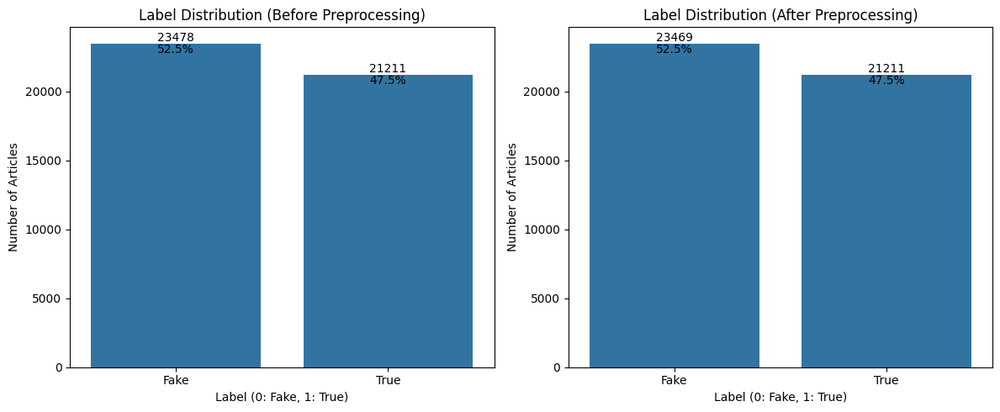

In [ ]:
# @title News Distribution
merged_label_counts = merged_df['label'].value_counts()
processed_label_counts = processed_df['label'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.barplot(x=merged_label_counts.index, y=merged_label_counts.values, ax=axes[0])
axes[0].set_title('Label Distribution (Before Preprocessing)')
axes[0].set_xlabel('Label (0: Fake, 1: True)')
axes[0].set_ylabel('Number of Articles')
axes[0].set_xticks(ticks=[0, 1], labels=['Fake', 'True'])

for i, p in enumerate(axes[0].patches):
  percentage = f'{label_percentages.iloc[i]:.1f}%'
  count = merged_label_counts.iloc[i]
  x = p.get_x() + p.get_width() / 2
  y = p.get_height()
  axes[0].annotate(percentage, (x, y), ha='center', va='top')
  axes[0].annotate(f'{count}', (x, y), ha='center', va='bottom')

sns.barplot(x=processed_label_counts.index, y=processed_label_counts.values, ax=axes[1])
axes[1].set_title('Label Distribution (After Preprocessing)')
axes[1].set_xlabel('Label (0: Fake, 1: True)')
axes[1].set_ylabel('Number of Articles')
axes[1].set_xticks(ticks=[0, 1], labels=['Fake', 'True'])

for i, p in enumerate(axes[1].patches):
  percentage = f'{label_percentages.iloc[i]:.1f}%'
  count = processed_label_counts.iloc[i]
  x = p.get_x() + p.get_width() / 2
  y = p.get_height()
  axes[1].annotate(percentage, (x, y), ha='center', va='top')
  axes[1].annotate(f'{count}', (x, y), ha='center', va='bottom')

plt.tight_layout()
plt.show()

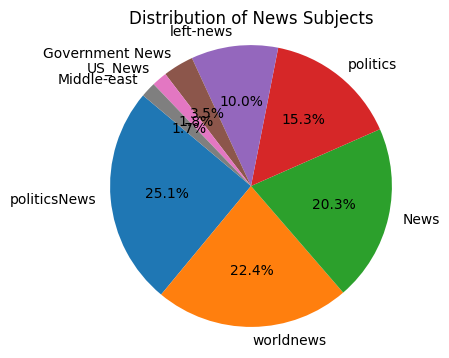

In [ ]:
# @title News subject distribution before preprocessing

subject_counts = merged_df['subject'].value_counts()

plt.figure(figsize=(4, 4))
plt.pie(subject_counts, labels=subject_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of News Subjects')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

In [ ]:
processed_df['label'].value_counts(normalize=True)

,proportion
label,
0,0.525269
1,0.474731


In [ ]:
# @title Print word not in GloVe
'''for word in tokenizer.word_index:
  if word not in glove.stoi:
    print(word)'''

<OOV>
presid
peopl
secur
minist
offici
judg
illeg
suprem
forc
polici
offic
leav
respons
defens
crisi
opposit
justic
secretari
hilari
peac
famili
violenc
exclus
imag
colleg
realli
penc
stori
decis
anoth
messag
coalit
releas
countri
lawmak
missil
readi
accus
execut
becom
sourc
possibl
zimbabw
bombshel
believ
agenc
despit
remov
femal
evid
everi
angri
servic
massiv
middl
histori
nomin
victori
awesom
battl
crazi
immigr
manag
pressur
econom
capit
outrag
foundat
crimin
littl
someth
challeng
issu
embassi
economi
deputi
urg
furiou
surpris
compani
refus
taxpay
financi
treasuri
emerg
choic
insid
sanctuari
everyon
earli
updat
conspiraci
alreadi
wors
pictur
charg
princ
testimoni
approv
confid
consid
financ
perfectli
guilti
corpor
worri
retir
outsid
suicid
testifi
disast
movi
insur
ignor
potenti
hyster
mosqu
amnesti
entir
dirti
ridicul
apolog
continu
endors
milit
regim
oppos
focu
ministri
marriag
seriou
influenc
primari
collus
decid
caucu
histor
strategi
stanc
religi
reportedli
bizarr
phoni
regul
di

In [ ]:
# @title OOV rate
print(f"Total Tokenizer Words: {len(tokenizer.word_index)}")

missing_words = [word for word in tokenizer.word_index if word not in glove.stoi]
print(f"Total OOV Words: {len(missing_words)}")

oov_count = sum(1 for word in tokenizer.word_index if word not in glove.stoi)
print(f"OOV Rate: {oov_count / len(tokenizer.word_index):.2%}")

Total Tokenizer Words: 22285
Total OOV Words: 366
OOV Rate: 1.64%


In [ ]:
word_index, global_embedding_matrix = generate_global_embedding_matrix(processed_df)
global_embedding_matrix = np.asarray(global_embedding_matrix, dtype=np.float32)
print(len(word_index))

(20000, 200)
20000


In [ ]:
# @title Load train test
train_file_name = 'train.csv'
test_file_name = 'test.csv'

if os.path.exists(f'{drive_dataset_path}/{train_file_name}') and os.path.exists(f'{drive_dataset_path}/{test_file_name}'):
  print("Loading...")
  train = read_df_from_csv_in_folder(drive_dataset_path, train_file_name)
  test = read_df_from_csv_in_folder(drive_dataset_path, test_file_name)
  X_train = np.asarray(train.iloc[:, :-1], dtype=np.int32)
  X_test = np.asarray(test.iloc[:, :-1], dtype=np.int32)
  y_train = np.asarray(train['label'], dtype=np.int32)
  y_test = np.asarray(test['label'], dtype=np.int32)
  X_train = np.clip(X_train, 0, len(word_index) - 1)
  X_test = np.clip(X_test, 0, len(word_index) - 1)
  print(f"Train Shape: {X_train.shape}, {y_train.shape}")
  print(f"Test Shape: {X_test.shape}, {y_test.shape}")
else:
  print(f"Files '{train_file_name}' and '{test_file_name}' does not exist in Google Drive.")
  X_train, X_test, y_train, y_test = train_test_splitting(X=processed_df.iloc[:, :-1], y=processed_df['label'], max_index=len(word_index))
  train = pd.merge(pd.DataFrame(X_train), pd.DataFrame(y_train, columns=['label']), left_index=True, right_index=True)
  test = pd.merge(pd.DataFrame(X_test), pd.DataFrame(y_test, columns=['label']), left_index=True, right_index=True)
  save_df_as_csv_to_folder(train, drive_dataset_path, 'train.csv')
  save_df_as_csv_to_folder(test, drive_dataset_path, 'test.csv')


Loading...
Loading /content/drive/My Drive/Colab Notebooks/data/public/OPCNN-FAKE/train.csv...
Done
Loading /content/drive/My Drive/Colab Notebooks/data/public/OPCNN-FAKE/test.csv...
Done
Train Shape: (35744, 100), (35744,)
Test Shape: (8936, 100), (8936,)


## Paper parameters

In [ ]:
#@title Build model
input_length = 32
paper_model = build_opcnn_fake_model(
    vocab_size=len(word_index),
    embedding_matrix=global_embedding_matrix,
    input_length=input_length,
    embedding_dim=output_dim,
    dropout_rate=0.4,
    filter_sizes=22,
    kernel_sizes=4,
    pool_sizes=3,
    )

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 32)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_4         │ (None, 32, 200)   │  4,000,000 │ input_layer_4[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 32, 200)   │          0 │ embedding_4[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_12 (Conv1D)  │ (None, 29, 22)    │     17,622 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_13 (Conv1D)  │ (None, 29, 22)    │     17,622 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_14 (Conv1D)  │ (None, 29, 22)    │     17,622 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_12    │ (None, 29, 22)    │          0 │ conv1d_12[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_13    │ (None, 29, 22)    │          0 │ conv1d_13[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_14    │ (None, 29, 22)    │          0 │ conv1d_14[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 29, 66)    │          0 │ max_pooling1d_12… │
│ (Concatenate)       │                   │            │ max_pooling1d_13… │
│                     │                   │            │ max_pooling1d_14… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_4 (Flatten) │ (None, 1914)      │          0 │ concatenate_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 64)        │    122,560 │ flatten_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 1)         │         65 │ dense_8[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,175,491 (15.93 MB)

 Trainable params: 4,175,491 (15.93 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#@title Train model
checkpoint_path = os.path.join(drive_dataset_path, "paper_checkpoints/cp-{epoch:04d}.weights.h5")
csv_logger_path = os.path.join(drive_dataset_path, "paper_training_log.csv")

os.makedirs(os.path.dirname(checkpoint_path), exist_ok=True)

cp_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    verbose=1,
    save_freq='epoch'
)

csv_logger = CSVLogger(csv_logger_path, separator=',', append=True)

paper_history = paper_model.fit(X_train[:, :32], y_train,
            epochs=66,
            batch_size=500,
            verbose=1,
            callbacks=[cp_callback, csv_logger]
          )

history_json_path = os.path.join(drive_dataset_path, "paper_training_history.json")
with open(history_json_path, 'w') as f:
    json.dump(paper_history.history, f) # Use paper_history.history here

print(f"Training history saved to: {history_json_path}")
print(f"Training log saved to: {csv_logger_path}")

Epoch 1/66
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step - accuracy: 0.5219 - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 1: saving model to /content/drive/My Drive/Colab Notebooks/data/public/OPCNN-FAKE/paper_checkpoints/cp-0001.weights.h5
72/72 ━━━━━━━━━━━━━━━━━━━━ 30s 357ms/step - accuracy: 0.5219 - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 2/66
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - accuracy: 0.5255 - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 2: saving model to /content/drive/My Drive/Colab Notebooks/data/public/OPCNN-FAKE/paper_checkpoints/cp-0002.weights.h5
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 345ms/step - accuracy: 0.5255 - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/66
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step - accuracy: 0.5246 - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3: saving model to /content/drive/My Drive/Colab Notebooks/data/public/OPCNN-FAKE/paper_checkpoints/cp-0003.w

In [ ]:
#@title Save model
model_save_dir = drive_dataset_path + '/paper_model'
tf.saved_model.save(paper_model, model_save_dir)
print(f"Model saved to: {model_save_dir}")

Model saved to: /content/drive/My Drive/Colab Notebooks/data/public/OPCNN-FAKE/paper_model


In [ ]:
#@title Load model
model_load_dir = drive_dataset_path + '/paper_model'
paper_model = tf.saved_model.load(model_load_dir)
print("Model loaded successfully!")

## Paper model evaluate

In [ ]:
paper_result = evaluate_model(paper_model, X_test[:, :32], y_test)

280/280 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5229 - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00
Test Accuracy: 0.5253, Precision: 0.0000, Recall: 0.0000


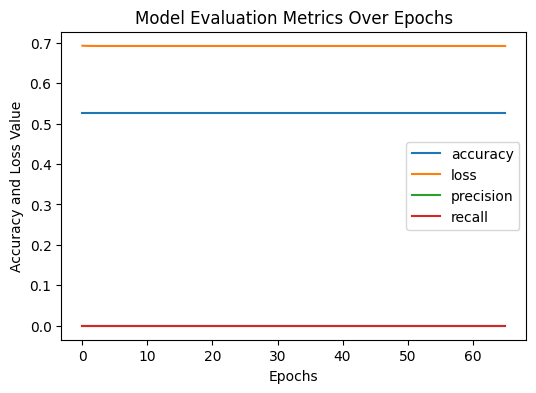

In [ ]:
evaluate_metrics_over_epochs(paper_history)

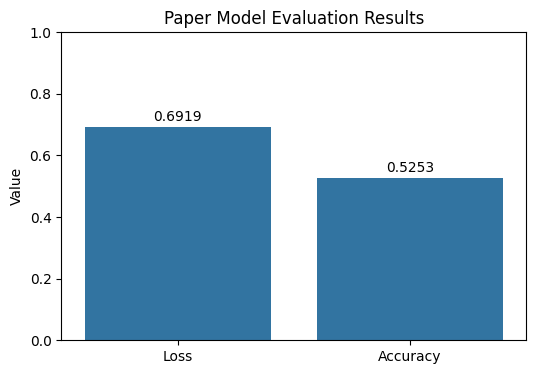

In [ ]:
plot_model_evaluation_result(paper_result)

## HyperOpt paramters

## Stage 1: Find hyper param

In [ ]:
#@title Build sample model
input_length = 100
hyperopt_model = build_opcnn_fake_model(
    vocab_size=len(word_index),
    embedding_matrix=global_embedding_matrix,
    input_length=input_length,
    dropout_rate=0.4,
    )

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_3         │ (None, 100, 200)  │  4,000,000 │ input_layer_3[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 100, 200)  │          0 │ embedding_3[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_9 (Conv1D)   │ (None, 97, 22)    │     17,622 │ dropout_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_10 (Conv1D)  │ (None, 97, 22)    │     17,622 │ dropout_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_11 (Conv1D)  │ (None, 97, 22)    │     17,622 │ dropout_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_9     │ (None, 97, 22)    │          0 │ conv1d_9[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_10    │ (None, 97, 22)    │          0 │ conv1d_10[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_11    │ (None, 97, 22)    │          0 │ conv1d_11[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 97, 66)    │          0 │ max_pooling1d_9[… │
│ (Concatenate)       │                   │            │ max_pooling1d_10… │
│                     │                   │            │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_3 (Flatten) │ (None, 6402)      │          0 │ concatenate_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 64)        │    409,792 │ flatten_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 1)         │         65 │ dense_6[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,462,723 (17.02 MB)

 Trainable params: 4,462,723 (17.02 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#@title Train sample model
hyperopt_history = hyperopt_model.fit(X_train, y_train,
            epochs=10,
            batch_size=500,
            verbose=1
          )

Epoch 1/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 70s 923ms/step - accuracy: 0.7530 - loss: 0.4350 - precision: 0.7450 - recall: 0.7490
Epoch 2/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 82s 927ms/step - accuracy: 0.9887 - loss: 0.0369 - precision: 0.9854 - recall: 0.9909
Epoch 3/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 82s 924ms/step - accuracy: 0.9974 - loss: 0.0114 - precision: 0.9968 - recall: 0.9977
Epoch 4/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 81s 912ms/step - accuracy: 0.9993 - loss: 0.0035 - precision: 0.9990 - recall: 0.9996
Epoch 5/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 81s 899ms/step - accuracy: 0.9998 - loss: 0.0026 - precision: 0.9997 - recall: 0.9999
Epoch 6/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 66s 923ms/step - accuracy: 1.0000 - loss: 4.9797e-04 - precision: 1.0000 - recall: 1.0000
Epoch 7/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 65s 903ms/step - accuracy: 0.9998 - loss: 0.0018 - precision: 0.9999 - recall: 0.9996
Epoch 8/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 67s 927ms/step - accuracy: 0.9999 - loss: 0.0010 - precision: 1.0000 - recall: 0.9998
Epoc

In [ ]:
hyperopt_result = evaluate_model(hyperopt_model, X_test, y_test)

280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.9840 - loss: 0.0786 - precision: 0.9796 - recall: 0.9869
Test Accuracy: 0.9869, Precision: 0.9845, Recall: 0.9880


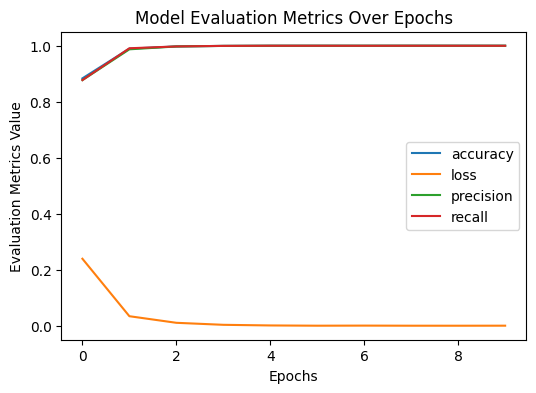

In [ ]:
evaluate_metrics_over_epochs(hyperopt_history)

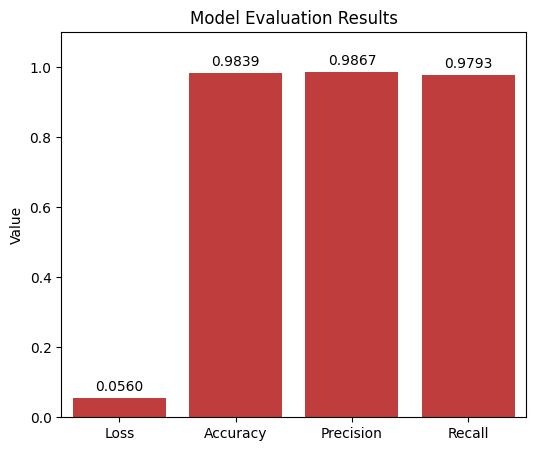

In [ ]:
plot_model_evaluation_result(hyperopt_result)

In [ ]:
#@title Find best params
input_length = 100
best_params = optimize_hyperparameters(X_train=X_train, y_train=y_train, vocab_size=len(word_index), embedding_matrix=global_embedding_matrix)
print(best_params)

  0%|          | 0/10 [00:00<?, ?trial/s, best loss=?]

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(



Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_4         │ (None, 100, 200)  │  4,000,000 │ input_layer_4[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 100, 200)  │          0 │ embedding_4[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_12 (Conv1D)  │ (None, 99, 32)    │     12,832 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_13 (Conv1D)  │ (None, 99, 32)    │     12,832 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_14 (Conv1D)  │ (None, 99, 32)    │     12,832 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_12    │ (None, 99, 32)    │          0 │ conv1d_12[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_13    │ (None, 99, 32)    │          0 │ conv1d_13[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_14    │ (None, 99, 32)    │          0 │ conv1d_14[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 99, 96)    │          0 │ max_pooling1d_12… │
│ (Concatenate)       │                   │            │ max_pooling1d_13… │
│                     │                   │            │ max_pooling1d_14… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_4 (Flatten) │ (None, 9504)      │          0 │ concatenate_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 64)        │    608,320 │ flatten_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 1)         │         65 │ dense_8[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,646,881 (17.73 MB)

 Trainable params: 4,646,881 (17.73 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/4

  1/358 ━━━━━━━━━━━━━━━━━━━━ 17:47 3s/step - accuracy: 0.4500 - loss: 0.6954 - precision: 0.4500 - recall: 0.3529
  2/358 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - accuracy: 0.4400 - loss: 0.7011 - precision: 0.4357 - recall: 0.4971
  3/358 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - accuracy: 0.4544 - loss: 0.6990 - precision: 0.4310 - recall: 0.4793
  4/358 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - accuracy: 0.4658 - loss: 0.6998 - precision: 0.4286 - recall: 0.4423
  5/358 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - accuracy: 0.4759 - loss: 0.6996 - precision: 0.4271 - recall: 0.4075
  6/358 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - accuracy: 0.4841 - loss: 0.6988 - precision: 0.4262 - recall: 0.3770
  7/358 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - accuracy: 0.4892 - loss: 0.6982 - precision: 0.4255 - recall: 0.3500
  8/358 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - accuracy: 0.4944 - loss: 0.6974 - precision: 0.4259 - recall: 0.3307
  9/358 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - accuracy: 0.4993 - loss:

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_5         │ (None, 100, 200)  │  4,000,000 │ input_layer_5[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 100, 200)  │          0 │ embedding_5[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_15 (Conv1D)  │ (None, 98, 64)    │     38,464 │ dropout_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_16 (Conv1D)  │ (None, 98, 64)    │     38,464 │ dropout_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_17 (Conv1D)  │ (None, 98, 64)    │     38,464 │ dropout_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_15    │ (None, 98, 64)    │          0 │ conv1d_15[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_16    │ (None, 98, 64)    │          0 │ conv1d_16[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_17    │ (None, 98, 64)    │          0 │ conv1d_17[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 98, 192)   │          0 │ max_pooling1d_15… │
│ (Concatenate)       │                   │            │ max_pooling1d_16… │
│                     │                   │            │ max_pooling1d_17… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_5 (Flatten) │ (None, 18816)     │          0 │ concatenate_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_10 (Dense)    │ (None, 64)        │  1,204,288 │ flatten_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_11 (Dense)    │ (None, 1)         │         65 │ dense_10[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,319,745 (20.29 MB)

 Trainable params: 5,319,745 (20.29 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/4

 1/36 ━━━━━━━━━━━━━━━━━━━━ 4:19 7s/step - accuracy: 0.5310 - loss: 0.6916 - precision: 0.5137 - recall: 0.2752
 2/36 ━━━━━━━━━━━━━━━━━━━━ 1:38 3s/step - accuracy: 0.5293 - loss: 0.7132 - precision: 0.5137 - recall: 0.2064
 3/36 ━━━━━━━━━━━━━━━━━━━━ 1:24 3s/step - accuracy: 0.5246 - loss: 0.7249 - precision: 0.5077 - recall: 0.2813
 4/36 ━━━━━━━━━━━━━━━━━━━━ 1:19 2s/step - accuracy: 0.5187 - loss: 0.7304 - precision: 0.5005 - recall: 0.3530
 5/36 ━━━━━━━━━━━━━━━━━━━━ 1:14 2s/step - accuracy: 0.5202 - loss: 0.7312 - precision: 0.5009 - recall: 0.4068
 6/36 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.5214 - loss: 0.7304 - precision: 0.5021 - recall: 0.4270
 7/36 ━━━━━━━━━━━━━━━━━━━━ 1:15 3s/step - accuracy: 0.5221 - loss: 0.7293 - precision: 0.5030 - recall: 0.4307
 8/36 ━━━━━━━━━━━━━━━━━━━━ 1:12 3s/step - accuracy: 0.5225 - loss: 0.7279 - precision: 0.5037 - recall: 0.4264
 9/36 ━━━━━━━━━━━━━━━━━━━━ 1:08 3s/step - accuracy: 0.5237 - loss: 0.7262 - precision: 0.5055 - recal

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_6         │ (None, 100, 200)  │  4,000,000 │ input_layer_6[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 100, 200)  │          0 │ embedding_6[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_18 (Conv1D)  │ (None, 99, 128)   │     51,328 │ dropout_6[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_19 (Conv1D)  │ (None, 99, 128)   │     51,328 │ dropout_6[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_20 (Conv1D)  │ (None, 99, 128)   │     51,328 │ dropout_6[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_18    │ (None, 99, 128)   │          0 │ conv1d_18[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_19    │ (None, 99, 128)   │          0 │ conv1d_19[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_20    │ (None, 99, 128)   │          0 │ conv1d_20[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_6       │ (None, 99, 384)   │          0 │ max_pooling1d_18… │
│ (Concatenate)       │                   │            │ max_pooling1d_19… │
│                     │                   │            │ max_pooling1d_20… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_6 (Flatten) │ (None, 38016)     │          0 │ concatenate_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_12 (Dense)    │ (None, 64)        │  2,433,088 │ flatten_6[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_13 (Dense)    │ (None, 1)         │         65 │ dense_12[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 6,587,137 (25.13 MB)

 Trainable params: 6,587,137 (25.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/4

 1/72 ━━━━━━━━━━━━━━━━━━━━ 9:31 8s/step - accuracy: 0.5040 - loss: 0.6938 - precision: 0.5129 - recall: 0.8417
 2/72 ━━━━━━━━━━━━━━━━━━━━ 2:08 2s/step - accuracy: 0.5000 - loss: 0.6967 - precision: 0.5062 - recall: 0.8801
 3/72 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - accuracy: 0.5044 - loss: 0.8593 - precision: 0.5040 - recall: 0.7980
 4/72 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - accuracy: 0.5062 - loss: 0.9329 - precision: 0.5028 - recall: 0.7168
 5/72 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - accuracy: 0.5048 - loss: 0.9634 - precision: 0.4987 - recall: 0.6879
 6/72 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - accuracy: 0.5028 - loss: 0.9816 - precision: 0.4951 - recall: 0.6801
 7/72 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - accuracy: 0.5012 - loss: 0.9903 - precision: 0.4925 - recall: 0.6819
 8/72 ━━━━━━━━━━━━━━━━━━━━ 2:13 2s/step - accuracy: 0.4999 - loss: 0.9914 - precision: 0.4909 - recall: 0.6881
 9/72 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - accuracy: 0.4996 - loss: 0.9884 - precision: 0.4897 - recal

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_7         │ (None, 100, 200)  │  4,000,000 │ input_layer_7[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 100, 200)  │          0 │ embedding_7[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_21 (Conv1D)  │ (None, 99, 64)    │     25,664 │ dropout_7[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_22 (Conv1D)  │ (None, 99, 64)    │     25,664 │ dropout_7[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_23 (Conv1D)  │ (None, 99, 64)    │     25,664 │ dropout_7[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_21    │ (None, 99, 64)    │          0 │ conv1d_21[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_22    │ (None, 99, 64)    │          0 │ conv1d_22[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_23    │ (None, 99, 64)    │          0 │ conv1d_23[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 99, 192)   │          0 │ max_pooling1d_21… │
│ (Concatenate)       │                   │            │ max_pooling1d_22… │
│                     │                   │            │ max_pooling1d_23… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_7 (Flatten) │ (None, 19008)     │          0 │ concatenate_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_14 (Dense)    │ (None, 64)        │  1,216,576 │ flatten_7[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_15 (Dense)    │ (None, 1)         │         65 │ dense_14[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,293,633 (20.19 MB)

 Trainable params: 5,293,633 (20.19 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/4

 1/36 ━━━━━━━━━━━━━━━━━━━━ 4:37 8s/step - accuracy: 0.5190 - loss: 0.6923 - precision: 0.4375 - recall: 0.0592
 2/36 ━━━━━━━━━━━━━━━━━━━━ 1:50 3s/step - accuracy: 0.5197 - loss: 0.7105 - precision: 0.4375 - recall: 0.0443
 3/36 ━━━━━━━━━━━━━━━━━━━━ 1:25 3s/step - accuracy: 0.5152 - loss: 0.7219 - precision: 0.4499 - recall: 0.1474
 4/36 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.5115 - loss: 0.7272 - precision: 0.4572 - recall: 0.2399
 5/36 ━━━━━━━━━━━━━━━━━━━━ 1:09 2s/step - accuracy: 0.5096 - loss: 0.7279 - precision: 0.4634 - recall: 0.3155
 6/36 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.5110 - loss: 0.7268 - precision: 0.4695 - recall: 0.3544
 7/36 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.5125 - loss: 0.7252 - precision: 0.4744 - recall: 0.3723
 8/36 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.5148 - loss: 0.7234 - precision: 0.4795 - recall: 0.3817
 9/36 ━━━━━━━━━━━━━━━━━━━━ 1:01 2s/step - accuracy: 0.5175 - loss: 0.7212 - precision: 0.4846 - recal

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_8         │ (None, 100, 200)  │  4,000,000 │ input_layer_8[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 100, 200)  │          0 │ embedding_8[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_24 (Conv1D)  │ (None, 99, 32)    │     12,832 │ dropout_8[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_25 (Conv1D)  │ (None, 99, 32)    │     12,832 │ dropout_8[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_26 (Conv1D)  │ (None, 99, 32)    │     12,832 │ dropout_8[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_24    │ (None, 99, 32)    │          0 │ conv1d_24[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_25    │ (None, 99, 32)    │          0 │ conv1d_25[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_26    │ (None, 99, 32)    │          0 │ conv1d_26[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_8       │ (None, 99, 96)    │          0 │ max_pooling1d_24… │
│ (Concatenate)       │                   │            │ max_pooling1d_25… │
│                     │                   │            │ max_pooling1d_26… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_8 (Flatten) │ (None, 9504)      │          0 │ concatenate_8[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_16 (Dense)    │ (None, 64)        │    608,320 │ flatten_8[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_17 (Dense)    │ (None, 1)         │         65 │ dense_16[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,646,881 (17.73 MB)

 Trainable params: 4,646,881 (17.73 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/4

  1/490 ━━━━━━━━━━━━━━━━━━━━ 36:58 5s/step - accuracy: 0.4247 - loss: 0.6951 - precision: 0.3929 - recall: 0.3056
  2/490 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.4486 - loss: 0.6940 - precision: 0.3929 - recall: 0.2302
  3/490 ━━━━━━━━━━━━━━━━━━━━ 1:41 207ms/step - accuracy: 0.4711 - loss: 0.6914 - precision: 0.4286 - recall: 0.2919
  4/490 ━━━━━━━━━━━━━━━━━━━━ 1:36 199ms/step - accuracy: 0.4817 - loss: 0.6907 - precision: 0.4429 - recall: 0.3106
  5/490 ━━━━━━━━━━━━━━━━━━━━ 1:35 198ms/step - accuracy: 0.4911 - loss: 0.6894 - precision: 0.4560 - recall: 0.3186
  6/490 ━━━━━━━━━━━━━━━━━━━━ 1:34 195ms/step - accuracy: 0.5002 - loss: 0.6877 - precision: 0.4664 - recall: 0.3227
  7/490 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - accuracy: 0.5068 - loss: 0.6865 - precision: 0.4765 - recall: 0.3230
  8/490 ━━━━━━━━━━━━━━━━━━━━ 1:32 191ms/step - accuracy: 0.5126 - loss: 0.6863 - precision: 0.4848 - recall: 0.3282
  9/490 ━━━━━━━━━━━━━━━━━━━━ 1:32 192ms/step - accuracy: 0.5187

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_9         │ (None, 100, 200)  │  4,000,000 │ input_layer_9[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 100, 200)  │          0 │ embedding_9[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_27 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_9[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_28 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_9[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_29 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_9[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_27    │ (None, 97, 128)   │          0 │ conv1d_27[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_28    │ (None, 97, 128)   │          0 │ conv1d_28[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_29    │ (None, 97, 128)   │          0 │ conv1d_29[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_9       │ (None, 97, 384)   │          0 │ max_pooling1d_27… │
│ (Concatenate)       │                   │            │ max_pooling1d_28… │
│                     │                   │            │ max_pooling1d_29… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_9 (Flatten) │ (None, 37248)     │          0 │ concatenate_9[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_18 (Dense)    │ (None, 64)        │  2,383,936 │ flatten_9[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_19 (Dense)    │ (None, 1)         │         65 │ dense_18[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 6,691,585 (25.53 MB)

 Trainable params: 6,691,585 (25.53 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/4

  1/164 ━━━━━━━━━━━━━━━━━━━━ 16:51 6s/step - accuracy: 0.4566 - loss: 0.6942 - precision: 0.4207 - recall: 0.6354
  2/164 ━━━━━━━━━━━━━━━━━━━━ 5:40 2s/step - accuracy: 0.4760 - loss: 1.2425 - precision: 0.4207 - recall: 0.4717 
  3/164 ━━━━━━━━━━━━━━━━━━━━ 5:50 2s/step - accuracy: 0.4843 - loss: 1.3143 - precision: 0.4207 - recall: 0.3812
  4/164 ━━━━━━━━━━━━━━━━━━━━ 5:50 2s/step - accuracy: 0.4828 - loss: 1.3287 - precision: 0.4192 - recall: 0.3814
  5/164 ━━━━━━━━━━━━━━━━━━━━ 5:52 2s/step - accuracy: 0.4818 - loss: 1.3219 - precision: 0.4229 - recall: 0.4074
  6/164 ━━━━━━━━━━━━━━━━━━━━ 5:48 2s/step - accuracy: 0.4809 - loss: 1.3060 - precision: 0.4268 - recall: 0.4386
  7/164 ━━━━━━━━━━━━━━━━━━━━ 5:43 2s/step - accuracy: 0.4804 - loss: 1.2854 - precision: 0.4307 - recall: 0.4695
  8/164 ━━━━━━━━━━━━━━━━━━━━ 5:37 2s/step - accuracy: 0.4807 - loss: 1.2628 - precision: 0.4352 - recall: 0.4988
  9/164 ━━━━━━━━━━━━━━━━━━━━ 5:34 2s/step - accuracy: 0.4808 - loss: 1.2402 - preci

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_10        │ (None, 100, 200)  │  4,000,000 │ input_layer_10[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_10          │ (None, 100, 200)  │          0 │ embedding_10[0][… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_30 (Conv1D)  │ (None, 98, 32)    │     19,232 │ dropout_10[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_31 (Conv1D)  │ (None, 98, 32)    │     19,232 │ dropout_10[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_32 (Conv1D)  │ (None, 98, 32)    │     19,232 │ dropout_10[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_30    │ (None, 98, 32)    │          0 │ conv1d_30[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_31    │ (None, 98, 32)    │          0 │ conv1d_31[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_32    │ (None, 98, 32)    │          0 │ conv1d_32[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_10      │ (None, 98, 96)    │          0 │ max_pooling1d_30… │
│ (Concatenate)       │                   │            │ max_pooling1d_31… │
│                     │                   │            │ max_pooling1d_32… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_10          │ (None, 9408)      │          0 │ concatenate_10[0… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_20 (Dense)    │ (None, 64)        │    602,176 │ flatten_10[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_21 (Dense)    │ (None, 1)         │         65 │ dense_20[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,659,937 (17.78 MB)

 Trainable params: 4,659,937 (17.78 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/4

  1/164 ━━━━━━━━━━━━━━━━━━━━ 12:54 5s/step - accuracy: 0.5708 - loss: 0.6935 - precision: 0.6667 - recall: 0.0417
  2/164 ━━━━━━━━━━━━━━━━━━━━ 1:48 672ms/step - accuracy: 0.5559 - loss: 0.8311 - precision: 0.6667 - recall: 0.0307
  3/164 ━━━━━━━━━━━━━━━━━━━━ 1:53 702ms/step - accuracy: 0.5462 - loss: 0.8479 - precision: 0.6667 - recall: 0.0247
  4/164 ━━━━━━━━━━━━━━━━━━━━ 1:49 687ms/step - accuracy: 0.5406 - loss: 0.8464 - precision: 0.6300 - recall: 0.0872
  5/164 ━━━━━━━━━━━━━━━━━━━━ 1:46 672ms/step - accuracy: 0.5361 - loss: 0.8418 - precision: 0.6054 - recall: 0.1540
  6/164 ━━━━━━━━━━━━━━━━━━━━ 1:46 672ms/step - accuracy: 0.5311 - loss: 0.8372 - precision: 0.5857 - recall: 0.2135
  7/164 ━━━━━━━━━━━━━━━━━━━━ 1:46 681ms/step - accuracy: 0.5282 - loss: 0.8317 - precision: 0.5734 - recall: 0.2670
  8/164 ━━━━━━━━━━━━━━━━━━━━ 1:46 680ms/step - accuracy: 0.5256 - loss: 0.8264 - precision: 0.5638 - recall: 0.3135
  9/164 ━━━━━━━━━━━━━━━━━━━━ 1:45 678ms/step - accuracy: 0.5233

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11      │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_11        │ (None, 100, 200)  │  4,000,000 │ input_layer_11[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_11          │ (None, 100, 200)  │          0 │ embedding_11[0][… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_33 (Conv1D)  │ (None, 97, 32)    │     25,632 │ dropout_11[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_34 (Conv1D)  │ (None, 97, 32)    │     25,632 │ dropout_11[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_35 (Conv1D)  │ (None, 97, 32)    │     25,632 │ dropout_11[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_33    │ (None, 97, 32)    │          0 │ conv1d_33[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_34    │ (None, 97, 32)    │          0 │ conv1d_34[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_35    │ (None, 97, 32)    │          0 │ conv1d_35[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_11      │ (None, 97, 96)    │          0 │ max_pooling1d_33… │
│ (Concatenate)       │                   │            │ max_pooling1d_34… │
│                     │                   │            │ max_pooling1d_35… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_11          │ (None, 9312)      │          0 │ concatenate_11[0… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_22 (Dense)    │ (None, 64)        │    596,032 │ flatten_11[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_23 (Dense)    │ (None, 1)         │         65 │ dense_22[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,672,993 (17.83 MB)

 Trainable params: 4,672,993 (17.83 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/4

  1/245 ━━━━━━━━━━━━━━━━━━━━ 21:09 5s/step - accuracy: 0.4863 - loss: 0.6969 - precision: 0.6286 - recall: 0.2619
  2/245 ━━━━━━━━━━━━━━━━━━━━ 2:05 515ms/step - accuracy: 0.4692 - loss: 0.9541 - precision: 0.5436 - recall: 0.4172
  3/245 ━━━━━━━━━━━━━━━━━━━━ 2:02 507ms/step - accuracy: 0.4673 - loss: 0.9876 - precision: 0.5194 - recall: 0.5158
  4/245 ━━━━━━━━━━━━━━━━━━━━ 1:58 491ms/step - accuracy: 0.4678 - loss: 0.9866 - precision: 0.5073 - recall: 0.5191
  5/245 ━━━━━━━━━━━━━━━━━━━━ 1:58 494ms/step - accuracy: 0.4698 - loss: 0.9771 - precision: 0.5000 - recall: 0.5004
  6/245 ━━━━━━━━━━━━━━━━━━━━ 1:58 495ms/step - accuracy: 0.4728 - loss: 0.9650 - precision: 0.4952 - recall: 0.4767
  7/245 ━━━━━━━━━━━━━━━━━━━━ 1:58 496ms/step - accuracy: 0.4766 - loss: 0.9520 - precision: 0.4917 - recall: 0.4533
  8/245 ━━━━━━━━━━━━━━━━━━━━ 1:57 496ms/step - accuracy: 0.4805 - loss: 0.9393 - precision: 0.4891 - recall: 0.4313
  9/245 ━━━━━━━━━━━━━━━━━━━━ 1:56 495ms/step - accuracy: 0.4846

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_12        │ (None, 100, 200)  │  4,000,000 │ input_layer_12[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_12          │ (None, 100, 200)  │          0 │ embedding_12[0][… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_36 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_12[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_37 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_12[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_38 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_12[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_36    │ (None, 97, 128)   │          0 │ conv1d_36[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_37    │ (None, 97, 128)   │          0 │ conv1d_37[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_38    │ (None, 97, 128)   │          0 │ conv1d_38[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_12      │ (None, 97, 384)   │          0 │ max_pooling1d_36… │
│ (Concatenate)       │                   │            │ max_pooling1d_37… │
│                     │                   │            │ max_pooling1d_38… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_12          │ (None, 37248)     │          0 │ concatenate_12[0… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_24 (Dense)    │ (None, 64)        │  2,383,936 │ flatten_12[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_25 (Dense)    │ (None, 1)         │         65 │ dense_24[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 6,691,585 (25.53 MB)

 Trainable params: 6,691,585 (25.53 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/4

  1/164 ━━━━━━━━━━━━━━━━━━━━ 16:26 6s/step - accuracy: 0.4703 - loss: 0.6948 - precision: 0.4468 - recall: 0.6238
  2/164 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.4932 - loss: 0.9564 - precision: 0.4468 - recall: 0.4718 
  3/164 ━━━━━━━━━━━━━━━━━━━━ 5:19 2s/step - accuracy: 0.4967 - loss: 0.9900 - precision: 0.4534 - recall: 0.5000
  4/164 ━━━━━━━━━━━━━━━━━━━━ 5:25 2s/step - accuracy: 0.4987 - loss: 1.0012 - precision: 0.4605 - recall: 0.5438
  5/164 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - accuracy: 0.4990 - loss: 1.0034 - precision: 0.4649 - recall: 0.5834
  6/164 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.4978 - loss: 0.9996 - precision: 0.4666 - recall: 0.6167
  7/164 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.4955 - loss: 0.9915 - precision: 0.4665 - recall: 0.6445
  8/164 ━━━━━━━━━━━━━━━━━━━━ 5:07 2s/step - accuracy: 0.4948 - loss: 0.9813 - precision: 0.4664 - recall: 0.6528
  9/164 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - accuracy: 0.4948 - loss: 0.9711 - preci

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13      │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_13        │ (None, 100, 200)  │  4,000,000 │ input_layer_13[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_13          │ (None, 100, 200)  │          0 │ embedding_13[0][… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_39 (Conv1D)  │ (None, 99, 128)   │     51,328 │ dropout_13[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_40 (Conv1D)  │ (None, 99, 128)   │     51,328 │ dropout_13[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_41 (Conv1D)  │ (None, 99, 128)   │     51,328 │ dropout_13[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_39    │ (None, 99, 128)   │          0 │ conv1d_39[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_40    │ (None, 99, 128)   │          0 │ conv1d_40[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_41    │ (None, 99, 128)   │          0 │ conv1d_41[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_13      │ (None, 99, 384)   │          0 │ max_pooling1d_39… │
│ (Concatenate)       │                   │            │ max_pooling1d_40… │
│                     │                   │            │ max_pooling1d_41… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_13          │ (None, 38016)     │          0 │ concatenate_13[0… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_26 (Dense)    │ (None, 64)        │  2,433,088 │ flatten_13[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_27 (Dense)    │ (None, 1)         │         65 │ dense_26[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 6,587,137 (25.13 MB)

 Trainable params: 6,587,137 (25.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/4

  1/164 ━━━━━━━━━━━━━━━━━━━━ 14:42 5s/step - accuracy: 0.5297 - loss: 0.6916 - precision: 0.3939 - recall: 0.1354
  2/164 ━━━━━━━━━━━━━━━━━━━━ 3:08 1s/step - accuracy: 0.5171 - loss: 0.9381 - precision: 0.3939 - recall: 0.0987 
  3/164 ━━━━━━━━━━━━━━━━━━━━ 2:59 1s/step - accuracy: 0.5249 - loss: 0.9641 - precision: 0.4520 - recall: 0.1189
  4/164 ━━━━━━━━━━━━━━━━━━━━ 3:00 1s/step - accuracy: 0.5226 - loss: 0.9630 - precision: 0.4587 - recall: 0.1786
  5/164 ━━━━━━━━━━━━━━━━━━━━ 2:59 1s/step - accuracy: 0.5193 - loss: 0.9551 - precision: 0.4617 - recall: 0.2399
  6/164 ━━━━━━━━━━━━━━━━━━━━ 2:59 1s/step - accuracy: 0.5161 - loss: 0.9458 - precision: 0.4635 - recall: 0.2952
  7/164 ━━━━━━━━━━━━━━━━━━━━ 3:00 1s/step - accuracy: 0.5125 - loss: 0.9365 - precision: 0.4636 - recall: 0.3429
  8/164 ━━━━━━━━━━━━━━━━━━━━ 3:04 1s/step - accuracy: 0.5095 - loss: 0.9273 - precision: 0.4638 - recall: 0.3845
  9/164 ━━━━━━━━━━━━━━━━━━━━ 3:04 1s/step - accuracy: 0.5072 - loss: 0.9182 - preci

In [ ]:
space = {
    'dropout_rate': hp.uniform('dropout_rate', 0.1, 0.9),
    'epochs': hp.choice('epochs', [4]), #hp.quniform('epochs', 1, 200, 1),
    'batch_size': hp.choice('batch_size', [73, 100, 146, 219, 500, 1000]),
    'filter_sizes': hp.choice('filter_sizes', [32, 64, 128]),
    'kernel_sizes': hp.choice('kernel_sizes', [2, 3, 4]),
    'pool_sizes': hp.choice('pool_sizes', [2, 3, 6])
  }
print(best_params)



{'batch_size': np.int64(3), 'dropout_rate': np.float64(0.2780419990046342), 'epochs': np.int64(0), 'filter_sizes': np.int64(2), 'kernel_sizes': np.int64(2), 'pool_sizes': np.int64(2)}


## Stage 2: Find epoch

In [ ]:
#@title Build model
input_length = 100
hyperopt_model = build_opcnn_fake_model(
    vocab_size=len(word_index),
    embedding_matrix=global_embedding_matrix,
    input_length=input_length,
    dropout_rate=0.278,
    filter_sizes=128,
    kernel_sizes=4,
    pool_sizes=6,
    )

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16      │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_16        │ (None, 100, 200)  │  4,000,000 │ input_layer_16[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_16          │ (None, 100, 200)  │          0 │ embedding_16[0][… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_48 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_16[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_49 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_16[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_50 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_16[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_48    │ (None, 97, 128)   │          0 │ conv1d_48[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_49    │ (None, 97, 128)   │          0 │ conv1d_49[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_50    │ (None, 97, 128)   │          0 │ conv1d_50[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_16      │ (None, 97, 384)   │          0 │ max_pooling1d_48… │
│ (Concatenate)       │                   │            │ max_pooling1d_49… │
│                     │                   │            │ max_pooling1d_50… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_16          │ (None, 37248)     │          0 │ concatenate_16[0… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_32 (Dense)    │ (None, 64)        │  2,383,936 │ flatten_16[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_33 (Dense)    │ (None, 1)         │         65 │ dense_32[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 6,691,585 (25.53 MB)

 Trainable params: 6,691,585 (25.53 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
hyperopt_history = hyperopt_model.fit(X_train, y_train,
            epochs=30,
            batch_size=219,
            verbose=1
          )

Epoch 1/30
164/164 ━━━━━━━━━━━━━━━━━━━━ 236s 1s/step - accuracy: 0.7900 - loss: 0.4127 - precision: 0.7705 - recall: 0.7924
Epoch 2/30
164/164 ━━━━━━━━━━━━━━━━━━━━ 265s 1s/step - accuracy: 0.9907 - loss: 0.0303 - precision: 0.9874 - recall: 0.9930
Epoch 3/30
164/164 ━━━━━━━━━━━━━━━━━━━━ 266s 1s/step - accuracy: 0.9980 - loss: 0.0069 - precision: 0.9974 - recall: 0.9985
Epoch 4/30
164/164 ━━━━━━━━━━━━━━━━━━━━ 240s 1s/step - accuracy: 0.9996 - loss: 0.0027 - precision: 0.9996 - recall: 0.9995
Epoch 5/30
164/164 ━━━━━━━━━━━━━━━━━━━━ 260s 1s/step - accuracy: 0.9999 - loss: 0.0010 - precision: 0.9998 - recall: 0.9999
Epoch 6/30
164/164 ━━━━━━━━━━━━━━━━━━━━ 236s 1s/step - accuracy: 1.0000 - loss: 2.1127e-04 - precision: 1.0000 - recall: 1.0000
Epoch 7/30
164/164 ━━━━━━━━━━━━━━━━━━━━ 264s 1s/step - accuracy: 1.0000 - loss: 3.0580e-04 - precision: 1.0000 - recall: 1.0000
Epoch 8/30
164/164 ━━━━━━━━━━━━━━━━━━━━ 244s 1s/step - accuracy: 1.0000 - loss: 1.7480e-04 - precision: 0.9999 - recall: 1.0

## Hyperopt model evaluate

280/280 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.9840 - loss: 0.0786 - precision: 0.9796 - recall: 0.9869
Test Accuracy: 0.9869, Precision: 0.9845, Recall: 0.9880

In [ ]:
hyperopt_result = evaluate_model(hyperopt_model, X_test, y_test)

280/280 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step - accuracy: 0.9831 - loss: 0.1373 - precision: 0.9782 - recall: 0.9866
Test Accuracy: 0.9867, Precision: 0.9843, Recall: 0.9877


In [ ]:
print(pd.DataFrame(hyperopt_history.history))

    accuracy      loss  precision    recall
0   0.908768  0.195019   0.895408  0.914668
1   0.991607  0.026849   0.989833  0.992516
2   0.998070  0.007212   0.997644  0.998291
3   0.999608  0.002316   0.999529  0.999646
4   0.999860  0.001182   0.999882  0.999823
5   0.999972  0.000332   0.999941  1.000000
6   0.999944  0.000466   0.999941  0.999941
7   0.999972  0.000173   0.999941  1.000000
8   0.999944  0.000168   0.999941  0.999941
9   0.999972  0.000069   1.000000  0.999941
10  0.999944  0.000145   0.999941  0.999941
11  0.999972  0.000094   0.999941  1.000000
12  0.999972  0.000063   1.000000  0.999941
13  0.999944  0.000065   0.999941  0.999941
14  0.999944  0.000049   0.999941  0.999941
15  0.999944  0.000046   0.999941  0.999941
16  0.999972  0.000065   0.999941  1.000000
17  0.999972  0.000069   0.999941  1.000000
18  0.999972  0.000046   0.999941  1.000000
19  0.999972  0.000043   0.999941  1.000000
20  0.999972  0.000042   0.999941  1.000000
21  0.999972  0.000040   0.99994

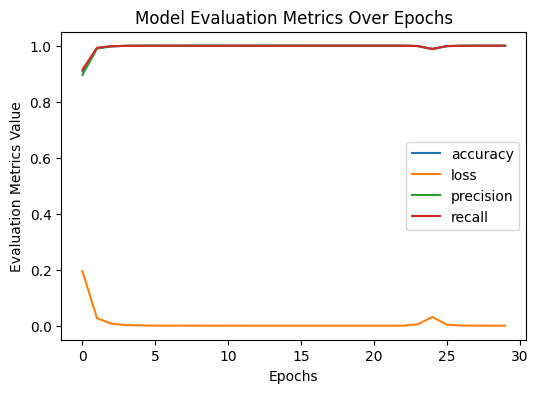

In [ ]:
evaluate_metrics_over_epochs(hyperopt_history)

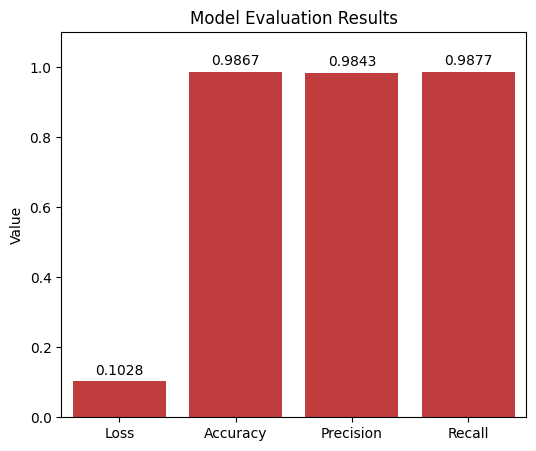

In [ ]:
plot_model_evaluation_result(hyperopt_result)

## Build and Train actual model

In [ ]:
#@title Build model
input_length = 100
hyperopt_model = build_opcnn_fake_model(
    vocab_size=len(word_index),
    embedding_matrix=global_embedding_matrix,
    input_length=input_length,
    dropout_rate=0.278,
    filter_sizes=128,
    kernel_sizes=4,
    pool_sizes=6,
    )

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17      │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_17        │ (None, 100, 200)  │  4,000,000 │ input_layer_17[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_17          │ (None, 100, 200)  │          0 │ embedding_17[0][… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_51 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_17[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_52 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_17[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_53 (Conv1D)  │ (None, 97, 128)   │    102,528 │ dropout_17[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_51    │ (None, 97, 128)   │          0 │ conv1d_51[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_52    │ (None, 97, 128)   │          0 │ conv1d_52[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_53    │ (None, 97, 128)   │          0 │ conv1d_53[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_17      │ (None, 97, 384)   │          0 │ max_pooling1d_51… │
│ (Concatenate)       │                   │            │ max_pooling1d_52… │
│                     │                   │            │ max_pooling1d_53… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_17          │ (None, 37248)     │          0 │ concatenate_17[0… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_34 (Dense)    │ (None, 64)        │  2,383,936 │ flatten_17[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_35 (Dense)    │ (None, 1)         │         65 │ dense_34[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 6,691,585 (25.53 MB)

 Trainable params: 6,691,585 (25.53 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# @title Train model
hyperopt_history = hyperopt_model.fit(X_train, y_train,
            epochs=4,
            batch_size=219,
            verbose=1
          )

Epoch 1/4
164/164 ━━━━━━━━━━━━━━━━━━━━ 240s 1s/step - accuracy: 0.8117 - loss: 0.4175 - precision: 0.7978 - recall: 0.7950
Epoch 2/4
164/164 ━━━━━━━━━━━━━━━━━━━━ 247s 2s/step - accuracy: 0.9916 - loss: 0.0293 - precision: 0.9890 - recall: 0.9934
Epoch 3/4
164/164 ━━━━━━━━━━━━━━━━━━━━ 235s 1s/step - accuracy: 0.9981 - loss: 0.0080 - precision: 0.9972 - recall: 0.9989
Epoch 4/4
164/164 ━━━━━━━━━━━━━━━━━━━━ 262s 1s/step - accuracy: 0.9990 - loss: 0.0038 - precision: 0.9988 - recall: 0.9991


In [ ]:
hyperopt_result = evaluate_model(hyperopt_model, X_test, y_test)

280/280 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.9834 - loss: 0.0836 - precision: 0.9756 - recall: 0.9899
Test Accuracy: 0.9865, Precision: 0.9795, Recall: 0.9922


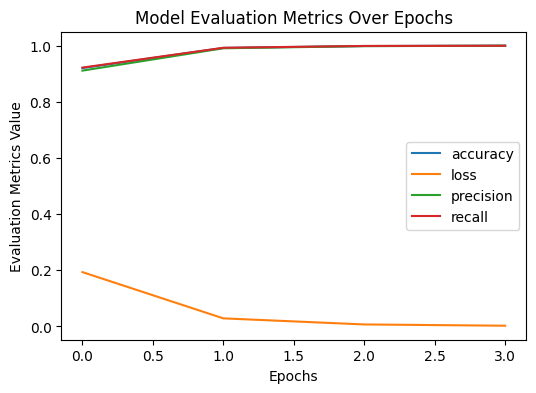

In [ ]:
evaluate_metrics_over_epochs(hyperopt_history)

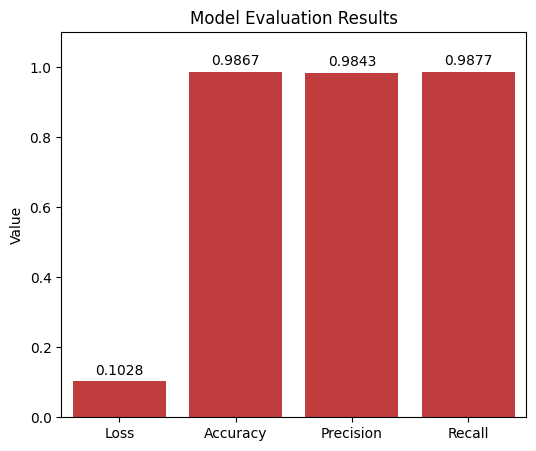

In [ ]:
plot_model_evaluation_result(hyperopt_result)

In [ ]:
#@title Save model
model_save_dir = drive_dataset_path + '/hyperopt_model'
tf.saved_model.save(hyperopt_model, model_save_dir)
tfjs.converters.save_keras_model(hyperopt_model, f'{model_save_dir}'.replace('hyperopt_model', 'tfjs_hyperopt_model'))
print(f"Model saved to: {model_save_dir}")

failed to lookup keras version from the file,
    this is likely a weight only file
Model saved to: /content/drive/My Drive/Colab Notebooks/data/public/OPCNN-FAKE/hyperopt_model
